In [1]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
import numpy as np
import sys
sys.path.append("/Users/paolo/Documents/PaperLinCFA/")
sys.path.append("/Users/paolo/Documents/Droughts/scripts/")
from DdimensionalExperimentReal import single_experiment_realData_nDim,train_sup_PCA,compute_PCA
from LinCFA import LinCFA
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score

In [2]:
def standardize(x_train, x_val, x_test):
    trainScaler = StandardScaler()
    x_train_scaled = trainScaler.fit_transform(x_train)
    x_val_scaled = trainScaler.transform(x_val)
    x_test_scaled = trainScaler.transform(x_test)
    
    return x_train_scaled, x_val_scaled, x_test_scaled

def unfold_dataset(x, y, df, feature_list):
    df_unfolded = pd.DataFrame(df.date.unique(), columns=['date'])
    df_unfolded = df_unfolded.set_index('date', drop=True)
    for feature_name in feature_list:
        for i in x:
            for j in y:
                col = df.loc[(df.x==i) & (df.y==j),[feature_name,'date']].set_index('date',drop=True)
                df_unfolded = pd.concat([df_unfolded,col],axis=1)
                newname = feature_name+str(i)+'_'+str(j)
                df_unfolded = df_unfolded.rename({feature_name:newname},axis=1)

    return df_unfolded

In [3]:
def compute_r2(x_train, y_train, x_val, y_val):
    regr = LinearRegression().fit(x_train,y_train)
    y_pred = regr.predict(x_val)
    return r2_score(y_val, y_pred)

# target

In [4]:
target_df = pd.read_csv('/Users/paolo/Documents/OneDrive - Politecnico di Milano/droughts/csv_VHI/Emiliani2.csv')
target_df_train = target_df.iloc[0:589,:]
target_df_val = target_df.iloc[589:789,:]
target_df_test = target_df.iloc[789:,:]

target_df_train['mean_std'], target_df_val['mean_std'], target_df_test['mean_std'] = standardize(target_df_train['mean'].values.reshape(-1,1), target_df_val['mean'].values.reshape(-1,1), target_df_test['mean'].values.reshape(-1,1))
target_df_valTest = pd.concat([target_df_val,target_df_test],axis=0).reset_index(drop=True)
print(f'target samples: {target_df_train}\n target shapes: {target_df_train.shape, target_df_val.shape, target_df_test.shape}')



target samples:      Unnamed: 0      mean  median  year  week  mean_std
0    2001-01-05  0.214281    0.00  2001     1 -1.402730
1    2001-01-13  0.484737    0.52  2001     2  0.347916
2    2001-01-21  0.466071    0.47  2001     3  0.227090
3    2001-01-29  0.417470    0.44  2001     5 -0.087501
4    2001-02-06  0.492202    0.53  2001     6  0.396235
..          ...       ...     ...   ...   ...       ...
584  2013-10-21  0.739946    0.79  2013    43  1.999865
585  2013-10-29  0.447691    0.46  2013    44  0.108118
586  2013-11-06  0.541628    0.56  2013    45  0.716163
587  2013-11-14  0.493719    0.53  2013    46  0.406051
588  2013-11-22  0.527436    0.57  2013    47  0.624301

[589 rows x 6 columns]
 target shapes: ((589, 6), (200, 6), (199, 6))


/var/folders/h8/q6jr81l13jg__h7vcvcff1y00000gn/T/ipykernel_57907/2551856681.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  target_df_train['mean_std'], target_df_val['mean_std'], target_df_test['mean_std'] = standardize(target_df_train['mean'].values.reshape(-1,1), target_df_val['mean'].values.reshape(-1,1), target_df_test['mean'].values.reshape(-1,1))
/var/folders/h8/q6jr81l13jg__h7vcvcff1y00000gn/T/ipykernel_57907/2551856681.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  target_df_train['mean_st

mean and variance with and without standardization:
 (0.43098799464006793, -1.2063543900850598e-16) - (0.023867032102160256, 1.0000000000000002)
standardize mean and variance of validation and test:
 (0.13301279831571755, -0.1512149226677684) - (0.8118100659124247, 1.0145165025976417)


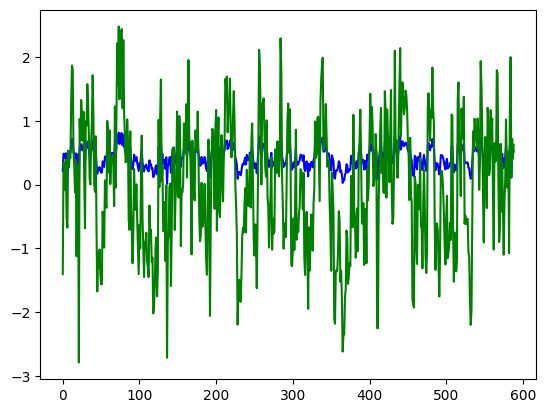

In [5]:
plt.plot(target_df_train['mean'], color='blue')
plt.plot(target_df_train['mean_std'], color='green')
m = np.mean(target_df_train['mean'])
m0 = np.mean(target_df_train['mean_std'])
v = np.var(target_df_train['mean'])
v0 = np.var(target_df_train['mean_std'])
print(f'mean and variance with and without standardization:\n {m,m0} - {v,v0}')
m0_val = np.mean(target_df_val['mean_std'])
m0_test = np.mean(target_df_test['mean_std'])
v0_val = np.var(target_df_val['mean_std'])
v0_test = np.var(target_df_test['mean_std'])

print(f'standardize mean and variance of validation and test:\n {m0_val,m0_test} - {v0_val,v0_test}')

# Emiliani2 Temperature Features

In [6]:
temperature_df = pd.read_csv('/Users/paolo/Documents/OneDrive - Politecnico di Milano/droughts/features/csv_allvalues/daily_mean_temperature(tg)/Emiliani2_tg.csv')
temperature_df_train = temperature_df.loc[temperature_df['date']<='2013-11-22',:]
temperature_df_val = temperature_df.loc[(temperature_df['date']>'2013-11-22') & (temperature_df['date']<='2018-04-10'),:]
temperature_df_test = temperature_df.loc[temperature_df['date']>'2018-04-10',:]


In [7]:
temperature_df_train_unfolded = unfold_dataset(temperature_df_train.x.unique(), temperature_df_train.y.unique(), temperature_df_train, ['cyclostationary_mean'])
temperature_df_train_unfolded = temperature_df_train_unfolded.loc[:,np.std(temperature_df_train_unfolded,axis=0)>0]

temperature_df_val_unfolded = unfold_dataset(temperature_df_val.x.unique(), temperature_df_val.y.unique(), temperature_df_val, ['cyclostationary_mean'])
temperature_df_val_unfolded = temperature_df_val_unfolded.loc[:,np.std(temperature_df_val_unfolded,axis=0)>0]

temperature_df_test_unfolded = unfold_dataset(temperature_df_test.x.unique(), temperature_df_test.y.unique(), temperature_df_test, ['cyclostationary_mean'])
temperature_df_test_unfolded = temperature_df_test_unfolded.loc[:,np.std(temperature_df_test_unfolded,axis=0)>0]

temperature_df_train_unfolded_std, temperature_df_val_unfolded_std, temperature_df_test_unfolded_std = standardize(temperature_df_train_unfolded, temperature_df_val_unfolded, temperature_df_test_unfolded)
temperature_df_train_unfolded_std = pd.DataFrame(data=temperature_df_train_unfolded_std, columns=temperature_df_train_unfolded.columns)
temperature_df_val_unfolded_std = pd.DataFrame(data=temperature_df_val_unfolded_std, columns=temperature_df_val_unfolded.columns)
temperature_df_test_unfolded_std = pd.DataFrame(data=temperature_df_test_unfolded_std, columns=temperature_df_test_unfolded.columns)
temperature_df_valTest_unfolded_std = pd.concat([temperature_df_val_unfolded_std,temperature_df_test_unfolded_std],axis=0).reset_index(drop=True)


In [8]:
temperature_df_train_unfolded.head()

,cyclostationary_mean10.449860349182202_44.24986054919872,cyclostationary_mean10.449860349182202_44.34986054888138,cyclostationary_mean10.449860349182202_44.44986054856403,cyclostationary_mean10.449860349182202_44.54986054824669,cyclostationary_mean10.449860349182202_44.64986054792934,cyclostationary_mean10.449860349182202_44.749860547612,cyclostationary_mean10.449860349182202_44.849860547294654,cyclostationary_mean10.449860349182202_44.949860546977305,cyclostationary_mean10.549860348782152_44.24986054919872,cyclostationary_mean10.549860348782152_44.34986054888138,...,cyclostationary_mean9.949860351182458_44.849860547294654,cyclostationary_mean9.949860351182458_44.949860546977305,cyclostationary_mean9.949860351182458_45.04986054665997,cyclostationary_mean9.949860351182458_45.14986054634262,cyclostationary_mean9.949860351182458_45.249860546025275,cyclostationary_mean10.949860347181946_44.64986054792934,cyclostationary_mean10.949860347181946_44.749860547612,cyclostationary_mean10.949860347181946_44.849860547294654,cyclostationary_mean10.949860347181946_44.949860546977305,cyclostationary_mean10.949860347181946_45.04986054665997
date,,,,,,,,,,,,,,,,,,,,,
2001-01-05,0.933558,0.303173,1.067308,1.115673,1.235385,1.271346,1.507692,1.673558,0.860962,0.305000,...,1.040000,1.746731,2.051731,2.021538,1.789904,0.289519,0.353846,-0.083942,-0.220673,-0.114712
2001-01-13,3.895000,4.377614,5.275682,4.848636,4.063295,3.672500,3.451136,3.426250,3.657045,4.074091,...,3.442045,4.015682,4.050227,3.797841,3.219318,2.374659,2.220114,1.739545,1.464205,1.620000
2001-01-21,-3.177000,-2.539125,-0.346125,0.397125,0.454250,0.032000,-0.460000,-0.566875,-3.661875,-2.831500,...,0.074250,0.392250,0.247000,-0.034000,-0.523375,-1.391250,-1.556250,-2.133375,-2.294000,-2.157750
2001-01-29,3.448558,3.288269,4.477500,4.260577,3.308269,2.789711,2.505385,2.490192,3.245288,3.029135,...,2.262596,2.869327,3.125288,2.641635,2.261731,1.341635,1.139135,0.411538,0.233750,0.395096
2001-02-06,-1.362841,-0.521932,1.480909,1.717841,1.790795,1.677386,1.263068,1.228977,-1.829659,-0.971023,...,1.721591,2.239886,2.288864,1.867614,1.627500,-0.827614,-0.586932,-0.967386,-1.120341,-0.745568


In [9]:
m0_train = temperature_df_train_unfolded_std.mean().values
m0_valTest = temperature_df_valTest_unfolded_std.mean().values
v0_train = temperature_df_train_unfolded_std.var().values
v0_valTest = temperature_df_valTest_unfolded_std.var().values

print(f'standardize mean and variance of validation and test:\n {m0_train,m0_valTest} \n {v0_train,v0_valTest}')

standardize mean and variance of validation and test:
 (array([-2.41270878e-17, -2.11112018e-17,  0.00000000e+00,  1.20635439e-17,
       -2.11112018e-17,  3.61906317e-17,  0.00000000e+00,  0.00000000e+00,
        2.41270878e-17,  0.00000000e+00, -1.80953159e-17,  0.00000000e+00,
       -1.50794299e-18,  2.41270878e-17, -2.41270878e-17,  6.03177195e-17,
        1.50794299e-18, -1.80953159e-17,  2.41270878e-17, -2.41270878e-17,
        0.00000000e+00,  0.00000000e+00,  2.41270878e-17, -6.03177195e-18,
        2.86509168e-17, -1.80953159e-17, -3.61906317e-17,  3.01588598e-17,
        0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
       -3.54366602e-17, -1.20635439e-17, -2.41270878e-17, -2.11112018e-17,
       -1.20635439e-17,  0.00000000e+00,  2.41270878e-17, -2.41270878e-17,
       -2.41270878e-17,  1.20635439e-17, -1.80953159e-17, -2.41270878e-17,
        3.61906317e-17,  2.41270878e-17, -1.80953159e-17, -1.20635439e-17,
       -2.41270878e-17,  1.80953159e-17,  2.

In [10]:
X_train = np.array(temperature_df_train_unfolded_std)
y_train = np.array(target_df_train['mean_std']).reshape(-1,1)
X_test = np.array(temperature_df_valTest_unfolded_std)
y_test = np.array(target_df_valTest.iloc[:-7,:]['mean_std']).reshape(-1,1)
print(f'check shapes: \n{X_train.shape}\n{y_train.shape}\n{X_test.shape}\n{y_test.shape}\n')

check shapes: 
(589, 130)
(589, 1)
(392, 130)
(392, 1)



In [11]:
cluster_temp,score_full,score_aggr,mse_full,mse_aggr = single_experiment_realData_nDim(X_train, X_test, y_train, y_test)
print('LinCFA number of reduced dimensions: ')
print(len(cluster_temp))

full regression score: -0.6002594215994668
aggr regression score: 0.140896663623842
full regression MSE: 1.4571000246841088
aggr regression MSE: 0.7822478504071051
LinCFA number of reduced dimensions: 
11


In [12]:
for i in range(len(cluster_temp)): print(len(cluster_temp[i]))

26
71
61
42
44
14
11
7
1
2
1


In [13]:
### with the new class
temp_df_train_unfolded_std_withTar = pd.concat((temperature_df_train_unfolded_std,target_df_train['mean_std']), axis=1)
temp_output = LinCFA(temp_df_train_unfolded_std_withTar,'mean_std', 0).compute_clusters()
temp_output

[['cyclostationary_mean10.449860349182202_44.24986054919872',
  'cyclostationary_mean10.449860349182202_44.849860547294654',
  'cyclostationary_mean10.449860349182202_44.44986054856403',
  'cyclostationary_mean10.449860349182202_44.34986054888138',
  'cyclostationary_mean10.449860349182202_44.54986054824669',
  'cyclostationary_mean10.449860349182202_44.749860547612',
  'cyclostationary_mean10.549860348782152_44.34986054888138',
  'cyclostationary_mean10.449860349182202_44.64986054792934',
  'cyclostationary_mean10.549860348782152_44.54986054824669',
  'cyclostationary_mean10.549860348782152_44.64986054792934',
  'cyclostationary_mean10.549860348782152_44.749860547612',
  'cyclostationary_mean10.149860350382356_44.34986054888138',
  'cyclostationary_mean10.149860350382356_44.749860547612',
  'cyclostationary_mean10.249860349982306_44.34986054888138',
  'cyclostationary_mean10.249860349982306_44.749860547612',
  'cyclostationary_mean10.349860349582254_44.64986054792934',
  'cyclostation

In [14]:
temp_aggregate_train = pd.DataFrame()
temp_aggregate_valTest = pd.DataFrame()

for i in range(len(temp_output)):
    print(len(temp_output[i]))
    temp_aggregate_train[str(i)] = temperature_df_train_unfolded_std[temp_output[i]].mean(axis=1)
    temp_aggregate_valTest[str(i)] = temperature_df_valTest_unfolded_std[temp_output[i]].mean(axis=1)

43
21
15
15
17
6
7
1
1
3
1


In [15]:
regr = LinearRegression()
regr = regr.fit(temp_aggregate_train,y_train)
regr.score(temp_aggregate_valTest,y_test)

0.14283813438050164

In [ ]:
### Exploring the neighbours only 

# Precipitation

In [28]:
prec_df = pd.read_csv('/Users/paolo/Documents/OneDrive - Politecnico di Milano/droughts/features/csv_allvalues/daily_precipitation_sum(rr)/Emiliani2_rr.csv')
prec_df_train = prec_df.loc[prec_df['date']<='2013-11-22',:]
prec_df_val = prec_df.loc[(prec_df['date']>'2013-11-22') & (prec_df['date']<='2018-04-10'),:]
prec_df_test = prec_df.loc[prec_df['date']>'2018-04-10',:]


In [29]:
prec_df_train_unfolded = unfold_dataset(prec_df_train.x.unique(), prec_df_train.y.unique(), prec_df_train, ['cyclostationary_mean'])
prec_df_train_unfolded = prec_df_train_unfolded.loc[:,np.std(prec_df_train_unfolded,axis=0)>0]

prec_df_val_unfolded = unfold_dataset(prec_df_val.x.unique(), prec_df_val.y.unique(), prec_df_val, ['cyclostationary_mean'])
prec_df_val_unfolded = prec_df_val_unfolded.loc[:,np.std(prec_df_val_unfolded,axis=0)>0]

prec_df_test_unfolded = unfold_dataset(prec_df_test.x.unique(), prec_df_test.y.unique(), prec_df_test, ['cyclostationary_mean'])
prec_df_test_unfolded = prec_df_test_unfolded.loc[:,np.std(prec_df_test_unfolded,axis=0)>0]

prec_df_train_unfolded_std, prec_df_val_unfolded_std, prec_df_test_unfolded_std = standardize(prec_df_train_unfolded, prec_df_val_unfolded, prec_df_test_unfolded)
prec_df_train_unfolded_std = pd.DataFrame(data=prec_df_train_unfolded_std, columns=prec_df_train_unfolded.columns)
prec_df_val_unfolded_std = pd.DataFrame(data=prec_df_val_unfolded_std, columns=prec_df_val_unfolded.columns)
prec_df_test_unfolded_std = pd.DataFrame(data=prec_df_test_unfolded_std, columns=prec_df_test_unfolded.columns)
prec_df_valTest_unfolded_std = pd.concat([prec_df_val_unfolded_std,prec_df_test_unfolded_std],axis=0).reset_index(drop=True)


In [30]:
prec_df_train_unfolded.head()

,cyclostationary_mean10.449860349183904_44.249859786110974,cyclostationary_mean10.449860349183904_44.349859781551785,cyclostationary_mean10.449860349183904_44.44985977699261,cyclostationary_mean10.449860349183904_44.549859772433415,cyclostationary_mean10.449860349183904_44.64985976787423,cyclostationary_mean10.449860349183904_44.74985976331504,cyclostationary_mean10.449860349183904_44.849859758755855,cyclostationary_mean10.449860349183904_44.94985975419667,cyclostationary_mean10.549860348783858_44.249859786110974,cyclostationary_mean10.549860348783858_44.349859781551785,...,cyclostationary_mean9.949860351184135_44.849859758755855,cyclostationary_mean9.949860351184135_44.94985975419667,cyclostationary_mean9.949860351184135_45.04985974963749,cyclostationary_mean9.949860351184135_45.1498597450783,cyclostationary_mean9.949860351184135_45.24985974051911,cyclostationary_mean10.949860347183671_44.64985976787423,cyclostationary_mean10.949860347183671_44.74985976331504,cyclostationary_mean10.949860347183671_44.849859758755855,cyclostationary_mean10.949860347183671_44.94985975419667,cyclostationary_mean10.949860347183671_45.04985974963749
date,,,,,,,,,,,,,,,,,,,,,
2001-01-05,5.559615,5.181731,2.965385,1.009615,0.644231,0.623077,0.625000,0.864423,4.629808,3.524039,...,2.905769,0.874038,1.796154,2.093269,2.468269,1.181731,1.421154,1.186538,1.339423,1.268269
2001-01-13,7.378409,2.362500,0.976136,0.122727,-1.606818,0.060227,-0.303409,-0.285227,5.711364,1.451136,...,1.114773,1.221591,1.559091,2.034091,2.348864,-0.456818,-0.440909,-0.457955,0.111364,0.419318
2001-01-21,-0.757500,0.040000,0.028750,-0.260000,-0.511250,-0.491250,-0.353750,-0.646250,0.140000,0.447500,...,1.472500,-0.098750,-0.097500,-0.133750,-0.120000,-0.273750,-0.397500,-0.585000,-0.567500,-0.538750
2001-01-29,7.274039,2.404808,0.285577,0.188462,-1.007692,-0.759615,-0.756731,-0.952885,6.449039,0.651923,...,-0.135577,-0.285577,-0.225962,-0.275962,0.936538,-1.075962,-1.037500,-1.017308,-0.719231,-0.643269
2001-02-06,0.289773,1.150000,1.713636,1.427273,6.300000,0.732955,0.745455,-0.672727,1.570455,0.887500,...,-1.247727,-1.232955,-1.309091,-1.300000,-1.271591,2.763636,1.452273,0.576136,0.343182,-0.575000


In [31]:
m0_train = prec_df_train_unfolded_std.mean().values
m0_valTest = prec_df_valTest_unfolded_std.mean().values
v0_train = prec_df_train_unfolded_std.var().values
v0_valTest = prec_df_valTest_unfolded_std.var().values

print(f'standardize mean and variance of validation and test:\n {m0_train,m0_valTest} \n {v0_train,v0_valTest}')

standardize mean and variance of validation and test:
 (array([ 0.00000000e+00,  1.50794299e-18, -6.78574344e-18,  1.20635439e-17,
        3.01588598e-18,  6.03177195e-18,  1.80953159e-17,  0.00000000e+00,
        6.03177195e-18, -3.01588598e-18, -1.20635439e-17,  0.00000000e+00,
       -1.20635439e-17, -1.20635439e-17,  0.00000000e+00,  6.03177195e-18,
       -1.20635439e-17,  3.01588598e-18,  3.01588598e-18,  1.80953159e-17,
        6.03177195e-18,  1.20635439e-17, -1.20635439e-17,  1.20635439e-17,
       -1.20635439e-17,  6.03177195e-18, -1.20635439e-17, -3.01588598e-18,
        0.00000000e+00, -6.03177195e-18,  6.03177195e-18,  0.00000000e+00,
       -1.20635439e-17, -1.20635439e-17,  1.20635439e-17,  9.04765793e-18,
       -1.20635439e-17, -1.20635439e-17, -2.41270878e-17, -3.01588598e-18,
        8.29368643e-18,  6.03177195e-18,  6.03177195e-18,  0.00000000e+00,
        0.00000000e+00, -6.03177195e-18,  2.41270878e-17,  6.03177195e-18,
       -1.05556009e-17, -9.04765793e-18, -3.

In [32]:
X_train = np.array(prec_df_train_unfolded_std)
y_train = np.array(target_df_train['mean_std']).reshape(-1,1)
X_test = np.array(prec_df_valTest_unfolded_std)
y_test = np.array(target_df_valTest.iloc[:-7,:]['mean_std']).reshape(-1,1)
print(f'check shapes: \n{X_train.shape}\n{y_train.shape}\n{X_test.shape}\n{y_test.shape}\n')

check shapes: 
(589, 130)
(589, 1)
(392, 130)
(392, 1)



In [34]:
cluster_prec,score_full,score_aggr,mse_full,mse_aggr = single_experiment_realData_nDim(X_train, X_test, y_train, y_test)
print('LinCFA number of reduced dimensions: ')
print(len(cluster_prec))

full regression score: -0.33837726477856944
aggr regression score: 0.07085610254877628
full regression MSE: 1.2186458765518908
aggr regression MSE: 0.84602257461361
LinCFA number of reduced dimensions: 
8


In [35]:
for i in range(len(cluster_prec)): print(len(cluster_prec[i]))

15
55
48
35
51
12
6
6


In [36]:
### with the new class
prec_df_train_unfolded_std_withTar = pd.concat((prec_df_train_unfolded_std,target_df_train['mean_std']), axis=1)
prec_output = LinCFA(prec_df_train_unfolded_std_withTar,'mean_std', 0).compute_clusters()
prec_output

[-0.14157905  0.33587406]
[-0.09062053  0.32160153]
[-0.0336043   0.26545634]
[-0.0079642   0.24652094]
[-0.01888922  0.27521181]
[-0.02584513  0.26919363]
[-0.03214499  0.2771248 ]
[-0.22166794  0.38689325]
[-0.11619484  0.33325462]
[-0.05256457  0.28637639]
[-0.03531598  0.2787925 ]
[-0.01470232  0.26601999]
[-0.02417097  0.27917605]
[-0.00905779  0.25212516]
[-0.0231383   0.26696757]
[0.05924473 0.09629467]
[-0.10389998  0.30268105]
[-0.07394607  0.30909732]
[-0.02421605  0.25924455]
[1.32713151e-04 2.41499913e-01]
[-0.01010915  0.2700096 ]
[-0.015412    0.26257967]
[-0.02238776  0.27093218]
[-0.09899246  0.26895619]
[-0.07923417  0.30256345]
[-0.03355052  0.27284893]
[-0.02126897  0.26957127]
[-0.0057965   0.26069024]
[-0.01602593  0.27430766]
[-0.00033646  0.24680117]
[-0.01628692  0.26278387]
[-0.10354708  0.27932363]
[-0.0828225   0.27960653]
[-0.02159372  0.2451696 ]
[-0.01519822  0.24863165]
[-0.0134714   0.25423534]
[0.01723718 0.21083503]
[0.02742148 0.19511005]
[ 0.16160187

[0.02342619 0.22364448]
[-0.0074117   0.26952836]
[-0.00738583  0.25857362]
[-0.02434219  0.27591324]
[-0.04937548  0.28457032]
[-0.02490509  0.27036192]
[-0.01592238  0.26845651]
[0.0050729  0.25340416]
[-0.01185971  0.27349547]
[0.02113858 0.23069284]
[-0.00606346  0.25713843]
[-0.00283597  0.21292434]
[-0.00652278  0.23552486]
[-0.00537675  0.24289018]
[-0.00897434  0.25274236]
[0.04688806 0.18415596]
[-0.10898498  0.3320395 ]
[0.02291565 0.19869432]
[0.03732673 0.19284134]
[0.02100816 0.21893562]
[0.01634325 0.22952983]
[0.00102161 0.24634645]
[0.01805887 0.21997856]
[-0.05722453  0.28685441]
[0.00776624 0.22373693]
[0.03484642 0.20567073]
[-0.03199123  0.29058147]
[0.00452539 0.24254714]
[0.02165517 0.22138433]
[-0.00785407  0.25475459]
[0.00717374 0.24662596]
[0.0283951  0.22161789]
[0.01171645 0.25315469]
[0.01185016 0.25035542]
[0.01605567 0.23840661]
[0.00649517 0.24335232]
[-0.02845391  0.28258919]
[-0.01372185  0.26531804]
[-0.00614385  0.27932881]
[0.0211852  0.23918488]
[0

[ 0.33861175 -0.08919359]
[ 0.3012359  -0.04926031]
[ 0.30151812 -0.04870761]
[ 0.3257645  -0.08906499]
[ 0.27334133 -0.01680298]
[ 0.39655614 -0.14506697]
[ 0.39069958 -0.14053405]
[ 0.34261491 -0.08938207]
[ 0.32803774 -0.07692821]
[ 0.2860113  -0.02994592]
[ 0.27713079 -0.01938978]
[ 0.294055   -0.06042515]
[ 0.30525625 -0.0735201 ]
[ 0.28990251 -0.03959727]
[ 0.33585949 -0.09334162]
[ 0.32052324 -0.09901692]
[ 0.32889011 -0.10131228]
[ 0.29288874 -0.04337917]
[ 0.27553917 -0.01960875]
[ 0.29378089 -0.04135674]
[ 0.32550763 -0.0795229 ]
[ 0.34663528 -0.13014495]
[ 0.33279388 -0.10248727]
[ 0.30585838 -0.05976222]
[ 0.32833162 -0.08177083]
[ 0.32109522 -0.07356863]
[ 0.34882703 -0.10629772]
[ 0.33897282 -0.09407752]
[ 0.36847954 -0.1344487 ]
[ 0.42168011 -0.18607789]
[ 0.37754548 -0.13119427]
[ 0.36197889 -0.11100746]
[ 0.36367005 -0.11538999]
[ 0.31054498 -0.05804178]
[ 0.29845551 -0.04416056]
[ 0.34953062 -0.10678941]
[ 0.43891159 -0.19670209]
[ 0.39104812 -0.14319375]
[ 0.363191  

[0.2295313  0.01199284]
[0.22031796 0.02616025]
[0.17407898 0.09324342]
[ 0.30171385 -0.0923321 ]
[ 0.33084676 -0.12244133]
[ 0.28598232 -0.05005725]
[ 0.31313483 -0.10389582]
[ 0.31701577 -0.09848213]
[ 0.3544644  -0.13583027]
[ 0.36003897 -0.13092685]
[ 0.31989766 -0.08475752]
[ 0.30309047 -0.0676404 ]
[ 0.28293445 -0.04746088]
[ 0.27542159 -0.03761077]
[ 0.31715476 -0.1047184 ]
[ 0.33495778 -0.11749351]
[ 0.37744101 -0.15793479]
[ 0.32272152 -0.08721902]
[ 0.27045804 -0.02999565]
[ 0.24739524 -0.00400849]
[0.24028838 0.00452003]
[ 0.26056568 -0.02458701]
[0.22384724 0.02709176]
[0.21408763 0.03307131]
[ 0.31942558 -0.11510639]
[ 0.35745189 -0.15356937]
[ 0.29642306 -0.06247278]
[ 0.34118263 -0.13786813]
[ 0.35017697 -0.13691515]
[ 0.39735262 -0.18270064]
[ 0.40295931 -0.1764798 ]
[ 0.35488284 -0.12228113]
[ 0.32271398 -0.08947009]
[ 0.29249841 -0.0590928 ]
[ 0.28324301 -0.04724506]
[ 0.35249414 -0.14632299]
[ 0.38352145 -0.17163034]
[ 0.45012997 -0.23510854]
[ 0.37161222 -0.13903794

[ 0.30449094 -0.10641678]
[ 0.32337401 -0.12220463]
[ 0.46772752 -0.26076854]
[ 0.32097469 -0.12293313]
[ 0.32627367 -0.12270306]
[ 0.22557596 -0.00841316]
[ 0.25199207 -0.03796187]
[ 0.38519892 -0.17864311]
[ 0.29021171 -0.10302235]
[ 0.25070777 -0.03657853]
[0.21170436 0.00913403]
[ 0.24165763 -0.02414408]
[ 0.32357872 -0.11230171]
[ 0.3107488  -0.12564662]
[ 0.30163866 -0.10432476]
[ 0.25864423 -0.04602109]
[ 0.2842602  -0.07025255]
[ 0.30090867 -0.08759951]
[ 0.37854022 -0.16992867]
[ 0.40646227 -0.19675219]
[ 0.28314815 -0.07567783]
[ 0.28496349 -0.07354339]
[ 0.34297043 -0.12585151]
[0.21759743 0.0024613 ]
[0.21455078 0.00559291]
[0.15341681 0.07145885]
[ 0.30856317 -0.1105232 ]
[ 0.33053942 -0.1295061 ]
[ 0.45103325 -0.24349422]
[ 0.32679671 -0.12886141]
[ 0.3370588  -0.13377445]
[ 0.22774716 -0.01074967]
[ 0.25406945 -0.03981037]
[ 0.3829748  -0.17600137]
[ 0.29160132 -0.10421118]
[ 0.25294031 -0.03860681]
[0.21430873 0.00670232]
[ 0.24403023 -0.02621993]
[ 0.32361559 -0.111954

[['cyclostationary_mean10.449860349183904_44.249859786110974',
  'cyclostationary_mean10.149860350384044_44.349859781551785',
  'cyclostationary_mean10.249860349983996_44.349859781551785',
  'cyclostationary_mean9.549860352784322_44.64985976787423',
  'cyclostationary_mean9.549860352784322_44.74985976331504',
  'cyclostationary_mean10.549860348783858_44.249859786110974',
  'cyclostationary_mean10.149860350384044_44.44985977699261',
  'cyclostationary_mean10.34986034958395_44.349859781551785',
  'cyclostationary_mean9.549860352784322_44.849859758755855',
  'cyclostationary_mean9.549860352784322_44.94985975419667',
  'cyclostationary_mean10.149860350384044_45.04985974963749',
  'cyclostationary_mean9.549860352784322_45.04985974963749',
  'cyclostationary_mean10.449860349183904_44.349859781551785',
  'cyclostationary_mean10.149860350384044_44.549859772433415',
  'cyclostationary_mean10.149860350384044_44.94985975419667',
  'cyclostationary_mean10.249860349983996_44.549859772433415',
  'cy

In [38]:
prec_aggregate_train = pd.DataFrame()
prec_aggregate_valTest = pd.DataFrame()

for i in range(len(prec_output)):
    print(len(prec_output[i]))
    prec_aggregate_train[str(i)] = prec_df_train_unfolded_std[prec_output[i]].mean(axis=1)
    prec_aggregate_valTest[str(i)] = prec_df_valTest_unfolded_std[prec_output[i]].mean(axis=1)

70
3
7
24
21
2
1
1
1


In [39]:
regr = LinearRegression()
regr = regr.fit(prec_aggregate_train,y_train)
regr.score(prec_aggregate_valTest,y_test)

0.060312227267673046

# temperature and precipitation

In [40]:
features_aggr_train=pd.DataFrame()
features_aggr_valTest=pd.DataFrame()

for i in range(len(cluster_prec)):
    features_aggr_train[str(i)] = prec_df_train_unfolded_std.iloc[:,cluster_temp[i]].mean(axis=1).reset_index(drop=True)
    features_aggr_valTest[str(i)] = prec_df_valTest_unfolded_std.iloc[:,cluster_temp[i]].mean(axis=1).reset_index(drop=True)

k=i+1
for i in range(len(cluster_temp)):
    features_aggr_train[str(k+i)] = temperature_df_train_unfolded_std.iloc[:,cluster_temp[i]].mean(axis=1).reset_index(drop=True)
    features_aggr_valTest[str(k+i)] = temperature_df_valTest_unfolded_std.iloc[:,cluster_temp[i]].mean(axis=1).reset_index(drop=True)


In [41]:
X_train = np.array(features_aggr_train)
y_train = np.array(target_df_train['mean_std']).reshape(-1,1)
X_test = np.array(features_aggr_valTest)
y_test = np.array(target_df_valTest.iloc[:-7,:]['mean_std']).reshape(-1,1)
print(f'check shapes: \n{X_train.shape}\n{y_train.shape}\n{X_test.shape}\n{y_test.shape}\n')

check shapes: 
(589, 19)
(589, 1)
(392, 19)
(392, 1)



In [42]:
compute_r2(X_train, y_train, X_test, y_test)

0.15440645687860444

In [47]:
# with the new class
regr = LinearRegression()
regr = regr.fit(pd.concat((temp_aggregate_train,prec_aggregate_train),axis=1),y_train)
regr.score(pd.concat((temp_aggregate_valTest,prec_aggregate_valTest),axis=1),y_test)

0.15259081956791976

# all Temperature Features

In [48]:
import glob
path = '/Users/paolo/Documents/OneDrive - Politecnico di Milano/droughts/features/csv_allvalues/daily_mean_temperature(tg)'
filenames = glob.glob(path + "/*.csv")

temperature_df = []
for file in filenames:
    temperature_df.append(pd.read_csv(file))
    
temperature_df = pd.concat(temperature_df, ignore_index=True)

In [49]:
temperature_df_train = temperature_df.loc[temperature_df['date']<='2013-11-22',:]
temperature_df_val = temperature_df.loc[(temperature_df['date']>'2013-11-22') & (temperature_df['date']<='2018-04-10'),:]
temperature_df_test = temperature_df.loc[temperature_df['date']>'2018-04-10',:]

temperature_df_train_unfolded = unfold_dataset(temperature_df_train.x.unique(), temperature_df_train.y.unique(), temperature_df_train, ['cyclostationary_mean'])
temperature_df_train_unfolded = temperature_df_train_unfolded.loc[:,np.std(temperature_df_train_unfolded,axis=0)>0]

temperature_df_val_unfolded = unfold_dataset(temperature_df_val.x.unique(), temperature_df_val.y.unique(), temperature_df_val, ['cyclostationary_mean'])
temperature_df_val_unfolded = temperature_df_val_unfolded.loc[:,np.std(temperature_df_val_unfolded,axis=0)>0]

temperature_df_test_unfolded = unfold_dataset(temperature_df_test.x.unique(), temperature_df_test.y.unique(), temperature_df_test, ['cyclostationary_mean'])
temperature_df_test_unfolded = temperature_df_test_unfolded.loc[:,np.std(temperature_df_test_unfolded,axis=0)>0]

temperature_df_train_unfolded_std, temperature_df_val_unfolded_std, temperature_df_test_unfolded_std = standardize(temperature_df_train_unfolded, temperature_df_val_unfolded, temperature_df_test_unfolded)
temperature_df_train_unfolded_std = pd.DataFrame(data=temperature_df_train_unfolded_std, columns=temperature_df_train_unfolded.columns)
temperature_df_val_unfolded_std = pd.DataFrame(data=temperature_df_val_unfolded_std, columns=temperature_df_val_unfolded.columns)
temperature_df_test_unfolded_std = pd.DataFrame(data=temperature_df_test_unfolded_std, columns=temperature_df_test_unfolded.columns)
temperature_df_valTest_unfolded_std = pd.concat([temperature_df_val_unfolded_std,temperature_df_test_unfolded_std],axis=0).reset_index(drop=True)

m0_train = temperature_df_train_unfolded_std.mean().values
m0_valTest = temperature_df_valTest_unfolded_std.mean().values
v0_train = temperature_df_train_unfolded_std.var().values
v0_valTest = temperature_df_valTest_unfolded_std.var().values

print(f'standardize mean and variance of validation and test:\n {m0_train,m0_valTest} \n {v0_train,v0_valTest}')

X_train = np.array(temperature_df_train_unfolded_std)
y_train = np.array(target_df_train['mean_std']).reshape(-1,1)
X_test = np.array(temperature_df_valTest_unfolded_std)
y_test = np.array(target_df_valTest.iloc[:-7,:]['mean_std']).reshape(-1,1)
print(f'check shapes: \n{X_train.shape}\n{y_train.shape}\n{X_test.shape}\n{y_test.shape}\n')


standardize mean and variance of validation and test:
 (array([-1.35714869e-17,  3.31747457e-17,  3.01588598e-17,  1.80953159e-17,
       -2.41270878e-17,  0.00000000e+00, -3.01588598e-18,  1.80953159e-17,
       -1.80953159e-17,  1.65873729e-17,  4.22224037e-17, -3.01588598e-18,
        2.41270878e-17,  6.03177195e-18,  1.80953159e-17, -3.31747457e-17,
        1.80953159e-17,  3.16668027e-17,  9.04765793e-18,  1.20635439e-17,
       -3.01588598e-17, -2.41270878e-17, -6.03177195e-18, -1.50794299e-17,
       -2.56350308e-17,  6.03177195e-18,  2.11112018e-17,  1.80953159e-17,
        1.20635439e-17, -1.80953159e-17, -2.11112018e-17, -6.03177195e-18,
        0.00000000e+00, -2.71429738e-17, -2.11112018e-17, -2.41270878e-17,
        0.00000000e+00,  2.41270878e-17, -3.01588598e-17,  6.03177195e-18,
        2.41270878e-17,  3.61906317e-17,  0.00000000e+00, -2.41270878e-17,
        6.03177195e-18,  3.61906317e-17,  3.01588598e-18, -1.50794299e-17,
        7.53971494e-18,  3.01588598e-17, -1.

In [50]:
cluster,score_full,score_aggr,mse_full,mse_aggr = single_experiment_realData_nDim(temperature_df_train_unfolded_std, temperature_df_valTest_unfolded_std, y_train, y_test)
print('LinCFA number of reduced dimensions: ')
print(len(cluster))

full regression score: -1.2279740690079936e+22
aggr regression score: 0.08760424452531068
full regression MSE: 1.1181193637182891e+22
aggr regression MSE: 0.8307727233969682
LinCFA number of reduced dimensions: 
14


In [57]:
### with the new class
temp_df_train_unfolded_std_withTar = pd.concat((temperature_df_train_unfolded_std,target_df_train['mean_std']), axis=1)
temp_output = LinCFA(temp_df_train_unfolded_std_withTar,'mean_std', 0).compute_clusters()
temp_output


[-0.51614543  0.14499768]
[-0.44155235  0.07112713]
[-0.34626664 -0.02880172]
[-0.50445677  0.13731531]
[-0.08029113 -0.30405877]
[-0.93511083  0.56090976]
[-0.66584369  0.29385354]
[-0.53590819  0.16095432]
[-0.98920889  0.62254166]
[-0.08798953 -0.29891687]
[-0.9611856   0.58508418]
[-0.73579592  0.36238191]
[-0.59782495  0.22158056]
[-1.07948162  0.71131505]
[-1.12261181  0.75219418]
[-1.18538703  0.82711802]
[-0.16887857 -0.22045157]
[-1.04960863  0.67250352]
[-0.70048817  0.32524956]
[-0.56761903  0.18923945]
[-0.95656025  0.58642917]
[-0.90786506  0.53511805]
[-1.10479022  0.74476698]
[-0.67634139  0.29315337]
[-0.7240539  0.3505892]
[-0.95481039  0.58547882]
[-0.52215634  0.13889094]
[-0.49051932  0.1069544 ]
[-0.6628397   0.28196871]
[-1.07930006  0.71354497]
[-0.78723918  0.42065897]
[-0.84228456  0.48964212]
[-0.96400619  0.61213024]
[-0.58108122  0.20999307]
[-1.0297537   0.67240192]
[-0.99823522  0.64423216]
[-0.78095052  0.41805152]
[-0.75817138  0.39342514]
[-0.86522789  

[-0.42310344  0.0404686 ]
[-0.92923189  0.56119455]
[-0.61113818  0.24415655]
[-0.62373521  0.26290249]
[-0.7877493   0.42342411]
[-0.97231822  0.59885082]
[-1.10444566  0.73324972]
[-1.084949    0.71509371]
[-0.5452771   0.16553763]
[-0.7550254   0.38403013]
[-0.58925935  0.21615498]
[-0.52139517  0.14747992]
[-0.64597034  0.28451513]
[-0.4525001   0.07556236]
[-0.6354386   0.26580588]
[-0.75358303  0.38295159]
[-0.6910989  0.3174902]
[-1.00144474  0.63007968]
[-0.8236487   0.44717495]
[-0.94984647  0.57289083]
[-1.12606857  0.75102514]
[-0.53619664  0.15339306]
[-0.67717514  0.31038598]
[-0.50017989  0.11785837]
[-0.52682753  0.14364461]
[-0.48734392  0.10143776]
[-0.44456881  0.06297311]
[-0.47654634  0.0986165 ]
[-0.54124284  0.1785795 ]
[-0.61035534  0.24216309]
[-0.5640085   0.19207903]
[-0.5208449   0.14360415]
[-0.44783785  0.06848602]
[-0.54906725  0.17551803]
[-0.4406761  0.0627008]
[-0.44242559  0.06690953]
[-0.54692805  0.17887246]
[-0.63202359  0.26297628]
[-0.57947573  0.

[-1.04232399  0.67471157]
[-1.0624933  0.6974004]
[-1.0069275   0.64322122]
[-0.94867118  0.58477512]
[-0.61150647  0.23867049]
[-0.90005976  0.53171216]
[-0.69744589  0.32628662]
[-0.72528584  0.34863528]
[-1.04342736  0.67266927]
[-1.08648556  0.71830705]
[-1.01785772  0.65108836]
[-0.74775839  0.37603476]
[-0.70452835  0.33229124]
[-0.61643545  0.24390792]
[-0.52835132  0.15481965]
[-0.51114144  0.13913016]
[-0.44512225  0.0670886 ]
[-0.61584759  0.24461034]
[-0.9337352   0.56461045]
[-0.71608066  0.34218348]
[-1.24990323  0.87291354]
[-0.57775176  0.19843741]
[-0.95897492  0.58761659]
[-0.64131291  0.26575481]
[-0.66768448  0.28883542]
[-0.71450886  0.33379402]
[-0.89022053  0.50958074]
[-0.59677511  0.21881607]
[-0.64030001  0.26113383]
[-0.67466443  0.29984274]
[-0.54738606  0.17118755]
[-0.70271756  0.33316206]
[-0.44403168  0.06239002]
[-0.41901091  0.03522114]
[-0.93126869  0.5570421 ]
[-0.52647908  0.14680445]
[-0.46041682  0.07501244]
[-0.55206089  0.16859853]
[-0.52549423  

[-0.46851794  0.09064913]
[-0.55365159  0.18934219]
[-0.6237959   0.26483373]
[-0.58708586  0.21899655]
[-0.599317    0.23059924]
[-0.686421    0.32510431]
[-0.75496217  0.39473002]
[-0.69587387  0.33369098]
[-0.52252687  0.14608782]
[-0.77094438  0.4213468 ]
[-0.62350193  0.25678599]
[-0.69158284  0.32409511]
[-0.59336858  0.22247106]
[-0.52256451  0.15151689]
[-0.52715693  0.15445743]
[-0.47942332  0.10035326]
[-0.53362357  0.15876134]
[-0.80459965  0.44757964]
[-0.56348653  0.19922903]
[-0.61029098  0.24703462]
[-0.56839974  0.19461233]
[-0.57286415  0.19892421]
[-0.61711646  0.25109015]
[-0.79536819  0.43362105]
[-0.72387893  0.35749392]
[-0.47538062  0.09923968]
[-0.54676713  0.18446416]
[-0.51925825  0.14554244]
[-0.48534237  0.10788244]
[-0.46604376  0.08556424]
[-0.58597239  0.22521734]
[-0.54964885  0.19958441]
[-0.64947814  0.28210289]
[-0.57957251  0.20970887]
[-0.61940116  0.26022811]
[-0.72286136  0.35650668]
[-0.77398229  0.41069875]
[-0.56471776  0.19432272]
[-0.5546913 

[-0.85256464  0.50043007]
[-0.7899903   0.41951535]
[-0.39841163  0.00990935]
[-0.63268676  0.25294558]
[-0.44146243  0.05686753]
[-0.76603034  0.41229073]
[-0.83949259  0.48292951]
[-0.86070187  0.49701583]
[-0.71185703  0.3327783 ]
[-0.78976347  0.43235764]
[-0.67308416  0.30944098]
[-0.87851925  0.51962175]
[-0.3998821   0.03748709]
[-0.5758606   0.21800635]
[-0.36909491  0.00624347]
[-0.61911116  0.26867139]
[ 1.58715652 -1.9576261 ]
[-0.67824255  0.32020923]
[-0.60519176  0.24825669]
[-0.04952402 -0.32480394]
[-0.68691435  0.32197939]
[-0.46059969  0.09217247]
[-0.77654088  0.41486821]
[-0.62876465  0.26389629]
[-0.88315596  0.53075336]
[ 0.10234284 -0.47786109]
[-0.66477137  0.30108959]
[-0.92104586  0.56098517]
[-0.17006391 -0.20600194]
[-0.67759713  0.31098697]
[-0.48107334  0.1110951 ]
[-0.82004008  0.45714245]
[-1.03365372  0.66942349]
[-1.15332314  0.80127265]
[-0.07212924 -0.30529635]
[-0.82725836  0.46047268]
[-0.55453779  0.18439734]
[-0.86984387  0.50615255]
[-0.91168041

[-0.79002767  0.43589802]
[-0.86715569  0.51349229]
[-0.89454129  0.54018554]
[-0.3059555  -0.08372633]
[-0.31850516 -0.06739972]
[-0.51757354  0.1460109 ]
[-0.62892141  0.26359107]
[-0.68991524  0.32778111]
[-0.75894624  0.40122262]
[-0.80190436  0.44725415]
[-0.83372112  0.47969058]
[-0.95808216  0.60389692]
[-0.97105248  0.61364198]
[-0.317942   -0.07034394]
[-0.32350364 -0.06252872]
[-0.58591597  0.21771441]
[-0.72147979  0.3600607 ]
[-0.78092999  0.42141264]
[-0.82652075  0.46873868]
[-0.88530355  0.52957923]
[-0.93519037  0.58094176]
[-1.01515863  0.66047034]
[-1.02250365  0.66548204]
[-0.31466853 -0.07238874]
[-0.35973951 -0.02227516]
[-0.59148656  0.22289132]
[-0.76832113  0.40832849]
[-0.83408077  0.47606451]
[-0.88736122  0.53146863]
[-0.91090884  0.55276862]
[-0.96933027  0.61331284]
[-1.04684602  0.69148928]
[-1.06026442  0.70257998]
[-0.36325696 -0.01846059]
[-0.36512118 -0.01638526]
[-0.60835422  0.23981264]
[-0.74139912  0.37760382]
[-0.8320326   0.47106575]
[-0.94212155

[-1.18532432  0.82658355]
[-1.2103925   0.85173024]
[-1.17584846  0.82120385]
[-1.13661296  0.78180043]
[-0.57742757  0.20447042]
[-0.87738024  0.51035   ]
[-1.14855306  0.787764  ]
[-1.16660837  0.80895235]
[-1.15086214  0.79548745]
[-1.11822344  0.76185353]
[-0.67711148  0.30720366]
[-0.82367817  0.45513979]
[-1.10218682  0.74001135]
[-1.14966494  0.7901532 ]
[-1.09941174  0.74150013]
[-1.03284628  0.67487602]
[-0.66416313  0.29874441]
[-0.90245037  0.53944577]
[-0.69149104  0.32606272]
[-0.65352921  0.28178524]
[-1.04721251  0.68158322]
[-1.13667717  0.77379967]
[-1.08549161  0.7242699 ]
[-0.70831599  0.34171254]
[-0.63621269  0.26857047]
[-0.57064188  0.20300616]
[-0.51554203  0.14822516]
[-0.51062842  0.14570634]
[-0.44303347  0.07299459]
[-0.66465962  0.30083517]
[-1.04704747  0.68390182]
[-0.69153335  0.32305794]
[-0.88268116  0.50963122]
[-0.54648324  0.17288885]
[-0.97470039  0.60865373]
[-0.57781686  0.20702581]
[-0.55568042  0.1812036 ]
[-0.54645518  0.16995808]
[-0.59125244

[-0.62253681  0.25876052]
[-0.53636339  0.16681433]
[-0.53576057  0.16480058]
[-0.48075404  0.10988143]
[-0.51208044  0.14226843]
[-0.47170132  0.10379802]
[-0.50223597  0.13782004]
[-0.54530799  0.18203341]
[-0.61300351  0.25508623]
[-0.53370426  0.18228887]
[-0.50252777  0.13780421]
[-0.54921276  0.1804643 ]
[-0.54499234  0.17452741]
[-0.52614745  0.15884342]
[-0.53191706  0.17069478]
[-0.56988957  0.21007698]
[-0.59749515  0.24435443]
[-0.53573092  0.17884489]
[-0.53271723  0.16513543]
[-0.50268669  0.13150479]
[-0.55463025  0.18685031]
[-0.48900786  0.12179345]
[-0.54264849  0.18714294]
[-0.59135778  0.2320867 ]
[-0.53231246  0.16675942]
[-0.5195312   0.14815442]
[-0.44195866  0.06819583]
[-0.54437616  0.17729627]
[-0.43637584  0.06499395]
[-0.4555622   0.09195755]
[-0.63751075  0.28204124]
[-0.58146084  0.21394359]
[-0.56421858  0.19472862]
[-0.53141671  0.15954262]
[-0.53802828  0.1687857 ]
[-0.49142301  0.11994489]
[-0.51677405  0.15086095]
[-0.54746611  0.18375046]
[-0.6069047 

[-0.4525892   0.08598157]
[-0.56089572  0.1995381 ]
[-0.62347838  0.25958909]
[-0.53858085  0.16896351]
[-0.54188864  0.17098057]
[-0.48517926  0.11441241]
[-0.51106595  0.14104815]
[-0.47459175  0.10677258]
[-0.50450303  0.14009349]
[-0.55024333  0.18707109]
[-0.60810245  0.24984465]
[-0.53342032  0.18181887]
[-0.50403691  0.13926118]
[-0.55558892  0.18691688]
[-0.53779287  0.16693834]
[-0.53103985  0.16381887]
[-0.53522814  0.17406303]
[-0.57383363  0.21406798]
[-0.59591528  0.24254597]
[-0.53572825  0.17868438]
[-0.53569326  0.1680922 ]
[-0.50911611  0.13806698]
[-0.5491075   0.18097024]
[-0.49277047  0.12566726]
[-0.54473704  0.18922842]
[-0.59083022  0.23139047]
[-0.53392849  0.16830442]
[-0.52473434  0.15339732]
[-0.44704256  0.07352371]
[-0.54235851  0.17504087]
[-0.43972187  0.06856459]
[-0.45700855  0.09343144]
[-0.63731874  0.28170223]
[-0.58438202  0.21680845]
[-0.56960086  0.20012358]
[-0.53910844  0.16732418]
[-0.54423245  0.17507195]
[-0.49073758  0.11906183]
[-0.5203082 

[-0.68941092  0.32241015]
[-0.65236283  0.28288072]
[-0.97765793  0.6103658 ]
[-0.7926579   0.42041275]
[-0.90155098  0.52864767]
[-1.07948779  0.70838845]
[-0.45644771  0.07745651]
[-0.7039362   0.34258482]
[-0.46111483  0.08330151]
[-0.46564018  0.08674456]
[-0.41732728  0.03985933]
[-0.45603464  0.08271898]
[-0.56378624  0.20830391]
[-0.60388262  0.2405747 ]
[-0.53267593  0.16474232]
[-0.52877126  0.15741759]
[-0.45471498  0.08250706]
[-0.54208795  0.17367411]
[-0.44882901  0.07865542]
[-0.45198421  0.08475936]
[-0.56458545  0.20298077]
[-0.63344845  0.26943775]
[-0.54931205  0.17965232]
[-0.54610959  0.17490479]
[-0.48552434  0.11430176]
[-0.52033783  0.1502986 ]
[-0.4735235   0.10511261]
[-0.50231655  0.13726975]
[-0.54762192  0.18387472]
[-0.61200079  0.25348857]
[-0.53738308  0.18567653]
[-0.51035987  0.14557153]
[-0.56030342  0.19136576]
[-0.54144559  0.17027864]
[-0.53008239  0.1623685 ]
[-0.53191953  0.17008736]
[-0.56980039  0.20940346]
[-0.60020259  0.24663542]
[-0.54086072

[-0.89527612  0.55356029]
[-0.97661919  0.62367522]
[-0.710429    0.33924733]
[-0.42745868  0.04742883]
[-0.40125883  0.02033457]
[-0.41918272  0.03957007]
[-0.39080556  0.01026751]
[-0.38367773  0.00214328]
[-0.37563626 -0.00703407]
[-0.40736953  0.03105202]
[-0.89059161  0.54429195]
[-0.36405569 -0.02004234]
[-0.34479238 -0.03954571]
[-0.4048069   0.02627126]
[-0.5254201   0.16047684]
[-0.43712166  0.06053896]
[-0.42593364  0.0496044 ]
[-0.40535596  0.02758477]
[-0.42414758  0.0467582 ]
[-0.44559995  0.07221329]
[-0.43941406  0.06697756]
[-0.47370493  0.10835293]
[-0.46035207  0.08810733]
[-0.47782381  0.10778939]
[-0.45150187  0.08116454]
[-0.40243173  0.0244053 ]
[-0.41267759  0.0356911 ]
[-0.5265722   0.15656729]
[-0.67846989  0.3091284 ]
[-1.01996773  0.66281028]
[-0.5801034   0.21085621]
[-0.82769477  0.46242746]
[-0.82809474  0.46505268]
[-0.53643357  0.16673299]
[-0.76253786  0.40291295]
[-0.6838513   0.32731514]
[-0.53155572  0.16945378]
[-0.53326524  0.16034143]
[-0.83947246

[-0.44005469  0.08719178]
[-0.61372637  0.27565052]
[-0.62027547  0.28143308]
[-0.30807718 -0.05540934]
[-1.26506175  0.92630198]
[-1.32857251  0.99391958]
[-0.85074015  0.50748987]
[-0.75669953  0.41121263]
[-0.89010094  0.54392659]
[-1.31649512  0.9782652 ]
[-0.76063141  0.41584086]
[-0.56965835  0.22486166]
[-0.53875548  0.18470328]
[-0.98940147  0.64124102]
[-0.61241165  0.26439338]
[-0.85310367  0.51995271]
[-0.58088466  0.22570108]
[-0.84078558  0.48782414]
[-0.66970836  0.31752118]
[-0.84934722  0.50875245]
[-1.18434257  0.84551879]
[-1.04882049  0.71051507]
[-0.72490062  0.38079641]
[-0.78260533  0.43648459]
[-0.58738536  0.23803292]
[-0.56656955  0.21657173]
[-1.50746479  1.1640814 ]
[-0.9198006   0.57382386]
[-0.53074314  0.17701774]
[-0.2291263  -0.13155413]
[-0.61874145  0.26474988]
[-1.02014833  0.67662788]
[-0.56439503  0.20910002]
[-0.74047849  0.3878314 ]
[-0.68023854  0.32959567]
[-0.49531844  0.14341483]
[-0.68133455  0.34429992]
[-0.68109136  0.34304225]
[-0.31619645

[-0.69085146  0.33348541]
[-0.73071141  0.37333237]
[-0.82585416  0.4694492 ]
[-0.72692742  0.36783268]
[-0.51776919  0.15096607]
[-0.73483245  0.3813042 ]
[-0.68815668  0.33174546]
[-0.33643011 -0.03756203]
[-0.45909879  0.09173536]
[-0.46150269  0.09464549]
[-0.61908608  0.26035645]
[-0.7197886   0.36963569]
[-0.74641931  0.3971113 ]
[-0.81021144  0.46131703]
[-0.79942035  0.44742987]
[-0.30440337 -0.07514745]
[-0.27403488 -0.10463847]
[-0.59404193  0.22925444]
[-1.10134293  0.74939267]
[-0.46677978  0.09842676]
[-0.63303523  0.26945101]
[-0.86037304  0.5015136 ]
[-0.78645099  0.42874835]
[-0.83491842  0.4909061 ]
[-1.01593887  0.67296567]
[-0.58452196  0.2237095 ]
[-0.8473571   0.49654582]
[-0.88085972  0.5339367 ]
[-0.6873985   0.33195173]
[-0.66090073  0.3036044 ]
[-0.65691292  0.29816693]
[-0.83438931  0.48374991]
[-0.66843364  0.31188816]
[-0.82560328  0.47468055]
[-0.50180331  0.13505715]
[-0.64909792  0.28826699]
[-0.81260145  0.4565331 ]
[-1.00953454  0.66837911]
[-0.52934232

[-0.65571156  0.29479554]
[-0.67670484  0.31611505]
[-0.7961527  0.4437116]
[-0.82043084  0.47189493]
[-0.84080669  0.49237859]
[-0.90228285  0.55382889]
[-0.92747304  0.57821341]
[-0.30585338 -0.07245063]
[-0.31530858 -0.06077997]
[-0.58650622  0.22253179]
[-0.72653738  0.36822653]
[-0.78678423  0.43126002]
[-0.84435974  0.49281566]
[-0.86334806  0.51445606]
[-0.88140675  0.53283945]
[-0.98540223  0.63611686]
[-1.02653708  0.67415535]
[-0.32289367 -0.05416242]
[-0.32730603 -0.04844694]
[-0.68451712  0.32360994]
[-0.83513035  0.48026116]
[-0.89385835  0.54053874]
[-0.92069664  0.56875385]
[-0.96162142  0.6113865 ]
[-0.99013489  0.64106666]
[-1.04321947  0.69332694]
[-1.0495602  0.6972948]
[-0.31184561 -0.06503264]
[-0.37435598  0.00149057]
[-0.69485708  0.33345821]
[-0.8884027   0.53473463]
[-0.94908886  0.59703517]
[-0.97735125  0.62704674]
[-1.01421739  0.66158237]
[-1.03616256  0.68528131]
[-1.05507261  0.7043313 ]
[-1.07025707  0.71717458]
[-0.37472763  0.00188164]
[-0.37875597  0.

[-1.02329291  0.6617154 ]
[-1.11362646  0.75717103]
[-1.02923387  0.67533053]
[-0.98046401  0.62851128]
[-0.9203597   0.56716423]
[-0.77165629  0.40778685]
[-0.91224749  0.54903835]
[-1.02794504  0.66995359]
[-0.98298898  0.62709937]
[-0.90538668  0.55071959]
[-0.8251219   0.47004485]
[-0.52169257  0.15817387]
[-0.70195562  0.34175728]
[-0.57306957  0.21063042]
[-0.71670617  0.35077749]
[-0.9985286   0.63727024]
[-0.94699491  0.5877458 ]
[-0.85617971  0.49809352]
[-0.62470405  0.26205662]
[-0.55571492  0.1918461 ]
[-0.61178048  0.25084267]
[-0.57277202  0.21378596]
[-0.5612567   0.20502925]
[-0.4688982   0.10839973]
[-0.54486786  0.18338473]
[-0.72627547  0.36540723]
[-0.56476975  0.19960427]
[-0.49895142  0.128463  ]
[-0.4177526   0.04673762]
[-0.73733895  0.37442133]
[-0.60274002  0.2380169 ]
[-0.53294866  0.16390161]
[-0.41229529  0.03996274]
[-0.44908422  0.07966626]
[-0.45659709  0.08624294]
[-0.52566688  0.1594779 ]
[-0.46890566  0.10246882]
[-0.62316321  0.26318653]
[-0.43799944

[-0.3233245  -0.05566856]
[-0.50443725  0.1363267 ]
[-0.66523413  0.30390538]
[-0.68830275  0.32732465]
[-0.80106714  0.44816655]
[-0.82426835  0.47526596]
[-0.84680749  0.49794233]
[-0.91182076  0.56296378]
[-0.9427307   0.59311617]
[-0.31129026 -0.06744399]
[-0.32489237 -0.0514739 ]
[-0.59838413  0.23403652]
[-0.73470002  0.3759564 ]
[-0.79321954  0.43724608]
[-0.84909341  0.49708879]
[-0.86767033  0.51831787]
[-0.88790592  0.53890401]
[-0.99768127  0.64800186]
[-1.0534893   0.70078934]
[-0.32814168 -0.04934877]
[-0.33566962 -0.04038807]
[-0.69860134  0.33733128]
[-0.84410356  0.48881058]
[-0.90293448  0.54919099]
[-0.92891628  0.57654397]
[-0.96981221  0.61914927]
[-1.00030333  0.65082411]
[-1.05755064  0.70726828]
[-1.07313762  0.72052766]
[-0.31983074 -0.05734268]
[-0.38741764  0.01434221]
[-0.71345826  0.35173776]
[-0.89918053  0.54510333]
[-0.95983051  0.6073654 ]
[-0.98644409  0.63571763]
[-1.03072    0.6777027]
[-1.05025005  0.6989747 ]
[-1.06888478  0.71774568]
[-1.0930617   

[-1.09979353  0.74631802]
[-0.38748395  0.01430412]
[-0.39303828  0.02005379]
[-0.74147124  0.37957702]
[-0.90214801  0.54432711]
[-0.98385173  0.62837966]
[-1.05704976  0.70588406]
[-1.09409887  0.74345947]
[-1.10276755  0.75011103]
[-0.48062217  0.11818478]
[-0.47362106  0.1100425 ]
[-0.38496429  0.01294913]
[-0.58755614  0.23544215]
[-0.40935156  0.04036583]
[-0.33517659 -0.04266934]
[-0.37644298  0.00285101]
[-0.42203707  0.05260401]
[-0.44494273  0.07850978]
[-0.39067595  0.01919871]
[-0.43563248  0.0698986 ]
[-0.43772906  0.07167148]
[-0.41590054  0.04778381]
[-0.55048326  0.18893678]
[-0.48057416  0.11750039]
[-0.32346584 -0.05524794]
[-0.36772073 -0.00666075]
[-0.41473709  0.0444414 ]
[-0.47669551  0.11140644]
[-0.45358192  0.08845347]
[-0.50000247  0.14052808]
[-0.5232441   0.16295946]
[-0.61132235  0.25067328]
[-0.56448692  0.20292188]
[-0.32274461 -0.05577717]
[-0.35599539 -0.01902393]
[-0.44229656  0.07221022]
[-0.48719372  0.12051728]
[-0.53138136  0.16758685]
[-0.59751619

[-1.09705848  0.74416042]
[-0.48341742  0.12085492]
[-0.47687092  0.11319148]
[-0.38618166  0.0139645 ]
[-0.59402318  0.24191462]
[-0.41180289  0.04273365]
[-0.33726876 -0.04073874]
[-0.3784378   0.00466088]
[-0.42407609  0.05445387]
[-0.44660894  0.07997543]
[-0.39185066  0.02014802]
[-0.43712508  0.07119856]
[-0.43970234  0.07348597]
[-0.41827751  0.05006499]
[-0.55532134  0.19366457]
[-0.48392742  0.12075349]
[-0.32567582 -0.05319853]
[-0.3701461 -0.0044002]
[-0.41709376  0.04662418]
[-0.4793007  0.1138444]
[-0.4554046   0.09009187]
[-0.50210738  0.14247006]
[-0.52639782  0.16597765]
[-0.61793778  0.25718358]
[-0.57080284  0.20915779]
[-0.32506422 -0.05361755]
[-0.35983764 -0.01529305]
[-0.44729439  0.07709086]
[-0.49142718  0.12461786]
[-0.53593418  0.17201178]
[-0.60233292  0.24129923]
[-0.68735667  0.33015561]
[-0.94732613  0.59805723]
[-0.9810901   0.63174944]
[-0.32903955 -0.04782218]
[-0.66370276  0.30156747]
[-0.78599511  0.42891318]
[-0.85109276  0.49690189]
[-0.86967032  0.

[-0.41161392  0.04230184]
[-0.33734656 -0.04092866]
[-0.37785364  0.00378346]
[-0.42283034  0.05291055]
[-0.44498325  0.07803049]
[-0.39088254  0.01882053]
[-0.4359212   0.06967296]
[-0.43869995  0.07219074]
[-0.41807139  0.04961864]
[-0.55442313  0.19256655]
[-0.48311236  0.11970127]
[-0.32581936 -0.05332712]
[-0.36977395 -0.0050467 ]
[-0.41603694  0.04528207]
[-0.47764062  0.11191142]
[-0.45391426  0.08829433]
[-0.50060539  0.14068927]
[-0.52506693  0.1644076 ]
[-0.61744057  0.25651506]
[-0.57048973  0.20866835]
[-0.32516593 -0.05379341]
[-0.36029358 -0.01504807]
[-0.44723506  0.07683433]
[-0.49032421  0.12329071]
[-0.53472411  0.17058926]
[-0.60116464  0.23994009]
[-0.68540478  0.32801402]
[-0.94390182  0.59446217]
[-0.97936422  0.62987231]
[-0.32956243 -0.0475305 ]
[-0.66022996  0.29788594]
[-0.78028464  0.42298792]
[-0.84468002  0.49027706]
[-0.86358836  0.51027197]
[-0.90648292  0.55604633]
[-0.92937995  0.57994637]
[-1.07918658  0.72817184]
[-1.09799056  0.74481073]
[-0.58033025

[-0.5335561   0.17204522]
[-0.58402831  0.23192855]
[-0.56984717  0.21057298]
[-0.56139389  0.20915692]
[-0.53837213  0.18768118]
[-0.50634205  0.15021297]
[-0.59008956  0.23459983]
[-0.45718618  0.09202986]
[-0.45736138  0.09144618]
[-0.41255687  0.04166443]
[-0.43002453  0.06099557]
[-0.58704548  0.2330025 ]
[-0.60505947  0.25376923]
[-0.45135736  0.08366786]
[-0.51388193  0.15713882]
[-0.52074543  0.16900765]
[-0.52351134  0.16987998]
[-0.51117583  0.14836795]
[-0.51445501  0.15651967]
[-0.49200619  0.14147307]
[-0.48300174  0.12890685]
[-0.54743223  0.20497799]
[-0.4939113   0.13985577]
[-0.51280548  0.16430356]
[-0.54491094  0.20444876]
[-0.5412267   0.19663222]
[-0.5284816   0.18071618]
[-0.49587967  0.14982211]
[-0.5020276   0.15361398]
[-0.57126714  0.23179512]
[-0.56924349  0.22706032]
[-0.54541655  0.20595507]
[-0.49983763  0.15202204]
[-0.49785019  0.14707168]
[-0.538937    0.19943304]
[-0.49663072  0.15344856]
[-0.56093144  0.22458726]
[-0.56848056  0.23160313]
[-0.55580407

[-0.54631442  0.18482993]
[-0.73341738  0.38437122]
[-0.4711296   0.10898712]
[-0.54040865  0.17815207]
[-0.55764005  0.19303842]
[-0.5550581   0.18887166]
[-0.72947056  0.36496817]
[-0.79563257  0.42805501]
[-0.75897211  0.39000425]
[-0.77683197  0.40897601]
[-0.80319845  0.44828294]
[-0.46760333  0.09607326]
[-0.42796726  0.05453834]
[-0.42217934  0.05207406]
[-0.4705952   0.10458332]
[-0.58311     0.23428668]
[-0.60211816  0.24404975]
[-0.51269937  0.14961747]
[-0.47026473  0.10241827]
[-0.41348878  0.04411894]
[-0.5433707   0.18061651]
[-0.41450655  0.04701254]
[-0.42195915  0.05744724]
[-0.57705541  0.22152324]
[-0.62537375  0.26631731]
[-0.52013081  0.15507846]
[-0.4823571   0.11466089]
[-0.43834632  0.07032242]
[-0.51979565  0.15549742]
[-0.43776258  0.07250392]
[-0.46444647  0.10255302]
[-0.49769131  0.13692751]
[-0.63931905  0.2870086 ]
[-0.53545315  0.18948428]
[-0.49378657  0.13388221]
[-0.49699177  0.13134501]
[-0.57285496  0.20804881]
[-0.47531348  0.11058934]
[-0.48890484

[-0.89822693  0.5469187 ]
[-0.80398228  0.45250634]
[-0.63642859  0.27871869]
[-0.65374096  0.29414923]
[-0.56458978  0.20175146]
[-0.57972815  0.21698966]
[-0.79213099  0.43493207]
[-0.75853181  0.40003719]
[-0.68175732  0.31717247]
[-0.79187599  0.42697675]
[-0.62975465  0.26689506]
[-0.75566229  0.40988768]
[-0.63623366  0.2939651 ]
[-0.69666797  0.33819613]
[-0.38735844  0.01408948]
[-0.51233717  0.14980343]
[-0.79152612  0.43451418]
[-0.76542857  0.41509905]
[-0.72293141  0.37291243]
[-0.72281146  0.36203376]
[-0.55133556  0.18164023]
[-0.43151013  0.06085429]
[-0.821953    0.46514248]
[-0.55099251  0.19056332]
[-0.50687764  0.14395524]
[-0.94133461  0.5902892 ]
[-0.79970288  0.44685456]
[-0.71333316  0.35729544]
[-0.68676321  0.32817068]
[-0.65113301  0.29104067]
[-0.69285839  0.33295863]
[-0.81909222  0.46074644]
[-0.7634442   0.40282746]
[-0.58590349  0.21802752]
[-0.81160933  0.45725027]
[-0.77772896  0.42067847]
[-0.38354877  0.00927727]
[-0.52441381  0.1565528 ]
[-0.52224773

[-0.46017852  0.09946005]
[-0.48433725  0.12535785]
[-0.49070557  0.12591082]
[-0.48566684  0.12819947]
[-0.46592362  0.1029573 ]
[-0.45977459  0.09489644]
[-0.61671814  0.27030844]
[-0.57199559  0.21840427]
[-0.40369327  0.03325966]
[-0.43981802  0.07788987]
[-0.47392217  0.11551755]
[-0.48827957  0.12827952]
[-0.47643853  0.11244563]
[-0.49233727  0.13121453]
[-0.60810166  0.26312485]
[-0.489052    0.12854422]
[-0.60935276  0.26524902]
[-0.56428186  0.21542022]
[-0.42406373  0.05809841]
[-0.44514931  0.08474384]
[-0.4925954   0.14001647]
[-0.50656632  0.15072694]
[-0.47338937  0.11255477]
[-0.51430092  0.15662275]
[-0.57117969  0.22874027]
[-0.60106513  0.25651213]
[-0.48485264  0.12663604]
[-0.58197327  0.23475624]
[-0.55734693  0.20593061]
[-0.44665665  0.08765976]
[-0.45161464  0.09321188]
[-0.48781796  0.13351621]
[-0.50289012  0.14942723]
[-0.47352834  0.11539158]
[-0.52108008  0.16930468]
[-0.5490494   0.20684745]
[-0.59727775  0.25003095]
[-0.4725046   0.11486514]
[-0.46827466

[-1.08803581  0.73685782]
[-1.10140634  0.74802714]
[-0.55944445  0.19162636]
[-0.77476872  0.41263887]
[-0.77965004  0.41588153]
[-0.89562376  0.53349893]
[-1.13054726  0.7755234 ]
[-1.11040728  0.75991183]
[-1.08285585  0.73159767]
[-1.10578807  0.75445156]
[-1.09281906  0.73963433]
[-0.53170816  0.16270863]
[-0.75076782  0.38692072]
[-0.9072642   0.54597338]
[-1.09469085  0.73661651]
[-1.15443662  0.79651025]
[-1.1654913   0.81288353]
[-1.11478077  0.76419991]
[-1.09853496  0.74651003]
[-1.09118263  0.7369239 ]
[-0.748945    0.38604782]
[-0.89870931  0.5385807 ]
[-1.0387869   0.68044291]
[-1.10251791  0.74273438]
[-1.2250343   0.86826065]
[-1.17592456  0.82412789]
[-1.11019223  0.7582273 ]
[-0.37242193 -0.00268978]
[-0.42387679  0.05489615]
[-0.35929503 -0.01742067]
[-0.38686255  0.01359666]
[-0.37088637 -0.00450095]
[-0.36770784 -0.0083041 ]
[-1.08646894  0.73398853]
[-1.01671808  0.65641807]
[-1.21035981  0.85477712]
[-1.23648876  0.8808655 ]
[-1.18343652  0.82981841]
[-1.09827801

[-0.56010897  0.22059923]
[-0.55841423  0.21482804]
[-0.54610238  0.19939566]
[-0.50844049  0.16348905]
[-0.51626043  0.1689351 ]
[-0.57849845  0.23924727]
[-0.57837853  0.23651585]
[-0.55604869  0.21719264]
[-0.51363474  0.16692261]
[-0.51287291  0.16320496]
[-0.55203403  0.2133934 ]
[-0.50785009  0.16571703]
[-0.57835693  0.24309349]
[-0.58591659  0.25003509]
[-0.57424762  0.2325444 ]
[-0.55450586  0.20967161]
[-0.51882138  0.18124414]
[-0.50570977  0.16048994]
[-0.55887559  0.21220205]
[-0.58194014  0.24219189]
[-0.56195647  0.22019219]
[-0.55924906  0.21950135]
[-0.52549768  0.17824348]
[-0.64286222  0.29470275]
[-0.60459365  0.25249238]
[-0.59669844  0.23808309]
[-0.61035832  0.25297699]
[-0.69082922  0.34472947]
[-0.74167585  0.40659955]
[-0.67863576  0.33076701]
[-0.5490436   0.19589435]
[-0.50722168  0.14363591]
[-0.65130262  0.30240831]
[-0.59944049  0.24071059]
[-0.47937943  0.11512909]
[-0.52346841  0.16884151]
[-0.61252358  0.26379488]
[-0.5795957   0.22219578]
[-0.59496   

[-0.8619301   0.49924022]
[-0.43960273  0.06791891]
[-0.62021474  0.25651255]
[-0.56751586  0.20417201]
[-0.54255233  0.18074915]
[-0.73177368  0.38253807]
[-0.4713498   0.10902442]
[-0.54691391  0.18471705]
[-0.57151075  0.20708935]
[-0.55784652  0.19155095]
[-0.71785833  0.35309127]
[-0.76564362  0.39775915]
[-0.72096145  0.35164964]
[-0.74453403  0.37634998]
[-0.79540535  0.44024026]
[-0.46285044  0.09102223]
[-0.42560328  0.05192921]
[-0.4207965   0.05037206]
[-0.46795801  0.10159895]
[-0.58411173  0.23516638]
[-0.60986617  0.25186106]
[-0.51932034  0.15634774]
[-0.47954706  0.11191326]
[-0.41856468  0.04950588]
[-0.55041067  0.18772043]
[-0.41793671  0.05068444]
[-0.42410315  0.05969601]
[-0.57976116  0.22416707]
[-0.63675959  0.27781335]
[-0.52961564  0.16470759]
[-0.49345083  0.12598601]
[-0.44525543  0.0775213 ]
[-0.52818232  0.16401336]
[-0.44212235  0.07709523]
[-0.46882826  0.10711273]
[-0.50492992  0.14441935]
[-0.64205635  0.28966815]
[-0.53764016  0.1916624 ]
[-0.49935461

[-1.06482454  0.72452452]
[-0.53266541  0.16932839]
[-0.51284927  0.14902563]
[-0.39908981  0.02701464]
[-0.870032    0.53228604]
[-0.93252974  0.58342167]
[-0.6383678   0.27115844]
[-0.38287329  0.00821629]
[-0.3953789   0.02139868]
[-0.395799    0.02301567]
[-0.35457078 -0.02154982]
[-0.38248199  0.00861323]
[-0.42157467  0.05461611]
[-0.85005982  0.50751845]
[-0.36486299 -0.01108441]
[-0.31151089 -0.06711036]
[-0.41608335  0.04564996]
[-0.56953659  0.21224571]
[-0.44040755  0.07038118]
[-0.43091402  0.06161779]
[-0.42144752  0.05264221]
[-0.4194251   0.04832436]
[-0.46675001  0.10127671]
[-0.46337864  0.09968361]
[-0.50787152  0.15160748]
[-0.47965148  0.11481797]
[-0.4991134   0.13636656]
[-0.47813416  0.11652407]
[-0.41295299  0.04353666]
[-0.4251411   0.05638672]
[-0.48489228  0.11870905]
[-0.54936251  0.18263557]
[-0.86878858  0.51454953]
[-0.522349    0.15667598]
[-0.73888588  0.37719588]
[-0.76516161  0.40590061]
[-0.5502379   0.18643742]
[-0.8001258  0.4456473]
[-0.75015411  

[-0.79778481  0.44727666]
[-0.86111609  0.51076259]
[-0.89309064  0.54207162]
[-0.30926523 -0.07176327]
[-0.32523391 -0.05289567]
[-0.57338241  0.20748673]
[-0.69109626  0.33074504]
[-0.74190131  0.38429584]
[-0.79400554  0.44036022]
[-0.81510574  0.4641301 ]
[-0.83616216  0.48559527]
[-0.93970429  0.58863401]
[-0.9919993   0.63801921]
[-0.32543748 -0.05422808]
[-0.33322417 -0.04477212]
[-0.66604334  0.30331994]
[-0.79269914  0.43589887]
[-0.84277137  0.48751725]
[-0.86597045  0.51208009]
[-0.90496206  0.55280779]
[-0.93709162  0.58617145]
[-0.99231635  0.64068643]
[-1.01034534  0.65646952]
[-0.32002746 -0.05898889]
[-0.38430286  0.00964978]
[-0.68290958  0.31982165]
[-0.84561397  0.49009946]
[-0.89717143  0.54325968]
[-0.92066489  0.56847308]
[-0.95546738  0.6010364 ]
[-0.97880875  0.62614405]
[-1.0011912   0.64871791]
[-1.02440605  0.66969915]
[-0.38763967  0.0131601 ]
[-0.39216912  0.01786206]
[-0.71163809  0.34853037]
[-0.85073241  0.49166566]
[-0.91863107  0.56187555]
[-0.98583254

[-0.44949342  0.08848599]
[-0.50691111  0.15427253]
[-0.5450812   0.21097826]
[-0.54925473  0.20788584]
[-0.58475816  0.23442499]
[-0.48734664  0.13304214]
[-0.47986691  0.12277445]
[-0.55220544  0.19904224]
[-0.50192094  0.14649517]
[-0.50283776  0.15050692]
[-0.52489612  0.17571778]
[-0.51797736  0.16643934]
[-0.52244676  0.17157728]
[-0.46437291  0.11435472]
[-0.51483885  0.16492379]
[-0.56314079  0.22862442]
[-0.5789398   0.23662715]
[-0.56219996  0.21098284]
[-0.53427094  0.19085138]
[-0.53192869  0.18527835]
[-0.54662004  0.2103297 ]
[-0.51440822  0.18329705]
[-0.53965772  0.19863375]
[-0.53755674  0.18728928]
[-0.57378183  0.22865333]
[-0.54551504  0.20167229]
[-0.54490109  0.19869316]
[-0.54555404  0.20284783]
[-0.53451132  0.20032825]
[-0.52995448  0.18070791]
[-0.55521612  0.20735282]
[-0.5409501   0.19538776]
[-0.53075215  0.19186631]
[-0.50241136  0.13906037]
[-0.49965991  0.13571829]
[-0.46623482  0.10031901]
[-0.43971758  0.07112549]
[-0.44294379  0.07411413]
[-0.57417321

[-0.42644704  0.05624073]
[-0.59680407  0.2356497 ]
[-0.41169411  0.04050513]
[-0.38388643  0.00972913]
[-0.3735304  -0.00189706]
[-0.94945956  0.59964691]
[-0.94314    0.5923459]
[-0.8955642   0.54307708]
[-0.58562091  0.22114988]
[-0.42429565  0.05356197]
[-0.61009582  0.24797906]
[-0.4003647   0.02798497]
[-0.57524427  0.21143972]
[-0.37140721 -0.00434313]
[-0.95282519  0.60247357]
[-0.93898923  0.58844687]
[-0.90614568  0.5538329 ]
[-1.00438891  0.65249344]
[-0.95208215  0.60065942]
[-0.92057358  0.56747839]
[-0.86820113  0.5167226 ]
[-0.66032119  0.29654997]
[-0.41290606  0.04118392]
[-0.36672121 -0.00951241]
[-0.46084394  0.09126045]
[-0.95289355  0.59910704]
[-0.87675452  0.52263629]
[-0.86023364  0.50520828]
[-0.85355263  0.49800099]
[-0.8607221   0.50394145]
[-0.87419991  0.5138972 ]
[-0.76510122  0.40067665]
[-0.58750994  0.21961412]
[-0.82070678  0.46287251]
[-0.51211612  0.14486228]
[-0.43649177  0.06659126]
[-3.75131754e-01 -5.80690027e-06]
[-0.52303497  0.15656916]
[-0.39

[-0.89501174  0.55876007]
[-0.77576872  0.43954306]
[-0.6911219   0.34307586]
[-0.46976261  0.12040917]
[-0.39327678  0.04117426]
[-0.34234454 -0.01476099]
[-1.03291733  0.69435956]
[-0.85977945  0.52000407]
[-0.72987013  0.38708181]
[-0.68763282  0.34229298]
[-0.6188297   0.27188664]
[-0.62174501  0.27430754]
[-0.63961102  0.29231658]
[-0.48602085  0.13518275]
[-0.25132008 -0.10893055]
[-1.16881554  0.82706154]
[-0.59812299  0.2460676 ]
[-0.63239088  0.28430215]
[-0.8010518   0.46737027]
[-0.89949665  0.56577832]
[-0.37886341  0.02426986]
[-1.03511113  0.69615231]
[-1.09629526  0.76138043]
[-0.73460771  0.39114002]
[-0.69063221  0.34530118]
[-0.7042187   0.35757331]
[-1.06796563  0.72952108]
[-0.71866823  0.37426413]
[-0.75470552  0.41383751]
[-0.70775633  0.35905283]
[-0.76532372  0.41970522]
[-1.10151145  0.77117678]
[-1.16717122  0.82909398]
[-1.02192548  0.6831035 ]
[-0.89392606  0.55537596]
[-0.63152878  0.28700807]
[-0.67401224  0.32771716]
[-0.52522114  0.17570677]
[-0.52624323

[-0.51019602  0.15162016]
[-0.65977598  0.30674604]
[-0.72174216  0.37142099]
[-0.78166062  0.43523017]
[-0.79845681  0.45458192]
[-0.80932672  0.46569217]
[-0.88726309  0.54275906]
[-0.91007172  0.56247023]
[-0.25793501 -0.11160328]
[-0.85759697  0.50915361]
[-0.457879    0.09729698]
[-0.6495234   0.29577919]
[-0.76460009  0.42487148]
[-0.93679933  0.59820243]
[-0.50768305  0.1511766 ]
[-0.73026803  0.38336245]
[-0.76756571  0.42449208]
[-0.58554636  0.23384819]
[-0.54932212  0.19553513]
[-0.5485123   0.19355147]
[-0.70829547  0.3613554 ]
[-0.56073395  0.20776499]
[-0.70217123  0.3549716 ]
[-0.51317645  0.15576899]
[-0.63834562  0.28562263]
[-0.88219033  0.54481757]
[-0.86392063  0.51888686]
[-0.75296991  0.40656592]
[-0.69525088  0.34889098]
[-0.54946361  0.19699232]
[-0.54998605  0.19557962]
[-0.47202807  0.11431785]
[-0.47963434  0.12196446]
[-0.59808127  0.24496099]
[-0.58500294  0.23089492]
[-0.46007518  0.10088348]
[-0.66217342  0.32120882]
[-0.58794629  0.25110776]
[-0.55645644

[-0.81426159  0.46967343]
[-0.83285178  0.48745436]
[-0.62396817  0.26607997]
[-0.76239185  0.40957698]
[-0.79723227  0.44681089]
[-0.82211438  0.47523836]
[-0.81267159  0.46807392]
[-0.81216978  0.46767296]
[-0.8612247   0.51560154]
[-0.91220793  0.56375675]
[-0.77386245  0.41900076]
[-0.87325787  0.52360358]
[-0.90008792  0.55162621]
[-0.88284059  0.53537141]
[-0.88908491  0.5429952 ]
[-0.88876649  0.54357632]
[-0.89506441  0.54875841]
[-0.89839646  0.54981715]
[-0.37820107  0.01317325]
[-0.8007485   0.44539384]
[-0.92152631  0.57291778]
[-0.9416947   0.59432473]
[-0.91768302  0.57163813]
[-0.9445961   0.59619941]
[-0.92211453  0.57512276]
[-0.8781875   0.53085809]
[-0.88492421  0.53535704]
[-0.3763986   0.01133442]
[-0.83555406  0.4799748 ]
[-0.95311628  0.60094001]
[-0.96650043  0.61618846]
[-0.96885773  0.62233081]
[-0.96613663  0.6198759 ]
[-0.93705193  0.58860952]
[-0.51712418  0.16361553]
[-0.50665327  0.1518946 ]
[-0.38914114  0.02686392]
[-0.61472293  0.26995157]
[-0.41281932

[-0.83156468  0.49262605]
[-0.80340236  0.45682201]
[-0.71138368  0.3634153 ]
[-0.65802743  0.30996745]
[-0.52779914  0.17353136]
[-0.5208084   0.16448717]
[-0.45341552  0.09372799]
[-0.46098551  0.10142057]
[-0.55466043  0.1994975 ]
[-0.54331335  0.18718852]
[-0.44929694  0.08849244]
[-0.63511723  0.29238037]
[-0.57453615  0.23596098]
[-0.53051288  0.17474054]
[-0.50658181  0.15102554]
[-0.56241768  0.20760524]
[-0.61401658  0.26643462]
[-0.60332843  0.25644461]
[-0.51626172  0.1580811 ]
[-0.68612893  0.33355176]
[-0.49864492  0.14317938]
[-0.49117285  0.13486111]
[-0.75127196  0.40375923]
[-0.65208979  0.30273494]
[-0.5824857   0.22992915]
[-0.54879766  0.1935996 ]
[-0.51759568  0.16082472]
[-0.54085863  0.18431687]
[-0.63339784  0.27869662]
[-0.61168167  0.25520172]
[-0.818262    0.46975093]
[-0.78626236  0.4351524 ]
[-0.55243831  0.19195845]
[-0.57420653  0.2146795 ]
[-0.73489531  0.38212164]
[-0.77047042  0.42519412]
[-0.78981976  0.44517251]
[-0.83773824  0.49307515]
[-0.85951783

[-0.95108213  0.60431986]
[-0.91720853  0.56998093]
[-0.88466501  0.53551199]
[-0.59542516  0.23388504]
[-0.89151074  0.53424838]
[-1.06150919  0.70632953]
[-1.21495208  0.86253366]
[-1.21334507  0.86081716]
[-1.04040815  0.69244648]
[-0.9451769   0.59883156]
[-0.88339292  0.53528363]
[-0.86570464  0.51540922]
[-0.85285352  0.49645899]
[-1.01284154  0.6587731 ]
[-1.12422025  0.77153125]
[-1.22255798  0.86836822]
[-1.16477013  0.81298976]
[-1.00753597  0.66012297]
[-0.90755294  0.55963171]
[-0.38412652  0.01998315]
[-0.45211599  0.09323512]
[-0.36945635  0.00373044]
[-0.41214816  0.04997933]
[-0.38715818  0.02350437]
[-0.38129328  0.01721357]
[-0.8572542   0.50856214]
[-1.07723491  0.72251009]
[-1.15201729  0.80142717]
[-1.08447851  0.7334985 ]
[-0.97044329  0.62103546]
[-0.87334618  0.5249366 ]
[-0.81259387  0.46419505]
[-1.01670342  0.66072283]
[-1.08902993  0.73463768]
[-1.02563553  0.6749966 ]
[-0.9417824   0.59066305]
[-0.84523701  0.49724261]
[-0.76783446  0.41905372]
[-0.67882057

[-0.39488699  0.03191222]
[-0.42642017  0.06946094]
[-0.44608904  0.09057959]
[-0.54458732  0.20011005]
[-0.48095524  0.13224724]
[-0.41591149  0.05447657]
[-0.36089828 -0.00591885]
[-0.51830412  0.16093065]
[-0.38778128  0.02475697]
[-0.45077565  0.09982628]
[-0.51490696  0.16363848]
[-0.43620643  0.07744742]
[-0.36818438  0.0020666 ]
[-0.3395372  -0.03061016]
[-0.47292076  0.11480356]
[-0.35751195 -0.01056447]
[-0.39415401  0.03512549]
[-0.49980265  0.14925317]
[-0.42821504  0.06668923]
[-0.39328804  0.02907521]
[-0.35116896 -0.01630652]
[-0.38062188  0.01570613]
[-0.40005363  0.03659181]
[-0.40307239  0.0416528 ]
[-0.42442353  0.06533706]
[-0.48393044  0.13273259]
[-0.37662632  0.01128299]
[-0.3913937   0.02713959]
[-0.40449358  0.0417538 ]
[-0.45453433  0.09919999]
[-0.39232711  0.02847681]
[-0.41524162  0.05482148]
[-0.40811595  0.04675824]
[-0.43003653  0.07122506]
[-0.4045      0.04182603]
[-0.44546401  0.08884185]
[-0.49740625  0.14455196]
[-0.41042564  0.04933611]
[-0.39851874

[-0.65895947  0.31035758]
[-0.5284803   0.17360712]
[-0.51982051  0.16283476]
[-0.45271074  0.09229201]
[-0.45974039  0.0994339 ]
[-0.56150263  0.20591261]
[-0.54894808  0.19235889]
[-0.46205695  0.10106466]
[-0.6383936   0.29518342]
[-0.57241798  0.23311503]
[-0.53345737  0.17715119]
[-0.51038638  0.15433392]
[-0.57239789  0.21723629]
[-0.61669339  0.26860633]
[-0.60210861  0.25459705]
[-0.51994756  0.16123582]
[-0.7182311   0.36554248]
[-0.50441068  0.14853801]
[-0.49679214  0.14006177]
[-0.75653856  0.40856821]
[-0.65341675  0.30352606]
[-0.58262042  0.22947275]
[-0.54795669  0.19212202]
[-0.51630164  0.15885488]
[-0.53986824  0.18268364]
[-0.63734298  0.28213848]
[-0.62192906  0.26503389]
[-0.83005387  0.48114695]
[-0.80615717  0.45472098]
[-0.55997988  0.19900528]
[-0.57934817  0.21930277]
[-0.73723845  0.38395638]
[-0.77004217  0.42423095]
[-0.79194291  0.446801  ]
[-0.84672908  0.50165526]
[-0.87951138  0.53172546]
[-0.5147347   0.15245267]
[-0.69787618  0.34185802]
[-0.73251054

[-0.73524157  0.38172119]
[-0.77654634  0.43061731]
[-0.79959334  0.45434576]
[-0.85842428  0.51327506]
[-0.88858471  0.54067568]
[-0.50933507  0.14670999]
[-0.69473966  0.33846707]
[-0.72835566  0.37244291]
[-0.80839988  0.45999345]
[-0.81419874  0.46944275]
[-0.82923073  0.48449165]
[-0.87511966  0.530141  ]
[-0.90548242  0.55974574]
[-0.62808437  0.26905004]
[-0.77388342  0.42006997]
[-0.82046763  0.46917632]
[-0.85766749  0.51007772]
[-0.85561513  0.51043612]
[-0.86351334  0.51853077]
[-0.94488902  0.59895359]
[-1.02147358  0.67268363]
[-0.7731898   0.41721969]
[-0.89781736  0.54728733]
[-0.94079292  0.59157532]
[-0.93664325  0.58854543]
[-0.95476571  0.60816108]
[-0.96595547  0.62036279]
[-0.99359823  0.64699696]
[-1.01299331  0.66412713]
[-0.37812487  0.01143206]
[-0.80534251  0.44892901]
[-0.95761583  0.60820657]
[-0.99653134  0.64848803]
[-0.98381702  0.63722464]
[-1.03218362  0.6832798 ]
[-1.01516133  0.6677674 ]
[-0.98329255  0.63570961]
[-1.00627741  0.65644764]
[-0.37861795

[-0.44293674  0.08916405]
[-0.44768078  0.0968073 ]
[-0.46568432  0.11792616]
[-0.45567234  0.10533716]
[-0.46029845  0.11072694]
[-0.43135001  0.08364655]
[-0.45913744  0.11072769]
[-0.53815588  0.20808911]
[-0.53928056  0.2007365 ]
[-0.4973122   0.14857827]
[-0.48073286  0.13889468]
[-0.47553088  0.13049619]
[-0.50125591  0.16715726]
[-0.48228468  0.15381295]
[-0.48648385  0.1469898 ]
[-0.49539323  0.14870992]
[-0.53224623  0.19087041]
[-0.49874104  0.15760125]
[-0.48943848  0.14533672]
[-0.48936944  0.14827396]
[-0.49393685  0.16200378]
[-0.48441114  0.13817548]
[-0.50482806  0.15998059]
[-0.49205554  0.14904904]
[-0.48812594  0.15151242]
[-0.40775821  0.04535443]
[-0.3995084   0.03615047]
[-0.37898796  0.01346164]
[-0.35815228 -0.00999987]
[-0.35694308 -0.01126114]
[-0.51220016  0.15709921]
[-0.55057218  0.20576107]
[-0.51119966  0.15677263]
[-0.48945828  0.13707461]
[-0.46791385  0.11600842]
[-0.44553991  0.08994313]
[-0.55782592  0.2132288 ]
[-0.41487655  0.05404813]
[-0.54989815

[-0.49743849  0.13766217]
[-0.73576948  0.3740505 ]
[-0.8880727   0.53012849]
[-0.78857058  0.43218397]
[-0.70335868  0.34781158]
[-0.55162368  0.19214372]
[-0.49480082  0.13412216]
[-0.60184454  0.24516069]
[-0.57409178  0.21975661]
[-0.56277333  0.21130059]
[-0.46386553  0.10839651]
[-0.45337816  0.09312895]
[-0.56436664  0.2054395 ]
[-0.47101394  0.10849546]
[-0.3197395  -0.05042342]
[-0.5952805   0.23506759]
[-0.60021791  0.23990321]
[-0.48201404  0.11714102]
[-0.3453369  -0.02322001]
[-0.37502578  0.00811324]
[-0.4691794   0.10648866]
[-0.43566179  0.07306681]
[-0.58405516  0.22771037]
[-0.42333514  0.06091651]
[-0.41155128  0.04920216]
[-0.56990549  0.20743586]
[-0.50525874  0.14268557]
[-0.8510989   0.49863239]
[-0.56519853  0.20602902]
[-0.43007563  0.06752797]
[-0.5011694   0.14217637]
[-0.51207721  0.15507802]
[-0.41434962  0.05223019]
[-0.5718527   0.21363084]
[-0.47120665  0.11457474]
[-0.49888287  0.14815638]
[-0.58140287  0.2276522 ]
[-0.74665703  0.38561618]
[-0.66897942

[-0.74625332  0.41086716]
[-0.55242108  0.20630175]
[-0.573044    0.22911305]
[-0.42393829  0.06495918]
[-0.47676376  0.12100965]
[-0.33920703 -0.0289699 ]
[-0.4890683   0.12557738]
[-0.32148061 -0.04981387]
[-0.33273122 -0.03808607]
[-0.51900142  0.16034264]
[-0.56460645  0.21124522]
[-0.43894079  0.08064145]
[-0.63460156  0.29135132]
[-0.64339488  0.30093599]
[-0.54898287  0.2080477 ]
[-0.53553436  0.17896594]
[-0.54331835  0.18239304]
[-0.34045484 -0.02770101]
[-0.34143822 -0.02801925]
[-0.4376491   0.07288464]
[-0.47593618  0.11812526]
[-0.47916362  0.12159921]
[-0.61935532  0.27424783]
[-0.59908846  0.25206053]
[-0.62996323  0.28409   ]
[-0.58329848  0.22777271]
[-0.36145561 -0.00588921]
[-0.40792507  0.04231839]
[-0.33359077 -0.03577303]
[-0.31664634 -0.05574862]
[-0.4471434   0.08404312]
[-0.40734268  0.04484145]
[-0.45591574  0.09816574]
[-0.51227744  0.14980282]
[-0.56585673  0.20580733]
[-0.99396971  0.65772761]
[-0.49163911  0.13300583]
[-0.49314125  0.13484745]
[-0.38566327

[-0.54587482  0.1937293 ]
[-0.53670921  0.18948478]
[-0.49810459  0.14524523]
[-0.39225871  0.02646313]
[-0.41570132  0.05230044]
[-0.42447959  0.0652065 ]
[-0.69955169  0.3455006 ]
[-0.56113358  0.20316957]
[-0.43914046  0.07389212]
[-0.33184355 -0.03727808]
[-0.50849038  0.14558305]
[-0.4510654  0.0863104]
[-0.39753847  0.03101239]
[-0.47098958  0.11453047]
[-0.6288336   0.28902971]
[-0.59830712  0.24943228]
[-0.62676367  0.27245851]
[-0.54638644  0.1894044 ]
[-0.49876102  0.14446808]
[-0.58754387  0.23916644]
[-0.4335249   0.07621311]
[-0.41117046  0.04915351]
[-0.56973573  0.23509004]
[-0.58590781  0.23867529]
[-0.53554072  0.17844684]
[-0.4802841   0.12057979]
[-0.45206496  0.09565768]
[-0.58110598  0.2337042 ]
[-0.4154064   0.05322129]
[-0.43060457  0.06855823]
[-0.45552651  0.09959638]
[-0.44109309  0.08266488]
[-0.41724558  0.05515313]
[-0.40855486  0.04665189]
[-0.35347211 -0.01551619]
[-0.40521723  0.04368606]
[-0.3776979   0.01151705]
[-0.57332316  0.23057492]
[-0.52515643  

[-0.99380096  0.64434374]
[-0.50250141  0.14655857]
[-0.49586667  0.13882769]
[-0.38724851  0.02240263]
[-0.62050502  0.27429039]
[-0.41519019  0.05303347]
[-0.32265939 -0.04867951]
[-0.37580022  0.00885492]
[-0.4349804   0.07217511]
[-0.46474099  0.10512244]
[-0.39727101  0.03309844]
[-0.45004369  0.0913018 ]
[-0.45280946  0.09364146]
[-0.42132785  0.05988671]
[-0.57614491  0.22013981]
[-0.50527277  0.1487373 ]
[-0.30766284 -0.06452624]
[-0.36320075 -0.0046767 ]
[-0.42495013  0.06119901]
[-0.50199624  0.14304363]
[-0.47407496  0.11574852]
[-0.52236902  0.1692883 ]
[-0.54781317  0.19350338]
[-0.640867    0.28533688]
[-0.59722515  0.24120359]
[-0.30672092 -0.06521022]
[-0.34028824 -0.02862508]
[-0.44915148  0.08483151]
[-0.5148091   0.15411458]
[-0.5654019   0.20739069]
[-0.62239605  0.26663057]
[-0.68704743  0.33444755]
[-0.86705147  0.52116704]
[-0.89121944  0.54521105]
[-0.68800978  0.3308139 ]
[-0.79798997  0.4454025 ]
[-0.84670136  0.49673913]
[-0.84058478  0.49143847]
[-0.86260348

[-0.40018541  0.03628601]
[-0.38311056  0.01726642]
[-0.3768341  0.0103428]
[-0.36635182 -0.00137249]
[-0.48891325  0.13107395]
[-0.53105074  0.18174252]
[-0.48170516  0.12422561]
[-0.4956762   0.14504219]
[-0.48556094  0.13663116]
[-0.45382105  0.09936702]
[-0.52318096  0.17025416]
[-0.39902726  0.03538942]
[-0.39360457  0.02905977]
[-0.34783845 -0.02185699]
[-0.36528438 -0.00255357]
[-0.55637671  0.20634165]
[-0.55476878  0.20656519]
[-0.38475336  0.018862  ]
[-0.45772883  0.1027248 ]
[-0.47228952  0.12234202]
[-0.46963523  0.11768057]
[-0.44132875  0.08066326]
[-0.45280962  0.09643012]
[-0.45508762  0.106486  ]
[-0.44445025  0.09227547]
[-0.50464542  0.16418378]
[-0.44920588  0.0967631 ]
[-0.46952695  0.12264586]
[-0.50304791  0.16443916]
[-0.4954056   0.15255989]
[-0.48299702  0.13701519]
[-0.46025272  0.11587584]
[-0.46480984  0.11836399]
[-0.54812737  0.21245094]
[-0.53663159  0.19763394]
[-0.50972663  0.17268241]
[-0.46410527  0.11830164]
[-0.45926477  0.11045096]
[-0.50086415  

[-0.70843139  0.34676074]
[-0.63672322  0.27575045]
[-0.59256316  0.23212615]
[-0.40392453  0.03755627]
[-0.58747363  0.22838345]
[-0.60040776  0.24312901]
[-0.58810639  0.23314604]
[-0.80223719  0.45904337]
[-0.49055882  0.13569925]
[-0.44779965  0.08702428]
[-0.44898347  0.08638929]
[-0.46706436  0.10409623]
[-0.48924327  0.12628701]
[-0.55348686  0.1890954 ]
[-0.44380564  0.0774839 ]
[-0.44782638  0.08202356]
[-0.8156057   0.46533186]
[-0.42094221  0.05727924]
[-0.48092241  0.12131191]
[-0.57579148  0.2318961 ]
[-0.52685655  0.17149555]
[-0.442865    0.08200024]
[-0.38108908  0.01443915]
[-0.36169293 -0.00704185]
[-0.47982716  0.12021122]
[-0.37311904  0.00640005]
[-0.38773333  0.0245754 ]
[-0.55419329  0.20303721]
[-0.52594037  0.16918389]
[-0.42895327  0.06580673]
[-0.38176934  0.01509756]
[-0.37281686  0.00564184]
[-0.45427173  0.09294858]
[-0.38969152  0.02554451]
[-0.4131707   0.05256353]
[-0.43142732  0.0718421 ]
[-0.60766607  0.25938804]
[-0.50499166  0.16220501]
[-0.44197708

[-0.40002063  0.0352176 ]
[-0.70484002  0.36817708]
[-0.67969615  0.33152888]
[-0.40335962  0.03714105]
[-0.38839326  0.02227407]
[-0.38564548  0.01970564]
[-0.43412491  0.07549793]
[-0.67203246  0.33040975]
[-0.35330752 -0.01576787]
[-0.25563505 -0.11780888]
[-0.81405227  0.46289671]
[-0.45224005  0.08840275]
[-0.68439618  0.32863362]
[-0.77598993  0.43407468]
[-0.97728474  0.6368451 ]
[-0.60851559  0.25168893]
[-0.68196987  0.33179084]
[-0.70614011  0.35957063]
[-0.55156371  0.1961933 ]
[-0.51761593  0.16001849]
[-0.53111541  0.17289814]
[-0.6559299   0.30550572]
[-0.531271    0.17462889]
[-0.69700957  0.34725599]
[-0.49447156  0.13363448]
[-0.61739413  0.26172428]
[-0.8421408   0.50193411]
[-0.81770918  0.46986878]
[-0.70094009  0.35128704]
[-0.64934919  0.29953824]
[-0.52603922  0.16996532]
[-0.5197845   0.16168346]
[-0.45723331  0.0958068 ]
[-0.46557613  0.1043191 ]
[-0.56668136  0.21016637]
[-0.55406672  0.1965404 ]
[-0.45951546  0.09721789]
[-0.62804025  0.28348408]
[-0.56791139

[-0.41869624  0.05608079]
[-0.40888343  0.0463474 ]
[-0.35568342 -0.01381046]
[-0.4050555   0.04281964]
[-0.37880297  0.01202907]
[-0.56935062  0.2258883 ]
[-0.52063274  0.16785974]
[-0.32023517 -0.05457064]
[-0.37579511  0.00918278]
[-0.40920955  0.04879977]
[-0.42448382  0.06576802]
[-0.41183965  0.04813303]
[-0.43093005  0.07396551]
[-0.40596629  0.04351274]
[-0.39525291  0.03083534]
[-0.56179155  0.21780231]
[-0.49705272  0.14470564]
[-0.3552382  -0.01508456]
[-0.39768626  0.03611413]
[-0.42133656  0.06323966]
[-0.42222493  0.06238162]
[-0.40594936  0.04255074]
[-0.42175477  0.06098245]
[-0.57162753  0.22988059]
[-0.42240003  0.06221824]
[-0.5508586   0.20868103]
[-0.49783253  0.14986055]
[-0.37888282  0.01296359]
[-0.40312196  0.04301525]
[-0.44361095  0.09148642]
[-0.44362302  0.08806728]
[-0.41431797  0.05376125]
[-0.44140497  0.08391087]
[-0.5466283   0.20780566]
[-0.56192071  0.22037282]
[-0.42705203  0.06913558]
[-0.52166054  0.17603766]
[-0.48525222  0.13446091]
[-0.40564058

[-0.48706558  0.14397551]
[-0.48676884  0.14462469]
[-0.46823261  0.12919048]
[-0.51243722  0.17816579]
[-0.48542665  0.14975643]
[-0.45776303  0.12127438]
[-0.47872275  0.14642552]
[-0.46814123  0.13783292]
[-0.57666582  0.23223216]
[-0.53479716  0.18303289]
[-0.3279324  -0.04490504]
[-0.40679279  0.04591114]
[-0.43826602  0.08296039]
[-0.44936862  0.09453223]
[-0.40910568  0.04500209]
[-0.44581626  0.09023839]
[-0.37736892  0.01014468]
[-0.43556674  0.07332479]
[-0.42148704  0.05813433]
[-0.48318794  0.12409169]
[-0.40629306  0.04191246]
[-0.50359056  0.14655773]
[-0.39049576  0.02495605]
[-0.5592309   0.20242622]
[-0.60261054  0.24695197]
[-0.39479834  0.02958059]
[-0.38667534  0.02090107]
[-0.38979746  0.02447341]
[-0.62403204  0.26846084]
[-0.52230099  0.16546578]
[-0.55957833  0.20469391]
[-0.4302494   0.06807306]
[-0.71290357  0.35767016]
[-0.64845124  0.29303667]
[-0.62159652  0.26662834]
[-0.5183802   0.16091698]
[-0.39009344  0.0245037 ]
[-0.62746618  0.27603266]
[-0.49274092

[-0.53005052  0.16693393]
[-0.88992107  0.53695262]
[-0.64104373  0.28216284]
[-0.47161795  0.10987421]
[-0.55849059  0.20016683]
[-0.56018995  0.20377868]
[-0.43894505  0.07748657]
[-0.54892095  0.18926139]
[-0.47104669  0.11332202]
[-0.49553134  0.14352527]
[-0.57516363  0.2203021 ]
[-0.6925449   0.33034488]
[-0.62036701  0.25877548]
[-0.57964419  0.21855249]
[-0.42358327  0.05722944]
[-0.60626434  0.24702659]
[-0.62973848  0.27252666]
[-0.60968687  0.25477426]
[-0.82863399  0.48541389]
[-0.50044236  0.14561752]
[-0.44836099  0.08705619]
[-0.45004767  0.08694655]
[-0.47187068  0.1085184 ]
[-0.48510286  0.12153231]
[-0.55209042  0.18721257]
[-0.44406343  0.07720315]
[-0.44538033  0.07899246]
[-0.81112146  0.46039075]
[-0.43568922  0.07226342]
[-0.49802296  0.13858237]
[-0.57462586  0.23019256]
[-0.52792699  0.1721083 ]
[-0.44601537  0.0847792 ]
[-0.38096367  0.01364976]
[-0.36123274 -0.00832064]
[-0.48385288  0.12388135]
[-0.37247163  0.00488717]
[-0.38670152  0.0226139 ]
[-0.55575386

[-0.58109297  0.22458385]
[-0.40574046  0.0383577 ]
[-0.48044345  0.1154919 ]
[-0.37168925  0.00345714]
[-0.33818666 -0.03300542]
[-0.50396158  0.14145707]
[-0.43217584  0.07054194]
[-0.48500967  0.12795401]
[-0.51517012  0.15176135]
[-0.64453589  0.28468222]
[-1.01790496  0.68112551]
[-0.54232892  0.18440317]
[-0.54222646  0.18462803]
[-0.40999237  0.04531145]
[-0.70391676  0.36679201]
[-0.68255251  0.33400787]
[-0.4134827   0.04703326]
[-0.40262661  0.03684345]
[-0.39629913  0.03065906]
[-0.44246684  0.08402123]
[-0.66960168  0.32746518]
[-0.36488011 -0.00383147]
[-0.43601448  0.07310703]
[-0.63160491  0.28114049]
[-0.44739156  0.08348298]
[-0.43993622  0.07720181]
[-0.44359589  0.08274346]
[-0.41581407  0.05065406]
[-0.49715397  0.13882757]
[-0.49198506  0.13582281]
[-0.54266653  0.19384844]
[-0.50793074  0.14987836]
[-0.52876723  0.17266413]
[-0.510432    0.15636546]
[-0.43107397  0.06971105]
[-0.44557802  0.08444714]
[-0.40168798  0.03640682]
[-0.40863042  0.0426922 ]
[-0.69711603

[-1.1051678   0.77890747]
[-0.63059648  0.29592815]
[-0.59613717  0.25989243]
[-0.47361073  0.13493989]
[-0.98391818  0.65385843]
[-0.57847963  0.24263096]
[-0.64489378  0.31255197]
[-0.55884442  0.22146528]
[-1.09942222  0.77770157]
[-0.9813158   0.65120112]
[-0.93993456  0.60955699]
[-0.8387448   0.50892455]
[-0.53083104  0.19523861]
[-0.57160398  0.23444962]
[-0.40376584  0.06367185]
[-0.72019908  0.38418161]
[-0.64135897  0.30412432]
[-0.7619935   0.43826598]
[-0.58741895  0.26748878]
[-0.45605708  0.11774468]
[-0.26305311 -0.08952205]
[-0.68417763  0.34816506]
[-0.78805542  0.45972178]
[-0.64818644  0.31952318]
[-0.38343276  0.04255846]
[-0.32702993 -0.01555969]
[-0.29867626 -0.04736123]
[-0.26000535 -0.09316946]
[-0.94670426  0.61618052]
[-0.78547654  0.45400513]
[-0.64260457  0.30832152]
[-0.59188836  0.25523804]
[-0.51247971  0.17438539]
[-0.49082309  0.15207721]
[-0.46728579  0.1282304 ]
[-0.3040479  -0.03886987]
[-0.40710444  0.06689593]
[-0.72890958  0.40370905]
[-0.78541415

[-0.4518592   0.10502954]
[-0.43675911  0.08900289]
[-0.6064824   0.27310184]
[-0.54549228  0.21632202]
[-0.43554276  0.08822621]
[-0.35387964  0.00222946]
[-0.47228053  0.12615388]
[-0.56002573  0.2213612 ]
[-0.55024089  0.21224385]
[-0.4000323   0.05030337]
[-0.50228518  0.15679605]
[-0.38139868  0.0320995 ]
[-0.3478032  -0.00443576]
[-0.7279956   0.38960116]
[-0.61423024  0.2741657 ]
[-0.53124751  0.18806823]
[-0.48675935  0.14098797]
[-0.45128269  0.10403157]
[-0.47265008  0.12559702]
[-0.56710772  0.22162503]
[-0.87671862  0.53766915]
[-0.75102525  0.40887282]
[-0.70783281  0.36426307]
[-0.87567043  0.54061205]
[-0.90300865  0.56852648]
[-0.98952861  0.65492791]
[-0.96673236  0.6288267 ]
[-0.63771782  0.29141287]
[-0.66390607  0.31778539]
[-0.92737779  0.58959346]
[-0.95122908  0.61738263]
[-0.96381584  0.62986133]
[-1.02827983  0.69387095]
[-1.04405443  0.70860884]
[-0.79487771  0.45113914]
[-0.92885118  0.58789215]
[-1.02555344  0.68855173]
[-1.02712693  0.69272318]
[-1.0282896 

[-0.39454791  0.04141817]
[-0.40733962  0.05467451]
[-0.46933823  0.1188827 ]
[-0.84547123  0.50368971]
[-0.79944876  0.45503196]
[-0.80704838  0.4615233 ]
[-0.79584588  0.45751789]
[-0.80704489  0.46919621]
[-0.83070025  0.49246291]
[-0.85379639  0.51272662]
[-0.76588722  0.41769125]
[-0.81312415  0.46517349]
[-0.83973966  0.49887145]
[-0.81621581  0.47875995]
[-0.81747945  0.47986098]
[-0.82088358  0.48254431]
[-0.83545739  0.49622124]
[-0.84922574  0.50320328]
[-0.87717203  0.53346459]
[-0.87978068  0.53950604]
[-0.84457292  0.5064638 ]
[-0.83082695  0.49270047]
[-0.83357844  0.49380663]
[-0.88219891  0.5395491 ]
[-0.8033389   0.45486564]
[-0.92993016  0.58661813]
[-0.95295881  0.61077349]
[-0.90813724  0.56685552]
[-0.89665374  0.55663668]
[-0.8789208   0.53968151]
[-0.8425082   0.50183163]
[-0.83219478  0.48919696]
[-0.80278002  0.453613  ]
[-0.95267517  0.61018152]
[-0.96323476  0.6219044 ]
[-0.91444362  0.5743477 ]
[-0.93629183  0.59377328]
[-0.88792427  0.54668175]
[-0.79444438

[-0.77171771  0.43318043]
[-0.77050553  0.43178257]
[-0.76502389  0.4255027 ]
[-0.77763492  0.43725791]
[-0.83369423  0.4870177 ]
[-0.83784963  0.49333438]
[-0.82772116  0.48647366]
[-0.79123693  0.45202264]
[-0.77583205  0.43655149]
[-0.76442951  0.42340809]
[-0.80757197  0.46384221]
[-0.82173769  0.47277   ]
[-0.88761633  0.54352008]
[-0.89120094  0.54811848]
[-0.8409026   0.49859983]
[-0.82463004  0.48349333]
[-0.80605378  0.46562245]
[-0.76633662  0.42439705]
[-0.7562906  0.4121048]
[-0.82811332  0.47847282]
[-0.90029883  0.5569696 ]
[-0.89304698  0.55075955]
[-0.84080964  0.49961824]
[-0.85189843  0.50832482]
[-0.80685836  0.46444345]
[-0.72072882  0.37748063]
[-0.70791639  0.36244968]
[-0.82841621  0.47833857]
[-0.91557     0.56859384]
[-0.88408456  0.53871997]
[-0.85642049  0.51452202]
[-0.83460699  0.49281372]
[-0.77961444  0.43550572]
[-0.539968    0.19398827]
[-0.52092061  0.1735174 ]
[-0.36548341  0.00976683]
[-0.61855338  0.28016527]
[-0.38513626  0.03117423]
[-0.47495771  

[-0.8790801   0.53768498]
[-0.85980191  0.51915087]
[-0.82540524  0.48331293]
[-0.81695406  0.47256697]
[-0.8622202   0.51201926]
[-0.95948251  0.6157947 ]
[-0.95703834  0.614448  ]
[-0.90174135  0.56031565]
[-0.92093646  0.57709863]
[-0.87128928  0.52867821]
[-0.78139998  0.4380614 ]
[-0.76998295  0.42436875]
[-0.87819052  0.52760006]
[-0.99197722  0.64461451]
[-0.96392877  0.61826424]
[-0.92988427  0.58779182]
[-0.90715006  0.56519278]
[-0.85167552  0.50740991]
[-0.51815968  0.17068753]
[-0.50140044  0.15254104]
[-0.36298958  0.00579587]
[-0.60583752  0.26631625]
[-0.38226942  0.02695491]
[-0.45313609  0.09959881]
[-0.48898512  0.13853432]
[-0.38925943  0.03422651]
[-0.45599249  0.10622512]
[-0.45717058  0.10679368]
[-0.39611659  0.04209218]
[-0.60779448  0.25957988]
[-0.5124317   0.16401625]
[-0.43572435  0.08114274]
[-0.55005001  0.19999744]
[-0.49248966  0.14308386]
[-0.54903057  0.20464166]
[-0.57995826  0.23394182]
[-0.68488534  0.33673711]
[-0.61936073  0.2707902 ]
[-0.46518147

[-0.96113786  0.6161358 ]
[-0.98135045  0.63747261]
[-0.93516032  0.59218534]
[-0.92377353  0.58207611]
[-0.90598465  0.56507344]
[-0.8788485   0.53655902]
[-0.87161598  0.52699154]
[-0.86553506  0.51472091]
[-0.99628138  0.65216644]
[-1.00343192  0.66047697]
[-0.95118325  0.60946661]
[-0.97835741  0.63421223]
[-0.92766899  0.584815  ]
[-0.83792695  0.49444552]
[-0.82787262  0.48206989]
[-0.89217192  0.54100804]
[-1.03719543  0.68938222]
[-1.02365958  0.67763483]
[-0.99174252  0.64939383]
[-0.97115556  0.62897874]
[-0.9174775   0.57300631]
[-0.50415215  0.15541637]
[-0.48865894  0.13855409]
[-0.36134863  0.00285702]
[-0.59683627  0.25632897]
[-0.38041196  0.02391048]
[-0.43777646  0.0829089 ]
[-0.47259439  0.12078093]
[-0.38338354  0.02689931]
[-0.44626911  0.09512195]
[-0.44710931  0.09538502]
[-0.39324675  0.03800712]
[-0.59094421  0.24174025]
[-0.49858084  0.14891985]
[-0.42139734  0.0654955 ]
[-0.52620309  0.17490774]
[-0.4776444   0.12688766]
[-0.53382174  0.18816194]
[-0.5629568 

[-0.44030478  0.08579944]
[-0.51830523  0.16618252]
[-0.83987268  0.49572507]
[-0.81919778  0.47257523]
[-0.77178026  0.42364273]
[-0.77013184  0.42912542]
[-0.788526    0.44810262]
[-0.82705312  0.48644126]
[-0.86786767  0.52459421]
[-0.73750289  0.38673096]
[-0.77823596  0.42774136]
[-0.80764809  0.4641631 ]
[-0.79424741  0.45418714]
[-0.80299643  0.46286536]
[-0.82226161  0.48159124]
[-0.84912728  0.50768671]
[-0.81294447  0.46438546]
[-0.8381308   0.49186641]
[-0.84837733  0.50555098]
[-0.82535698  0.48472888]
[-0.82153813  0.48097798]
[-0.84828352  0.50631288]
[-0.92091316  0.57621597]
[-0.80068152  0.44984585]
[-0.90564984  0.55993913]
[-0.92959388  0.58502759]
[-0.89364092  0.54998416]
[-0.89077948  0.5484334 ]
[-0.88233219  0.54082265]
[-0.86656575  0.52376426]
[-0.87391415  0.52888951]
[-0.82374737  0.47233422]
[-0.94086961  0.5960633 ]
[-0.95319834  0.6095681 ]
[-0.9104124  0.5680151]
[-0.94387622  0.59914322]
[-0.90496814  0.56155481]
[-0.82704357  0.48304933]
[-0.83120592  

[-0.63850019  0.28896797]
[-0.46567233  0.11039125]
[-0.38361792  0.02571821]
[-0.44595091  0.0913876 ]
[-0.46915692  0.11679985]
[-0.38338206  0.02622131]
[-0.41232     0.05577192]
[-0.4116156   0.05774618]
[-0.44821607  0.1004041 ]
[-0.48008028  0.12900788]
[-0.44701307  0.08917922]
[-0.42199214  0.0643254 ]
[-0.40795396  0.05035813]
[-0.47257819  0.11756724]
[-0.49881705  0.14563563]
[-0.50677663  0.15590963]
[-0.68883896  0.34924362]
[-0.43671649  0.08558297]
[-0.38146226  0.02396169]
[-0.36318693  0.00387913]
[-0.3609652   0.00147859]
[-0.33824616 -0.02240097]
[-0.21633287 -0.14665019]
[-0.51816704  0.16557008]
[-0.66590239  0.32743214]
[-0.82595162  0.48914485]
[-0.55867007  0.21163777]
[-0.5931775  0.2498336]
[-0.46309743  0.1110817 ]
[-0.43617087  0.08210536]
[-0.42239333  0.06696708]
[-0.53792842  0.19050988]
[-0.44514253  0.09184856]
[-0.60019311  0.25434846]
[-0.49246122  0.14007285]
[-0.72363884  0.38697666]
[-0.65580652  0.31120624]
[-0.58341249  0.23718877]
[-0.55015273  

[-0.76549029  0.41825305]
[-0.82879388  0.47614456]
[-1.03242413  0.6820958 ]
[-1.15611512  0.80710823]
[-1.26789997  0.91733239]
[-1.13944659  0.79117708]
[-0.94380118  0.59972791]
[-0.8318385   0.48714145]
[-0.35808693 -0.00209823]
[-0.42630844  0.0714402 ]
[-0.34209305 -0.01930135]
[-0.38502239  0.02696144]
[-0.36117932  0.00130992]
[-0.3571742  -0.00317119]
[-0.75807308  0.4123492 ]
[-1.08377928  0.73270163]
[-1.13039605  0.78332797]
[-1.01678047  0.66918837]
[-0.88355347  0.53737817]
[-0.7826035   0.43726202]
[-0.70995797  0.36435606]
[-0.99797983  0.64562866]
[-1.04354666  0.69266224]
[-0.93815697  0.59080665]
[-0.83443843  0.48646043]
[-0.74829567  0.40323096]
[-0.66040985  0.31421238]
[-0.94293282  0.58926106]
[-0.83561664  0.48599716]
[-0.73526621  0.38754148]
[-0.69257338  0.34632543]
[-0.61784471  0.26979913]
[-0.68624824  0.3307556 ]
[-0.72530872  0.36985268]
[-0.72544057  0.37408335]
[-0.66697897  0.31706592]
[-0.60981817  0.26055492]
[-0.54229521  0.19191596]
[-0.36406039

[-0.44337512  0.08614915]
[-0.4860977   0.13083973]
[-0.50174843  0.14809087]
[-0.50421561  0.15271845]
[-0.68916016  0.34909754]
[-0.43493911  0.08304774]
[-0.39048507  0.03300844]
[-0.37554534  0.01632439]
[-0.37188609  0.01224103]
[-3.60338582e-01  9.55915887e-05]
[-0.72927229  0.38302927]
[-3.60556946e-01  3.34640307e-04]
[-0.41499669  0.05885404]
[-0.5153928   0.17426666]
[-0.46341168  0.11151611]
[-0.39251993  0.03530655]
[-0.31614829 -0.04835728]
[-0.31914978 -0.04826871]
[-0.4101781   0.05378446]
[-0.3362832  -0.02927961]
[-0.35344582 -0.00853661]
[-0.48453842  0.13624894]
[-0.44739624  0.09369038]
[-0.36422393  0.0042954 ]
[-0.31187571 -0.05280487]
[-0.32015505 -0.04565514]
[-0.38835751  0.03031977]
[-0.34539521 -0.01762796]
[-0.36523747  0.00587834]
[-0.37561389  0.01760065]
[-0.54559094  0.20086216]
[-0.48179275  0.14340263]
[-0.40777852  0.05391697]
[-0.3418859  -0.02015413]
[-0.42856619  0.07153908]
[-0.34787383 -0.01396852]
[-0.38421974  0.02809394]
[-0.39846903  0.043961

[-0.35623668 -0.00467023]
[-0.39900537  0.04368957]
[-0.46714533  0.11748451]
[-0.36700016  0.00736348]
[-0.35538116 -0.00570451]
[-0.39828833  0.04055111]
[-0.43270129  0.07564713]
[-0.41064901  0.05214253]
[-0.33349601 -0.0280493 ]
[-0.46085879  0.10902183]
[-0.41950417  0.06336345]
[-0.4731482   0.12222808]
[-0.67489357  0.33327149]
[-0.53992845  0.18846408]
[-0.35893591 -0.00161423]
[-0.40837439  0.05052576]
[-0.4326043  0.0781152]
[-0.46710751  0.1169166 ]
[-0.62563458  0.28396639]
[-0.55425688  0.20635526]
[-0.39753415  0.0395008 ]
[-0.43637724  0.07946977]
[-0.45210594  0.09671845]
[-0.45048687  0.09685318]
[-0.36584122  0.00616501]
[-0.36566556  0.00571422]
[-0.4934747   0.14466159]
[-0.50311773  0.1596303 ]
[-0.46010421  0.11081746]
[-0.32992335 -0.0326498 ]
[-0.3464565  -0.01537323]
[-0.37481228  0.01665288]
[-0.58811383  0.23728263]
[-0.46573015  0.11077004]
[-0.30542953 -0.05694032]
[-0.55140327  0.19891513]
[-0.6946528  0.3562732]
[-0.86123325  0.52434175]
[-0.58772226  0.

[-0.45269281  0.09892412]
[-0.49537606  0.14250043]
[-0.55597417  0.21027208]
[-0.54414477  0.19893231]
[-0.43655652  0.07992564]
[-0.66152991  0.31204393]
[-0.46255112  0.10960676]
[-0.44144989  0.08700438]
[-0.68010244  0.33486956]
[-0.58835128  0.24112701]
[-0.52236702  0.17185702]
[-0.48692136  0.13374076]
[-0.4581702   0.10339081]
[-0.47729059  0.12285703]
[-0.56731412  0.21507306]
[-0.86690012  0.52200714]
[-0.83657969  0.4891178 ]
[-0.76297175  0.41377098]
[-0.7945853   0.45289053]
[-0.81882539  0.47777442]
[-0.87972556  0.53866132]
[-0.92273171  0.57891184]
[-0.72378383  0.37190311]
[-0.76099365  0.4093977 ]
[-0.8349748   0.49077162]
[-0.83218357  0.49158067]
[-0.84665151  0.50602574]
[-0.88779489  0.54679418]
[-0.92326397  0.58149168]
[-0.81119624  0.46165299]
[-0.85717405  0.51008293]
[-0.88817507  0.54471795]
[-0.87444547  0.53333414]
[-0.87854108  0.53757794]
[-0.9438327  0.601671 ]
[-1.03530579  0.69028802]
[-0.78531507  0.43341218]
[-0.93636422  0.58989093]
[-0.98174396  

[-1.04899133  0.70554108]
[-1.04813657  0.70497375]
[-1.01978103  0.67444048]
[-0.47910402  0.12746941]
[-0.46855048  0.11570783]
[-0.35785006 -0.00371118]
[-0.59566491  0.253431  ]
[-0.38049631  0.02161774]
[-0.40590985  0.04765   ]
[-0.4380556   0.08278179]
[-0.36948591  0.00931112]
[-0.42512794  0.07056147]
[-0.42710553  0.07216033]
[-0.39061906  0.03283775]
[-0.56176898  0.21030553]
[-0.476748    0.12435068]
[-0.39281347  0.03359522]
[-0.47919912  0.12479527]
[-0.44708087  0.09298005]
[-0.50272585  0.15399429]
[-0.53023676  0.18039419]
[-0.64081089  0.28987236]
[-0.57761094  0.22598431]
[-0.41842628  0.05905922]
[-0.49456349  0.13858342]
[-0.55495519  0.20162755]
[-0.62951981  0.27851221]
[-0.71165475  0.36383829]
[-0.90003133  0.55857813]
[-0.92261737  0.5809709 ]
[-0.71593015  0.36341351]
[-0.86096208  0.51306817]
[-0.91687671  0.57158304]
[-0.89674094  0.5522106 ]
[-0.91252665  0.57056234]
[-0.91111411  0.56990336]
[-0.91546514  0.5715666 ]
[-0.90130875  0.55515496]
[-0.56400182

[-0.41320913  0.05998125]
[-0.43094562  0.08258181]
[-0.42443427  0.07393872]
[-0.3951772   0.03737986]
[-0.40308787  0.04809336]
[-0.41942881  0.07204719]
[-0.40657667  0.05544896]
[-0.47100663  0.13277109]
[-0.41552798  0.06511756]
[-0.43537192  0.09032715]
[-0.46976602  0.1332116 ]
[-0.45861596  0.11763535]
[-0.44490551  0.10063579]
[-0.43030266  0.0876198 ]
[-0.43057428  0.0856761 ]
[-0.51786733  0.18513651]
[-0.50602493  0.16999585]
[-0.47929666  0.14466938]
[-0.42941822  0.08495011]
[-0.42150101  0.07386478]
[-0.46948075  0.13413906]
[-0.43667034  0.09723736]
[-0.47967634  0.1466274 ]
[-0.48749291  0.15437249]
[-0.4697049   0.13058457]
[-0.45375027  0.11146831]
[-0.44607385  0.11084261]
[-0.43060026  0.08799041]
[-0.48970049  0.14925281]
[-0.51422043  0.18053293]
[-0.48778248  0.15118551]
[-0.47856562  0.14288882]
[-0.43263874  0.08751356]
[-0.49433183  0.14973247]
[-0.45071065  0.10121158]
[-0.41052635  0.05445514]
[-0.42520865  0.07060924]
[-0.52123777  0.17862781]
[-0.60102139

[-0.42159146  0.06425118]
[-0.45581695  0.09869153]
[-0.43742359  0.0788522 ]
[-0.36035888 -0.00105334]
[-0.48483981  0.1334    ]
[-0.44326487  0.08748022]
[-0.49821693  0.14768792]
[-0.71944601  0.378024  ]
[-0.57665627  0.22531673]
[-0.38163749  0.0212047 ]
[-0.44026743  0.08280881]
[-0.45547621  0.10138858]
[-0.48924271  0.1394609 ]
[-0.66220463  0.32078083]
[-0.58827256  0.2406103 ]
[-0.4191413  0.0613268]
[-0.47183129  0.11517437]
[-0.48673157  0.13169389]
[-0.477728    0.12453146]
[-0.37714463  0.01800158]
[-0.38114785  0.02164387]
[-0.51690886  0.1683941 ]
[-0.52134031  0.17815592]
[-0.47865331  0.12976206]
[-0.34778573 -0.01445804]
[-0.36265651  0.00139669]
[-0.3861315   0.02856503]
[-0.61986389  0.26890954]
[-0.50125099  0.14657167]
[-0.41441792  0.05471207]
[-0.35942385 -0.0020116 ]
[-0.4215822   0.06708339]
[-0.61662885  0.28082081]
[-0.58407353  0.23927559]
[-0.58786331  0.23721059]
[-0.47822675  0.12396904]
[-0.44917473  0.09713132]
[-0.51896195  0.17251564]
[-0.39613352  

[-0.50058922  0.15135388]
[-0.52782929  0.17751918]
[-0.63681852  0.28547446]
[-0.57619563  0.22417399]
[-0.41739379  0.05755577]
[-0.49069533  0.13423024]
[-0.54993219  0.19613378]
[-0.62397632  0.27253384]
[-0.7053721   0.35714121]
[-0.89265601  0.55082655]
[-0.91721644  0.57521651]
[-0.7054842   0.35254797]
[-0.84543047  0.4971137 ]
[-0.90015709  0.55443939]
[-0.88260301  0.53765365]
[-0.90063685  0.55826438]
[-0.90097316  0.55936512]
[-0.91166786  0.56743081]
[-0.90081392  0.55434474]
[-0.56508441  0.20726318]
[-0.89719978  0.54436268]
[-0.92608532  0.5715295 ]
[-1.12040592  0.76722168]
[-1.20814207  0.86125995]
[-1.01210646  0.66904257]
[-0.94018555  0.59610203]
[-0.88728103  0.54260991]
[-0.84847804  0.50185919]
[-0.50750585  0.14850032]
[-0.86840101  0.51384553]
[-1.08855174  0.73611354]
[-1.27958088  0.92990793]
[-1.26998603  0.92018702]
[-1.03346859  0.68816481]
[-0.92281978  0.57907393]
[-0.84111892  0.49547659]
[-0.81198198  0.46409833]
[-0.82729448  0.47360876]
[-1.02618608

[-0.47294667  0.1375833 ]
[-0.43948261  0.10003795]
[-0.4837368   0.15072269]
[-0.49157474  0.15845921]
[-0.47402667  0.13492841]
[-0.45798584  0.11573953]
[-0.44906207  0.11385517]
[-0.43393033  0.09137718]
[-0.49509776  0.15466524]
[-0.51911434  0.18541184]
[-0.49193707  0.15530977]
[-0.48240644  0.1467117 ]
[-0.43683837  0.09182005]
[-0.50053881  0.15591884]
[-0.45756139  0.10815507]
[-0.41803759  0.06205673]
[-0.43287358  0.07834997]
[-0.52982951  0.18728298]
[-0.60974853  0.27922223]
[-0.63321293  0.29343977]
[-0.50581182  0.16087421]
[-0.42802061  0.07180977]
[-0.58216539  0.24057693]
[-0.54754435  0.19728552]
[-0.43839126  0.08336718]
[-0.42836762  0.07739107]
[-0.47726068  0.13150336]
[-0.41865937  0.06358753]
[-0.42241933  0.06705802]
[-0.51172603  0.16439602]
[-0.63571868  0.29184847]
[-0.65616699  0.31240283]
[-0.39990482  0.04110175]
[-0.65773713  0.32387176]
[-0.61646137  0.26975895]
[-0.6536811   0.30479244]
[-0.56119754  0.21020586]
[-0.37021353  0.00998947]
[-3.61423863

[-0.48852268  0.13691067]
[-0.44647849  0.09048193]
[-0.5012324   0.15049953]
[-0.72932425  0.38779345]
[-0.58467826  0.23319822]
[-0.38826594  0.02770515]
[-0.44669729  0.08909841]
[-0.45880943  0.10453143]
[-0.49255244  0.14259691]
[-0.66920498  0.32765309]
[-0.59358586  0.24575586]
[-0.42363358  0.06565074]
[-0.47988672  0.12309841]
[-0.49333648  0.13815575]
[-0.48208255  0.12872332]
[-0.38018194  0.02098603]
[-0.38563755  0.0260896 ]
[-0.52310212  0.17451587]
[-0.52368454  0.18030041]
[-0.48029975  0.13116215]
[-0.35236473 -0.01001312]
[-0.36658074  0.00522957]
[-0.38902143  0.03140131]
[-0.63025687  0.27917383]
[-0.50969764  0.15490986]
[-0.4256394   0.06583072]
[-0.36921842  0.0076633 ]
[-0.42479881  0.07017785]
[-0.61895333  0.28293287]
[-0.58770467  0.24271517]
[-0.5948953   0.24408316]
[-0.48379464  0.12939571]
[-0.45254288  0.10036335]
[-0.52399756  0.1774579 ]
[-0.39884894  0.04312898]
[-0.37162108  0.0111571 ]
[-0.56233358  0.23166193]
[-0.57193582  0.22847083]
[-0.50453545

[-0.47442982  0.11910948]
[-0.44659968  0.09167193]
[-0.49821809  0.14853415]
[-0.52429495  0.17354291]
[-0.6277297   0.27596339]
[-0.57232149  0.21991846]
[-0.41594528  0.05570107]
[-0.48670211  0.12981229]
[-0.54331464  0.18907184]
[-0.61298219  0.26107524]
[-0.68997748  0.34126552]
[-0.86765925  0.52534321]
[-0.89285547  0.55039539]
[-0.68572069  0.3323324 ]
[-0.81632089  0.46752411]
[-0.86757272  0.52135751]
[-0.85202365  0.50656666]
[-0.87164782  0.52876492]
[-0.87360539  0.53149324]
[-0.88744457  0.54276627]
[-0.87836203  0.53147977]
[-0.56200765  0.20385509]
[-0.87057369  0.51736677]
[-0.89341388  0.53849984]
[-1.06693903  0.71339038]
[-1.15139648  0.80409667]
[-0.97811653  0.63459586]
[-0.91194516  0.56740756]
[-0.86574788  0.52064526]
[-0.8299709   0.48293921]
[-0.51031408  0.15101509]
[-0.84873771  0.49384907]
[-1.04576123  0.69296586]
[-1.21647184  0.86642072]
[-1.20476652  0.85458269]
[-0.99739635  0.65165945]
[-0.89748108  0.55328787]
[-0.82264417  0.47657521]
[-0.79597289

[-0.47393979  0.13832613]
[-0.44013174  0.1003903 ]
[-0.48559091  0.15242697]
[-0.49404431  0.1608325 ]
[-0.4770056   0.13785701]
[-0.46075945  0.11845337]
[-0.44984355  0.11436806]
[-0.43565798  0.09297901]
[-0.49771297  0.15714065]
[-0.52110204  0.18721913]
[-0.49355582  0.15672788]
[-0.48359002  0.1476609 ]
[-0.43893871  0.09381249]
[-0.50489109  0.16019984]
[-0.46256736  0.11317571]
[-0.42310767  0.06710491]
[-0.43728745  0.08268519]
[-0.53379183  0.19112516]
[-0.61307674  0.28239485]
[-0.64633777  0.30663847]
[-0.50889441  0.16379821]
[-0.43343429  0.07715481]
[-0.59157474  0.25001778]
[-0.57005197  0.22008268]
[-0.45068489  0.0959726 ]
[-0.43252736  0.08160179]
[-0.48277833  0.13707799]
[-0.42342598  0.0683548 ]
[-0.42699842  0.07158585]
[-0.51709109  0.16968307]
[-0.64876955  0.30490681]
[-0.67253642  0.32881971]
[-0.40561826  0.0467525 ]
[-0.66315915  0.32916911]
[-0.63947699  0.29297348]
[-0.67981539  0.33103018]
[-0.58433652  0.23356075]
[-0.37403278  0.01391665]
[-0.36546091

[-0.29621745 -0.07007281]
[-0.32787555 -0.0369502 ]
[-0.24365719 -0.12498617]
[-0.59267599  0.23963082]
[-0.71246865  0.37324657]
[-0.89089423  0.5532082 ]
[-0.60104417  0.2532318 ]
[-0.63084994  0.28665108]
[-0.49129647  0.13835522]
[-0.46178219  0.10671307]
[-0.45859283  0.10255782]
[-0.57858194  0.23044999]
[-0.47499039  0.12088145]
[-0.65583452  0.30933486]
[-0.54625883  0.1933311 ]
[-0.78027053  0.44289412]
[-0.72827779  0.38309309]
[-0.62383018  0.27670213]
[-0.58191259  0.23456632]
[-0.4711551   0.11749896]
[-0.4585716   0.10290316]
[-0.40406124  0.04500703]
[-0.49209817  0.13787291]
[-0.47917681  0.12395564]
[-0.57316449  0.23091484]
[-0.53219398  0.19398706]
[-0.4733896   0.11853262]
[-0.48539835  0.13193617]
[-0.4966656   0.14272122]
[-0.55472918  0.20793364]
[-0.5438488   0.19755982]
[-0.44613318  0.08867189]
[-0.72587335  0.37623465]
[-0.49181041  0.13900698]
[-0.47234082  0.11821074]
[-0.66079204  0.31426879]
[-0.57654554  0.22799557]
[-0.51531295  0.16348117]
[-0.48276537

[-0.38634397  0.02998617]
[-0.40909525  0.0568434 ]
[-0.416257    0.06474855]
[-0.39640684  0.04081749]
[-0.42694692  0.07702092]
[-0.50309753  0.16733852]
[-0.52422856  0.18276588]
[-0.39229295  0.0363077 ]
[-0.38406224  0.02599359]
[-0.45179418  0.10100043]
[-0.39728219  0.0399095 ]
[-0.40324247  0.05086075]
[-0.40687954  0.05472476]
[-0.37783196  0.01847488]
[-0.41040997  0.05765172]
[-0.38012943  0.02174283]
[-0.41779857  0.06701656]
[-0.50489761  0.17747266]
[-0.49547452  0.16003433]
[-0.49842982  0.15348157]
[-0.40670644  0.0542993 ]
[-0.39612245  0.04086691]
[-0.45213981  0.10278992]
[-0.41352032  0.06070907]
[-0.42041602  0.07044561]
[-0.43837858  0.0917326 ]
[-0.42783987  0.07856845]
[-0.4304395  0.0817181]
[-0.40852384  0.06104423]
[-0.42902122  0.08118487]
[-0.51565397  0.18739852]
[-0.51469508  0.17815313]
[-0.47417493  0.12771841]
[-0.45186735  0.11072421]
[-0.44508298  0.10073009]
[-0.47223561  0.13873361]
[-0.45670031  0.12830652]
[-0.45815403  0.11937525]
[-0.47403493  

[-0.56793757  0.21471531]
[-0.50876251  0.15477795]
[-0.36368709  0.00147044]
[-0.88257848  0.53954771]
[-0.88719046  0.54219222]
[-0.73777845  0.38588097]
[-0.62182256  0.26875505]
[-0.408141    0.04896106]
[-0.60355067  0.25198857]
[-0.38711837  0.02680165]
[-0.3552834  -0.00764927]
[-0.35193119 -0.01196364]
[-0.88050569  0.53812645]
[-0.87468331  0.5313526 ]
[-0.8281502   0.48320228]
[-0.58760364  0.23266903]
[-0.39755075  0.03749142]
[-0.61117598  0.2584202 ]
[-0.37210374  0.01057421]
[-0.56453046  0.21015536]
[-0.34742177 -0.01691941]
[-0.85278147  0.50958631]
[-0.82754154  0.48403773]
[-0.79991166  0.45473945]
[-0.88146046  0.53660928]
[-0.80821993  0.46355873]
[-0.77990615  0.43364535]
[-0.72630212  0.38138704]
[-0.59849799  0.24305238]
[-0.3759041   0.01448419]
[-0.33431235 -0.0309233 ]
[-0.4144069   0.05448185]
[-0.71951943  0.37165765]
[-0.65429617  0.30580426]
[-0.6349535   0.28550267]
[-0.62551948  0.27551822]
[-0.63082813  0.27982891]
[-0.64164806  0.28775026]
[-0.5791582 

[-0.47154944  0.11652912]
[-0.34003841 -0.02737202]
[-0.37510325  0.01601761]
[-0.47749545  0.12866257]
[-0.42841939  0.07030446]
[-0.38519198  0.02418229]
[-0.33087199 -0.03409033]
[-0.35682495 -0.0062853 ]
[-0.40856756  0.04921816]
[-0.37891915  0.01861199]
[-0.39838243  0.04044642]
[-0.46925909  0.12022803]
[-0.37971801  0.01847303]
[-0.37680436  0.01531637]
[-0.38220299  0.02145336]
[-0.43044331  0.07654279]
[-0.40024837  0.04065032]
[-0.39199242  0.03304667]
[-0.38540814  0.02559564]
[-0.41433115  0.05774167]
[-0.38446673  0.0239414 ]
[-0.42355509  0.06856606]
[-0.50599899  0.15665107]
[-0.39016428  0.03087537]
[-0.3786036   0.01782404]
[-0.4240445   0.06573774]
[-0.47996904  0.1225044 ]
[-0.46426685  0.10531958]
[-0.38449684  0.02270294]
[-0.48432442  0.13187132]
[-0.44552565  0.08879851]
[-0.49640556  0.14482591]
[-0.73376422  0.39177944]
[-0.59800248  0.24620471]
[-0.40260572  0.04184203]
[-0.44734504  0.0890897 ]
[-0.45648062  0.10141094]
[-0.48873934  0.1379436 ]
[-0.67188588

[-0.54746162  0.18969927]
[-0.48318993  0.12367135]
[-0.46361181  0.10489502]
[-0.5709613   0.21558286]
[-0.5465356   0.19442034]
[-0.37278977  0.01135683]
[-0.44525334  0.08494283]
[-0.83113107  0.48421329]
[-0.78756306  0.44181669]
[-0.75722555  0.41034242]
[-0.71343084  0.36522079]
[-0.66418321  0.3095065 ]
[-0.39465538  0.03348102]
[-0.35956398 -0.00320196]
[-0.39001333  0.02919041]
[-0.34659141 -0.01753476]
[-0.80383892  0.45626876]
[-0.75815549  0.4117844 ]
[-0.74691646  0.39879479]
[-0.71323847  0.36362481]
[-0.71556164  0.3651027 ]
[-0.51655357  0.15780785]
[-0.42352921  0.06310055]
[-0.43107842  0.07141527]
[-0.34865702 -0.01544032]
[-0.34723434 -0.01725195]
[-0.39274912  0.03226924]
[-0.76548813  0.41766017]
[-0.71368671  0.36635727]
[-0.69342675  0.34519469]
[-0.68242095  0.33322012]
[-0.68756799  0.33751036]
[-0.63154523  0.27506208]
[-0.4219661   0.06106442]
[-0.4966781   0.13776803]
[-0.47082176  0.11369513]
[-0.41419765  0.05578907]
[-0.37900357  0.01817893]
[-0.43973565

[-0.90202621  0.55598838]
[-0.81133235  0.46470651]
[-0.36070162 -0.00220624]
[-0.42517382  0.06776207]
[-0.34533159 -0.01886996]
[-0.38281687  0.02186635]
[-0.36131495 -0.00154287]
[-0.35699191 -0.00647062]
[-0.75512285  0.40757534]
[-1.02471513  0.6718453 ]
[-1.05842202  0.70948588]
[-0.97248548  0.62304838]
[-0.86231738  0.51428413]
[-0.77431021  0.42710952]
[-0.71534257  0.36798157]
[-0.99122941  0.63720665]
[-1.02336168  0.67077887]
[-0.9226721   0.57355751]
[-0.8315362   0.48180356]
[-0.74891923  0.40206291]
[-0.67423453  0.3263813 ]
[-0.99591297  0.64071299]
[-0.84701186  0.49573187]
[-0.74446815  0.39503488]
[-0.70240181  0.3544442 ]
[-0.63879899  0.28919862]
[-0.78258397  0.42571942]
[-0.81722574  0.46034808]
[-0.7546731   0.40173757]
[-0.68965831  0.33814762]
[-0.62954876  0.27868377]
[-0.5674574   0.21563743]
[-0.37987881  0.01864473]
[-0.52449841  0.16893517]
[-0.43543366  0.07720075]
[-0.72504368  0.36916477]
[-0.63140144  0.27662127]
[-0.5689092   0.21460902]
[-0.48246762

[-0.40866984  0.04957551]
[-0.38107733  0.0199801 ]
[-0.61035949  0.26367882]
[-0.77750344  0.43301605]
[-0.7524258  0.4044358]
[-0.48166611  0.1291312 ]
[-0.53384763  0.19218801]
[-0.35662176 -0.00693445]
[-0.33111842 -0.03611344]
[-0.30987725 -0.05960962]
[-0.54137885  0.19893923]
[-0.51808014  0.18718199]
[-0.46558093  0.11159855]
[-0.41614974  0.05913654]
[-0.5317758   0.18857583]
[-0.7172716  0.3689152]
[-0.75947915  0.41365224]
[-0.60051266  0.25148724]
[-0.54080031  0.20025396]
[-0.3940717   0.03438117]
[-0.53633415  0.19461447]
[-0.72247244  0.38956641]
[-0.52366032  0.17959202]
[-0.57226239  0.23172693]
[-0.40993829  0.05388377]
[-0.42527312  0.0699067 ]
[-0.42357518  0.06262234]
[-0.30363886 -0.0638579 ]
[-0.31835629 -0.04862111]
[-0.48412486  0.12803489]
[-0.55921839  0.20910709]
[-0.42460029  0.06929508]
[-0.56250879  0.21992233]
[-0.56753028  0.22561912]
[-0.50706065  0.16689609]
[-0.47139923  0.11618767]
[-0.48193316  0.12338968]
[-0.32982863 -0.03540806]
[-0.38489832  0.

[-0.57826241  0.2357796 ]
[-0.5332596   0.19466055]
[-0.48233861  0.12735276]
[-0.49389374  0.14029899]
[-0.50693218  0.1528681 ]
[-0.5633213   0.21639209]
[-0.5482183   0.20166022]
[-0.45620097  0.0986223 ]
[-0.74101511  0.39115601]
[-0.49995984  0.14701288]
[-0.48031734  0.12605149]
[-0.66369043  0.31682072]
[-0.57963788  0.23074545]
[-0.518603   0.1664314]
[-0.48709637  0.13232468]
[-0.46246599  0.1061993 ]
[-0.48521298  0.12943725]
[-0.58388671  0.23051528]
[-0.78287459  0.43595999]
[-0.76423796  0.41489414]
[-0.68373442  0.33240938]
[-0.72322751  0.37924985]
[-0.74564696  0.40236427]
[-0.79859462  0.45542601]
[-0.83591247  0.49016413]
[-0.64628593  0.29232102]
[-0.67390234  0.32025101]
[-0.74700975  0.40058826]
[-0.7540448   0.41117408]
[-0.76828704  0.42545174]
[-0.80743167  0.46436065]
[-0.84125416  0.49752821]
[-0.71672231  0.36510063]
[-0.75533207  0.40610937]
[-0.78812291  0.44247575]
[-0.78668651  0.44337096]
[-0.79425122  0.45113655]
[-0.85409996  0.50997859]
[-0.93125311  

[-0.42586051  0.07610406]
[-0.44470059  0.09831359]
[-0.43438845  0.08541263]
[-0.43689044  0.08844603]
[-0.4112312  0.0637366]
[-0.43467764  0.08707381]
[-0.5179687   0.18945678]
[-0.51860305  0.18189258]
[-0.48075779  0.13431802]
[-0.45753433  0.11661479]
[-0.45096947  0.10683536]
[-0.47643165  0.14296615]
[-0.45943417  0.1309879 ]
[-0.46381882  0.12526891]
[-0.47946904  0.13501882]
[-0.51529494  0.17609079]
[-0.48031539  0.14093164]
[-0.4674306   0.12474987]
[-0.46501694  0.12484085]
[-0.46952338  0.13794899]
[-0.46877702  0.12468804]
[-0.48772074  0.14499193]
[-0.4728203   0.13150008]
[-0.46468067  0.12873486]
[-0.37813634  0.01704085]
[-0.3713464   0.00942873]
[-0.35348032 -0.01067327]
[-0.33254822 -0.03437444]
[-0.32914766 -0.03790054]
[-0.48924774  0.13652807]
[-0.52731652  0.18450962]
[-0.48277393  0.13040911]
[-0.45529093  0.10407044]
[-0.43793159  0.08695125]
[-0.41610762  0.06142373]
[-0.54703934  0.20512973]
[-0.38590771  0.02615058]
[-0.52518745  0.17706847]
[-0.36673847  

[-0.79076668  0.44512134]
[-0.86678908  0.52145275]
[-0.79961622  0.45448954]
[-0.77323458  0.42652373]
[-0.72396351  0.37862764]
[-0.59388323  0.2379646 ]
[-0.37832336  0.01647141]
[-0.33660448 -0.02904291]
[-0.41580542  0.05540568]
[-0.71786676  0.36959715]
[-0.65481741  0.30593302]
[-0.63656857  0.28674018]
[-0.62893441  0.27858594]
[-0.63553465  0.28420472]
[-0.64837284  0.29415008]
[-0.58759987  0.23001642]
[-0.47568276  0.11558265]
[-0.75575186  0.40532169]
[-0.47243054  0.11409439]
[-0.40711084  0.04702884]
[-0.34580516 -0.01877704]
[-0.48781594  0.13025906]
[-0.37775289  0.01654906]
[-0.52646441  0.17651523]
[-0.41488451  0.05686765]
[-0.55393524  0.20523572]
[-0.35247762 -0.01198065]
[-0.59169042  0.24541047]
[-0.45242378  0.0970965 ]
[-0.466046  0.111373]
[-0.58181015  0.23083604]
[-0.37435565  0.01249613]
[-0.35285046 -0.01108669]
[-3.62823248e-01 -1.02552690e-04]
[-0.50299217  0.15323157]
[-0.38425368  0.02429501]
[-0.4053382   0.04943983]
[-0.44745954  0.09438756]
[-0.4488

[-0.50089144  0.16709486]
[-0.61360455  0.28444349]
[-0.62601893  0.29687562]
[-0.67362974  0.34436506]
[-0.64766923  0.31721481]
[-0.30812565 -0.03296263]
[-0.72291835  0.39892517]
[-0.78975945  0.46537559]
[-0.73516188  0.4046686 ]
[-0.86695927  0.5407191 ]
[-0.68442489  0.35384999]
[-0.44205603  0.10562017]
[-0.60416937  0.27263159]
[-1.03775419  0.71682909]
[-0.90715141  0.57786098]
[-0.8214817   0.49169155]
[-0.74245872  0.41316955]
[-0.48259779  0.14760059]
[-0.72813469  0.40519784]
[-0.60172531  0.2835462 ]
[-0.47629683  0.1398082 ]
[-0.67214227  0.34391856]
[-0.62770452  0.30000003]
[-0.29812651 -0.04558697]
[-0.90574042  0.57617113]
[-0.72345809  0.39275866]
[-0.57878656  0.24516383]
[-0.4943075  0.1580321]
[-0.41218313  0.07416433]
[-0.39178104  0.05314258]
[-0.40043819  0.06193378]
[-0.4862087   0.15143282]
[-0.3807469   0.04236527]
[-0.58659827  0.25641115]
[-0.61626328  0.28681307]
[-0.67296446  0.3436341 ]
[-0.55669181  0.22347061]
[-0.54036095  0.20714472]
[-0.65996825  

[-0.58746733  0.25257244]
[-0.49274587  0.15477852]
[-0.43098547  0.09029497]
[-0.38278894  0.04036238]
[-0.3780189  0.0352802]
[-0.40953132  0.06761177]
[-0.68082917  0.34550671]
[-0.54111189  0.20244829]
[-0.76355641  0.43261183]
[-0.78570586  0.45530338]
[-0.83185293  0.50117024]
[-0.73787495  0.40359431]
[-0.76028968  0.42645838]
[-0.83346849  0.5037278 ]
[-0.83503173  0.50512445]
[-0.8631033   0.53261183]
[-0.83647885  0.50477982]
[-0.67222159  0.33493988]
[-0.83278402  0.49968711]
[-0.87795118  0.54755885]
[-0.87488812  0.54458867]
[-0.92785141  0.59610264]
[-0.825991    0.49051695]
[-0.70475301  0.36778592]
[-0.82882627  0.49344127]
[-0.8942987   0.56031742]
[-0.96538044  0.63303995]
[-0.98227442  0.65093503]
[-0.96868518  0.6360807 ]
[-0.85372883  0.51834801]
[-0.78510976  0.44922889]
[-0.91540274  0.58115401]
[-0.98553708  0.65307126]
[-0.96015808  0.62501227]
[-0.99499252  0.66154995]
[-0.94858617  0.61499956]
[-0.83291615  0.49657763]
[-0.60511092  0.26497748]
[-0.81245579  

[-0.93097649  0.59644554]
[-0.8381456   0.50092637]
[-0.77108037  0.43071912]
[-0.96872727  0.63067261]
[-1.11217247  0.77835581]
[-1.11993323  0.78643439]
[-1.01499317  0.67914564]
[-0.37350988  0.03026936]
[-0.35197182  0.00703778]
[-0.28932872 -0.0640407 ]
[-0.46114818  0.12590464]
[-0.29520671 -0.05630839]
[-0.31988771 -0.02753791]
[-0.34090454 -0.00499006]
[-0.3329612  -0.01363479]
[-0.30428079 -0.04600967]
[-0.3992597   0.05625203]
[-0.35754369  0.01302805]
[-0.3287713  -0.01762361]
[-0.34044597 -0.0054024 ]
[-0.41808671  0.07850822]
[-0.41912003  0.07818841]
[-0.43548745  0.0930316 ]
[-0.3868961   0.04326616]
[-0.35715933  0.01215968]
[-0.45900146  0.11706409]
[-0.60614898  0.26794465]
[-0.92062106  0.58908931]
[-0.89753397  0.56550144]
[-0.44053397  0.09686403]
[-0.75368826  0.41524864]
[-0.92108537  0.58555656]
[-0.9362824   0.60172576]
[-0.98493965  0.65308782]
[-0.97068575  0.63955497]
[-0.91794036  0.58381033]
[-0.82636592  0.48968921]
[-0.44284799  0.09868821]
[-0.44421855

[-0.9019946   0.57064308]
[-0.88082331  0.54828791]
[-0.86178297  0.52434249]
[-0.9686488  0.6351096]
[-0.95455325  0.62349518]
[-0.92872264  0.59764355]
[-0.94942464  0.61670006]
[-0.90236589  0.56611578]
[-0.94736345  0.61034077]
[-1.06136111  0.72570099]
[-1.05283179  0.71834407]
[-1.06284309  0.72979419]
[-1.033839    0.70164231]
[-0.97826411  0.64463187]
[-0.88762395  0.5512888 ]
[-1.04323264  0.70720776]
[-1.14060424  0.80598005]
[-1.11324148  0.78014039]
[-1.12003905  0.78426173]
[-1.06057552  0.72628522]
[-0.92760445  0.59286284]
[-0.83763064  0.50020733]
[-0.93034663  0.5902122 ]
[-1.11211878  0.77417775]
[-1.18474469  0.85091999]
[-1.16218704  0.8286087 ]
[-1.04064426  0.70467517]
[-0.37800477  0.03474273]
[-0.35664338  0.01171847]
[-0.29148922 -0.06187283]
[-0.46609311  0.13082373]
[-0.29796042 -0.0535112 ]
[-0.32439543 -0.02299751]
[-0.3442154  -0.00170059]
[-0.33659616 -0.01000344]
[-0.30701073 -0.04326802]
[-0.40756117  0.06453872]
[-0.36254588  0.01805051]
[-0.33548571 -

[-0.95212425  0.61803648]
[-0.93034932  0.59868257]
[-0.90390003  0.5721953 ]
[-0.91638562  0.5830192 ]
[-0.88358716  0.54677351]
[-0.96177224  0.62431521]
[-1.05390739  0.71775805]
[-1.02851941  0.69348495]
[-1.02829305  0.69465444]
[-0.9969301   0.66411358]
[-0.94051905  0.60625022]
[-0.86161237  0.52467637]
[-1.05274904  0.71627978]
[-1.12478303  0.78965675]
[-1.0801174   0.74644994]
[-1.08504613  0.74871995]
[-1.02064556  0.6857578 ]
[-0.88987535  0.55448128]
[-0.81069471  0.47265228]
[-0.97666534  0.63614813]
[-1.11276462  0.7743606 ]
[-1.14769994  0.81332412]
[-1.11604412  0.78188112]
[-0.99959917  0.66303921]
[-0.39117452  0.04795975]
[-0.36979427  0.02496545]
[-0.29821266 -0.05486801]
[-0.48068998  0.14544855]
[-0.30578277 -0.04545269]
[-0.33730223 -0.00991451]
[-0.35500518  0.00925581]
[-0.34782583  0.00139102]
[-0.31533353 -0.03471413]
[-0.42387007  0.08065464]
[-0.37628198  0.03188633]
[-0.35089358  0.00457715]
[-0.35774954  0.01205454]
[-0.43501982  0.09534199]
[-0.4390581 

[-0.4079921   0.06328351]
[-0.27798694 -0.07191891]
[-0.6438401   0.31396789]
[-0.76028307  0.43112777]
[-0.52025369  0.18210766]
[-0.57019465  0.23581368]
[-0.48445986  0.14556925]
[-0.37362871  0.02857646]
[-0.5305557   0.19276205]
[-0.72857698  0.40070563]
[-0.62466534  0.28866145]
[-0.55912263  0.22195202]
[-0.52532516  0.18816724]
[-0.40224541  0.05899372]
[-0.54808299  0.2166782 ]
[-0.51890518  0.19230776]
[-0.38288056  0.03804536]
[-0.49119731  0.15428622]
[-0.49470082  0.15873444]
[-3.46797984e-01 -3.90579023e-05]
[-0.6060655   0.26956685]
[-0.51928702  0.18102494]
[-0.4460522   0.10456052]
[-0.39568819  0.05138641]
[-0.36143032  0.01539335]
[-0.36341326  0.01739291]
[-0.40745616  0.06298262]
[-0.80177478  0.46546345]
[-0.66797767  0.3285568 ]
[-0.83572777  0.50354422]
[-0.84746366  0.51573599]
[-0.88537738  0.5532677 ]
[-0.8401672   0.50472614]
[-0.88081675  0.54590754]
[-0.89249047  0.5613789 ]
[-0.88587142  0.55453503]
[-0.89905272  0.56701773]
[-0.88710653  0.55393819]
[-0.

[-0.5314672   0.18723717]
[-0.85128824  0.51211007]
[-0.99595492  0.65957632]
[-0.98256871  0.64707305]
[-1.01037388  0.67752069]
[-0.99070215  0.65855076]
[-0.93251132  0.59731731]
[-0.85992984  0.52225251]
[-0.61794779  0.2733997 ]
[-1.40031976  1.0621219 ]
[-1.13149505  0.79755715]
[-0.99745566  0.66248326]
[-0.88886044  0.55320664]
[-0.79838159  0.46061606]
[-0.77909774  0.43482911]
[-1.28890342  0.94756862]
[-1.3018195   0.96039001]
[-1.11224094  0.77583502]
[-0.95529513  0.62061779]
[-0.81188646  0.47521905]
[-0.73728872  0.39821921]
[-0.77858437  0.4354658 ]
[-1.05972841  0.71811483]
[-1.04784102  0.70448416]
[-1.18416919  0.84350878]
[-1.02212236  0.68620156]
[-0.86218174  0.52578258]
[-0.27580629 -0.07919753]
[-0.32151023 -0.02795184]
[-0.27806723 -0.0754858 ]
[-0.28348466 -0.07138962]
[-0.28915944 -0.06582316]
[-0.75289611  0.41550658]
[-0.78903132  0.44514566]
[-1.16274075  0.82328791]
[-1.0323178   0.69248505]
[-0.90100462  0.56289312]
[-0.78743922  0.45041443]
[-0.69281365

[-0.38980816  0.04431489]
[-0.49323935  0.15558413]
[-0.4964977   0.15978336]
[-0.36462276  0.01813228]
[-0.61338757  0.27627521]
[-0.52551378  0.18661646]
[-0.45368493  0.11158496]
[-0.40603748  0.06120206]
[-0.37372968  0.02727106]
[-0.38097846  0.03469565]
[-0.4412035   0.09670173]
[-0.81105838  0.47414928]
[-0.69559675  0.35569468]
[-0.81340665  0.48039904]
[-0.83451171  0.50203862]
[-0.88860796  0.55587993]
[-0.8693384  0.5334156]
[-0.84774053  0.5120052 ]
[-0.86800272  0.53608394]
[-0.87349702  0.54143674]
[-0.90443534  0.57179689]
[-0.91275533  0.5790965 ]
[-0.82809672  0.48918973]
[-0.92073217  0.58569233]
[-0.91779609  0.5852481 ]
[-0.91092066  0.57844421]
[-0.96385105  0.62991045]
[-0.98204644  0.64480177]
[-0.91526665  0.57684497]
[-1.0131164   0.67605661]
[-1.00999259  0.67410371]
[-1.03134514  0.6969282 ]
[-1.02319799  0.68969729]
[-1.00070147  0.66588532]
[-0.9575225   0.62016347]
[-1.00584053  0.66844453]
[-1.09229052  0.75629844]
[-1.06896711  0.73448017]
[-1.1086708   

[-0.84632166  0.50789856]
[-0.62204774  0.27676305]
[-1.26709855  0.92809778]
[-1.05115707  0.71631363]
[-0.94342876  0.60757247]
[-0.85757871  0.52108198]
[-0.78515158  0.44661265]
[-0.78079764  0.43583639]
[-1.19609896  0.85403459]
[-1.20862983  0.86647548]
[-1.03957649  0.7023221 ]
[-0.90979404  0.57423506]
[-0.78775827  0.45024507]
[-0.72832215  0.388482  ]
[-0.77842338  0.43460728]
[-1.01697821  0.67464398]
[-1.03208212  0.68805773]
[-1.11251391  0.7711106 ]
[-0.96689417  0.6301185 ]
[-0.82994506  0.49268731]
[-0.28080241 -0.07492787]
[-0.32767658 -0.0224457 ]
[-0.28344243 -0.07089128]
[-0.2872923 -0.0684634]
[-0.29225365 -0.06368871]
[-0.73411547  0.39587773]
[-0.80953639  0.46500402]
[-1.1038098   0.76361266]
[-0.98388372  0.64328427]
[-0.86516541  0.52623221]
[-0.76269776  0.42480673]
[-0.67872349  0.34066489]
[-0.63660672  0.29070677]
[-0.82023669  0.47599683]
[-0.8843508   0.54402963]
[-0.7719417   0.43111229]
[-0.72061283  0.38301945]
[-0.61808793  0.27943756]
[-0.71602784  

[-0.37803295  0.03087075]
[-0.29426707 -0.05927171]
[-0.30804013 -0.04522276]
[-0.57639625  0.2338666 ]
[-0.31586486 -0.03420522]
[-0.28094571 -0.07321736]
[-0.32735204 -0.02270638]
[-0.35798709  0.00999375]
[-0.30969197 -0.04331449]
[-0.33972184 -0.00936586]
[-0.36434995  0.01727185]
[-0.42371435  0.08384219]
[-0.44345738  0.1001571 ]
[-0.25647042 -0.09420528]
[-0.70349961  0.37334647]
[-0.87100941  0.5417207 ]
[-0.53461523  0.19533645]
[-0.58051668  0.24495811]
[-0.49934756  0.15937018]
[-0.38794099  0.04180664]
[-0.58530951  0.24719303]
[-0.78481899  0.45641727]
[-0.68357879  0.34700412]
[-0.57163972  0.23329303]
[-0.53479934  0.19641091]
[-0.41264644  0.06812696]
[-0.54708035  0.21418281]
[-0.51592983  0.18764254]
[-0.39740107  0.05139273]
[-0.49651035  0.15824832]
[-0.49841109  0.16104554]
[-0.37661175  0.0300452 ]
[-0.61940513  0.28174263]
[-0.53019014  0.19071128]
[-0.45870648  0.11601296]
[-0.41197634  0.06654673]
[-0.3800907   0.03304392]
[-0.38907383  0.04224594]
[-0.45547768

[-0.79367263  0.45978644]
[-0.81968057  0.4863829 ]
[-0.88382688  0.55037625]
[-0.87486274  0.53827681]
[-0.82046522  0.48385591]
[-0.84914374  0.51638643]
[-0.8608951   0.52804834]
[-0.90394989  0.57062058]
[-0.92226326  0.58797248]
[-0.79448138  0.45469488]
[-0.89071596  0.55483199]
[-0.8987593   0.56540748]
[-0.90103956  0.56781418]
[-0.97375301  0.63918298]
[-1.00839268  0.67056654]
[-0.87684044  0.53757519]
[-0.9731325   0.63526292]
[-0.98256264  0.64589878]
[-1.01526058  0.68011287]
[-1.02027339  0.6860923 ]
[-1.01778478  0.68236677]
[-0.98958596  0.6516674 ]
[-0.96672029  0.62851795]
[-1.05740695  0.72064764]
[-1.04843482  0.71321186]
[-1.09498936  0.75725059]
[-1.06672766  0.73054173]
[-0.97514524  0.63863775]
[-0.9454196   0.60642678]
[-0.92401965  0.58189975]
[-1.07128046  0.7313512 ]
[-1.13791031  0.80208158]
[-1.1422386   0.80672081]
[-1.07622729  0.7384407 ]
[-0.38663451  0.04081947]
[-0.37024475  0.02301702]
[-0.30217816 -0.05354007]
[-0.49649552  0.15998498]
[-0.31354693

[-1.11266072  0.77679051]
[-1.05213122  0.7140074 ]
[-0.39008821  0.0440725 ]
[-0.37429375  0.02690427]
[-0.30507036 -0.05067333]
[-0.5030459   0.16645333]
[-0.31720597 -0.03600016]
[-0.33787794 -0.01248302]
[-0.35282329  0.00378406]
[-0.34847762 -0.00101516]
[-0.32574688 -0.02640387]
[-0.42908493  0.08354384]
[-0.38029045  0.03333731]
[-0.35117531  0.00188345]
[-0.35580288  0.00695614]
[-0.42342521  0.08058878]
[-0.43124838  0.08734751]
[-0.47913005  0.13431206]
[-0.4278199   0.08195468]
[-0.38976241  0.04206273]
[-0.48513622  0.14049867]
[-0.61650022  0.27561789]
[-0.91804522  0.58404554]
[-0.93036122  0.59605417]
[-0.51672144  0.17074775]
[-0.7672439  0.4262984]
[-0.88798959  0.54985764]
[-0.8912179  0.5540008]
[-0.9359314   0.60141451]
[-0.93736224  0.60362715]
[-0.93728195  0.60079441]
[-0.89044059  0.55156539]
[-0.6263206   0.28032212]
[-1.29345566  0.95388653]
[-1.08757196  0.75222651]
[-0.98344813  0.64712156]
[-0.90345104  0.56654146]
[-0.83049855  0.49154883]
[-0.80075871  0.

[-0.35250102  0.00280885]
[-0.34814719 -0.00200213]
[-0.32564859 -0.02721104]
[-0.42740984  0.08132029]
[-0.37925097  0.03166936]
[-0.35107009  0.00117382]
[-0.35534453  0.00585633]
[-0.42258315  0.07918562]
[-0.43000989  0.08555684]
[-0.47639316  0.1310655 ]
[-0.42564589  0.07921971]
[-0.38944471  0.04120408]
[-0.48392119  0.13880942]
[-0.6151996   0.27390218]
[-0.93693074  0.60269165]
[-0.94781072  0.61325159]
[-0.52130792  0.17495143]
[-0.7735157   0.43223889]
[-0.89759546  0.55915739]
[-0.90587616  0.56838209]
[-0.95331465  0.61854303]
[-0.95552737  0.62154606]
[-0.97817778  0.64152979]
[-0.92879015  0.58973079]
[-0.63356863  0.28721165]
[-1.33664077  0.99681142]
[-1.13518093  0.79965644]
[-1.02720248  0.69070937]
[-0.94753917  0.61049461]
[-0.8706444   0.53154851]
[-0.81326422  0.46733998]
[-1.26019832  0.91726917]
[-1.31819486  0.97522534]
[-1.15534393  0.81745035]
[-1.00535778  0.66924838]
[-0.8808009   0.54281233]
[-0.8168382  0.4764804]
[-0.81647732  0.47173696]
[-1.09010954  

[-0.49202133  0.14651461]
[-0.78084454  0.44211492]
[-0.68155354  0.33984685]
[-0.78003232  0.44510906]
[-0.80593776  0.47161855]
[-0.87374301  0.53934113]
[-0.85600463  0.51842427]
[-0.8042764   0.46665317]
[-0.83933526  0.5056071 ]
[-0.85151981  0.51771263]
[-0.90133574  0.56711404]
[-0.91721131  0.58202035]
[-0.77496789  0.43415805]
[-0.87506625  0.53821158]
[-0.89046546  0.55618137]
[-0.89461992  0.56047552]
[-0.98243219  0.64704549]
[-1.00316467  0.6644683 ]
[-0.857078    0.51683839]
[-0.95093422  0.61211709]
[-0.97098723  0.63341755]
[-1.01144305  0.67542818]
[-1.02311667  0.68809802]
[-1.03560853  0.69941249]
[-1.00125348  0.66252264]
[-0.9495988   0.61046919]
[-1.04322039  0.70556882]
[-1.04803571  0.71196619]
[-1.08708335  0.7484846 ]
[-1.07337051  0.73636565]
[-1.0071928   0.66995998]
[-0.97255607  0.63280015]
[-0.90051046  0.55745225]
[-1.05478524  0.71397364]
[-1.14549128  0.80885391]
[-1.15759082  0.8212882 ]
[-1.09920256  0.7606432 ]
[-0.38650786  0.03931522]
[-0.37139376

[-0.41054444  0.06371085]
[-0.31105916 -0.04234637]
[-0.30019387 -0.05586596]
[-0.32771825 -0.02458998]
[-0.3372411  -0.01537956]
[-0.36173774  0.01269786]
[-0.36792026  0.01931457]
[-0.50188771  0.16305262]
[-0.4649039   0.13338645]
[-0.38027027  0.03328097]
[-0.31481276 -0.03844292]
[-0.32576396 -0.02596606]
[-0.33426056 -0.01797346]
[-0.3842694   0.03825963]
[-0.39960055  0.05478955]
[-0.50394726  0.16983324]
[-0.44244014  0.10438639]
[-0.34663116 -0.00431285]
[-0.28525895 -0.07089756]
[-0.37782169  0.02875712]
[-0.33959984 -0.01248553]
[-0.41727312  0.07744018]
[-0.4593408   0.11826135]
[-0.37456712  0.02618708]
[-0.28269302 -0.07662359]
[-0.36992254  0.02069093]
[-0.31705335 -0.03979755]
[-0.36357832  0.01604581]
[-0.45205571  0.11190416]
[-0.33559567 -0.01599988]
[-0.30158759 -0.05301015]
[-0.30211726 -0.0522456 ]
[-0.3494053  -0.00134968]
[-0.37005979  0.0215491 ]
[-0.43232698  0.09118654]
[-0.2879008 -0.0677701]
[-0.29852862 -0.05564332]
[-0.32604912 -0.02652607]
[-0.40496643  

[-0.88059312  0.54234953]
[-0.93017041  0.5946639 ]
[-0.93567424  0.60097274]
[-0.97827463  0.64102652]
[-0.92877605  0.58910913]
[-0.63894977  0.29193861]
[-1.29631934  0.95585932]
[-1.12819108  0.79206136]
[-1.02481123  0.68771448]
[-0.95389313  0.61627377]
[-0.87784495  0.53816851]
[-0.81542081  0.46887496]
[-1.23345592  0.88992067]
[-1.28337945  0.93980215]
[-1.15557162  0.8170986 ]
[-1.01301332  0.67633989]
[-0.89424189  0.5557098 ]
[-0.82831304  0.48739006]
[-0.82664123  0.48130605]
[-1.09146248  0.74770315]
[-1.13801854  0.79257673]
[-1.28877892  0.94611446]
[-1.10376146  0.76589464]
[-0.94894578  0.61067462]
[-0.28682142 -0.07175964]
[-0.33205448 -0.02066534]
[-0.28941631 -0.06781721]
[-0.29158812 -0.06723155]
[-0.29576763 -0.06330836]
[-0.84460021  0.50543141]
[-0.93760636  0.59171227]
[-1.28587426  0.94446951]
[-1.18434336  0.84262534]
[-1.02449843  0.68456436]
[-0.88417044  0.5453676 ]
[-0.78344918  0.44459087]
[-0.78871575  0.44150512]
[-1.04676776  0.70135282]
[-1.09197923

[-0.35702236  0.00653769]
[-0.34717385 -0.00435662]
[-0.36650004  0.01704612]
[-0.32983239 -0.02303032]
[-0.39265542  0.04604306]
[-0.45328892  0.11091139]
[-0.3491536  -0.00216879]
[-0.33102491 -0.0221066 ]
[-0.36607349  0.01579617]
[-0.33901208 -0.01262993]
[-0.46083836  0.1169676 ]
[-0.38937288  0.04048614]
[-0.47271253  0.12959642]
[-0.65401863  0.3185153 ]
[-0.45936846  0.11329029]
[-0.35651954  0.00562961]
[-0.4164875  0.0696365]
[-0.47127692  0.12919967]
[-0.60344352  0.26797435]
[-0.50211851  0.15993703]
[-0.32277732 -0.03015527]
[-0.33911495 -0.01252904]
[-0.39933052  0.05040095]
[-0.43508793  0.08894505]
[-0.35173106  0.00069212]
[-0.34085363 -0.01108734]
[-0.45279269  0.10989562]
[-0.47737834  0.14014402]
[-0.44057552  0.09826382]
[-0.2661147 -0.0899872]
[-0.75623091  0.42517633]
[-0.92042593  0.58996831]
[-0.59318456  0.25326403]
[-0.63738949  0.30119856]
[-0.55206385  0.21154304]
[-0.42527221  0.07860159]
[-0.66054141  0.32183451]
[-0.85999524  0.5308112 ]
[-0.76861954  0.

[-0.74193257  0.39952817]
[-0.84898381  0.5093934 ]
[-0.85878723  0.52013984]
[-0.90741416  0.57149849]
[-0.91428794  0.57918221]
[-0.95348997  0.61585711]
[-0.90644902  0.56640977]
[-0.64426061  0.2969739 ]
[-1.25192726  0.91113519]
[-1.09576818  0.75926589]
[-0.99704367  0.65956507]
[-0.93019113  0.59218555]
[-0.85761713  0.5175581 ]
[-0.81871565  0.47189899]
[-1.20727243  0.86344449]
[-1.24201995  0.89813525]
[-1.12069389  0.78186515]
[-0.98752106  0.65046835]
[-0.87365519  0.53473566]
[-0.8095578  0.4682496]
[-0.83310128  0.48750796]
[-1.0830754   0.73903923]
[-1.12892998  0.78321736]
[-1.25021366  0.90724045]
[-1.07514181  0.73692059]
[-0.92790581  0.5892649 ]
[-0.2885169  -0.07039223]
[-0.33415916 -0.01884848]
[-0.29129373 -0.06626913]
[-0.29287367 -0.06633122]
[-0.29679875 -0.06269689]
[-0.82705898  0.48750369]
[-0.9479831   0.60183992]
[-1.26170787  0.92001016]
[-1.15609354  0.81406307]
[-1.00069397  0.66041455]
[-0.86652457  0.52734899]
[-0.7698117   0.43056119]
[-0.81119458  

[-0.41689184  0.07611651]
[-0.49114918  0.15075275]
[-0.39517322  0.04738054]
[-0.28697106 -0.0728683 ]
[-0.39722762  0.04862302]
[-0.31879413 -0.03893557]
[-0.36321284  0.01449227]
[-0.45391412  0.11306215]
[-0.3582565   0.00710111]
[-0.30785614 -0.04725569]
[-0.3228982  -0.03063376]
[-3.51259052e-01 -3.30394540e-04]
[-0.37134703  0.02198187]
[-0.43559071  0.09384407]
[-0.30468421 -0.05030395]
[-0.31165182 -0.0425032 ]
[-0.33391546 -0.01903405]
[-0.4073652   0.06192807]
[-0.32310697 -0.03066318]
[-0.35920194  0.00846461]
[-0.34917499 -0.00263102]
[-0.36866007  0.0189548 ]
[-0.33407449 -0.01890272]
[-0.39517155  0.04834105]
[-0.46581062  0.12367332]
[-3.51462267e-01 -1.01972487e-04]
[-0.33332754 -0.02005943]
[-0.36954479  0.01900221]
[-3.51370354e-01 -1.91807951e-04]
[-0.46321984  0.11907306]
[-0.39391334  0.04482069]
[-0.47586417  0.13250224]
[-0.67967691  0.34429783]
[-0.48082584  0.13494731]
[-0.36347554  0.01241379]
[-0.42033404  0.07326295]
[-0.47389925  0.13156784]
[-0.62603788  

[-0.5327046   0.19993114]
[-0.45590596  0.1147955 ]
[-0.30899082 -0.04933098]
[-0.36480772  0.01542213]
[-0.38488936  0.03847621]
[-0.37448678  0.02565141]
[-3.51857992e-01 -6.11684977e-05]
[-0.36726558  0.01722881]
[-0.54311237  0.21249265]
[-0.36856953  0.01887511]
[-0.52384217  0.19297771]
[-0.46488823  0.12829525]
[-0.34171542 -0.0120203 ]
[-0.37176751  0.02388698]
[-0.41414468  0.07394084]
[-0.40321326  0.05889463]
[-0.37508027  0.02642896]
[-0.39224041  0.04555668]
[-0.51975648  0.1921712 ]
[-0.53390381  0.20354477]
[-0.38250075  0.03541368]
[-0.48994126  0.1556058 ]
[-0.44934328  0.10993511]
[-0.3764462   0.02991636]
[-0.38068567  0.03486904]
[-0.40562659  0.06349644]
[-0.41190875  0.0701952 ]
[-0.38736776  0.04143644]
[-0.42323807  0.08292624]
[-0.49922883  0.17192671]
[-0.51537713  0.18180634]
[-0.38360832  0.0374404 ]
[-0.37285304  0.02444612]
[-0.42508266  0.08167564]
[-0.37481121  0.02572435]
[-0.39863867  0.05646504]
[-0.40239091  0.06032015]
[-0.3649509   0.01517786]
[-0.

[-0.34261753 -0.0105488 ]
[-0.349005   -0.00341247]
[-0.40626338  0.06041552]
[-0.38375876  0.0350853 ]
[-0.34666643 -0.00605745]
[-0.35419909  0.00226564]
[-0.27956345 -0.07997401]
[-0.35951936  0.00837502]
[-0.31466754 -0.04170489]
[-0.54727954  0.21508513]
[-0.47857624  0.13684061]
[-0.33974295 -0.014528  ]
[-0.37490405  0.02643408]
[-0.38591257  0.03865724]
[-0.34842577 -0.00406271]
[-0.39455317  0.04901943]
[-0.35757469  0.00610819]
[-0.33891171 -0.01487902]
[-0.53756855  0.20481179]
[-0.46152385  0.12051953]
[-0.31196277 -0.04611481]
[-0.36821123  0.01912081]
[-0.38948903  0.04340371]
[-0.38008006  0.03160661]
[-0.35621762  0.00445389]
[-0.37318056  0.02349696]
[-0.54714005  0.21650269]
[-0.37430345  0.02499072]
[-0.52905858  0.19826444]
[-0.47021948  0.13378849]
[-0.34495149 -0.00849781]
[-0.37529336  0.02772721]
[-0.41882638  0.07894764]
[-0.40905278  0.06508987]
[-0.37927557  0.03084239]
[-0.39864973  0.05233236]
[-0.52251776  0.1948943 ]
[-0.53782391  0.20745567]
[-0.38782483

[-0.3701432   0.01877343]
[-0.60136662  0.25369208]
[-0.54959876  0.20275835]
[-0.39787705  0.04787209]
[-0.42073785  0.0731007 ]
[-0.44623572  0.10185972]
[-0.38326071  0.03487364]
[-0.36342899  0.01195006]
[-0.40592654  0.05555579]
[-0.40288568  0.05336109]
[-0.30910318 -0.04733298]
[-0.31942219 -0.03681776]
[-0.66872166  0.32456812]
[-0.35507556  0.00289954]
[-0.29959008 -0.05723708]
[-0.34957168 -0.00291225]
[-0.3717651  0.0210118]
[-0.32108761 -0.03489657]
[-0.41456148  0.06469645]
[-0.39603615  0.04794974]
[-0.45392199  0.11296982]
[-0.48736561  0.14249098]
[-0.36674322  0.0150595 ]
[-0.37353986  0.02242944]
[-0.40250607  0.05370298]
[-0.62127963  0.28537475]
[-0.38627293  0.03792351]
[-0.3640817   0.01271487]
[-0.33319656 -0.02017717]
[-0.71622412  0.37517318]
[-0.33316196 -0.02080809]
[-0.51629113  0.18161646]
[-0.47002976  0.12511223]
[-0.37579475  0.02531515]
[-0.31383567 -0.04368477]
[-0.3914361   0.04156603]
[-0.33527413 -0.02006599]
[-0.35521834  0.00353226]
[-0.48090915  

[-0.43165016  0.08276547]
[-0.50418608  0.15707244]
[-0.74249086  0.40191658]
[-0.66297934  0.31950338]
[-0.73810219  0.40119357]
[-0.7625064   0.42623087]
[-0.82559292  0.48932801]
[-0.81266436  0.47330067]
[-0.75456898  0.41501341]
[-0.79075102  0.45507141]
[-0.8033377   0.46761088]
[-0.85190592  0.51585379]
[-0.86867279  0.53170217]
[-0.72652855  0.38383699]
[-0.81532468  0.47657528]
[-0.83443626  0.49824915]
[-0.84140597  0.50538674]
[-0.92471373  0.58757868]
[-0.94207486  0.60170111]
[-0.80497711  0.46295978]
[-0.87946491  0.53885726]
[-0.89807869  0.55870605]
[-0.93684759  0.59903865]
[-0.95423258  0.61744513]
[-0.97167183  0.63377105]
[-0.94322899  0.60283345]
[-0.88903734  0.54818141]
[-0.96355658  0.6241641 ]
[-0.97112087  0.63329349]
[-0.99532487  0.65500614]
[-0.99396993  0.65524512]
[-0.95195328  0.61304772]
[-0.92203385  0.5806379 ]
[-0.85258059  0.50788857]
[-0.97176628  0.62928833]
[-1.0579341   0.71960912]
[-1.06861606  0.73062525]
[-1.02027763  0.68005861]
[-0.39320116

[-0.31559413 -0.04020399]
[-0.41915733  0.07458016]
[-0.44060458  0.10113165]
[-0.43248811  0.09073751]
[-0.38168193  0.0312486 ]
[-0.40466027  0.05810886]
[-0.42871417  0.09093024]
[-0.41408948  0.07253415]
[-0.48819417  0.15898241]
[-0.42092714  0.07942973]
[-0.44506376  0.10911833]
[-0.48199798  0.15420071]
[-0.47049279  0.13828137]
[-0.45617079  0.12082711]
[-0.44104298  0.10813488]
[-0.44011293  0.10455041]
[-0.53124453  0.20633915]
[-0.51843901  0.19025828]
[-0.49454605  0.16876861]
[-0.43986148  0.10495347]
[-0.43182023  0.09373709]
[-0.48718525  0.1612272 ]
[-0.44843844  0.11892464]
[-0.49990503  0.17625776]
[-0.50497037  0.18072798]
[-0.48250336  0.15200581]
[-0.4637253   0.13010001]
[-0.45965393  0.13448195]
[-0.43873229  0.10554598]
[-0.49696926  0.16414431]
[-0.52897018  0.20322791]
[-0.49995271  0.17157493]
[-0.49529523  0.16854507]
[-0.44511254  0.10951215]
[-0.50059986  0.163301  ]
[-0.45524001  0.11349806]
[-0.408611    0.06036769]
[-0.4292258   0.08254389]
[-0.55179758

[-0.31853754 -0.03839542]
[-0.54926107  0.21648184]
[-0.4814617   0.13913568]
[-0.34067899 -0.01449184]
[-0.37574834  0.02645867]
[-0.38716197  0.03915751]
[-0.35175576 -0.00140521]
[-0.39600005  0.04975828]
[-0.36028122  0.00819267]
[-0.34224885 -0.012124  ]
[-0.53957673  0.20623361]
[-0.46293424  0.12126623]
[-0.31352266 -0.04544072]
[-0.36868116  0.01869047]
[-0.39019428  0.04330067]
[-0.38179737  0.03261294]
[-0.35820351  0.00569191]
[-0.37567012  0.0253354 ]
[-0.54962205  0.21842709]
[-0.3769946   0.02706966]
[-0.53007446  0.19864568]
[-0.47080374  0.1336668 ]
[-0.3458639  -0.00847255]
[-0.37580022  0.02735771]
[-0.41924825  0.07857549]
[-0.410412    0.06574458]
[-0.3802064   0.03097251]
[-0.40106039  0.05411843]
[-0.5244183   0.19621587]
[-0.53982836  0.20888022]
[-0.38983199  0.04248887]
[-0.49624522  0.16136634]
[-0.45576693  0.11583763]
[-0.38024406  0.03314609]
[-0.38494261  0.03861852]
[-0.41138769  0.06886257]
[-0.4185979   0.07655179]
[-0.39204433  0.04555468]
[-0.43075292

[-0.38095309  0.02873555]
[-0.31659984 -0.03964376]
[-0.37075915  0.0185129 ]
[-0.3949415   0.04463188]
[-0.33514343 -0.02021241]
[-0.41308718  0.06223633]
[-0.39739355  0.04839271]
[-0.45223785  0.11025532]
[-0.48206381  0.13617457]
[-0.38450571  0.03245147]
[-0.40049402  0.04957076]
[-0.42996122  0.08151195]
[-0.65968718  0.32383327]
[-0.40303215  0.05512447]
[-0.3658995   0.01357612]
[-0.33948102 -0.01466824]
[-0.73397646  0.39239217]
[-0.35190292 -0.00156193]
[-0.52018573  0.18487008]
[-0.4733576   0.12769111]
[-0.38092323  0.0297375 ]
[-0.31447966 -0.04434219]
[-0.39856673  0.04805282]
[-0.33517503 -0.02152467]
[-0.3547651  0.0017222]
[-0.4873585   0.14491637]
[-0.46375881  0.11661513]
[-0.34882126 -0.00481304]
[-0.31533167 -0.04210807]
[-0.37122562  0.01902864]
[-0.34691525 -0.00740882]
[-0.37098045  0.02016734]
[-0.37911447  0.02880319]
[-0.55804724  0.2190086 ]
[-0.48724412  0.15525509]
[-0.40333865  0.05579718]
[-0.33720022 -0.01732443]
[-0.38927528  0.03729185]
[-0.34791449 -

[-0.43161627  0.08204487]
[-0.50626481  0.15857696]
[-0.73610788  0.39495369]
[-0.66784289  0.32387788]
[-0.72288422  0.38526322]
[-0.74686854  0.40989372]
[-0.80448341  0.46751983]
[-0.80046102  0.46049599]
[-0.73713678  0.39689159]
[-0.76889739  0.43246904]
[-0.78160058  0.44514073]
[-0.82538371  0.48860485]
[-0.84505138  0.50740377]
[-0.71202823  0.36868872]
[-0.7912141   0.45175961]
[-0.80759142  0.47065872]
[-0.81435024  0.47758847]
[-0.88719122  0.54932612]
[-0.91436522  0.57337154]
[-0.78491329  0.44225561]
[-0.84984597  0.50857136]
[-0.86292418  0.52284696]
[-0.89705463  0.55852123]
[-0.91375457  0.57623836]
[-0.92779447  0.58917509]
[-0.90799018  0.56693728]
[-0.86085908  0.51935463]
[-0.92310455  0.58302775]
[-0.92626953  0.5877164 ]
[-0.94847037  0.60747166]
[-0.94736278  0.60793421]
[-0.90584016  0.56620251]
[-0.88475632  0.54269234]
[-0.83360728  0.48833683]
[-0.92982926  0.58670998]
[-1.00126173  0.66222545]
[-1.00963963  0.6709297 ]
[-0.96616919  0.62525359]
[-0.40369654

[-0.4127472   0.06756568]
[-0.48048467  0.13712756]
[-0.34225104 -0.01253013]
[-0.33142544 -0.02444578]
[-0.29666683 -0.06282866]
[-0.51000409  0.169168  ]
[-0.52027054  0.18162398]
[-0.31672233 -0.03993721]
[-0.41655996  0.07102313]
[-0.43826038  0.09785165]
[-0.43063418  0.08799565]
[-0.38108572  0.02983315]
[-0.40403922  0.05667508]
[-0.4277138   0.08905435]
[-0.41332238  0.07090065]
[-0.48448405  0.1542833 ]
[-0.41888682  0.07641048]
[-0.44365054  0.10683228]
[-0.48082101  0.15223229]
[-0.46926442  0.13625326]
[-0.45482061  0.11864662]
[-0.43844993  0.10445604]
[-0.439023    0.10259939]
[-0.52929564  0.2036336 ]
[-0.51572604  0.18672846]
[-0.4906416   0.16384313]
[-0.43882879  0.10305886]
[-0.43078277  0.09183744]
[-0.48320936  0.1561881 ]
[-0.44539714  0.11473109]
[-0.49615631  0.17150248]
[-0.50220806  0.17707382]
[-0.48079376  0.14947517]
[-0.46243829  0.1279983 ]
[-0.45651767  0.13019519]
[-0.43790496  0.10386246]
[-0.49616357  0.1626343 ]
[-0.5263007   0.19975322]
[-0.49675297

[-0.40752388  0.05927277]
[-0.60369815  0.27310756]
[-0.54796442  0.20789499]
[-0.52386072  0.17771774]
[-0.44334125  0.09442385]
[-0.43545522  0.0894515 ]
[-0.52599041  0.18596909]
[-0.3847734   0.03572993]
[-0.3520243  -0.00179311]
[-0.55569363  0.2309777 ]
[-0.54985655  0.21180469]
[-0.44747666  0.09884176]
[-0.38983848  0.03843189]
[-0.40033434  0.05242415]
[-0.5227349  0.1836844]
[-0.34983319 -0.00418848]
[-0.3560762   0.00263554]
[-0.40896469  0.06196313]
[-0.38841176  0.0387089 ]
[-3.53390937e-01 -2.60614662e-04]
[-0.3583474   0.00530694]
[-0.28659742 -0.07391501]
[-0.36270918  0.01038843]
[-0.32016861 -0.03726433]
[-0.54848637  0.21523025]
[-0.48152184  0.1387235 ]
[-0.34023806 -0.01572859]
[-0.37505314  0.02504142]
[-0.38665062  0.03799135]
[-0.35258639 -0.00113024]
[-0.39577572  0.04892366]
[-0.3609664   0.00832945]
[-0.34339646 -0.01149659]
[-0.53896039  0.2051412 ]
[-0.46181199  0.11958318]
[-0.31361761 -0.04612201]
[-0.36787172  0.01708597]
[-0.3892581   0.04164492]
[-0.38

[-0.96752454  0.62403082]
[-0.85903027  0.51504095]
[-0.77888914  0.43810775]
[-0.68540171  0.34372233]
[-0.85194148  0.50625092]
[-0.75899797  0.41548135]
[-0.71817544  0.37632155]
[-0.63313293  0.28962032]
[-0.72085761  0.37350515]
[-0.67651545  0.33085236]
[-0.61756145  0.27273708]
[-0.54377058  0.19802227]
[-0.33933223 -0.01571872]
[-0.44797916  0.09769738]
[-0.37650991  0.02379296]
[-0.56850161  0.21934381]
[-0.52560827  0.17717362]
[-0.44757675  0.09774277]
[-0.4670363   0.11984672]
[-0.48589501  0.14194948]
[-0.40716137  0.05938267]
[-0.36571711  0.01267602]
[-0.41332573  0.0616609 ]
[-0.44982604  0.10050123]
[-0.33537104 -0.02015735]
[-0.34170189 -0.01357756]
[-0.69403421  0.3489706 ]
[-0.40025669  0.04809269]
[-0.32790325 -0.02800102]
[-0.38596976  0.03393293]
[-0.41004333  0.05998163]
[-0.34364914 -0.01140422]
[-0.41162914  0.06018122]
[-0.39741925  0.047828  ]
[-0.4512811   0.10869623]
[-0.4805097   0.13407169]
[-0.39788552  0.04570271]
[-0.41939061  0.06861334]
[-0.44756911

[-0.51759793  0.18131845]
[-0.36725103  0.01521911]
[-0.41247587  0.06434317]
[-0.39564003  0.04396588]
[-0.46445604  0.11809951]
[-0.37364311  0.0221422 ]
[-0.57846572  0.24309026]
[-0.5890075   0.25445504]
[-0.51544011  0.18303355]
[-0.44253335  0.09365913]
[-0.36811358  0.01459846]
[-0.38986818  0.03898656]
[-0.39354445  0.04295497]
[-0.56102588  0.22379798]
[-0.53946791  0.20034928]
[-0.57399228  0.23615514]
[-0.47771017  0.12978626]
[-0.31564135 -0.04013862]
[-0.33807575 -0.01775984]
[-0.38311752  0.03226157]
[-0.31171442 -0.04346507]
[-0.75448129  0.42160521]
[-0.92999994  0.59792792]
[-0.58967895  0.24771723]
[-0.63031871  0.29207156]
[-0.55506335  0.21257434]
[-0.43548968  0.08685842]
[-0.66164345  0.32107386]
[-0.84772556  0.51668205]
[-0.77206761  0.43295965]
[-0.62276922  0.28159526]
[-0.57787741  0.23662428]
[-0.45071925  0.10328385]
[-0.59505905  0.25979257]
[-0.54251395  0.21152504]
[-0.46647355  0.11840813]
[-0.5534977  0.2130331]
[-0.54523081  0.20544173]
[-0.42095206  

[-0.51660681  0.18707016]
[-0.46551815  0.12566519]
[-0.45831816  0.12571478]
[-0.45103872  0.11517689]
[-0.47972917  0.15466705]
[-0.46390909  0.14474101]
[-0.464671    0.13437843]
[-0.4647683   0.12688361]
[-0.50782048  0.17544044]
[-0.47661815  0.14470519]
[-0.4629666   0.12782456]
[-0.46674669  0.13483403]
[-0.47315332  0.15027667]
[-0.45361167  0.11605538]
[-0.47625358  0.14027215]
[-0.46764441  0.13373629]
[-0.46598746  0.13842177]
[-0.34984318 -0.00458969]
[-0.33893675 -0.01667199]
[-0.32187359 -0.03601451]
[-0.30009536 -0.06041447]
[-0.29538186 -0.06506675]
[-0.4543772   0.10762448]
[-0.52620628  0.19045808]
[-0.46165331  0.11581998]
[-0.44617281  0.10223383]
[-0.43008078  0.08667473]
[-0.40366899  0.05642987]
[-0.53649778  0.20106946]
[-0.36503983  0.01238781]
[-0.50500436  0.16316199]
[-0.33784698 -0.01785718]
[-0.31742692 -0.04046276]
[-0.31306629 -0.04555752]
[-0.30177876 -0.05805345]
[-0.42347862  0.07433896]
[-0.49773908  0.15772256]
[-0.42367511  0.07505361]
[-0.45513285

[-0.35048314 -0.00414303]
[-0.42355581  0.0810604 ]
[-0.50373713  0.16178813]
[-0.40954842  0.06026157]
[-0.29750949 -0.06398787]
[-0.42165518  0.07184369]
[-0.32604671 -0.03344325]
[-0.36857927  0.01801806]
[-0.47300767  0.13108823]
[-0.38474053  0.03241231]
[-0.32823106 -0.02795795]
[-0.34857082 -0.00592297]
[-0.3656442   0.01287106]
[-0.38711451  0.03659668]
[-0.45578883  0.11318363]
[-0.32794598 -0.02804096]
[-0.33727733 -0.01791373]
[-0.35650801  0.00256817]
[-0.42435166  0.0778095 ]
[-0.34669787 -0.00798405]
[-0.37703836  0.02530939]
[-0.3676401   0.01490803]
[-0.39026937  0.03989114]
[-0.35755712  0.00370337]
[-0.41418888  0.06640946]
[-0.48661496  0.1432866 ]
[-0.37124581  0.01887309]
[-3.54187657e-01  7.06089449e-05]
[-0.38680007  0.03458588]
[-0.38857078  0.03585201]
[-0.47434613  0.12849161]
[-0.41094388  0.06022941]
[-0.48570018  0.14059779]
[-0.70449578  0.36775304]
[-0.51445717  0.1673206 ]
[-0.39026185  0.03767839]
[-0.43401867  0.08527762]
[-0.48362044  0.13957875]
[-0.

[-0.90111124  0.55932755]
[-0.90263864  0.56241213]
[-0.86538494  0.52494072]
[-0.84895917  0.506139  ]
[-0.80574037  0.45976957]
[-0.88512929  0.54126107]
[-0.94952251  0.60968951]
[-0.95635032  0.61683723]
[-0.91662573  0.57492727]
[-0.40967326  0.06022013]
[-0.39935433  0.04879842]
[-0.32709172 -0.03114568]
[-0.52933155  0.18987955]
[-0.34524346 -0.01017418]
[-0.36148577  0.00774952]
[-0.37182682  0.01940607]
[-0.36980824  0.01702225]
[-0.35108261 -0.00366301]
[-0.44629931  0.09705299]
[-0.4052798   0.05514939]
[-0.37541545  0.02250365]
[-0.37704301  0.02477068]
[-0.43390562  0.08724626]
[-0.44257248  0.09484824]
[-0.49116553  0.14262948]
[-0.45046217  0.10103743]
[-0.41412917  0.0627162 ]
[-0.48926922  0.14075335]
[-0.58557654  0.24069068]
[-0.82170585  0.48386167]
[-0.83893021  0.5008722 ]
[-0.52405757  0.17437841]
[-0.69421576  0.34944029]
[-0.77277355  0.43073265]
[-0.77755919  0.43640565]
[-0.81843879  0.47997431]
[-0.82651041  0.48885471]
[-0.8609706   0.52094029]
[-0.82910053

[-0.49596317  0.17053675]
[-0.50314468  0.17734789]
[-0.48274638  0.15083677]
[-0.46447092  0.12943884]
[-0.45576745  0.12851386]
[-0.43918533  0.10447235]
[-0.49730677  0.1631197 ]
[-0.52617145  0.19890168]
[-0.49663764  0.1665981 ]
[-0.49045437  0.16185852]
[-0.44516351  0.10803038]
[-0.50367781  0.16518213]
[-0.45903892  0.11608837]
[-0.4142202   0.06475518]
[-0.43268548  0.08469551]
[-0.54917783  0.21319223]
[-0.63613181  0.31193759]
[-0.60531071  0.2699748 ]
[-0.48874149  0.14880539]
[-0.3939532   0.04253952]
[-0.56023931  0.22331791]
[-0.49984216  0.15385246]
[-0.40011004  0.04947881]
[-0.41624434  0.07093537]
[-0.48133315  0.14203073]
[-0.41861521  0.0703321 ]
[-0.42222261  0.07354037]
[-0.52797643  0.18707385]
[-0.64504864  0.30650469]
[-0.63260344  0.29347018]
[-0.36106654  0.00714376]
[-0.69114995  0.36325257]
[-0.57466338  0.23230544]
[-0.60547817  0.26097451]
[-0.50394891  0.15711762]
[-0.3532428  -0.00128717]
[-0.34694839 -0.00833256]
[-0.29661015 -0.06398116]
[-0.34164713

[-0.34098069 -0.01450747]
[-0.37753985  0.02622464]
[-0.56244745  0.21561767]
[-0.43761996  0.0869204 ]
[-0.4096777   0.06079967]
[-0.60337392  0.27216544]
[-0.55265976  0.21210437]
[-0.53536474  0.18882817]
[-0.44959924  0.10018153]
[-0.43751085  0.09089185]
[-0.52894775  0.1883885 ]
[-0.38619557  0.03646458]
[-3.54725588e-01  3.00201492e-04]
[-0.55478789  0.22937648]
[-0.55257503  0.21398502]
[-0.4568737   0.10784503]
[-0.39489997  0.04295222]
[-0.40168353  0.05308742]
[-0.52608523  0.18651885]
[-0.3560008   0.00170197]
[-0.36313151  0.00933357]
[-0.41227201  0.06476448]
[-0.39268654  0.04254375]
[-0.3590182   0.00501326]
[-0.36222213  0.00873182]
[-0.29179468 -0.06906216]
[-0.36558717  0.01273843]
[-0.32449597 -0.03336733]
[-0.54787362  0.21395013]
[-0.48381945  0.14044186]
[-0.34184298 -0.01484217]
[-0.37666541  0.02599102]
[-0.38922664  0.040025  ]
[-0.35681081  0.0025555 ]
[-0.39782927  0.05038917]
[-0.36412089  0.01097307]
[-0.34714689 -0.00821597]
[-0.53861022  0.20412787]
[-0.

[-0.43771581  0.08951506]
[-0.48544753  0.13655835]
[-0.44519268  0.09536242]
[-0.40947275  0.05764063]
[-0.48379299  0.13492621]
[-0.58144078  0.2362866 ]
[-0.83146735  0.49353682]
[-0.84954809  0.51140565]
[-0.5226774   0.17277201]
[-0.69479913  0.34984606]
[-0.77524742  0.4330504 ]
[-0.7825643   0.44127773]
[-0.82539808  0.48682083]
[-0.83493159  0.49717746]
[-0.87999164  0.53991855]
[-0.84767353  0.50527124]
[-0.64892841  0.29942154]
[-1.06580218  0.72264248]
[-0.97808105  0.63910102]
[-0.90696656  0.56701894]
[-0.8678516   0.52744809]
[-0.81369404  0.47128921]
[-0.78836284  0.43936301]
[-1.04222654  0.6961515 ]
[-1.05348178  0.70733257]
[-0.99573863  0.6545115 ]
[-0.90712665  0.56763484]
[-0.82639485  0.48510681]
[-0.77930168  0.4356939 ]
[-0.80910263  0.46134595]
[-0.97705879  0.63080807]
[-1.00194745  0.65406656]
[-1.07376917  0.7285346 ]
[-0.97168112  0.63107174]
[-0.86334328  0.52230224]
[-0.30631393 -0.05400602]
[-0.35526314  0.00068684]
[-0.3116134  -0.04736291]
[-0.30957329

[-0.48700526  0.15523396]
[-0.46831852  0.13341048]
[-0.45727582  0.12998276]
[-0.44180156  0.1071859 ]
[-0.49592733  0.16141974]
[-0.52526702  0.19771752]
[-0.49695922  0.16671883]
[-0.49124147  0.16248665]
[-0.44777177  0.11067827]
[-0.51230044  0.1740274 ]
[-0.46618752  0.12344841]
[-0.42119289  0.07188079]
[-0.43958926  0.09172378]
[-0.55614362  0.22022871]
[-0.64176416  0.31757357]
[-0.60175124  0.2661164 ]
[-0.48461982  0.14422494]
[-0.39190968  0.04011131]
[-0.56005446  0.22292183]
[-0.49401936  0.14763401]
[-0.39658205  0.04546409]
[-0.42154983  0.07651061]
[-0.48801357  0.14889647]
[-0.42449761  0.07634901]
[-0.42817744  0.07958947]
[-0.53489767  0.19403173]
[-0.64803248  0.30935554]
[-0.62951722  0.29013097]
[-0.36121003  0.00701426]
[-0.6957833   0.36780968]
[-0.56810896  0.22539827]
[-0.59852822  0.25372055]
[-0.49780475  0.15059438]
[-0.3572031   0.00293897]
[-0.35066642 -0.00445055]
[-0.29959644 -0.06088113]
[-0.34559266 -0.00984017]
[-0.73391939  0.39866855]
[-0.52187469

[-0.39610368  0.04315086]
[-0.44215337  0.09144703]
[-0.46038393  0.11216105]
[-0.36623007  0.01302732]
[-0.36502933  0.01121182]
[-0.48469675  0.14028092]
[-0.49960187  0.16069337]
[-0.46179157  0.11765735]
[-0.34292125 -0.01262824]
[-0.37884057  0.02746959]
[-0.558093    0.21104467]
[-0.43659012  0.08568809]
[-0.41193866  0.06303994]
[-0.60225671  0.27086486]
[-0.5526011   0.21189391]
[-0.5383218   0.19169559]
[-0.45358055  0.10412606]
[-0.43990507  0.093255  ]
[-0.53256339  0.19198309]
[-0.38764719  0.03788737]
[-0.35651183  0.00207711]
[-0.55446558  0.22888185]
[-0.55324618  0.21452888]
[-0.45915051  0.1100289 ]
[-0.39776256  0.04576781]
[-0.40327254  0.05463156]
[-0.52919974  0.18960354]
[-0.35803616  0.00372639]
[-0.36484954  0.01096828]
[-0.4133723   0.06577123]
[-0.39398498  0.04376235]
[-0.36075994  0.00670825]
[-0.36352426  0.00997131]
[-0.29333868 -0.06755015]
[-0.366567    0.01363203]
[-0.3258323  -0.03209084]
[-0.5458088   0.21163836]
[-0.48265234  0.13905707]
[-0.342261  

[-0.8890562   0.54499157]
[-0.9614789   0.62149693]
[-0.97287062  0.63323236]
[-0.93694011  0.59513056]
[-0.40524998  0.05517658]
[-0.39519164  0.0440249 ]
[-0.32557402 -0.03337545]
[-0.52536084  0.18548183]
[-0.34339356 -0.01265336]
[-0.35826233  0.00387955]
[-0.36845128  0.01532247]
[-0.36642708  0.01295683]
[-0.3491194  -0.00625284]
[-0.44214646  0.09245417]
[-0.40080696  0.05006305]
[-0.37166051  0.01816651]
[-0.37325604  0.02031876]
[-0.42896559  0.08167496]
[-0.43765257  0.08938471]
[-0.48708643  0.13817874]
[-0.4464382   0.09658804]
[-0.40926826  0.057362  ]
[-0.48425028  0.13533637]
[-0.58338867  0.23821538]
[-0.83682743  0.49889746]
[-0.85744911  0.51932453]
[-0.52105004  0.17106602]
[-0.69264728  0.34762498]
[-0.7741168   0.43186306]
[-0.78272744  0.44139508]
[-0.82710403  0.4884951 ]
[-0.83820343  0.50043164]
[-0.88541758  0.54533432]
[-0.857076    0.51468548]
[-0.64498276  0.29540024]
[-1.06571845  0.72251495]
[-0.97927219  0.64025394]
[-0.91007181  0.57009775]
[-0.87253346

[-0.45629158  0.12879238]
[-0.44084815  0.10603546]
[-0.49413651  0.15944226]
[-0.52305267  0.19529088]
[-0.49473565  0.16425091]
[-0.48933106  0.1603392 ]
[-0.44698825  0.10974197]
[-0.51012536  0.17168488]
[-0.46491164  0.1220327 ]
[-0.42032112  0.07089387]
[-0.43908492  0.09112958]
[-0.55583529  0.21985307]
[-0.64170161  0.31745712]
[-0.6009332   0.26522172]
[-0.48378044  0.14327642]
[-0.39124626  0.03933664]
[-0.56000276  0.22281342]
[-0.49277267  0.14628953]
[-0.39562965  0.04437854]
[-0.42027371  0.07504093]
[-0.48635595  0.14707786]
[-0.42355352  0.07527833]
[-0.42754534  0.07885673]
[-0.53452829  0.19359334]
[-0.6482109   0.30948657]
[-0.62946955  0.29003094]
[-0.36023347  0.00589877]
[-0.69631176  0.36830084]
[-0.56692546  0.22413266]
[-0.59907822  0.25422717]
[-0.4973092   0.15002741]
[-0.35645919  0.00200666]
[-0.3500979  -0.00517287]
[-0.29949376 -0.06110415]
[-0.34546382 -0.01006243]
[-0.73562645  0.40035251]
[-0.52036974  0.18125949]
[-0.50856388  0.16748241]
[-0.36765871

[-0.51294306  0.16526166]
[-0.39621673  0.0432233 ]
[-0.43716906  0.08799227]
[-0.48575761  0.14126845]
[-0.63674985  0.29941588]
[-0.54331811  0.19945385]
[-0.36185447  0.0075095 ]
[-0.39562731  0.04254367]
[-0.4401091   0.08923602]
[-0.45812501  0.10971477]
[-0.36601592  0.01265499]
[-0.36458212  0.01060178]
[-0.4841272   0.13958585]
[-0.49878045  0.15972657]
[-0.46046584  0.11614964]
[-0.34221887 -0.01352697]
[-0.37826444  0.02669686]
[-0.55652221  0.20935577]
[-0.43497784  0.08391921]
[-0.41118373  0.06211376]
[-0.59922814  0.26764014]
[-0.55007432  0.20919518]
[-0.53524591  0.18846215]
[-0.451108    0.10146739]
[-0.43849391  0.09164906]
[-0.53058699  0.18983852]
[-0.38751009  0.0376067 ]
[-0.35643568  0.00185527]
[-0.55291412  0.22714416]
[-0.55089668  0.21200363]
[-0.45777763  0.10850802]
[-0.39609928  0.04390606]
[-0.40248796  0.05365364]
[-0.52748342  0.18772211]
[-0.3572611   0.00273905]
[-0.36333906  0.00922025]
[-0.41198021  0.06414162]
[-0.39271334  0.0422543 ]
[-0.35975447

[-0.83241144  0.49382001]
[-0.68682736  0.34235837]
[-0.76061729  0.42001948]
[-0.78004284  0.44197816]
[-0.79088071  0.45303638]
[-0.86463763  0.52578176]
[-0.90369143  0.56182159]
[-0.75126806  0.40749669]
[-0.81059572  0.46821938]
[-0.82531526  0.48414107]
[-0.86082221  0.52121431]
[-0.88237572  0.54382253]
[-0.90334459  0.56375848]
[-0.89695708  0.55502367]
[-0.81915288  0.4765475 ]
[-0.87609421  0.53492478]
[-0.8832002   0.54355625]
[-0.90512124  0.56309206]
[-0.91295422  0.57252166]
[-0.88305621  0.54245703]
[-0.87566894  0.53273009]
[-0.79421654  0.44791029]
[-0.87850094  0.53433242]
[-0.94904417  0.60894485]
[-0.96201299  0.62226658]
[-0.92902925  0.58712816]
[-0.40724971  0.05723314]
[-0.39751451  0.04642564]
[-0.32682446 -0.0320086 ]
[-0.53021594  0.19046545]
[-0.34526759 -0.01064007]
[-0.35969728  0.00535095]
[-0.36970139  0.01661367]
[-0.36788286  0.01446477]
[-0.35091132 -0.00433766]
[-0.44530457  0.09565555]
[-0.40319635  0.05252877]
[-0.37329617  0.01982158]
[-0.37471166

[-0.32147103 -0.03629427]
[-0.41715659  0.07042921]
[-0.43869141  0.09711608]
[-0.43241192  0.08871994]
[-0.38331273  0.03090597]
[-0.40784135  0.05954899]
[-0.42927492  0.08955206]
[-0.41528681  0.0718223 ]
[-0.4813463   0.14973199]
[-0.41844482  0.07464777]
[-0.44444186  0.10649776]
[-0.48179776  0.15216366]
[-0.47084844  0.13683317]
[-0.45658943  0.11940855]
[-0.4371645   0.10173891]
[-0.4405113  0.1030346]
[-0.52404815  0.19696489]
[-0.51071866  0.18029825]
[-0.48620385  0.15785449]
[-0.44032913  0.10350894]
[-0.43249091  0.09250224]
[-0.47977233  0.15125655]
[-0.44345604  0.11126636]
[-0.49448567  0.16855375]
[-0.50187705  0.17560961]
[-0.48240246  0.1500953 ]
[-0.46458844  0.12918948]
[-0.45450214  0.12666852]
[-0.43928633  0.10418035]
[-0.49257603  0.15769975]
[-0.52097606  0.19299953]
[-0.49239108  0.16163826]
[-0.48698523  0.15770227]
[-0.44531342  0.10780281]
[-0.50688751  0.16821321]
[-0.46245806  0.11935458]
[-0.41806326  0.06842951]
[-0.43675475  0.08860282]
[-0.55302788  

[-0.33639361 -0.02194552]
[-0.35551798  0.0008435 ]
[-0.48826351  0.14464906]
[-0.46324573  0.11484664]
[-0.35610258  0.0013583 ]
[-0.31854017 -0.040353  ]
[-0.377853    0.02455654]
[-0.3483346  -0.00751103]
[-0.37209596  0.01983117]
[-0.38180532  0.03024315]
[-0.55714542  0.21696237]
[-0.48541952  0.1520255 ]
[-0.40586775  0.05711744]
[-0.34055875 -0.015365  ]
[-0.40436972  0.05147199]
[-0.3498461  -0.00550437]
[-0.39227982  0.04287832]
[-0.41058053  0.06268619]
[-0.53512808  0.19920146]
[-0.46799829  0.12822809]
[-0.37882297  0.02594095]
[-0.30818633 -0.05077773]
[-0.44840535  0.09827473]
[-0.35042103 -0.00502894]
[-0.42213612  0.07880681]
[-0.49868161  0.15595217]
[-0.40880651  0.05880952]
[-0.29839274 -0.06397088]
[-0.41928704  0.06872987]
[-0.32632244 -0.03405913]
[-0.36837452  0.01693748]
[-0.47258102  0.13004139]
[-0.38299093  0.02988663]
[-0.32918593 -0.02774887]
[-0.34930466 -0.00590354]
[-0.36543978  0.011885  ]
[-0.38683257  0.03558039]
[-0.45664242  0.11347995]
[-0.32943582

[-0.69908853  0.35674361]
[-0.70921452  0.37186956]
[-0.52750083  0.18683381]
[-0.46163943  0.11065661]
[-0.53519106  0.188428  ]
[-0.45512012  0.10519148]
[-0.37581959  0.02173366]
[-0.52911843  0.18030154]
[-0.61533021  0.27344368]
[-0.46055555  0.11473811]
[-0.46297028  0.12040864]
[-0.53927319  0.1921041 ]
[-0.54344543  0.19742773]
[-0.46922743  0.11941465]
[-0.41043786  0.0575973 ]
[-0.45352404  0.10401918]
[-0.5860879   0.24417894]
[-0.38855317  0.03726713]
[-0.34327539 -0.01196605]
[-0.7424342  0.3989242]
[-0.67355024  0.33113277]
[-0.60139297  0.25723777]
[-0.57241549  0.22712632]
[-0.55146014  0.20501556]
[-0.55044936  0.20292897]
[-0.57061708  0.22228057]
[-0.42509798  0.07184838]
[-0.35702738  0.00228304]
[-0.47815961  0.12721379]
[-0.48431026  0.13653702]
[-0.33048217 -0.02705898]
[-0.82118761  0.47916911]
[-0.78549765  0.44478956]
[-0.74256517  0.40066131]
[-0.68306913  0.33975171]
[-0.52171372  0.17110195]
[-0.29073988 -0.06708732]
[-0.76813603  0.43485683]
[-0.96280328  

[-0.40899245  0.06355758]
[-0.37301373  0.02172942]
[-0.41856653  0.07528106]
[-0.50270424  0.18143581]
[-0.49250107  0.16317223]
[-0.48517902  0.14561671]
[-0.4069772   0.06228592]
[-0.39481119  0.04721057]
[-0.4418866   0.09840708]
[-0.40724297  0.06108366]
[-0.41832738  0.0754654 ]
[-0.43790332  0.09826393]
[-0.4268778   0.08469402]
[-0.43088718  0.08937429]
[-0.40658696  0.06676311]
[-0.43120895  0.09088316]
[-0.5150797   0.19300935]
[-0.51022843  0.17950569]
[-0.46069838  0.11970431]
[-0.45722185  0.12366976]
[-0.45016026  0.11337439]
[-0.47569383  0.14936667]
[-0.46111417  0.14065416]
[-0.4633044  0.1320375]
[-0.46079351  0.12178422]
[-0.50275071  0.16928121]
[-0.47147435  0.13827931]
[-0.45848884  0.12210239]
[-0.46526128  0.13238334]
[-0.46966615  0.14551438]
[-0.44962651  0.11086379]
[-0.47145443  0.13430696]
[-0.46288634  0.12771216]
[-0.46205478  0.13317476]
[-0.35263777 -0.00250555]
[-0.34277897 -0.01343233]
[-0.32577153 -0.03267726]
[-0.30404194 -0.05703871]
[-0.29963525 -

[-0.80302029  0.46135684]
[-0.76740587  0.42350851]
[-0.78412934  0.43606614]
[-0.9333393   0.58676488]
[-0.96584369  0.6176918 ]
[-1.01893032  0.67336375]
[-0.92861145  0.5875931 ]
[-0.83252629  0.4910785 ]
[-0.31091529 -0.04906046]
[-0.36269314  0.00844955]
[-0.31600065 -0.04278232]
[-0.31336087 -0.04690814]
[-0.31536857 -0.04524002]
[-0.76966863  0.42738629]
[-0.86265989  0.51408724]
[-1.03422955  0.68990389]
[-0.96614475  0.62145787]
[-0.87669626  0.53367064]
[-0.78941584  0.4474357 ]
[-0.72677126  0.38477194]
[-0.78982679  0.44004037]
[-0.91339545  0.56525273]
[-0.91966228  0.57537061]
[-0.82880941  0.48403611]
[-0.76166892  0.42008857]
[-0.67793186  0.3354862 ]
[-0.81519479  0.46870969]
[-0.73775315  0.39341929]
[-0.70489627  0.36223862]
[-0.62903385  0.28477   ]
[-0.69785972  0.34970758]
[-0.66189235  0.31541957]
[-0.61032874  0.26470415]
[-0.5435514   0.19705437]
[-0.34913956 -0.0062288 ]
[-0.47755685  0.12713956]
[-0.39776857  0.04505212]
[-0.56285188  0.21291245]
[-0.52442265

[-0.74864641  0.40894708]
[-0.65889697  0.31505331]
[-0.42238819  0.07341402]
[-0.52721883  0.19137522]
[-0.33163193 -0.02639614]
[-0.30610752 -0.05529643]
[-0.28209672 -0.081244  ]
[-0.53347416  0.19675261]
[-0.51701121  0.19246603]
[-0.43739419  0.08874485]
[-0.39735391  0.04637393]
[-0.51798831  0.18027063]
[-0.64438008  0.30039584]
[-0.72651005  0.38546345]
[-0.51357342  0.16814126]
[-0.5353381   0.20062569]
[-0.37381143  0.02040605]
[-0.54597643  0.21082042]
[-0.7131441   0.38531028]
[-0.50394092  0.16508359]
[-0.52584348  0.18919275]
[-0.37242652  0.02000276]
[-0.41424121  0.06531322]
[-0.4162616   0.06451687]
[-0.48331352  0.13686412]
[-0.38147224  0.02978301]
[-0.57636319  0.24018412]
[-0.58727256  0.25193734]
[-0.51365178  0.18033715]
[-0.44784343  0.09831841]
[-0.3853878   0.03139586]
[-0.40245339  0.05146022]
[-0.40583401  0.05510243]
[-0.55985561  0.22184363]
[-0.53934587  0.19946397]
[-0.57314395  0.234548  ]
[-0.4845183   0.13598216]
[-0.33296996 -0.02297126]
[-0.34643333

[-0.68752626  0.34992068]
[-0.5100428   0.16212799]
[-0.38708345  0.03355718]
[-0.4277393   0.07793355]
[-0.4759973   0.13090257]
[-0.63137743  0.29377339]
[-0.53836001  0.19420014]
[-0.36056012  0.0059168 ]
[-0.39186204  0.03844968]
[-0.4292487   0.07784671]
[-0.4470265   0.09800001]
[-0.36268094  0.00868717]
[-0.35960023  0.00499958]
[-0.48459508  0.13989885]
[-0.49675658  0.15741649]
[-0.4543032   0.10943609]
[-0.33757511 -0.0188163 ]
[-0.37468763  0.02246348]
[-0.56163524  0.21439618]
[-0.43376607  0.08248391]
[-0.40570457  0.05601651]
[-0.59209441  0.26009298]
[-0.5428945   0.20162262]
[-0.52351097  0.17630787]
[-0.43932799  0.08909014]
[-0.43128334  0.08379255]
[-0.51941818  0.17807468]
[-0.38459078  0.03410611]
[-0.35346297 -0.00171477]
[-0.5477373   0.22149235]
[-0.54176485  0.20237799]
[-0.45031298  0.10061109]
[-0.38777799  0.03494636]
[-0.3979222   0.04843814]
[-0.51693323  0.17656289]
[-0.35301096 -0.00219116]
[-0.35703618  0.00221075]
[-0.40659908  0.05807265]
[-0.38772358

[-0.3247581  -0.03385171]
[-0.3284396  -0.02756586]
[-0.68625537  0.34391954]
[-0.59390062  0.25006718]
[-0.54539623  0.20001072]
[-0.5088036   0.16161902]
[-0.48286355  0.13414642]
[-0.5092625   0.16083956]
[-0.55651875  0.20856693]
[-0.34254517 -0.01290881]
[-0.42571395  0.0736264 ]
[-3.55297681e-01  3.30469221e-04]
[-0.36611636  0.01214641]
[-0.3448306  -0.01143622]
[-0.40708902  0.05366123]
[-0.44560304  0.1102182 ]
[-0.47175047  0.14178337]
[-0.44110743  0.11591282]
[-0.48250108  0.15833567]
[-0.47166807  0.1428956 ]
[-0.47250455  0.13869518]
[-0.46406455  0.1303243 ]
[-0.44394895  0.12211923]
[-0.45087696  0.11883075]
[-0.49435161  0.15912836]
[-0.52551543  0.19890217]
[-0.48143528  0.14765459]
[-0.44934519  0.10956616]
[-0.45011337  0.1122233 ]
[-0.45417447  0.11641997]
[-0.44283133  0.10538482]
[-0.45432285  0.12709313]
[-0.45580449  0.12107516]
[-0.45791646  0.12432973]
[-0.44509678  0.11501309]
[-0.48673406  0.16109688]
[-0.46131718  0.13440926]
[-0.43686058  0.10949807]
[-0.

[-0.39146653  0.04298162]
[-0.38197139  0.03133913]
[-0.43378007  0.08803656]
[-0.38289031  0.03125748]
[-0.40182433  0.05674232]
[-0.40614117  0.06126616]
[-0.37307869  0.0208932 ]
[-0.41031546  0.06474415]
[-0.37473811  0.02341514]
[-0.41986287  0.07644118]
[-0.50543412  0.184181  ]
[-0.49575349  0.16645432]
[-0.48892096  0.1493338 ]
[-0.40818276  0.06335362]
[-0.39609643  0.04836232]
[-0.44467934  0.10115194]
[-0.40945943  0.06326507]
[-0.41973797  0.07675901]
[-0.43896367  0.09915979]
[-0.42785582  0.08549477]
[-0.43197753  0.09029999]
[-0.40803106  0.06817324]
[-0.43237159  0.09189681]
[-0.5180715   0.19601172]
[-0.51392436  0.18321533]
[-0.46389093  0.12286993]
[-0.45824798  0.12453705]
[-0.45131817  0.11438101]
[-0.4777071   0.15134399]
[-0.46262884  0.14212493]
[-0.46425755  0.13282646]
[-0.46376778  0.12474102]
[-0.50664585  0.17319359]
[-0.47425221  0.14105959]
[-0.46106887  0.12466618]
[-0.46639292  0.13336389]
[-0.47144936  0.14725719]
[-0.45208517  0.11329042]
[-0.47466415

[-0.33324478 -0.02381591]
[-0.30099064 -0.05901645]
[-0.32008504 -0.04047046]
[-0.8593603   0.52133319]
[-0.84170604  0.50264341]
[-0.77820616  0.43742061]
[-0.4513118   0.09953803]
[-0.32853426 -0.0285069 ]
[-0.50242693  0.15309061]
[-0.31991584 -0.03831687]
[-0.45501897  0.10395019]
[-0.31294355 -0.04804691]
[-0.84117953  0.50244917]
[-0.8128616   0.47382748]
[-0.76951994  0.42871224]
[-0.86870752  0.52828442]
[-0.80041916  0.4603209 ]
[-0.75947712  0.41771   ]
[-0.71492267  0.37466946]
[-0.47266855  0.12087482]
[-0.31373092 -0.04439178]
[-0.29146929 -0.07051469]
[-0.32651384 -0.03007496]
[-0.72194267  0.37891591]
[-0.65411866  0.31061793]
[-0.63020157  0.2857372 ]
[-0.61884818  0.27383575]
[-0.6170746   0.27095665]
[-0.59361721  0.24428468]
[-0.46545183  0.11243479]
[-0.3267578  -0.02909768]
[-0.76956691  0.43609843]
[-0.9657192   0.63316854]
[-0.58976324  0.24690856]
[-0.63023813  0.29111873]
[-0.55931738  0.2160142 ]
[-0.44230381  0.09289432]
[-0.67800294  0.33682737]
[-0.8621262 

[-0.41902729  0.07548869]
[-0.50499867  0.18369004]
[-0.49525804  0.16590318]
[-0.48785413  0.1481902 ]
[-0.40751575  0.06257868]
[-0.39547217  0.0476354 ]
[-0.44347434  0.09983685]
[-0.40854477  0.06222685]
[-0.41876896  0.07565212]
[-0.43783427  0.09788945]
[-0.42679094  0.08429358]
[-0.4309584   0.08915272]
[-0.40750297  0.06752441]
[-0.43151955  0.09092847]
[-0.51746874  0.19534454]
[-0.51312625  0.18234913]
[-0.46277146  0.12165491]
[-0.45736415  0.12353867]
[-0.45044017  0.11339375]
[-0.47672557  0.15023576]
[-0.46194533  0.14131879]
[-0.46333374  0.1317826 ]
[-0.46299952  0.123896  ]
[-0.50586936  0.17235234]
[-0.47325251  0.13995086]
[-0.4599828   0.12346002]
[-0.46544422  0.13230133]
[-0.47059466  0.14627667]
[-0.45123503  0.1123435 ]
[-0.47373488  0.13649797]
[-0.4647219   0.12944681]
[-0.46321026  0.1341862 ]
[-0.3530818  -0.00236782]
[-0.34319657 -0.01333389]
[-0.32636795 -0.03239234]
[-0.30493395 -0.05643458]
[-0.30072401 -0.06056663]
[-0.45479283  0.10700894]
[-0.52181693

[-0.32976224 -0.02719529]
[-0.5069251   0.15767078]
[-0.320896   -0.03724711]
[-0.45865867  0.10767054]
[-0.31353096 -0.04736744]
[-0.8407952   0.50205239]
[-0.81344231  0.47440423]
[-0.77143966  0.43064119]
[-0.86870722  0.52827501]
[-0.80072679  0.46062198]
[-0.76117021  0.41940971]
[-0.71645066  0.37620726]
[-0.47741547  0.12568995]
[-0.31489178 -0.04314007]
[-0.2921094  -0.06978153]
[-0.32836459 -0.02813412]
[-0.72052706  0.37747613]
[-0.65324275  0.30971992]
[-0.63000578  0.2855284 ]
[-0.61924071  0.27422383]
[-0.61866317  0.27255617]
[-0.59842548  0.24913105]
[-0.47192733  0.118975  ]
[-0.67353258  0.32749616]
[-0.37473834  0.0203362 ]
[-0.33976352 -0.01645301]
[-0.29898857 -0.06179875]
[-0.39412675  0.04056305]
[-0.33583818 -0.02165491]
[-0.46784788  0.12169975]
[-0.36615394  0.01197981]
[-0.49097778  0.14605014]
[-0.31761873 -0.04331969]
[-0.52616143  0.18363139]
[-0.3986151   0.04712303]
[-0.40606091  0.05502343]
[-0.50211633  0.1549978 ]
[-0.32423337 -0.03389157]
[-0.30533463

[-0.53486886  0.20192562]
[-0.39072095  0.04121161]
[-0.49101919  0.15396326]
[-0.45152543  0.10931527]
[-0.37871487  0.02886838]
[-0.38340547  0.03440056]
[-0.40917772  0.06416705]
[-0.41667272  0.07225754]
[-0.39002046  0.04095896]
[-0.42934646  0.08652204]
[-0.50124715  0.17130901]
[-0.51751491  0.18137554]
[-0.39060636  0.0419317 ]
[-0.38117628  0.030365  ]
[-0.43302449  0.08716645]
[-0.38182269  0.03001069]
[-0.40069009  0.05536345]
[-0.40496129  0.05985146]
[-0.37218304  0.01979629]
[-0.40919619  0.06342498]
[-0.37379347  0.02223817]
[-0.41877277  0.07515769]
[-0.50435975  0.18294824]
[-0.49461235  0.16516149]
[-0.48786241  0.14816056]
[-0.40730482  0.06229148]
[-0.39527573  0.04736347]
[-0.44337632  0.09968934]
[-0.40814754  0.06173611]
[-0.41848032  0.07528121]
[-0.437661    0.09765334]
[-0.42670972  0.08415894]
[-0.43082749  0.0889634 ]
[-0.40702821  0.06690522]
[-0.43130703  0.09064634]
[-0.51679264  0.19457113]
[-0.51263331  0.18178353]
[-0.46277719  0.12162091]
[-0.45720969

[-0.52134696  0.176646  ]
[-0.39445647  0.04226282]
[-0.32662821 -0.03155667]
[-0.67549164  0.32896401]
[-0.6372797  0.2902858]
[-0.45989648  0.10967121]
[-0.42424283  0.07321094]
[-0.31364365 -0.04572984]
[-0.83733972  0.4984281 ]
[-0.81283403  0.47176304]
[-0.57886279  0.23023997]
[-0.49409472  0.14417476]
[-0.34236568 -0.01384313]
[-0.507309    0.15909354]
[-0.33492116 -0.02204732]
[-0.30217626 -0.05775587]
[-0.32097047 -0.03948959]
[-0.851922    0.51379446]
[-0.83686933  0.49772774]
[-0.77636208  0.43551951]
[-0.45553388  0.10380357]
[-0.330311 -0.026656]
[-0.50794347  0.1586738 ]
[-0.32148373 -0.03665272]
[-0.45939071  0.10838245]
[-0.31391032 -0.04697952]
[-0.83337262  0.49453685]
[-0.80723506  0.46810966]
[-0.76674334  0.42586869]
[-0.86034302  0.51982281]
[-0.79435319  0.45416026]
[-0.75611328  0.41427402]
[-0.71282177  0.37250081]
[-0.47815419  0.12640363]
[-0.31559321 -0.0424313 ]
[-0.29256556 -0.06931352]
[-0.32924137 -0.02726055]
[-0.71444211  0.3712969 ]
[-0.64860328  0.30

[-0.54878041  0.20741887]
[-0.5324351   0.18514803]
[-0.44490337  0.09455134]
[-0.43444383  0.08682675]
[-0.52429572  0.18285541]
[-0.3868237   0.03623585]
[-0.35604265  0.0007689 ]
[-0.55007903  0.22368821]
[-0.54675355  0.20726857]
[-0.45758544  0.10782069]
[-0.39244668  0.03951187]
[-0.40020146  0.05057894]
[-0.5215761   0.18111432]
[-0.35643552  0.00119239]
[-0.36217046  0.00735491]
[-0.41014809  0.06159196]
[-0.39128616  0.0401172 ]
[-0.35882452  0.00382312]
[-0.36201722  0.00751364]
[-0.29435315 -0.06740069]
[-0.36525324  0.01136485]
[-0.3258205  -0.03298542]
[-0.54472925  0.20996409]
[-0.48288501  0.13871926]
[-0.34204674 -0.0157179 ]
[-0.37607888  0.02433863]
[-0.38873378  0.03854215]
[-0.35794016  0.00281138]
[-0.39660624  0.04809739]
[-0.36390221  0.00973473]
[-0.34775757 -0.00856567]
[-0.53531577  0.19996972]
[-0.46025225  0.11643369]
[-0.31647075 -0.04505814]
[-0.36843228  0.01577532]
[-0.38987356  0.04054118]
[-0.38423775  0.03294401]
[-0.36045279  0.00566658]
[-0.3787213 

[-0.36860407  0.01446062]
[-0.3467313  -0.00970815]
[-0.41371717  0.06010878]
[-0.44833757  0.11295021]
[-0.47534114  0.14543889]
[-0.44297388  0.11776504]
[-0.48523629  0.16106136]
[-0.47428792  0.14548577]
[-0.47585942  0.14204379]
[-0.46722636  0.1334876 ]
[-0.44560491  0.12373367]
[-0.4534733   0.12142756]
[-0.49933936  0.16415706]
[-0.53052577  0.20397162]
[-0.48641324  0.15273845]
[-0.45408622  0.11442019]
[-0.45432519  0.11653528]
[-0.45863902  0.1209921 ]
[-0.44657576  0.10922602]
[-0.45704529  0.12987104]
[-0.4597341   0.12510622]
[-0.46159496  0.12809053]
[-0.4476711   0.11762987]
[-0.49044089  0.16487457]
[-0.46406606  0.13719307]
[-0.43881815  0.11145754]
[-0.45867488  0.13522685]
[-0.44834678  0.12682122]
[-0.54935395  0.21350753]
[-0.49950845  0.15639501]
[-0.37491082  0.02292523]
[-0.40629081  0.05959164]
[-0.41407913  0.06765569]
[-0.3537165 -0.0017807]
[-0.40853     0.06121107]
[-0.29520184 -0.0662405 ]
[-0.34592115 -0.01029378]
[-0.33310861 -0.02433618]
[-0.3847802   

[-0.46947591  0.12921589]
[-0.38135942  0.02795995]
[-0.31000544 -0.04964554]
[-0.46135694  0.1110395 ]
[-0.35041678 -0.00583988]
[-0.4202382   0.07602029]
[-0.50154156  0.15837514]
[-0.4115483   0.06108136]
[-0.29974213 -0.06336734]
[-0.42684746  0.07601539]
[-0.32681006 -0.03439836]
[-0.36827075  0.01598847]
[-0.47080012  0.12756726]
[-0.38736941  0.03381597]
[-0.33094442 -0.02664071]
[-0.35665804  0.00121509]
[-0.36565148  0.0113706 ]
[-0.38650354  0.03452021]
[-0.45573873  0.11190861]
[-0.33493431 -0.02209243]
[-0.34073257 -0.01578019]
[-0.35761048  0.00225984]
[-0.42190364  0.07388243]
[-0.35379384 -0.00185921]
[-0.3771714   0.02401279]
[-0.36843432  0.01429985]
[-0.39301601  0.04148468]
[-0.3591658   0.00394624]
[-0.41298922  0.06379888]
[-0.48381357  0.13920879]
[-0.37264289  0.0189402 ]
[-0.35676283  0.00136672]
[-0.38818468  0.03468674]
[-0.4055189   0.05204866]
[-0.46946354  0.12224653]
[-0.41137096  0.05939105]
[-0.48117715  0.13475381]
[-0.69691403  0.35910122]
[-0.52144085

[-0.54477312  0.19767262]
[-0.54777348  0.19968547]
[-0.57594381  0.22716879]
[-0.45053393  0.09707101]
[-0.38010324  0.02544841]
[-0.50979543  0.15882753]
[-0.50664785  0.15895317]
[-0.33876463 -0.01855967]
[-0.79746893  0.45482507]
[-0.7672805   0.42594872]
[-0.73305716  0.39059608]
[-0.68324446  0.33945547]
[-0.5521491   0.20137579]
[-0.30134364 -0.05792518]
[-0.32987562 -0.02725923]
[-0.30517714 -0.05528294]
[-0.7754779   0.43225542]
[-0.74364152  0.40178639]
[-0.72506955  0.38142203]
[-0.68224113  0.33707208]
[-0.6767998   0.33072673]
[-0.37688121  0.0218688 ]
[-0.34669476 -0.00918919]
[-0.31174124 -0.04860211]
[-0.31460922 -0.04601319]
[-0.33875666 -0.01790033]
[-0.74477691  0.40140723]
[-0.69980282  0.35707479]
[-0.67719311  0.33357746]
[-0.66362475  0.31903943]
[-0.66434498  0.31885678]
[-0.51990424  0.16755036]
[-0.37661354  0.02162374]
[-0.40871576  0.05570186]
[-0.37162058  0.01734621]
[-0.34402239 -0.01268061]
[-0.35793223  0.00250516]
[-0.59593107  0.24634641]
[-0.51338347

[-0.46865974  0.14730493]
[-0.46512836  0.14430959]
[-0.47940427  0.15869983]
[-0.51829423  0.19755295]
[-0.46691455  0.14487227]
[-0.34057622  0.01565664]
[-0.46981256  0.14847531]
[-0.50147955  0.18063311]
[-0.54364807  0.22195835]
[-0.28145557 -0.04473663]
[-0.88640909  0.57355987]
[-0.58761691  0.27265689]
[-0.51502742  0.20479443]
[-0.45089887  0.12996159]
[-0.44012109  0.11967237]
[-0.85055551  0.52979044]
[-0.61864535  0.29702328]
[-0.41180213  0.08950044]
[-0.44520966  0.12380356]
[-0.4889557   0.16783354]
[-0.48148172  0.16088257]
[-0.49819789  0.17771802]
[-0.54408415  0.22355812]
[-0.49081196  0.16899894]
[-0.35106441  0.02636233]
[-0.48843967  0.16731177]
[-0.5240346   0.20339964]
[-0.57820071  0.25669409]
[-0.1950616 -0.1348174]
[-0.87868453  0.56558772]
[-0.58342769  0.26816642]
[-0.51462801  0.20412353]
[-0.44905874  0.12781209]
[-0.44053548  0.11981972]
[-0.83154542  0.51052749]
[-0.60476848  0.28284669]
[-0.43269107  0.11055648]
[-0.46804197  0.14676807]
[-0.5178228   

[-0.9211569   0.59903297]
[-0.86019049  0.53680481]
[-0.68398224  0.35856215]
[-0.86376841  0.54145935]
[-0.90797291  0.58592992]
[-1.03383336  0.71034343]
[-0.70735363  0.38095826]
[-0.92693161  0.60245662]
[-1.06277402  0.73952226]
[-1.08359     0.75912655]
[-0.86865136  0.54383774]
[-1.00431409  0.67878124]
[-1.03660487  0.71113639]
[-0.88565958  0.5600429 ]
[-1.07249041  0.74748764]
[-0.90529973  0.57803797]
[-0.33864971  0.00852327]
[-0.24246319 -0.09943548]
[-0.70739891  0.38945121]
[-0.52589174  0.20540489]
[-0.49988429  0.18444795]
[-0.41986217  0.09314328]
[-0.42981943  0.10407853]
[-0.59431132  0.26851039]
[-0.48387179  0.15675962]
[-0.71812882  0.395037  ]
[-0.77379962  0.4513824 ]
[-0.85804023  0.53538015]
[-0.82627914  0.50442244]
[-0.85726157  0.53536276]
[-0.92095231  0.59850484]
[-0.86195708  0.53824933]
[-0.70692824  0.38126842]
[-0.87593358  0.55334193]
[-0.91474327  0.59239901]
[-1.00806541  0.68420695]
[-0.72360121  0.39691914]
[-0.92852818  0.60373479]
[-1.04783604

[-0.86753856  0.54419442]
[-0.89280962  0.56939529]
[-0.87057555  0.54628746]
[-0.8362865   0.51080655]
[-0.78321694  0.45615336]
[-0.87527789  0.55101967]
[-0.88636834  0.56226686]
[-0.83024736  0.5042203 ]
[-0.73444046  0.40605367]
[-0.84443532  0.51774147]
[-0.89064732  0.56501428]
[-0.80307313  0.47596623]
[-0.78624114  0.45913898]
[-0.8120842   0.48413903]
[-0.70759231  0.37925307]
[-0.76482724  0.43683779]
[-0.82586683  0.49836349]
[-0.69842403  0.36864208]
[-0.41607103  0.08826808]
[-0.37964383  0.04841213]
[-0.36533927  0.03261519]
[-0.53699503  0.20626467]
[-0.85362255  0.52879043]
[-0.82579712  0.50047837]
[-0.4169729   0.08423795]
[-0.6399461   0.31043999]
[-0.72766224  0.39937092]
[-0.87181598  0.5464493 ]
[-0.89821599  0.5737099 ]
[-0.68139105  0.35332206]
[-0.5625118  0.2319432]
[-0.04203385 -0.29705832]
[-0.58192564  0.26023211]
[-0.46959999  0.14516142]
[-0.46987981  0.15067068]
[-0.38248057  0.05158091]
[-0.39780272  0.06817186]
[-0.46755338  0.13800996]
[-0.40660571  

[-0.78873706  0.4606786 ]
[-0.68169     0.35294276]
[-0.56352183  0.23264439]
[-0.7557626   0.42597566]
[-0.74367882  0.4158522 ]
[-0.59491525  0.26509915]
[-0.48080039  0.14854955]
[-0.37760998  0.04312844]
[-0.59226426  0.27042884]
[-0.4729156   0.14822198]
[-0.47173469  0.15224185]
[-0.3868883   0.05578375]
[-0.40211861  0.07228246]
[-0.4795736  0.1498852]
[-0.41377236  0.08246465]
[-0.87071067  0.54627963]
[-0.91194603  0.58806852]
[-0.93469865  0.61025509]
[-0.92345697  0.59993974]
[-0.9404171  0.6167815]
[-0.92494675  0.60045834]
[-0.88591024  0.56020654]
[-0.87796085  0.55082119]
[-0.95114701  0.62676291]
[-0.95015653  0.62588317]
[-0.90747199  0.58130709]
[-0.85953872  0.53115649]
[-0.9643553   0.63760929]
[-0.99235829  0.66662395]
[-0.89017601  0.56294717]
[-0.91895262  0.59188363]
[-0.93383807  0.60581776]
[-0.78513446  0.45668412]
[-0.9153349  0.5874004]
[-0.97099169  0.64347733]
[-0.81820328  0.48835897]
[-0.41236766  0.08378384]
[-0.37495945  0.04285359]
[-0.36165924  0.02

[-0.84981308  0.52361996]
[-0.64139323  0.31145826]
[-0.54361289  0.21117666]
[-0.67254489  0.33946348]
[-0.76552856  0.43680805]
[-0.68131569  0.35161481]
[-0.59979627  0.26931723]
[-0.50936677  0.17675789]
[-0.65736277  0.32603351]
[-0.64906919  0.3195409 ]
[-0.53488204  0.20329844]
[-0.44717109  0.11318993]
[-0.62254455  0.2915972 ]
[-0.55596958  0.22460217]
[-0.49193086  0.15957069]
[-0.45963542  0.12483411]
[-0.43418572  0.09909693]
[-0.5002089   0.16694685]
[-0.50602672  0.17394751]
[-0.4695273   0.13728536]
[-0.02581752 -0.31507174]
[-0.55765867  0.23376859]
[-0.45681735  0.1299536 ]
[-0.46176862  0.14015495]
[-0.38007325  0.04683893]
[-0.3946588   0.06272636]
[-0.45267764  0.12093947]
[-0.39851956  0.06507386]
[-0.83288883  0.50711585]
[-0.85972327  0.53446103]
[-0.84948191  0.52353257]
[-0.85393696  0.52895112]
[-0.86057913  0.53544785]
[-0.8230865   0.49699302]
[-0.79351994  0.46624281]
[-0.81989334  0.49138077]
[-0.86036022  0.53446492]
[-0.85030352  0.52446949]
[-0.78299387

[-0.89350587  0.5649345 ]
[-0.88201311  0.5524279 ]
[-0.7500289   0.41994487]
[-0.89503293  0.56561861]
[-0.92466133  0.59561751]
[-0.7907234   0.45933366]
[-0.44148462  0.11231301]
[-0.40754669  0.07488394]
[-0.39923939  0.06496098]
[-0.59350247  0.26104633]
[-0.86283     0.53617735]
[-0.83121057  0.50403905]
[-0.54683337  0.21289773]
[-0.7711067   0.44022583]
[-0.8259148   0.49610677]
[-0.9221131   0.59509268]
[-0.92021849  0.59396245]
[-0.71980018  0.38997449]
[-0.60958539  0.27722099]
[-0.80052743  0.46741217]
[-0.87319337  0.54455365]
[-0.77156143  0.44195977]
[-0.67304341  0.34270782]
[-0.56855269  0.23606856]
[-0.76436275  0.43312717]
[-0.73276287  0.40338489]
[-0.59800285  0.26659999]
[-0.49874109  0.16490063]
[-0.71600509  0.38521069]
[-0.62694313  0.29576039]
[-0.54698651  0.21483102]
[-0.54296098  0.20824641]
[-0.51321956  0.17824966]
[-0.57480253  0.24172074]
[-0.56640858  0.23455352]
[-0.51577427  0.18378583]
[-0.49159602  0.15684965]
[-0.4546576   0.11955969]
[-0.54310804

[-0.61462128  0.28198279]
[-0.82891175  0.4974482 ]
[-0.78353347  0.45396156]
[-0.64211163  0.31055583]
[-0.54081871  0.20683561]
[-0.77335201  0.44235881]
[-0.6740709   0.34272216]
[-0.58690407  0.25461424]
[-0.59944415  0.2644871 ]
[-0.57134925  0.23616569]
[-0.62633457  0.29307801]
[-0.60764137  0.27564223]
[-0.54939254  0.21729857]
[-0.54127432  0.20634825]
[-0.49923129  0.16397802]
[-0.57991382  0.24821018]
[-0.49963903  0.16696631]
[-0.47233001  0.13750703]
[-0.5094528   0.17652043]
[-0.42984648  0.09511171]
[-0.39206878  0.05593435]
[-0.35392556  0.0167415 ]
[-0.30303957 -0.03718878]
[-0.35210537  0.01544382]
[-0.31882098 -0.02135312]
[-0.24884178 -0.09610005]
[-0.62408348  0.30056425]
[-0.49087089  0.1642902 ]
[-0.48349859  0.1620466 ]
[-0.41098614  0.07818567]
[-0.42356125  0.09194131]
[-0.51990262  0.18846349]
[-0.44624268  0.11314046]
[-0.85263338  0.5261137 ]
[-0.88800202  0.56203718]
[-0.91441647  0.58792537]
[-0.9003458   0.57475172]
[-0.91481185  0.58910262]
[-0.90905639

[-0.77264128  0.44236604]
[-0.64422491  0.31199547]
[-0.55388292  0.21927468]
[-0.76513297  0.43345408]
[-0.67227335  0.34023527]
[-0.59203368  0.2590761 ]
[-0.6166531   0.28106897]
[-0.58756059  0.25173922]
[-0.6307472   0.29682275]
[-0.6098992   0.27721478]
[-0.55497302  0.22220961]
[-0.5557712   0.22020514]
[-0.51320024  0.17729734]
[-0.58286327  0.25047158]
[-0.50616252  0.17282191]
[-0.48238142  0.14689204]
[-0.515268    0.18165356]
[-0.43888975  0.10350474]
[-0.4018687   0.06506506]
[-0.36335662  0.02553038]
[-0.31952738 -0.02056769]
[-0.36804826  0.03149497]
[-0.32884707 -0.01118435]
[-0.33573018 -0.00323528]
[-0.18900424 -0.15820457]
[-0.63213524  0.30803718]
[-0.48742052  0.15989115]
[-0.48054716  0.15808855]
[-0.41327658  0.07966913]
[-0.4247705  0.0923086]
[-0.51566615  0.18337314]
[-0.44570588  0.11173406]
[-0.80860356  0.48117985]
[-0.84556554  0.51873117]
[-0.87578448  0.54847456]
[-0.84886784  0.5223573 ]
[-0.86667329  0.54008307]
[-0.86878257  0.54142837]
[-0.85978708  

[-0.77733567  0.44563985]
[-0.86834852  0.53946921]
[-0.88221896  0.55416468]
[-0.75988397  0.42856422]
[-0.6799226   0.34618928]
[-0.84716393  0.51249651]
[-0.87919772  0.54894125]
[-0.79664995  0.46547967]
[-0.71901548  0.38722114]
[-0.63212244  0.29827823]
[-0.80654526  0.47378522]
[-0.76480961  0.43390099]
[-0.64682671  0.31399194]
[-0.56587743  0.2307094 ]
[-0.76012544  0.42783155]
[-0.67198598  0.33932997]
[-0.59686352  0.26330434]
[-0.63394049  0.29780216]
[-0.60370103  0.26731604]
[-0.63662843  0.30211176]
[-0.61259943  0.27929979]
[-0.55981908  0.22644886]
[-0.57079458  0.23466797]
[-0.52719438  0.19072195]
[-0.5862723   0.25326563]
[-0.51177608  0.17782899]
[-0.49228559  0.15620917]
[-0.52113628  0.18691562]
[-0.44709027  0.11112238]
[-0.41117185  0.07378089]
[-0.37201212  0.03361655]
[-0.33465932 -0.00542133]
[-0.38029394  0.04362268]
[-0.33559351 -0.00465872]
[-0.36146561  0.0224211 ]
[-0.29245723 -0.05074307]
[-0.26584954 -0.08178352]
[-0.305036   -0.03856282]
[-0.36332587

[-0.31057083 -0.03302866]
[-0.36990672  0.03324105]
[-0.35727831  0.01789779]
[-0.32511121 -0.01619776]
[-0.55455773  0.22580143]
[-3.40293743e-01 -9.22389197e-05]
[-0.44227327  0.10591431]
[-0.43420865  0.10467015]
[-0.30992731 -0.03323511]
[-0.25916881 -0.09023087]
[-0.66101585  0.33635442]
[-0.49296394  0.16444741]
[-0.48208701  0.15848178]
[-0.42525741  0.09089301]
[-0.43398972  0.10066133]
[-0.52924055  0.19605044]
[-0.45785991  0.12298311]
[-0.76277163  0.43406021]
[-0.80191539  0.47384797]
[-0.84477356  0.5163503 ]
[-0.80291032  0.47514802]
[-0.82472376  0.4969327 ]
[-0.84257651  0.51413166]
[-0.85058978  0.52114481]
[-0.78073232  0.44954285]
[-0.82828136  0.49976198]
[-0.83974316  0.51140133]
[-0.85351743  0.52356117]
[-0.79572801  0.46347846]
[-0.86456741  0.5339375 ]
[-0.89485025  0.56525969]
[-0.86030532  0.52939019]
[-0.84835373  0.51745806]
[-0.87905694  0.54732428]
[-0.79303041  0.46094078]
[-0.87360446  0.54198015]
[-0.9105988  0.5793923]
[-0.8264383   0.49299067]
[-0.47

[-0.31798386 -0.02819501]
[-0.3815088   0.04396121]
[-0.30417357 -0.03986286]
[-0.24610763 -0.10341766]
[-0.68358826  0.35872033]
[-0.50817288  0.1795848 ]
[-0.49031576  0.16652331]
[-0.43963532  0.10521494]
[-0.4461616  0.1126995]
[-0.54838007  0.21491359]
[-0.47161423  0.13644794]
[-0.7635291   0.43429636]
[-0.80220161  0.47361666]
[-0.85028603  0.5213832 ]
[-0.80656187  0.47830633]
[-0.82868473  0.50040438]
[-0.85209415  0.52319289]
[-0.86208004  0.53218478]
[-0.78847455  0.45680734]
[-0.83520023  0.50620877]
[-0.84730395  0.51849465]
[-0.87177996  0.54140378]
[-0.81164966  0.47895783]
[-0.8808218   0.54975666]
[-0.91210833  0.58209077]
[-0.88416465  0.5528454 ]
[-0.86838919  0.53707498]
[-0.90311355  0.57096654]
[-0.82028068  0.48780453]
[-0.9023019   0.57028255]
[-0.93976337  0.60816069]
[-0.85943073  0.52559031]
[-0.47812253  0.14696647]
[-0.40593657  0.06937529]
[-0.40517913  0.06730519]
[-0.57397759  0.2383318 ]
[-0.86168188  0.53236323]
[-0.8670146   0.53735348]
[-0.57083681  

[-0.64959918  0.31570988]
[-0.56386838  0.22908797]
[-0.56299153  0.22607547]
[-0.57897552  0.24391871]
[-0.49614848  0.15938947]
[-0.46146653  0.12329062]
[-0.41147411  0.07234833]
[-0.35324619  0.01201521]
[-0.39649321  0.05872898]
[-0.34645575  0.00505545]
[-0.41328715  0.07356044]
[-0.30774765 -0.03668202]
[-0.27650708 -0.07247168]
[-0.32296309 -0.0209479 ]
[-0.3828661  0.0459278]
[-0.37645147  0.03650999]
[-0.33371549 -0.00872891]
[-0.56704999  0.23743461]
[-0.34665737  0.00523455]
[-0.4897028   0.15309951]
[-0.45673394  0.12730951]
[-0.33865601 -0.00353009]
[-0.26282429 -0.0906422 ]
[-0.29552078 -0.05495067]
[-0.32272556 -0.02321367]
[-0.39401034  0.05662893]
[-0.31762598 -0.02603689]
[-0.29961131 -0.0487905 ]
[-0.32240872 -0.02232505]
[-0.31843333 -0.02634078]
[-0.4284451  0.0935729]
[-0.42202018  0.09413166]
[-0.32464672 -0.01961719]
[-0.27979758 -0.06855653]
[-0.34340895  0.00168988]
[-0.35113691  0.01033957]
[-0.44329933  0.11289783]
[-0.38935618  0.05443589]
[-0.2757826  -0.

[-0.32590248 -0.018546  ]
[-0.43827706  0.10339148]
[-0.42835829  0.10059998]
[-0.33082533 -0.01321962]
[-0.28749099 -0.06044462]
[-0.35129477  0.00996675]
[-0.36009562  0.01966037]
[-0.45318253  0.12291225]
[-0.39629101  0.0615383 ]
[-0.28299813 -0.06487377]
[-0.29777827 -0.04733913]
[-0.30466878 -0.04281311]
[-0.39018729  0.05521312]
[-0.39672714  0.05921522]
[-0.31409612 -0.03129872]
[-0.30417571 -0.04114785]
[-0.29038631 -0.06164464]
[-0.34493784  0.00298689]
[-0.39798087  0.06144122]
[-0.23869471 -0.1125777 ]
[-0.72515425  0.39999607]
[-0.54072033  0.21221842]
[-0.50876358  0.18492769]
[-0.46884208  0.13449013]
[-0.47140758  0.13791307]
[-0.58891253  0.2551247 ]
[-0.50079898  0.16531806]
[-0.767511    0.43746941]
[-0.80495455  0.47556084]
[-0.85905863  0.52939302]
[-0.81662792  0.48761817]
[-0.83829334  0.5092564 ]
[-0.86914898  0.53953332]
[-0.87634101  0.5457094 ]
[-0.80156072  0.46913922]
[-0.85012015  0.52040216]
[-0.86266975  0.53313712]
[-0.90345541  0.57242268]
[-0.83677063

[-0.29307272 -0.0589969 ]
[-0.34664203  0.00443688]
[-0.40506628  0.06857161]
[-0.31278075 -0.03370581]
[-0.33042756 -0.01395483]
[-0.38551826  0.0476351 ]
[-0.27151001 -0.07731538]
[-0.74044358  0.4151753 ]
[-0.55320807  0.22473166]
[-0.51521227  0.19133845]
[-0.48124403  0.14695017]
[-0.48146598  0.14797373]
[-0.60441228  0.27050922]
[-0.51188544  0.17629326]
[-0.75871209  0.42829806]
[-0.79518926  0.46542674]
[-0.85091215  0.5209071 ]
[-0.81013862  0.480787  ]
[-0.83100509  0.50162658]
[-0.86470286  0.53477212]
[-0.87034033  0.53938849]
[-0.79496981  0.46221389]
[-0.84473108  0.5146889 ]
[-0.85734166  0.52748728]
[-0.90420806  0.57289292]
[-0.83414873  0.50044981]
[-0.90713282  0.5750922 ]
[-0.94160827  0.6106368 ]
[-0.92914964  0.59692933]
[-0.90415815  0.57190829]
[-0.94355362  0.61047124]
[-0.87905919  0.54574104]
[-0.9536429   0.62072906]
[-0.9951551   0.66266825]
[-0.92082901  0.58610333]
[-0.46812485  0.13512196]
[-0.40164018  0.06323309]
[-0.4006337   0.06098039]
[-0.56259899

[-0.41253294  0.07628418]
[-0.31768903 -0.02850508]
[-0.33588449 -0.00823691]
[-0.39167237  0.05404276]
[-0.37333573  0.03309927]
[-0.3204157  -0.02526242]
[-0.30805385 -0.03888942]
[-0.3213992  -0.02437299]
[-0.27789588 -0.07074395]
[-0.35842151  0.01663677]
[-0.39913816  0.06063166]
[-0.3098792  -0.03689761]
[-0.28718429 -0.06174814]
[-0.23834711 -0.11000715]
[-0.74834    0.4229739]
[-0.55872192  0.23018229]
[-0.5173383   0.19333674]
[-0.48644955  0.1520908 ]
[-0.48530622  0.15171411]
[-0.61068258  0.27665297]
[-0.51623171  0.18050512]
[-0.75194466  0.421279  ]
[-0.78802099  0.45801178]
[-0.84481296  0.51458264]
[-0.80364621  0.47405563]
[-0.82445635  0.49484352]
[-0.85985072  0.52970462]
[-0.86613102  0.53497037]
[-0.78808902  0.45510029]
[-0.8381392   0.50786746]
[-0.85145408  0.52137655]
[-0.90140736  0.56989493]
[-0.82896562  0.49505376]
[-0.90153954  0.56929019]
[-0.93669116  0.60551597]
[-0.92733879  0.59492839]
[-0.90020912  0.56775794]
[-0.93982987  0.60655199]
[-0.87989027  

[-0.35105662  0.00831599]
[-0.44773136  0.10724694]
[-0.31314044 -0.03285276]
[-0.2812949  -0.06938905]
[-0.33900758 -0.00507869]
[-0.39930576  0.06218376]
[-0.39355375  0.0527836 ]
[-0.33912    -0.00480728]
[-0.5708419   0.24006805]
[-0.35119843  0.00840278]
[-0.5403519   0.20330042]
[-0.47785664  0.1482105 ]
[-0.37716693  0.03583562]
[-0.2766084  -0.07595938]
[-0.30760601 -0.04224591]
[-0.33304529 -0.01270024]
[-0.4210436   0.08369663]
[-0.35869481  0.01597161]
[-0.31415256 -0.03367361]
[-0.33828284 -0.006062  ]
[-0.33653337 -0.00789095]
[-0.46944709  0.13498936]
[-0.4464935   0.11947531]
[-0.3469147   0.00369022]
[-0.29904    -0.04877697]
[-0.3607331   0.01934012]
[-0.3714428   0.03098552]
[-0.48090014  0.15126676]
[-0.41587995  0.08193438]
[-0.29992898 -0.04728074]
[-0.31993852 -0.02494889]
[-0.31382507 -0.03357956]
[-0.39895377  0.0638691 ]
[-0.42518065  0.08836638]
[-0.33320668 -0.01138049]
[-0.32527033 -0.01957933]
[-0.29696157 -0.05493911]
[-0.34959258  0.00731961]
[-0.41527002

[-0.47710403  0.14304378]
[-0.35485542  0.01255198]
[-0.30917926 -0.03850029]
[-0.52428091  0.20542707]
[-0.48029515  0.14732777]
[-0.33598349 -0.00827695]
[-0.3117496  -0.03388316]
[-0.36746006  0.02629039]
[-0.47466143  0.14146849]
[-0.29151072 -0.05792395]
[-0.28173301 -0.06696414]
[-0.36705611  0.02591891]
[-0.34017882 -0.00403452]
[-0.29568074 -0.05297828]
[-0.31207125 -0.03566792]
[-0.23028715 -0.12549024]
[-0.76974937  0.4442541 ]
[-0.57535627  0.24683845]
[-0.52500277  0.20091592]
[-0.5034256   0.16913574]
[-0.49819283  0.16458098]
[-0.63279026  0.29862992]
[-0.53176828  0.19591663]
[-0.74213533  0.41099859]
[-0.7776629   0.44719174]
[-0.83784527  0.50719994]
[-0.79692346  0.46690485]
[-0.81748165  0.48744566]
[-0.85741878  0.52688982]
[-0.86281053  0.53126422]
[-0.78044335  0.44702878]
[-0.83292792  0.50225124]
[-0.84745538  0.51698341]
[-0.90608483  0.57423191]
[-0.82636835  0.49207253]
[-0.90066621  0.56804982]
[-0.93833706  0.60680944]
[-0.93612397  0.6033894 ]
[-0.90298412

[-0.28208402 -0.07015047]
[-0.31262492 -0.03690936]
[-0.3375991  -0.00791871]
[-0.42609276  0.08848649]
[-0.37040814  0.02770276]
[-0.32037683 -0.02713498]
[-0.34537782  0.0013103 ]
[-0.34482759  0.00067493]
[-0.47704713  0.1424011 ]
[-0.45147929  0.12438041]
[-0.35291691  0.00973573]
[-0.30696333 -0.04062687]
[-0.36850311  0.02735667]
[-0.380813    0.04061656]
[-0.48853397  0.15880549]
[-0.42177746  0.08779327]
[-0.30732144 -0.03983876]
[-0.32664556 -0.0185053 ]
[-0.32043493 -0.02670581]
[-0.40648473  0.07162624]
[-0.4337047   0.09681761]
[-0.34023164 -0.00434701]
[-0.33247882 -0.01251082]
[-0.30165796 -0.04990543]
[-0.35393337  0.01187381]
[-0.42792638  0.09189895]
[-0.32766738 -0.01831587]
[-0.34704925  0.00311349]
[-0.40491404  0.06755817]
[-0.38713352  0.04715138]
[-0.33184401 -0.01357594]
[-0.3186791  -0.02802704]
[-0.33297379 -0.01242667]
[-0.29052261 -0.05776266]
[-0.37214641  0.03066887]
[-0.41668804  0.07841667]
[-0.32125191 -0.02520435]
[-0.29772466 -0.05088103]
[-0.42682527

[-0.34342051 -0.00110725]
[-0.49119785  0.16452681]
[-0.43601836  0.10378945]
[-0.32129225 -0.02701121]
[-0.35695182  0.01492692]
[-0.4015881   0.06718522]
[-0.38313945  0.04411199]
[-0.3479385   0.00401324]
[-0.36741076  0.02581209]
[-0.49781624  0.17489069]
[-0.50302387  0.17699014]
[-0.36317263  0.02153587]
[-0.45359926  0.12316344]
[-0.41556127  0.08023698]
[-0.36275053  0.02211652]
[-0.36719373  0.02729707]
[-0.39133948  0.05490397]
[-0.39630066  0.06013621]
[-0.36678534  0.02597854]
[-0.40734646  0.07250723]
[-0.48013076  0.1576148 ]
[-0.47920726  0.14976304]
[-0.36707281  0.02651499]
[-0.35377518  0.01084165]
[-0.38263343  0.04278111]
[-0.33986034 -0.00510052]
[-0.38511863  0.04868065]
[-0.3876668   0.05119354]
[-0.34364065 -0.00088279]
[-0.38595488  0.04819677]
[-0.35153318  0.00841888]
[-0.39785457  0.06234994]
[-0.49542607  0.18231045]
[-0.47943611  0.15788584]
[-0.44298573  0.10968351]
[-0.38602361  0.04911487]
[-0.37080099  0.03083708]
[-0.40489011  0.06799125]
[-0.3832965 

[-0.39033671  0.05161213]
[-0.42055611  0.08196649]
[-0.30512381 -0.0436922 ]
[-0.28919904 -0.06103039]
[-0.2507248 -0.1033007]
[-0.79875944  0.47312395]
[-0.5988171  0.2703696]
[-0.53652515  0.21242288]
[-0.52579597  0.19158843]
[-0.5153572   0.18173932]
[-0.66865992  0.33441881]
[-0.55767189  0.22177604]
[-0.73632384  0.40466495]
[-0.77092638  0.43993696]
[-0.83087754  0.49973453]
[-0.79410145  0.4636028 ]
[-0.81349171  0.4829719 ]
[-0.85624269  0.52525884]
[-0.85715481  0.52512893]
[-0.77506756  0.44115759]
[-0.83139935  0.50026123]
[-0.84620153  0.51527243]
[-0.91358337  0.58132622]
[-0.82546758  0.49071587]
[-0.90279614  0.56974842]
[-0.94324004  0.61129759]
[-0.94988842  0.61677341]
[-0.90821829  0.57499947]
[-0.95236352  0.61833709]
[-0.91828691  0.58414347]
[-0.96939706  0.6355663 ]
[-1.01648208  0.68310155]
[-0.94939731  0.61378486]
[-0.45541717  0.12048617]
[-0.3923671   0.05188431]
[-0.39016184  0.04852497]
[-0.53889138  0.20036707]
[-0.88598214  0.55470344]
[-0.88940663  0.

[-0.61062868  0.27325063]
[-0.57591563  0.23710369]
[-0.50113179  0.16155791]
[-0.35972441  0.01588962]
[-0.40269889  0.06257894]
[-0.35403584  0.01029913]
[-0.46862513  0.127512  ]
[-0.31536202 -0.03190168]
[-0.28380812 -0.06825868]
[-0.35302554  0.00895421]
[-0.41134773  0.07404525]
[-0.40935613  0.06812365]
[-0.34080356 -0.00433481]
[-0.56993514  0.23824154]
[-0.3538403   0.00999754]
[-0.55365152  0.21588967]
[-0.4860793   0.15586246]
[-0.39514376  0.05359581]
[-0.28846969 -0.06337892]
[-0.31851227 -0.03063187]
[-0.34297965 -0.00223025]
[-0.43132334  0.09343093]
[-0.38229639  0.03954272]
[-0.32776607 -0.01935929]
[-0.35384757  0.01012749]
[-0.35411558  0.01023314]
[-0.48237192  0.1474155 ]
[-0.45496953  0.12761927]
[-0.35810086  0.01480919]
[-0.31580672 -0.03157019]
[-0.37719347  0.03630024]
[-0.39148134  0.05156033]
[-0.49433495  0.16438118]
[-0.42634251  0.09216205]
[-0.31452852 -0.03268708]
[-0.33282345 -0.01266745]
[-0.32787395 -0.01899284]
[-0.41496257  0.08034909]
[-0.4408688 

[-0.32830969 -0.01882701]
[-0.35437618  0.01063478]
[-0.35463125  0.01071729]
[-0.48691623  0.15206655]
[-0.4568753   0.12962127]
[-0.35938013  0.01614364]
[-0.31663617 -0.03074571]
[-0.37778298  0.03687068]
[-0.39202543  0.05207381]
[-0.49790937  0.16806606]
[-0.42826761  0.09417502]
[-0.31599922 -0.03116815]
[-0.33624982 -0.00913191]
[-0.32847716 -0.01840072]
[-0.41553691  0.08090663]
[-0.44451106  0.10754724]
[-0.34852722  0.00391527]
[-0.34270917 -0.00236118]
[-0.30746442 -0.04372432]
[-0.35930496  0.01749856]
[-0.44352805  0.10779773]
[-0.33835451 -0.00724141]
[-0.35904433  0.01545924]
[-0.41773749  0.08069423]
[-0.40222751  0.06265362]
[-0.34400667 -0.00100673]
[-0.32976813 -0.01656206]
[-0.34456231 -0.00040287]
[-0.30340481 -0.04445909]
[-0.38709434  0.04607062]
[-0.4314221  0.0932963]
[-0.33315923 -0.01285244]
[-0.30851573 -0.03965678]
[-0.44558112  0.10635615]
[-0.34907671  0.00436377]
[-0.45453106  0.11589872]
[-0.60280652  0.27073407]
[-0.37920997  0.0359503 ]
[-0.38849885  

[-0.41761268  0.08303227]
[-0.44572124  0.10868008]
[-0.34983625  0.00516658]
[-0.34409621 -0.00105393]
[-0.30875685 -0.04235937]
[-0.36049279  0.01873526]
[-0.44752407  0.11187746]
[-0.3409007  -0.00460628]
[-0.36198008  0.01848199]
[-0.42107426  0.08412417]
[-0.40581709  0.06633449]
[-0.34698744  0.0020729 ]
[-0.33254691 -0.01368423]
[-0.34759485  0.00275439]
[-0.30640841 -0.04137184]
[-0.39069961  0.04977986]
[-0.43373447  0.09558533]
[-0.3361353  -0.00976379]
[-0.31126617 -0.03678967]
[-0.4502389   0.11103903]
[-0.35248569  0.00777949]
[-0.45883628  0.12021583]
[-0.60465868  0.27250789]
[-0.38051837  0.03716032]
[-0.39212083  0.04970446]
[-0.46323726  0.1258355 ]
[-0.56375735  0.23173578]
[-0.44570686  0.10659368]
[-3.45013908e-01 -7.59697862e-05]
[-0.41286817  0.07120351]
[-0.33931297 -0.00640311]
[-0.31424334 -0.03302021]
[-0.41464833  0.07508869]
[-0.44653178  0.11254373]
[-0.41125269  0.07249693]
[-0.3607796   0.01749696]
[-0.42535731  0.08324164]
[-0.33685872 -0.00857581]
[-0.

[-0.31017989 -0.04087552]
[-0.3617951   0.02007572]
[-0.45150769  0.1159163 ]
[-0.34361016 -0.00182676]
[-0.36506138  0.02162915]
[-0.42440956  0.08752344]
[-0.4095726   0.07016161]
[-0.35013515  0.0052986 ]
[-0.33548073 -0.01067352]
[-0.35079902  0.00606272]
[-0.30965279 -0.03806332]
[-0.39448199  0.05364631]
[-0.43601231  0.09781381]
[-0.33927998 -0.00652829]
[-0.3142009  -0.03375989]
[-0.45510882  0.11591504]
[-0.356012    0.01128748]
[-0.46317389  0.12454149]
[-0.60628632  0.27403389]
[-0.38188193  0.0384024 ]
[-0.39582302  0.0533946 ]
[-0.46735936  0.12995484]
[-0.56479901  0.23266637]
[-0.44682803  0.10759887]
[-0.34887886  0.00375217]
[-0.41714883  0.07546954]
[-0.34151559 -0.00416231]
[-0.31720059 -0.03002926]
[-0.41524451  0.07555026]
[-0.44692324  0.11279977]
[-0.4125816   0.07374357]
[-0.36296557  0.01971244]
[-0.42690643  0.08466969]
[-0.33908241 -0.00645127]
[-0.38928411  0.04772384]
[-0.56521453  0.23946598]
[-0.47587625  0.13990574]
[-0.41616928  0.07410034]
[-0.38901825

[-0.32220559 -0.0268554 ]
[-0.34635479  0.00119703]
[-0.43825581  0.1002786 ]
[-0.39212129  0.04932998]
[-0.3324844 -0.0145429]
[-0.35918358  0.01554334]
[-0.35997104  0.0161241 ]
[-0.48946236  0.15436954]
[-0.45798605  0.1304613 ]
[-0.36168189  0.01824433]
[-0.3215896  -0.02578313]
[-0.38267795  0.04182133]
[-0.39810975  0.05823163]
[-0.50006116  0.16998449]
[-0.42996867  0.09563493]
[-0.3196398  -0.02768811]
[-0.34017936 -0.00543906]
[-0.33253172 -0.01431237]
[-0.42028614  0.08571344]
[-0.44750738  0.1103286 ]
[-0.35153641  0.00673212]
[-0.34664286  0.00137745]
[-0.31041493 -0.04069311]
[-0.36212558  0.02038265]
[-0.45182508  0.1161858 ]
[-0.34412485 -0.00134436]
[-0.36563507  0.02217203]
[-0.42460362  0.08766245]
[-0.41010445  0.07065752]
[-0.35071206  0.00584419]
[-0.3361232  -0.01005494]
[-0.35109718  0.00630707]
[-0.31022412 -0.03753467]
[-0.39503168  0.05416123]
[-0.43678177  0.09855482]
[-0.33982612 -0.00601575]
[-0.31475324 -0.033241  ]
[-0.45576125  0.11652557]
[-0.35638781  

[-0.84221962  0.50665612]
[-0.76667349  0.43125978]
[-0.87831851  0.53978252]
[-0.8173048   0.47852783]
[-0.80995221  0.47487985]
[-0.70295341  0.36719179]
[-0.73369623  0.39559884]
[-0.72961078  0.39350771]
[-0.6257781   0.28813117]
[-0.5906385   0.25154553]
[-0.51439363  0.17457281]
[-0.36430516  0.02013555]
[-0.40752151  0.06712216]
[-0.35768056  0.01369721]
[-0.48207604  0.14070184]
[-0.31896297 -0.02867481]
[-0.28641246 -0.06606135]
[-0.35684827  0.01247378]
[-0.41476913  0.0771669 ]
[-0.41583405  0.07431173]
[-0.34508073 -0.00040694]
[-0.5780196   0.24606881]
[-0.3575512   0.01344321]
[-0.56447731  0.22642607]
[-0.49319261  0.16284513]
[-0.40313869  0.06141551]
[-0.29295565 -0.05891338]
[-0.32247003 -0.02668492]
[-0.34665512  0.00142014]
[-0.43931257  0.10128954]
[-0.39242017  0.04953648]
[-0.33286545 -0.01424132]
[-0.35961457  0.01590205]
[-0.36036714  0.01643874]
[-0.4900871   0.15492674]
[-0.45773486  0.13009041]
[-0.36159362  0.01802744]
[-0.32194887 -0.02552162]
[-0.38296406

[-0.954144    0.61976062]
[-1.0005894   0.66666418]
[-0.9391542   0.60301024]
[-0.45527873  0.11965476]
[-0.39201918  0.05073904]
[-0.38992481  0.04750943]
[-0.5339855   0.19478119]
[-0.87406816  0.54221297]
[-0.87876313  0.54656335]
[-0.57577309  0.23599087]
[-0.71365176  0.37696084]
[-0.76346398  0.42795219]
[-0.85300129  0.52041346]
[-0.87955756  0.54788439]
[-0.92117473  0.58699757]
[-0.84626705  0.50961732]
[-0.95816509  0.62020834]
[-1.0262072   0.69296618]
[-0.95274347  0.61865183]
[-0.90958968  0.5751073 ]
[-0.81907903  0.48252673]
[-1.01548792  0.67985491]
[-0.95995001  0.62635111]
[-0.85524557  0.51990685]
[-0.76784132  0.43007366]
[-0.99738192  0.66242612]
[-0.89288251  0.5577089 ]
[-0.81263242  0.47672393]
[-0.89843626  0.55946718]
[-0.90468998  0.56560892]
[-0.90502878  0.56800444]
[-0.83833648  0.5027011 ]
[-0.76385428  0.4283677 ]
[-0.87431657  0.53571615]
[-0.81366072  0.47481723]
[-0.80620724  0.47105983]
[-0.70051394  0.36467597]
[-0.73042891  0.39225819]
[-0.72660997

[-0.32205214 -0.02670299]
[-0.59245185  0.26365852]
[-0.60771442  0.27979759]
[-0.51527955  0.18959425]
[-0.38241938  0.03878079]
[-0.31573205 -0.03275591]
[-0.32093119 -0.02698312]
[-0.56999089  0.23930803]
[-0.53989393  0.20721498]
[-0.56932376  0.23758657]
[-0.41230082  0.06962208]
[-0.28580978 -0.06761665]
[-0.32375285 -0.02435644]
[-0.77425533  0.44928859]
[-0.29575834 -0.05389903]
[-0.30550374 -0.04329338]
[-0.25271702 -0.10286486]
[-0.8149393   0.48884895]
[-0.6111288   0.28227348]
[-0.54434064  0.21984182]
[-0.53712575  0.20247732]
[-0.52660687  0.19257947]
[-0.67831661  0.34351881]
[-0.56674213  0.23029296]
[-0.72248746  0.39004825]
[-0.75552758  0.42376548]
[-0.8121812   0.48028478]
[-0.77712794  0.44585623]
[-0.79564431  0.46435923]
[-0.83753151  0.50580946]
[-0.83950717  0.50675955]
[-0.75719625  0.42252691]
[-0.81191239  0.48001522]
[-0.82667297  0.49499284]
[-0.89380597  0.56084597]
[-0.80519148  0.4697088 ]
[-0.87857087  0.54479831]
[-0.91914348  0.58648795]
[-0.92994739

[-0.38628076  0.04401553]
[-0.38414644  0.04132165]
[-0.49516635  0.15990898]
[-0.5424777   0.20798553]
[-0.50097302  0.16503294]
[-0.66035092  0.33771174]
[-0.43668722  0.09698912]
[-0.43552315  0.09409706]
[-0.3727426   0.02868451]
[-0.31867102 -0.03096149]
[-0.31315203 -0.03629793]
[-0.29875357 -0.05068893]
[-0.65543162  0.32502227]
[-0.48658646  0.15318218]
[-0.47504374  0.13979819]
[-0.29716241 -0.05199668]
[-0.2983423  -0.05042882]
[-0.42242418  0.08262468]
[-0.59872559  0.26338096]
[-0.47512526  0.13496751]
[-0.34608662  0.0004201 ]
[-0.51066368  0.18133041]
[-0.29793551 -0.05356608]
[-0.2714872  -0.08306562]
[-0.51965218  0.18955303]
[-0.50751547  0.18979493]
[-0.38983973  0.04716503]
[-0.36992008  0.02610603]
[-0.49001036  0.15834391]
[-0.47442531  0.13428607]
[-0.57559048  0.23893513]
[-0.39543429  0.05320725]
[-0.51987306  0.19167039]
[-0.32063935 -0.02694052]
[-0.52845259  0.19969415]
[-0.64681255  0.32380818]
[-0.47368133  0.14079655]
[-0.45061251  0.11727695]
[-0.3267417 

[-0.43654752  0.09758538]
[-0.31728887 -0.03157145]
[-0.30165883 -0.0485624 ]
[-0.46852662  0.13211826]
[-0.48830612  0.15434659]
[-0.40426616  0.06484877]
[-0.43401493  0.10010943]
[-0.42291226  0.08657449]
[-0.33507119 -0.01166821]
[-0.38760799  0.04618646]
[-0.4215025   0.08930552]
[-0.40521898  0.06922468]
[-0.47938976  0.15520086]
[-0.40588501  0.06927066]
[-0.43423325  0.10337731]
[-0.4713757   0.14844345]
[-0.45897474  0.13165464]
[-0.44529917  0.11500507]
[-0.4373978   0.11036971]
[-0.43205039  0.10187711]
[-0.52003347  0.19981521]
[-0.50274989  0.1790384 ]
[-0.4879102  0.16728  ]
[-0.43291742  0.10351695]
[-0.42392846  0.09133941]
[-0.48189381  0.16124274]
[-0.44435433  0.12060598]
[-0.4976364   0.17946436]
[-0.49710269  0.17785142]
[-0.47061625  0.14492563]
[-0.45127641  0.12250249]
[-0.45927563  0.14022065]
[-0.4307403   0.10292563]
[-0.47871372  0.15030698]
[-0.51532108  0.19412696]
[-0.48500354  0.16113792]
[-0.487239    0.16552156]
[-0.43804359  0.10790523]
[-0.47536608  

[-0.51803005  0.20340761]
[-0.50425235  0.18030353]
[-0.43661464  0.10158036]
[-0.45425905  0.1283061 ]
[-0.44535147  0.11604441]
[-0.47941429  0.1611865 ]
[-0.46810252  0.15676045]
[-0.46173136  0.13814472]
[-0.44229947  0.10954282]
[-0.48783568  0.16063083]
[-0.46395407  0.13775134]
[-0.45006753  0.12072595]
[-0.46353108  0.13824988]
[-0.4755165   0.15991693]
[-0.43298027  0.10060406]
[-0.45475923  0.12392176]
[-0.45383308  0.12559954]
[-0.46434552  0.14364336]
[-0.32048161 -0.02804582]
[-0.30680906 -0.04311038]
[-0.29159987 -0.06053379]
[-0.3964781   0.05396248]
[-0.50230836  0.17168553]
[-0.41895876  0.07800609]
[-0.43301505  0.09521365]
[-0.42284389  0.08608537]
[-0.3922686   0.05165815]
[-0.49591154  0.16483091]
[-0.34375473 -0.00259377]
[-0.46122745  0.12399805]
[-0.30678192 -0.04303709]
[-0.28296196 -0.06922223]
[-0.28031954 -0.07251707]
[-0.36394824  0.01907484]
[-0.47465457  0.13998556]
[-0.38054386  0.03690208]
[-0.44636084  0.11088445]
[-0.44682154  0.11358364]
[-0.40290099

[-0.41289445  0.07803748]
[-0.39768196  0.05833769]
[-0.35965189  0.01518799]
[-0.38411918  0.04229983]
[-0.51039906  0.18678369]
[-0.51870562  0.19203053]
[-0.37733141  0.03549916]
[-0.46796123  0.1369444 ]
[-0.42987611  0.0940347 ]
[-0.37137395  0.03020558]
[-0.37648704  0.03610714]
[-0.40335222  0.06654273]
[-0.40984883  0.07338372]
[-0.3774821  0.0361553]
[-0.42239425  0.08731076]
[-0.49082799  0.1675977 ]
[-0.49547146  0.16541533]
[-0.37971189  0.03895382]
[-0.36685302  0.02372842]
[-0.39718928  0.0568449 ]
[-0.35317336  0.00775502]
[-0.39503764  0.0581391 ]
[-0.39853097  0.0616431 ]
[-0.35628516  0.0115479 ]
[-0.3997387   0.06175418]
[-0.36099298  0.01736782]
[-0.41165744  0.07593154]
[-0.50442067  0.19057804]
[-0.48964525  0.16737263]
[-0.45899417  0.12512964]
[-0.39866972  0.06155604]
[-0.38369606  0.04353508]
[-0.41961721  0.08222997]
[-0.39532263  0.05636158]
[-0.41116674  0.07584222]
[-0.43007018  0.09763111]
[-0.41627778  0.08115345]
[-0.42221628  0.08791092]
[-0.40477591  

[-0.38736914  0.0429224 ]
[-0.41362106  0.07283579]
[-0.51112005  0.17622059]
[-0.36931403  0.02598351]
[-0.32700772 -0.02148942]
[-0.53032992  0.20979134]
[-0.49744573  0.16308931]
[-0.36364028  0.01820972]
[-0.34231198 -0.00431376]
[-0.38437572  0.04213848]
[-0.5106905   0.17685024]
[-0.31851347 -0.03057127]
[-0.31145686 -0.03744021]
[-0.39494313  0.05370452]
[-0.36834488  0.0241643 ]
[-0.32338975 -0.02509892]
[-0.33629355 -0.01125184]
[-0.34474146 -0.00187816]
[-0.29157715 -0.06049565]
[-0.52331221  0.19454196]
[-0.43855848  0.09979247]
[-0.32428165 -0.02564321]
[-0.36273285  0.01882485]
[-0.37242188  0.02957392]
[-0.30691825 -0.04278158]
[-0.38442406  0.04355458]
[-0.34133685 -0.00568719]
[-0.3198397  -0.02954404]
[-0.51170983  0.1822822 ]
[-0.43210361  0.09433806]
[-0.29128966 -0.06288156]
[-0.35715811  0.01270796]
[-0.37837064  0.03685062]
[-0.36280122  0.01845672]
[-0.3255846  -0.02293465]
[-0.35469646  0.00921538]
[-0.52688257  0.19978257]
[-0.35916838  0.01429923]
[-0.50655989

[-0.44814714  0.10997912]
[-0.35494883  0.00916464]
[-0.35439727  0.00836288]
[-0.30971566 -0.04321078]
[-0.36005931  0.01654072]
[-0.45037754  0.11363884]
[-0.34392258 -0.00289229]
[-0.36512783  0.02039246]
[-0.42715322  0.08931271]
[-0.40723364  0.06649467]
[-0.35163847  0.00557147]
[-0.33867253 -0.00860274]
[-0.3558733   0.01024916]
[-0.31416776 -0.03469755]
[-0.39384833  0.05175787]
[-0.43815013  0.09895405]
[-0.34239383 -0.0045323 ]
[-0.31927812 -0.02968395]
[-0.44497129  0.10435857]
[-0.35495643  0.00887983]
[-0.4512411   0.11114189]
[-0.61558363  0.28260046]
[-0.39862087  0.05459459]
[-0.38981236  0.04592531]
[-0.4554644   0.11654881]
[-0.57208694  0.23919718]
[-0.45815015  0.11825652]
[-0.35375419  0.00752261]
[-0.40959598  0.06650691]
[-0.34045836 -0.00677811]
[-0.31903366 -0.02954961]
[-0.42426485  0.08391562]
[-0.45103644  0.116077  ]
[-0.41282064  0.07283198]
[-0.35996539  0.01504645]
[-0.45086413  0.10811448]
[-0.35257287  0.00628917]
[-0.38377908  0.04061065]
[-0.56320135

[-0.67655965  0.33918257]
[-0.59279622  0.25388987]
[-0.55924776  0.21888329]
[-0.49729072  0.15619643]
[-0.39749007  0.05386751]
[-0.43905497  0.0991662 ]
[-0.37680576  0.03346086]
[-0.50781321  0.16586103]
[-0.34412921 -0.0027741 ]
[-0.30209999 -0.04943626]
[-0.36016115  0.01476281]
[-0.41477574  0.07601506]
[-0.41609902  0.07347151]
[-0.37608112  0.03121457]
[-0.63292696  0.30120604]
[-0.37850733  0.03506466]
[-0.58495487  0.24628031]
[-0.4960401   0.16482381]
[-0.4086133   0.06600522]
[-0.29310957 -0.06056067]
[-0.32106207 -0.03000206]
[-0.34443851 -0.002727  ]
[-0.44553994  0.10674033]
[-0.39753347  0.05370501]
[-0.33144706 -0.01737349]
[-0.35694074  0.01156121]
[-0.35827953  0.01282239]
[-0.49697827  0.16106756]
[-0.45746529  0.12870247]
[-0.3645935   0.02002147]
[-0.32029341 -0.02885598]
[-0.3780444   0.03534497]
[-0.39392072  0.05239958]
[-0.49798814  0.16671462]
[-0.43109177  0.09561451]
[-0.32382042 -0.02473305]
[-0.35787248  0.01173019]
[-0.33037177 -0.01838282]
[-0.41448204

[-0.72617492  0.39051885]
[-0.77280943  0.43987249]
[-0.78622329  0.45350855]
[-0.8427696   0.50881235]
[-0.76735022  0.43090755]
[-0.82908247  0.49432235]
[-0.86461724  0.53096585]
[-0.87263642  0.53786505]
[-0.83581885  0.50091017]
[-0.87118988  0.53551739]
[-0.84578909  0.50999906]
[-0.88596379  0.55049374]
[-0.92046572  0.58543728]
[-0.86674803  0.5295281 ]
[-0.47802362  0.14243783]
[-0.4027684  0.0610096]
[-0.40250736  0.0595639 ]
[-0.53689658  0.19677967]
[-0.82107813  0.4880631 ]
[-0.83052989  0.49721848]
[-0.57130895  0.23055336]
[-0.68941694  0.3516792 ]
[-0.72668842  0.39006865]
[-0.80206479  0.46831913]
[-0.82467954  0.49183638]
[-0.84965687  0.51432965]
[-0.79080501  0.45306828]
[-0.89617118  0.55724261]
[-0.9375421   0.60316992]
[-0.87388918  0.53864765]
[-0.83869186  0.50305604]
[-0.7650743   0.42740411]
[-0.92390201  0.58718077]
[-0.87839817  0.54363031]
[-0.79104965  0.45454472]
[-0.72138053  0.38250715]
[-0.90818138  0.57210721]
[-0.81979008  0.4834485 ]
[-0.75560646  

[-0.461988    0.12843842]
[-0.33831705 -0.00972628]
[-0.39123513  0.04837968]
[-0.32222139 -0.0259771 ]
[-0.39759333  0.05442796]
[-0.338454   -0.00942082]
[-0.57368853  0.24345227]
[-0.58825866  0.25891595]
[-0.50864104  0.18157861]
[-0.38788422  0.04326779]
[-0.33662107 -0.01111207]
[-0.34249148 -0.0047075 ]
[-0.5537073  0.2216166]
[-0.52839335  0.19439051]
[-0.56034678  0.22743184]
[-0.41795249  0.07431818]
[-0.30011457 -0.0523512 ]
[-0.34229385 -0.00501537]
[-0.79056441  0.46496891]
[-0.31408991 -0.03522425]
[-0.32600185 -0.02236483]
[-0.6493473   0.32582787]
[-0.54649847  0.21048704]
[-0.3325275  -0.01641567]
[-0.61281362  0.28451322]
[-0.42345769  0.08262449]
[-0.30342213 -0.04843184]
[-0.32009181 -0.02920012]
[-0.35167933  0.00538649]
[-0.4219531   0.08389813]
[-0.32104009 -0.02806883]
[-0.34827825  0.00158574]
[-0.37688773  0.03327796]
[-0.30698951 -0.04479449]
[-0.30311035 -0.0482784 ]
[-0.50440391  0.16431554]
[-0.26498683 -0.08765772]
[-0.79959842  0.47256816]
[-0.59841539  

[-0.48257954  0.14907534]
[-0.43479001  0.09682126]
[-0.37621789  0.03153408]
[-0.39433485  0.05103271]
[-0.52613114  0.19497598]
[-0.61737078  0.29787834]
[-0.51881922  0.18623595]
[-0.4549406   0.11932676]
[-0.33661676 -0.01106953]
[-0.48623052  0.15212949]
[-0.40258795  0.05928869]
[-0.33935368 -0.00821298]
[-0.38925178  0.04839479]
[-0.46084511  0.12657319]
[-0.39172818  0.04866644]
[-0.38888367  0.0451853 ]
[-0.49648533  0.16031539]
[-0.55719168  0.2221574 ]
[-0.52392407  0.18772644]
[-0.65721695  0.33366674]
[-0.46511146  0.12547906]
[-0.46790775  0.12637448]
[-0.40031966  0.05640334]
[-0.32585715 -0.02405921]
[-0.31969787 -0.03033364]
[-0.3053786  -0.04489231]
[-0.66240682  0.33128044]
[-0.48446672  0.14998582]
[-0.47287814  0.13654424]
[-0.30595579 -0.04388406]
[-0.30529643 -0.04438365]
[-0.4425512   0.10266444]
[-0.62313341  0.28730447]
[-0.50894166  0.16856954]
[-0.36319772  0.01779491]
[-0.50687126  0.17640167]
[-0.30416763 -0.04791306]
[-0.27725942 -0.07797637]
[-0.51521719

[-0.45103608  0.12176362]
[-0.46016946  0.13822329]
[-0.32484446 -0.02424941]
[-0.31192342 -0.03846802]
[-0.29620055 -0.05640522]
[-0.39856835  0.05534252]
[-0.49748318  0.1659185 ]
[-0.42030059  0.07862611]
[-0.43172865  0.09306843]
[-0.42185587  0.08421113]
[-0.39262492  0.0511862 ]
[-0.49525121  0.16342676]
[-0.34630152 -0.00075145]
[-0.46085994  0.12287708]
[-0.31110302 -0.03930087]
[-0.28792039 -0.06476908]
[-0.28499939 -0.06834984]
[-0.36702989  0.02145761]
[-0.47007056  0.13444802]
[-0.38201213  0.03760176]
[-0.4439173   0.10751753]
[-0.44468681  0.11051274]
[-0.40281656  0.06292745]
[-0.43574441  0.09580962]
[-0.3207667  -0.02897335]
[-0.30625784 -0.04475344]
[-0.46793743  0.1306152 ]
[-0.48444254  0.14944367]
[-0.40150697  0.06084659]
[-0.43125825  0.09614746]
[-0.42168359  0.08426127]
[-0.33702444 -0.0107508 ]
[-0.38899584  0.04664148]
[-0.42094582  0.08766765]
[-0.40481227  0.06772316]
[-0.47461902  0.14912673]
[-0.40423184  0.0663962 ]
[-0.43428216  0.10244735]
[-0.47261251

[-0.50844594  0.17836877]
[-0.43086882  0.09247251]
[-0.29164274 -0.063388  ]
[-0.35595699  0.01059537]
[-0.37726753  0.03496412]
[-0.36354207  0.01862161]
[-0.32605728 -0.02314666]
[-0.35571755  0.0096753 ]
[-0.52263763  0.19485057]
[-0.35998967  0.0145471 ]
[-0.50394439  0.17588559]
[-0.44811223  0.11451214]
[-0.32966208 -0.02032192]
[-0.36440734  0.0207156 ]
[-0.41052884  0.07464678]
[-0.39687021  0.05668479]
[-0.35867246  0.013241  ]
[-0.38446592  0.0419026 ]
[-0.50563725  0.18109238]
[-0.51432629  0.18680785]
[-0.3773001   0.03465856]
[-0.46785708  0.13617257]
[-0.42916077  0.09255775]
[-0.36954585  0.02720259]
[-0.37488861  0.03341249]
[-0.40162292  0.06384438]
[-0.40860408  0.07125873]
[-0.37580151  0.03343832]
[-0.42132309  0.08541283]
[-0.4865172   0.16230556]
[-0.49255083  0.16170513]
[-0.37939788  0.03778525]
[-0.36686951  0.02290981]
[-0.39920105  0.05827972]
[-0.35385557  0.00766309]
[-0.39301244  0.05503206]
[-0.39716295  0.05931662]
[-0.35667159  0.01112314]
[-0.39934662

[-0.32602817 -0.02276838]
[-0.35945117  0.01299542]
[-0.33147647 -0.01758263]
[-0.4150228   0.07829889]
[-0.44869887  0.11008303]
[-0.35761132  0.01146681]
[-0.35638764  0.00990059]
[-0.31045398 -0.04307661]
[-0.35993521  0.01574644]
[-0.4534294   0.11638348]
[-0.34520941 -0.00208707]
[-0.36668228  0.02150815]
[-0.43134869  0.09329822]
[-0.40794251  0.0667357 ]
[-0.35354315  0.00705246]
[-0.34114858 -0.00650664]
[-0.36016619  0.01434634]
[-0.31718039 -0.03208544]
[-0.39514552  0.05261714]
[-0.4386917   0.09904044]
[-0.34495191 -0.00234541]
[-0.32266267 -0.02660638]
[-0.44648574  0.10545793]
[-0.35963215  0.01323144]
[-0.4533975   0.11291091]
[-0.61485396  0.28146345]
[-0.40349098  0.05913418]
[-0.39314886  0.04889956]
[-0.45717517  0.11786356]
[-0.57141769  0.23810313]
[-0.4613914   0.12114887]
[-0.36070537  0.01419388]
[-0.41322626  0.0697803 ]
[-0.34229409 -0.00535552]
[-0.32261643 -0.02630551]
[-0.42565735  0.0848879 ]
[-0.45255671  0.11721522]
[-0.41522346  0.07488808]
[-0.36079463

[-0.55744867  0.21977294]
[-0.69509187  0.36138616]
[-0.72760268  0.39461161]
[-0.780809    0.44773476]
[-0.74116747  0.40860742]
[-0.76023563  0.42769982]
[-0.79993384  0.46701196]
[-0.81118556  0.47732933]
[-0.72365686  0.38776799]
[-0.7709281   0.43776781]
[-0.78629273  0.45337316]
[-0.84709052  0.51295964]
[-0.76540407  0.4287413 ]
[-0.82803565  0.49306687]
[-0.86569906  0.53185445]
[-0.87827413  0.54333404]
[-0.83300918  0.49788171]
[-0.87390266  0.53804472]
[-0.85179209  0.51583396]
[-0.88309715  0.54741453]
[-0.91982012  0.58459222]
[-0.87080961  0.53340846]
[-0.48167546  0.14599432]
[-0.40306373  0.06102726]
[-0.4035507   0.06036777]
[-0.5388848   0.19856203]
[-0.82418831  0.49099343]
[-0.83696313  0.50349431]
[-0.5707475   0.22975481]
[-0.68741588  0.34944686]
[-0.72482303  0.38797786]
[-0.80066087  0.46670052]
[-0.82500019  0.49195689]
[-0.85519521  0.51969836]
[-0.80205163  0.46417217]
[-0.89691981  0.55779626]
[-0.93658604  0.6020138 ]
[-0.8760336   0.54060416]
[-0.8442487 

[-0.44558208  0.10563503]
[-0.62809428  0.2921768 ]
[-0.5153161   0.17489376]
[-0.36537609  0.01991742]
[-0.50591421  0.17521565]
[-0.3042371  -0.04814332]
[-0.27761564 -0.07791386]
[-0.51224734  0.18070843]
[-0.50158421  0.18222581]
[-0.39294986  0.04908746]
[-0.37070628  0.02550565]
[-0.48692544  0.1539379 ]
[-0.5098422   0.16935091]
[-0.60954371  0.27237499]
[-0.42543717  0.08333578]
[-0.51478678  0.18521876]
[-0.32654048 -0.02219408]
[-0.52367393  0.19360001]
[-0.6543504   0.33052856]
[-0.47300461  0.13889071]
[-0.46419101  0.13051081]
[-0.33927916 -0.00899226]
[-0.39205111  0.04894736]
[-0.32764977 -0.02056187]
[-0.4022069  0.0589924]
[-0.34011488 -0.00790726]
[-0.57275503  0.24225736]
[-0.58763345  0.25804203]
[-0.50898011  0.18168233]
[-0.39086504  0.04607664]
[-0.33951361 -0.00830271]
[-0.34523649 -0.00206746]
[-0.55322883  0.22088559]
[-0.52857112  0.19433008]
[-0.56128048  0.22815474]
[-0.42143438  0.07762862]
[-0.30200003 -0.05057633]
[-0.34431933 -0.00312265]
[-0.80774539  

[-0.34532127 -0.00208626]
[-0.4603499   0.12215838]
[-0.31072202 -0.04001191]
[-0.28804863 -0.0649431 ]
[-0.28526422 -0.06837089]
[-0.36725576  0.02147462]
[-0.4677079   0.13178078]
[-0.38015694  0.03541846]
[-0.44138494  0.10462383]
[-0.44243474  0.10788953]
[-0.40113232  0.06087529]
[-0.43390951  0.09368839]
[-0.32013174 -0.02996272]
[-0.30594825 -0.04539571]
[-0.46752074  0.12999624]
[-0.48274072  0.1474839 ]
[-0.39957079  0.05853354]
[-0.42926197  0.09377318]
[-0.41977508  0.0819872 ]
[-0.33633028 -0.01175303]
[-0.38746355  0.04475919]
[-0.4196905   0.08605258]
[-0.40373592  0.06630041]
[-0.47196436  0.14605551]
[-0.40228992  0.06401744]
[-0.43204881  0.09977523]
[-0.47004033  0.14586489]
[-0.45779392  0.12923497]
[-0.4438111   0.11222352]
[-0.43174757  0.10281679]
[-0.43046314  0.09891091]
[-0.5127717   0.19104237]
[-0.49601602  0.17079566]
[-0.47943501  0.15697249]
[-0.43118104  0.10037706]
[-0.42206675  0.08805804]
[-0.47385165  0.15135039]
[-0.43825559  0.11252516]
[-0.49083733

[-0.32352382 -0.02773743]
[-0.3610844   0.01593255]
[-0.37157634  0.02766031]
[-0.30885923 -0.04179963]
[-0.38312901  0.04116611]
[-0.34192095 -0.00608858]
[-0.32138791 -0.02892884]
[-0.50661771  0.17620622]
[-0.42895027  0.09015382]
[-0.29168578 -0.06380141]
[-0.35534013  0.00951923]
[-0.3763184   0.03357254]
[-0.36267304  0.01732588]
[-0.32556256 -0.02406897]
[-0.35491915  0.00846019]
[-0.52151622  0.19343423]
[-0.35926935  0.01341674]
[-0.50132571  0.17287035]
[-0.44576827  0.11171694]
[-0.32919961 -0.02126225]
[-0.36366244  0.01950156]
[-0.40923842  0.07290556]
[-0.39543207  0.05479971]
[-0.35755931  0.01165124]
[-0.38326546  0.04028173]
[-0.50516402  0.18034066]
[-0.51305391  0.18522475]
[-0.37643602  0.03337351]
[-0.46546313  0.13335442]
[-0.42702384  0.08996967]
[-0.36874944  0.02592427]
[-0.37399466  0.03203878]
[-0.40028999  0.06204756]
[-0.40712452  0.06932264]
[-0.3746911   0.03185512]
[-0.41980673  0.08346267]
[-0.4863536  0.1618728]
[-0.49103994  0.15986173]
[-0.37862832  

[-0.42587231  0.08301241]
[-0.3908601   0.04605893]
[-0.65787811  0.32610458]
[-0.38669161  0.04322518]
[-0.58749214  0.24834668]
[-0.49571614  0.16391536]
[-0.40894778  0.06571617]
[-0.29384968 -0.06070455]
[-0.32120944 -0.03074895]
[-0.34439062 -0.00363717]
[-0.44631608  0.10695135]
[-0.39726519  0.05277424]
[-0.33155323 -0.01810313]
[-0.35673252  0.01055912]
[-0.35895965  0.012822  ]
[-0.49740921  0.16095504]
[-0.45684233  0.12740805]
[-0.3657789   0.02059304]
[-0.32103931 -0.0288777 ]
[-0.37743913  0.03395623]
[-0.39345158  0.05120996]
[-0.49585058  0.16390259]
[-0.43099536  0.09487305]
[-0.32579673 -0.0233949 ]
[-0.36297862  0.01636989]
[-0.33047589 -0.01910907]
[-0.41295027  0.07570966]
[-0.44742294  0.1084697 ]
[-0.35711377  0.01059013]
[-0.35757877  0.01083623]
[-0.30990683 -0.04420578]
[-0.35933836  0.01465373]
[-0.44992699  0.1124121 ]
[-0.34394657 -0.00384269]
[-0.36500688  0.01935474]
[-0.4287592   0.09024445]
[-0.40510831  0.06340559]
[-0.35201935  0.00504605]
[-0.34006382

[-0.48794283  0.1459417 ]
[-0.46456787  0.12123189]
[-0.44599297  0.10149507]
[-0.35607685  0.00893107]
[-0.42066202  0.07706466]
[-0.29491898 -0.05815044]
[-0.75259327  0.41489628]
[-0.72605581  0.3896913 ]
[-0.66043961  0.32269441]
[-0.5850131   0.24565239]
[-0.35591893  0.00873386]
[-0.25730732 -0.09900531]
[-0.78749316  0.45991501]
[-0.58389383  0.25302918]
[-0.53157488  0.20506312]
[-0.52541442  0.18904339]
[-0.51500226  0.17918992]
[-0.63967183  0.30315133]
[-0.54635233  0.20815332]
[-0.68877094  0.35471451]
[-0.72016992  0.38682734]
[-0.76860023  0.43515411]
[-0.72991941  0.39696987]
[-0.74824213  0.41532067]
[-0.78360193  0.45028123]
[-0.79667629  0.46245053]
[-0.7134136   0.37716169]
[-0.75654201  0.42298432]
[-0.7706825   0.43736185]
[-0.82378692  0.48924525]
[-0.74995167  0.41291276]
[-0.80716368  0.47179844]
[-0.84192627  0.50767591]
[-0.8510969   0.51574963]
[-0.81114604  0.47562007]
[-0.8477994   0.51154875]
[-0.82279997  0.48642051]
[-0.8563504   0.52027448]
[-0.88854581

[-0.53525019  0.19887999]
[-0.65163257  0.32750475]
[-0.48171761  0.1421224 ]
[-0.48597345  0.14436629]
[-0.41691383  0.07308074]
[-0.32531273 -0.02549023]
[-0.31915394 -0.03174834]
[-0.3055811  -0.04548278]
[-0.66265431  0.33109605]
[-0.4854409   0.15048956]
[-0.46753353  0.13042435]
[-0.30643768 -0.04415766]
[-0.30383085 -0.04679176]
[-0.45306021  0.11309427]
[-0.63521941  0.29912073]
[-0.5283205   0.18783551]
[-0.37488805  0.02976534]
[-0.50732656  0.17637444]
[-0.30400392 -0.04897078]
[-0.2779844 -0.0781234]
[-0.50980512  0.17783718]
[-0.50019417  0.18038895]
[-0.39022563  0.04582564]
[-0.36803652  0.02223148]
[-0.48387574  0.15039794]
[-0.52142135  0.18084785]
[-0.61961685  0.28230463]
[-0.43875164  0.09684229]
[-0.51575896  0.18591805]
[-0.32625249 -0.02297938]
[-0.5194234   0.18884548]
[-0.65407484  0.32996429]
[-0.47711104  0.14288551]
[-0.46718038  0.1333445 ]
[-0.34563405 -0.00217512]
[-0.38898537  0.04527456]
[-0.33561308 -0.01256922]
[-0.41368549  0.07067813]
[-0.34702765 -

[-0.43272861  0.09604689]
[-0.44898535  0.12113719]
[-0.44037131  0.10920958]
[-0.46974116  0.14920217]
[-0.45977439  0.1459088 ]
[-0.45597484  0.13045251]
[-0.43911691  0.10474889]
[-0.48262905  0.15382436]
[-0.4560902   0.12784343]
[-0.44240375  0.11099291]
[-0.45735928  0.13016526]
[-0.46608602  0.14806263]
[-0.42940495  0.09529337]
[-0.44968185  0.11711503]
[-0.44683114  0.11659492]
[-0.45544072  0.13238543]
[-0.32330537 -0.02671414]
[-0.31116281 -0.0401225 ]
[-0.29623813 -0.05724271]
[-0.39861423  0.05480833]
[-0.49250007  0.16017622]
[-0.41440125  0.07186581]
[-0.42537745  0.08574937]
[-0.41703125  0.07840484]
[-0.388888    0.04648087]
[-0.49167033  0.15915721]
[-0.34399798 -0.00401063]
[-0.46182286  0.12336133]
[-0.31005638 -0.04127924]
[-0.28802692 -0.06555643]
[-0.28541086 -0.06880291]
[-0.36890271  0.0228206 ]
[-0.46534172  0.12895456]
[-0.37799085  0.03272202]
[-0.43807752  0.10073599]
[-0.43950887  0.1043713 ]
[-0.39883785  0.05797429]
[-0.4319247   0.09124748]
[-0.31930311

[-0.32078116 -0.02898448]
[-0.42909421  0.08800056]
[-0.45298642  0.11718029]
[-0.41224818  0.07118063]
[-0.35809954  0.01175327]
[-0.46508233  0.12171536]
[-0.36013069  0.01301705]
[-0.38128229  0.03681845]
[-0.55789386  0.23008158]
[-0.48134442  0.14363613]
[-0.43005005  0.08632558]
[-0.38521827  0.0394907 ]
[-0.40786852  0.06557156]
[-0.50011209  0.16382707]
[-0.36732661  0.0224195 ]
[-0.32735418 -0.02261851]
[-0.52489836  0.20303297]
[-0.49372589  0.15820422]
[-0.37010893  0.02374556]
[-0.3415589  -0.00647197]
[-0.38047295  0.03661706]
[-0.500846   0.1656293]
[-0.32152933 -0.0287434 ]
[-0.31390817 -0.03631411]
[-0.39143592  0.04867904]
[-0.36714973  0.02155281]
[-0.32537222 -0.02440964]
[-0.33610578 -0.01293473]
[-0.34387635 -0.00431201]
[-0.29386184 -0.05964452]
[-0.51592147  0.18581653]
[-0.43524341  0.09519563]
[-0.32291433 -0.02891267]
[-0.35977376  0.01405392]
[-0.36981419  0.02532354]
[-0.30878681 -0.04231537]
[-0.38124836  0.03870799]
[-0.34061979 -0.00795637]
[-0.32049548 -

[-0.79474446  0.4609381 ]
[-0.80972869  0.4756814 ]
[-0.56874371  0.22729234]
[-0.67567634  0.33719682]
[-0.70597689  0.36857238]
[-0.77411602  0.43955714]
[-0.79551538  0.46185874]
[-0.80889681  0.47274148]
[-0.76566626  0.42718965]
[-0.8602986   0.52066886]
[-0.88198634  0.54676953]
[-0.82610267  0.49001301]
[-0.7964043   0.45992471]
[-0.73680365  0.39834815]
[-0.86683868  0.52930332]
[-0.82677786  0.49113227]
[-0.75068931  0.41331606]
[-0.69625657  0.35659889]
[-0.84952841  0.51260104]
[-0.77245868  0.4352331 ]
[-0.71827031  0.38031461]
[-0.80887633  0.46822538]
[-0.78796766  0.4471068 ]
[-0.77713999  0.43815987]
[-0.73098126  0.39325795]
[-0.68234147  0.34473623]
[-0.76095483  0.42050346]
[-0.70896453  0.36819272]
[-0.70822629  0.37093308]
[-0.63524022  0.29723976]
[-0.64727834  0.30703693]
[-0.64935769  0.31100745]
[-0.57703794  0.23718417]
[-0.54323837  0.20189515]
[-0.48920232  0.14713888]
[-0.42749665  0.08419056]
[-0.4653162   0.12567467]
[-0.39160056  0.04853199]
[-0.53477943

[-0.53938378  0.20615059]
[-0.5175113   0.18243614]
[-0.54752184  0.21355841]
[-0.41370481  0.0691216 ]
[-0.31087074 -0.04107148]
[-0.35610269  0.00921734]
[-0.81029968  0.48434813]
[-0.32897426 -0.02010636]
[-0.34363604 -0.00438318]
[-0.63291192  0.3083203 ]
[-0.53589855  0.19893452]
[-0.34277002 -0.0056688 ]
[-0.59475957  0.26532522]
[-0.4456959   0.10513473]
[-0.31457904 -0.03678734]
[-0.33414961 -0.014767  ]
[-0.36525588  0.0193259 ]
[-0.43714248  0.09936478]
[-0.33514665 -0.01364161]
[-0.36361435  0.01720289]
[-0.39179144  0.04851766]
[-0.3173373  -0.03399381]
[-0.31489148 -0.03608342]
[-0.51178571  0.17114556]
[-0.34254627 -0.00537905]
[-0.40982071  0.0645167 ]
[-0.33696965 -0.01134424]
[-0.58555781  0.24666981]
[-0.67209601  0.33902333]
[-0.50892988  0.17313676]
[-0.33923171 -0.00884719]
[-0.43378636  0.09015906]
[-0.36308787  0.01616136]
[-0.41744982  0.07215378]
[-0.56835569  0.23071659]
[-0.43435727  0.09335867]
[-0.44908427  0.11177862]
[-0.44193942  0.09821534]
[-0.45231965

[-0.43739154  0.10194711]
[-0.39711968  0.0559444 ]
[-0.43009217  0.08918689]
[-0.31838719 -0.03262543]
[-0.30462981 -0.04762964]
[-0.46883182  0.13090949]
[-0.48017715  0.14435062]
[-0.39548518  0.05355326]
[-0.42488472  0.08848904]
[-0.41518009  0.07647577]
[-0.3350491  -0.01376944]
[-0.38336883  0.03974908]
[-0.41613791  0.08153703]
[-0.40059711  0.06222896]
[-0.46644157  0.13956704]
[-0.39828849  0.05899978]
[-0.42689377  0.09354317]
[-0.46375403  0.13848666]
[-0.45152266  0.12188877]
[-0.43827466  0.1056578 ]
[-0.4278203   0.09785447]
[-0.42638816  0.09384482]
[-0.51092613  0.18862644]
[-0.49250724  0.16658541]
[-0.47513059  0.1517977 ]
[-0.42737402  0.09559635]
[-0.41838472  0.0834316 ]
[-0.46864955  0.14515779]
[-0.43438217  0.10760565]
[-0.48418621  0.16329051]
[-0.48578653  0.16403737]
[-0.46240984  0.13441232]
[-0.4448274   0.11379995]
[-0.44859387  0.12650141]
[-0.4259416   0.09574603]
[-0.47299355  0.14263866]
[-0.50474089  0.18134981]
[-0.47393733  0.14761496]
[-0.4739123 

[-0.34296342 -0.00550834]
[-0.2933817  -0.06039662]
[-0.51436203  0.18407716]
[-0.43398209  0.09374784]
[-0.32232308 -0.02979931]
[-0.3587924   0.01277841]
[-0.36862714  0.02384691]
[-0.30833072 -0.04299581]
[-0.38000936  0.03717817]
[-0.33969157 -0.00916577]
[-0.31976949 -0.03137   ]
[-0.50312912  0.172161  ]
[-0.42468209  0.08516566]
[-0.29109909 -0.06526045]
[-0.35346944  0.00676143]
[-0.3734855   0.02986096]
[-0.35962894  0.01340607]
[-0.32384043 -0.02658381]
[-0.35189032  0.0045744 ]
[-0.51987666  0.19134027]
[-0.35638505  0.00968017]
[-0.49630262  0.16716546]
[-0.44076869  0.10589274]
[-0.32766557 -0.02371384]
[-0.36154126  0.01647225]
[-0.40578263  0.06855949]
[-0.39146982  0.04994663]
[-0.35479616  0.00799735]
[-0.37939732  0.03555003]
[-0.50487293  0.17964606]
[-0.51105089  0.18273559]
[-0.37339928  0.02946329]
[-0.46066894  0.12781353]
[-0.42227235  0.0843823 ]
[-0.36656216  0.02280337]
[-0.3715735   0.02868538]
[-0.39674353  0.05758269]
[-0.40311281  0.06439486]
[-0.37185942

[-0.79951549  0.45875215]
[-0.77795288  0.43697412]
[-0.76736769  0.42825682]
[-0.72286258  0.38499899]
[-0.67575569  0.33800663]
[-0.75058809  0.41000834]
[-0.70006989  0.35916642]
[-0.70019272  0.36274929]
[-0.62925946  0.29110509]
[-0.63938657  0.29899456]
[-0.64230127  0.30379367]
[-0.57196835  0.23195794]
[-0.53813759  0.19663144]
[-0.48569079  0.14346011]
[-0.43284631  0.08963413]
[-0.4697538   0.13018797]
[-0.39385606  0.05085925]
[-0.53969622  0.19732784]
[-0.36771353  0.02119374]
[-0.31616283 -0.03488609]
[-0.36258625  0.01621403]
[-0.4153923   0.07562522]
[-0.42721484  0.08402607]
[-0.4081305   0.06368676]
[-0.68888843  0.35730617]
[-0.39726306  0.05417901]
[-0.5929484   0.25356578]
[-0.49916741  0.16719238]
[-0.40725291  0.06353997]
[-0.29287236 -0.06254024]
[-0.31999257 -0.03280991]
[-0.34333806 -0.00544265]
[-0.44972358  0.11015281]
[-0.39421106  0.04917501]
[-0.32990735 -0.02054881]
[-0.35451408  0.00757682]
[-0.3558261   0.00888931]
[-0.49762659  0.16083406]
[-0.45502449

[-0.36582432  0.01946034]
[-0.39375179  0.0505189 ]
[-0.31872084 -0.03255163]
[-0.31651839 -0.03439777]
[-0.5132801   0.17258305]
[-0.3465984  -0.00129767]
[-0.41507085  0.06981093]
[-0.34101488 -0.00719609]
[-0.59562745  0.25680444]
[-0.68177758  0.34876602]
[-0.51330645  0.17757806]
[-0.34173437 -0.00636159]
[-0.43598568  0.09232768]
[-0.36509293  0.01814709]
[-0.42578956  0.08059207]
[-0.57714569  0.23958694]
[-0.43801456  0.09709481]
[-0.45169095  0.1144429 ]
[-0.44315085  0.09936221]
[-0.45502953  0.11234316]
[-0.37406045  0.02742122]
[-0.39770891  0.05236549]
[-0.55794192  0.22055919]
[-0.36503256  0.01882373]
[-0.66726997  0.32778739]
[-0.62160381  0.28335809]
[-0.54909814  0.20914872]
[-0.51425871  0.17310686]
[-0.48373213  0.1412965 ]
[-0.46461117  0.12092169]
[-0.45293412  0.10820255]
[-0.37928906  0.03234115]
[-0.4421913  0.0989291]
[-0.30233553 -0.05018291]
[-0.73843106  0.40034783]
[-0.71442054  0.37766261]
[-0.65635733  0.31827005]
[-0.58772857  0.24809203]
[-0.37454148  

[-0.33421453 -0.01486662]
[-0.38163264  0.03768564]
[-0.41467475  0.07973097]
[-0.39926395  0.06056265]
[-0.46417863  0.13695353]
[-0.39656087  0.056897  ]
[-0.42477472  0.09102875]
[-0.46131924  0.13566133]
[-0.44910162  0.11908496]
[-0.4360923   0.10310805]
[-0.42608254  0.09572566]
[-0.42474061  0.09184421]
[-0.50986297  0.18735746]
[-0.49095176  0.16478224]
[-0.47327251  0.14962166]
[-0.42582518  0.09370107]
[-0.41686733  0.08157829]
[-0.46648925  0.14263427]
[-0.43269641  0.1055277 ]
[-0.4815064   0.16021951]
[-0.48293476  0.16079012]
[-0.45984815  0.13147154]
[-0.44266712  0.11127695]
[-0.44683142  0.12434756]
[-0.42445399  0.09389676]
[-0.47223446  0.14168625]
[-0.50328231  0.17965492]
[-0.47211475  0.1454949 ]
[-0.47184875  0.14708159]
[-0.42998365  0.0971426 ]
[-0.46889907  0.13382026]
[-0.4246913   0.08514432]
[-0.36952172  0.02338114]
[-0.38715124  0.0424482 ]
[-0.51314821  0.1806692 ]
[-0.60373917  0.28303391]
[-0.53624592  0.20353101]
[-0.46282176  0.12681652]
[-0.34340153

[-0.31992902 -0.03091047]
[-0.31177215 -0.0390352 ]
[-0.38783676  0.04446526]
[-0.36424536  0.01805394]
[-0.32345391 -0.02690799]
[-0.33404214 -0.01562502]
[-0.34194173 -0.00687491]
[-0.29290051 -0.06120509]
[-0.51250739  0.18199812]
[-0.43251807  0.09205244]
[-0.3215896  -0.03090905]
[-0.35760068  0.01121619]
[-0.36723787  0.02209954]
[-0.30785092 -0.04375124]
[-0.37856431  0.03537468]
[-0.33865747 -0.0105418 ]
[-0.31898102 -0.03248863]
[-0.50127083  0.17006996]
[-0.42263739  0.08282167]
[-0.29062692 -0.06611451]
[-0.3524465   0.00534989]
[-0.37208926  0.02809124]
[-0.35825141  0.01167249]
[-0.32287436 -0.02788427]
[-0.35052229  0.0028598 ]
[-0.51870896  0.18998022]
[-0.35508674  0.00803819]
[-0.49391266  0.16449149]
[-0.43847381  0.10325382]
[-0.32678509 -0.02499811]
[-0.36042209  0.01495702]
[-0.40413439  0.06653381]
[-0.38968193  0.04779156]
[-0.353406   0.0062262]
[-0.37769345  0.0334967 ]
[-0.5042436   0.17883775]
[-0.50974031  0.18121762]
[-0.37202335  0.02773125]
[-0.45854005  

[-0.7864182   0.45237221]
[-0.80429968  0.47004136]
[-0.56501899  0.22332951]
[-0.66837958  0.32965113]
[-0.69693105  0.3592669 ]
[-0.76346218  0.42863988]
[-0.78528142  0.45136834]
[-0.79508883  0.45867167]
[-0.75822177  0.41952616]
[-0.84470008  0.50484212]
[-0.86142369  0.5259255 ]
[-0.8089525   0.47258545]
[-0.78158217  0.4448309 ]
[-0.72748031  0.38878361]
[-0.84531839  0.50751164]
[-0.8081871  0.4722507]
[-0.73603584  0.39837773]
[-0.68737588  0.34747352]
[-0.82745733  0.49024166]
[-0.75506111  0.41754043]
[-0.70422095  0.36597281]
[-0.78928914  0.44838617]
[-0.766935    0.42580968]
[-0.75690251  0.41763213]
[-0.71427142  0.37623858]
[-0.66900951  0.33108954]
[-0.74001904  0.39928496]
[-0.69085355  0.34979098]
[-0.69209338  0.35447341]
[-0.62341857  0.28508573]
[-0.63179246  0.29122588]
[-0.63548791  0.29679913]
[-0.56726121  0.22707226]
[-0.53346168  0.19177078]
[-0.48264539  0.14022835]
[-0.4392044  0.0960852]
[-0.47497264  0.13547954]
[-0.39651847  0.05359015]
[-0.54553883  0.

[-0.56729996  0.23647247]
[-0.49974198  0.17120847]
[-0.38417361  0.03827114]
[-0.3573247   0.01009101]
[-0.36445546  0.01777053]
[-0.53243877  0.19876846]
[-0.51202292  0.17654559]
[-0.54143095  0.20708366]
[-0.41055428  0.06562636]
[-0.3142085  -0.03758035]
[-0.3603484   0.01358347]
[-0.81987023  0.49385949]
[-0.33479618 -0.0141247 ]
[-0.35021272  0.00236147]
[-0.62498675  0.29998748]
[-0.52998492  0.19266411]
[-0.34579761 -0.00250934]
[-0.58621745  0.25634832]
[-0.45307475  0.11261107]
[-0.31799166 -0.03323844]
[-0.33863028 -0.01016776]
[-0.36926572  0.02342612]
[-0.44137497  0.10365123]
[-0.33968733 -0.00899377]
[-0.36849473  0.02217469]
[-0.39610103  0.05290414]
[-0.32039822 -0.03081828]
[-0.31846459 -0.03239903]
[-0.51573057  0.17497077]
[-0.35164155  0.00377035]
[-0.42143988  0.07621938]
[-0.3459243 -0.0021823]
[-0.60768049  0.26891977]
[-0.69331059  0.360358  ]
[-0.51830528  0.18263331]
[-0.34503811 -0.00307912]
[-0.43881576  0.09511689]
[-0.36787361  0.02091018]
[-0.43585351  

[-0.38996506  0.05000213]
[-0.35109976  0.00347644]
[-0.39140116  0.05056335]
[-0.35557227  0.00889814]
[-0.40310184  0.06457214]
[-0.4959707   0.17979239]
[-0.4805518   0.15595197]
[-0.45067796  0.11466473]
[-0.39226531  0.05241922]
[-0.37839272  0.03556945]
[-0.41019464  0.07025908]
[-0.38623539  0.04432302]
[-0.40143125  0.06309587]
[-0.41947579  0.08414125]
[-0.40715385  0.0692154 ]
[-0.41280292  0.07571678]
[-0.39736852  0.06294425]
[-0.41642012  0.08081158]
[-0.50622844  0.18901486]
[-0.49192864  0.16549301]
[-0.42793525  0.09039811]
[-0.44375715  0.11486785]
[-0.43527745  0.10310851]
[-0.46377062  0.14211158]
[-0.45523434  0.1402215 ]
[-0.45042477  0.12382605]
[-0.4360555  0.100958 ]
[-0.47921577  0.14974254]
[-0.45086904  0.12165109]
[-0.43678037  0.10433259]
[-0.45163373  0.12339944]
[-0.46061507  0.1414481 ]
[-0.42567291  0.09069828]
[-0.44544333  0.11206077]
[-0.44199031  0.11080175]
[-0.4501378   0.12597044]
[-0.32075809 -0.03019486]
[-0.30937239 -0.04281709]
[-0.29533696 -

[-0.74999929  0.41604572]
[-0.79501368  0.45983642]
[-0.72632766  0.38866388]
[-0.77737356  0.44136218]
[-0.81021925  0.47532351]
[-0.81715802  0.48117574]
[-0.7777403   0.44154735]
[-0.81321998  0.4763425 ]
[-0.78548168  0.44843589]
[-0.81546805  0.47873012]
[-0.843726    0.50743155]
[-0.80256104  0.46413834]
[-0.52212215  0.18719713]
[-0.42571954  0.0840886 ]
[-0.42969536  0.08677548]
[-0.55893914  0.21813805]
[-0.77917673  0.44493385]
[-0.7967848  0.4623333]
[-0.56686393  0.22504588]
[-0.66775295  0.32887675]
[-0.69424273  0.35641352]
[-0.75826604  0.42326174]
[-0.77880469  0.44470059]
[-0.78150518  0.44485798]
[-0.74572123  0.40680675]
[-0.83599398  0.4959683 ]
[-0.84757778  0.51186582]
[-0.79562242  0.45903233]
[-0.76738907  0.43040009]
[-0.7147782   0.37584744]
[-0.83022937  0.4922123 ]
[-0.79351689  0.45734437]
[-0.72250745  0.3846026 ]
[-0.67536055  0.33522165]
[-0.81172419  0.47428366]
[-0.74102346  0.40326053]
[-0.69144906  0.35294886]
[-0.77845492  0.4373692 ]
[-0.75369851  

[-0.45959525  0.11788419]
[-0.51464661  0.18422605]
[-0.32461003 -0.02555859]
[-0.51049064  0.17897274]
[-0.65110453  0.32645627]
[-0.48240329  0.14791245]
[-0.4714396   0.13730615]
[-0.35507223  0.00778006]
[-0.38274623  0.03791186]
[-0.34994255  0.00182409]
[-0.43321375  0.09049249]
[-0.35758785  0.01046655]
[-0.54688346  0.21476376]
[-0.56273568  0.23160763]
[-0.49734185  0.16849174]
[-0.38214049  0.03594132]
[-0.3615265   0.01439534]
[-0.36927774  0.02272181]
[-0.52813729  0.19415552]
[-0.50838578  0.17261064]
[-0.53657592  0.201918  ]
[-0.40744429  0.06221728]
[-0.31725553 -0.03436503]
[-0.36447061  0.01786112]
[-0.81755022  0.49137975]
[-0.33746881 -0.01148224]
[-0.3546332   0.00684996]
[-0.61902467  0.29370514]
[-0.52487124  0.18725093]
[-0.34887138  0.00075559]
[-0.58019778  0.24999801]
[-0.45923488  0.11885354]
[-0.321298   -0.02975475]
[-0.34269222 -0.0059763 ]
[-0.37353673  0.02785699]
[-0.44627374  0.10868978]
[-0.34365974 -0.00491381]
[-0.37287414  0.02665513]
[-0.40091667

[-0.31861438 -0.03276014]
[-0.3105437  -0.04076206]
[-0.38544548  0.04155992]
[-0.36215974  0.01544683]
[-0.32202133 -0.02886955]
[-0.33258004 -0.01763942]
[-0.3405719  -0.00879574]
[-0.29228876 -0.06235608]
[-0.51009946  0.17923528]
[-0.43062152  0.08978492]
[-0.32102356 -0.03198838]
[-0.35638132  0.0094733 ]
[-0.36552968  0.01984861]
[-0.30753313 -0.04449106]
[-0.37672484  0.0329866 ]
[-0.33724999 -0.01249994]
[-0.31791837 -0.03408945]
[-0.49889709  0.16733135]
[-0.42014972  0.07988142]
[-0.2904262  -0.06683074]
[-0.3514934  0.0038666]
[-0.37052283  0.02598467]
[-0.35644922  0.00931373]
[-0.32198636 -0.02925752]
[-0.3486906  0.0004777]
[-0.51726074  0.18822389]
[-0.35328903  0.00568767]
[-0.490881    0.16102747]
[-0.43571672  0.09999219]
[-0.32605483 -0.02627098]
[-0.35931257  0.01330169]
[-0.40217829  0.06402752]
[-0.38736508  0.04491211]
[-0.35196736  0.00424986]
[-0.37535477  0.03060311]
[-0.50381074  0.1781352 ]
[-0.50819025  0.17934374]
[-0.3701596   0.02530541]
[-0.4556783   0.

[-0.31773967 -0.0329397 ]
[-0.30335422 -0.048612  ]
[-0.35970777  0.01224102]
[-0.2979992  -0.05477559]
[-0.38947105  0.04419056]
[-0.2968518  -0.05684238]
[-0.40709071  0.06181667]
[-0.43612782  0.09186204]
[-0.29570349 -0.05781941]
[-0.30016724 -0.05369165]
[-0.30588955 -0.04737769]
[-0.44009787  0.09573419]
[-0.39294728  0.04760105]
[-0.42868176  0.08531862]
[-0.3231436  -0.02729768]
[-0.48172172  0.13761029]
[-0.44472552  0.1003145 ]
[-0.4405793   0.09661836]
[-0.38058997  0.0344053 ]
[-0.29404431 -0.06006825]
[-0.46841299  0.12758386]
[-0.36047133  0.01307113]
[-0.29617655 -0.05692379]
[-0.5845513   0.24204737]
[-0.54469072  0.20167435]
[-0.40611955  0.06033332]
[-0.38156768  0.03513663]
[-0.28155485 -0.07265152]
[-0.78591455  0.45107726]
[-0.7301465   0.39295399]
[-0.47108175  0.12626995]
[-0.41170714  0.06573523]
[-0.29948007 -0.05203298]
[-0.44080859  0.09659161]
[-0.2986471  -0.05336054]
[-0.30231462 -0.05222491]
[-0.79727911  0.46317988]
[-0.76078851  0.42551871]
[-0.68184474

[-0.44383381  0.11290127]
[-0.43131741  0.09744882]
[-0.42274713  0.09151884]
[-0.42112565  0.08737735]
[-0.50754718  0.18453612]
[-0.4873607   0.16057435]
[-0.46944342  0.14505138]
[-0.42243681  0.08947789]
[-0.41352363  0.07741954]
[-0.46205568  0.13736211]
[-0.4294528   0.10141065]
[-0.47594988  0.15375879]
[-0.47688284  0.15381069]
[-0.45424638  0.12496042]
[-0.43788941  0.10562138]
[-0.44342258  0.12006718]
[-0.42121678  0.08979236]
[-0.47054219  0.13951111]
[-0.49996298  0.1757503 ]
[-0.46819084  0.14085861]
[-0.46754225  0.14199624]
[-0.42629342  0.09263412]
[-0.46228615  0.12645865]
[-0.41952402  0.07921338]
[-0.36574748  0.01889744]
[-0.38309079  0.0377055 ]
[-0.50625152  0.17312898]
[-0.59645276  0.27516279]
[-0.54239474  0.20957371]
[-0.46665282  0.13051112]
[-0.34622808 -0.00226601]
[-0.49875042  0.16407353]
[-0.44119796  0.09824615]
[-0.3679912   0.02117462]
[-0.38224739  0.03912841]
[-0.44486087  0.10828764]
[-0.37990632  0.03459763]
[-0.37796022  0.03215675]
[-0.47853451

[-0.32698697 -0.02349608]
[-0.35930682  0.01200138]
[-0.4111856   0.07051422]
[-0.42632988  0.08258786]
[-0.43268623  0.08863725]
[-0.7278331   0.39639583]
[-0.41184615  0.0692041 ]
[-0.59935381  0.25963622]
[-0.50345025  0.17121679]
[-0.40481293  0.06043096]
[-0.29194252 -0.06457577]
[-0.31867899 -0.03522059]
[-0.34209776 -0.00768294]
[-0.4538626   0.11398812]
[-0.39040147  0.0446244 ]
[-0.32806491 -0.02343943]
[-0.35185888  0.00390325]
[-0.35204767  0.00403857]
[-0.49694222  0.15965303]
[-0.45256191  0.12182776]
[-0.36215871  0.01547435]
[-0.31671862 -0.03499223]
[-0.37040703  0.02504939]
[-0.38412028  0.04001494]
[-0.48872994  0.15557034]
[-0.42617012  0.0886891 ]
[-0.32350078 -0.02713526]
[-0.37318672  0.02603281]
[-0.32631728 -0.02516184]
[-0.40494025  0.06582597]
[-0.44128153  0.10111712]
[-0.35397984  0.00607927]
[-0.35989547  0.01224159]
[-0.30758099 -0.04860669]
[-0.3567143  0.0102489]
[-0.435813    0.09654006]
[-0.33845736 -0.01114206]
[-0.35780945  0.01038534]
[-0.41776455  

[-0.46621634  0.12929109]
[-0.43769396  0.09325207]
[-0.45365258  0.11043338]
[-0.37722319  0.03013834]
[-0.42365397  0.07868106]
[-0.59202632  0.254883  ]
[-0.37888512  0.03318869]
[-0.6352084   0.29501102]
[-0.59679728  0.25778778]
[-0.53121222  0.19048784]
[-0.50003411  0.15812568]
[-0.4731933  0.1300435]
[-0.45801465  0.11369838]
[-0.4529587   0.10773946]
[-0.40795357  0.06108634]
[-0.47069155  0.12773393]
[-0.31291274 -0.03894624]
[-0.71101335  0.37232396]
[-0.69068665  0.35330079]
[-0.64119936  0.30253215]
[-0.58139315  0.24124071]
[-0.39343457  0.04611421]
[-0.6866695   0.34739353]
[-0.66931106  0.3314274 ]
[-0.62754384  0.28770427]
[-0.56984877  0.22833719]
[-0.54607742  0.20352837]
[-0.28431274 -0.07039123]
[-0.29126018 -0.0635122 ]
[-0.66265682  0.32327053]
[-0.62932103  0.29060448]
[-0.59757622  0.25787501]
[-0.57159707  0.23080769]
[-0.55357998  0.21173876]
[-0.35180947  0.00350452]
[-0.33895656 -0.01012723]
[-0.31833314 -0.03284897]
[-0.47199286  0.1263422 ]
[-0.44619263  

[-0.41540454  0.07624682]
[-0.36339336  0.01822966]
[-0.36803448  0.02373591]
[-0.39148956  0.05092196]
[-0.39720997  0.05708997]
[-0.36775996  0.02266112]
[-0.40890539  0.0702984 ]
[-0.48604415  0.16055806]
[-0.48332995  0.15074598]
[-0.37176313  0.02748179]
[-0.36027618  0.01375225]
[-0.39033933  0.04716707]
[-0.34625358 -0.00253981]
[-0.38453809  0.04370758]
[-0.38726209  0.04649519]
[-3.48686700e-01  2.25696632e-04]
[-0.38811802  0.04646286]
[-0.3540289   0.00662385]
[-0.39979295  0.06046692]
[-0.49502328  0.17843114]
[-0.47933355  0.15430133]
[-0.44784195  0.11129791]
[-0.38959538  0.04897458]
[-0.37600921  0.03243329]
[-0.40676955  0.06615002]
[-0.38363619  0.04099316]
[-0.39820646  0.05905828]
[-0.415405    0.07922132]
[-0.40318613  0.06438674]
[-0.40883971  0.07091799]
[-0.39569755  0.06053614]
[-0.41287444  0.07646156]
[-0.50454352  0.18686985]
[-0.48945711  0.16252352]
[-0.42488619  0.08673671]
[-0.43988017  0.11018939]
[-0.43148054  0.09853407]
[-0.46009913  0.13766676]
[-0.

[-0.28958702 -0.06325493]
[-0.38433331  0.03720979]
[-0.29574363 -0.05903484]
[-0.75970502  0.42459889]
[-0.72669301  0.39121673]
[-0.66788941  0.33049338]
[-0.76591276  0.42904294]
[-0.70742866  0.37085556]
[-0.6529349   0.31457097]
[-0.62291804  0.28599315]
[-0.35362081  0.00527475]
[-0.63216158  0.29274095]
[-0.57577498  0.2358944 ]
[-0.54833125  0.20744433]
[-0.5305258   0.18899573]
[-0.5139727   0.17124344]
[-0.44580385  0.09976544]
[-0.29031165 -0.0593443 ]
[-0.74786915  0.41915613]
[-0.55557954  0.22315597]
[-0.51748152  0.18948053]
[-0.49891175  0.16093669]
[-0.49495151  0.15765468]
[-0.59629252  0.25844116]
[-0.51854254  0.17897214]
[-0.67337967  0.33846521]
[-0.70370884  0.3695247 ]
[-0.74449063  0.41017768]
[-0.70358943  0.36968266]
[-0.72217655  0.38833009]
[-0.7508167   0.41655941]
[-0.77126822  0.43620728]
[-0.68813176  0.3509769 ]
[-0.72377257  0.38924034]
[-0.73727212  0.40298836]
[-0.77776966  0.44225971]
[-0.71333679  0.3753604 ]
[-0.76099523  0.42465604]
[-0.7921655 

[-0.37182714  0.02509288]
[-0.38115578  0.03772042]
[-0.44269016  0.10580391]
[-0.37833475  0.03272581]
[-0.37649418  0.0304108 ]
[-0.47613968  0.13787007]
[-0.56069172  0.22455395]
[-0.55010018  0.21338835]
[-0.63512327  0.30988698]
[-0.51000304  0.17047623]
[-0.51379229  0.17202686]
[-0.44616574  0.10248388]
[-0.32225853 -0.03033493]
[-0.31583901 -0.03680856]
[-0.30302552 -0.04961419]
[-0.65276058  0.32036429]
[-0.48640507  0.15071163]
[-0.45705137  0.11859703]
[-0.30501688 -0.04696726]
[-0.29934312 -0.05301413]
[-0.46887664  0.12874763]
[-0.64522613  0.3085956 ]
[-0.55661058  0.21589239]
[-0.3973291   0.05279291]
[-0.50715941  0.17542771]
[-0.30169871 -0.05305134]
[-0.27743395 -0.0804114 ]
[-0.49936891  0.16613558]
[-0.49505394  0.17401458]
[-0.38003089  0.03406172]
[-0.35815233  0.01054376]
[-0.47334777  0.13848374]
[-0.54501191  0.20414126]
[-0.63697966  0.29922658]
[-0.47067833  0.12908338]
[-0.51415684  0.18347279]
[-0.32345024 -0.02719285]
[-0.50588731  0.1739029 ]
[-0.64872002

[-0.48776841  0.15447968]
[-0.42537392  0.08773504]
[-0.32295976 -0.02784479]
[-0.3740402   0.02683383]
[-0.32558896 -0.0261252 ]
[-0.40371575  0.06436697]
[-0.44041033  0.10011679]
[-0.35335804  0.00529842]
[-0.35999789  0.01225485]
[-0.30713261 -0.04931349]
[-0.35625838  0.00957916]
[-0.43330415  0.09378197]
[-0.33735026 -0.01249613]
[-0.35641837  0.00875066]
[-0.41563352  0.07510557]
[-0.39218452  0.04841228]
[-0.34401633 -0.00499631]
[-0.33352727 -0.01658208]
[-0.3503328   0.00199583]
[-0.30966464 -0.0421293 ]
[-0.38069223  0.03560685]
[-0.42571413  0.0840854 ]
[-0.33638746 -0.0134177 ]
[-0.31641736 -0.03533454]
[-0.42309284  0.07982941]
[-0.34572431 -0.00299388]
[-0.4282265   0.08544707]
[-0.60766801  0.27311453]
[-0.41096987  0.0655845 ]
[-0.37492673  0.0283007 ]
[-0.4330228   0.09135708]
[-0.56613903  0.23162786]
[-0.45994885  0.11845985]
[-3.48416768e-01 -1.23294029e-04]
[-0.39055203  0.04476495]
[-0.3358002  -0.01434781]
[-0.31577971 -0.03554273]
[-0.43279901  0.09113515]
[-0.

[-0.66897275  0.33102192]
[-0.62981801  0.2899392 ]
[-0.57427169  0.23275066]
[-0.55269643  0.21016659]
[-0.28573433 -0.0688739 ]
[-0.29251043 -0.06217718]
[-0.6606574   0.32118773]
[-0.62800386  0.28920561]
[-0.5978528   0.25808901]
[-0.57351002  0.23268047]
[-0.55734922  0.21549269]
[-0.356373    0.00814997]
[-0.34147285 -0.007534  ]
[-0.31998205 -0.03112908]
[-0.48033011  0.13471098]
[-0.45320243  0.1077935 ]
[-0.43134286  0.08734786]
[-0.3053216  -0.04778526]
[-0.61208127  0.27325395]
[-0.53422439  0.19400173]
[-0.48839146  0.1466323 ]
[-0.4488272   0.10521632]
[-0.41714029  0.0718993 ]
[-0.42941263  0.08430961]
[-0.45175548  0.10692752]
[-0.36242845  0.01440005]
[-0.32354648 -0.02667439]
[-0.34399516 -0.00490535]
[-0.32888453 -0.02183613]
[-0.42968242  0.09836298]
[-0.4542204   0.12808426]
[-0.43309926  0.112822  ]
[-0.46974781  0.14982131]
[-0.45379159  0.12875214]
[-0.448633    0.11821905]
[-0.44343936  0.11331737]
[-0.43822106  0.12169187]
[-0.43588075  0.10789144]
[-0.4719569 

[-0.38348983  0.04235016]
[-0.38599463  0.04489964]
[-0.34757032 -0.00122698]
[-0.3866287   0.04464359]
[-0.35327707  0.0055817 ]
[-0.39832827  0.05868592]
[-0.49438638  0.17762604]
[-0.47864396  0.15344327]
[-0.44647339  0.10972165]
[-0.38840447  0.04747826]
[-0.37493794  0.03106718]
[-0.40520085  0.0643094 ]
[-0.38241454  0.03947795]
[-0.39671316  0.05723251]
[-0.41356058  0.07702882]
[-0.40140861  0.06225909]
[-0.40707532  0.06881617]
[-0.39490471  0.05944884]
[-0.41131623  0.07458365]
[-0.5036097   0.18575096]
[-0.4882393  0.1611104]
[-0.42344912  0.08505688]
[-0.43819798  0.10818964]
[-0.42983279  0.09657966]
[-0.45848019  0.13573939]
[-0.45130853  0.13520826]
[-0.44459239  0.11684181]
[-0.43330487  0.09749368]
[-0.47618759  0.14606411]
[-0.44637292  0.11622839]
[-0.43175799  0.0982988 ]
[-0.44562788  0.11628213]
[-0.45576037  0.13549007]
[-0.42237689  0.08656553]
[-0.44164385  0.10746503]
[-0.43787475  0.1057823 ]
[-0.44554802  0.12032111]
[-0.31772189 -0.03426354]
[-0.30691194 -

[-0.65344868  0.31500402]
[-0.62382012  0.28682062]
[-0.36050199  0.01221576]
[-0.62682699  0.28725561]
[-0.5719087   0.23187506]
[-0.54566397  0.20463752]
[-0.52885741  0.18720181]
[-0.51388805  0.17106064]
[-0.44944518  0.1033598 ]
[-0.54818067  0.2054121 ]
[-0.30003338 -0.05127394]
[-0.32590639 -0.02357999]
[-0.32159034 -0.02971935]
[-0.45770936  0.11667399]
[-3.48790656e-01  1.85576346e-04]
[-0.48558797  0.14580927]
[-0.30423022 -0.05025125]
[-0.49977428  0.16152149]
[-0.38190415  0.03573538]
[-0.38857841  0.04277838]
[-0.46021536  0.11722695]
[-0.29972619 -0.05280967]
[-0.28053764 -0.07430908]
[-0.31756038 -0.03498401]
[-0.4502115   0.10983555]
[-0.33927328 -0.01047281]
[-0.37492174  0.03002719]
[-0.39885643  0.05538241]
[-0.40242453  0.06069074]
[-0.3245537  -0.02584697]
[-0.39672287  0.05101424]
[-0.62868657  0.29997245]
[-0.38182183  0.03570187]
[-0.47842608  0.13975853]
[-0.2478986  -0.10716015]
[-0.73899403  0.41002958]
[-0.55002095  0.21726866]
[-0.51462072  0.18630867]
[-0.

[-0.44051632  0.11639233]
[-0.41863471  0.08647105]
[-0.46907619  0.13762147]
[-0.49720106  0.1724804 ]
[-0.46506168  0.13712208]
[-0.46404616  0.13783029]
[-0.42335754  0.08900019]
[-0.45730464  0.12085127]
[-0.41567416  0.07472674]
[-0.363022    0.01557905]
[-0.38009263  0.03413366]
[-0.50098553  0.16732126]
[-0.59084245  0.26906085]
[-0.54924199  0.21637571]
[-0.4694048   0.13310958]
[-3.48571579e-01 -1.39510921e-04]
[-0.50203806  0.16721364]
[-0.45345682  0.11062346]
[-0.3769607   0.03036637]
[-0.38053684  0.03682331]
[-0.44086798  0.10367464]
[-0.37687489  0.0309527 ]
[-0.37510156  0.0287222 ]
[-0.47377137  0.13523908]
[-0.56129604  0.22503008]
[-0.55438485  0.21763668]
[-0.63249747  0.30705277]
[-0.51755728  0.17808358]
[-0.52164582  0.17988744]
[-0.45400865  0.1103996 ]
[-0.32209329 -0.03078188]
[-0.31551333 -0.03743784]
[-0.30275073 -0.05018079]
[-0.65160508  0.31905446]
[-0.48626237  0.15040487]
[-0.45553209  0.11683175]
[-0.30523391 -0.04697551]
[-0.29893298 -0.05372869]
[-0.

[-0.73635536  0.40075721]
[-0.75497803  0.42026931]
[-0.74978092  0.41250527]
[-0.71976006  0.38026985]
[-0.8053648   0.46482608]
[-0.80986206  0.47352881]
[-0.76151925  0.42429646]
[-0.73525524  0.3976248 ]
[-0.68855296  0.34901079]
[-0.79086368  0.4522432 ]
[-0.75781828  0.42098885]
[-0.69235953  0.3537931 ]
[-0.65099538  0.31024099]
[-0.77264356  0.43456967]
[-0.70798467  0.36955595]
[-0.66328071  0.32410762]
[-0.74679285  0.40516798]
[-0.71927869  0.37738431]
[-0.70767364  0.36754303]
[-0.6711155   0.33214841]
[-0.63227757  0.29338531]
[-0.69307942  0.35152911]
[-0.64771865  0.30579809]
[-0.65160813  0.31301615]
[-0.5923743   0.25303843]
[-0.59651456  0.25501364]
[-0.6016117  0.2619297]
[-0.5422654   0.20107718]
[-0.51061718  0.16792408]
[-0.4666808   0.12323277]
[-0.47104355  0.12823749]
[-0.50222366  0.16301682]
[-0.41170969  0.06915558]
[-0.55049687  0.20756814]
[-0.39384216  0.04779392]
[-0.33160579 -0.01879406]
[-0.35926787  0.01158228]
[-0.41091616  0.0698886 ]
[-0.4280474   

[-0.37344962  0.02656006]
[-0.38220063  0.03590304]
[-0.51903121  0.18425569]
[-0.50114619  0.16462518]
[-0.52735591  0.19194191]
[-0.4031638   0.05723944]
[-0.32544073 -0.02582611]
[-0.375096    0.02878067]
[-0.81974398  0.49322161]
[-0.34677992 -0.0021496 ]
[-0.36772794  0.02012484]
[-0.60745184  0.28135905]
[-0.51642991  0.17811128]
[-0.3565958   0.00883754]
[-0.56812579  0.23711308]
[-0.4759538   0.13573636]
[-0.32986347 -0.02085174]
[-0.35364845  0.00524269]
[-0.38409022  0.03868178]
[-0.45766237  0.12027884]
[-0.35464328  0.00630038]
[-0.38475464  0.03874014]
[-0.41255546  0.06977281]
[-0.33205866 -0.01857339]
[-0.33162131 -0.01873447]
[-0.50811685  0.16657489]
[-0.36366832  0.01539841]
[-0.43727694  0.09176824]
[-0.36730146  0.01939178]
[-0.64322647  0.30436074]
[-0.73672761  0.40379149]
[-0.54538952  0.20996795]
[-0.35004022  0.00129724]
[-0.43683414  0.09239351]
[-0.36929923  0.02161433]
[-0.46985789  0.12475997]
[-0.63006875  0.29270298]
[-0.46520243  0.12468187]
[-0.47122359

[-0.3775977   0.03020156]
[-0.32721048 -0.02468457]
[-0.40508132  0.06554204]
[-0.4424751  0.1019841]
[-0.35583206  0.00762146]
[-0.36241253  0.0144564 ]
[-0.30839292 -0.0482342 ]
[-0.35717856  0.01027849]
[-0.43715664  0.09757243]
[-0.3396891  -0.01027807]
[-0.35911154  0.01133739]
[-0.41942868  0.0788739 ]
[-0.39492514  0.05103382]
[-0.34681943 -0.00229039]
[-0.33643129 -0.01375946]
[-0.35387271  0.00552118]
[-0.3130319  -0.03884294]
[-0.3836419   0.03845642]
[-0.42848781  0.08670215]
[-0.33939247 -0.01048591]
[-0.31958402 -0.03221742]
[-0.42630867  0.08288001]
[-0.3493465   0.00048463]
[-0.43167377  0.08874231]
[-0.60992621  0.27516269]
[-0.4146545   0.06908134]
[-0.3782358   0.03145919]
[-0.43619361  0.09437833]
[-0.56795808  0.23323019]
[-0.46284846  0.121168  ]
[-0.35269067  0.0039925 ]
[-0.39399927  0.04805025]
[-0.33759092 -0.0127318 ]
[-0.31873503 -0.03271179]
[-0.43484191  0.09297037]
[-0.45362229  0.11679919]
[-0.40752333  0.06496336]
[-0.35393208  0.00572161]
[-0.48447961  

[-0.64377301  0.30482372]
[-0.58678024  0.24638029]
[-0.4074755  0.0600133]
[-0.68454008  0.34494048]
[-0.66810467  0.32989968]
[-0.62995862  0.28983145]
[-0.57566314  0.23390042]
[-0.5549341   0.21216935]
[-0.28825652 -0.06647466]
[-0.29482354 -0.05998161]
[-0.66025602  0.32053702]
[-0.62797942  0.28893023]
[-0.5984386   0.25842716]
[-0.57480861  0.23373737]
[-0.55928614  0.21719328]
[-0.36167635  0.01329058]
[-0.34512522 -0.00401736]
[-0.3228644  -0.02836479]
[-0.48641442  0.14058708]
[-0.45950403  0.11391454]
[-0.43599992  0.09186124]
[-0.30786566 -0.04534448]
[-0.61335424  0.27429138]
[-0.53586366  0.1954043 ]
[-0.49027603  0.14828064]
[-0.45100744  0.10716166]
[-0.41968359  0.07421131]
[-0.43233937  0.0870103 ]
[-0.45528014  0.11023278]
[-0.36850869  0.02032759]
[-0.32735817 -0.02297756]
[-0.34748323 -0.00152129]
[-0.3315521  -0.01925748]
[-0.43195953  0.10059114]
[-0.45598155  0.12972183]
[-0.43411807  0.11367357]
[-0.47138644  0.15133158]
[-0.455668    0.13052604]
[-0.45129572  

[-0.37050709  0.02283348]
[-0.33601825 -0.01385503]
[-0.37425115  0.02840087]
[-0.48400422  0.1469795 ]
[-0.32049508 -0.0315565 ]
[-0.31280949 -0.03918619]
[-0.38509324  0.04043193]
[-0.36264668  0.01519516]
[-0.32367701 -0.02791712]
[-0.33358999 -0.01737548]
[-0.3412663  -0.00887068]
[-0.29429806 -0.0610625 ]
[-0.50930535  0.17780828]
[-0.43147394  0.09002769]
[-0.32166162 -0.03219935]
[-0.35645954  0.00872166]
[-0.36556385  0.01908236]
[-0.31000113 -0.04267227]
[-0.37654623  0.03200119]
[-0.33806767 -0.01244197]
[-0.31931922 -0.03341715]
[-0.49824089  0.16603801]
[-0.41969893  0.07871438]
[-0.29170936 -0.06637888]
[-0.35152498  0.00302438]
[-0.37027388  0.02489624]
[-0.35677322  0.00885868]
[-0.32323424 -0.02875587]
[-3.49296716e-01  3.25583084e-04]
[-0.51724692  0.18762057]
[-0.35384612  0.0054902 ]
[-0.48929005  0.15872158]
[-0.43441216  0.09789762]
[-0.32649756 -0.02670324]
[-0.3591659  0.0122689]
[-0.40129764  0.06228475]
[-0.38696111  0.04370636]
[-0.3520649   0.00351917]
[-0.37

[-0.44729208  0.10696926]
[-0.35447203  0.00638795]
[-0.38736172  0.04470022]
[-0.39229971  0.04973508]
[-0.30432587 -0.04874668]
[-0.38624348  0.04275057]
[-0.32769334 -0.02294125]
[-0.31237718 -0.03954927]
[-0.37104624  0.02352987]
[-0.30667498 -0.04599667]
[-0.4011845  0.0558469]
[-0.30431097 -0.04926801]
[-0.41851491  0.07298703]
[-0.44885538  0.10432307]
[-0.30367303 -0.0497142 ]
[-0.30742094 -0.04626725]
[-0.31325716 -0.03983472]
[-0.45444995  0.10983756]
[-0.4073086   0.06196648]
[-0.44512711  0.10175259]
[-0.33330172 -0.01701429]
[-0.49702881  0.15258686]
[-0.46161404  0.11699085]
[-0.45798678  0.11389332]
[-0.39558002  0.04944322]
[-0.30166367 -0.05227337]
[-0.48095463  0.13994384]
[-0.37469932  0.02742864]
[-0.30481897 -0.04813897]
[-0.5932554   0.25030626]
[-0.55877641  0.21537978]
[-0.42383415  0.07791827]
[-0.39767996  0.05124008]
[-0.29023246 -0.06379724]
[-0.76789013  0.43241591]
[-0.72233553  0.38458117]
[-0.4896988   0.14458461]
[-0.43019768  0.08403348]
[-0.31171304 -

[ 0.12990163 -0.45391128]
[-1.11052067  0.79528546]
[-1.50536656  1.19115396]
[ 0.27086562 -0.59153218]
[ 0.77581433 -1.0986479 ]
[ 0.23409912 -0.55624524]
[ 0.45798861 -0.7825619 ]
[ 0.71276837 -1.03714267]
[ 0.32178832 -0.64342662]
[-0.17843612 -0.14134719]
[-0.43393335  0.12622811]
[ 0.93060542 -1.25065449]
[-1.2239501   0.90939677]
[-0.85108823  0.53583367]
[ 0.11929569 -0.44340266]
[-1.06848156  0.75317542]
[-1.45074494  1.13646768]
[ 0.27924388 -0.59992132]
[ 0.75376624 -1.07664879]
[ 0.24897415 -0.57110033]
[ 0.45906745 -0.78366703]
[ 0.7300421  -1.05442881]
[ 0.34057395 -0.66220458]
[ 0.4476243  -0.77152401]
[ 0.50247485 -0.82633178]
[-0.19629284 -0.12304304]
[-0.43574655  0.12808448]
[ 0.9185172  -1.23859169]
[-1.19839387  0.88379487]
[-0.83996993  0.52466895]
[ 0.11182259 -0.43600056]
[-1.03632489  0.72096598]
[-1.4065051  1.0921792]
[ 0.28555028 -0.60623496]
[ 0.74080441 -1.06371911]
[ 0.26166513 -0.58377355]
[ 0.46454198 -0.78914947]
[ 0.75255479 -1.07693949]
[ 0.36238975 -

[-0.35764224  0.03511312]
[-0.25189861 -0.08553614]
[-0.28856934 -0.04422237]
[-0.27852361 -0.05249024]
[-0.27377286 -0.05847912]
[-0.30508134 -0.02311516]
[-0.36046555  0.0403861 ]
[-0.253503   -0.08278507]
[-0.1962128  -0.14047024]
[-0.49977177  0.18817072]
[-1.02071439  0.70101033]
[-0.91396639  0.59366176]
[-0.94060492  0.62011533]
[-1.0592561   0.73977729]
[-0.31975189 -0.00751142]
[-0.33596769  0.01023092]
[-0.36001779  0.03745591]
[-0.25419536 -0.08298221]
[-0.29117623 -0.04135992]
[-0.2805506  -0.05052046]
[-0.27698993 -0.0550661 ]
[-0.30704074 -0.02125335]
[-0.36191395  0.04176942]
[-0.25492985 -0.08141259]
[-0.30497245 -0.02380679]
[-0.30596068 -0.02245679]
[-0.35959336  0.03693184]
[-0.3208668  -0.00651079]
[-0.18197643 -0.15801488]
[-0.50152127  0.18973336]
[-1.01913281  0.69922964]
[-0.91758549  0.59708838]
[-0.93864683  0.61795377]
[-1.05456215  0.73488037]
[-0.32218602 -0.00517027]
[-0.33820267  0.01229374]
[-0.36195534  0.0392472 ]
[-0.25573695 -0.08156308]
[-0.29234675

[-0.34152539  0.0140686 ]
[-0.39348953  0.07158357]
[-0.31722162 -0.01307365]
[-0.26081479 -0.07776358]
[-0.3339519   0.00558611]
[-0.38442532  0.05940526]
[-0.2910084 -0.0409626]
[-0.35271132  0.02574199]
[-0.34188861  0.01359364]
[-0.3185619  -0.01143321]
[-0.30978462 -0.02107446]
[-0.34297812  0.01432126]
[-0.35073025  0.02243517]
[-0.39297518  0.06754076]
[-0.19782483 -0.14000546]
[-0.54401317  0.23176521]
[-0.87378808  0.55198206]
[-0.80590324  0.4834999 ]
[-0.80347755  0.48083614]
[-0.88931216  0.56770414]
[-0.34205318  0.01399313]
[-0.35406187  0.02671134]
[-0.38495435  0.06175291]
[-0.27448705 -0.06220239]
[-0.31040735 -0.02198237]
[-0.30576094 -0.02581613]
[-0.30658732 -0.02505467]
[-0.33907107  0.01047735]
[-0.38381229  0.0635715 ]
[-0.27511436 -0.06108491]
[-0.33766615  0.00904139]
[-0.34367821  0.01543756]
[-0.39205169  0.06930029]
[-0.34393151  0.01658481]
[-0.39317235  0.07107096]
[-0.3204111  -0.00978524]
[-0.26127073 -0.07750164]
[-0.33377637  0.00516687]
[-0.3852918   

[-0.40276455  0.08059337]
[-0.33095024  0.00074738]
[-0.26701323 -0.07173139]
[-0.33892071  0.01019363]
[-0.39999601  0.07483703]
[-0.30290504 -0.02926965]
[-0.36467117  0.03759016]
[-0.35684422  0.02843199]
[-0.33277859  0.00269369]
[-0.32505498 -0.00562223]
[-0.36487482  0.03595228]
[-0.37593596  0.04750522]
[-0.41677556  0.09133361]
[-0.40419746  0.07733239]
[-0.40400362  0.07863353]
[-0.28955365 -0.04356437]
[-0.28335273 -0.05081828]
[-0.29218237 -0.04160346]
[-0.34920831  0.0212596 ]
[-0.32059744 -0.01060233]
[-0.32060855 -0.01046976]
[-0.32982259 -0.00046621]
[-0.46221693  0.14397141]
[-0.34316713  0.01391568]
[-0.36687195  0.03864694]
[-0.4833933   0.16028432]
[-0.33287832  0.00287863]
[-0.25936872 -0.07661399]
[-0.55701443  0.24444827]
[-0.82519408  0.50261366]
[-0.76733408  0.44415781]
[-0.75815728  0.43471693]
[-0.83606447  0.51367185]
[-0.35090652  0.02265811]
[-0.35732796  0.02923693]
[-0.39391176  0.07049132]
[-0.28200974 -0.05456606]
[-0.31728825 -0.01509294]
[-0.3146357 

[-0.28891943 -0.04731548]
[-0.36269609  0.03419345]
[-0.37278814  0.04464862]
[-0.41129248  0.08821457]
[-0.35828559  0.03073939]
[-0.41604623  0.09394776]
[-0.33974479  0.00925271]
[-0.27439325 -0.06415637]
[-0.34580278  0.0171141 ]
[-0.42550329  0.10066728]
[-0.32095502 -0.01092071]
[-0.3837256   0.05704145]
[-0.38030118  0.0522303 ]
[-0.35500222  0.02532105]
[-0.33774434  0.00703261]
[-0.39197262  0.06295833]
[-0.40457289  0.07609501]
[-0.42677138  0.10086676]
[-0.43385731  0.10701804]
[-0.41241373  0.08657569]
[-0.29770085 -0.03584958]
[-0.29541736 -0.03862876]
[-0.29788292 -0.0364181 ]
[-0.35461827  0.02624959]
[-0.32970343 -0.0016518 ]
[-0.3343284   0.00336659]
[-0.34895382  0.01875808]
[-0.47162243  0.15303835]
[-0.35257097  0.02300507]
[-0.39036272  0.06221932]
[-0.52304829  0.20004576]
[-0.34486472  0.01496392]
[-0.47727865  0.16566258]
[-0.40017904  0.07422309]
[-0.36473013  0.03593631]
[-0.52055536  0.198636  ]
[-0.36344013  0.03466085]
[-0.32072651 -0.01124506]
[-0.28281772

[-0.38223193  0.05547852]
[-0.38313072  0.05704889]
[-0.41379782  0.09216295]
[-0.43471976  0.11558106]
[-0.41422066  0.09222628]
[-0.42538646  0.10441685]
[-0.41381273  0.09809328]
[-0.43400035  0.11491602]
[-0.51180164  0.20816813]
[-0.48128348  0.16752889]
[-0.39051562  0.06507323]
[-0.46892065  0.15645014]
[-0.45462371  0.13847545]
[-0.50329056  0.19883131]
[-0.4966554   0.20062596]
[-0.48021111  0.17028081]
[-0.39715722  0.07366233]
[-0.4445903   0.12654653]
[-0.45285084  0.13803659]
[-0.44239812  0.12491934]
[-0.48078383  0.16884206]
[-0.50281012  0.20162688]
[-0.39979572  0.07751994]
[-0.42016535  0.0992784 ]
[-0.43917679  0.12223237]
[-0.48051174  0.17345307]
[-0.25513757 -0.08182357]
[-0.58140239  0.2684535 ]
[-0.73351594  0.40956443]
[-0.6890858   0.36453143]
[-0.67770949  0.35287183]
[-0.74025765  0.41648264]
[-0.36232493  0.03355917]
[-0.36096634  0.0316583 ]
[-0.40470373  0.08070576]
[-0.29553883 -0.04068668]
[-0.32914794 -0.00310951]
[-0.32660389 -0.0057209 ]
[-0.33829636

[-0.36093577  0.03091375]
[-0.29970512 -0.03610963]
[-0.35356271  0.02369514]
[-0.36214196  0.03282494]
[-0.38553817  0.05869001]
[-0.31249514 -0.02129422]
[-0.46625881  0.14613123]
[-0.38828771  0.06073088]
[-0.3506493   0.02089525]
[-0.37736213  0.04998136]
[-0.34205454  0.01076943]
[-0.32693298 -0.00559969]
[-0.47785845  0.15972828]
[-0.33553392  0.00366518]
[-0.48145294  0.16416023]
[-0.43290752  0.111197  ]
[-0.30975942 -0.02504621]
[-0.36438861  0.03652624]
[-0.42872225  0.10816507]
[-0.40115372  0.07530044]
[-0.33516753  0.00331169]
[-0.37070358  0.04163494]
[-0.47238831  0.15786492]
[-0.47554553  0.15793995]
[-0.37141107  0.0431332 ]
[-0.43583074  0.11476336]
[-0.40537604  0.08049369]
[-0.37230478  0.04602854]
[-0.38037201  0.05489538]
[-0.41534076  0.09278241]
[-0.42388855  0.10145247]
[-0.36999542  0.0421584 ]
[-0.4388087   0.11743881]
[-0.45645648  0.14246041]
[-0.44793942  0.12696069]
[-0.37869213  0.05195524]
[-0.35652031  0.02699268]
[-0.34154784  0.01037361]
[-0.31088878

[-0.49630271  0.18690271]
[-0.40233284  0.07869308]
[-0.44962628  0.13138148]
[-0.459946    0.14510824]
[-0.45199061  0.1346351 ]
[-0.49774323  0.186296  ]
[-0.51361288  0.21269542]
[-0.40574059  0.08342211]
[-0.42644102  0.10546019]
[-0.44645405  0.12951134]
[-0.49045766  0.18361158]
[-0.29090214 -0.04440961]
[-0.45981422  0.13829984]
[-0.3497641   0.01832061]
[-0.43898763  0.11322227]
[-0.44086326  0.11718726]
[-0.39627946  0.06883781]
[-0.4256095   0.10222076]
[-0.31627364 -0.01722555]
[-0.36602251  0.03616076]
[-0.21065415 -0.13094456]
[-0.58897425  0.27573543]
[-0.69809069  0.3734748 ]
[-0.65882572  0.33360644]
[-0.64517346  0.31964751]
[-0.70314646  0.37869916]
[-0.36734249  0.03830542]
[-0.3629624   0.03311735]
[-0.4052032   0.08061519]
[-0.3020314  -0.03408334]
[-0.33466584  0.00242209]
[-0.3284458  -0.00447243]
[-0.34879032  0.01760499]
[-0.36663217  0.0368189 ]
[-0.40255682  0.08137412]
[-0.29701265 -0.0396987 ]
[-0.38376439  0.05534879]
[-0.39889073  0.0708785 ]
[-0.42035593

[-0.31574779 -0.01819549]
[-0.30661268 -0.02851389]
[-0.36142153  0.03222019]
[-0.34099018  0.00906287]
[-0.35724586  0.02637582]
[-0.38011632  0.04990127]
[-0.48322418  0.16395943]
[-0.36397009  0.0336719 ]
[-0.42763803  0.09942966]
[-0.58989166  0.26689908]
[-0.36461095  0.03478716]
[-0.48524785  0.17292   ]
[-0.4141177   0.08753966]
[-0.39185714  0.06310327]
[-0.58437016  0.26256211]
[-0.4058538   0.07789283]
[-0.35758651  0.0264264 ]
[-0.31171426 -0.0224889 ]
[-3.32668567e-01 -3.44976221e-05]
[-0.4922311   0.17288035]
[-0.3696325   0.03959199]
[-0.30654536 -0.02901134]
[-0.36367615  0.034138  ]
[-0.3746535   0.04571697]
[-0.39863863  0.07217154]
[-0.32362106 -0.00979763]
[-0.47617173  0.15604023]
[-0.39890238  0.07144124]
[-0.35862845  0.02917075]
[-0.38870128  0.06165609]
[-0.35440582  0.02349614]
[-0.34024982  0.00807491]
[-0.48666541  0.16849729]
[-0.34841975  0.0169404 ]
[-0.4922528   0.17502076]
[-0.4440178   0.12247827]
[-0.31690339 -0.01760723]
[-0.37293225  0.04539566]
[-0.

[-0.38377156  0.05800154]
[-0.39300098  0.06804307]
[-0.43249033  0.11044961]
[-0.44357995  0.12169059]
[-0.38346671  0.05606316]
[-0.46029548  0.13946305]
[-0.46461126  0.15059749]
[-0.46165156  0.14076733]
[-0.39406192  0.06788805]
[-0.37114586  0.04214438]
[-0.35236317  0.02142618]
[-0.32305068 -0.0106731 ]
[-0.41800168  0.09626053]
[-0.42554788  0.10374336]
[-0.35627753  0.02573509]
[-0.42538644  0.10185377]
[-0.3621146   0.03287602]
[-0.44460683  0.12351009]
[-0.5062484   0.20341183]
[-0.48534301  0.17375192]
[-0.42039388  0.09576231]
[-0.4207903   0.09831279]
[-0.39619584  0.07030354]
[-0.40319647  0.07683542]
[-0.40505762  0.07957208]
[-0.43920698  0.11838144]
[-0.46316452  0.14488465]
[-0.44219134  0.12109622]
[-0.45521177  0.13513584]
[-0.42875982  0.11367118]
[-0.46224909  0.14403402]
[-0.52535725  0.22169009]
[-0.497854    0.18411568]
[-0.40795531  0.08273835]
[-0.49693745  0.18531906]
[-0.48321088  0.16787427]
[-0.52642825  0.22253865]
[-0.51464104  0.21920222]
[-0.50864375

[-0.59068004  0.26864635]
[-0.41257035  0.08448995]
[-0.36382102  0.03253414]
[-0.31708422 -0.0172137 ]
[-0.33738996  0.00458286]
[-0.50430338  0.18505229]
[-0.3797632   0.04984455]
[-0.31059488 -0.02499936]
[-0.36854331  0.0389475 ]
[-0.37988428  0.05086347]
[-0.40372095  0.0771574 ]
[-0.32860206 -0.0049164 ]
[-0.48753045  0.16750897]
[-0.40856858  0.08120197]
[-0.3627158   0.03320827]
[-0.3938265   0.06671529]
[-0.35992649  0.02894242]
[-0.3463549   0.01409747]
[-0.49718991  0.17911526]
[-0.35392035  0.02235002]
[-0.50246408  0.18531639]
[-0.45247317  0.13100523]
[-0.32111557 -0.01340727]
[-0.37703892  0.04944754]
[-0.44566862  0.12535879]
[-0.42219269  0.09663748]
[-0.35024383  0.01863835]
[-0.39223367  0.06345901]
[-0.48700325  0.17251122]
[-0.49431769  0.17678763]
[-0.38926375  0.06129933]
[-0.45361518  0.13271503]
[-0.42393656  0.09928864]
[-0.3844553   0.05847136]
[-0.39348041  0.06829062]
[-0.43281656  0.11054478]
[-0.44373481  0.12160801]
[-0.3848589   0.05728825]
[-0.46038872

[-0.6414598   0.31548373]
[-0.62798488  0.30169463]
[-0.67882085  0.35359475]
[-0.36995582  0.04022559]
[-0.37580435  0.04596085]
[-0.41938727  0.09494562]
[-0.3062764  -0.03037875]
[-0.33796268  0.00514548]
[-0.34206922  0.00933843]
[-0.35476618  0.02308888]
[-0.38076649  0.05094476]
[-0.40879974  0.08740016]
[-0.30290734 -0.03409891]
[-0.3885412   0.05955405]
[-0.40455474  0.0759872 ]
[-0.4314224   0.10760016]
[-0.37220048  0.04386257]
[-0.43956095  0.11696599]
[-0.36248522  0.03136116]
[-0.29003481 -0.0487449 ]
[-0.35944363  0.03031442]
[-0.47622721  0.1513412 ]
[-0.36128618  0.02940637]
[-0.42142639  0.09479902]
[-0.43424135  0.1063353 ]
[-0.4083307   0.07895557]
[-0.37226787  0.0414881 ]
[-0.44271778  0.11293732]
[-0.45412261  0.12486701]
[-0.45980009  0.13307109]
[-0.48360625  0.1560822 ]
[-0.43937906  0.1126954 ]
[-0.31963289 -0.01477073]
[-0.31941868 -0.01509446]
[-0.31536833 -0.01972891]
[-0.36868697  0.03942356]
[-0.34720296  0.01500468]
[-0.35991651  0.02845625]
[-0.38354621

[-0.37692793  0.04612912]
[-0.39474691  0.06554184]
[-0.44519163  0.11951356]
[-0.41636793  0.08885843]
[-0.46714319  0.14584869]
[-0.45529883  0.1315628 ]
[-0.39810214  0.06890014]
[-0.45015605  0.13150085]
[-0.42614721  0.10340895]
[-0.5136889   0.20165093]
[-0.41822612  0.09406907]
[-0.46058653  0.14257811]
[-0.50398174  0.19358706]
[-0.49254972  0.17780048]
[-0.48041206  0.16296006]
[-0.47539636  0.16253123]
[-0.46349641  0.14676611]
[-0.51687777  0.20615433]
[-0.50607806  0.19236605]
[-0.51684179  0.20812938]
[-0.46371218  0.14781136]
[-0.45209384  0.13275215]
[-0.52356749  0.2157738 ]
[-0.48005043  0.17041922]
[-0.55969089  0.25498944]
[-0.54889925  0.24252603]
[-0.50691623  0.19364737]
[-0.47909768  0.16272137]
[-0.50371004  0.19914988]
[-0.45740177  0.14323602]
[-0.45434823  0.13467804]
[-0.51780435  0.20643821]
[-0.49635026  0.18326328]
[-0.51831334  0.20855154]
[-0.47154893  0.15460794]
[-0.48616939  0.16351449]
[-0.4208886   0.09380913]
[-0.324053   -0.01004389]
[-0.35287367

[-0.39227034  0.06389021]
[-0.45994888  0.13883951]
[-0.42948888  0.10458062]
[-0.38546893  0.05894509]
[-0.3945351   0.06881592]
[-0.43438662  0.11164296]
[-0.44577984  0.1232083 ]
[-0.38744098  0.05944579]
[-0.46283729  0.14134828]
[-0.47316285  0.1589494 ]
[-0.47455816  0.1535049 ]
[-0.39680727  0.06995624]
[-0.37461384  0.04495816]
[-0.36198661  0.03089043]
[-0.3304096  -0.00370815]
[-0.4197756   0.09732199]
[-0.42719937  0.10467467]
[-0.36021621  0.02904233]
[-0.428416    0.10423847]
[-0.36526687  0.03538118]
[-0.44695322  0.12518816]
[-0.51220123  0.20902148]
[-0.49250515  0.18059474]
[-0.43241797  0.10763523]
[-0.42317738  0.10002759]
[-0.39920032  0.07265332]
[-0.4121194   0.08544339]
[-0.40965443  0.08361705]
[-0.44190761  0.12043897]
[-0.4659913   0.14708752]
[-0.44563614  0.12393891]
[-0.45831798  0.13762241]
[-0.42932597  0.11343604]
[-0.46446813  0.14559464]
[-0.53213016  0.22812135]
[-0.5075817   0.19358702]
[-0.41804699  0.09262975]
[-0.49910141  0.18684988]
[-0.48603076

[-0.66128178  0.33554994]
[-0.37316998  0.04316091]
[-0.38029821  0.05022519]
[-0.42217526  0.09742951]
[-0.30916189 -0.02776549]
[-0.33976621  0.0065841 ]
[-0.34623151  0.01325717]
[-0.35881309  0.02687607]
[-0.38667046  0.05667319]
[-0.41258906  0.09105877]
[-0.30735478 -0.02970526]
[-0.39179308  0.06248901]
[-0.4096337   0.08081337]
[-0.43702515  0.11305156]
[-0.37684717  0.04843442]
[-0.44220153  0.11929215]
[-0.36895229  0.03771583]
[-0.29287091 -0.04616978]
[-0.36083472  0.03131613]
[-0.48727716  0.16228822]
[-0.36898811  0.03694086]
[-0.43111962  0.1044757 ]
[-0.44450264  0.11646994]
[-0.41932592  0.08986345]
[-0.38167763  0.0508782 ]
[-0.45182327  0.1217743 ]
[-0.46289237  0.13336678]
[-0.46737632  0.1404226 ]
[-0.4910758  0.1632741]
[-0.44595498  0.11905662]
[-0.32601548 -0.00853522]
[-0.32327398 -0.01154362]
[-0.31970554 -0.01559127]
[-0.3729414   0.04353093]
[-0.35275824  0.0204503 ]
[-0.36319373  0.03140067]
[-0.38812874  0.05702462]
[-0.49921009  0.17957195]
[-0.38058973  

[-0.38605129  0.05446106]
[-0.47443435  0.14839054]
[-0.46771209  0.14371837]
[-0.42175725  0.09401055]
[-0.44868116  0.12503269]
[-0.34085188  0.00711254]
[-0.39015295  0.05997219]
[-0.46246011  0.13703598]
[-0.33804182  0.00406193]
[-0.48720208  0.16344632]
[-0.49996341  0.1794005 ]
[-0.43765742  0.11154569]
[-0.38637277  0.05550475]
[-0.3995925   0.07011822]
[-0.45252813  0.12667195]
[-0.42752205  0.1000292 ]
[-0.47808681  0.15683582]
[-0.46795631  0.14429333]
[-0.41177319  0.08268666]
[-0.45879259  0.14023403]
[-0.43470446  0.11205367]
[-0.5238217   0.21184458]
[-0.42782835  0.10381466]
[-0.47172188  0.15392223]
[-0.51593405  0.20577001]
[-0.50557374  0.19105464]
[-0.49298386  0.17571909]
[-0.48308236  0.17027321]
[-0.47274923  0.15613902]
[-0.52149172  0.2105663 ]
[-0.51304943  0.19923974]
[-0.52400901  0.21524907]
[-0.47235515  0.15655796]
[-0.46119322  0.14194335]
[-0.53262187  0.22487373]
[-0.48703529  0.17745155]
[-0.57231576  0.26775831]
[-0.56262978  0.25645936]
[-0.5205791 

[-0.49691618  0.168928  ]
[-0.44809373  0.12095065]
[-0.32863244 -0.00616053]
[-0.32643504 -0.00856425]
[-0.32179798 -0.01373913]
[-0.3742531   0.04457888]
[-0.35450812  0.02194222]
[-0.36592206  0.03391933]
[-0.39213588  0.06083556]
[-0.50008805  0.18018079]
[-0.38270511  0.05189011]
[-0.43980449  0.11052341]
[-0.61164834  0.28775882]
[-0.37169304  0.04071634]
[-0.49511816  0.18201421]
[-0.43186573  0.1046353 ]
[-0.40053184  0.07064807]
[-0.60767573  0.28503269]
[-0.42766312  0.09911636]
[-0.38016366  0.04848238]
[-0.33107733 -0.0035568 ]
[-0.34888555  0.01567165]
[-0.51713109  0.1973844 ]
[-0.3944461   0.06412321]
[-0.317331   -0.01891475]
[-0.37654302  0.04636416]
[-0.39037193  0.06086438]
[-0.41395645  0.08690183]
[-0.34103087  0.00713136]
[-0.5002157   0.17972098]
[-0.42208841  0.09429265]
[-0.36855486  0.03837526]
[-0.40216105  0.07447622]
[-0.37209487  0.04069671]
[-0.36087428  0.02823718]
[-0.50826025  0.18967414]
[-0.36768094  0.03576062]
[-0.51423986  0.19661745]
[-0.46362217

[-0.48928722  0.16540336]
[-0.50216517  0.18148982]
[-0.440296    0.11409162]
[-0.38780715  0.05677502]
[-0.40120628  0.07158588]
[-0.45364608  0.12762666]
[-0.42961584  0.10199946]
[-0.48013555  0.15877383]
[-0.47071061  0.14695625]
[-0.41524224  0.08608399]
[-0.46124122  0.14263015]
[-0.43718171  0.11447637]
[-0.52460302  0.21247018]
[-0.42877616  0.10460447]
[-0.47261685  0.15466392]
[-0.51717716  0.20688519]
[-0.50740003  0.19277545]
[-0.49536188  0.17801428]
[-0.48376181  0.17079298]
[-0.47508478  0.15841223]
[-0.52195168  0.21085548]
[-0.51341799  0.19943092]
[-0.52430037  0.2153618 ]
[-0.47478414  0.15893638]
[-0.46376319  0.14445926]
[-0.5331702   0.22525809]
[-0.48765887  0.17791505]
[-0.57303368  0.26832232]
[-0.56391243  0.25761207]
[-0.52254583  0.20940498]
[-0.49337033  0.17711444]
[-0.51132988  0.20664617]
[-0.46733181  0.1532399 ]
[-0.46002381  0.14001291]
[-0.52415015  0.21246718]
[-0.50417447  0.19087172]
[-0.52704946  0.21711018]
[-0.48391484  0.16701836]
[-0.5071269 

[-0.44379064  0.12030002]
[-0.37268945  0.04092472]
[-0.29512567 -0.04460428]
[-0.36221879  0.03205317]
[-0.49605984  0.17070448]
[-0.37600648  0.04352462]
[-0.43977673  0.11284748]
[-0.45026618  0.12176055]
[-0.42631657  0.09641307]
[-0.38672574  0.0554457 ]
[-0.4592889   0.12874503]
[-0.46833607  0.13828466]
[-0.47531919  0.14795514]
[-0.4948697   0.16653141]
[-0.45219518  0.12486727]
[-0.33262071 -0.00233414]
[-0.32712676 -0.00826337]
[-0.32475637 -0.0109518 ]
[-0.37614401  0.04624653]
[-0.3560266   0.02317127]
[-0.36581626  0.03341192]
[-0.39149256  0.05980115]
[-0.50131265  0.18113986]
[-0.3856692   0.05464257]
[-0.43846158  0.10880618]
[-0.60833065  0.28411421]
[-0.37129209  0.03989204]
[-0.4948335   0.18139011]
[-0.43331131  0.10580177]
[-0.39975794  0.06947413]
[-0.60509104  0.28212521]
[-0.42802695  0.09915056]
[-0.3819391   0.04996347]
[-0.33285649 -0.00208754]
[-0.35023275  0.01670447]
[-0.51789167  0.19786348]
[-0.39625688  0.06565554]
[-0.31761268 -0.0190769 ]
[-0.37616112

[-0.42358054  0.09916596]
[-0.47352698  0.15450577]
[-0.47961068  0.16386038]
[-0.47323946  0.15499226]
[-0.5212229   0.20892312]
[-0.52531105  0.22307442]
[-0.42600947  0.10295592]
[-0.44985991  0.12814156]
[-0.46712658  0.14934877]
[-0.50485348  0.19684161]
[-0.31920264 -0.01692784]
[-0.48490163  0.1622987 ]
[-0.39104763  0.05881914]
[-0.47498878  0.14824183]
[-0.46831533  0.14361331]
[-0.42409256  0.09567063]
[-0.451979    0.12774153]
[-0.34606731  0.01171047]
[-0.39797044  0.06736061]
[-0.46360557  0.13748905]
[-0.34412432  0.0095016 ]
[-0.48707094  0.1625983 ]
[-0.49982636  0.17855199]
[-0.43957264  0.11278364]
[-0.39081683  0.05932552]
[-0.40682113  0.07689009]
[-0.45638414  0.12993409]
[-0.42819611  0.09995716]
[-0.47804167  0.15606126]
[-0.46909563  0.14474675]
[-0.41568932  0.08597935]
[-0.46056582  0.14136478]
[-0.43690898  0.1136211 ]
[-0.52149     0.20870122]
[-0.42761922  0.10279989]
[-0.47165489  0.15310847]
[-0.51652282  0.20568489]
[-0.50669796  0.19152556]
[-0.49451104

[-0.40464124  0.07661421]
[-0.37900248  0.04943659]
[-0.26578654 -0.08298625]
[-0.39856923  0.06681178]
[-0.26823834 -0.0742338 ]
[-0.25900239 -0.08963161]
[-0.67686497  0.35682144]
[-0.70324095  0.38409043]
[-0.54462115  0.22811084]
[-0.66285116  0.34116555]
[-0.60438318  0.28055937]
[-0.65300592  0.33002721]
[-0.35403002  0.01925001]
[-0.25378181 -0.09400105]
[-0.56047474  0.23887858]
[-0.2200282  -0.12848387]
[-0.59212004  0.27688202]
[-0.66360988  0.33679252]
[-0.63991747  0.31256805]
[-0.62163426  0.29391375]
[-0.66590964  0.33924327]
[-0.38073786  0.0499264 ]
[-0.40594168  0.0760423 ]
[-0.43105048  0.10560376]
[-0.31213501 -0.0261552 ]
[-0.34177775  0.00726071]
[-0.35720539  0.02358482]
[-0.36250782  0.02939424]
[-0.39813157  0.06743469]
[-0.415845    0.09330546]
[-0.31361552 -0.02436204]
[-0.39288897  0.06231638]
[-0.4126587   0.08270461]
[-0.4418385   0.11690455]
[-0.38174034  0.05239255]
[-0.4415286   0.11734897]
[-0.37665893  0.04451991]
[-0.2959156  -0.04455956]
[-0.36191536

[-0.40071935  0.07116349]
[-0.46730015  0.14503216]
[-0.43623232  0.11008461]
[-0.38724648  0.05908001]
[-0.39688099  0.06960305]
[-0.43776094  0.11361385]
[-0.45080604  0.12693511]
[-0.3909449   0.06145149]
[-0.46913788  0.14642573]
[-0.47756847  0.16210729]
[-0.4824976  0.1602952]
[-0.40363028  0.07556216]
[-0.38274862  0.05191884]
[-0.37242051  0.0402901 ]
[-0.33971307  0.00436583]
[-0.42146442  0.0974632 ]
[-0.43010016  0.10613492]
[-0.3681423   0.03575212]
[-0.43496706  0.10956225]
[-0.36903189  0.03763202]
[-0.45285866  0.12985821]
[-0.51294275  0.20832453]
[-0.49399547  0.18066937]
[-0.44146662  0.11556712]
[-0.42939578  0.10503752]
[-0.40641981  0.07869006]
[-0.42002196  0.09214819]
[-0.41352032  0.08605575]
[-0.44580196  0.12298065]
[-0.47150078  0.15136962]
[-0.45304594  0.13020564]
[-0.46548665  0.14363416]
[-0.42901981  0.11139397]
[-0.47031847  0.15023889]
[-0.53219366  0.22673999]
[-0.51036734  0.1950442 ]
[-0.42596557  0.0993883 ]
[-0.50411397  0.19066146]
[-0.49213089  

[-0.46410581  0.14311501]
[-0.52332856  0.21046867]
[-0.50074093  0.18608173]
[-0.51950342  0.20802501]
[-0.48056341  0.16228417]
[-0.51079414  0.18718127]
[-0.44412136  0.11612208]
[-0.35274372  0.01770168]
[-0.38016373  0.04650351]
[-0.5693643   0.24780146]
[-0.66050067  0.34997005]
[-0.40201425  0.07274555]
[-0.39189742  0.06192047]
[-0.39336024  0.06340024]
[-0.36846295  0.03651386]
[-0.4781454   0.15385013]
[-0.39081655  0.05800196]
[-0.37735985  0.04351967]
[-0.51441024  0.18732369]
[-0.45480302  0.12554056]
[-0.38691964  0.05469334]
[-0.66735518  0.35159911]
[-0.31972908 -0.01750806]
[-0.29461572 -0.04624507]
[-0.28703664 -0.05311332]
[-0.59268308  0.26810592]
[-0.42357245  0.09531512]
[-0.44428235  0.11587654]
[-0.32724163 -0.00942916]
[-0.45646723  0.12578153]
[-0.32227077 -0.01433041]
[-0.26764427 -0.0767995 ]
[-0.47561999  0.15251549]
[-0.50649605  0.18352371]
[-0.48624711  0.17496478]
[-0.34595574  0.01060776]
[-0.36537917  0.03096137]
[-0.45762797  0.13243507]
[-0.32867541

[-0.37684077  0.04307886]
[-0.44473944  0.1168529 ]
[-0.44615405  0.11636246]
[-0.42525679  0.09412349]
[-0.39526555  0.06312721]
[-0.45301608  0.12121688]
[-0.46013745  0.128801  ]
[-0.49728855  0.16940635]
[-0.48279888  0.15311684]
[-0.46957254  0.14170469]
[-0.34869017  0.01329459]
[-0.32870802 -0.00810028]
[-0.33698688  0.00084896]
[-0.38504164  0.05457782]
[-0.36257504  0.02882614]
[-0.36335528  0.02940459]
[-0.38738304  0.05423773]
[-0.50904785  0.18809647]
[-0.39814765  0.06650342]
[-0.43083744  0.09976765]
[-0.58852054  0.26302297]
[-0.36933031  0.03640176]
[-0.49695471  0.18251943]
[-0.44068742  0.11231923]
[-0.39488097  0.06307666]
[-0.58987487  0.26566755]
[-0.42652307  0.09638863]
[-0.38470253  0.0515557 ]
[-3.36404907e-01  2.13173683e-04]
[-0.35172069  0.01686546]
[-0.52101439  0.20002859]
[-0.40352478  0.0720128 ]
[-0.31784021 -0.02049054]
[-0.37390861  0.04175639]
[-0.3884631  0.0571447]
[-0.41104286  0.08219723]
[-0.34482245  0.00931356]
[-0.50446501  0.18273221]
[-0.42

[-0.31253091 -0.02713395]
[-0.34134985  0.00546991]
[-0.36810724  0.03411047]
[-0.36163048  0.02729374]
[-0.4096186   0.07847816]
[-0.41940256  0.09615397]
[-0.31870005 -0.0199906 ]
[-0.3895453   0.05768585]
[-0.40971091  0.07859113]
[-0.44693909  0.12131231]
[-0.38635156  0.05632981]
[-0.43668825  0.111214  ]
[-0.38387075  0.05108292]
[-0.2967348  -0.04516421]
[-0.36073839  0.02842952]
[-0.49393313  0.16711077]
[-0.37695165  0.04281018]
[-0.44516663  0.11695758]
[-0.44498554  0.1148161 ]
[-0.42476662  0.09326673]
[-0.39718075  0.06476623]
[-0.45117574  0.11900505]
[-0.45777813  0.12606082]
[-0.50327406  0.17522636]
[-0.47959029  0.14951365]
[-0.47439146  0.14635506]
[-0.353066    0.01751552]
[-0.32911017 -0.00811553]
[-0.3404435   0.00416379]
[-0.38747423  0.05682961]
[-0.36413532  0.03010099]
[-0.36285634  0.02846444]
[-0.38630918  0.05273887]
[-0.51100363  0.18981431]
[-0.40114553  0.06928703]
[-0.42871228  0.09722446]
[-0.58299652  0.25711874]
[-0.36887156  0.0355017 ]
[-0.49754537

[-0.36743146  0.03395145]
[-0.43180547  0.10530968]
[-0.36763999  0.03504366]
[-0.44916054  0.12506673]
[-0.51215211  0.20665669]
[-0.49341073  0.17921644]
[-0.44420345  0.1175757 ]
[-0.42720829  0.10177963]
[-0.40523814  0.07647199]
[-0.41996166  0.09117468]
[-0.41064215  0.08204515]
[-0.44197754  0.11801757]
[-0.46757329  0.14636177]
[-0.4501358   0.12624896]
[-0.46197395  0.13907001]
[-0.42543343  0.10645996]
[-0.46652489  0.14536763]
[-0.53051726  0.22416451]
[-0.50965733  0.19349044]
[-0.42740114  0.10001056]
[-0.50004551  0.18553389]
[-0.48858006  0.17043571]
[-0.51796428  0.21053827]
[-0.50364719  0.20417854]
[-0.5099116   0.19789324]
[-0.42731184  0.10170215]
[-0.47650025  0.15629524]
[-0.47496599  0.15754922]
[-0.46732197  0.14733737]
[-0.51336873  0.19936467]
[-0.51352487  0.20915747]
[-0.42751917  0.10311122]
[-0.45073106  0.12766275]
[-0.46357132  0.14417003]
[-0.49507916  0.18504658]
[-0.33228876 -0.00473815]
[-0.48499922  0.1610805 ]
[-0.39741077  0.06392524]
[-0.46810919

[-0.51350236  0.20096102]
[-0.47677608  0.15751409]
[-0.50908295  0.18470146]
[-0.4440906   0.11531336]
[-0.35643908  0.02064596]
[-0.38275109  0.04833312]
[-0.56607142  0.24375541]
[-0.65824335  0.34702334]
[-0.4163393   0.08716495]
[-0.3992265   0.06892797]
[-0.4046838   0.07466727]
[-0.37158212  0.03900703]
[-0.47827222  0.15323879]
[-0.3922412   0.05864112]
[-0.38012129  0.04552504]
[-0.51556563  0.18780267]
[-0.47057918  0.14104227]
[-0.4038211   0.07160035]
[-0.67266565  0.35637815]
[-0.3350579  -0.00189626]
[-0.29829235 -0.04320132]
[-0.29117393 -0.04969308]
[-0.6118751   0.28695068]
[-0.42979413  0.10106547]
[-0.44615241  0.11704827]
[-0.33989311  0.0033413 ]
[-0.48301652  0.152195  ]
[-0.34300181  0.0064855 ]
[-0.27714376 -0.0667028 ]
[-0.47964354  0.15597683]
[-0.50650524  0.18281606]
[-0.48665159  0.17463945]
[-0.35085334  0.01481379]
[-0.36574973  0.03045388]
[-0.45965196  0.1337901 ]
[-0.34923616  0.01300612]
[-0.44949101  0.11721646]
[-0.30153098 -0.0382544 ]
[-0.49370222

[-0.3867522  0.0537175]
[-0.29686721 -0.04562222]
[-0.36008881  0.02719628]
[-0.49032365  0.16303846]
[-0.37500356  0.04033932]
[-0.44377601  0.11512701]
[-0.44047637  0.1097718 ]
[-0.42102407  0.08899652]
[-0.39849601  0.06573856]
[-0.45091017  0.11836748]
[-0.45732028  0.12522938]
[-0.50826329  0.17999268]
[-0.47803515  0.14756683]
[-0.47835172  0.1500849 ]
[-0.35752413  0.02177917]
[-0.32982769 -0.00783433]
[-0.34428631  0.00784963]
[-0.39047682  0.05965915]
[-0.36641891  0.03211512]
[-0.36220282  0.027314  ]
[-0.38621981  0.05222917]
[-0.5125854   0.19111128]
[-0.40483131  0.0727559 ]
[-0.42740699  0.09549046]
[-0.57835896  0.25208113]
[-0.36899727  0.03519108]
[-0.49869012  0.18367485]
[-0.44491938  0.11601645]
[-0.3927028   0.05998992]
[-0.58030779  0.25531386]
[-0.42256384  0.0915187 ]
[-0.3829791   0.04894841]
[-0.3367422  -0.00034335]
[-0.35118501  0.01539987]
[-0.52034229  0.19867734]
[-0.4065557   0.07442309]
[-0.31787689 -0.02148086]
[-0.37208925  0.0389313 ]
[-0.38645685  

[-0.425035    0.09908906]
[-0.40357518  0.07431211]
[-0.41838351  0.0891493 ]
[-0.40837162  0.07924785]
[-0.43869723  0.11416614]
[-0.46384411  0.14207466]
[-0.44687454  0.12244496]
[-0.45846186  0.13502096]
[-0.42332296  0.10373636]
[-0.46327507  0.14158621]
[-0.52769659  0.22086245]
[-0.50712822  0.19051767]
[-0.42625579  0.09844534]
[-0.49675693  0.18172758]
[-0.48550195  0.16685892]
[-0.51397605  0.20597295]
[-0.50035509  0.20026587]
[-0.50635481  0.19380418]
[-0.42637195  0.10034133]
[-0.47529023  0.15469031]
[-0.47244567  0.15452805]
[-0.4645128   0.14401359]
[-0.50966741  0.19514657]
[-0.5097322   0.20476618]
[-0.42603798  0.10115562]
[-0.44915049  0.12564115]
[-0.461279    0.14138336]
[-0.49159406  0.18097884]
[-0.33453458 -0.00276509]
[-0.48426215  0.15999597]
[-0.39770103  0.0638704 ]
[-0.46428272  0.13553062]
[-0.45784222  0.13100498]
[-0.41780671  0.08728032]
[-0.45945478  0.13388898]
[-0.34792998  0.01157548]
[-0.41246339  0.08072052]
[-0.46238168  0.13454503]
[-0.3526243 

[-0.56515219  0.242521  ]
[-0.65788764  0.34638343]
[-0.42124653  0.09201541]
[-0.40132046  0.07080252]
[-0.40895934  0.07886461]
[-0.37246999  0.03957994]
[-0.47742474  0.15203299]
[-0.39198972  0.05801255]
[-0.38069237  0.04574522]
[-0.5157381   0.18767479]
[-0.47650175  0.14681446]
[-0.40997898  0.07768706]
[-0.67484807  0.35832879]
[-0.34035036  0.00337437]
[-0.29951807 -0.04230741]
[-0.2924784  -0.04875627]
[-0.6188616  0.2937639]
[-0.43158948  0.10260952]
[-0.4461288   0.11668878]
[-0.3444051  0.0077993]
[-0.49293105  0.16200228]
[-0.35086891  0.01430131]
[-0.28013629 -0.06373023]
[-0.47996765  0.15599303]
[-0.50476717  0.18070434]
[-0.48670067  0.17436294]
[-0.35221027  0.01583573]
[-0.36460553  0.02886948]
[-0.46008823  0.13391614]
[-0.35703722  0.02073903]
[-0.45954377  0.12717334]
[-0.30608889 -0.03370609]
[-0.49368971  0.17100418]
[-0.55695254  0.23557953]
[-0.60973758  0.29179679]
[-0.41921882  0.09042235]
[-0.39757773  0.06785497]
[-0.27933408 -0.06809579]
[-0.39386312  0.

[-0.44393446  0.11761481]
[-0.31192243 -0.0288001 ]
[-0.34042169  0.00352689]
[-0.37376159  0.03939704]
[-0.35925035  0.02394585]
[-0.41609087  0.08459162]
[-0.42179805  0.09808239]
[-0.3219761  -0.01719828]
[-0.38658083  0.05379726]
[-0.40621513  0.07422732]
[-0.45012516  0.1240281 ]
[-0.38940027  0.05893036]
[-0.43206976  0.10562042]
[-0.38828547  0.05504531]
[-0.29665203 -0.04631668]
[-0.35941226  0.02606935]
[-0.48743885  0.15981128]
[-0.37326307  0.03820506]
[-0.44262934  0.11365923]
[-0.43666502  0.1055506 ]
[-0.41774741  0.08531441]
[-0.39859063  0.06554869]
[-0.44875002  0.11589669]
[-0.45517014  0.12277019]
[-0.51158996  0.18315625]
[-0.47518967  0.14439866]
[-0.48094153  0.15250451]
[-0.36045937  0.02456308]
[-0.32991001 -0.00809843]
[-0.34689431  0.01033507]
[-0.39235708  0.06139505]
[-0.3676843   0.03316247]
[-0.36115523  0.02586807]
[-0.38525473  0.05092211]
[-0.51316289  0.19146554]
[-0.40697406  0.07472114]
[-0.4251396   0.09286817]
[-0.57292894  0.24632653]
[-0.36863704

[-0.42217852  0.09290218]
[-0.35602825  0.0205312 ]
[-0.40182597  0.06970262]
[-0.49837827  0.1811277 ]
[-0.50761794  0.18735162]
[-0.39509507  0.06357032]
[-0.46362445  0.13974657]
[-0.43077199  0.10282822]
[-0.38089058  0.05032355]
[-0.38979202  0.06015897]
[-0.42774396  0.10140789]
[-0.43979297  0.1138038 ]
[-0.38461921  0.05294651]
[-0.45776477  0.13303599]
[-0.47863314  0.16183652]
[-0.48233951  0.15875779]
[-0.39816218  0.06806959]
[-0.37937988  0.0466208 ]
[-0.37523234  0.04164772]
[-0.33979158  0.00260815]
[-0.41273746  0.08640776]
[-0.42037525  0.09412616]
[-0.36404148  0.02957065]
[-0.42568725  0.09818944]
[-0.36491274  0.03131169]
[-0.4429602   0.11788961]
[-0.5081052   0.20176939]
[-0.48999098  0.17502138]
[-0.44220683  0.11489307]
[-0.42287774  0.09650972]
[-0.40179271  0.072122  ]
[-0.41636415  0.08675091]
[-0.40583791  0.0762627 ]
[-0.43547762  0.11046721]
[-0.46026593  0.13803188]
[-0.44370633  0.11882707]
[-0.45511629  0.13123373]
[-0.42124708  0.10114729]
[-0.4602087 

[-0.35169173  0.01496824]
[-0.47144614  0.14444317]
[-0.48233024  0.15838446]
[-0.42825361  0.09880869]
[-0.39882078  0.06549028]
[-0.42288953  0.0915736 ]
[-0.46168733  0.13345118]
[-0.41659801  0.08566489]
[-0.46280366  0.13808046]
[-0.45449979  0.12748837]
[-0.40808598  0.07586592]
[-0.45059767  0.12864032]
[-0.42905337  0.10307912]
[-0.50294622  0.18725202]
[-0.41690012  0.08914147]
[-0.45910655  0.13772279]
[-0.50312932  0.18957683]
[-0.49288244  0.17502476]
[-0.48086776  0.16027583]
[-0.46414533  0.14717281]
[-0.46345688  0.14345466]
[-0.51874337  0.20507664]
[-0.50549186  0.18867444]
[-0.50530107  0.19281777]
[-0.46390755  0.14474457]
[-0.45338614  0.13082154]
[-0.50915752  0.19745232]
[-0.46832489  0.15448019]
[-0.54393236  0.23550397]
[-0.54050166  0.23074674]
[-0.5067618   0.19041164]
[-0.48199015  0.16260734]
[-0.4896214   0.18080997]
[-0.45806578  0.14061906]
[-0.46399674  0.14165395]
[-0.51696363  0.20251306]
[-0.49189847  0.17541618]
[-0.50652175  0.19301835]
[-0.47162807

[-0.50354999  0.17906684]
[-0.48656045  0.1738152 ]
[-0.35280785  0.01597796]
[-0.36303548  0.02675492]
[-0.45969472  0.13310413]
[-0.36704099  0.03066977]
[-0.47218854  0.13970459]
[-0.31277931 -0.02692773]
[-0.49534558  0.17235098]
[-0.5555691   0.23380011]
[-0.61465579  0.29649334]
[-0.42284177  0.09385076]
[-0.40151488  0.0716752 ]
[-0.28272492 -0.06447596]
[-0.3925906   0.05837537]
[-0.29720254 -0.04420816]
[-0.27693354 -0.07015443]
[-0.63467137  0.31232296]
[-0.66082112  0.33943365]
[-0.53433355  0.21560502]
[-0.61981721  0.29582057]
[-0.57730694  0.25129588]
[-0.62629701  0.30128033]
[-0.37881801  0.04232356]
[-0.27332204 -0.07301199]
[-0.62550014  0.30354698]
[-0.74870059  0.43322041]
[-0.57533514  0.24656188]
[-0.278453  -0.0698796]
[-0.72010432  0.40000762]
[-0.32201074 -0.01724796]
[-0.28250268 -0.06256703]
[-0.34837534  0.01214998]
[-0.30349631 -0.03864797]
[-0.40304236  0.06798132]
[-0.35309697  0.01627066]
[-0.44305386  0.11216184]
[-0.37654368  0.04260684]
[-0.32303253 -

[-0.57490576  0.257304  ]
[-0.69335235  0.36507376]
[-0.6821423   0.35343478]
[-0.65161361  0.32242514]
[-0.69204488  0.36388958]
[-0.3889168   0.05629559]
[-0.47048733  0.14119825]
[-0.44903214  0.12246945]
[-0.31243931 -0.02900313]
[-0.34077757  0.00321006]
[-0.3793898   0.04478018]
[-0.35910744  0.02314159]
[-0.42143047  0.0896313 ]
[-0.42325638  0.09910275]
[-0.32406129 -0.01559327]
[-0.38551333  0.05204952]
[-0.40473312  0.07209079]
[-0.45220726  0.12569038]
[-0.39114531  0.06022978]
[-0.43020082  0.10306302]
[-0.39122624  0.05756955]
[-0.29731979 -0.04639819]
[-0.35943403  0.0254011 ]
[-0.48397557  0.15573059]
[-0.37266213  0.03696087]
[-0.4411895   0.11161323]
[-0.43356658  0.10179214]
[-0.41533742  0.08224908]
[-0.40014613  0.06660496]
[-0.4471954   0.11378229]
[-0.4529575   0.11998495]
[-0.51936981  0.19063677]
[-0.47174505  0.14035857]
[-0.48726895  0.15852818]
[-0.36638827  0.03019195]
[-0.3307215  -0.00792202]
[-0.35218594  0.01538447]
[-0.39575649  0.06447543]
[-0.36961311

[-0.51918954  0.19657862]
[-0.40906403  0.07600244]
[-0.31789455 -0.02289216]
[-0.36961961  0.03505457]
[-0.38353243  0.0499191 ]
[-0.40379019  0.07259352]
[-0.34411176  0.00639595]
[-0.50299849  0.17961831]
[-0.42129393  0.09011053]
[-0.36171781  0.02684147]
[-0.39126308  0.05918088]
[-0.36902221  0.03365537]
[-0.36074403  0.02428627]
[-0.51677367  0.19557016]
[-0.36718849  0.03146748]
[-0.5069961   0.18607925]
[-0.45231666  0.12657788]
[-0.32613265 -0.01369558]
[-0.37401822  0.04103327]
[-0.43586506  0.11049434]
[-0.4198517   0.08969741]
[-0.35579841  0.01941863]
[-0.40039444  0.06743018]
[-0.50155088  0.18381845]
[-0.51003096  0.18922565]
[-0.39391976  0.06152978]
[-0.46278294  0.13816808]
[-0.42917694  0.10040914]
[-0.37990556  0.04838497]
[-0.38860227  0.05802879]
[-0.42544412  0.09819717]
[-0.43695239  0.11005857]
[-0.38351208  0.05092914]
[-0.45455127  0.12894068]
[-0.48151743  0.16423761]
[-0.48408929  0.15992325]
[-0.3970275   0.06605648]
[-0.37895366  0.04534558]
[-0.37654019

[-0.43972291  0.11375074]
[-0.45087306  0.12591565]
[-0.4192242   0.09798165]
[-0.45632962  0.1331457 ]
[-0.5254568   0.21751677]
[-0.50504184  0.18734418]
[-0.4248045   0.09581064]
[-0.48919203  0.17267891]
[-0.47849523  0.1584172 ]
[-0.50502885  0.19541398]
[-0.49313593  0.19134355]
[-0.49800491  0.18392535]
[-0.42704193  0.09996526]
[-0.47580204  0.15422041]
[-0.46752813  0.14822761]
[-0.45846166  0.13650548]
[-0.5011561   0.18515664]
[-0.50123455  0.19460476]
[-0.42469007  0.09858617]
[-0.44751312  0.12283688]
[-0.45698462  0.13572753]
[-0.48406879  0.17184584]
[-0.34250636  0.00443231]
[-0.48308764  0.15778188]
[-0.39671993  0.06173468]
[-0.45511842  0.125012  ]
[-0.45011175  0.12186982]
[-0.41252442  0.08061088]
[-0.46172614  0.13525421]
[-0.34686852  0.00915877]
[-0.4213943   0.08898541]
[-0.46097977  0.13207447]
[-0.35399074  0.01652779]
[-0.46816504  0.14033316]
[-0.47880632  0.15400725]
[-0.42606918  0.09575981]
[-0.40147347  0.06750071]
[-0.42984318  0.09810749]
[-0.4647352 

[-0.46013851  0.14199423]
[-0.46002462  0.13894135]
[-0.52020814  0.20585328]
[-0.50489094  0.187261  ]
[-0.50184277  0.18834487]
[-0.46073996  0.14050559]
[-0.45047324  0.12686157]
[-0.50414475  0.19132668]
[-0.46443069  0.1493982 ]
[-0.53646036  0.22686546]
[-0.53307279  0.22215746]
[-0.50079795  0.18332951]
[-0.47748265  0.15701511]
[-0.48518964  0.17518663]
[-0.4551385  0.1365897]
[-0.46694338  0.14396365]
[-0.51687369  0.20164776]
[-0.48964211  0.17221926]
[-0.50245139  0.18790751]
[-0.46812767  0.14692356]
[-0.50138369  0.17543437]
[-0.44028311  0.10991845]
[-0.35985478  0.02256615]
[-0.38511303  0.04923743]
[-0.55889444  0.23516713]
[-0.65216592  0.33964069]
[-0.43801265  0.10862725]
[-0.41233025  0.0814157 ]
[-0.42170404  0.09127936]
[-0.37404651  0.04003437]
[-0.47367743  0.14708967]
[-0.39140585  0.0562324 ]
[-0.38198159  0.04589751]
[-0.51370057  0.18461706]
[-0.49359251  0.16336839]
[-0.42985474  0.09730607]
[-0.67564428  0.35827488]
[-0.36031034  0.02339497]
[-0.30253878 -

[-0.35527037  0.01761513]
[-0.36265866  0.02542707]
[-0.4603194   0.13297253]
[-0.38751551  0.05097999]
[-0.49701153  0.16427369]
[-0.32773076 -0.01174461]
[-0.50153339  0.17805978]
[-0.5519603   0.22938057]
[-0.62259232  0.30395104]
[-0.43206824  0.10281847]
[-0.40897056  0.07886425]
[-0.29060578 -0.05593431]
[-0.39088665  0.05571478]
[-0.30976301 -0.03138667]
[-0.28518468 -0.06129996]
[-0.62230106  0.29906926]
[-0.64847059  0.3262284 ]
[-0.53031101  0.21069498]
[-0.60689802  0.28200663]
[-0.56881862  0.24195499]
[-0.61439064  0.28852315]
[-0.3827204   0.04544559]
[-0.2823291  -0.06346307]
[-0.63890797  0.31654072]
[-0.73178559  0.41543247]
[-0.56904286  0.23948917]
[-0.28587058 -0.06179083]
[-0.69982344  0.37881973]
[-0.33572345 -0.00319865]
[-0.29201374 -0.05252453]
[-0.36069133  0.02493231]
[-0.3143766  -0.02725263]
[-0.41145471  0.07579792]
[-0.37343267  0.03664008]
[-0.47033971  0.13962219]
[-0.39505088  0.06151788]
[-0.33264361 -0.00628932]
[-0.38792757  0.05235756]
[-0.3347866 

[-0.45077228  0.11586272]
[-0.6046153  0.2713513]
[-0.62746583  0.29586164]
[-0.51917926  0.18511369]
[-0.42447801  0.08827418]
[-0.36579061  0.02794267]
[-0.62005193  0.28701031]
[-0.60525131  0.27309639]
[-0.53846856  0.20508113]
[-0.4747766   0.13991713]
[-0.41505359  0.07860392]
[-0.23989673 -0.10369245]
[-0.56931023  0.25098064]
[-0.69220837  0.3634244 ]
[-0.68387632  0.3546858 ]
[-0.65332011  0.32364173]
[-0.69110407  0.36244463]
[-0.38920438  0.05589683]
[-0.497881    0.16888612]
[-0.45641472  0.12964329]
[-0.31260973 -0.02974887]
[-0.34087239  0.00246432]
[-0.38694589  0.05210426]
[-0.35836041  0.0215662 ]
[-0.42770528  0.0955553 ]
[-0.42445875  0.09974437]
[-0.32589057 -0.01440096]
[-0.38333789  0.04900074]
[-0.40192287  0.06844415]
[-0.45388208  0.12683289]
[-0.39254585  0.06104886]
[-0.42710942  0.09908984]
[-0.39388334  0.05969488]
[-0.29762866 -0.04706126]
[-0.35913407  0.02423746]
[-0.47866045  0.14963784]
[-0.37111703  0.03461006]
[-0.43848205  0.10813983]
[-0.42887465  

[-0.35911272  0.02208753]
[-0.38182561  0.04586149]
[-0.51735251  0.19462348]
[-0.41512078  0.08189263]
[-0.41711606  0.08318209]
[-0.55204372  0.22390481]
[-0.36772741  0.03193556]
[-0.4996163   0.18315968]
[-0.44835529  0.1180364 ]
[-0.38684584  0.0520288 ]
[-0.55506578  0.22818762]
[-0.41346517  0.08033857]
[-0.37818739  0.04212634]
[-0.33556724 -0.00364168]
[-0.34894942  0.01100695]
[-0.51907569  0.1959274 ]
[-0.41019993  0.07657607]
[-0.31774327 -0.02391635]
[-0.36792467  0.03249166]
[-0.38127522  0.04681227]
[-0.40085196  0.06879183]
[-0.34314222  0.00460046]
[-0.50262116  0.1786816 ]
[-0.41942862  0.08753097]
[-0.36033314  0.02455176]
[-0.38878449  0.05582444]
[-0.36708578  0.03087487]
[-0.35887106  0.02158159]
[-0.51866154  0.19700172]
[-0.36542355  0.02887998]
[-0.50414022  0.18254456]
[-0.44858196  0.12202472]
[-0.32539085 -0.01537233]
[-0.37220267  0.03829421]
[-0.43231197  0.10605179]
[-0.41594091  0.08491384]
[-0.35402368  0.01674703]
[-0.39722443  0.06342784]
[-0.5038191 

[-0.37761886  0.04510033]
[-0.38608263  0.05453326]
[-0.42152963  0.09334518]
[-0.43237042  0.10454823]
[-0.38069598  0.04715237]
[-0.44955255  0.123045  ]
[-0.48310373  0.16535796]
[-0.48355152  0.15879625]
[-0.39453726  0.06268005]
[-0.37715969  0.0426996 ]
[-0.37594157  0.04091194]
[-3.39243301e-01  3.38427509e-04]
[-0.40745963  0.07918569]
[-0.41416136  0.0859735 ]
[-0.3610083  0.0246713]
[-0.41890107  0.08954661]
[-0.36278283  0.02732899]
[-0.43587086  0.10898074]
[-0.50852829  0.2009935 ]
[-0.49015563  0.17395181]
[-0.44250901  0.11390594]
[-0.41830598  0.09017815]
[-0.39861194  0.06723468]
[-0.41266093  0.08142713]
[-0.40074558  0.06933898]
[-0.42807205  0.10113786]
[-0.45118255  0.12703232]
[-0.43568614  0.10891806]
[-0.44669842  0.12096589]
[-0.41697687  0.09489684]
[-0.45258791  0.12864881]
[-0.52416692  0.21568842]
[-0.50348745  0.18524358]
[-0.42319729  0.0935795 ]
[-0.4851673   0.16790678]
[-0.47473475  0.15393556]
[-0.50016366  0.18971879]
[-0.48932404  0.18666711]
[-0.49

[-0.4957006   0.18805381]
[-0.42324736  0.09640442]
[-0.44578323  0.12040132]
[-0.45372559  0.13163653]
[-0.47907341  0.16586756]
[-0.34622361  0.00768536]
[-0.48107602  0.15513321]
[-0.39422629  0.05851603]
[-0.44855993  0.11762054]
[-0.44477526  0.11567971]
[-0.40865209  0.07589835]
[-0.46173668  0.13470288]
[-0.34537814  0.00684624]
[-0.42620146  0.09342276]
[-0.45881427  0.12925751]
[-0.35307338  0.01487707]
[-0.46219236  0.13354034]
[-0.47300804  0.14736838]
[-0.42180606  0.09064927]
[-0.40128723  0.06669051]
[-0.43433284  0.10221582]
[-0.46489116  0.13553447]
[-0.41075311  0.07812229]
[-0.45497201  0.12852825]
[-0.44627414  0.11754741]
[-0.40244549  0.06854165]
[-0.44471416  0.12098052]
[-0.42439016  0.09668648]
[-0.49330004  0.17579088]
[-0.41090867  0.08126404]
[-0.45075107  0.12745543]
[-0.49298781  0.17753295]
[-0.48249314  0.16275801]
[-0.47128034  0.14885474]
[-0.45608129  0.13711589]
[-0.45659389  0.13478691]
[-0.51927284  0.20443992]
[-0.50262304  0.18443265]
[-0.49796285

[-0.45975897  0.14370778]
[-0.52857362  0.21799578]
[-0.52536201  0.21347875]
[-0.49444751  0.17605928]
[-0.47244871  0.1510966 ]
[-0.48004007  0.16901521]
[-0.45167133  0.13222353]
[-0.46730281  0.14378464]
[-0.514642    0.19876221]
[-0.48588531  0.16766598]
[-0.49724391  0.18181659]
[-0.46391107  0.14185072]
[-0.49640896  0.16974578]
[-0.4370575   0.10596238]
[-0.35947998  0.02150417]
[-0.38402616  0.04747472]
[-0.553175    0.22879368]
[-0.64676065  0.33362893]
[-0.44795845  0.11852238]
[-0.41835327  0.08723314]
[-0.42885671  0.09826925]
[-0.37426646  0.03959944]
[-0.47035913  0.14306852]
[-0.38962954  0.0537487 ]
[-0.38100738  0.04424824]
[-0.51022589  0.1805381 ]
[-0.50227624  0.17175493]
[-0.44144066  0.10877409]
[-0.67344723  0.35557816]
[-0.37285009  0.03602198]
[-0.30367337 -0.04004093]
[-0.29768563 -0.04544692]
[-0.64229943  0.31619872]
[-0.44424818  0.11425584]
[-0.44530246  0.11419215]
[-0.36978451  0.03304532]
[-0.53984945  0.20830612]
[-0.3945546   0.05775743]
[-0.30202909

[-0.40294261  0.06632959]
[-0.51546405  0.1825803 ]
[-0.33963875  0.00039648]
[-0.50401125  0.18015613]
[-0.54722693  0.2240373 ]
[-0.62714644  0.30817646]
[-0.43760877  0.10815154]
[-0.41429521  0.08404149]
[-0.29664204 -0.04936034]
[-0.38727427  0.05133939]
[-0.32018049 -0.02066199]
[-0.291651   -0.05430946]
[-0.60887221  0.28494195]
[-0.6350662   0.31215527]
[-0.52592717  0.20564826]
[-0.59298873  0.26738871]
[-0.55865951  0.2311284 ]
[-0.60259596  0.276089  ]
[-0.38276113  0.04491605]
[-0.28943974 -0.05587153]
[-0.65083676  0.32825136]
[-0.71678064  0.39977783]
[-0.56167808  0.23155288]
[-0.29164135 -0.0554466 ]
[-0.68154944  0.35985531]
[-0.34708563  0.00851402]
[-0.29949958 -0.04457403]
[-0.37043771  0.03508864]
[-0.32296068 -0.0182238 ]
[-0.41776687  0.08174621]
[-0.39203899  0.05541869]
[-0.49566849  0.1652158 ]
[-0.41097237  0.07784794]
[-0.34007884  0.00084823]
[-0.4091861   0.07397503]
[-0.34748232  0.00895769]
[-0.38644095  0.05241128]
[-0.34855601  0.00965353]
[-0.36132545

[-0.63723049  0.31430999]
[-0.52626488  0.20594571]
[-0.59533427  0.26973018]
[-0.56048281  0.23293912]
[-0.60386695  0.27733203]
[-0.38434807  0.04647815]
[-0.28945951 -0.05595013]
[-0.6504665   0.32782563]
[-0.71791267  0.40088096]
[-0.563434    0.23328651]
[-0.29166693 -0.0555212 ]
[-0.68323788  0.36152184]
[-0.34701179  0.00835826]
[-0.29958106 -0.04457485]
[-0.37041076  0.03498639]
[-0.32298244 -0.01828417]
[-0.41859505  0.08253564]
[-0.39183403  0.05514081]
[-0.49502886  0.16450262]
[-0.41077945  0.07757967]
[-0.34043781  0.00114969]
[-0.40888481  0.07359835]
[-0.34741883  0.00881311]
[-0.38635017  0.05224407]
[-0.34878211  0.00981608]
[-0.36143917  0.02315702]
[-0.40916676  0.07419171]
[-0.29593677 -0.04827207]
[-0.61439775  0.28035068]
[-0.60004701  0.26754218]
[-0.5121369   0.17798989]
[-0.45982561  0.12433581]
[-0.40916335  0.07213798]
[-0.35854292  0.01981225]
[-0.30939916 -0.03184441]
[-0.60175184  0.26835593]
[-0.61653276  0.28463627]
[-0.53556313  0.20208242]
[-0.45640887

[-0.38390858  0.04590527]
[-0.29092001 -0.05441129]
[-0.651802   0.3290929]
[-0.71456038  0.39738492]
[-0.5612053   0.23092329]
[-0.29285054 -0.05424046]
[-0.67950735  0.35764307]
[-0.34928036  0.01067724]
[-0.30117444 -0.04289638]
[-0.37248075  0.03713303]
[-0.32480546 -0.01637956]
[-0.41892149  0.08275631]
[-0.39498439  0.05828756]
[-0.49963881  0.16913631]
[-0.41392161  0.08078212]
[-0.34110963  0.00171462]
[-0.41281777  0.07756931]
[-0.34989249  0.01135693]
[-0.38864746  0.05460379]
[-0.3492293   0.01014588]
[-0.36207364  0.02368776]
[-0.41299169  0.07806055]
[-0.29764635 -0.04647303]
[-0.61203978  0.27788318]
[-0.59745916  0.26483464]
[-0.51054467  0.17627359]
[-0.45886757  0.12325287]
[-0.40888954  0.07174162]
[-0.35912508  0.02028134]
[-0.31212416 -0.0290661 ]
[-0.60163856  0.26814832]
[-0.6154976  0.2834983]
[-0.5353979  0.2018164]
[-0.45693563  0.12151624]
[-0.59936306  0.26551212]
[-0.61886093  0.28664017]
[-0.52104158  0.18641574]
[-0.43244732  0.09573944]
[-0.37762997  0.03

[-0.32669045 -0.0144262 ]
[-0.41934767  0.08306692]
[-0.3982115   0.06149884]
[-0.50414346  0.17364803]
[-0.41703859  0.08394157]
[-0.34192533  0.00241529]
[-0.41670988  0.0814816 ]
[-0.35236959  0.01388517]
[-0.39087253  0.05686859]
[-0.34984703  0.01063811]
[-0.36284523  0.02434727]
[-0.41674667  0.0818402 ]
[-0.29938895 -0.04466023]
[-0.61027455  0.27600213]
[-0.59526664  0.2625155 ]
[-0.50922851  0.17482575]
[-0.45814454  0.12239707]
[-0.40882727  0.0715488 ]
[-0.35991422  0.02094934]
[-0.31488806 -0.0262679 ]
[-0.60223409  0.26864542]
[-0.61507495  0.28296857]
[-0.53572547  0.20203897]
[-0.45783778  0.12231671]
[-0.59923705  0.2652813 ]
[-0.61763784  0.28530282]
[-0.52124366  0.1865096 ]
[-0.43354658  0.09673585]
[-0.37939903  0.04103562]
[-0.60934959  0.27558227]
[-0.59392512  0.26100992]
[-0.53434541  0.20022336]
[-0.47772584  0.14218355]
[-0.42440516  0.08735083]
[-0.30151141 -0.04094397]
[-0.63996345  0.30765953]
[-0.53707842  0.20358326]
[-0.47020874  0.13514849]
[-0.40838026

[-0.34974049  0.01044086]
[-0.36300983  0.02443467]
[-0.4198739   0.08501788]
[-0.30070224 -0.04326363]
[-0.6077258   0.27337433]
[-0.59262681  0.25978737]
[-0.50742468  0.17292931]
[-0.45686762  0.12102641]
[-0.40812305  0.07075256]
[-0.35990682  0.02085805]
[-0.31708896 -0.02400639]
[-0.60203084  0.26838004]
[-0.6140674   0.28189095]
[-0.53535806  0.20160279]
[-0.45800629  0.12241894]
[-0.59829908  0.26427497]
[-0.6158639   0.28345197]
[-0.52065769  0.18585167]
[-0.43377983  0.09690158]
[-0.38025556  0.04183419]
[-0.60745501  0.27361211]
[-0.59177324  0.25877515]
[-0.53287755  0.19867286]
[-0.47702531  0.14140411]
[-0.42448466  0.08735888]
[-0.30337637 -0.03900444]
[-0.63652685  0.3041345 ]
[-0.53486987  0.20128011]
[-0.46872599  0.13356849]
[-0.40751295  0.07032255]
[-0.3541653   0.01501059]
[-0.34317264  0.00359123]
[-0.26693233 -0.08259538]
[-0.46708941  0.1474369 ]
[-0.48887509  0.17353177]
[-0.46075624  0.15292116]
[-0.51547334  0.20714954]
[-0.49155061  0.17772875]
[-0.48832625

[-0.45586615  0.11988836]
[-0.4078185   0.07031384]
[-0.36045905  0.02128554]
[-0.32012459 -0.02092224]
[-0.60101723  0.26725585]
[-0.61229965  0.28000424]
[-0.53466147  0.20078927]
[-0.45819459  0.12249384]
[-0.5966952   0.26255558]
[-0.61346956  0.28093337]
[-0.51992132  0.18499715]
[-0.43423028  0.09723958]
[-0.38154678  0.04302435]
[-0.60504005  0.27107579]
[-0.58924799  0.25612101]
[-0.53129872  0.19696591]
[-0.47645863  0.14071418]
[-0.42491684  0.08767684]
[-0.30597249 -0.03634115]
[-0.63289335  0.30036969]
[-0.53277862  0.19905161]
[-0.46752738  0.13223069]
[-0.40704771  0.06971786]
[-0.3543667   0.01507531]
[-0.34374098  0.00403162]
[-0.26829557 -0.08111714]
[-0.46635411  0.14652069]
[-0.48807165  0.17254906]
[-0.46028435  0.15226184]
[-0.51440057  0.20588296]
[-0.49060576  0.17659232]
[-0.48721454  0.1673577 ]
[-0.48307779  0.16394885]
[-0.46648275  0.16241957]
[-0.47285027  0.15659989]
[-0.47111813  0.14696958]
[-0.52112787  0.20629368]
[-0.46664637  0.14459044]
[-0.43257797

[-0.45885616  0.12304378]
[-0.59593791  0.26168298]
[-0.6117284   0.27906716]
[-0.51972957  0.18468688]
[-0.43507848  0.097975  ]
[-0.38316136  0.04453747]
[-0.60329022  0.26920295]
[-0.5871559   0.25389709]
[-0.53008608  0.1956223 ]
[-0.47618058  0.14030976]
[-0.42561931  0.08826245]
[-0.30863695 -0.03362079]
[-0.6296294   0.29697013]
[-0.53082813  0.19695791]
[-0.46635624  0.13091254]
[-0.40656382  0.06908516]
[-0.35456842  0.01513082]
[-0.34434481  0.0044992 ]
[-0.26971344 -0.0795932 ]
[-0.46547148  0.14543642]
[-0.48724241  0.17152994]
[-0.45980163  0.15158116]
[-0.51325649  0.20453113]
[-0.48954074  0.17531753]
[-0.48588664  0.16581807]
[-0.48185747  0.16251677]
[-0.46599926  0.1617375 ]
[-0.47194475  0.15548593]
[-0.4715493   0.14729912]
[-0.52098298  0.20601945]
[-0.46640289  0.14419951]
[-0.43220498  0.10437916]
[-0.43064248  0.10443716]
[-0.43878395  0.11301109]
[-0.43758389  0.11326303]
[-0.47035299  0.15859258]
[-0.44310188  0.12053705]
[-0.45600038  0.13552731]
[-0.4545935 

[-0.4356954   0.09848066]
[-0.38454647  0.04582202]
[-0.60130845  0.26710061]
[-0.5849358   0.25154812]
[-0.52873169  0.1941398 ]
[-0.47573478  0.13974015]
[-0.42610719  0.08863518]
[-0.31124797 -0.03095569]
[-0.62631282  0.29352138]
[-0.52886136  0.1948521 ]
[-0.46517219  0.12958616]
[-0.40604404  0.06842132]
[-0.35470442  0.01512518]
[-0.34483973  0.00486134]
[-0.27113649 -0.07805773]
[-0.46464622  0.14441912]
[-0.48642764  0.17053138]
[-0.45933828  0.1509279 ]
[-0.51218412  0.20326086]
[-0.48853371  0.17410992]
[-0.48464114  0.16437057]
[-0.48071927  0.16117706]
[-0.46554902  0.16109853]
[-0.47109903  0.15444186]
[-0.47189181  0.14754038]
[-0.5207523   0.20565979]
[-0.46609502  0.14374518]
[-0.43179411  0.10380484]
[-0.43053261  0.10418471]
[-0.4385498   0.11262736]
[-0.43719714  0.11270921]
[-0.46976503  0.15781738]
[-0.44295562  0.12024642]
[-0.45562032  0.13498599]
[-0.45411548  0.13889798]
[-0.48647866  0.17345135]
[-0.4702261   0.15759237]
[-0.4480979   0.13670162]
[-0.46679362

[-0.47485621  0.13873324]
[-0.42619066  0.08859846]
[-0.31395945 -0.02818228]
[-0.62268314  0.28975825]
[-0.52671873  0.19256977]
[-0.46386302  0.12813444]
[-0.40540539  0.06763824]
[-0.35471993  0.01499835]
[-0.34518152  0.00506883]
[-0.27263605 -0.07642755]
[-0.46393017  0.1435223 ]
[-0.48562179  0.16954479]
[-0.45888957  0.15029393]
[-0.51118205  0.20206822]
[-0.48758176  0.17296385]
[-0.48352043  0.16305799]
[-0.47971638  0.15998423]
[-0.46512454  0.16049146]
[-0.4703609   0.15351709]
[-0.47215996  0.14770587]
[-0.52042999  0.205206  ]
[-0.46571546  0.14321687]
[-0.43134536  0.10319254]
[-0.43038675  0.1038962 ]
[-0.43827543  0.1122031 ]
[-0.43678837  0.11213426]
[-0.46919662  0.15706636]
[-0.44278351  0.11993066]
[-0.45522104  0.13442662]
[-0.45364223  0.13824469]
[-0.48612811  0.17295169]
[-0.46975895  0.15695459]
[-0.44770472  0.13612459]
[-0.46637937  0.1576885 ]
[-0.45327537  0.14683717]
[-0.52102158  0.19564484]
[-0.42390284  0.08995957]
[-0.36159886  0.02400798]
[-0.40774325

[-0.47380566  0.13758282]
[-0.42603169  0.08834834]
[-0.31624514 -0.02582801]
[-0.61871103  0.28567626]
[-0.52418665  0.1899212 ]
[-0.46215238  0.12630443]
[-0.40436322  0.0664754 ]
[-0.35431654  0.01447702]
[-0.34509103  0.00486927]
[-0.27385445 -0.07508696]
[-0.46296739  0.14239201]
[-0.48465781  0.16842037]
[-0.45831415  0.14955247]
[-0.50998227  0.20069436]
[-0.48643982  0.17164494]
[-0.48213102  0.1614907 ]
[-0.47844009  0.15853076]
[-0.46457026  0.15977293]
[-0.46938884  0.15237118]
[-0.47222704  0.14769125]
[-0.51996957  0.2046374 ]
[-0.46520784  0.14258475]
[-0.43073649  0.10244257]
[-0.43007506  0.10346274]
[-0.43783997  0.11163952]
[-0.43622833  0.11142942]
[-0.46847451  0.15617984]
[-0.44244115  0.119464  ]
[-0.45465939  0.13372491]
[-0.45302244  0.13746361]
[-0.48561498  0.17230889]
[-0.46913928  0.15618305]
[-0.44716856  0.13542148]
[-0.46582117  0.15697403]
[-0.45283199  0.14623574]
[-0.52104119  0.19558556]
[-0.42400759  0.08997882]
[-0.36125844  0.02352131]
[-0.40709512

[-0.47425868  0.13802748]
[-0.42671049  0.08902394]
[-0.31691566 -0.0251264 ]
[-0.61752452  0.28446412]
[-0.52324932  0.18895404]
[-0.4614532  0.125574 ]
[-0.40391388  0.06599542]
[-0.35411143  0.01424405]
[-0.34508606  0.00484336]
[-0.27410787 -0.07480679]
[-0.46184506  0.14115928]
[-0.48372273  0.16739548]
[-0.45770433  0.14884626]
[-0.50892587  0.19954109]
[-0.48541079  0.1705162 ]
[-0.48078787  0.16004023]
[-0.47711962  0.15709798]
[-0.46398896  0.15909752]
[-0.46828483  0.1511517 ]
[-0.47196354  0.14739476]
[-0.5194582   0.20408012]
[-0.46465512  0.14197433]
[-0.43006801  0.10170203]
[-0.42962228  0.10295016]
[-0.43730067  0.11103679]
[-0.43561709  0.11074269]
[-0.46777677  0.15539172]
[-0.44197428  0.11893476]
[-0.4540528   0.13304624]
[-0.45241062  0.13676492]
[-0.48504132  0.17166958]
[-0.46853499  0.15549985]
[-0.44663981  0.13480248]
[-0.46529586  0.15636909]
[-0.45242276  0.14574914]
[-0.52061862  0.19513182]
[-0.42375276  0.08969374]
[-0.36071325  0.02289395]
[-0.40625421  

[-0.38879043  0.04979694]
[-0.59473525  0.26017925]
[-0.57771223  0.24394998]
[-0.52425419  0.18929277]
[-0.47404004  0.13769147]
[-0.42735351  0.08955873]
[-0.31951543 -0.02248447]
[-0.61442178  0.28123097]
[-0.5213649  0.1869321]
[-0.46029359  0.12427352]
[-0.40340518  0.06534496]
[-0.35424236  0.01423685]
[-0.34557904  0.00520814]
[-0.27552154 -0.07329635]
[-0.4609094   0.14002236]
[-0.48272863  0.16620393]
[-0.45712057  0.14805844]
[-0.50773894  0.19814701]
[-0.48429493  0.16919038]
[-0.47943418  0.15847572]
[-0.4758719   0.15563959]
[-0.46344002  0.15834838]
[-0.46732873  0.14998717]
[-0.47195238  0.14726403]
[-0.51887062  0.20334517]
[-0.46407855  0.14123385]
[-0.42944495  0.1009001 ]
[-0.42927847  0.10244513]
[-0.43683469  0.1104041 ]
[-0.43504951  0.10999288]
[-0.46702717  0.15443893]
[-0.44158926  0.11838541]
[-0.45344984  0.13226392]
[-0.45176068  0.13591358]
[-0.48444733  0.1709051 ]
[-0.46787086  0.15464386]
[-0.44607832  0.13403291]
[-0.46470876  0.15558625]
[-0.45197634  

[-0.60271369  0.26947542]
[-0.51821519  0.18263309]
[-0.43862046  0.10101065]
[-0.3904782   0.05140763]
[-0.59340623  0.25874527]
[-0.57621958  0.24234596]
[-0.52353741  0.18846733]
[-0.47409684  0.13764527]
[-0.42821713  0.09032919]
[-0.32190706 -0.02005692]
[-0.61153979  0.27822848]
[-0.51955525  0.18499458]
[-0.45915799  0.12300686]
[-0.40289172  0.06470007]
[-0.35433829  0.01420552]
[-0.34604972  0.0055625 ]
[-0.27678362 -0.07195758]
[-0.45985811  0.13876945]
[-0.48169254  0.16497623]
[-0.45647046  0.14720585]
[-0.50646055  0.1966631 ]
[-0.48311614  0.16780543]
[-0.47799479  0.15682823]
[-0.47451693  0.15407483]
[-0.46281445  0.15752267]
[-0.46626268  0.14871204]
[-0.47186211  0.14705939]
[-0.51827301  0.20260889]
[-0.46351581  0.14051812]
[-0.42881751  0.1001037 ]
[-0.4289051   0.10191851]
[-0.43634651  0.10975771]
[-0.43444979  0.10921819]
[-0.46620759  0.15341848]
[-0.44116342  0.11780181]
[-0.45280745  0.1314486 ]
[-0.45105631  0.13501168]
[-0.48381351  0.17010709]
[-0.46715359

[-0.58826702  0.25303211]
[-0.57216389  0.2383573 ]
[-0.49422036  0.15871879]
[-0.44839568  0.11154185]
[-0.40490459  0.06654615]
[-0.363122    0.02316844]
[-0.34024634 -0.00051641]
[-0.60123554  0.26685378]
[-0.60709174  0.27412143]
[-0.53506523  0.20054112]
[-0.46290138  0.12658066]
[-0.59155857  0.25674797]
[-0.60267424  0.26940632]
[-0.51883975  0.18323488]
[-0.43954634  0.10192007]
[-0.39168571  0.05260746]
[-0.59307825  0.25838486]
[-0.57563632  0.24172606]
[-0.52336252  0.18825873]
[-0.47430642  0.13782555]
[-0.4288483   0.09093832]
[-0.32306924 -0.0188533 ]
[-0.60952968  0.27616884]
[-0.5181313   0.18351615]
[-0.45814341  0.12193616]
[-0.40226083  0.06401384]
[-0.35406882  0.01388432]
[-0.34602535  0.00549482]
[-0.27728529 -0.07140983]
[-0.45870683  0.13748403]
[-0.48071645  0.16388724]
[-0.45585686  0.14647454]
[-0.50531933  0.19539871]
[-0.48200855  0.1665713 ]
[-0.47653433  0.15523117]
[-0.47310562  0.15252314]
[-0.46222879  0.15682176]
[-0.46511672  0.14742547]
[-0.47164789

[-0.45470513  0.1197614 ]
[-0.37599888  0.03807669]
[-0.41156799  0.0780151 ]
[-0.35174493  0.01143571]
[-0.36706138  0.02760649]
[-0.45331754  0.1187351 ]
[-0.31597159 -0.02731389]
[-0.58610851  0.25081914]
[-0.57002289  0.23615408]
[-0.49269042  0.15712345]
[-0.447295    0.11037632]
[-0.40426427  0.06584471]
[-0.36301531  0.02301017]
[-0.34200916  0.00129187]
[-0.60150348  0.2670892 ]
[-0.60690443  0.27389711]
[-0.53542308  0.20086712]
[-0.46360272  0.12725619]
[-0.59113841  0.25628866]
[-0.60177524  0.26846251]
[-0.51887952  0.18323765]
[-0.44015078  0.10249491]
[-0.39272968  0.05363212]
[-0.5918138   0.25707331]
[-0.57425221  0.24028981]
[-0.52257116  0.18741851]
[-0.47407654  0.13755218]
[-0.42918847  0.09124343]
[-0.32452877 -0.01734049]
[-0.60667209  0.27324686]
[-0.51615921  0.18147398]
[-0.45672652  0.12044713]
[-0.40133776  0.06301924]
[-0.35360716  0.01335516]
[-0.34583726  0.00524881]
[-0.27794444 -0.07068379]
[-0.45752765  0.1361601 ]
[-0.47966706  0.16271141]
[-0.45521549

[-0.30690598 -0.03912037]
[-0.63107041  0.3073494 ]
[-0.37531162  0.03716524]
[-0.32002455 -0.02316817]
[-0.39618094  0.06157775]
[-0.34642626  0.00608866]
[-0.42088502  0.08352575]
[-0.43424749  0.09755386]
[-0.55499655  0.22471671]
[-0.45073536  0.11817314]
[-0.34703454  0.00642536]
[-0.45869927  0.12376213]
[-0.37853232  0.04064486]
[-0.41366335  0.08013082]
[-0.35213882  0.01171026]
[-0.36762892  0.02806809]
[-0.45711026  0.12253673]
[-0.31778495 -0.02544609]
[-0.58393724  0.24853281]
[-0.56782029  0.23382696]
[-0.4913145   0.15561866]
[-0.44647273  0.10942519]
[-0.40404803  0.06550354]
[-0.36352817  0.02340859]
[-0.34495157  0.00425353]
[-0.60125005  0.26673888]
[-0.60614698  0.27303699]
[-0.53555145  0.2008975 ]
[-0.46440439  0.12796604]
[-0.59030107  0.2553483 ]
[-0.60039011  0.26696757]
[-0.51884006  0.18309637]
[-0.44103098  0.10328072]
[-0.3942833  0.0551026]
[-0.59021354  0.25536267]
[-0.57257898  0.23849994]
[-0.52169597  0.18642948]
[-0.47398523  0.13735266]
[-0.42989753  

[-0.30914121 -0.03585531]
[-0.57874227  0.25294348]
[-0.60371618  0.2789927 ]
[-0.51217098  0.18995964]
[-0.56207492  0.23457744]
[-0.53461924  0.20527015]
[-0.56688902  0.23847017]
[-0.373143    0.03345557]
[-0.30881221 -0.03564217]
[-0.66668673  0.34322652]
[-0.66674929  0.34769639]
[-0.52771807  0.19570362]
[-0.30704429 -0.03898315]
[-0.62860764  0.30482215]
[-0.37576275  0.03762527]
[-0.32023766 -0.02295356]
[-0.39636731  0.06175935]
[-0.34663989  0.00630108]
[-0.42145695  0.08409625]
[-0.43593818  0.09927444]
[-0.55658446  0.22632188]
[-0.4512783   0.11872206]
[-0.34747664  0.0068672 ]
[-0.45972538  0.12480048]
[-0.37885965  0.04097279]
[-0.41376445  0.08021953]
[-0.35240047  0.01196125]
[-0.36812683  0.02856704]
[-0.45793794  0.12337274]
[-0.31800017 -0.02523094]
[-0.58416305  0.24874559]
[-0.56768182  0.23367144]
[-0.49123388  0.1555201 ]
[-0.446546    0.10948258]
[-0.40430784  0.06575156]
[-0.36404482  0.02392071]
[-0.3456522  0.0049695]
[-0.60398713  0.26948669]
[-0.60838254  

[-0.45804183  0.12863066]
[-0.44034824  0.1032649 ]
[-0.55704427  0.22354741]
[-0.37289085  0.03396667]
[-0.51356369  0.18877922]
[-0.52744945  0.20229042]
[-0.62830202  0.3081601 ]
[-0.45955232  0.12986007]
[-0.42604808  0.09514106]
[-0.31434757 -0.03042794]
[-0.37943535  0.04143027]
[-0.34602106  0.00542205]
[-0.30950946 -0.03547454]
[-0.57710564  0.2512399 ]
[-0.6020589   0.27727215]
[-0.51137914  0.18910018]
[-0.56032347  0.23275572]
[-0.53315593  0.20374059]
[-0.56497685  0.23648836]
[-0.37220252  0.03244944]
[-0.30925196 -0.0351878 ]
[-0.66869805  0.34524656]
[-0.66400027  0.34486502]
[-0.52563123  0.19354352]
[-0.30733745 -0.0386815 ]
[-0.62574706  0.30187737]
[-0.37652144  0.03839758]
[-0.32066884 -0.02251218]
[-0.39682045  0.06221479]
[-0.34710515  0.0067737 ]
[-0.42203073  0.08465515]
[-0.43814461  0.10151138]
[-0.55887888  0.22863627]
[-0.45225881  0.11971443]
[-0.34791935  0.00729359]
[-0.46131148  0.12640188]
[-0.37951605  0.04163575]
[-0.41413307  0.08057963]
[-0.3526182 

[-0.44551482  0.1127954 ]
[-0.39457168  0.05749606]
[-0.57705785  0.24469989]
[-0.44152898  0.10435988]
[-0.32967964 -0.01243429]
[-0.50346722  0.17746609]
[-0.5021798   0.17499451]
[-0.48915676  0.17382181]
[-0.35377065  0.0135583 ]
[-0.35212005  0.01182362]
[-0.45774336  0.12823163]
[-0.44269183  0.10558095]
[-0.55948239  0.22594777]
[-0.37512662  0.0362234 ]
[-0.5138283   0.18897673]
[-0.52628057  0.20100122]
[-0.62825598  0.3080424 ]
[-0.46080242  0.13109127]
[-0.42672446  0.09577735]
[-0.31547391 -0.02923354]
[-0.3788668   0.04072967]
[-0.3477677   0.00718864]
[-0.31064233 -0.03428797]
[-0.57508879  0.24909986]
[-0.59992144  0.27501472]
[-0.5104075   0.18800167]
[-0.55824111  0.23054735]
[-0.53146349  0.2019273 ]
[-0.56264547  0.2340306 ]
[-0.37146433  0.03159108]
[-0.31054035 -0.03384865]
[-0.67007478  0.34657786]
[-0.66076221  0.34148973]
[-0.52343465  0.19122233]
[-0.30831577 -0.03764604]
[-0.62235701  0.29834647]
[-0.37847705  0.04038172]
[-0.32202196 -0.02111032]
[-0.3984365 

[-0.36889229  0.02957872]
[-0.48636071  0.15440421]
[-0.51438257  0.18261802]
[-0.47219669  0.13894811]
[-0.65525563  0.33563327]
[-0.41163065  0.07484023]
[-0.30287117 -0.04369906]
[-0.29665354 -0.04931936]
[-0.64628246  0.3188515 ]
[-0.46115613  0.13029773]
[-0.445202    0.11238238]
[-0.39598835  0.05889717]
[-0.57886034  0.24645644]
[-0.44418862  0.10699865]
[-0.33147136 -0.01058226]
[-0.50382386  0.17775873]
[-0.50173644  0.17445361]
[-0.48902357  0.17359461]
[-0.35354791  0.01321803]
[-0.35161405  0.01117978]
[-0.4574056  0.1277907]
[-0.44511884  0.10798168]
[-0.56193944  0.22836691]
[-0.37754365  0.03866873]
[-0.51406112  0.18914084]
[-0.52513916  0.19973973]
[-0.62821573  0.30793035]
[-0.46192005  0.13218258]
[-0.4274101   0.09642319]
[-0.31674141 -0.02787656]
[-0.37820772  0.03993192]
[-0.34970536  0.00915779]
[-0.31194367 -0.03290876]
[-0.5729403   0.24682379]
[-0.59764675  0.27261588]
[-0.50938871  0.18685285]
[-0.55603615  0.22821209]
[-0.52964067  0.19997907]
[-0.56030255  

[-0.51014101  0.19235825]
[-0.47689008  0.15632265]
[-0.48397227  0.16589871]
[-0.44593832  0.12070469]
[-0.46981099  0.14033754]
[-0.41763418  0.08364628]
[-0.3493884   0.00871844]
[-0.37159523  0.03243459]
[-0.52409323  0.19724117]
[-0.62010689  0.30476302]
[-0.47704468  0.14726708]
[-0.4437202   0.11232247]
[-0.44701723  0.11566632]
[-0.36764768  0.03013155]
[-0.44835385  0.11817144]
[-0.37419223  0.03548426]
[-0.36820355  0.02879715]
[-0.48531888  0.15328534]
[-0.51459875  0.18279813]
[-0.47311421  0.13985164]
[-0.65447256  0.33479577]
[-0.41271777  0.0759254 ]
[-0.30271079 -0.04396455]
[-0.29644195 -0.04963732]
[-0.64601053  0.31853809]
[-0.46156812  0.13068412]
[-0.44502775  0.11215387]
[-0.39672599  0.05962489]
[-0.57979813  0.24736902]
[-0.44567155  0.10847131]
[-0.33212789 -0.00992381]
[-0.50385978  0.17775345]
[-0.50135548  0.17401425]
[-0.48899213  0.17351575]
[-0.35328818  0.01288602]
[-0.35099949  0.01046775]
[-0.45723637  0.12756657]
[-0.44633094  0.10917725]
[-0.56314652

[-0.44684987  0.12078942]
[-0.44031294  0.11785787]
[-0.43749507  0.11210941]
[-0.51843046  0.20180058]
[-0.49554498  0.17514565]
[-0.48527621  0.16831715]
[-0.4395187   0.11504144]
[-0.42965528  0.10191021]
[-0.48115008  0.1643582 ]
[-0.44619073  0.12688625]
[-0.50216322  0.18816043]
[-0.49744917  0.18204847]
[-0.46845637  0.14655207]
[-0.44988121  0.12506883]
[-0.46463451  0.15030041]
[-0.43557019  0.11263097]
[-0.46999471  0.14490001]
[-0.50954274  0.19170419]
[-0.47623264  0.15559573]
[-0.48315223  0.16499558]
[-0.44489309  0.11954874]
[-0.46848779  0.13892985]
[-0.41664422  0.08257246]
[-0.34861416  0.00786767]
[-0.37076321  0.03153097]
[-0.52280156  0.19588545]
[-0.6189576   0.30356092]
[-0.47771327  0.14794494]
[-0.44413035  0.1127346 ]
[-0.44739013  0.11603846]
[-0.36715488  0.02955479]
[-0.44724578  0.1169769 ]
[-0.37323016  0.03443738]
[-0.36730691  0.02782442]
[-0.48403794  0.15194281]
[-0.5145154   0.18269388]
[-0.47376413  0.14050283]
[-0.65339017  0.33367288]
[-0.41359411

[-0.4541755   0.12246345]
[-0.34911639  0.00828668]
[-0.44081637  0.1091034 ]
[-0.4509963   0.12214563]
[-0.40378401  0.06928302]
[-0.40147946  0.06476425]
[-0.44985486  0.11643536]
[-0.46722252  0.1360524 ]
[-0.39652398  0.06079664]
[-0.4361866   0.10649653]
[-0.42504279  0.09297003]
[-0.38389492  0.04659895]
[-0.42687819  0.09947545]
[-0.40864629  0.07737442]
[-0.47431016  0.15355243]
[-0.39755165  0.06444507]
[-0.43034372  0.10324544]
[-0.46840095  0.14910298]
[-0.45647959  0.13289254]
[-0.44594633  0.1197193 ]
[-0.4396661   0.11704576]
[-0.43679191  0.11124331]
[-0.51822605  0.20149952]
[-0.4950761   0.17456058]
[-0.48461881  0.16751883]
[-0.43885033  0.11421217]
[-0.42900318  0.10110102]
[-0.48032637  0.1633766 ]
[-0.44556704  0.1260963 ]
[-0.5010394   0.18686623]
[-0.4962886   0.18071442]
[-0.46742717  0.14535251]
[-0.4490128  0.1240346]
[-0.46395098  0.14945049]
[-0.4349512   0.11184573]
[-0.46997061  0.14478477]
[-0.50913439  0.19118547]
[-0.47565631  0.15488639]
[-0.48241065  

[-0.47705745  0.16567938]
[-0.41891561  0.08949338]
[-0.4406177   0.11277714]
[-0.44440156  0.11946099]
[-0.46304557  0.14632292]
[-0.35979972  0.01970108]
[-0.47742414  0.14937703]
[-0.38467611  0.04628551]
[-0.42462891  0.09048276]
[-0.42363807  0.09117895]
[-0.39107907  0.05489938]
[-0.46286862  0.13391712]
[-0.33502707 -0.00698108]
[-0.44196064  0.10784333]
[-0.4537463   0.12197701]
[-0.34869562  0.00779293]
[-0.43982255  0.10801478]
[-0.44994982  0.12099476]
[-0.40289916  0.06828965]
[-0.4012641   0.06449714]
[-0.44994606  0.11649401]
[-0.46704527  0.13583174]
[-0.39577915  0.0599555 ]
[-0.43527182  0.10547638]
[-0.42406323  0.09188296]
[-0.38301903  0.04561574]
[-0.42601021  0.09848184]
[-0.4078477   0.07645472]
[-0.47347161  0.1526132 ]
[-0.39689846  0.0636818 ]
[-0.42943017  0.10220499]
[-0.46733999  0.14791305]
[-0.45536997  0.13165404]
[-0.4448531   0.11849907]
[-0.43891618  0.11617663]
[-0.43586211  0.11018552]
[-0.51781817  0.20103329]
[-0.49456067  0.17397757]
[-0.48399815

[-0.42725737  0.09886469]
[-0.41268558  0.081635  ]
[-0.42209479  0.09213437]
[-0.40650716  0.08042631]
[-0.42937403  0.10127354]
[-0.51957776  0.20873701]
[-0.4972607   0.17657306]
[-0.41609344  0.08361083]
[-0.46001068  0.13860501]
[-0.45024223  0.12541812]
[-0.47876526  0.16438116]
[-0.47208113  0.16529912]
[-0.46715476  0.14805365]
[-0.42608989  0.09609071]
[-0.47448327  0.15019696]
[-0.45290586  0.12971004]
[-0.4393658  0.1131257]
[-0.46919854  0.14834094]
[-0.47633616  0.1647832 ]
[-0.41863086  0.08907125]
[-0.44021833  0.11224206]
[-0.44385718  0.11876335]
[-0.46238093  0.14548809]
[-0.3600692   0.01986815]
[-0.47679747  0.14862211]
[-0.38413286  0.04560046]
[-0.42382179  0.08952597]
[-0.42298614  0.09037598]
[-0.39060426  0.05427404]
[-0.46244294  0.13336901]
[-0.33483145 -0.00732845]
[-0.44241646  0.10821852]
[-0.45317256  0.12127592]
[-0.34842424  0.00737998]
[-0.43907519  0.10712164]
[-0.44923859  0.120136  ]
[-0.40236142  0.06759961]
[-0.40090484  0.06400926]
[-0.45025843  

[-0.36847857  0.03190575]
[-0.37489172  0.0392174 ]
[-0.40314618  0.07082606]
[-0.41056732  0.07858462]
[-0.37024342  0.03287223]
[-0.42447581  0.09384948]
[-0.49006813  0.17063488]
[-0.48133168  0.15432257]
[-0.37934408  0.04333194]
[-0.36432055  0.02583302]
[-0.37275275  0.03480039]
[-0.33406349 -0.00837914]
[-0.39365599  0.06125866]
[-0.397222    0.06478319]
[-0.34820897  0.00755099]
[-0.39800394  0.06436891]
[-0.35497212  0.01559924]
[-0.41364     0.08251879]
[-0.50734839  0.19758116]
[-0.48837632  0.16987851]
[-0.43829113  0.10714889]
[-0.40082946  0.06853763]
[-0.38369149  0.04826149]
[-0.40090187  0.06633554]
[-0.38727632  0.05206167]
[-0.40823961  0.07705365]
[-0.42664733  0.09815175]
[-0.4120973   0.08094265]
[-0.42145488  0.09139053]
[-0.40621662  0.08004094]
[-0.4287509  0.1005472]
[-0.51931066  0.20841091]
[-0.49706005  0.17631921]
[-0.41596072  0.08342137]
[-0.45932926  0.13781992]
[-0.44957487  0.12465047]
[-0.4782753   0.16380313]
[-0.47165418  0.16477658]
[-0.46646123  

[-0.5128072  0.1873373]
[-0.4108451   0.07486193]
[-0.31516689 -0.03027211]
[-0.3581038   0.01879373]
[-0.3670899   0.02864799]
[-0.38371416  0.04759109]
[-0.33262223 -0.00995253]
[-0.49696182  0.17066102]
[-0.41020202  0.07534309]
[-0.35288818  0.01316782]
[-0.37527572  0.03833768]
[-0.35352307  0.01329864]
[-0.34473954  0.00346247]
[-0.51992666  0.19625626]
[-0.35101046  0.01043671]
[-0.49070137  0.16628725]
[-0.43352536  0.10360666]
[-0.32123419 -0.02348503]
[-0.36284614  0.02487913]
[-0.41412475  0.08380588]
[-0.39484669  0.05972948]
[-0.34622926  0.00522127]
[-0.37721755  0.03940357]
[-0.50912707  0.18915408]
[-0.5105658   0.18715309]
[-0.37447342  0.03708445]
[-0.44788428  0.11947612]
[-0.41157855  0.07852698]
[-0.36835549  0.03174804]
[-0.37474655  0.03903645]
[-0.40296462  0.07061183]
[-0.41036499  0.07834998]
[-0.37009804  0.03269404]
[-0.42429084  0.0936361 ]
[-0.48978304  0.17031803]
[-0.48098678  0.15394773]
[-0.37922634  0.04318584]
[-0.36423166  0.02571844]
[-0.37259944  

[-0.35574135  0.01697882]
[-0.44379769  0.1108744 ]
[-0.35609488  0.01565121]
[-0.41505012  0.08077832]
[-0.40188558  0.06530793]
[-0.38691658  0.04900105]
[-0.40054948  0.06367432]
[-0.41487555  0.07733829]
[-0.41912162  0.08198247]
[-0.55860715  0.22801143]
[-0.43332583  0.09763728]
[-0.52010878  0.18949816]
[-0.39734719  0.05924373]
[-0.32566385 -0.01769713]
[-0.38440466  0.04623161]
[-0.4134407   0.08016402]
[-0.37247167  0.03404717]
[-0.34965104  0.00885296]
[-0.36835439  0.02888748]
[-0.51970316  0.19494116]
[-0.42431414  0.08911913]
[-0.39628238  0.05884455]
[-0.49935341  0.16777093]
[-0.36057885  0.0212381 ]
[-0.49815045  0.17937956]
[-0.44615152  0.11340427]
[-0.37333865  0.03485785]
[-0.50256802  0.17214543]
[-0.3909146   0.05389113]
[-0.36042494  0.02042997]
[-0.32499559 -0.01837802]
[-0.33771629 -0.00442553]
[-0.51243428  0.18688096]
[-0.41072473  0.07465695]
[-0.31506398 -0.03050467]
[-0.35778523  0.01834295]
[-0.36664517  0.02806731]
[-0.38318839  0.04692708]
[-0.33229762

[-0.62586705  0.29306962]
[-0.54888439  0.21403534]
[-0.54136669  0.20800268]
[-0.57515593  0.2399099 ]
[-0.52418146  0.18854079]
[-0.48439253  0.14759556]
[-0.45701054  0.11941323]
[-0.41786519  0.07876508]
[-0.38553993  0.04539245]
[-0.21781876 -0.13004895]
[-0.53675303  0.21495659]
[-0.69992035  0.36921351]
[-0.70360415  0.37259404]
[-0.67167754  0.34015237]
[-0.7001426  0.3695728]
[-0.38366372  0.04698197]
[-0.61719134  0.28868324]
[-0.48858277  0.16101066]
[-0.31081083 -0.03577285]
[-0.33851031 -0.00382011]
[-0.4202134   0.08449499]
[-0.34971091  0.0089019 ]
[-0.45040556  0.11672485]
[-0.42790764  0.10080628]
[-0.33041709 -0.01277984]
[-0.36995593  0.03150945]
[-0.38277126  0.04517393]
[-0.45881173  0.12952908]
[-0.39607044  0.06203814]
[-0.41059486  0.07848222]
[-0.40255756  0.0661355 ]
[-0.29704031 -0.05204564]
[-0.35560261  0.01674069]
[-0.44279827  0.10976919]
[-0.35558882  0.01503876]
[-0.41432184  0.07994272]
[-0.40108573  0.06440024]
[-0.38617907  0.04815488]
[-0.40044218  

[-0.44555974  0.13663199]
[-0.51586267  0.1891728 ]
[-0.42391559  0.08870351]
[-0.35442869  0.01444534]
[-0.39527171  0.06073175]
[-0.40054012  0.06585847]
[-0.39333616  0.05774889]
[-0.32474373 -0.01836217]
[-0.32040347 -0.02256258]
[-0.33760131 -0.0043553 ]
[-0.26944204 -0.08126942]
[-0.33445085 -0.00764901]
[-0.32281403 -0.02030268]
[-0.35175462  0.01069191]
[-0.33255818 -0.00961239]
[-0.34137404 -0.00038717]
[-0.31011146 -0.03391009]
[-0.38022558  0.04124508]
[-0.29651146 -0.04881614]
[-0.40549912  0.06558869]
[-0.37768724  0.03709973]
[-0.6731059   0.34156411]
[-0.58445791  0.25024846]
[-0.33259578 -0.00962233]
[-0.26990823 -0.08211934]
[-0.7018344   0.37117143]
[-0.6448979   0.31286028]
[-0.5575849   0.22345515]
[-0.68495025  0.35362382]
[-0.64480463  0.31301249]
[-0.56258111  0.22857444]
[-0.66747361  0.33428205]
[-0.62726051  0.29443396]
[-0.55091751  0.21605016]
[-0.54316282  0.20978376]
[-0.57487859  0.23958317]
[-0.52405787  0.18836684]
[-0.48466375  0.14782112]
[-0.45757319

[-0.59265889  0.25707929]
[-0.59917485  0.26509171]
[-0.52918643  0.19289686]
[-0.45804632  0.11986567]
[-0.41663754  0.07716164]
[-0.58462946  0.24907156]
[-0.56652521  0.23170874]
[-0.52276931  0.18682888]
[-0.48184844  0.14462993]
[-0.44445761  0.10594311]
[-0.34795729  0.00649374]
[-0.5804048   0.24593634]
[-0.49980673  0.16402557]
[-0.4468326   0.10945269]
[-0.39727019  0.05788034]
[-0.354965    0.01371437]
[-0.35128584  0.00983826]
[-0.28891743 -0.05910135]
[-0.44544787  0.12204726]
[-0.46824082  0.14941856]
[-0.44764469  0.13613177]
[-0.49058248  0.17852496]
[-0.46821817  0.15062687]
[-0.46006762  0.13658937]
[-0.45722404  0.13442036]
[-0.45429743  0.14678748]
[-0.45181179  0.13185552]
[-0.46888148  0.14293854]
[-0.50998705  0.19290658]
[-0.45540075  0.13079347]
[-0.41993101  0.0894081 ]
[-0.42312642  0.09453804]
[-0.42920845  0.10095501]
[-0.42610441  0.09899551]
[-0.45559611  0.14061031]
[-0.43499115  0.10998425]
[-0.44414068  0.12094364]
[-0.44180277  0.12360955]
[-0.47533607

[-0.32072955 -0.02377636]
[-0.55619508  0.22906255]
[-0.58009741  0.25408331]
[-0.50140931  0.17784935]
[-0.53869541  0.20982631]
[-0.51523402  0.18456989]
[-0.54218011  0.21241843]
[-0.36507287  0.02412979]
[-0.32206128 -0.02193012]
[-0.68583301  0.36200114]
[-0.63303106  0.31252157]
[-0.5049286   0.17160412]
[-0.3169719  -0.02853882]
[-0.593459    0.26817339]
[-0.39602149  0.05814358]
[-0.33368756 -0.00910863]
[-0.41215352  0.07782512]
[-0.36199159  0.02203336]
[-0.42647876  0.08839696]
[-0.47229673  0.13571892]
[-0.60217734  0.27203579]
[-0.47877922  0.14649704]
[-0.35468715  0.01339576]
[-0.49825352  0.16351483]
[-0.40040158  0.06283274]
[-0.43042984  0.09704437]
[-0.35682737  0.01555768]
[-0.37545187  0.03523354]
[-0.4933987   0.15901652]
[-0.33297584 -0.00981161]
[-0.56619697  0.2298789 ]
[-0.55008945  0.21510429]
[-0.48080177  0.14409688]
[-0.44136368  0.10334101]
[-0.40447896  0.06502975]
[-0.37074515  0.02985742]
[-0.37335415  0.03296181]
[-0.60837519  0.27320709]
[-0.60995336

[-0.58566836  0.25128451]
[-0.33851599 -0.00366842]
[-0.27241413 -0.07937251]
[-0.69710777  0.36622296]
[-0.64279066  0.31054742]
[-0.55818276  0.22386824]
[-0.67921598  0.3476553 ]
[-0.64082575  0.30880582]
[-0.5617464   0.22753436]
[-0.66213283  0.32871447]
[-0.6226327   0.28956937]
[-0.54943581  0.21435236]
[-0.54167019  0.20806689]
[-0.56824343  0.23268025]
[-0.51896081  0.182989  ]
[-0.48105932  0.14394144]
[-0.45511342  0.11720776]
[-0.41835191  0.0789783 ]
[-0.39258689  0.0523273 ]
[-0.27614458 -0.07297797]
[-0.37850381  0.03939358]
[-0.29306798 -0.05332153]
[-0.39877018  0.06096338]
[-0.26878533 -0.08361413]
[-0.41166969  0.07519721]
[-0.31572098 -0.02846791]
[-0.31737489 -0.02662919]
[-0.35506282  0.01384958]
[-0.2802834  -0.07009029]
[-0.38333272  0.0450513 ]
[-0.29914051 -0.0484223 ]
[-0.37520647  0.03712757]
[-0.39822633  0.06094327]
[-0.39879817  0.06306284]
[-0.29402124 -0.05091197]
[-0.35764251  0.01646969]
[-0.6060495   0.28148986]
[-0.31816066 -0.02584495]
[-0.41987453

[-0.41461793  0.07666379]
[-0.41929869  0.08176248]
[-0.56255817  0.23170757]
[-0.43313044  0.09703792]
[-0.52332232  0.19245069]
[-0.40110417  0.06275509]
[-0.32645877 -0.01734925]
[-0.3881575  0.0497826]
[-0.41575152  0.08223134]
[-0.3739203   0.03516027]
[-0.3497827   0.00850068]
[-0.36883983  0.02894759]
[-0.52059958  0.19551803]
[-0.4267809   0.09130603]
[-0.3961577  0.0582845]
[-0.49789337  0.16590322]
[-0.36104917  0.02127454]
[-0.4984413   0.17931602]
[-0.44742493  0.11434989]
[-0.37329582  0.0343512 ]
[-0.50097593  0.17013809]
[-0.39082293  0.05335455]
[-0.36089042  0.02046003]
[-0.32586685 -0.01794723]
[-0.33820658 -0.00439811]
[-0.51311456  0.18723032]
[-0.41266883  0.07629347]
[-0.31579772 -0.03023165]
[-0.35807395  0.01817198]
[-0.36697722  0.02795771]
[-0.38302735  0.04629189]
[-0.33291942 -0.01024865]
[-0.49741425  0.1706986 ]
[-0.41062978  0.07529969]
[-0.35284388  0.01250482]
[-0.37488222  0.03734139]
[-0.3537214   0.01293258]
[-0.34492891  0.00307505]
[-0.52077479  0.

[-0.3938168   0.05347028]
[-0.27628243 -0.07301923]
[-0.37803411  0.03876617]
[-0.29326717 -0.05327442]
[-0.39808092  0.06011554]
[-0.26891296 -0.08368225]
[-0.41113703  0.07451703]
[-0.31570787 -0.02864004]
[-0.31725877 -0.02691285]
[-0.35501099  0.01366102]
[-0.28045482 -0.0700865 ]
[-0.38298838  0.04455559]
[-0.29926224 -0.04845966]
[-0.3765272   0.03844241]
[-0.40050047  0.06323325]
[-0.40065224  0.06493872]
[-0.29688648 -0.04796985]
[-0.36201466  0.02091846]
[-0.61212582  0.28761472]
[-0.31929689 -0.02475201]
[-0.42237213  0.08662267]
[-0.2787922  -0.06899029]
[-0.32530839 -0.01802588]
[-0.37038703  0.03148392]
[-0.38858241  0.04994205]
[-0.32567636 -0.0176589 ]
[-0.54557316  0.21895963]
[-0.74585513  0.43609626]
[-0.46729299  0.13408463]
[-0.47840219  0.14805603]
[-0.28944159 -0.05712135]
[-0.28363405 -0.06483705]
[-0.28297899 -0.0640363 ]
[-0.339116   -0.00329522]
[-0.39820828  0.06094061]
[-0.42630799  0.09039775]
[-0.35456332  0.01335691]
[-0.49353142  0.16253876]
[-0.31476541

[-0.35543569  0.01592966]
[-0.44366016  0.11021764]
[-0.35642711  0.01538821]
[-0.41611993  0.08137691]
[-0.40147113  0.06431475]
[-0.3872709   0.04880708]
[-0.40376866  0.06652971]
[-0.41441558  0.07633071]
[-0.41957738  0.0819305 ]
[-0.56537328  0.23447992]
[-0.43324012  0.0970328 ]
[-0.52558317  0.19466935]
[-0.40360648  0.06524647]
[-0.32671685 -0.01722338]
[-0.38992046  0.05152376]
[-0.41723579  0.08370254]
[-0.37514571  0.03635334]
[-0.34953444  0.00807564]
[-0.36888513  0.02885754]
[-0.52196199  0.19683033]
[-0.42890166  0.0934114 ]
[-0.39603068  0.05802089]
[-0.4978103   0.16570844]
[-0.36098929  0.02106166]
[-0.49899935  0.1797987 ]
[-0.44890669  0.11578793]
[-0.37300443  0.03389618]
[-0.50108531  0.17014231]
[-0.39112794  0.05354937]
[-0.36150421  0.02098104]
[-0.32641248 -0.01750121]
[-0.33841822 -0.00431803]
[-0.51395106  0.1879944 ]
[-0.41415098  0.07773269]
[-0.31593664 -0.03024627]
[-0.35811415  0.01806772]
[-0.36731174  0.02818426]
[-0.38298299  0.04610483]
[-0.33324255

[-0.62147422  0.28820909]
[-0.55018846  0.21491716]
[-0.54282343  0.20904067]
[-0.56743575  0.23166742]
[-0.51891809  0.18274093]
[-0.48187695  0.14456118]
[-0.45685254  0.11876324]
[-0.42108733  0.08154441]
[-0.39574645  0.05532484]
[-0.27708728 -0.07227539]
[-0.3792036  0.0398763]
[-0.29438309 -0.05219913]
[-0.39930672  0.06127986]
[-0.2695124  -0.08315456]
[-0.41219784  0.07551066]
[-0.31681466 -0.02758806]
[-0.31829901 -0.02593625]
[-0.35643632  0.01502544]
[-0.28119861 -0.0693861 ]
[-0.38417144  0.04568845]
[-0.30011872 -0.04763665]
[-0.37620347  0.03794855]
[-0.4008175   0.06344105]
[-0.40109215  0.06528253]
[-0.29822379 -0.04669737]
[-0.36532898  0.02424789]
[-0.61858088  0.29411846]
[-0.32239839 -0.02151406]
[-0.4273429   0.09172423]
[-0.28061316 -0.06710166]
[-0.32641166 -0.0169925 ]
[-0.37013128  0.03106231]
[-0.38919169  0.05045551]
[-0.32693326 -0.0164577 ]
[-0.54700717  0.22033511]
[-0.75008362  0.44031879]
[-0.47263987  0.13952291]
[-0.48311982  0.1528692 ]
[-0.29155074 -

[-0.33830553 -0.00486383]
[-0.4263268   0.09032603]
[-0.34962386  0.00808048]
[-0.4569669   0.12300757]
[-0.43025214  0.10277923]
[-0.33383425 -0.0096719 ]
[-0.36903443  0.0298155 ]
[-0.38222667  0.04393572]
[-0.46168276  0.13200648]
[-0.39920184  0.06484244]
[-0.40869165  0.0757738 ]
[-0.40678017  0.07000605]
[-0.29788676 -0.05196657]
[-0.35500354  0.01526432]
[-0.44362807  0.11007194]
[-0.35620603  0.01501348]
[-0.41665066  0.08182496]
[-0.40111624  0.06381675]
[-0.38721636  0.04862416]
[-0.40479551  0.0674961 ]
[-0.41345774  0.07521868]
[-0.41893112  0.08114338]
[-0.56729483  0.23634568]
[-0.43246835  0.09611592]
[-0.52705056  0.19607817]
[-0.40556319  0.06717356]
[-0.32667239 -0.01742697]
[-0.39133589  0.0529028 ]
[-0.41831505  0.08474459]
[-0.37593942  0.03708505]
[-0.3490336   0.00737874]
[-0.36844672  0.02825665]
[-0.52258068  0.19737371]
[-0.43042586  0.0948969 ]
[-0.39538783  0.05721824]
[-0.49675931  0.1645205 ]
[-0.36063609  0.02053088]
[-0.49906678  0.17976448]
[-0.44975736

[-0.36694522  0.02915993]
[-0.37308997  0.03620901]
[-0.40071537  0.06727524]
[-0.40815518  0.07510121]
[-0.36918622  0.030746  ]
[-0.42197095  0.09031759]
[-0.4898404   0.16965369]
[-0.48230984  0.15462009]
[-0.37799004  0.04090383]
[-0.36352155  0.02399162]
[-0.37593685  0.03738293]
[-0.33584635 -0.00740689]
[-0.39154424  0.05797795]
[-0.39502114  0.06143941]
[-0.34802328  0.00633976]
[-0.39623268  0.06154926]
[-0.35414675  0.01364891]
[-0.41129067  0.07910178]
[-0.50512752  0.19444748]
[-0.48659133  0.1672188 ]
[-0.44035773  0.10856658]
[-0.39882596  0.06544121]
[-0.38227707  0.0457831 ]
[-0.40183868  0.06650362]
[-0.38626716  0.05005522]
[-0.40631323  0.07406779]
[-0.42468692  0.09518292]
[-0.41060348  0.07845768]
[-0.41937285  0.08829024]
[-0.40379349  0.0763381 ]
[-0.42603831  0.09675962]
[-0.51666395  0.20485775]
[-0.49589794  0.17435741]
[-0.41768527  0.08446186]
[-0.45615279  0.13357619]
[-0.44661019  0.12064193]
[-0.47450304  0.15890854]
[-0.46745812  0.15927106]
[-0.46311684

[-0.40520771  0.06764307]
[-0.4554581   0.12131019]
[-0.46934829  0.13732364]
[-0.39392124  0.0569011 ]
[-0.43170645  0.10065477]
[-0.42111297  0.0877192 ]
[-0.3822874   0.04374768]
[-0.42306511  0.09421255]
[-0.40552746  0.07283833]
[-0.4694573   0.14734319]
[-0.39565326  0.06122307]
[-0.42754876  0.09912478]
[-0.46501904  0.14443235]
[-0.45299223  0.12811036]
[-0.44216921  0.11461181]
[-0.43507063  0.110896  ]
[-0.43295194  0.10598353]
[-0.51645271  0.19870707]
[-0.49310627  0.17152707]
[-0.48001208  0.16157301]
[-0.43485641  0.108776  ]
[-0.42518832  0.09587024]
[-0.47481127  0.15641585]
[-0.44091662  0.11986045]
[-0.49460762  0.17899542]
[-0.49093372  0.17400068]
[-0.46376249  0.14041243]
[-0.44602077  0.11977339]
[-0.45849528  0.14237702]
[-0.43159542  0.1070471 ]
[-0.4708682   0.14477601]
[-0.5071219   0.18812511]
[-0.47330022  0.15137914]
[-0.4777881   0.15815135]
[-0.43986454  0.11295584]
[-0.46673685  0.13604838]
[-0.41788648  0.08275829]
[-0.35300785  0.01124339]
[-0.37423321

[-0.28051368 -0.04328527]
[-0.34485118  0.024369  ]
[-0.29434979 -0.03060296]
[-0.35841693  0.04181586]
[-0.38925487  0.07011883]
[-0.38217924  0.06237933]
[-0.36457296  0.046158  ]
[-0.31132353 -0.01294301]
[-0.48494813  0.17307648]
[-0.28038353 -0.04587832]
[-0.38099344  0.06490741]
[-0.40127467  0.08288395]
[-0.33279931  0.01101918]
[-0.38050074  0.0602572 ]
[-0.32464357  0.00211028]
[-0.2807523  -0.04491322]
[-0.31485026 -0.00800267]
[-0.34437009  0.02385794]
[-0.29320409 -0.03185481]
[-0.35974918  0.04333129]
[-0.39413601  0.07518107]
[-0.3869991   0.06736785]
[-0.36467991  0.04628284]
[-0.31234159 -0.01175279]
[-0.4875205   0.17573529]
[-0.28012447 -0.04615578]
[-0.38060852  0.0645017 ]
[-0.40676844  0.08857454]
[-0.33568092  0.01413076]
[-0.38423628  0.06411078]
[-0.32788641  0.00550799]
[-0.28043562 -0.04524919]
[-0.32120632 -0.00149998]
[-0.41461917  0.09450991]
[-0.32443531  0.00195284]
[-0.2198321  -0.11151641]
[-0.33683317  0.01465678]
[-0.31496228 -0.00924286]
[-0.37699777

[-0.30659371 -0.02048448]
[-0.38405136  0.06259641]
[-0.38494098  0.06319599]
[-0.4230814   0.10408544]
[-0.30023247 -0.02696843]
[-0.51707812  0.20384948]
[-0.40517945  0.08427256]
[-0.38165361  0.06099077]
[-0.41477032  0.09555231]
[-0.34343573  0.01894341]
[-0.31800873 -0.00802305]
[-0.54022231  0.2293252 ]
[-0.32721833  0.00168908]
[-0.52912496  0.21867397]
[-0.4672826   0.15262273]
[-0.32081464 -0.00520433]
[-0.40016399  0.08138258]
[-0.48175029  0.16939206]
[-0.43350166  0.11484917]
[-0.34840207  0.02429066]
[-0.37326801  0.05049627]
[-0.53921803  0.23284373]
[-0.54179065  0.23168031]
[-0.38614811  0.0649349 ]
[-0.45289079  0.13816481]
[-0.41921669  0.1008267 ]
[-0.4085827  0.091527 ]
[-0.41903028  0.10251735]
[-0.45911636  0.14449885]
[-0.46791973  0.15308054]
[-0.40047825  0.08083211]
[-0.48037418  0.16619136]
[-0.51743141  0.21209327]
[-0.49700607  0.18324514]
[-0.39978488  0.08058638]
[-0.36428869  0.04182222]
[-0.32692917  0.00141518]
[-0.29623332 -0.03150411]
[-0.4471298   

[-0.47826308  0.16730552]
[-0.51295215  0.20887046]
[-0.5021582   0.19374981]
[-0.49683101  0.18604935]
[-0.53837792  0.23470128]
[-0.48849718  0.17920281]
[-0.58634041  0.2839651 ]
[-0.56986334  0.26425684]
[-0.60196276  0.3023315 ]
[-0.49077817  0.18248502]
[-0.47709465  0.16521527]
[-0.60698078  0.30812181]
[-0.55118745  0.25138703]
[-0.63159997  0.33488656]
[-0.58211437  0.28259242]
[-0.5139295   0.20677272]
[-0.48032032  0.17001159]
[-0.57738019  0.28247933]
[-0.47815076  0.17158377]
[-0.49455007  0.18286387]
[-0.58806835  0.28497453]
[-0.55687468  0.2521384 ]
[-0.59743856  0.29639511]
[-0.50248258  0.19301773]
[-0.46302511  0.14552264]
[-0.39372524  0.07198663]
[-0.29955874 -0.02764032]
[-0.34658926  0.02261685]
[-0.34255277  0.0175211 ]
[-0.3956526   0.07974199]
[-0.41642794  0.09516224]
[-0.42226563  0.10064648]
[-0.41747071  0.09916572]
[-0.34728534  0.02375328]
[-0.48621523  0.17162995]
[-0.32671733  0.00057609]
[-0.37692684  0.05712792]
[-0.48816017  0.16926525]
[-0.39203991

[-0.49509033  0.17575659]
[-0.40118043  0.07930345]
[-0.47348245  0.15181514]
[-0.42374849  0.10038846]
[-0.35602889  0.03069004]
[-0.39768059  0.07443763]
[-0.50242787  0.18018817]
[-0.39524377  0.07243248]
[-0.34498844  0.02007453]
[-0.31220258 -0.01605242]
[-0.36717375  0.04238517]
[-0.37872889  0.05372672]
[-0.47173675  0.15657065]
[-0.32202164 -0.00530553]
[-0.43606501  0.11282899]
[-0.66974979  0.35154859]
[-0.37105228  0.0471808 ]
[-0.48717626  0.17956194]
[-0.38095866  0.0578791 ]
[-0.40938032  0.08638771]
[-0.63114961  0.31396211]
[-0.43535744  0.11329945]
[-0.35400115  0.02828322]
[-0.34110365  0.01500955]
[-0.55951449  0.24651457]
[-0.38400505  0.05999436]
[-0.31966734 -0.00782208]
[-0.40097829  0.07915684]
[-0.40936421  0.08749756]
[-0.44514634  0.12589461]
[-0.32442139 -0.00267013]
[-0.53109763  0.21726359]
[-0.43130321  0.11020411]
[-0.39240228  0.0711905 ]
[-0.43421491  0.11469595]
[-0.37291664  0.04862709]
[-0.35073703  0.02491036]
[-0.54395004  0.23218482]
[-0.3569484 

[-0.39385045  0.07170119]
[-0.44239514  0.1222616 ]
[-0.39486007  0.07044389]
[-0.37721198  0.05129541]
[-0.53326729  0.22036102]
[-0.38199245  0.05672308]
[-0.54907535  0.2374048 ]
[-0.50059526  0.18521132]
[-0.33776338  0.01047342]
[-0.4127624   0.09255484]
[-0.50396677  0.19055769]
[-0.489371    0.17053421]
[-0.37816938  0.05326858]
[-0.44125407  0.11878113]
[-0.51799779  0.20897725]
[-0.53390471  0.22174965]
[-0.43358212  0.11231972]
[-0.48466561  0.16929673]
[-0.45806931  0.13926786]
[-0.41789958  0.09928531]
[-0.43279253  0.11496274]
[-0.48994334  0.17459445]
[-0.51389617  0.1987069 ]
[-0.42184604  0.10113109]
[-0.53627804  0.22195276]
[-0.4960763   0.18784057]
[-0.50392928  0.18851286]
[-0.43606683  0.11659264]
[-0.40011994  0.07741774]
[-0.35976098  0.03419676]
[-0.33094211  0.00304996]
[-0.46310363  0.14828548]
[-0.47708563  0.16211238]
[-0.38401745  0.05996124]
[-0.4846329   0.16775326]
[-0.38647509  0.06391083]
[-0.50989598  0.19550062]
[-0.55018278  0.25365856]
[-0.53000679

[-0.48063488  0.16381708]
[-0.50277202  0.1861506 ]
[-0.41797964  0.09585349]
[-0.52507433  0.20937822]
[-0.50512711  0.19624392]
[-0.51550369  0.19937606]
[-0.43182968  0.11096307]
[-0.39915647  0.07514086]
[-0.36854233  0.0421674 ]
[-0.33637338  0.00734301]
[-0.45564304  0.13928055]
[-0.46798341  0.15147112]
[-0.3823546   0.05690244]
[-0.47647014  0.15818434]
[-0.38456577  0.06055086]
[-0.50044669  0.18464061]
[-0.55241421  0.25494338]
[-0.53323906  0.22682858]
[-0.46103396  0.14116017]
[-0.46066506  0.14339868]
[-0.42888536  0.10803083]
[-0.44124717  0.11971368]
[-0.44643331  0.12610437]
[-0.48450674  0.16880097]
[-0.5108996   0.19754037]
[-0.48813696  0.17203894]
[-0.50959535  0.19461707]
[-0.45752328  0.14793962]
[-0.51610898  0.20308309]
[-0.58307146  0.28476226]
[-0.56001884  0.25143913]
[-0.44547716  0.12520291]
[-0.55570529  0.24940419]
[-0.54131512  0.23116259]
[-0.59186817  0.29359712]
[-0.5622443   0.27256446]
[-0.56809339  0.26437238]
[-0.43477923  0.11594121]
[-0.50517936

[-0.45704442  0.13939411]
[-0.37638812  0.04989645]
[-0.46533322  0.14601962]
[-0.37966341  0.05458922]
[-0.48869776  0.1718736 ]
[-0.55010707  0.2519659 ]
[-0.53137672  0.2243258 ]
[-0.46385984  0.14350012]
[-0.45308565  0.1348377 ]
[-0.42319679  0.1014093 ]
[-0.43825936  0.11598961]
[-0.43826813  0.11695856]
[-0.473819    0.15705734]
[-0.49961223  0.18523201]
[-0.47803696  0.16093983]
[-0.49815942  0.18219206]
[-0.44999842  0.13919279]
[-0.50509631  0.19107502]
[-0.57939829  0.2804025 ]
[-0.55767984  0.24848064]
[-0.4456153   0.12473688]
[-0.54521729  0.23795918]
[-0.53158373  0.22052033]
[-0.57730473  0.27791426]
[-0.54971302  0.25874606]
[-0.55639775  0.25167255]
[-0.43704892  0.11771513]
[-0.5073325   0.19380063]
[-0.52133889  0.21162027]
[-0.51359884  0.20120456]
[-0.56509196  0.2583121 ]
[-0.56540363  0.26914061]
[-0.44156214  0.12379567]
[-0.47980112  0.16366251]
[-0.5094315   0.19781651]
[-0.54695578  0.24507854]
[-0.51619358  0.19842827]
[-0.39229821  0.06445705]
[-0.51004389

[-0.45703816  0.13739984]
[-0.47615151  0.15682595]
[-0.40228572  0.07733764]
[-0.49763876  0.17937064]
[-0.50897511  0.19859244]
[-0.51926793  0.20161207]
[-0.41837276  0.09491097]
[-0.39062682  0.06414355]
[-0.37577044  0.04777459]
[-0.33665495  0.00536243]
[-0.43582442  0.11644163]
[-0.44652081  0.12709839]
[-0.37300567  0.04492621]
[-0.4556076   0.13469732]
[-0.37422724  0.04732594]
[-0.47748536  0.15905137]
[-0.54604041  0.24659938]
[-0.52611381  0.21772288]
[-0.46544221  0.14398443]
[-0.44594369  0.1261107 ]
[-0.41814661  0.09481794]
[-0.43473118  0.11109862]
[-0.42831054  0.10528236]
[-0.46323     0.14478798]
[-0.48996934  0.17403802]
[-0.47040799  0.1518131 ]
[-0.48834125  0.1708506 ]
[-0.44070572  0.1278508 ]
[-0.494282    0.17867608]
[-0.57238055  0.27203013]
[-0.5518136   0.24134535]
[-0.44521022  0.12311728]
[-0.53371714  0.22488924]
[-0.5208691   0.20828535]
[-0.55827558  0.25697535]
[-0.53386922  0.24078017]
[-0.54390284  0.23756734]
[-0.43921787  0.11878813]
[-0.50727821

[-0.41166774  0.08637209]
[-0.3803656   0.05134768]
[-0.37013718  0.03990596]
[-0.55196733  0.23641558]
[-0.37658417  0.0470688 ]
[-0.54011908  0.22496514]
[-0.47841326  0.15879631]
[-0.3288316  -0.00394752]
[-0.38922096  0.06344034]
[-0.46455747  0.14596533]
[-0.45178213  0.128236  ]
[-0.36542694  0.03569228]
[-0.42149819  0.09473261]
[-0.53086747  0.21909011]
[-0.54568613  0.23068557]
[-0.41418648  0.08836248]
[-0.48357159  0.16473675]
[-0.4466403   0.12380565]
[-0.39398847  0.06963329]
[-0.40647108  0.0830831 ]
[-0.45320171  0.13274942]
[-0.47237389  0.15228842]
[-0.39913057  0.07330046]
[-0.49395469  0.17496647]
[-0.50590774  0.19478487]
[-0.51481266  0.19644408]
[-0.41761537  0.09345501]
[-0.39099073  0.06384316]
[-0.37634569  0.04767822]
[-0.33703032  0.00497824]
[-0.43198831  0.11170038]
[-0.44323221  0.12298638]
[-0.37272397  0.04390893]
[-0.45330317  0.13167073]
[-0.37267111  0.04490549]
[-0.47481484  0.15566337]
[-0.54141109  0.24114922]
[-0.52070663  0.21147909]
[-0.46285292

[-0.38238346  0.05317455]
[-0.34638623  0.01500165]
[-0.31283405 -0.02134051]
[-0.29104068 -0.04600328]
[-0.34124573  0.00954721]
[-0.24153545 -0.09580976]
[-0.33789958  0.00565387]
[-0.40193763  0.07369338]
[-0.41407712  0.09367055]
[-0.38640386  0.05777042]
[-0.40872765  0.08080657]
[-0.44222418  0.11943836]
[-0.37709753  0.04975842]
[-0.44089961  0.11882108]
[-0.37046068  0.04034962]
[-0.3602347   0.03176146]
[-0.5170161   0.19361995]
[-0.45056305  0.12562032]
[-0.4540674   0.12719011]
[-0.42932128  0.10108537]
[-0.3946409   0.06542838]
[-0.47895481  0.15315281]
[-0.46715982  0.13969745]
[-0.45829167  0.13268624]
[-0.37801888  0.0501005 ]
[-0.34492841  0.01307805]
[-0.35388129  0.02254007]
[-0.37004472  0.03916833]
[-0.49883206  0.18001108]
[-0.37415933  0.0442347 ]
[-0.41016462  0.08119024]
[-0.59396805  0.27085627]
[-0.3613818   0.03106567]
[-0.49041154  0.17819402]
[-0.4175314   0.09089837]
[-0.3839331   0.05455393]
[-0.59080892  0.26892706]
[-0.43336272  0.1062575 ]
[-0.38406362

[-0.4857454   0.16815601]
[-0.5481503   0.23852338]
[-0.51832488  0.20674622]
[-0.53438882  0.22579166]
[-0.50084623  0.18584307]
[-0.53929156  0.21856254]
[-0.46687878  0.14197628]
[-0.62506667  0.30657011]
[-0.71519719  0.4076423 ]
[-0.41650842  0.09059902]
[-0.3991373   0.07221733]
[-0.40958003  0.08318983]
[-0.36992345  0.04085917]
[-0.50341462  0.18220274]
[-0.41276246  0.08315341]
[-0.57041659  0.24639659]
[-0.50335776  0.17748923]
[-0.40267447  0.07368676]
[-0.7317887   0.41889008]
[-0.65495429  0.33313412]
[-0.43675967  0.11151303]
[-0.4499088   0.12399269]
[-3.33447029e-01  3.30985661e-04]
[-0.48772135  0.15985075]
[-0.48658051  0.16614525]
[-0.5230028   0.20266006]
[-0.4973015   0.18901697]
[-0.33657844  0.00360329]
[-0.35768547  0.02562288]
[-0.46584071  0.14326539]
[-0.43696218  0.10743068]
[-0.5018629   0.18271068]
[-0.60558495  0.28832258]
[-0.66143459  0.34739958]
[-0.41823817  0.09298993]
[-0.39695029  0.07099095]
[-0.26462883 -0.08059998]
[-0.38059953  0.05005863]
[-0.

[-0.41504372  0.0899861 ]
[-0.42340105  0.09772428]
[-0.41644731  0.09122201]
[-0.45061048  0.13003183]
[-0.47763612  0.15971097]
[-0.46076545  0.14026996]
[-0.47793356  0.15858916]
[-0.43145598  0.11616584]
[-0.48481807  0.16738396]
[-0.5467692   0.24388574]
[-0.52559737  0.21276876]
[-0.4318676   0.10762609]
[-0.52374783  0.21312847]
[-0.51176636  0.19744384]
[-0.53680291  0.23309119]
[-0.51833401  0.2227579 ]
[-0.53338841  0.22523953]
[-0.42743722  0.10476564]
[-0.48769667  0.17078296]
[-0.4885906   0.17473604]
[-0.48139046  0.16496769]
[-0.53976165  0.22961252]
[-0.52899344  0.22829692]
[-0.4282022   0.10679267]
[-0.45903022  0.13925967]
[-0.47812224  0.162396  ]
[-0.51037123  0.20404296]
[-0.49024609  0.16917195]
[-0.38926549  0.05848608]
[-0.47641815  0.15103914]
[-0.47401746  0.15088088]
[-0.42853892  0.10174869]
[-0.46113883  0.13872142]
[-0.40311032  0.07424283]
[-0.46823215  0.14362891]
[-0.48514337  0.16192114]
[-0.50562154  0.18586091]
[-0.44729706  0.12224351]
[-0.39335393

[-0.4178544  0.0885283]
[-0.38849726  0.05823493]
[-0.48153469  0.15513118]
[-0.46630477  0.13814828]
[-0.45950844  0.13325423]
[-0.38025757  0.05170708]
[-0.34838953  0.01594533]
[-0.35362088  0.02140385]
[-0.37172976  0.04012422]
[-0.49774796  0.1782209 ]
[-0.37865583  0.04818305]
[-0.40950763  0.07976983]
[-0.58368293  0.25982149]
[-0.36262684  0.03155993]
[-0.49042845  0.17753049]
[-0.42118239  0.09398444]
[-0.38281467  0.05258468]
[-0.58048737  0.25783219]
[-0.42231855  0.09408209]
[-0.37728798  0.04604274]
[-0.35171756  0.01933127]
[-0.53294856  0.21418801]
[-0.40470767  0.0753987 ]
[-0.31359446 -0.02239005]
[-0.3742255   0.04445578]
[-0.39167449  0.06281019]
[-0.41722372  0.09089514]
[-0.34318948  0.01007811]
[-0.51228372  0.19270474]
[-0.42183776  0.09455584]
[-0.36486227  0.03492507]
[-0.39933749  0.07201756]
[-0.37286647  0.04210084]
[-0.36330414  0.03139538]
[-0.52818337  0.21081716]
[-0.37022247  0.03904026]
[-0.51524857  0.19813387]
[-0.45800145  0.13629311]
[-0.32308395 -

[-0.45593849  0.13003021]
[-0.61073855  0.29144564]
[-0.70441511  0.39614222]
[-0.41916006  0.09271117]
[-0.39839675  0.07071351]
[-0.41115316  0.08415858]
[-0.36801393  0.03800164]
[-0.49105895  0.16882126]
[-0.4019504   0.07132094]
[-0.55652352  0.23172008]
[-0.50249529  0.17601306]
[-0.40662255  0.07710513]
[-0.72265245  0.40911337]
[-0.65349898  0.33113223]
[-0.43301531  0.10693534]
[-0.44064195  0.11374151]
[-0.33726093  0.00359755]
[-0.494987    0.16663953]
[-0.48101167  0.15972822]
[-0.50795077  0.18654835]
[-0.49155114  0.18225283]
[-0.33303801 -0.00092741]
[-0.34902539  0.01583859]
[-0.45813383  0.13458977]
[-0.44671036  0.11674005]
[-0.4947499   0.17471031]
[-0.59693256  0.27893774]
[-0.65852563  0.34390653]
[-0.41747758  0.09149677]
[-0.39829691  0.07171761]
[-0.26748529 -0.07815033]
[-0.38010714  0.04882047]
[-0.66145905  0.34211793]
[-0.68627003  0.367804  ]
[-0.52563839  0.20944257]
[-0.64574486  0.32475266]
[-0.58834808  0.26522909]
[-0.63119044  0.30885782]
[-0.55752628

[-0.38971071  0.0630962 ]
[-0.42972001  0.10627321]
[-0.44424219  0.12119601]
[-0.38177453  0.05287851]
[-0.46499544  0.14323747]
[-0.4881543   0.17453204]
[-0.48791538  0.16707814]
[-0.40091128  0.07394496]
[-0.37872994  0.04895232]
[-0.36676176  0.03558828]
[-0.32886735 -0.00589646]
[-0.41255252  0.0890796 ]
[-0.42042407  0.09698974]
[-0.35927094  0.02755082]
[-0.42766117  0.10303807]
[-0.36203853  0.03134603]
[-0.44882439  0.12678167]
[-0.51706251  0.21385062]
[-0.49825813  0.18633043]
[-0.4423683   0.11771643]
[-0.42682133  0.10352703]
[-0.40334082  0.07668115]
[-0.41218214  0.08510134]
[-0.40360273  0.07673121]
[-0.43448934  0.11213516]
[-0.45912106  0.13943217]
[-0.443116    0.12087578]
[-0.45839108  0.13731867]
[-0.42205584  0.10495351]
[-0.46638722  0.14724678]
[-0.5363024   0.23217884]
[-0.51448584  0.20047016]
[-0.4228617   0.09733712]
[-0.50398819  0.19165045]
[-0.49235773  0.17638435]
[-0.51840283  0.21292999]
[-0.50429482  0.20687654]
[-0.51303175  0.20312421]
[-0.42260849

[-0.62744629  0.30475762]
[-0.57266302  0.25200736]
[-0.78023361  0.46732793]
[-0.58331105  0.25702805]
[-0.26681983 -0.07962452]
[-0.74030955  0.42264746]
[-0.30297679 -0.03449868]
[-0.26768253 -0.07555822]
[-0.33648079  0.00240405]
[-0.28882685 -0.05141024]
[-0.36224517  0.02898909]
[-0.31535172 -0.02013564]
[-0.41494084  0.08577861]
[-0.36034796  0.02844882]
[-0.33976125  0.00575786]
[-0.30388582 -0.03354378]
[-0.35007492  0.01757415]
[-0.3448578   0.01123471]
[-0.26250652 -0.0807419 ]
[-0.43736995  0.10531924]
[-0.47889467  0.14860201]
[-0.41840565  0.08664291]
[-0.37752546  0.04454615]
[-0.42964901  0.09793968]
[-0.47389195  0.14385782]
[-0.41846792  0.08692739]
[-0.36219172  0.02887596]
[-0.42766773  0.09571917]
[-0.481703    0.15160079]
[-0.39809173  0.0656082 ]
[-0.4460242   0.11442497]
[-0.46963125  0.13908511]
[-0.42588188  0.09422062]
[-0.37843234  0.04541084]
[-0.50727246  0.17738586]
[-0.44491238  0.11402274]
[-0.39416941  0.06186393]
[-0.33900423  0.00480519]
[-0.27076019

[-0.50922388  0.19437053]
[-0.41940825  0.09301285]
[-0.50100338  0.18790615]
[-0.48967013  0.17295701]
[-0.5130404   0.20663886]
[-0.50075444  0.20242294]
[-0.50979013  0.19911061]
[-0.42088772  0.09631611]
[-0.47701645  0.15823094]
[-0.46959649  0.15322679]
[-0.46087101  0.1418882 ]
[-0.5145963   0.20199136]
[-0.50817788  0.20477973]
[-0.4186229   0.09501134]
[-0.44576477  0.12382392]
[-0.45976833  0.14153525]
[-0.48964879  0.18060376]
[-0.47623427  0.15330649]
[-0.37755585  0.04483418]
[-0.44973805  0.12218005]
[-0.45081243  0.12539289]
[-0.41109342  0.08207316]
[-0.45408186  0.12998957]
[-0.40533762  0.07512524]
[-0.45292637  0.12643557]
[-0.4633558   0.13804082]
[-0.48159684  0.159609  ]
[-0.42759954  0.10027129]
[-0.3867246   0.05508102]
[-0.42147082  0.092245  ]
[-0.45978354  0.13350279]
[-0.40999763  0.08091582]
[-0.46372441  0.14109785]
[-0.45750771  0.1326963 ]
[-0.40789754  0.07788088]
[-0.45570948  0.13622601]
[-0.43253485  0.10899244]
[-0.50326254  0.18955549]
[-0.41378478

[-0.58731122  0.26621274]
[-0.75488015  0.44097388]
[-0.5703974   0.24319107]
[-0.27441932 -0.0713489 ]
[-0.71175851  0.39306501]
[-0.3166818  -0.02048455]
[-0.27726973 -0.06544936]
[-0.34925505  0.01561013]
[-0.29986797 -0.0398721 ]
[-0.37335818  0.03946934]
[-3.35125022e-01 -3.09578646e-04]
[-0.44370811  0.11474465]
[-0.37984903  0.04835258]
[-0.3633443   0.02963416]
[-0.31921603 -0.01771649]
[-0.36553124  0.03346982]
[-0.3682107   0.03491581]
[-0.27312696 -0.06947495]
[-0.45462793  0.12195315]
[-0.48903287  0.15807105]
[-0.4289283   0.09648746]
[-0.3894338   0.05579085]
[-0.44979681  0.1175594 ]
[-0.48949079  0.15888653]
[-0.43422285  0.10213041]
[-0.37747606  0.04363711]
[-0.44717188  0.11466354]
[-0.49597882  0.16527319]
[-0.41567031  0.08262999]
[-0.4635898   0.13139418]
[-0.48250191  0.15132396]
[-0.44013711  0.1078622 ]
[-0.39475656  0.06115974]
[-0.51575414  0.18517938]
[-0.45290497  0.12130674]
[-0.40343514  0.07042814]
[-0.35024242  0.01536223]
[-0.48028977  0.16516274]
[-0.

[-0.51929955  0.19841666]
[-0.40031301  0.06883867]
[-0.31038194 -0.02873249]
[-0.36329886  0.03040793]
[-0.37699844  0.04505293]
[-0.39871319  0.06922427]
[-0.33369644 -0.00249267]
[-0.50006298  0.17832289]
[-0.40895293  0.0790845 ]
[-0.35633166  0.02317376]
[-0.38485621  0.05438718]
[-0.35931252  0.02544352]
[-0.34898562  0.01399527]
[-0.52212489  0.20286576]
[-0.35637905  0.02211914]
[-0.49749072  0.17790019]
[-0.44007706  0.11550195]
[-0.31815403 -0.02013898]
[-0.36872905  0.03742591]
[-0.4304657   0.10666179]
[-0.41117729  0.08248242]
[-0.34483641  0.00977212]
[-0.3892479   0.05768841]
[-0.51041278  0.19492893]
[-0.51445466  0.19558876]
[-0.38691856  0.05612543]
[-0.45063413  0.12719007]
[-0.41500187  0.08730028]
[-0.37420308  0.04426252]
[-0.38314203  0.05417988]
[-0.41852829  0.09276196]
[-0.43010738  0.10471461]
[-0.37502892  0.04385156]
[-0.44847546  0.12440419]
[-0.49056603  0.17571315]
[-0.4839223   0.16155079]
[-0.39192724  0.06264617]
[-0.37198166  0.03997527]
[-0.36412929

[-0.40483769  0.07695418]
[-0.44099917  0.11908289]
[-0.48198359  0.16776938]
[-0.47230464  0.15393297]
[-0.4644059   0.14359238]
[-0.45401499  0.13699644]
[-0.45410223  0.13421022]
[-0.52901472  0.21661505]
[-0.50579476  0.18973139]
[-0.49965278  0.18755129]
[-0.45646466  0.1375353 ]
[-0.44556912  0.12325191]
[-0.49905965  0.18744242]
[-0.46125966  0.14758424]
[-0.52639524  0.21770611]
[-0.51732827  0.20699637]
[-0.48517593  0.1683136 ]
[-0.46534032  0.14567339]
[-0.48169973  0.17299472]
[-0.4502329   0.13291277]
[-0.47361621  0.15261595]
[-0.52092692  0.2074146 ]
[-0.48590831  0.16980533]
[-0.4974495   0.18412497]
[-0.46382041  0.1439304 ]
[-0.49134688  0.16653565]
[-0.43120481  0.10204807]
[-0.56589057  0.24374724]
[-0.66562509  0.35474582]
[-0.44774573  0.1204806 ]
[-0.42279296  0.09424451]
[-0.42982202  0.10154447]
[-0.36403215  0.03093639]
[-0.46428402  0.1388324 ]
[-0.38249547  0.04868687]
[-0.51849375  0.19098233]
[-0.51723266  0.18904351]
[-0.43995192  0.10940729]
[-0.69464524

[-0.46582472  0.14855067]
[-0.48791604  0.17490771]
[-0.4631397   0.15817959]
[-0.514648    0.20860221]
[-0.48692462  0.17516128]
[-0.4800248  0.162225 ]
[-0.478876    0.16199456]
[-0.46931787  0.16830825]
[-0.47243921  0.1587485 ]
[-0.47141611  0.14982489]
[-0.52302187  0.21069421]
[-0.46327399  0.14356778]
[-0.4263037   0.10089196]
[-0.42451297  0.10067097]
[-0.43426523  0.11097614]
[-0.43511279  0.11344408]
[-0.47095421  0.16202378]
[-0.43900281  0.11892148]
[-0.45344097  0.13554043]
[-0.45430479  0.1420875 ]
[-0.48336911  0.17289257]
[-0.46946028  0.15964807]
[-0.44850043  0.14022021]
[-0.46535706  0.15962917]
[-0.45100409  0.14745509]
[-0.52076068  0.19807377]
[-0.41249571  0.08110391]
[-0.35618588  0.02170319]
[-0.40586445  0.07691179]
[-0.41464365  0.08557108]
[-0.40744607  0.07756369]
[-0.26445674 -0.07892376]
[-0.33733938  0.00038492]
[-0.4263796   0.09568215]
[-0.41865583  0.0949704 ]
[-0.37285152  0.03940383]
[-0.38917521  0.05654738]
[-0.44726206  0.1213188 ]
[-0.38303635  

[-0.3690436   0.03607366]
[-0.4334931  0.107462 ]
[-0.49443509  0.17887246]
[-0.48214092  0.1587421 ]
[-0.3827806   0.05152773]
[-0.36435919  0.03044757]
[-0.36161431  0.02709618]
[-0.32318769 -0.01545107]
[-0.39630137  0.06853196]
[-0.4003851   0.07253449]
[-0.34492017  0.00870767]
[-0.40194767  0.072855  ]
[-0.3530491   0.01823396]
[-0.42118036  0.09474602]
[-0.51513083  0.20949808]
[-0.495111    0.18067158]
[-0.43450278  0.10695465]
[-0.40601119  0.07842142]
[-0.38620703  0.05538442]
[-0.39671088  0.06595163]
[-0.38679051  0.05583753]
[-0.41073913  0.08392455]
[-0.43002966  0.10579986]
[-0.41478134  0.0879462 ]
[-0.42718713  0.10158147]
[-0.40990366  0.08857623]
[-0.43706805  0.11350256]
[-0.52924886  0.22247646]
[-0.50414849  0.18734348]
[-0.41174212  0.08290076]
[-0.47165502  0.15489056]
[-0.46089335  0.14062748]
[-0.49052392  0.18077859]
[-0.48336447  0.18159071]
[-0.47929378  0.16485737]
[-0.42095898  0.09447198]
[-0.47671817  0.1561661 ]
[-0.4577528   0.13871787]
[-0.44425086  

[-0.51525674  0.18647398]
[-0.45238521  0.12165498]
[-0.67355362  0.35695422]
[-0.65088425  0.32618126]
[-0.45558158  0.12768777]
[-0.43267962  0.10258457]
[-0.37546618  0.04088524]
[-0.55850156  0.22860931]
[-0.49897835  0.17576323]
[-0.4960027   0.17154698]
[-0.48853846  0.17627035]
[-0.32872924 -0.00913263]
[-0.3313096  -0.00638887]
[-0.44675536  0.11983479]
[-0.52861232  0.19741491]
[-0.50877229  0.18665517]
[-0.53932529  0.21736043]
[-0.65169891  0.33463264]
[-0.45631717  0.12952897]
[-0.41826177  0.09008626]
[-0.29596044 -0.04739615]
[-0.36557126  0.03030088]
[-0.58371223  0.26065756]
[-0.61147349  0.28949007]
[-0.50684354  0.18723632]
[-0.56363927  0.23884387]
[-0.5318596   0.20517721]
[-0.56042809  0.23453001]
[-0.61992194  0.29814308]
[-0.66965797  0.35315021]
[-0.51138635  0.18178474]
[-0.29049074 -0.05395826]
[-0.62427514  0.30294946]
[-0.34690046  0.01039025]
[-0.29859402 -0.04299719]
[-0.37720179  0.04447209]
[-0.32437172 -0.01431627]
[-0.38561716  0.05038339]
[-0.38702361

[-0.39336509  0.06181286]
[-0.30618812 -0.03363332]
[-0.3300693  -0.00803381]
[-0.25788904 -0.08668404]
[-0.33444957 -0.00384197]
[-0.43158575  0.100488  ]
[-0.41781616  0.09337188]
[-0.36458235  0.02970521]
[-0.37769369  0.04360421]
[-0.44626028  0.11963948]
[-0.38191912  0.0503446 ]
[-0.4105028   0.08209756]
[-0.38236693  0.04841546]
[-0.35376304  0.01910041]
[-0.43890598  0.10910209]
[-0.40379242  0.07236342]
[-0.39188865  0.05836874]
[-0.37369892  0.03873333]
[-0.38218368  0.04790612]
[-0.52657513  0.19821463]
[-0.42075343  0.08796524]
[-0.49583418  0.1675683 ]
[-0.39797102  0.06712984]
[-0.35163579  0.01535776]
[-0.34051906  0.00306289]
[-0.35459448  0.01814383]
[-0.50271741  0.18030899]
[-0.39395563  0.06067565]
[-0.38103336  0.04642845]
[-0.49367091  0.16500124]
[-0.35302666  0.01704108]
[-0.48836185  0.17214597]
[-0.42069135  0.09002552]
[-0.36348534  0.0281546 ]
[-0.49478421  0.16719206]
[-0.38040761  0.04641807]
[-0.34587241  0.00881552]
[-0.32854929 -0.01018241]
[-0.51035071

[-0.49670763  0.17901545]
[-0.40482527  0.07491492]
[-0.45682679  0.13839328]
[-0.44619294  0.12431464]
[-0.47807157  0.16680346]
[-0.47336754  0.1700117 ]
[-0.46408762  0.14793928]
[-0.41684745  0.08949057]
[-0.47151836  0.1501658 ]
[-0.44939814  0.12917761]
[-0.43412341  0.11077218]
[-0.466485    0.14860022]
[-0.47598422  0.16761161]
[-0.40894588  0.08194048]
[-0.43342199  0.10823377]
[-0.44064604  0.11859308]
[-0.46123102  0.14749413]
[-0.46843314  0.14292478]
[-0.35953282  0.02325546]
[-0.40860925  0.07681127]
[-0.41326612  0.08337361]
[-0.37913772  0.04553835]
[-0.45089206  0.1243403 ]
[-0.42498838  0.09325814]
[-0.44222567  0.11297864]
[-0.42578612  0.09633451]
[-0.44130018  0.11492542]
[-0.39274098  0.06077583]
[-0.38197736  0.04751931]
[-0.43980519  0.10900177]
[-0.45751633  0.12889786]
[-0.38293953  0.0496285 ]
[-0.42801912  0.1009197 ]
[-0.41585146  0.08637304]
[-0.37025837  0.03546638]
[-0.42030536  0.09556032]
[-0.40096364  0.07233983]
[-0.4684619   0.15029024]
[-0.38736395

[-0.49628409  0.17576756]
[-0.53920518  0.21346167]
[-0.51150776  0.18392656]
[-0.53533513  0.20850797]
[-0.63480817  0.31295428]
[-0.63505963  0.31749736]
[-0.48668966  0.15614055]
[-0.29569769 -0.04832295]
[-0.58939785  0.26699597]
[-0.35817933  0.02197729]
[-0.30592856 -0.03526087]
[-0.38646012  0.05403648]
[-0.33286954 -0.00543909]
[-0.38749715  0.05186603]
[-0.40939867  0.07467012]
[-0.54989111  0.2218046 ]
[-0.44272336  0.11243935]
[-0.44302972  0.11021633]
[-0.36497322  0.02926168]
[-0.4055197   0.07428343]
[-0.44460557  0.11222612]
[-0.30428768 -0.03673113]
[-0.46277016  0.12830207]
[-0.47658239  0.14355632]
[-0.42086192  0.08622308]
[-0.38704694  0.05117894]
[-0.50253578  0.16920188]
[-0.52358974  0.19169217]
[-0.47107528  0.13776574]
[-0.41478183  0.07982536]
[-0.48606104  0.15222899]
[-0.51376158  0.18150502]
[-0.44784824  0.11342691]
[-0.48385441  0.15007227]
[-0.48692879  0.15396715]
[-0.45094874  0.11692675]
[-0.41445141  0.0792116 ]
[-0.49513141  0.16244826]
[-0.43649617

[-0.40947599  0.07575298]
[-0.49772321  0.16909306]
[-0.3997805   0.06858013]
[-0.35066751  0.01372596]
[-0.33550945 -0.00306357]
[-0.34856736  0.01112597]
[-0.50093071  0.17802176]
[-0.39462905  0.06089008]
[-0.37301128  0.0374139 ]
[-0.47554701  0.14589602]
[-0.3488736   0.01186717]
[-0.48635381  0.16956467]
[-0.41853891  0.08727858]
[-0.35726276  0.02086409]
[-0.47737068  0.14876701]
[-0.37110675  0.03592001]
[-3.38465177e-01  2.05846080e-04]
[-0.32282091 -0.01723765]
[-0.50234377  0.17902687]
[-0.39233171  0.05833587]
[-0.30333469 -0.03992897]
[-0.34642199  0.0092489 ]
[-0.35390106  0.01752028]
[-0.37164157  0.03761507]
[-0.31588938 -0.02482489]
[-0.48485384  0.16063818]
[-0.39198569  0.05894732]
[-0.34311799  0.00562722]
[-0.36339087  0.02852711]
[-0.33754543 -0.00081399]
[-0.3262682 -0.0131988]
[-0.51415478  0.19280981]
[-0.33364028 -0.00513483]
[-0.47564189  0.15308213]
[-0.41782239  0.0896507 ]
[-0.30946678 -0.03317367]
[-0.3531715   0.01738995]
[-0.40357543  0.07530998]
[-0.37

[-0.39914981  0.06803197]
[-0.44602769  0.12595282]
[-0.43560392  0.11213401]
[-0.46776439  0.15488548]
[-0.46496093  0.15993254]
[-0.45295458  0.13512725]
[-0.41340018  0.08502286]
[-0.46655513  0.14422915]
[-0.44197307  0.12040922]
[-0.42577025  0.10095353]
[-0.45478243  0.13527087]
[-0.46638826  0.15636752]
[-0.40466636  0.07648022]
[-0.42779529  0.10145457]
[-0.43356429  0.11018031]
[-0.45237021  0.13705509]
[-0.46180498  0.13530673]
[-0.35352188  0.01606306]
[-0.39777802  0.06459932]
[-0.4032462   0.07190486]
[-0.37092726  0.03586431]
[-0.4466982   0.11923679]
[-0.42572745  0.09334249]
[-0.43522841  0.10495762]
[-0.41533995  0.08453591]
[-0.43029703  0.10249674]
[-0.38376251  0.05031296]
[-0.37786947  0.04240742]
[-0.43955851  0.10807394]
[-0.45215463  0.12264435]
[-0.37510083  0.04039426]
[-0.41816369  0.08961075]
[-0.40529047  0.07432198]
[-0.36146735  0.02517594]
[-0.41162804  0.08526717]
[-0.39319823  0.06301041]
[-0.45794272  0.13827701]
[-0.38014862  0.04790339]
[-0.40869408

[-0.3976719   0.06470622]
[-0.51312871  0.18785484]
[-0.61721365  0.3035918 ]
[-0.47825887  0.15059296]
[-0.44979109  0.12087929]
[-0.44649546  0.11728072]
[-0.3511402  0.014272 ]
[-0.4270416   0.09774956]
[-0.35301616  0.01544631]
[-0.46933356  0.13881493]
[-0.51680676  0.18700602]
[-0.47189894  0.14065   ]
[-0.65240785  0.33444545]
[-0.64380505  0.31805538]
[-0.46038493  0.13155696]
[-0.425857    0.09423451]
[-0.39256774  0.05760299]
[-0.58102093  0.25043526]
[-0.50001627  0.17575418]
[-0.48549766  0.15951594]
[-0.4848529   0.17116148]
[-0.32518856 -0.01447719]
[-0.32338573 -0.01646052]
[-0.43986131  0.11137125]
[-0.56139858  0.22963076]
[-0.50796097  0.18473102]
[-0.51855859  0.19483176]
[-0.64512442  0.32696503]
[-0.47057817  0.14331574]
[-0.42655471  0.09772529]
[-0.31142342 -0.03091483]
[-0.35626252  0.01898946]
[-0.54872906  0.22381432]
[-0.57514478  0.25137904]
[-0.49191343  0.17046366]
[-0.52857616  0.20188574]
[-0.50363005  0.1751438 ]
[-0.52532789  0.19758452]
[-0.64003376  

[-0.48181692  0.149539  ]
[-0.32089262 -0.01961865]
[-0.45406515  0.11856181]
[-0.46517817  0.13104348]
[-0.41413307  0.07835616]
[-0.38354302  0.04654186]
[-0.49640254  0.16212986]
[-0.5143683  0.1814909]
[-0.46804059  0.13378771]
[-0.41740057  0.08155037]
[-0.47896608  0.14416072]
[-0.50264907  0.16936937]
[-0.4453284  0.1099473]
[-0.4744865   0.13968781]
[-0.47609119  0.14206355]
[-0.44458037  0.10951499]
[-0.41310364  0.07686964]
[-0.48142532  0.14763567]
[-0.42803726  0.09297518]
[-0.3888494   0.05227356]
[-0.34814667  0.00967495]
[-0.43700268  0.11538405]
[-0.45934824  0.1422364 ]
[-0.44361179  0.13422477]
[-0.48158154  0.17116827]
[-0.45706967  0.14094346]
[-0.44557172  0.12341816]
[-0.44516506  0.12384805]
[-0.45054214  0.14517017]
[-0.44371702  0.12551457]
[-0.46343588  0.13959291]
[-0.503999    0.18887745]
[-0.44591887  0.12307505]
[-0.40799544  0.07906976]
[-0.41281948  0.08589636]
[-0.41921703  0.09268936]
[-0.41719585  0.09184975]
[-0.44855412  0.1353537 ]
[-0.42626167  0.

[-0.38274426  0.04956244]
[-0.38675293  0.05342181]
[-0.37971053  0.04549313]
[-0.34193039  0.00303395]
[-0.35920353  0.02157573]
[-0.56824535  0.23731064]
[-0.50212657  0.16869868]
[-0.5859294  0.255776 ]
[-0.54808117  0.21666678]
[-0.48286359  0.14944621]
[-0.5672132   0.23635055]
[-0.54411574  0.21285149]
[-0.48310137  0.14972956]
[-0.54194796  0.2092674 ]
[-0.52361855  0.1912972 ]
[-0.46773916  0.13348996]
[-0.47486042  0.14208333]
[-0.46382328  0.1289345 ]
[-0.43690362  0.10164402]
[-0.4091995   0.07289022]
[-0.39127486  0.05428182]
[-0.35873979  0.02039867]
[-0.33763363 -0.00149473]
[-0.36275467  0.0255049 ]
[-0.27959774 -0.06450951]
[-0.3839848   0.04810909]
[-0.25747462 -0.09294811]
[-0.39212577  0.05724095]
[-0.29917783 -0.04311209]
[-0.29918042 -0.04307038]
[-0.32867249 -0.01103486]
[-0.27051301 -0.07745361]
[-0.37332823  0.03719649]
[-0.29008491 -0.05504145]
[-0.36482536  0.02871905]
[-0.38219214  0.04667047]
[-0.38667624  0.05276341]
[-3.38952443e-01 -1.29001287e-04]
[-0.61

[-0.37955902  0.04381577]
[-0.40287106  0.06837461]
[-0.33124727 -0.00859985]
[-0.49467482  0.1660096 ]
[-0.30772333 -0.03414792]
[-0.32958154 -0.0108744 ]
[-0.2811585  -0.06301827]
[-0.42624057  0.09206446]
[-0.32433724 -0.01631572]
[-0.40874328  0.07502195]
[-0.52030463  0.19477525]
[-0.49966358  0.1773616 ]
[-0.39146262  0.05563179]
[-0.37086822  0.03440816]
[-0.41147887  0.08089802]
[-0.35409668  0.0158264 ]
[-0.43844826  0.10814505]
[-0.3714289   0.03454296]
[-0.44114845  0.10898105]
[-0.62732622  0.31931953]
[-0.54437348  0.21946381]
[-0.54798396  0.22351212]
[-0.53173196  0.20328573]
[-0.38884724  0.05188542]
[-0.52519873  0.19672453]
[-0.48590317  0.15405511]
[-0.14377422 -0.19423776]
[-0.35244353  0.04135606]
[-0.35105933  0.03612054]
[-0.30775302 -0.00917843]
[-0.36033211  0.0474815 ]
[-0.28849558 -0.03195126]
[-0.50076411  0.19396934]
[-0.24814123 -0.07361343]
[-0.48139944  0.17820721]
[-0.28136147 -0.03879813]
[-0.26410958 -0.0573608 ]
[-0.60004738  0.29327015]
[-0.38359641

[-0.53415189  0.22501325]
[-0.55767971  0.2537091 ]
[-0.58789126  0.29072586]
[-0.57211896  0.27021705]
[-0.55125484  0.24640296]
[-0.61959364  0.32246831]
[-0.52479743  0.22121408]
[-0.5961136   0.29798896]
[-0.62965327  0.32945866]
[-0.69724833  0.40373527]
[-0.52002175  0.21723901]
[-0.49883532  0.19216201]
[-0.72744839  0.43514241]
[-0.630675    0.33750114]
[-0.76558112  0.47543509]
[-0.68861079  0.39575717]
[-0.57448499  0.27348281]
[-0.51231486  0.20763006]
[-0.65362653  0.3651679 ]
[-0.51022374  0.20964297]
[-0.48668495  0.17904795]
[-0.6273442   0.32918092]
[-0.64089067  0.34231578]
[-0.70956818  0.41489098]
[-0.53285978  0.22868728]
[-0.43796873  0.12418202]
[-0.36559672  0.04771472]
[-0.44602885  0.13283917]
[-0.53748386  0.23455339]
[-0.27193112 -0.05574589]
[-0.30555144 -0.01655029]
[-0.27496264 -0.05189923]
[-0.29477818 -0.02878901]
[-0.40507678  0.09046217]
[-0.2649269  -0.05792913]
[-0.39163798  0.08035376]
[-0.35967901  0.04104345]
[-0.35519879  0.03609813]
[-0.4008327 

[-0.45081885  0.13397571]
[-0.22663374 -0.10616285]
[-0.41169022  0.09983424]
[-0.35164458  0.03027598]
[-0.35386489  0.03237478]
[-0.43318102  0.11810974]
[-0.36027107  0.0409639 ]
[-0.42026412  0.10535135]
[-0.33855397  0.01757158]
[-0.45953033  0.14229374]
[-0.38800623  0.06884708]
[-0.35600683  0.03452666]
[-0.36764353  0.04702173]
[-0.3434724   0.02226955]
[-0.3094967  -0.01475284]
[-0.31241468 -0.01146789]
[-0.48614537  0.17441863]
[-0.35888279  0.03699381]
[-0.54632113  0.22950918]
[-0.32579909  0.0027685 ]
[-0.50496471  0.2011251 ]
[-0.38595932  0.06649453]
[-0.34877989  0.0269105 ]
[-0.54949184  0.2339258 ]
[-0.43764365  0.11867294]
[-0.32365005  0.00044364]
[-0.58428633  0.27444433]
[-0.39757072  0.07727435]
[-0.30526409 -0.01916063]
[-0.39685606  0.07813046]
[-0.40823154  0.08952355]
[-0.44160822  0.12527198]
[-0.56417745  0.25381059]
[-0.48490606  0.16811878]
[-0.38670503  0.06854025]
[-0.43630439  0.11993997]
[-0.37448261  0.0536768 ]
[-0.34127741  0.01873502]
[-0.54011996

[-0.54347225  0.23409744]
[-0.3418279   0.01907556]
[-0.61143785  0.30436865]
[-0.55960802  0.24905787]
[-3.23428157e-01 -2.55815986e-04]
[-0.39911228  0.08201729]
[-0.4889228   0.17836663]
[-0.47104659  0.15514567]
[-0.38323622  0.06255999]
[-0.41110254  0.09144056]
[-0.51304051  0.20717402]
[-0.55324775  0.24487416]
[-0.39919241  0.08033508]
[-0.53934309  0.22899173]
[-0.50878678  0.19491753]
[-0.40883515  0.09352348]
[-0.420187    0.10542834]
[-0.47814784  0.16581954]
[-0.49771053  0.18538973]
[-0.4255457   0.10872864]
[-0.51404476  0.20240347]
[-0.49137493  0.18635939]
[-0.53807498  0.22689311]
[-0.40649524  0.08938346]
[-0.36599858  0.04551027]
[-0.38347766  0.06328582]
[-0.33281669  0.00959147]
[-0.46196394  0.15065586]
[-0.47402548  0.16241804]
[-0.36957463  0.0488693 ]
[-0.47412713  0.16035065]
[-0.37722566  0.05815869]
[-0.48945328  0.17776328]
[-0.55198972  0.25883396]
[-0.53795879  0.23610601]
[-0.49341631  0.17912609]
[-0.43987349  0.12640178]
[-0.40116846  0.08392025]
[-0.

[-0.59253747  0.29847052]
[-0.59368853  0.28997109]
[-0.48742435  0.1729205 ]
[-0.56022957  0.25804298]
[-0.53994714  0.23374885]
[-0.64159586  0.34876136]
[-0.57925441  0.29443556]
[-0.57674522  0.27724486]
[-0.43819213  0.12407595]
[-0.5234492   0.21516601]
[-0.5830039   0.27996687]
[-0.58500143  0.27940514]
[-0.58563505  0.28394596]
[-0.61294453  0.32308694]
[-0.45626137  0.14437408]
[-0.51054088  0.2003306 ]
[-0.56489767  0.25983858]
[-0.60145762  0.30620524]
[-0.55993716  0.24773001]
[-0.54933829  0.23238829]
[-0.51474471  0.19994401]
[-0.43192115  0.11304751]
[-0.50345907  0.18982514]
[-0.34043438  0.01730315]
[-0.52712873  0.21109428]
[-0.5250994  0.2099696]
[-0.54919933  0.23762434]
[-0.46380258  0.14682606]
[-0.41090532  0.08971642]
[-0.37215454  0.05062154]
[-0.50124704  0.18467524]
[-0.45882672  0.14063044]
[-0.53236606  0.22064473]
[-0.5204698   0.20616634]
[-0.42279745  0.10267475]
[-0.48560961  0.17661375]
[-0.44783315  0.13438748]
[-0.63664614  0.33568041]
[-0.50419924  

[-0.53494881  0.22019041]
[-0.46063666  0.14048389]
[-0.43665781  0.11280453]
[-0.41543846  0.09204254]
[-0.52111662  0.2020288 ]
[-0.45268289  0.1312275 ]
[-0.51796523  0.20296841]
[-0.50771626  0.19020061]
[-0.42940799  0.10623079]
[-0.4812023   0.16894413]
[-0.44861995  0.13201358]
[-0.60434542  0.29987274]
[-0.48653802  0.17044697]
[-0.52433775  0.21384186]
[-0.57365318  0.27068254]
[-0.55989619  0.25224976]
[-0.53651064  0.2257518 ]
[-0.52578372  0.22016997]
[-0.50286908  0.19277473]
[-0.59483826  0.29139564]
[-0.60488811  0.2989367 ]
[-0.59608076  0.29494042]
[-0.49945601  0.19011961]
[-0.48339152  0.17031803]
[-0.6096137   0.30952265]
[-0.53716767  0.2353516 ]
[-0.6465763   0.34899633]
[-0.63391255  0.33469555]
[-0.56708596  0.26049312]
[-0.51841332  0.20829935]
[-0.55365658  0.25633727]
[-0.49352972  0.18635107]
[-0.51788892  0.20563135]
[-0.60952489  0.30572759]
[-0.59361417  0.28868999]
[-0.60965824  0.30766317]
[-0.51197279  0.20146232]
[-0.49958806  0.18171238]
[-0.43908237

[-0.55081717  0.24576177]
[-0.53577814  0.22606092]
[-0.5132291   0.20038812]
[-0.49627976  0.18791285]
[-0.48557093  0.1733522 ]
[-0.58227696  0.27724806]
[-0.58277729  0.27502772]
[-0.56280386  0.2592637 ]
[-0.48348239  0.17202887]
[-0.46733567  0.152161  ]
[-0.56967836  0.26700095]
[-0.50709618  0.20243694]
[-0.60211224  0.30199827]
[-0.59789354  0.29639631]
[-0.54238172  0.23370695]
[-0.50073609  0.18860889]
[-0.52336671  0.22319193]
[-0.47993905  0.17064498]
[-0.51346822  0.19979334]
[-0.59033853  0.28480302]
[-0.56572991  0.25872783]
[-0.57245943  0.26806206]
[-0.49333964  0.18073675]
[-0.49299989  0.17366571]
[-0.43088835  0.10761628]
[-0.53566889  0.21789087]
[-0.64121269  0.33454114]
[-0.41723343  0.09442416]
[-0.38600283  0.06146707]
[-0.40774288  0.08436515]
[-0.35131877  0.02409305]
[-0.47345969  0.15398337]
[-0.48327308  0.16029898]
[-0.47373467  0.14996728]
[-0.65496342  0.34324578]
[-0.56818616  0.24768312]
[-0.44804387  0.12616961]
[-0.47986755  0.15763695]
[-0.48261021

[-0.55134164  0.24727461]
[-0.49397546  0.18784058]
[-0.58305413  0.2816302 ]
[-0.57850203  0.27569103]
[-0.52811469  0.21822927]
[-0.49045559  0.1771765 ]
[-0.51071682  0.20910352]
[-0.47038203  0.15977391]
[-0.50698415  0.19240671]
[-0.57622239  0.26961177]
[-0.54880717  0.24055922]
[-0.55439088  0.24867219]
[-0.48332682  0.16955881]
[-0.49157596  0.17153873]
[-0.43307283  0.10916772]
[-0.54133295  0.22306099]
[-0.64879879  0.34171208]
[-0.43036897  0.10744098]
[-0.39258419  0.06768098]
[-0.42023347  0.09673535]
[-0.35357016  0.02568308]
[-0.47270424  0.15252333]
[-0.49129568  0.16783514]
[-0.49639814  0.17242168]
[-0.67168004  0.35966138]
[-0.59939388  0.27872523]
[-0.45441042  0.13206906]
[-0.47736775  0.15440773]
[-0.48503084  0.16663179]
[-0.5508572   0.23321404]
[-0.52269258  0.21798952]
[-0.51094843  0.19200893]
[-0.50218988  0.18510697]
[-0.52290764  0.20556669]
[-0.64611004  0.33361486]
[-0.41025557  0.08689199]
[-0.40659378  0.0837411 ]
[-0.32825913 -0.00236537]
[-0.54834527

[-0.55697159  0.2470821 ]
[-0.53713207  0.231149  ]
[-0.46963744  0.15593842]
[-0.45511584  0.13779996]
[-0.53990083  0.23461666]
[-0.48580807  0.17838448]
[-0.5701526   0.26753435]
[-0.56626536  0.26229187]
[-0.51948155  0.20851526]
[-0.4848676   0.17057099]
[-0.50289063  0.20002648]
[-0.46597165  0.15429293]
[-0.50322431  0.18777913]
[-0.56754239  0.25995221]
[-0.53719671  0.22778997]
[-0.54268476  0.23577928]
[-0.47828964  0.16351482]
[-0.48874586  0.16789928]
[-0.43061244  0.1058328 ]
[-0.53846705  0.21944262]
[-0.6455363   0.33774053]
[-0.44175558  0.11854439]
[-0.39992112  0.07462567]
[-0.42736704  0.10341189]
[-0.35529222  0.02662062]
[-0.47049321  0.14949093]
[-0.49111746  0.16694055]
[-0.50609746  0.18159843]
[-0.67206418  0.35942817]
[-0.6120185   0.29086948]
[-0.45654348  0.13352619]
[-0.47014517  0.14626043]
[-0.48955038  0.17059373]
[-0.54414715  0.22566468]
[-0.51797241  0.21229817]
[-0.50156748  0.18164132]
[-0.50608905  0.18843085]
[-0.5219888   0.20392368]
[-0.64938057

[-0.55804805  0.25054849]
[-0.55002039  0.23958142]
[-0.53604621  0.22970854]
[-0.47279169  0.15896054]
[-0.45911472  0.14170219]
[-0.54023876  0.23466887]
[-0.48684752  0.17917183]
[-0.57442288  0.27168954]
[-0.56946052  0.26532482]
[-0.52368746  0.21260312]
[-0.48945072  0.17507139]
[-0.50542761  0.20241854]
[-0.46797251  0.15610402]
[-0.49637564  0.18032812]
[-0.56043332  0.25228562]
[-0.53150606  0.22155412]
[-0.54111676  0.233841  ]
[-0.48205255  0.16715783]
[-0.49607393  0.17514897]
[-0.43668012  0.11180275]
[-0.5508519   0.23183144]
[-0.65693587  0.34912239]
[-0.43456023  0.11069956]
[-0.39640585  0.07053017]
[-0.42181307  0.09724745]
[-0.35759571  0.02873828]
[-0.47549147  0.15435823]
[-0.50316811  0.17894318]
[-0.50178669  0.17690313]
[-0.68225359  0.36951325]
[-0.61860056  0.29725868]
[-0.44951752  0.12591113]
[-0.46524792  0.14090379]
[-0.48589406  0.16648476]
[-0.53674479  0.21777937]
[-0.51367409  0.20744639]
[-0.49521769  0.17478058]
[-0.50187111  0.18375329]
[-0.53355763

[-0.42546807  0.10400922]
[-0.52734346  0.21712237]
[-0.42911894  0.10699218]
[-0.47183465  0.15573972]
[-0.51937574  0.21100794]
[-0.50607371  0.19320433]
[-0.48841916  0.17258153]
[-0.47299207  0.16120626]
[-0.46694964  0.15169028]
[-0.5493516   0.24128777]
[-0.54091673  0.22991553]
[-0.52963646  0.22276737]
[-0.46683378  0.15239437]
[-0.45372283  0.13575245]
[-0.53280896  0.22665933]
[-0.48148928  0.17320438]
[-0.56669118  0.26342242]
[-0.56066684  0.25595233]
[-0.51678038  0.20516493]
[-0.48431439  0.16944186]
[-0.50059511  0.1970257 ]
[-0.46210307  0.14957297]
[-0.48888622  0.17227894]
[-0.55148394  0.24277621]
[-0.52321426  0.21267378]
[-0.53351417  0.22567362]
[-0.47576441  0.16029832]
[-0.49246667  0.17120686]
[-0.43433512  0.10912723]
[-0.55389221  0.23473464]
[-0.66126466  0.35335173]
[-0.43262523  0.10843515]
[-0.3949085   0.06867655]
[-0.42059637  0.09572355]
[-0.35681042  0.02758508]
[-0.47152887  0.15001846]
[-0.50507073  0.18066904]
[-0.50117922  0.17606728]
[-0.68740017

[-0.51842293  0.21788368]
[-0.43090747  0.11063785]
[-0.46281115  0.14413952]
[-0.47776701  0.16289561]
[-0.50299234  0.19704784]
[-0.50205109  0.18223792]
[-0.4611623   0.13619193]
[-0.45245119  0.12933987]
[-0.40605955  0.07918315]
[-0.48343423  0.16280579]
[-0.39766234  0.06951684]
[-0.47220383  0.14859428]
[-0.47000173  0.14711922]
[-0.48450083  0.16478418]
[-0.42447787  0.09932551]
[-0.40580787  0.0773963 ]
[-0.4196945   0.09272638]
[-0.47859673  0.15512423]
[-0.41160794  0.08499336]
[-0.46694489  0.14667975]
[-0.4573079   0.13470637]
[-0.40050008  0.07255352]
[-0.45061686  0.13307386]
[-0.4255117   0.10385056]
[-0.52329605  0.21271019]
[-0.42584633  0.10331489]
[-0.46962842  0.15321718]
[-0.51677759  0.20809293]
[-0.50410479  0.19095711]
[-0.48724565  0.17116456]
[-0.4716068   0.15953243]
[-0.46600961  0.15049861]
[-0.54067393  0.23206291]
[-0.53219878  0.22066659]
[-0.52532382  0.21805535]
[-0.46602305  0.15133733]
[-0.45335831  0.1351694 ]
[-0.5292114   0.22269982]
[-0.47940505

[-0.43471249  0.10609909]
[-0.41951591  0.09046891]
[-0.36532402  0.03397256]
[-0.40031908  0.06993602]
[-0.40789393  0.07807819]
[-0.35528946  0.02337358]
[-0.38630839  0.05611578]
[-0.37826541  0.04682774]
[-0.36697218  0.0353282 ]
[-0.33454111  0.0017284 ]
[-0.31266305 -0.02099586]
[-0.26706131 -0.06837619]
[-0.42834639  0.10915096]
[-0.35875674  0.02816063]
[-0.37275662  0.04289078]
[-0.45985808  0.13788263]
[-0.39001845  0.06377612]
[-0.40784945  0.08355167]
[-0.34381376  0.01277979]
[-0.45346458  0.12819079]
[-0.41266934  0.08599817]
[-0.49478214  0.16930403]
[-0.477157    0.15206225]
[-0.39565976  0.06904135]
[-0.35638951  0.02537889]
[-0.33188679 -0.00123001]
[-0.52223786  0.20421867]
[-0.37897013  0.0487011 ]
[-0.51685782  0.1923801 ]
[-0.3431192   0.01115221]
[-0.50833012  0.19706455]
[-0.43795451  0.11215541]
[-0.358365    0.02739123]
[-0.52218238  0.19894605]
[-0.40001876  0.07151412]
[-0.33149884 -0.00164945]
[-0.53438921  0.21626015]
[-0.41029915  0.08191029]
[-0.30471251

[-0.4429382   0.11889766]
[-0.38882402  0.05945011]
[-0.43921643  0.12005345]
[-0.41573143  0.09251348]
[-0.5084519   0.19639124]
[-0.41463673  0.09050917]
[-0.45463166  0.13650481]
[-0.4994146   0.18899956]
[-0.48606425  0.17121009]
[-0.47035744  0.15261291]
[-0.46030478  0.14660201]
[-0.45306086  0.1358874 ]
[-0.53395203  0.22430833]
[-0.52212375  0.20941991]
[-0.51429201  0.20568248]
[-0.45384984  0.13751926]
[-0.44169197  0.12192737]
[-0.51468699  0.20664286]
[-0.4684253   0.15815213]
[-0.54552938  0.24038862]
[-0.53772179  0.23104417]
[-0.49789122  0.18439951]
[-0.46979751  0.15313523]
[-0.4881766   0.18271882]
[-0.449406    0.13485833]
[-0.47676551  0.1586102 ]
[-0.53370633  0.22334017]
[-0.50455151  0.19216049]
[-0.51543584  0.20576515]
[-0.46164486  0.14435626]
[-0.47916074  0.15650483]
[-0.42414393  0.0974859 ]
[-0.54562651  0.22539068]
[-0.65462953  0.34574985]
[-0.43569329  0.11063092]
[-0.39859246  0.07150215]
[-0.4219768   0.09613504]
[-0.35442998  0.02372225]
[-0.45837374

[-0.44213477  0.11272415]
[-0.37626065  0.04409112]
[-0.47574024  0.14749369]
[-0.43931244  0.10970808]
[-0.38467197  0.05296198]
[-0.47238648  0.14372231]
[-0.45630005  0.12725739]
[-0.3982588   0.06700652]
[-0.43952183  0.10908363]
[-0.44428535  0.11442171]
[-0.38834335  0.0564655 ]
[-0.41717163  0.08702253]
[-0.40848023  0.07672813]
[-0.39279759  0.06083528]
[-0.35985903  0.02678228]
[-0.33743127  0.00356495]
[-0.28635871 -0.05276197]
[-0.296415   -0.04141902]
[-0.22608385 -0.12720985]
[-0.43121607  0.11054127]
[-0.3566484   0.02390097]
[-0.36863516  0.03661093]
[-0.46420796  0.14084378]
[-0.39362008  0.06584823]
[-0.40315711  0.0767063 ]
[-0.34438167  0.01123224]
[-0.44061625  0.11323808]
[-0.4055875   0.07679623]
[-0.51991299  0.19350167]
[-0.49718884  0.17112116]
[-0.40555079  0.07784001]
[-0.36103956  0.02842555]
[-0.3320946  -0.00313908]
[-0.52689922  0.20756687]
[-0.37627975  0.04405391]
[-0.49759306  0.1711899 ]
[-0.34416293  0.01022264]
[-0.50904237  0.19629222]
[-0.44144515

[-0.49115932  0.16855357]
[-0.42897649  0.10027674]
[-0.42619249  0.09920429]
[-0.38679418  0.05601296]
[-0.47816793  0.15488481]
[-0.41770014  0.08771405]
[-0.46098438  0.13450891]
[-0.44287522  0.11636204]
[-0.45577164  0.13224134]
[-0.40202662  0.07291158]
[-0.40227287  0.07100573]
[-0.43783576  0.10895265]
[-0.47596155  0.14996838]
[-0.39355619  0.06320468]
[-0.44131937  0.11715344]
[-0.428645    0.10206007]
[-0.37819619  0.04624819]
[-0.42820709  0.10632082]
[-0.40683125  0.08097033]
[-0.49106203  0.17635561]
[-0.40339692  0.07648804]
[-0.43874648  0.11768451]
[-0.48002116  0.16663938]
[-0.46612354  0.14832097]
[-0.45215573  0.13153508]
[-0.44764078  0.13108984]
[-0.44009313  0.12012733]
[-0.53162179  0.22025966]
[-0.5125751   0.19778845]
[-0.50093788  0.18986587]
[-0.44194685  0.12287534]
[-0.43040584  0.10797171]
[-0.49747565  0.18670329]
[-0.45593988  0.14279496]
[-0.52124534  0.21317403]
[-0.51291025  0.20324245]
[-0.47653652  0.16009208]
[-0.45272582  0.1331844 ]
[-0.47475984

[-0.44195999  0.13374759]
[-0.46037012  0.15495568]
[-0.44582991  0.14247112]
[-0.52411037  0.20229638]
[-0.4224603   0.09238613]
[-0.34720265  0.0128137 ]
[-0.39431096  0.06537815]
[-0.39949119  0.07030578]
[-0.38997275  0.05979597]
[-0.3136929  -0.02391774]
[-0.47005707  0.13986242]
[-0.40777024  0.07497077]
[-0.49733452  0.16814441]
[-0.46367083  0.13319394]
[-0.41030855  0.07782449]
[-0.4888268   0.15909812]
[-0.47306904  0.14297557]
[-0.41888497  0.0866775 ]
[-0.45913529  0.1276362 ]
[-0.4579702   0.12695783]
[-0.40683099  0.07389024]
[-0.42897972  0.0976647 ]
[-0.41419616  0.08103089]
[-0.39565248  0.06217536]
[-0.36636371  0.03178628]
[-0.34653268  0.01118962]
[-0.31627281 -0.02126712]
[-0.32921011 -0.00712722]
[-0.34235195  0.00718596]
[-0.27968953 -0.06016624]
[-0.24840645 -0.10009811]
[-0.42930613  0.1072057 ]
[-0.35020812  0.01537772]
[-0.35968671  0.02556509]
[-0.46136039  0.136697  ]
[-0.39189285  0.06262611]
[-0.39460304  0.06606793]
[-0.34240967  0.00725707]
[-0.42272205

[-0.33740026  0.00071763]
[-0.39032249  0.06057521]
[-0.34544333  0.01001879]
[-0.40611837  0.07878613]
[-0.50915167  0.20341055]
[-0.49047733  0.17606341]
[-0.43998557  0.11309855]
[-0.39167295  0.0630586 ]
[-0.37242394  0.04059352]
[-0.39757304  0.06725666]
[-0.38041549  0.0492536 ]
[-0.40336209  0.07623499]
[-0.42246891  0.09796411]
[-0.40623781  0.07902805]
[-0.41501847  0.08879129]
[-0.40047968  0.07821648]
[-0.42178723  0.09731814]
[-0.52328686  0.2164577 ]
[-0.50383462  0.18733339]
[-0.41631671  0.08816585]
[-0.4558982   0.13824498]
[-0.444825    0.12370485]
[-0.48115275  0.17098264]
[-0.4713808   0.16866548]
[-0.46355602  0.14821327]
[-0.42351939  0.09759436]
[-0.48089042  0.16090873]
[-0.45732515  0.13860256]
[-0.44167965  0.11983089]
[-0.46600978  0.14893039]
[-0.47658934  0.16912113]
[-0.41590666  0.0904785 ]
[-0.44210723  0.11842726]
[-0.44788797  0.12729796]
[-0.46393098  0.15130706]
[-0.48005981  0.15590043]
[-0.41236374  0.08166547]
[-0.41239086  0.08334008]
[-0.37625562

[-0.46435243  0.13704203]
[-0.43564422  0.10590282]
[-0.49505821  0.17188423]
[-0.49362272  0.16927749]
[-0.49401972  0.18236135]
[-0.45834086  0.13222833]
[-0.50406742  0.18196018]
[-0.49469028  0.17131344]
[-0.64160244  0.32450537]
[-0.45856249  0.13209487]
[-0.43403318  0.10713245]
[-0.33894364  0.00205949]
[-0.51615003  0.19152666]
[-0.53187463  0.20816838]
[-0.46322683  0.1414678 ]
[-0.49785662  0.17151314]
[-0.46626518  0.13786765]
[-0.48298625  0.15528341]
[-0.58241806  0.26004865]
[-0.59308989  0.27504444]
[-0.45257004  0.12169343]
[-0.55325225  0.23051342]
[-0.41409738  0.08434387]
[-0.35527353  0.01980453]
[-0.56681913  0.23959289]
[-0.47180725  0.14323121]
[-0.45643344  0.12459679]
[-0.38407111  0.05019444]
[-0.42601571  0.09667524]
[-0.45962977  0.12829144]
[-0.40518167  0.0711051 ]
[-0.40314136  0.06856623]
[-0.4289722   0.09581278]
[-0.39553017  0.06103976]
[-0.39238766  0.05737098]
[-0.42259137  0.08911528]
[-0.39443368  0.05951726]
[-0.40478485  0.07062186]
[-0.37938981

[-0.5738972   0.27062362]
[-0.53509113  0.24039017]
[-0.59867987  0.29778537]
[-0.60716206  0.31948825]
[-0.54741783  0.24850047]
[-0.37831717  0.06687847]
[-0.64342127  0.3492231 ]
[-0.61283974  0.31439271]
[-0.74399702  0.45897568]
[-0.70229305  0.42753105]
[-0.66740682  0.37599523]
[-0.37000571  0.05942177]
[-0.44266574  0.13788058]
[-0.54289664  0.24477417]
[-0.553715   0.2533608]
[-0.67702051  0.38309708]
[-0.72633223  0.44514681]
[-0.39479472  0.08675073]
[-0.43043292  0.12388601]
[-0.52387581  0.22376232]
[-0.67522056  0.38765483]
[-0.43721403  0.12842571]
[-0.51947797  0.20826975]
[-0.58876692  0.28110429]
[-0.4487124   0.13695165]
[-0.3589537   0.04670777]
[-0.24780962 -0.07260276]
[-0.29400386 -0.02494419]
[-0.35031203  0.03801482]
[-0.27576425 -0.0454366 ]
[-0.38063645  0.07025355]
[-0.466502    0.15405337]
[-0.43570909  0.13397783]
[-0.28534001 -0.03313422]
[-0.49243839  0.18136219]
[-0.50898877  0.20282732]
[-0.42289563  0.11104487]
[-0.41534106  0.10285385]
[-0.49418056  

[-0.37317371  0.06034462]
[-0.31851925  0.00179452]
[-0.4588582   0.15181684]
[-0.30094684 -0.01687996]
[-0.33087145  0.01504621]
[-0.36208349  0.04725452]
[-0.40622308  0.09582876]
[-0.4981101   0.18943094]
[-0.50809033  0.21312933]
[-0.40100304  0.08941057]
[-0.43132032  0.12249584]
[-0.44454139  0.13541799]
[-0.39802014  0.08832612]
[-0.30482665 -0.01320013]
[-0.26976889 -0.05496348]
[-0.25043178 -0.06864317]
[-0.30348841 -0.01516985]
[-0.34733112  0.03385211]
[-0.2850934  -0.03574597]
[-0.39616527  0.08584142]
[-0.50202827  0.18928648]
[-0.4492276  0.1475421]
[-0.29847164 -0.01987548]
[-0.51554322  0.20407859]
[-0.5267696  0.2203087]
[-0.41918559  0.10649681]
[-0.41330009  0.10001099]
[-0.47960903  0.16914188]
[-0.49820236  0.19098764]
[-0.39548605  0.08173234]
[-0.41355932  0.10200899]
[-0.47440851  0.16401184]
[-0.50185854  0.19635803]
[-0.54886723  0.24525472]
[-0.51300137  0.20632875]
[-0.32042696  0.00362877]
[-0.44891015  0.13949459]
[-0.57069326  0.26723236]
[-0.52115415  0.

[-0.41153678  0.09829078]
[-0.47966861  0.16932269]
[-0.54509478  0.23969166]
[-0.56241929  0.25884575]
[-0.51269122  0.20593213]
[-0.55188037  0.24635306]
[-0.50882827  0.21116106]
[-0.57021413  0.26695849]
[-0.62272273  0.33369208]
[-0.57838931  0.27840061]
[-0.41015774  0.09781504]
[-0.61901605  0.32254543]
[-0.59413453  0.29352206]
[-0.70378896  0.41634451]
[-0.65698815  0.37923545]
[-0.63774337  0.34397236]
[-0.39803155  0.08681114]
[-0.47896449  0.17357923]
[-0.56003079  0.26051548]
[-0.56199525  0.25998008]
[-0.64927506  0.35312142]
[-0.68286804  0.39902964]
[-0.41853024  0.10958589]
[-0.46198781  0.15460729]
[-0.54204451  0.24055192]
[-0.64818791  0.35827478]
[-0.48843394  0.17899202]
[-0.5249097   0.21187213]
[-0.55858914  0.24875613]
[-0.44241495  0.12849416]
[-0.40001731  0.0875587 ]
[-0.45763079  0.14473024]
[-0.52509216  0.21422437]
[-0.6123687   0.30596585]
[-0.4956729   0.18383145]
[-0.30879446 -0.00999809]
[-0.41404615  0.10007776]
[-0.46355173  0.15000022]
[-0.59634236

[-0.64290735  0.34694586]
[-0.56182226  0.25846293]
[-0.45629517  0.14305855]
[-0.37110516  0.05347232]
[-0.48632895  0.17424112]
[-0.5810231   0.27930636]
[-0.28500347 -0.04003022]
[-0.32130916  0.00089888]
[-0.28678984 -0.03785382]
[-0.29656549 -0.02672768]
[-0.41073023  0.09636714]
[-0.37544417  0.05728313]
[-0.51662534  0.20848611]
[-0.36084731  0.04256669]
[-0.36912376  0.05185734]
[-0.39676498  0.07975499]
[-0.44495289  0.13304078]
[-0.52760518  0.21677652]
[-0.5141074  0.2166224]
[-0.42605121  0.11229266]
[-0.47055169  0.1601587 ]
[-0.4858356   0.17503401]
[-0.45220691  0.14195054]
[-0.33830598  0.01949194]
[-0.29537262 -0.02887243]
[-0.60498334  0.29409042]
[-0.6099929   0.29966989]
[-0.44661596  0.13761666]
[-0.62053954  0.30841844]
[-0.49452778  0.17972478]
[-0.4610034  0.1457607]
[-0.32536283  0.00537843]
[-0.71534645  0.41068986]
[-0.69155177  0.38248791]
[-0.24281578 -0.0891632 ]
[-0.328307    0.00798938]
[-0.348789    0.03117536]
[-0.31646774 -0.00523961]
[-0.44104375  0.

[-0.41666981  0.10257409]
[-0.43538326  0.12213198]
[-0.4916596   0.18045849]
[-0.51368981  0.20247296]
[-0.41267447  0.09607706]
[-0.53042882  0.21985683]
[-0.52225728  0.21926647]
[-0.52223152  0.2113164 ]
[-0.42729476  0.11187004]
[-0.38256187  0.06375394]
[-0.33625978  0.01444633]
[-0.4678141   0.15746047]
[-0.48540203  0.17489824]
[-0.36036036  0.04001932]
[-0.47890892  0.16596658]
[-0.37825972  0.06007061]
[-0.5096994  0.1993011]
[-0.58345643  0.2922747 ]
[-0.55897944  0.25853014]
[-0.44827521  0.13335778]
[-0.46489861  0.15321428]
[-0.42331009  0.10787876]
[-0.42078737  0.10406415]
[-0.44667926  0.13184431]
[-0.49818924  0.18819233]
[-0.52165745  0.21373655]
[-0.48635865  0.17541749]
[-0.51558858  0.20587351]
[-0.47240296  0.16934623]
[-0.53010402  0.22257718]
[-0.61988746  0.32764182]
[-0.58665884  0.28368334]
[-0.4296965  0.1143291]
[-0.57858926  0.27791729]
[-0.56022813  0.25558664]
[-0.62568318  0.33329025]
[-0.59307834  0.309832  ]
[-0.59126074  0.29314821]
[-0.42260214  0.

[-0.49910744  0.19099632]
[-0.5400824   0.23907219]
[-0.53006666  0.22464652]
[-0.52640175  0.2185741 ]
[-0.54210997  0.24044438]
[-0.51747239  0.21131313]
[-0.59810659  0.29785656]
[-0.58078961  0.27729429]
[-0.59798421  0.30000673]
[-0.51841707  0.21324565]
[-0.50155038  0.19260659]
[-0.60789963  0.31083419]
[-0.55165847  0.25373139]
[-0.6491109  0.3545982]
[-0.60794326  0.31103096]
[-0.53581807  0.23138658]
[-0.4986095   0.19106067]
[-0.5776035   0.28452939]
[-0.50496293  0.20177631]
[-0.50330008  0.19386198]
[-0.59645465  0.2953787 ]
[-0.56075478  0.2579744 ]
[-0.59643464  0.29713823]
[-0.53151897  0.2250131 ]
[-0.46757306  0.15219779]
[-0.3866019  0.0668005]
[-0.5045949   0.19057852]
[-0.60073547  0.29730771]
[-0.31803594 -0.00617686]
[-0.35485919  0.03397219]
[-0.31640326 -0.00798502]
[-0.31179882 -0.01318967]
[-0.42668111  0.11034293]
[-0.41124249  0.09140505]
[-0.56024742  0.25089454]
[-0.4222109   0.10333641]
[-0.40502104  0.08657501]
[-0.4185495   0.09953998]
[-0.48007459  0.

[-0.54954698  0.23181458]
[-0.48671241  0.18095925]
[-0.36876222  0.04725934]
[-0.55324236  0.23676975]
[-0.56407942  0.25289491]
[-0.38380489  0.06330622]
[-0.39400165  0.0736044 ]
[-0.43292378  0.11519551]
[-0.53281765  0.22078928]
[-0.41774902  0.09820138]
[-0.37647457  0.05647203]
[-0.41864789  0.10050547]
[-0.55328989  0.24350767]
[-0.54508545  0.23587582]
[-0.47921855  0.16583393]
[-0.31567573 -0.00959828]
[-0.39752908  0.07954218]
[-0.48728136  0.17596836]
[-0.45540121  0.13834962]
[-0.3480427   0.02496484]
[-0.39543978  0.07450738]
[-0.53953777  0.23396213]
[-0.5519908   0.24293389]
[-0.40326367  0.08379277]
[-0.47148035  0.15837576]
[-0.43246694  0.11555013]
[-0.40424554  0.08785377]
[-0.42009147  0.10455687]
[-0.47133797  0.15805705]
[-0.48887104  0.17559174]
[-0.40051875  0.08181607]
[-0.50689736  0.19438055]
[-0.5141501   0.20948126]
[-0.51175638  0.19923912]
[-0.4156366   0.09819338]
[-0.37743033  0.05673929]
[-0.33929487  0.01586668]
[-0.44980615  0.13719751]
[-0.46309121

[-0.55756567  0.25220064]
[-0.41926043  0.10159658]
[-0.54454647  0.24116048]
[-0.52835737  0.22111363]
[-0.58477083  0.28947527]
[-0.56280225  0.27650811]
[-0.55647135  0.25561451]
[-0.4180596   0.10213038]
[-0.49232147  0.18224341]
[-0.50978937  0.20358488]
[-0.49960916  0.1906816 ]
[-0.56412024  0.26113149]
[-0.57501129  0.28304163]
[-0.42240372  0.1079394 ]
[-0.45931019  0.14645502]
[-0.49585984  0.18771376]
[-0.55025478  0.25243967]
[-0.5031833   0.18902776]
[-0.47468832  0.15586737]
[-0.48757031  0.17146278]
[-0.41874636  0.09873646]
[-0.44169404  0.12535486]
[-0.47579321  0.15806216]
[-0.48802637  0.17143433]
[-0.53130741  0.21867158]
[-0.44863208  0.13052211]
[-0.38549549  0.06367168]
[-0.46310095  0.14499347]
[-0.42633292  0.10655661]
[-0.51163031  0.19870954]
[-0.49724954  0.18174238]
[-0.40189642  0.08045374]
[-0.48392684  0.17416272]
[-0.45036187  0.13630535]
[-0.56480737  0.26129702]
[-0.4393274   0.12375849]
[-0.48363258  0.17381438]
[-0.52534264  0.22269217]
[-0.51487987

[-0.52506502  0.21026737]
[-0.62468413  0.32064676]
[-0.32867718  0.00377515]
[-0.35728887  0.03493125]
[-0.32671456  0.0015987 ]
[-0.31774666 -0.00842744]
[-0.42938508  0.11175729]
[-0.43436701  0.11373547]
[-0.59175689  0.2818862 ]
[-0.45679419  0.13746843]
[-0.40307181  0.0830872 ]
[-0.41612743  0.09563269]
[-0.47165444  0.15687573]
[-0.51927677  0.2047371 ]
[-0.50656595  0.20502975]
[-0.43893507  0.12170506]
[-0.49223117  0.17882808]
[-0.52289649  0.20945255]
[-0.52108836  0.20946735]
[-0.37656774  0.05588515]
[-0.32904475  0.00427911]
[-0.64494324  0.33124822]
[-0.67217257  0.35931578]
[-0.49080991  0.17990358]
[-0.64166195  0.32650209]
[-0.55035602  0.23284709]
[-0.549466    0.23209897]
[-0.41320582  0.09459628]
[-0.74153928  0.43406052]
[-0.71656129  0.40459223]
[-0.29047708 -0.03949619]
[-0.24127637 -0.08729802]
[-0.34876972  0.02618001]
[-0.35059774  0.02879508]
[-0.34345104  0.01997558]
[-0.47383903  0.15996249]
[-0.56558932  0.24743427]
[-0.48786201  0.181489  ]
[-0.37647496

[-0.39285457  0.0721096 ]
[-0.45239692  0.13777127]
[-0.4169383   0.09856992]
[-0.39303521  0.07504256]
[-0.40677883  0.08964795]
[-0.45443698  0.13974081]
[-0.46853912  0.15384254]
[-0.38749138  0.06725937]
[-0.48689286  0.1730516 ]
[-0.49280469  0.18644168]
[-0.48393751  0.16986622]
[-0.40413611  0.08531234]
[-0.3702266   0.04827249]
[-0.33233577  0.00743403]
[-0.43465292  0.12047426]
[-0.4447747   0.13042208]
[-0.34881936  0.02516973]
[-0.44164885  0.12521521]
[-0.36278302  0.04098404]
[-0.46906012  0.15520895]
[-0.54247681  0.2475121 ]
[-0.52011182  0.21616192]
[-0.42440276  0.10634134]
[-0.43715817  0.12204344]
[-0.40379886  0.08509369]
[-0.39872579  0.07873517]
[-0.41285238  0.09436718]
[-0.45668864  0.14297478]
[-0.48005331  0.16856803]
[-0.4532635   0.13889956]
[-0.47489864  0.16174281]
[-0.44595407  0.13886985]
[-0.48891357  0.17792295]
[-0.56862069  0.27263984]
[-0.53544745  0.22898292]
[-0.40712336  0.08842588]
[-0.53120315  0.22693204]
[-0.5152782   0.20718194]
[-0.56758519

[-0.39926142  0.07972719]
[-0.39650688  0.07583448]
[-0.407773    0.08847026]
[-0.44929148  0.13470227]
[-0.47211692  0.159775  ]
[-0.4465129   0.13130807]
[-0.46671334  0.15271089]
[-0.44102955  0.13300861]
[-0.48043355  0.16858605]
[-0.56264566  0.26594623]
[-0.53034658  0.22322065]
[-0.40572372  0.08638899]
[-0.52169977  0.21655168]
[-0.50615681  0.197213  ]
[-0.55786762  0.26066031]
[-0.54331929  0.2550807 ]
[-0.53356647  0.23094253]
[-0.40825845  0.09072844]
[-0.47437208  0.16262581]
[-0.48710167  0.1789659 ]
[-0.47724146  0.16644336]
[-0.5391339   0.23442113]
[-0.55238717  0.2585359 ]
[-0.41110123  0.09488457]
[-0.44232438  0.12769512]
[-0.4733547  0.1632477]
[-0.52654179  0.22676764]
[-0.48395719  0.16836272]
[-0.45451505  0.13434014]
[-0.46599153  0.14838388]
[-0.40537874  0.08392276]
[-0.43246782  0.11478609]
[-0.45445289  0.13526271]
[-0.47392834  0.1560853 ]
[-0.50904217  0.19496299]
[-0.43158254  0.11197801]
[-0.37551391  0.05225381]
[-0.44385782  0.12429347]
[-0.41236939  

[-0.36034324  0.03691291]
[-0.33169817  0.00581703]
[-0.42060266  0.10481289]
[-0.42801837  0.11202746]
[-0.34011404  0.01494407]
[-0.42379749  0.10580145]
[-0.35484709  0.03152552]
[-0.44936331  0.13395248]
[-0.53138879  0.23518553]
[-0.50977793  0.2046851 ]
[-0.41931798  0.10028009]
[-0.42196956  0.1052748 ]
[-0.39137609  0.07114568]
[-0.39135532  0.07019895]
[-0.40018284  0.08025715]
[-0.4393412   0.12404706]
[-0.46148498  0.14845159]
[-0.43671262  0.12081939]
[-0.45518463  0.14047865]
[-0.43454882  0.12578313]
[-0.46859208  0.15602275]
[-0.55480438  0.25758995]
[-0.52272935  0.21514067]
[-0.40156055  0.08178785]
[-0.50920682  0.20332229]
[-0.49373535  0.18408309]
[-0.54661805  0.24873191]
[-0.53399242  0.24500437]
[-0.52096313  0.21759517]
[-0.40531929  0.08738721]
[-0.46980776  0.15766021]
[-0.48046596  0.17180453]
[-0.46931294  0.15793899]
[-0.52551243  0.22007997]
[-0.54205564  0.2475037 ]
[-0.40762154  0.09094493]
[-0.43763577  0.12255596]
[-0.46664768  0.1559984 ]
[-0.51691228

[-0.49898557  0.18692014]
[-0.44123498  0.12480684]
[-0.30241038 -0.02635562]
[-0.37109795  0.04953592]
[-0.44701725  0.13243081]
[-0.41223244  0.09202954]
[-0.32792791  0.00161908]
[-0.36802096  0.04425263]
[-0.49971992  0.19117965]
[-0.50398257  0.19207165]
[-0.37544043  0.05289964]
[-0.44023987  0.12425453]
[-0.40452357  0.08469821]
[-0.37909432  0.05909167]
[-0.3900301   0.07085506]
[-0.43106388  0.11445453]
[-0.44147766  0.12487716]
[-0.37311805  0.05107602]
[-0.45854225  0.14288369]
[-0.48115418  0.17342947]
[-0.46923286  0.15388252]
[-0.38651754  0.06578078]
[-0.35673163  0.03296953]
[-0.32921685  0.00303941]
[-0.41593747  0.09976652]
[-0.42256952  0.1061867 ]
[-0.33681641  0.0113022 ]
[-0.41806642  0.09970686]
[-0.35174652  0.02806812]
[-0.44323517  0.12746491]
[-0.5256334   0.22905298]
[-0.50398269  0.1985475 ]
[-0.4144017   0.09505842]
[-0.41708984  0.10003177]
[-0.38716598  0.06658863]
[-0.38694354  0.06546933]
[-0.39523996  0.07495599]
[-0.43364015  0.1179683 ]
[-0.45548243

[-0.36952848  0.04444742]
[-0.3459955   0.02037969]
[-0.27470451 -0.05308338]
[-0.34957524  0.02597307]
[-0.34634228  0.02288179]
[-0.34557749  0.02120555]
[-0.47067175  0.15583266]
[-0.54729529  0.22815122]
[-0.48442888  0.17703444]
[-0.38114724  0.05850474]
[-0.54461216  0.2266257 ]
[-0.50075026  0.18651752]
[-0.35437233  0.03030132]
[-0.36325807  0.03956255]
[-0.39388432  0.07277195]
[-0.47921854  0.1641408 ]
[-0.38256937  0.05991413]
[-0.35160949  0.02783142]
[-0.38282261  0.06117339]
[-0.49735687  0.18447912]
[-0.49189379  0.17951552]
[-0.43592611  0.11919127]
[-0.30062056 -0.02842805]
[-0.36854548  0.04671526]
[-0.44359059  0.12877566]
[-0.40843492  0.08800686]
[-0.32504859 -0.00155114]
[-0.36527762  0.04131639]
[-0.49333929  0.18446262]
[-0.49620946  0.18396915]
[-0.37303487  0.05029638]
[-0.43508515  0.11878706]
[-0.40026127  0.08014841]
[-0.3766956   0.05642526]
[-0.38737735  0.06794059]
[-0.42776263  0.11092602]
[-0.43768545  0.12085699]
[-0.37007398  0.04775917]
[-0.4547227 

[-0.42831065  0.11629131]
[-0.45743782  0.14847043]
[-0.47230091  0.17035525]
[-0.4873592   0.18550165]
[-0.48582065  0.18582943]
[-0.4670469   0.16963971]
[-0.4819085   0.18640178]
[-0.46253273  0.1693786 ]
[-0.48417134  0.16815585]
[-0.3531907   0.02830063]
[-0.3464978   0.02168469]
[-0.41098468  0.09150406]
[-0.41761509  0.09765033]
[-0.40509168  0.08418813]
[-0.36929619  0.04435432]
[-0.41817096  0.09471914]
[-0.36451757  0.03937045]
[-0.42135643  0.09769357]
[-0.39849895  0.07433577]
[-0.31996616 -0.00685082]
[-0.36162342  0.0360058 ]
[-0.38427042  0.0594116 ]
[-0.35673851  0.03137451]
[-0.23136727 -0.10874576]
[-0.35114258  0.02713185]
[-0.3460636   0.02196989]
[-0.34859617  0.0239402 ]
[-0.47269317  0.15749289]
[-0.5391045   0.21944293]
[-0.48488466  0.17707342]
[-0.38375339  0.06073453]
[-0.53677713  0.21825778]
[-0.49857271  0.18384456]
[-0.35195574  0.02715004]
[-0.36043104  0.03602194]
[-0.38967383  0.06782348]
[-0.47742653  0.16184656]
[-0.38104149  0.05779966]
[-0.34946247

[-0.50604305  0.19406419]
[-0.6077589   0.29073651]
[-0.53871119  0.21947149]
[-0.55992308  0.24116318]
[-0.48350174  0.16576111]
[-0.69327993  0.38379718]
[-0.6631129  0.3491486]
[-0.30031685 -0.03075715]
[-0.46941511  0.16013061]
[-0.50763236  0.20329234]
[-0.48329841  0.18829281]
[-0.54497243  0.2479431 ]
[-0.50425527  0.20112471]
[-0.480488   0.1702771]
[-0.4801936   0.17098271]
[-0.49039598  0.19944588]
[-0.47901723  0.17351648]
[-0.44669021  0.13145897]
[-0.52259616  0.21744266]
[-0.45624866  0.14388383]
[-0.41587313  0.09799263]
[-0.40815294  0.09136263]
[-0.42273719  0.10679364]
[-0.43366452  0.12005419]
[-0.48878997  0.1891062 ]
[-0.42702966  0.11415726]
[-0.45341956  0.14346495]
[-0.46613571  0.16299818]
[-0.48398524  0.18121074]
[-0.48012833  0.17902522]
[-0.46128775  0.16261182]
[-0.47659119  0.17992128]
[-0.45844035  0.16410135]
[-0.48945502  0.17294154]
[-0.36004533  0.03468207]
[-0.34454346  0.0186968 ]
[-0.40531722  0.08477279]
[-0.41052574  0.08949037]
[-0.39812301  0.

[-0.50746852  0.20109614]
[-0.454774   0.1410321]
[-0.44128376  0.12104142]
[-0.37959047  0.0549643 ]
[-0.5067806   0.18910615]
[-0.61572546  0.30922893]
[-0.35573093  0.03001082]
[-0.37251213  0.04811778]
[-0.34937596  0.02305594]
[-0.32075727 -0.00877277]
[-0.41244128  0.09122333]
[-0.43085327  0.10745519]
[-0.60462961  0.29274903]
[-0.49990366  0.17902714]
[-0.40736625  0.08474305]
[-0.40492742  0.08123163]
[-0.46320811  0.14552428]
[-0.48177461  0.16371318]
[-0.49007233  0.18502957]
[-0.42782862  0.10740385]
[-0.47807154  0.16163473]
[-0.51087455  0.19467032]
[-0.54363922  0.23025963]
[-0.39317644  0.07056483]
[-0.34815495  0.02220679]
[-0.61629296  0.30001512]
[-0.65112747  0.33584831]
[-0.50361115  0.19070232]
[-0.59507787  0.27712522]
[-0.53303596  0.21290432]
[-0.5524931   0.23283658]
[-0.50301894  0.18499777]
[-0.67811707  0.36768995]
[-0.64458853  0.32964878]
[-0.31083725 -0.01994057]
[-0.46340395  0.1528502 ]
[-0.50063391  0.19506132]
[-0.47806394  0.18169522]
[-0.53519936  

[-0.42861192  0.10715255]
[-0.3807893  0.0555245]
[-0.43586955  0.1158374 ]
[-0.44172712  0.11969947]
[-0.44138538  0.12006257]
[-0.46579899  0.1478908 ]
[-0.4008055  0.0772961]
[-0.38974288  0.06437894]
[-0.44195322  0.11987838]
[-0.38793425  0.06304418]
[-0.4494694   0.13102592]
[-0.43350135  0.11254086]
[-0.36626218  0.03963113]
[-0.43429169  0.11838604]
[-0.40891348  0.08894521]
[-0.49819413  0.18888328]
[-0.39643227  0.07477726]
[-0.43561791  0.11977   ]
[-0.47665565  0.16818983]
[-0.4634569   0.15068976]
[-0.45346251  0.13820131]
[-0.46213256  0.1520663 ]
[-0.44574611  0.13160851]
[-0.52420062  0.2172929 ]
[-0.50425782  0.19396616]
[-0.51252772  0.20707798]
[-0.44814785  0.13495197]
[-0.43537152  0.11876878]
[-0.51115563  0.20617591]
[-0.47042022  0.16378297]
[-0.54145219  0.23926813]
[-0.52054471  0.21619515]
[-0.47530041  0.16390541]
[-0.45023801  0.13583925]
[-0.49496084  0.19338954]
[-0.44185859  0.13029038]
[-0.45717178  0.1413992 ]
[-0.51958188  0.21176354]
[-0.48753437  0.

[-0.35738153  0.0307395 ]
[-0.33853579  0.01003637]
[-0.40642453  0.08691287]
[-0.41188963  0.09220652]
[-0.33746558  0.00889314]
[-0.40954088  0.0881094 ]
[-0.34977072  0.02286348]
[-0.43254214  0.11371766]
[-0.5179342   0.21862689]
[-0.49748976  0.18941305]
[-0.4188241   0.09715697]
[-0.4104348  0.0903326]
[-0.38445149  0.06093807]
[-0.38831457  0.06421925]
[-0.38977338  0.06644442]
[-0.42251019  0.10362479]
[-0.44363787  0.12712704]
[-0.42275451  0.10346617]
[-0.43818354  0.12008356]
[-0.42135467  0.10866387]
[-0.45024573  0.13424028]
[-0.53709787  0.23676555]
[-0.50743846  0.19690102]
[-0.40002322  0.07744824]
[-0.48823677  0.17891004]
[-0.4744961   0.16150621]
[-0.51996993  0.21841631]
[-0.51085232  0.21790578]
[-0.49856815  0.19170055]
[-0.40601721  0.08542218]
[-0.46577881  0.1509855 ]
[-0.46642611  0.15451926]
[-0.45437443  0.13970124]
[-0.50199776  0.19315778]
[-0.51680786  0.21847597]
[-0.40519021  0.08559586]
[-0.43259347  0.11464888]
[-0.45408652  0.14021438]
[-0.49457835  

[-0.39493616  0.067842  ]
[-0.28397242 -0.05090657]
[-0.26729006 -0.0707808 ]
[-0.37024813  0.04383219]
[-0.39338643  0.0670475 ]
[-0.3864208   0.06129444]
[-0.54254378  0.22535177]
[-0.31909162 -0.01158944]
[-0.36032135  0.03301147]
[-0.37340971  0.04567059]
[-0.54012982  0.22259523]
[-0.7392642   0.43754684]
[-3.29984600e-01  2.73666247e-04]
[-0.38847339  0.06404529]
[-0.39377535  0.06760011]
[-0.42457581  0.09923548]
[-0.30471446 -0.02626889]
[-0.37369926  0.04765003]
[-0.22243714 -0.12112718]
[-0.36495788  0.03919701]
[-0.34805877  0.0208677 ]
[-0.36825772  0.04223607]
[-0.49067335  0.1737167 ]
[-0.53513619  0.21313004]
[-0.49113777  0.18119159]
[-0.40301662  0.07814325]
[-0.53545923  0.2146267 ]
[-0.5126549   0.19599817]
[-0.35556605  0.02790397]
[-0.3660004   0.03892435]
[-0.39008517  0.06540014]
[-0.49168642  0.17418409]
[-0.39554841  0.07020609]
[-0.35132893  0.02373782]
[-0.38037612  0.05512441]
[-0.51215257  0.19698399]
[-0.49564717  0.18055676]
[-0.43773209  0.11799447]
[-0.

[-0.40399246  0.09563118]
[-0.52841946  0.22576053]
[-0.56913245  0.28450618]
[-0.55424     0.26078533]
[-0.40936839  0.10132557]
[-0.44637276  0.14190081]
[-0.38479405  0.07625864]
[-0.45249081  0.14461182]
[-0.5811452  0.2763112]
[-0.60999566  0.30947649]
[-0.59758282  0.2984335 ]
[-0.51540811  0.21268226]
[-0.54320343  0.24136233]
[-0.54246506  0.25004385]
[-0.54354915  0.24356616]
[-0.62945631  0.34429738]
[-0.60287312  0.30715889]
[-0.42826287  0.12097021]
[-0.5958615   0.30259352]
[-0.56003622  0.26247153]
[-0.87169147  0.59011055]
[-0.73923716  0.46713505]
[-0.62927313  0.33898061]
[-0.38309949  0.07582818]
[-0.47513069  0.17377356]
[-0.65589082  0.36210114]
[-0.7001328  0.4040831]
[-0.63568171  0.34290749]
[-0.81926555  0.54138146]
[-0.4179614   0.11352409]
[-0.47482345  0.17205582]
[-0.62039805  0.32440423]
[-0.79293565  0.50909097]
[-0.47607488  0.17044701]
[-0.47249147  0.16288883]
[-0.48059552  0.1735446 ]
[-0.34594348  0.03431293]
[-0.38180695  0.07326285]
[-0.42257419  0.

[-0.32930725  0.01603988]
[-0.26584564 -0.054435  ]
[-0.52493798  0.22192277]
[-0.48745833  0.18038588]
[-0.21984423 -0.11423124]
[-0.28986212 -0.03009134]
[-0.40220427  0.09230377]
[-0.45283163  0.15145169]
[-0.42844297  0.11570216]
[-0.58926183  0.28396646]
[-0.41093388  0.09769586]
[-0.46068315  0.14993405]
[-0.56244416  0.25658975]
[-0.45207733  0.13963522]
[-0.4179728   0.10667387]
[-0.48304927  0.1729181 ]
[-0.55716837  0.25302251]
[-0.61547121  0.31317124]
[-0.57190148  0.26642754]
[-0.45445941  0.1453062 ]
[-0.58138389  0.2782097 ]
[-0.53810514  0.22857544]
[-0.39290253  0.07847464]
[-0.5452387   0.24549152]
[-0.57473853  0.27170815]
[-0.41790728  0.10547788]
[-0.5074182   0.20133094]
[-0.49579401  0.18676539]
[-0.46703943  0.15990571]
[-0.4853218  0.1785929]
[-0.56694608  0.26186228]
[-0.58646835  0.28095887]
[-0.48175271  0.17197194]
[-0.59549726  0.29037288]
[-0.52147637  0.2229042 ]
[-0.53829548  0.23208032]
[-0.43838464  0.12823038]
[-0.37376335  0.05995339]
[-0.54400002  

[-0.50329198  0.19585479]
[-0.35793559  0.04058396]
[-0.48572924  0.1755023 ]
[-0.39188457  0.07736596]
[-0.51361163  0.20577057]
[-0.5887504   0.30010698]
[-0.57581088  0.2782457 ]
[-0.45822859  0.14622918]
[-0.45682515  0.14744491]
[-0.41062559  0.09743301]
[-0.44854487  0.13536522]
[-0.48903832  0.17796399]
[-0.52669746  0.21996465]
[-0.53982587  0.23482785]
[-0.49284469  0.18462028]
[-0.51987826  0.21271802]
[-0.49398717  0.19468805]
[-0.53018836  0.22508072]
[-0.63860966  0.34916275]
[-0.61683923  0.31684343]
[-0.44676198  0.13467049]
[-0.57598265  0.27757089]
[-0.55454748  0.25211545]
[-0.69371298  0.40524303]
[-0.63411269  0.35476624]
[-0.5948189   0.29912119]
[-0.42246789  0.11143609]
[-0.51513595  0.21001486]
[-0.58815082  0.28848969]
[-0.58855359  0.28626773]
[-0.60660945  0.30869201]
[-0.67004911  0.38506257]
[-0.43892144  0.12996337]
[-0.49286184  0.18557144]
[-0.56808039  0.26639205]
[-0.64740097  0.35662737]
[-0.52865375  0.21915562]
[-0.51056834  0.19645997]
[-0.50581552

[-0.52553616  0.22170018]
[-0.5925343   0.29933754]
[-0.51233495  0.20156312]
[-0.4644976  0.148745 ]
[-0.46685446  0.15347514]
[-0.3841872   0.06664001]
[-0.43535713  0.12222735]
[-0.48342706  0.16909416]
[-0.48800879  0.17462766]
[-0.52081965  0.21103923]
[-0.41981529  0.10426739]
[-0.45435135  0.13935342]
[-0.42668719  0.1103956 ]
[-0.50789207  0.19802946]
[-0.47711298  0.16432608]
[-0.46658197  0.15937381]
[-0.43073912  0.11924489]
[-0.61279112  0.31356773]
[-0.46013483  0.14879398]
[-0.48891874  0.18259307]
[-0.52825769  0.22888474]
[-0.5135655   0.20967846]
[-0.50087919  0.19434198]
[-0.54782119  0.24843847]
[-0.48251458  0.17713307]
[-0.5842198   0.28557826]
[-0.58290856  0.2814727 ]
[-0.62196201  0.32662222]
[-0.48217025  0.17765939]
[-0.46648674  0.15838423]
[-0.6325385   0.33809822]
[-0.56049169  0.264968  ]
[-0.65998006  0.36765041]
[-0.6053799   0.31037243]
[-0.52651041  0.22385339]
[-0.48410944  0.17816129]
[-0.58632688  0.29560745]
[-0.47122595  0.16854293]
[-0.48526582  

[-0.60950336  0.3153296 ]
[-0.56671352  0.26994651]
[-0.49876248  0.19447003]
[-0.4618635   0.15431381]
[-0.54857825  0.25579304]
[-0.44891574  0.14425924]
[-0.46259331  0.15320746]
[-0.56007178  0.25940335]
[-0.5391361   0.23714835]
[-0.57696288  0.27854504]
[-0.46574996  0.15825968]
[-0.4008826   0.08482762]
[-0.34491955  0.02497621]
[-0.49956641  0.18698233]
[-0.6153719   0.31370665]
[-0.2977409  -0.02664234]
[-0.32650044  0.00542916]
[-0.29908966 -0.02505066]
[-0.28978274 -0.03591924]
[-0.38195166  0.065264  ]
[-0.56775889  0.26003729]
[-0.40598018  0.08836337]
[-0.37555003  0.05762441]
[-0.3936721   0.07564661]
[-0.43587319  0.12274688]
[-0.49440726  0.1820738 ]
[-0.5032489   0.20442387]
[-0.42887861  0.11434678]
[-0.45437558  0.1425778 ]
[-0.5033163   0.19216843]
[-0.48611366  0.17624516]
[-0.34544141  0.02613142]
[-0.30568866 -0.01810684]
[-0.58236199  0.27045447]
[-0.60917598  0.29811675]
[-0.45393891  0.14442082]
[-0.56282451  0.24934068]
[-0.47951427  0.16366506]
[-0.46208563

[-0.52336386  0.22915122]
[-0.43340332  0.12740392]
[-0.44335398  0.13284738]
[-0.53182056  0.22997704]
[-0.51078206  0.2075203 ]
[-0.54399232  0.2442519 ]
[-0.44606767  0.13734039]
[-0.39253883  0.07583347]
[-0.33873467  0.0181103 ]
[-0.48771076  0.17462065]
[-0.60715308  0.30510058]
[-0.29956523 -0.02492628]
[-0.32359903  0.00192882]
[-0.30041875 -0.02390468]
[-0.28880119 -0.03746603]
[-0.37482539  0.05744498]
[-0.56356075  0.25553908]
[-0.40755515  0.08973115]
[-0.36683917  0.04818964]
[-0.37858645  0.05976068]
[-0.42414834  0.11027222]
[-0.46879591  0.15555391]
[-0.49074982  0.19102765]
[-0.415214    0.09988953]
[-0.44089272  0.12831654]
[-0.49420311  0.18259216]
[-0.48473064  0.17458637]
[-0.34233514  0.02246753]
[-0.30691032 -0.01705338]
[-0.56961215  0.25731814]
[-0.59994091  0.28855881]
[-0.45577984  0.14610494]
[-0.54624018  0.23232105]
[-0.47147961  0.15525515]
[-0.46132017  0.1450232 ]
[-0.40272984  0.08660954]
[-0.60705508  0.30001677]
[-0.57393121  0.26258288]
[-0.45768339

[-0.31487328 -0.00911865]
[-0.54721919  0.23383298]
[-0.57788325  0.26546486]
[-0.45248659  0.14181116]
[-0.52031378  0.20523466]
[-0.45757041  0.14025049]
[-0.45230563  0.13498951]
[-0.43674938  0.12110985]
[-0.58229435  0.27406755]
[-0.54461592  0.23203031]
[-0.43737384  0.12976401]
[-0.50855371  0.20776269]
[-0.47936985  0.18774487]
[-0.53988291  0.24600006]
[-0.49384486  0.19367943]
[-0.45770973  0.14993344]
[-0.45266553  0.14554926]
[-0.48636454  0.19875771]
[-0.45003874  0.14625914]
[-0.43104683  0.11876052]
[-0.52527038  0.2236618 ]
[-0.45764782  0.14907693]
[-0.41213581  0.09798799]
[-0.39907677  0.08565965]
[-0.41729814  0.10493552]
[-0.43220044  0.12236837]
[-0.48921734  0.19319635]
[-0.41963493  0.11014487]
[-0.4511166   0.14478416]
[-0.46601977  0.16662466]
[-0.48301821  0.18382138]
[-0.48120386  0.183851  ]
[-0.46063725  0.16573174]
[-0.47821983  0.18541621]
[-0.45904287  0.16865896]
[-0.4636187   0.14982822]
[-0.33568175  0.01352676]
[-0.32320573  0.00034745]
[-0.37832275

[-0.53548052  0.24014741]
[-0.49245027  0.19091234]
[-0.4610233   0.15209202]
[-0.45662149  0.14839225]
[-0.48299882  0.19375658]
[-0.45363795  0.14874966]
[-0.43753018  0.12421509]
[-0.52553971  0.22270532]
[-0.4598455   0.15005438]
[-0.4155031   0.10012635]
[-0.40265767  0.08803658]
[-0.42000963  0.10639781]
[-0.43282008  0.12162904]
[-0.48608831  0.18853807]
[-0.42209043  0.11135403]
[-0.45090577  0.14319384]
[-0.46334706  0.16239084]
[-0.48230791  0.1817485 ]
[-0.47795525  0.17904415]
[-0.457443    0.16085246]
[-0.47420701  0.17972044]
[-0.45546221  0.16328892]
[-0.47497526  0.16025535]
[-0.34978819  0.02671464]
[-0.32918014  0.00507043]
[-0.38388727  0.06467205]
[-0.38258396  0.06266869]
[-0.36666474  0.04554472]
[-0.32756885  0.00329991]
[-0.32857994  0.00428333]
[-0.34584947  0.0231012 ]
[-0.47043854  0.1552204 ]
[-0.2742722 -0.055289 ]
[-0.31842127 -0.00661033]
[-0.30361139 -0.02193855]
[-0.49903764  0.18438151]
[-0.6824599   0.38315274]
[-0.28086257 -0.04833119]
[-0.34320649  

[-0.47387561  0.18214253]
[-0.45072056  0.14395083]
[-0.45041246  0.1361401 ]
[-0.52991878  0.22578468]
[-0.46428026  0.15312523]
[-0.4193108   0.10245201]
[-0.40941165  0.09354925]
[-0.42472169  0.10971411]
[-0.43239549  0.11948553]
[-0.47851318  0.17880897]
[-0.42696229  0.11488936]
[-0.45097484  0.14161978]
[-0.45790235  0.15485497]
[-0.48384577  0.181803  ]
[-0.47362867  0.17278182]
[-0.45147319  0.15259962]
[-0.46940099  0.1728502 ]
[-0.45177379  0.15747273]
[-0.49241735  0.17670551]
[-0.36945117  0.04541198]
[-0.33047379  0.00435844]
[-0.38199943  0.06083251]
[-0.38176189  0.05997974]
[-0.36775411  0.04481931]
[-0.32961084  0.00339619]
[-0.33439313  0.00838288]
[-0.34993287  0.02549766]
[-0.5089842  0.1933586]
[-0.2986538  -0.03032234]
[-0.32116091 -0.00581327]
[-0.31252527 -0.0147211 ]
[-0.50860055  0.1926967 ]
[-0.71478536  0.41476602]
[-0.31105795 -0.0168407 ]
[-0.37191218  0.04942953]
[-0.33709756  0.01127782]
[-0.35862078  0.03384037]
[-0.35621054  0.03213797]
[-0.26152195 -

[-0.47326421  0.1777058 ]
[-0.53588831  0.23870482]
[-0.49848598  0.19534743]
[-0.47745255  0.16741318]
[-0.4723783   0.16306128]
[-0.47897354  0.18731305]
[-0.46517803  0.15907112]
[-0.44865111  0.13386868]
[-0.52914987  0.22460135]
[-0.46742313  0.15602847]
[-0.4257473   0.10884159]
[-0.41271212  0.09665517]
[-0.42879809  0.11362542]
[-0.43801388  0.12506227]
[-0.48484522  0.18520678]
[-0.43006333  0.11779651]
[-0.45553558  0.14607188]
[-0.46338152  0.16036531]
[-0.48611441  0.18381784]
[-0.47756852  0.17660968]
[-0.45577489  0.15690585]
[-0.47203492  0.17530174]
[-0.45326214  0.15869254]
[-0.48967948  0.17349336]
[-0.36969922  0.04519786]
[-0.33701105  0.01095368]
[-0.39219124  0.07123089]
[-0.39567178  0.07423561]
[-0.38256681  0.06008509]
[-0.34168305  0.01595277]
[-0.35779975  0.03250759]
[-0.36730689  0.04358042]
[-0.52173033  0.20605121]
[-0.30251541 -0.02665643]
[-0.33232229  0.00576121]
[-0.33563969  0.00904151]
[-0.52772536  0.21191361]
[-0.72751998  0.42738907]
[-0.31155425

[-0.68085205  0.39894455]
[-0.47511068  0.17979087]
[-0.43890109  0.13647769]
[-0.5944686   0.30167275]
[-0.62467115  0.33178013]
[-0.73740597  0.44887417]
[-0.48873013  0.18979592]
[-0.3316813   0.02130818]
[-0.2795136  -0.03408627]
[-0.35643785  0.04746986]
[-0.46483768  0.1660621 ]
[-0.23142545 -0.09302227]
[-0.43801612  0.13121702]
[-0.48569353  0.18740746]
[-0.51785528  0.2127069 ]
[-0.3496481   0.03690641]
[-0.50941595  0.20396717]
[-0.41362201  0.10200252]
[-0.33791714  0.0247169 ]
[-0.37108756  0.05940818]
[-0.48933381  0.18503408]
[-0.56874347  0.26697817]
[-0.52496474  0.22003484]
[-0.36078563  0.04945222]
[-0.44929642  0.14416098]
[-0.3947847   0.08381631]
[-0.47767936  0.17712702]
[-0.50538045  0.20219981]
[-0.32118302  0.00666171]
[-0.48354895  0.17830344]
[-0.44542317  0.1367519 ]
[-0.37555467  0.06603164]
[-0.3830354   0.07387596]
[-0.43125284  0.12421841]
[-0.43414518  0.12668756]
[-0.37718183  0.065964  ]
[-0.43936093  0.13226066]
[-0.46209502  0.16254423]
[-0.4786885 

[-0.41131453  0.10179021]
[-0.30876152 -0.00957878]
[-0.40404118  0.09250476]
[-0.32065439  0.00321861]
[-0.4199882   0.11038761]
[-0.50382451  0.21271374]
[-0.47852708  0.17863126]
[-0.41139714  0.09937024]
[-0.38144591  0.06987767]
[-0.34510045  0.02986269]
[-0.39644043  0.08314553]
[-0.38920099  0.07637512]
[-0.4342884   0.12591586]
[-0.47067106  0.16490892]
[-0.43609636  0.12733214]
[-0.44422136  0.13605532]
[-0.41240143  0.10928415]
[-0.44041605  0.13352406]
[-0.53491199  0.24321669]
[-0.51933767  0.21809658]
[-0.41261875  0.10083879]
[-0.49404778  0.19412561]
[-0.46888121  0.16491468]
[-0.58232648  0.29213028]
[-0.53433474  0.25191165]
[-0.51250123  0.21530528]
[-0.40000897  0.08938227]
[-0.48105847  0.17617782]
[-0.52795505  0.22788135]
[-0.51908449  0.21632227]
[-0.51328072  0.21386597]
[-0.56252022  0.27529695]
[-0.41707538  0.10852403]
[-0.46116339  0.15419015]
[-0.50611779  0.2039179 ]
[-0.54771092  0.25513307]
[-0.46228758  0.15260309]
[-0.37352043  0.05818027]
[-0.39039519

[-0.41108368  0.09831633]
[-0.39314276  0.07779467]
[-0.3883538   0.07336724]
[-0.42397791  0.11244536]
[-0.35565578  0.03889655]
[-0.38475731  0.06906909]
[-0.34159265  0.02371242]
[-0.4181354   0.10651856]
[-0.40115552  0.08724985]
[-0.41914955  0.11076329]
[-0.38440033  0.07168629]
[-0.52683121  0.22629337]
[-0.41014756  0.09810103]
[-0.45700421  0.1505892 ]
[-0.51728079  0.21865195]
[-0.49513839  0.19176581]
[-0.46566943  0.15904003]
[-0.46528841  0.16351291]
[-0.44134023  0.13522047]
[-0.51533281  0.21555448]
[-0.5170153   0.21478872]
[-0.52619152  0.22891248]
[-0.44073563  0.13536379]
[-0.41887266  0.10972944]
[-0.54314829  0.24710062]
[-0.48577507  0.18809819]
[-0.58265648  0.28931899]
[-0.57058918  0.27564497]
[-0.5032416   0.20092611]
[-0.45543219  0.1494666 ]
[-0.50179945  0.20845976]
[-0.44280784  0.13970562]
[-0.44242459  0.13404921]
[-0.53101541  0.23110834]
[-0.51666751  0.21563304]
[-0.53519953  0.23709101]
[-0.44655732  0.14003225]
[-0.43314105  0.12026875]
[-0.37380805

[-0.41515887  0.10306343]
[-0.47322358  0.1672484 ]
[-0.54263344  0.24472472]
[-0.52624868  0.2237278 ]
[-0.49766658  0.19197137]
[-0.47000988  0.16822718]
[-0.46625472  0.16113139]
[-0.48601513  0.1847104 ]
[-0.48971396  0.18620511]
[-0.50984378  0.21161929]
[-0.46430757  0.15993854]
[-0.44070919  0.13244857]
[-0.53904352  0.24259523]
[-0.48970334  0.19198049]
[-0.60066642  0.30764747]
[-0.60084731  0.30658631]
[-0.53536733  0.23392954]
[-0.48294386  0.17792041]
[-0.50705348  0.21374846]
[-0.46555885  0.16356321]
[-0.4164612   0.10647596]
[-0.50002224  0.19867616]
[-0.49518806  0.19305407]
[-0.51979733  0.22085068]
[-0.47106917  0.16542209]
[-0.49508493  0.18351519]
[-0.41545238  0.10014357]
[-0.51817814  0.20748323]
[-0.63819985  0.33837522]
[-0.29029102 -0.03265381]
[-0.34302479  0.0253111 ]
[-0.31739137 -0.00233691]
[-0.43773539  0.12516267]
[-0.58916043  0.28326769]
[-0.40487035  0.0889398 ]
[-0.32229931  0.00300678]
[-0.3315028   0.01270919]
[-0.362907    0.04758947]
[-0.41656591

[-0.32797762  0.02864203]
[-0.30166473  0.0005768 ]
[-0.54639746  0.25233797]
[-0.61923107  0.32565171]
[-0.87191041  0.57937277]
[-0.92170437  0.62839647]
[-0.41507967  0.11639915]
[-0.83595837  0.54272388]
[-0.41089023  0.12001233]
[-0.32463611  0.02491644]
[-0.45498853  0.15742642]
[-0.72786028  0.43714186]
[-0.7774293   0.48581626]
[-0.66741066  0.37223445]
[-0.34749402  0.04781874]
[-0.78247848  0.48999138]
[-0.55845497  0.28183514]
[-0.50209321  0.21569382]
[-0.25882987 -0.04494053]
[-0.32010496  0.02158391]
[-0.37049672  0.0722619 ]
[-0.39102651  0.09449593]
[-0.47204403  0.17819518]
[-0.45193255  0.15570655]
[-0.46500918  0.16789615]
[-0.72623538  0.43483731]
[-0.43977452  0.14833232]
[-0.41992358  0.12480771]
[-0.36050115  0.06236814]
[-0.33364046  0.03339192]
[-0.51074342  0.21603338]
[-0.55344992  0.25908036]
[-0.72900744  0.4357222 ]
[-0.73275488  0.43864355]
[-0.4248425   0.12601381]
[-0.68430564  0.39024941]
[-0.43651942  0.14653677]
[-0.36255473  0.06409502]
[-0.40449113

[-0.62291069  0.33540128]
[-0.65253613  0.36259749]
[-0.70988747  0.42482953]
[-0.90350723  0.63281586]
[-0.37458045  0.07683491]
[-0.41813629  0.12167388]
[-0.5992576   0.30981819]
[-0.87345051  0.59673239]
[-0.32640142  0.0248785 ]
[-0.42150467  0.12140386]
[-0.39124476  0.09037228]
[-0.57795144  0.28178635]
[-0.23580928 -0.06971433]
[-0.34846836  0.05161497]
[-0.44068418  0.1428579 ]
[-0.4427091   0.14634663]
[-0.55950533  0.26591613]
[-0.53559585  0.23934629]
[-0.41749905  0.1184284 ]
[-0.60129197  0.30788375]
[-0.47299615  0.18139954]
[-0.47738666  0.18243307]
[-0.41824104  0.12059193]
[-0.39688558  0.09674403]
[-0.4650232   0.16843992]
[-0.48012787  0.183677  ]
[-0.58134165  0.28602757]
[-0.56962298  0.27345995]
[-0.43267732  0.13270429]
[-0.54604562  0.24990141]
[-0.46324583  0.17305109]
[-0.42463059  0.12652674]
[-0.3552972   0.05435486]
[-0.59287775  0.29979518]
[-0.58448202  0.29028566]
[-0.48326479  0.18536334]
[-0.34625045  0.04480195]
[-0.52906276  0.23347876]
[-0.608132  

[-0.61038048  0.3202016 ]
[-0.35568915  0.05299658]
[-0.63953187  0.3524547 ]
[-0.59004938  0.29856074]
[-0.87119451  0.59447556]
[-0.75979811  0.49317696]
[-0.68066501  0.39654696]
[-0.34621827  0.04421121]
[-0.44366474  0.14747019]
[-0.62610811  0.33716784]
[-0.63914461  0.34760216]
[-0.69042417  0.4037201 ]
[-0.83088925  0.55809334]
[-0.3913193   0.09240405]
[-0.44201792  0.14447961]
[-0.60506935  0.31421876]
[-0.8081892   0.52949445]
[-0.36002254  0.05777545]
[-0.45539153  0.15398938]
[-0.43365204  0.13154159]
[-0.59454534  0.29701918]
[-0.6159755   0.31889033]
[-0.50696476  0.20645197]
[-0.51315197  0.2194153 ]
[-0.43586377  0.13737224]
[-0.83907551  0.55312848]
[-0.53289093  0.23490502]
[-0.56184517  0.2689691 ]
[-0.58398371  0.29758407]
[-0.56142705  0.27025737]
[-0.5531439   0.25939543]
[-0.76540379  0.48079505]
[-0.54117773  0.24931015]
[-0.60542629  0.3182444 ]
[-0.63405031  0.34442899]
[-0.83259228  0.55074584]
[-0.53619297  0.24522684]
[-0.49905626  0.20401544]
[-0.91260515

[-0.37579831  0.07253097]
[-0.48040016  0.18294818]
[-0.63334541  0.34249286]
[-0.63543504  0.34183867]
[-0.65532514  0.3661674 ]
[-0.74702056  0.47117449]
[-0.41672561  0.11631459]
[-0.47754805  0.17859516]
[-0.61305983  0.32028571]
[-0.73463492  0.45312526]
[-0.40933426  0.10601625]
[-0.44872649  0.1449259 ]
[-0.44240731  0.13806271]
[-0.55262334  0.25259517]
[-0.56249919  0.26283746]
[-0.49140447  0.18852771]
[-0.49784432  0.20153728]
[-0.43161239  0.13060955]
[-0.7736219   0.48525659]
[-0.51700572  0.21665371]
[-0.54712559  0.25186841]
[-0.58434113  0.29586218]
[-0.56380218  0.27056766]
[-0.54958983  0.2536584 ]
[-0.66651035  0.37874241]
[-0.52761777  0.23329589]
[-0.62229272  0.33337013]
[-0.65343679  0.36207426]
[-0.76610091  0.4817026 ]
[-0.52219641  0.22872309]
[-0.48912638  0.1916234 ]
[-0.81495764  0.53178305]
[-0.68098918  0.3972835 ]
[-0.84533087  0.56405482]
[-0.71409629  0.42988199]
[-0.56567091  0.27331204]
[-0.49608804  0.20028497]
[-0.70792532  0.42895535]
[-0.5115972 

[-0.6110471   0.34097175]
[-0.58893184  0.30198235]
[-0.44650048  0.14660016]
[-0.6575116   0.36949133]
[-0.56161847  0.26728994]
[-0.5041801   0.20468652]
[-0.43929503  0.14031026]
[-0.49794284  0.20036704]
[-0.56467055  0.27070315]
[-0.66356847  0.38463234]
[-0.48038757  0.18587471]
[-0.57998677  0.2894006 ]
[-0.62102161  0.33895685]
[-0.59577038  0.31187867]
[-0.62402957  0.34322142]
[-0.58438933  0.30740571]
[-0.58244756  0.30610669]
[-0.51402959  0.23942004]
[-0.45948594  0.15682733]
[-0.21657906 -0.09539523]
[-0.39539016  0.09726679]
[-0.530742    0.23019173]
[-0.51800678  0.21896966]
[-0.60341839  0.30650375]
[-0.54488613  0.24475255]
[-0.39036823  0.08592903]
[-0.52533041  0.22691614]
[-0.51323749  0.21855357]
[-0.54185193  0.24398592]
[-0.47299782  0.17223377]
[-0.44508282  0.14130536]
[-0.41681383  0.11456873]
[-0.42998116  0.12804304]
[-0.50415086  0.20382421]
[-0.51513701  0.21432791]
[-0.41191332  0.10707538]
[-0.51987791  0.21937323]
[-0.4929463   0.19948044]
[-0.49828814

[-0.53123247  0.23705196]
[-0.50064926  0.20246456]
[-0.79452768  0.51032786]
[-0.67550639  0.39085426]
[-0.81632224  0.53394454]
[-0.69238648  0.40700441]
[-0.55523902  0.26174166]
[-0.49395785  0.19712892]
[-0.70172207  0.42179842]
[-0.51691723  0.22498578]
[-0.47646025  0.17710969]
[-0.65861112  0.36860378]
[-0.66160359  0.37092381]
[-0.76752109  0.48088579]
[-0.54708401  0.25139906]
[-0.36540677  0.05900655]
[-0.48992783  0.19387207]
[-0.32191023  0.01348717]
[-0.40430263  0.10139665]
[-0.36445416  0.05880376]
[-0.45723152  0.15347972]
[-0.46950715  0.17852504]
[-0.34373246  0.03648364]
[-0.39021777  0.08610827]
[-0.37660057  0.07137194]
[-0.35473576  0.04932624]
[-0.27042306 -0.04248123]
[-0.24346812 -0.07655889]
[-0.37671564  0.07029623]
[-0.39107428  0.08532327]
[-0.36241344  0.05835368]
[-0.35103709  0.04330451]
[-0.24470335 -0.07295972]
[-0.4860401   0.18566908]
[-0.42219085  0.1174633 ]
[-0.5709605   0.27914439]
[-0.76852903  0.48341784]
[-0.62542324  0.35120365]
[-0.75501417

[-0.48651011  0.1833191 ]
[-0.35737094  0.04971262]
[-0.52942046  0.22870407]
[-0.59454221  0.3126253 ]
[-0.56840354  0.27721938]
[-0.45501761  0.15290202]
[-0.38726475  0.08114115]
[-0.46765159  0.16320697]
[-0.54240826  0.24272409]
[-0.55266134  0.25460947]
[-0.48883136  0.18751668]
[-0.53211729  0.23198938]
[-0.50578819  0.21406497]
[-0.55626271  0.25842527]
[-0.6549884   0.37221947]
[-0.60944886  0.31568063]
[-0.39310307  0.08700289]
[-0.62229218  0.33138787]
[-0.58734564  0.29219163]
[-0.75766904  0.47635581]
[-0.68209482  0.41044229]
[-0.64883886  0.36072661]
[-0.37869322  0.07356877]
[-0.47932791  0.18014098]
[-0.6026832   0.30978587]
[-0.60133943  0.3057288 ]
[-0.66267271  0.37213554]
[-0.72779319  0.45017411]
[-0.41055447  0.10801978]
[-0.46813282  0.16722512]
[-0.58693438  0.29218054]
[-0.70595412  0.42254779]
[-0.42469306  0.11995011]
[-0.47529941  0.17017656]
[-0.4522329   0.14628945]
[-0.5606848   0.25918027]
[-0.55945853  0.25818792]
[-0.51199926  0.20773141]
[-0.51344584

[-0.7232001   0.43644423]
[-0.60521832  0.3292147 ]
[-0.72795729  0.44776416]
[-0.6233572   0.33651496]
[-0.55356291  0.25831608]
[-0.57192365  0.27829921]
[-0.60042474  0.32825644]
[-0.59185207  0.30326644]
[-0.45270953  0.15107023]
[-0.63667924  0.3466548 ]
[-0.54353896  0.24708378]
[-0.48807457  0.18641697]
[-0.43762984  0.1366068 ]
[-0.48882795  0.18917881]
[-0.54496679  0.24883781]
[-0.64178544  0.3607003 ]
[-0.47509709  0.17850274]
[-0.56050358  0.26773636]
[-0.59843965  0.31409765]
[-0.57671565  0.29057538]
[-0.60040373  0.31727688]
[-0.56743252  0.28809048]
[-0.56482994  0.28608327]
[-0.50478413  0.22774904]
[-0.46849722  0.164131  ]
[-0.33172872  0.02166698]
[-0.46774227  0.1628224 ]
[-0.46285672  0.15678479]
[-0.42275674  0.11553527]
[-0.33728077  0.02820228]
[-0.37511467  0.06770516]
[-0.5596695   0.26700745]
[-0.24021251 -0.07394789]
[-0.39344196  0.09304974]
[-0.49221805  0.18926926]
[-0.49297839  0.19165682]
[-0.55121058  0.25183773]
[-0.50526673  0.20277155]
[-0.39783024

[-0.69451729  0.41550929]
[-0.40371626  0.0998916 ]
[-0.45316143  0.15091712]
[-0.55450755  0.25828989]
[-0.66706257  0.3821954 ]
[-0.41460912  0.10864036]
[-0.47792012  0.17196946]
[-0.44700502  0.1400834 ]
[-0.55023908  0.24778569]
[-0.54272804  0.24041061]
[-0.5139652   0.20888611]
[-0.51826285  0.21996569]
[-0.45894561  0.15604855]
[-0.67955756  0.38790484]
[-0.4804126   0.17690012]
[-0.52972444  0.2316593 ]
[-0.5746814  0.2835951]
[-0.56346508  0.26783096]
[-0.56049741  0.26236664]
[-0.61762628  0.32672199]
[-0.54398825  0.24760575]
[-0.57996891  0.28783743]
[-0.58797784  0.29323907]
[-0.67391303  0.38601884]
[-0.54297938  0.24757933]
[-0.51520188  0.21581366]
[-0.71949398  0.43299338]
[-0.63294498  0.3460555 ]
[-0.78591071  0.50185925]
[-0.69018     0.40338322]
[-0.56872338  0.27404162]
[-0.50940049  0.21143637]
[-0.66503146  0.38299191]
[-0.52641544  0.23324162]
[-0.45516777  0.15355809]
[-0.60363633  0.31123984]
[-0.59997235  0.30681953]
[-0.68400356  0.39490724]
[-0.56098398  

[-0.34110685  0.04974121]
[-0.36859697  0.0778363 ]
[-0.40733341  0.1204349 ]
[-0.30890851  0.01703818]
[-0.86758167  0.589317  ]
[-0.39681676  0.10639357]
[-0.4655128   0.17984305]
[-0.49401611  0.21428499]
[-0.44221384  0.15748491]
[-0.41983618  0.13267291]
[-0.93183802  0.65590097]
[-0.4411289  0.1561216]
[-0.54838144  0.2686588 ]
[-0.56035246  0.27808042]
[-0.95757482  0.68399285]
[-0.4423853   0.15824981]
[-0.38000324  0.09161233]
[-1.09556185  0.82329016]
[-0.90923528  0.63742231]
[-1.02180567  0.75092918]
[-0.66223804  0.38727222]
[-0.45053999  0.16670602]
[-0.38270331  0.09545164]
[-0.96176892  0.69494273]
[-0.4472178   0.16553173]
[-0.34050929  0.05044869]
[-0.58594879  0.30602101]
[-0.62481886  0.34466476]
[-0.96038427  0.68528877]
[-0.43326698  0.14735822]
[-0.17715135 -0.1250851 ]
[-0.40893146  0.12292151]
[-0.37646085  0.08681811]
[-0.41126706  0.12680205]
[-0.58637644  0.29981056]
[-0.52147887  0.2334066 ]
[-0.39807954  0.10789689]
[-0.58525035  0.31476264]
[-0.53738538  

[-0.59196615  0.31046149]
[-0.90729117  0.64122585]
[-0.33967945  0.04719149]
[-0.38037948  0.08908362]
[-0.57549979  0.29091496]
[-0.88596995  0.61396435]
[-0.36855861  0.0755343 ]
[-0.39012614  0.09763244]
[-0.41323407  0.1244868 ]
[-0.32497121  0.03133092]
[-0.83540076  0.55544325]
[-0.41206894  0.11984342]
[-0.46283308  0.17523885]
[-0.50152382  0.22015324]
[-0.4557738   0.16946624]
[-0.43321698  0.14439277]
[-0.78072981  0.50239126]
[-0.44474285  0.15789799]
[-0.59021521  0.30943755]
[-0.61261156  0.32926423]
[-0.90388791  0.628525  ]
[-0.44600612  0.16003985]
[-0.39156248  0.10142577]
[-0.98599889  0.7118018 ]
[-0.79623334  0.52208823]
[-0.90695166  0.63396992]
[-0.65398393  0.3772722 ]
[-0.46492431  0.17955453]
[-0.39853606  0.10975293]
[-0.83132039  0.56200248]
[-0.44848078  0.16490369]
[-0.37866165  0.08773956]
[-0.6356543   0.35467037]
[-0.6632595   0.38185604]
[-0.92335528  0.64658889]
[-0.44229084  0.1546596 ]
[-0.33668595  0.04539415]
[-0.39192837  0.10807289]
[-0.27171478

[-0.45575101  0.16918647]
[-0.49542728  0.20463504]
[-0.46730893  0.17521708]
[-0.41154031  0.11785648]
[-0.60530298  0.33208932]
[-0.56624115  0.28355937]
[-0.35523493  0.060157  ]
[-0.49039322  0.19871849]
[-0.47233197  0.18167644]
[-0.37657071  0.08215932]
[-0.41526219  0.12206042]
[-0.52838331  0.24629458]
[-0.46065887  0.1699065 ]
[-0.6834366   0.40925235]
[-0.59136382  0.30564826]
[-0.54723658  0.26334644]
[-0.48954299  0.20121521]
[-0.86388019  0.59136314]
[-0.76082613  0.49865193]
[-0.58974985  0.30883501]
[-0.41237646  0.12078145]
[-0.60027978  0.31567299]
[-0.58483633  0.29734731]
[-0.58939061  0.30593731]
[-0.83004715  0.56155821]
[-0.35131328  0.0567717 ]
[-0.39769147  0.10453615]
[-0.5648323   0.27817583]
[-0.80291042  0.52850428]
[-0.40715846  0.11250495]
[-0.42454672  0.13035684]
[-0.42575339  0.13512577]
[-0.34587946  0.05045457]
[-0.76658717  0.48444043]
[-0.41459781  0.12017846]
[-0.45421987  0.16430722]
[-0.49633848  0.21276784]
[-0.45875682  0.17038579]
[-0.44271165

[-0.46705395  0.17781691]
[-0.58516165  0.30164912]
[-0.58391555  0.297577  ]
[-0.78640606  0.50781303]
[-0.46995855  0.18168964]
[-0.42506086  0.13273466]
[-0.85231862  0.57497017]
[-0.72619235  0.44889116]
[-0.83611932  0.56025018]
[-0.64191255  0.36245584]
[-0.48106905  0.19319196]
[-0.4215617   0.13039609]
[-0.76368541  0.49122897]
[-0.46307951  0.17700943]
[-0.39942826  0.10590262]
[-0.61021295  0.32630102]
[-0.61164456  0.32705937]
[-0.79259358  0.51260325]
[-0.47340504  0.18355019]
[-0.40613328  0.11511419]
[-0.41400966  0.1282368 ]
[-0.30939644  0.01096874]
[-0.27393185 -0.02751169]
[-0.29844149 -0.00067555]
[-0.33803002  0.04137115]
[-0.51279099  0.22690649]
[-0.80315723  0.52478949]
[-0.6715525   0.40533792]
[-0.79564165  0.52391248]
[-0.6320127   0.35333384]
[-0.48820812  0.20002451]
[-0.50932371  0.2227386 ]
[-0.65881051  0.39649194]
[-0.5508869   0.26959721]
[-0.37604874  0.08148936]
[-0.61229937  0.3298451 ]
[-0.48846884  0.19939436]
[-0.40999927  0.11571193]
[-0.3816796 

[-0.77976122  0.5096481 ]
[-0.34297871  0.04646402]
[-0.38272756  0.08769801]
[-0.5230258  0.2345053]
[-0.73871952  0.46257091]
[-0.4540958   0.15884698]
[-0.46821177  0.17335957]
[-0.45027704  0.1590151 ]
[-0.37174397  0.07575837]
[-0.71110202  0.42741933]
[-0.41223559  0.1164306 ]
[-0.46389092  0.17292938]
[-0.50793279  0.22345382]
[-0.47726285  0.18810379]
[-0.46808254  0.1765926 ]
[-0.68080424  0.39866973]
[-0.47495691  0.18546818]
[-0.56383163  0.27951851]
[-0.55762574  0.27046866]
[-0.73944265  0.46001693]
[-0.47791521  0.18940926]
[-0.43472666  0.14218711]
[-0.80626174  0.52817023]
[-0.69762746  0.41958332]
[-0.82392842  0.54758414]
[-0.64421441  0.36439518]
[-0.4896214   0.20151468]
[-0.43067218  0.13932514]
[-0.73982579  0.46668497]
[-0.46885767  0.1825268 ]
[-0.39217504  0.09790931]
[-0.58367506  0.2989425 ]
[-0.58189315  0.29645642]
[-0.74277116  0.46195888]
[-0.48353129  0.19345602]
[-0.42883332  0.13819106]
[-0.40908246  0.12250723]
[-0.30938613  0.01034115]
[-0.28579379 -

[-0.44031268  0.14957413]
[-0.42303317  0.12869988]
[-0.43384505  0.14444557]
[-0.47855843  0.18557441]
[-0.47497475  0.18106988]
[-0.45983949  0.16503953]
[-0.55576612  0.27944475]
[-0.51307948  0.22737543]
[-0.39304867  0.09694246]
[-0.49166845  0.19811341]
[-0.49394972  0.20176841]
[-0.41047295  0.11481237]
[-0.45779329  0.16342762]
[-0.50527728  0.22068048]
[-0.50350174  0.21162635]
[-0.6092908   0.33203725]
[-0.52119332  0.23251844]
[-0.58458407  0.29957747]
[-0.5325809   0.24320126]
[-0.77086449  0.49582834]
[-0.70951684  0.44478536]
[-0.62304238  0.3409412 ]
[-0.39155511  0.09709095]
[-0.52759501  0.23995799]
[-0.52676022  0.23663315]
[-0.62665061  0.34199638]
[-0.75027733  0.4791937 ]
[-0.33998005  0.04243047]
[-0.37619451  0.08014119]
[-0.50399248  0.21442996]
[-0.70451909  0.42734179]
[-0.46729607  0.17153602]
[-0.47607002  0.18063974]
[-0.46316788  0.17153552]
[-0.38488703  0.08854078]
[-0.68172847  0.39715604]
[-0.41064443  0.11407253]
[-0.46916717  0.17763974]
[-0.51691936

[-0.64130917  0.36610958]
[-0.4207208  0.1396512]
[-0.47697606  0.20202483]
[-0.41682877  0.1369905 ]
[-0.39940277  0.11743836]
[-0.9411547   0.66947458]
[-0.45609639  0.17673385]
[-0.44623622  0.1695647 ]
[-0.41166047  0.13199326]
[-0.71445094  0.44371957]
[-0.45832313  0.17988567]
[-0.35988574  0.07695539]
[-0.89728788  0.62838119]
[-0.8641987   0.59639926]
[-1.08598434  0.81949149]
[-0.6623895   0.39202268]
[-0.42515142  0.14614213]
[-0.35438528  0.07222007]
[-1.00323584  0.74082452]
[-0.46579765  0.18995224]
[-0.25839729 -0.02874071]
[-0.35766908  0.0773079 ]
[-0.55520305  0.28926258]
[-0.4637883   0.18778457]
[-0.40449838  0.12208845]
[-0.54960606  0.27654591]
[-0.41063376  0.12842193]
[-0.62419121  0.35716394]
[-0.42774248  0.14816735]
[-0.55956413  0.28435857]
[-0.45011853  0.17016162]
[-0.95124243  0.68668042]
[-0.88818413  0.63508624]
[-0.63815922  0.36610149]
[-0.46555676  0.18749421]
[-0.4299921   0.14916976]
[-0.6107364   0.33578008]
[-0.96665427  0.70664804]
[-0.43418334  

[-0.42693791  0.14342657]
[-0.2984428   0.00995217]
[-0.34028278  0.05766318]
[-0.49208092  0.21276031]
[-0.78208069  0.50955233]
[-0.68920722  0.42963313]
[-0.79386752  0.52813439]
[-0.58339453  0.310407  ]
[-0.42265222  0.14020086]
[-0.46748548  0.18707384]
[-0.68167951  0.42621038]
[-0.54973123  0.27517842]
[-0.30814167  0.01972472]
[-0.58197778  0.30561151]
[-0.41502132  0.13162349]
[-0.33295879  0.04604279]
[-0.37629847  0.09060234]
[-0.48304653  0.20123096]
[-0.73673039  0.47131804]
[-0.409666    0.12765515]
[-0.55312477  0.27526949]
[-0.67721131  0.40881056]
[-0.59097532  0.32003227]
[-0.68476952  0.41770689]
[-0.64882752  0.38643199]
[-0.63142402  0.36943741]
[-0.53058918  0.27077977]
[-0.17795747 -0.11442459]
[-0.40501957  0.12330064]
[-0.59621383  0.32846551]
[-0.5190466   0.24133395]
[-0.4154318   0.13011789]
[-0.52330486  0.24704185]
[-0.43269139  0.1477823 ]
[-0.67440141  0.40550744]
[-0.50353733  0.22239302]
[-0.56144149  0.28357844]
[-0.47545115  0.19299374]
[-0.87148628

[-0.58464671  0.32028678]
[-0.33236647  0.05955103]
[-0.25788175 -0.01792781]
[-0.40579246  0.14290056]
[-0.38550443  0.11665949]
[-0.43145913  0.16769892]
[-0.57483411  0.30682656]
[-0.79077344  0.5316317 ]
[-0.76638828  0.51851637]
[-0.71657745  0.45179399]
[-0.30620872  0.03259552]
[-0.64802281  0.38014485]
[-0.81774049  0.56307836]
[-0.68894245  0.42779268]
[-0.45578405  0.18586207]
[-0.42265793  0.15423935]
[-0.59222243  0.32520476]
[-0.37287227  0.10020207]
[-0.31273844  0.0400643 ]
[-0.27712599  0.00208036]
[-0.5076831   0.24164268]
[-0.38806436  0.11632449]
[-0.68519448  0.42146279]
[-0.65710967  0.39435289]
[-0.93774186  0.67679652]
[-0.62809753  0.36410523]
[-0.36077178  0.0886019 ]
[-0.77257153  0.51504041]
[-0.44132835  0.17266166]
[-0.31606325  0.04326986]
[-0.32675309  0.05410867]
[-0.50770847  0.24047865]
[-0.32245935  0.04849053]
[-0.20059416 -0.08344362]
[-0.40967507  0.14613695]
[-0.38569226  0.11602244]
[-0.43614644  0.17175074]
[-0.58095962  0.31231177]
[-0.76947151

[-0.77076647  0.52294733]
[-0.61080159  0.3565646 ]
[-0.4359754   0.17737257]
[-0.56585304  0.308915  ]
[-0.5525502   0.29661195]
[-0.53400531  0.27821188]
[-0.3455428   0.08588651]
[-0.67548005  0.4245678 ]
[-0.39455567  0.1344598 ]
[-0.49049661  0.2324904 ]
[-0.64062835  0.3969919 ]
[-0.60761067  0.35649976]
[-0.3765022   0.11818862]
[-0.15328014 -0.11527623]
[-0.76593713  0.52501134]
[-0.77368698  0.52561985]
[-0.60844297  0.35390898]
[-0.42695291  0.16792287]
[-0.5687978   0.31159177]
[-0.55568369  0.29948073]
[-0.56793285  0.3121255 ]
[-0.36630222  0.10680419]
[-0.68006371  0.42890961]
[-0.39231444  0.13185796]
[-0.50029743  0.2420719 ]
[-0.63575811  0.39178348]
[-0.63276557  0.38159487]
[-0.39694961  0.13873644]
[-0.21492101 -0.05064354]
[-0.75785154  0.51677571]
[-0.76448012  0.51627732]
[-0.59425536  0.33953177]
[-0.41098145  0.15163812]
[-0.55557223  0.2981924 ]
[-0.54959358  0.29325416]
[-0.58667861  0.33092031]
[-0.37905197  0.11972445]
[-0.67785162  0.4265988 ]
[-0.38008476

[['cyclostationary_mean9.149860354382872_44.94986054697731',
  'cyclostationary_mean9.149860354382872_45.44986054539059',
  'cyclostationary_mean9.149860354382872_45.54986054507325',
  'cyclostationary_mean9.24986035398282_44.94986054697731',
  'cyclostationary_mean9.449860353182718_45.84986054412121',
  'cyclostationary_mean9.349860353582766_44.949860546977305'],
 ['cyclostationary_mean9.149860354382872_45.04986054665997',
  'cyclostationary_mean9.24986035398282_45.44986054539059',
  'cyclostationary_mean9.24986035398282_45.54986054507325',
  'cyclostationary_mean9.24986035398282_45.04986054665997',
  'cyclostationary_mean9.24986035398282_45.6498605447559',
  'cyclostationary_mean9.049860354782924_45.44986054539059',
  'cyclostationary_mean9.049860354782924_45.54986054507325',
  'cyclostationary_mean9.549860352782666_45.749860544438555',
  'cyclostationary_mean9.549860352782666_45.84986054412121',
  'cyclostationary_mean9.549860352782666_45.94986054380387',
  'cyclostationary_mean9.44

In [58]:
temp_aggregate_train = pd.DataFrame()
temp_aggregate_valTest = pd.DataFrame()

for i in range(len(temp_output)):
    print(len(temp_output[i]))
    temp_aggregate_train[str(i)] = temperature_df_train_unfolded_std[temp_output[i]].mean(axis=1)
    temp_aggregate_valTest[str(i)] = temperature_df_valTest_unfolded_std[temp_output[i]].mean(axis=1)

6
15
25
35
42
90
162
209
69
43
64
29
12
40
52
26
19
29
4
17
2
1


In [59]:
regr = LinearRegression()
regr = regr.fit(temp_aggregate_train,y_train)
regr.score(temp_aggregate_valTest,y_test)

0.029586012557917596

# all Precipitation Features

In [51]:
import glob
path = '/Users/paolo/Documents/OneDrive - Politecnico di Milano/droughts/features/csv_allvalues/daily_precipitation_sum(rr)'
filenames = glob.glob(path + "/*.csv")

prec_df = []
for file in filenames:
    prec_df.append(pd.read_csv(file))
    
prec_df = pd.concat(prec_df, ignore_index=True)

In [52]:
prec_df_train = prec_df.loc[prec_df['date']<='2013-11-22',:]
prec_df_val = prec_df.loc[(prec_df['date']>'2013-11-22') & (prec_df['date']<='2018-04-10'),:]
prec_df_test = prec_df.loc[prec_df['date']>'2018-04-10',:]

prec_df_train_unfolded = unfold_dataset(prec_df_train.x.unique(), prec_df_train.y.unique(), prec_df_train, ['cyclostationary_mean'])
prec_df_train_unfolded = prec_df_train_unfolded.loc[:,np.std(prec_df_train_unfolded,axis=0)>0]

prec_df_val_unfolded = unfold_dataset(prec_df_val.x.unique(), prec_df_val.y.unique(), prec_df_val, ['cyclostationary_mean'])
prec_df_val_unfolded = prec_df_val_unfolded.loc[:,np.std(prec_df_val_unfolded,axis=0)>0]

prec_df_test_unfolded = unfold_dataset(prec_df_test.x.unique(), prec_df_test.y.unique(), prec_df_test, ['cyclostationary_mean'])
prec_df_test_unfolded = prec_df_test_unfolded.loc[:,np.std(prec_df_test_unfolded,axis=0)>0]

prec_df_train_unfolded_std, prec_df_val_unfolded_std, prec_df_test_unfolded_std = standardize(prec_df_train_unfolded, prec_df_val_unfolded, prec_df_test_unfolded)
prec_df_train_unfolded_std = pd.DataFrame(data=prec_df_train_unfolded_std, columns=prec_df_train_unfolded.columns)
prec_df_val_unfolded_std = pd.DataFrame(data=prec_df_val_unfolded_std, columns=prec_df_val_unfolded.columns)
prec_df_test_unfolded_std = pd.DataFrame(data=prec_df_test_unfolded_std, columns=prec_df_test_unfolded.columns)
prec_df_valTest_unfolded_std = pd.concat([prec_df_val_unfolded_std,prec_df_test_unfolded_std],axis=0).reset_index(drop=True)

m0_train = prec_df_train_unfolded_std.mean().values
m0_valTest = prec_df_valTest_unfolded_std.mean().values
v0_train = prec_df_train_unfolded_std.var().values
v0_valTest = prec_df_valTest_unfolded_std.var().values

print(f'standardize mean and variance of validation and test:\n {m0_train,m0_valTest} \n {v0_train,v0_valTest}')

X_train = np.array(prec_df_train_unfolded_std)
y_train = np.array(target_df_train['mean_std']).reshape(-1,1)
X_test = np.array(prec_df_valTest_unfolded_std)
y_test = np.array(target_df_valTest.iloc[:-7,:]['mean_std']).reshape(-1,1)
print(f'check shapes: \n{X_train.shape}\n{y_train.shape}\n{X_test.shape}\n{y_test.shape}\n')


standardize mean and variance of validation and test:
 (array([ 6.03177195e-18, -1.80953159e-17,  1.20635439e-17,  3.01588598e-18,
       -7.53971494e-18,  1.50794299e-18,  9.04765793e-18,  1.20635439e-17,
       -1.20635439e-17,  0.00000000e+00,  6.03177195e-18, -6.03177195e-18,
       -6.03177195e-18, -6.03177195e-18, -6.03177195e-18,  2.41270878e-17,
        1.20635439e-17,  6.03177195e-18, -6.03177195e-18,  1.50794299e-18,
       -1.13095724e-17, -2.11112018e-17, -3.01588598e-18,  6.03177195e-18,
        1.58334014e-17,  6.03177195e-18,  0.00000000e+00,  0.00000000e+00,
        0.00000000e+00,  6.03177195e-18,  6.03177195e-18,  6.03177195e-18,
       -6.78574344e-18,  1.05556009e-17, -1.20635439e-17,  4.52382896e-18,
       -1.50794299e-18, -8.29368643e-18,  6.03177195e-18,  1.20635439e-17,
        1.20635439e-17,  0.00000000e+00,  1.80953159e-17, -1.80953159e-17,
       -3.01588598e-18, -9.04765793e-18,  0.00000000e+00,  6.03177195e-18,
       -6.03177195e-18,  3.01588598e-18,  6.

In [53]:
cluster_prec,score_full,score_aggr,mse_full,mse_aggr = single_experiment_realData_nDim(X_train, X_test, y_train, y_test)
print('LinCFA number of reduced dimensions: ')
print(len(cluster_prec))

full regression score: -2.878768717908717e+21
aggr regression score: -0.00011808114661993052
full regression MSE: 2.621233728298913e+21
aggr regression MSE: 0.91064739945053
LinCFA number of reduced dimensions: 
17


In [60]:
### with the new class
prec_df_train_unfolded_std_withTar = pd.concat((prec_df_train_unfolded_std,target_df_train['mean_std']), axis=1)
prec_output = LinCFA(prec_df_train_unfolded_std_withTar,'mean_std', 0).compute_clusters()
prec_output


[-0.19232721  0.40437984]
[0.16153864 0.0626187 ]
[ 0.25211767 -0.04390408]
[ 0.28144637 -0.08853777]
[ 0.25635119 -0.05832795]
[ 0.26270144 -0.06665298]
[ 0.25976902 -0.07285042]
[0.19680103 0.03177528]
[0.14706291 0.07234653]
[ 0.23207675 -0.01936512]
[ 0.26453275 -0.06711295]
[ 0.24488122 -0.04216181]
[ 0.24914408 -0.04816204]
[ 0.24982684 -0.05779059]
[0.1955497  0.03854695]
[ 0.23139083 -0.01547995]
[ 0.21881904 -0.00367052]
[ 0.25254937 -0.05265653]
[ 0.23634152 -0.03113743]
[ 0.23959564 -0.03596388]
[ 0.24265761 -0.047999  ]
[0.19337795 0.04346079]
[ 0.2333602 -0.0221374]
[0.2092509  0.00812724]
[0.14867198 0.07821058]
[ 0.22289441 -0.00542501]
[ 0.25441211 -0.05199964]
[ 0.23814499 -0.03015942]
[ 0.24124258 -0.0348238 ]
[ 0.24360008 -0.04574707]
[0.19636361 0.04372471]
[ 0.25921314 -0.04972579]
[ 0.24494268 -0.03067367]
[0.10239163 0.12551102]
[ 0.2230055  -0.00262917]
[ 0.25313727 -0.04768134]
[ 0.23763831 -0.02634957]
[ 0.24042296 -0.03066339]
[ 0.24294107 -0.04146924]
[0.198

[ 0.23851325 -0.01612109]
[ 0.56212286 -0.35345525]
[ 0.45596306 -0.24552793]
[ 0.34624229 -0.13169496]
[ 0.28376638 -0.06638905]
[ 0.25687967 -0.03869649]
[ 0.28295864 -0.07804663]
[ 0.26144493 -0.05424474]
[ 0.26317803 -0.06460378]
[ 0.2392624  -0.02411377]
[ 0.24166821 -0.03238774]
[ 0.24235783 -0.0387307 ]
[ 0.60840492 -0.39720375]
[ 0.46882106 -0.25570857]
[ 0.33256012 -0.11525312]
[ 0.27778755 -0.0589754 ]
[ 0.2480993  -0.02842697]
[ 0.26001897 -0.0459003 ]
[ 0.26424959 -0.05955867]
[ 0.26301094 -0.06380514]
[ 0.25066103 -0.04311426]
[ 0.24346072 -0.0364846 ]
[ 0.24367175 -0.04038907]
[ 0.26388517 -0.05853891]
[ 0.25732571 -0.05235598]
[ 0.26768407 -0.06197405]
[ 0.26344258 -0.05925932]
[ 0.25197913 -0.05181806]
[ 0.26989681 -0.05891369]
[ 0.26630654 -0.06212055]
[ 0.25308357 -0.04489444]
[ 0.24331398 -0.03037066]
[ 0.23896105 -0.02827616]
[ 0.24073857 -0.03611225]
[ 0.23163802 -0.01797417]
[ 0.25859708 -0.0385316 ]
[ 0.33792703 -0.124089  ]
[ 0.31306838 -0.1261667 ]
[ 0.34379498

[ 0.27935951 -0.06450716]
[ 0.23260849 -0.01008608]
[ 0.258407   -0.04048272]
[ 0.28002033 -0.06972604]
[ 0.28828845 -0.08492431]
[ 0.27268834 -0.0701925 ]
[ 0.26763616 -0.06225609]
[ 0.2388028  -0.02430972]
[0.19305249 0.05747319]
[ 0.268649   -0.04732062]
[0.21458317 0.01135817]
[0.19898412 0.0284817 ]
[0.15917355 0.07319597]
[ 0.25410566 -0.03629399]
[ 0.27794103 -0.07484133]
[ 0.25703116 -0.04831715]
[ 0.26120766 -0.05423642]
[ 0.25887003 -0.0601234 ]
[0.20680968 0.03345581]
[ 0.28057114 -0.06820659]
[ 0.26949694 -0.05217865]
[ 0.66191084 -0.44921286]
[ 0.67838912 -0.4634021 ]
[ 0.5190592 -0.3032851]
[ 0.34387871 -0.12488534]
[2.24541698e-01 1.16799717e-04]
[ 0.2613989  -0.04545227]
[ 0.26514154 -0.0545734 ]
[ 0.26485672 -0.06352807]
[ 0.25543734 -0.04665143]
[ 0.25613479 -0.05755673]
[ 0.24008118 -0.03003722]
[ 0.37829886 -0.15916613]
[ 0.47744254 -0.25814879]
[ 0.51157493 -0.29176676]
[ 0.44569212 -0.22625333]
[ 0.33498531 -0.1146555 ]
[ 0.24347329 -0.02168203]
[ 0.2665845  -0.05

[ 0.24552869 -0.03701843]
[0.21288982 0.01365297]
[ 0.24376961 -0.02268218]
[ 0.26916539 -0.06274752]
[ 0.25122803 -0.0391063 ]
[ 0.25434051 -0.04376285]
[ 0.25427076 -0.05193581]
[0.20656658 0.03749131]
[ 0.27899523 -0.06528671]
[ 0.26946457 -0.05099945]
[ 0.64088285 -0.42734015]
[ 0.6000548 -0.383964 ]
[ 0.44693927 -0.22966677]
[ 0.30609477 -0.08512767]
[0.21505931 0.01259045]
[ 0.24992594 -0.03062272]
[ 0.25604269 -0.04198558]
[ 0.25861681 -0.05370313]
[ 0.24932251 -0.03685984]
[ 0.25208938 -0.04993051]
[ 0.237706   -0.02402466]
[ 0.41013925 -0.19058066]
[ 0.51260335 -0.29273771]
[ 0.48367759 -0.26294594]
[ 0.39111741 -0.17032783]
[ 0.29741901 -0.0752336 ]
[ 0.23172399 -0.00692842]
[ 0.25576875 -0.03951931]
[ 0.27014509 -0.06489581]
[ 0.26357902 -0.06040754]
[ 0.25114291 -0.04006746]
[ 0.22772095 -0.00335805]
[ 0.22638311 -0.00105512]
[ 0.32753712 -0.10609557]
[ 0.33622713 -0.11687963]
[ 0.32272933 -0.12788977]
[ 0.31561591 -0.11181306]
[ 0.31008359 -0.10012048]
[ 0.24977928 -0.0260

[ 0.24382257 -0.01707185]
[ 0.25657992 -0.04167648]
[ 0.25180755 -0.03669796]
[ 0.24644587 -0.03143116]
[ 0.26195193 -0.04783784]
[ 0.26778049 -0.05868965]
[ 0.2480751  -0.03396114]
[ 0.24555562 -0.03301011]
[ 0.23998048 -0.01652405]
[0.18576204 0.05847673]
[0.13015997 0.10233781]
[ 0.24333561 -0.01872931]
[ 0.26771646 -0.057633  ]
[ 0.25106814 -0.03512374]
[ 0.25374868 -0.03927197]
[ 0.25424095 -0.04785637]
[0.20934186 0.03888496]
[ 0.29446642 -0.07995366]
[ 0.29470958 -0.07601294]
[ 0.61366093 -0.39811625]
[ 0.5544627  -0.33620629]
[ 0.41856703 -0.19884365]
[ 0.29835898 -0.07462521]
[0.21727488 0.01368926]
[ 0.24901517 -0.02618798]
[ 0.25493367 -0.03713779]
[ 0.25792186 -0.04902584]
[ 0.24915394 -0.03276003]
[ 0.2523031  -0.04607076]
[ 0.23893502 -0.02113013]
[ 0.42008244 -0.19858251]
[ 0.50097661 -0.27911121]
[ 0.45685086 -0.23396044]
[ 0.37277139 -0.14958035]
[ 0.29135695 -0.0664624 ]
[ 0.2319793  -0.00379714]
[ 0.25453124 -0.03466947]
[ 0.26842438 -0.05942183]
[ 0.26265451 -0.0556

[ 0.24393021 -0.02312594]
[ 0.24054061 -0.0213316 ]
[ 0.24269298 -0.02944315]
[ 0.23530558 -0.01344645]
[ 0.26940873 -0.04450101]
[ 0.34014071 -0.12167357]
[ 0.30899152 -0.11583884]
[ 0.33368479 -0.13532151]
[ 0.27989103 -0.059597  ]
[ 0.24200706 -0.01434431]
[ 0.25026903 -0.02505665]
[ 0.26821326 -0.05010581]
[ 0.27660039 -0.06514389]
[ 0.26549348 -0.05453102]
[ 0.26029721 -0.04619911]
[ 0.2388202  -0.01570062]
[0.19920015 0.06078859]
[ 0.43097619 -0.20855127]
[ 0.23743838 -0.0094674 ]
[ 0.2407353  -0.01242682]
[ 0.25756761 -0.04157816]
[ 0.25283469 -0.0366267 ]
[ 0.24745387 -0.03129284]
[ 0.26372841 -0.04877549]
[ 0.2693988  -0.05945391]
[ 0.24973437 -0.03482101]
[ 0.24713929 -0.03380355]
[ 0.24058467 -0.01580652]
[0.18738512 0.05829378]
[ 0.26260405 -0.03733894]
[ 0.28067208 -0.06576012]
[ 0.26943127 -0.04999402]
[ 0.26753877 -0.05390955]
[ 0.28052612 -0.07683612]
[ 0.27223961 -0.06818305]
[0.22342406 0.01063963]
[ 0.27202572 -0.04477125]
[0.08279284 0.15021549]
[ 0.24618607 -0.0209

[ 0.49499136 -0.27038644]
[ 0.40573799 -0.18087168]
[ 0.31429581 -0.08770384]
[ 0.24060893 -0.010515  ]
[ 0.26022267 -0.0383446 ]
[ 0.27318422 -0.06214635]
[ 0.26699291 -0.05786731]
[ 0.25548747 -0.03846127]
[ 0.23399849 -0.00391854]
[ 0.23266522 -0.00161603]
[ 0.38188336 -0.15702068]
[ 0.35731456 -0.13396435]
[ 0.34160625 -0.14391208]
[ 0.33968853 -0.13326689]
[ 0.3409733  -0.12857958]
[ 0.29888612 -0.0725135 ]
[ 0.50030706 -0.28553429]
[ 0.41604199 -0.1990603 ]
[ 0.33180241 -0.11023078]
[ 0.28087811 -0.0558729 ]
[ 0.25776279 -0.03131999]
[ 0.27817101 -0.0640791 ]
[ 0.2612223  -0.04449359]
[ 0.2638131 -0.0554953]
[ 0.24287305 -0.01798446]
[ 0.24540725 -0.02597433]
[ 0.24674169 -0.03299255]
[ 0.53935091 -0.32235493]
[ 0.42988725 -0.21054478]
[ 0.32244722 -0.09826435]
[ 0.27709605 -0.05079049]
[ 0.25056685 -0.02258932]
[ 0.25916253 -0.03607036]
[ 0.26407119 -0.04990228]
[ 0.26357335 -0.05461756]
[ 0.25291844 -0.03562171]
[ 0.248383   -0.03211433]
[ 0.24813208 -0.03499657]
[ 0.26352828 -

[ 0.24668099 -0.02862163]
[ 0.23975425 -0.01323638]
[ 0.28559874 -0.05770888]
[ 0.35395214 -0.13247881]
[ 0.31435586 -0.11781155]
[ 0.33879806 -0.13707099]
[ 0.28988064 -0.06637835]
[ 0.25482336 -0.02399679]
[ 0.25757435 -0.02861763]
[ 0.27287988 -0.05082202]
[ 0.28028835 -0.06477703]
[ 0.26924453 -0.05405849]
[ 0.26422531 -0.04587532]
[ 0.24381513 -0.01653353]
[0.20499937 0.05934216]
[ 0.48805685 -0.26314887]
[ 0.25784098 -0.028397  ]
[ 0.27523546 -0.04553566]
[ 0.26118436 -0.04078563]
[ 0.25673729 -0.0361074 ]
[ 0.25132447 -0.03054873]
[ 0.2686466  -0.04979852]
[ 0.27332587 -0.05927897]
[ 0.25419684 -0.03505359]
[ 0.25145828 -0.03375369]
[ 0.25361906 -0.02753093]
[0.19966804 0.04700389]
[ 0.27635532 -0.04795693]
[ 0.28628194 -0.06772468]
[ 0.27567312 -0.05256802]
[ 0.27230225 -0.05477913]
[ 0.28426431 -0.07657156]
[ 0.27634792 -0.06828765]
[0.22923045 0.00877607]
[ 0.32408644 -0.0946893 ]
[ 0.24391742 -0.01431574]
[0.21276995 0.02953033]
[ 0.28384644 -0.07027235]
[0.16943113 0.068174

[0.23080139 0.00842174]
[ 0.35792964 -0.12836944]
[ 0.24520594 -0.01430796]
[0.21463458 0.02896526]
[ 0.28408777 -0.06915231]
[ 0.24035047 -0.00500893]
[ 0.26228671 -0.03226447]
[ 0.28152315 -0.05915759]
[ 0.28610058 -0.06986865]
[ 0.28641125 -0.07432527]
[ 0.28691848 -0.08119138]
[ 0.25839763 -0.03726029]
[0.21927674 0.02927805]
[0.21124049 0.05069683]
[0.04433697 0.19612358]
[ 0.25338498 -0.02293247]
[ 0.27340134 -0.05691864]
[ 0.25784243 -0.0354475 ]
[ 0.26041355 -0.03951641]
[ 0.26046917 -0.04745904]
[0.21806549 0.03624536]
[ 0.30788164 -0.08849312]
[ 0.31382542 -0.09053746]
[ 0.61321154 -0.3932388 ]
[ 0.5636129  -0.34090691]
[ 0.4377481  -0.21340167]
[ 0.32081229 -0.09213589]
[0.23156856 0.00526839]
[ 0.25690403 -0.02781691]
[ 0.26152186 -0.03729654]
[ 0.26342445 -0.04770899]
[ 0.25562811 -0.03258891]
[ 0.25840412 -0.04538914]
[ 0.24587631 -0.02133348]
[ 0.45923354 -0.23337996]
[ 0.55153902 -0.32545756]
[ 0.5120379  -0.28490528]
[ 0.41437531 -0.18675712]
[ 0.32299414 -0.09339352]


[ 0.24945959 -0.01843832]
[0.21910915 0.02456577]
[ 0.28775181 -0.07220236]
[ 0.25695578 -0.02123524]
[ 0.26843632 -0.03791562]
[ 0.28641926 -0.0635022 ]
[ 0.28994555 -0.07309049]
[ 0.28995181 -0.07725177]
[ 0.2902329  -0.08392115]
[ 0.26133761 -0.03963048]
[0.22166684 0.02740559]
[0.21326666 0.04913111]
[ 0.25385831 -0.02494988]
[0.18498614 0.06130962]
[ 0.25692495 -0.02553977]
[ 0.27615991 -0.05873383]
[ 0.26032815 -0.03694731]
[ 0.263039   -0.04121238]
[ 0.26260564 -0.04856592]
[0.220206   0.03501955]
[ 0.31905656 -0.0995552 ]
[ 0.32880089 -0.10539156]
[ 0.60257638 -0.3815224 ]
[ 0.55819465 -0.33443256]
[ 0.43970618 -0.21430666]
[ 0.32647244 -0.09676928]
[0.23580575 0.00203875]
[ 0.26023246 -0.03017964]
[ 0.26423021 -0.03899824]
[ 0.265658  -0.0489015]
[ 0.2580086  -0.03395572]
[ 0.26044415 -0.04636381]
[ 0.24794563 -0.02239828]
[ 0.45211928 -0.22508479]
[ 0.53591174 -0.30868904]
[ 0.5049294  -0.27670074]
[ 0.41703298 -0.18834963]
[ 0.32919128 -0.09855985]
[ 0.24905278 -0.01412509]


[ 0.26049197 -0.03472994]
[ 0.26307889 -0.03886761]
[ 0.26290783 -0.04638328]
[0.22186006 0.03599135]
[ 0.32454276 -0.1040149 ]
[ 0.34112536 -0.11708592]
[ 0.57572698 -0.35321441]
[ 0.53001243 -0.30472787]
[ 0.42395727 -0.1969105 ]
[ 0.32157628 -0.09010005]
[0.23698929 0.00286433]
[ 0.26025093 -0.02806262]
[ 0.26407563 -0.03655581]
[ 0.26563485 -0.04641187]
[ 0.25827625 -0.0318168 ]
[ 0.26080504 -0.04417801]
[ 0.24878712 -0.02063476]
[ 0.44193491 -0.2134468 ]
[ 0.51026072 -0.28157218]
[ 0.4785229  -0.24876844]
[ 0.40176275 -0.17144686]
[ 0.32362988 -0.0912486 ]
[ 0.24950498 -0.01254519]
[ 0.26449247 -0.03515111]
[ 0.27600336 -0.05725388]
[ 0.27029056 -0.05315878]
[ 0.25982644 -0.034744  ]
[ 0.24072917 -0.00265385]
[ 0.23950315 -0.00035361]
[ 0.42533552 -0.19593042]
[ 0.37468284 -0.14620422]
[ 0.35161681 -0.14877345]
[ 0.35333869 -0.14203027]
[ 0.36144265 -0.14455002]
[ 0.35007746 -0.11981265]
[ 0.48035974 -0.26017223]
[ 0.40441218 -0.18164251]
[ 0.33239356 -0.10473358]
[ 0.28642958 -0.

[ 0.2604527 -0.0303647]
[ 0.29128886 -0.07258819]
[ 0.28844471 -0.07487101]
[-0.18622233  0.43939912]
[ 0.26265849 -0.02536201]
[ 0.28476239 -0.05344965]
[ 0.28966601 -0.06668737]
[ 0.30261203 -0.08658221]
[ 0.29573437 -0.08381999]
[ 0.28473259 -0.06995927]
[ 0.26937248 -0.0476868 ]
[ 0.25682491 -0.02870613]
[0.21479265 0.04837898]
[-0.02044609  0.27193287]
[0.07119563 0.17392523]
[ 0.25834014 -0.02420558]
[ 0.27646646 -0.05605259]
[ 0.26126188 -0.03475621]
[ 0.26396567 -0.03907071]
[ 0.26365233 -0.04638073]
[0.22286446 0.03564239]
[ 0.32247728 -0.10100518]
[ 0.33747244 -0.1124927 ]
[ 0.57898261 -0.35598951]
[ 0.53385378 -0.30808724]
[ 0.42838911 -0.20086886]
[ 0.32512479 -0.09315493]
[0.23860129 0.00189103]
[ 0.26117686 -0.02828268]
[ 0.26487583 -0.03663223]
[ 0.26627622 -0.04626561]
[ 0.25906305 -0.03186077]
[ 0.26150699 -0.04409654]
[ 0.24956709 -0.02062865]
[ 0.44808588 -0.21914366]
[ 0.51855596 -0.28942394]
[ 0.4876753  -0.25748682]
[ 0.40851159 -0.1777528 ]
[ 0.32851904 -0.095686

[ 0.26045136 -0.03471974]
[ 0.25757004 -0.03304402]
[ 0.26973324 -0.04028516]
[0.21606311 0.03402104]
[ 0.2948417  -0.06169743]
[ 0.29296319 -0.06864481]
[ 0.28411359 -0.05539461]
[ 0.27858491 -0.05498289]
[ 0.28928044 -0.07537474]
[ 0.28212804 -0.06790848]
[0.23758187 0.00650593]
[ 0.41382666 -0.18130383]
[ 0.258605   -0.02563687]
[0.23084541 0.01412391]
[ 0.28901108 -0.06929438]
[ 0.27687703 -0.03826437]
[ 0.27457466 -0.04066549]
[ 0.28934302 -0.06270411]
[ 0.29152172 -0.07064988]
[ 0.29147435 -0.07467936]
[ 0.29186673 -0.08141467]
[ 0.26462407 -0.03880314]
[0.22633674 0.02707457]
[0.21807766 0.04882517]
[ 0.26378631 -0.03316796]
[ 0.29258655 -0.07275203]
[ 0.28966368 -0.07493053]
[-0.17916629  0.43283652]
[ 0.26899235 -0.03091623]
[ 0.2879641  -0.05572797]
[ 0.29131297 -0.06726196]
[ 0.30388978 -0.08675308]
[ 0.29690578 -0.08384351]
[ 0.28616271 -0.07028175]
[ 0.27093049 -0.04813903]
[ 0.25843705 -0.02920495]
[0.21654542 0.04776817]
[ 0.24946926 -0.00880137]
[ 0.25931395 -0.0231723 

[ 0.25564732 -0.02970263]
[ 0.26873309 -0.0421515 ]
[ 0.2646341  -0.03810386]
[ 0.27074224 -0.04387338]
[ 0.26889831 -0.04346811]
[ 0.26137534 -0.03880616]
[ 0.27398394 -0.04343027]
[ 0.26990728 -0.04425347]
[ 0.26039793 -0.030206  ]
[ 0.2546795  -0.02040727]
[ 0.25099002 -0.01725065]
[ 0.25297782 -0.02492804]
[ 0.24703063 -0.0107747 ]
[ 0.30592687 -0.07199761]
[ 0.36658259 -0.1390567 ]
[ 0.31810635 -0.11409472]
[ 0.33975641 -0.13072104]
[ 0.29874921 -0.0682961 ]
[ 0.27106758 -0.03365334]
[ 0.26771537 -0.03139896]
[ 0.27924282 -0.04942725]
[ 0.28503914 -0.06148662]
[ 0.27437001 -0.05070588]
[ 0.27000531 -0.04324051]
[ 0.25160376 -0.01582262]
[0.21511557 0.05826928]
[ 0.54183705 -0.31192563]
[ 0.28746349 -0.05370807]
[ 0.33136978 -0.09790211]
[ 0.26622901 -0.03700345]
[ 0.26239065 -0.0328494 ]
[ 0.25715986 -0.02700099]
[ 0.27527674 -0.04854338]
[ 0.27897473 -0.05682242]
[ 0.26105429 -0.0333722 ]
[ 0.25827937 -0.03172942]
[ 0.27381053 -0.04372269]
[0.22036069 0.03021742]
[ 0.29522679 -0.

[ 0.24748274 -0.01143579]
[ 0.30528591 -0.0711453 ]
[ 0.36567272 -0.13796064]
[ 0.31831762 -0.11418094]
[ 0.33974699 -0.13055617]
[ 0.29903422 -0.06845359]
[ 0.27096372 -0.03335374]
[ 0.26960453 -0.03347494]
[ 0.2808476  -0.05122003]
[ 0.28641431 -0.06304192]
[ 0.27550556 -0.05205748]
[ 0.271208  -0.0446959]
[ 0.25248064 -0.0170093 ]
[0.215526  0.0573877]
[ 0.52944165 -0.29926965]
[ 0.28721831 -0.05325885]
[ 0.32850022 -0.09472288]
[ 0.26703466 -0.037914  ]
[ 0.26311325 -0.03368534]
[ 0.25776775 -0.02773694]
[ 0.27654134 -0.05000896]
[ 0.28030686 -0.05840426]
[ 0.26198126 -0.03458316]
[ 0.2590639  -0.03280549]
[ 0.27396411 -0.04371979]
[0.22089382 0.02971524]
[ 0.29958819 -0.06529791]
[ 0.29494153 -0.06924557]
[ 0.28639688 -0.05631829]
[ 0.28009989 -0.05496217]
[ 0.29064949 -0.07521827]
[ 0.28360442 -0.06785382]
[0.23964692 0.00595426]
[ 0.41958319 -0.18592779]
[ 0.26239055 -0.02860717]
[0.23584041 0.00967495]
[ 0.2904659  -0.06925008]
[ 0.28838277 -0.04880123]
[ 0.2785382 -0.0434722]


[ 0.30388471 -0.08756025]
[ 0.28953959 -0.07137794]
[-0.04283131  0.2997408 ]
[0.02536909 0.22609075]
[ 0.2623546  -0.02484232]
[ 0.27908628 -0.05509882]
[ 0.26419298 -0.03393907]
[ 0.26707889 -0.03857484]
[ 0.26646244 -0.04533357]
[0.22712439 0.03509909]
[ 0.33154736 -0.10776904]
[ 0.35190629 -0.12487264]
[ 0.55376193 -0.32801218]
[ 0.51133245 -0.28275694]
[ 0.41988448 -0.18944368]
[ 0.32733569 -0.09233312]
[ 2.44031802e-01 -1.54330442e-04]
[ 0.26452733 -0.02811082]
[ 0.26760646 -0.03566111]
[ 0.26871563 -0.04477217]
[ 0.26194538 -0.03090957]
[ 0.26423708 -0.04283314]
[ 0.25283343 -0.01992392]
[ 0.44203918 -0.21034321]
[ 0.49811928 -0.26623179]
[ 0.47135672 -0.23839186]
[ 0.40261402 -0.16897127]
[ 0.33157548 -0.09577727]
[ 0.25595447 -0.01505543]
[ 0.26828717 -0.03464373]
[ 0.27897474 -0.05579991]
[ 0.27323785 -0.05146749]
[ 0.26353249 -0.03392763]
[ 0.24538077 -0.00285087]
[ 0.24413816 -0.00048905]
[ 0.43449159 -0.20202783]
[ 0.38170988 -0.15000285]
[ 0.35412906 -0.1476887 ]
[ 0.3570

[ 0.29487861 -0.06201808]
[ 0.28074812 -0.05134544]
[ 0.35799299 -0.13471408]
[ 0.3955434  -0.17436968]
[ 0.42166343 -0.20273505]
[ 0.32775084 -0.10051628]
[ 0.27347599 -0.0378378 ]
[ 0.41257452 -0.18924038]
[ 0.41432188 -0.1939425 ]
[ 0.30459293 -0.07252233]
[ 0.27398603 -0.03992791]
[ 0.25912118 -0.03381995]
[ 0.25514413 -0.02777447]
[ 0.30235818 -0.06917157]
[ 0.346073   -0.11596418]
[ 0.4263515  -0.20449758]
[ 0.35049033 -0.12494987]
[ 0.27306404 -0.03584246]
[ 0.26779899 -0.03553157]
[ 0.29180271 -0.07719872]
[ 0.31103103 -0.0986025 ]
[ 0.29670154 -0.06477796]
[ 0.31033186 -0.08945769]
[ 0.35871979 -0.14290073]
[ 0.3279718  -0.10730693]
[ 0.36288188 -0.14822084]
[ 0.34447977 -0.12620798]
[ 0.3742743  -0.15813496]
[ 0.27612386 -0.05064001]
[ 0.3987996  -0.18897808]
[ 0.36098189 -0.14296239]
[ 0.40675446 -0.19349089]
[ 0.27426871 -0.04621885]
[ 0.40266798 -0.18979368]
[ 0.29596209 -0.07104515]
[ 0.41430248 -0.19881496]
[ 0.2930398  -0.06145228]
[ 0.2824734  -0.05613164]
[ 0.4069097 

[ 0.27150739 -0.04280425]
[ 0.26738775 -0.03872141]
[ 0.27362883 -0.04468328]
[ 0.27172305 -0.04420438]
[ 0.26395473 -0.0391624 ]
[ 0.27759182 -0.04512372]
[ 0.27276826 -0.0450399 ]
[ 0.26330146 -0.03101191]
[ 0.25774567 -0.0214256 ]
[ 0.25375286 -0.01783243]
[ 0.25561717 -0.02533665]
[ 0.24977289 -0.01135533]
[ 0.31084258 -0.07505477]
[ 0.36953228 -0.14016461]
[ 0.32023957 -0.11418895]
[ 0.34143746 -0.13038068]
[ 0.30295426 -0.07064337]
[ 0.2760955  -0.03679299]
[ 0.27384069 -0.03597393]
[ 0.28402075 -0.05256399]
[ 0.28908576 -0.06382483]
[ 0.27795764 -0.05251936]
[ 0.27383262 -0.04536545]
[ 0.25520063 -0.01774404]
[0.21845821 0.05646689]
[ 0.52892015 -0.29718419]
[ 0.29538916 -0.06021259]
[ 0.3426991  -0.10775884]
[ 0.26927962 -0.03801723]
[ 0.2653882  -0.03379866]
[ 0.2599556  -0.02765197]
[ 0.27937269 -0.05096111]
[ 0.28297643 -0.05918336]
[ 0.26453362 -0.03513015]
[ 0.26150001 -0.03316518]
[ 0.27948511 -0.04807096]
[0.22709603 0.02447511]
[ 0.30674466 -0.07096962]
[ 0.29857168 -0.

[ 0.37806351 -0.15251742]
[ 0.35660958 -0.12262452]
[ 0.47561558 -0.25034919]
[ 0.2936694 -0.0709557]
[ 0.30739913 -0.0878528 ]
[ 0.28192711 -0.05640376]
[ 0.27590874 -0.05065372]
[ 0.2702191  -0.04305506]
[-0.0576066   0.31357911]
[ 0.31192595 -0.07244934]
[ 0.32159667 -0.09080514]
[ 0.30122222 -0.07584863]
[ 0.30719862 -0.08710715]
[ 0.30670427 -0.08863794]
[ 0.29236978 -0.07244869]
[-0.02107224  0.27897727]
[ 0.30134175 -0.0756774 ]
[0.22088231 0.02989363]
[0.05722939 0.21334757]
[ 0.2656881  -0.02572291]
[ 0.28144974 -0.05488734]
[ 0.26654734 -0.03352072]
[ 0.26949321 -0.03828723]
[ 0.26867059 -0.04466589]
[0.23024294 0.03492025]
[ 0.34012804 -0.11480964]
[ 0.36747734 -0.13921588]
[ 0.53631856 -0.30843404]
[ 0.49674842 -0.26601174]
[ 0.41441802 -0.18174525]
[ 0.32963517 -0.09237344]
[ 0.24852451 -0.00222686]
[ 0.26761031 -0.02869539]
[ 0.26999323 -0.03536007]
[ 0.27078494 -0.04396469]
[ 0.26424284 -0.03036199]
[ 0.26635362 -0.04194842]
[ 0.25528766 -0.01935812]
[ 0.43563772 -0.2017

[ 0.29432604 -0.05277352]
[ 0.30084851 -0.06456599]
[ 0.29810842 -0.06938174]
[ 0.30886528 -0.08683584]
[ 0.30179345 -0.08372146]
[ 0.29188279 -0.07108403]
[ 0.27711474 -0.04934904]
[ 0.2648291  -0.03051876]
[0.2239231  0.04554901]
[ 0.29017427 -0.04631941]
[ 0.27879715 -0.04027436]
[0.03304427 0.23558894]
[ 0.29960669 -0.07921121]
[ 0.30300039 -0.08848   ]
[ 0.2764914  -0.04578495]
[ 0.25695306 -0.0158822 ]
[ 0.31405194 -0.0736634 ]
[ 0.30840939 -0.07579662]
[ 0.25122866 -0.00663051]
[ 0.31156484 -0.0909864 ]
[ 0.31446947 -0.09443619]
[ 0.43361236 -0.21358376]
[ 0.38571158 -0.16175601]
[ 0.29637101 -0.06059392]
[ 0.28241132 -0.04985609]
[ 0.36134023 -0.13570327]
[ 0.39663146 -0.17306614]
[ 0.41766165 -0.19615915]
[ 0.32800174 -0.09796394]
[ 0.27561713 -0.0369203 ]
[ 0.41237889 -0.18665231]
[ 0.40992647 -0.18692871]
[ 0.30544371 -0.07047074]
[ 0.27587856 -0.03868201]
[ 0.26122417 -0.03209436]
[ 0.25742435 -0.02612565]
[ 0.30837798 -0.07289142]
[ 0.35093871 -0.11851737]
[ 0.42275834 -0.

[ 0.37446972 -0.15195635]
[ 0.38181685 -0.14639078]
[ 0.46239031 -0.23602398]
[ 0.39821668 -0.16902987]
[ 0.33734134 -0.10310974]
[ 0.2958673  -0.05759109]
[ 0.27358723 -0.03311456]
[ 0.28508081 -0.05555267]
[ 0.27063882 -0.03770691]
[ 0.27242198 -0.04716381]
[ 0.25552228 -0.01404116]
[ 0.25727415 -0.02040129]
[ 0.25855893 -0.0269926 ]
[ 0.48474443 -0.25635524]
[ 0.40928626 -0.17802173]
[ 0.33186317 -0.09511738]
[ 0.29446864 -0.05501918]
[ 0.26752826 -0.02539232]
[ 0.2707937  -0.03263476]
[ 0.27331395 -0.04302122]
[ 0.27230361 -0.04648426]
[ 0.26384064 -0.02986711]
[ 0.26070352 -0.0277478 ]
[ 0.26002259 -0.02948235]
[ 0.27281895 -0.04184105]
[ 0.2688051  -0.03781977]
[ 0.27490062 -0.04370964]
[ 0.27306634 -0.04327677]
[ 0.26536048 -0.03808011]
[ 0.27902487 -0.04446662]
[ 0.27399657 -0.0439706 ]
[ 0.2647644  -0.03012865]
[ 0.25940529 -0.02076548]
[ 0.25541455 -0.01698019]
[ 0.2572429  -0.02436975]
[ 0.25160421 -0.01063447]
[ 0.31399658 -0.07653789]
[ 0.37190561 -0.14095564]
[ 0.32030207

[ 0.39471192 -0.18145732]
[ 0.35880783 -0.13726161]
[ 0.4024449  -0.18583537]
[ 0.27642118 -0.04423981]
[ 0.39896038 -0.18274731]
[ 0.29727378 -0.06848925]
[ 0.41011618 -0.19137048]
[ 0.29510857 -0.05986635]
[ 0.28445543 -0.05413286]
[ 0.40416795 -0.18480749]
[ 0.31689706 -0.08449727]
[ 0.28399084 -0.04853908]
[ 0.34845728 -0.13121762]
[ 0.32094782 -0.09789453]
[ 0.29746752 -0.07177949]
[ 0.33887497 -0.11928243]
[ 0.31177137 -0.0885892 ]
[ 0.40638569 -0.17658344]
[ 0.43350426 -0.20882372]
[ 0.32516064 -0.09112573]
[ 0.26948364 -0.02825076]
[ 0.4515935  -0.22669381]
[ 0.37766732 -0.14921393]
[ 0.28134318 -0.04073016]
[ 0.46126069 -0.23406531]
[ 0.51420024 -0.28723368]
[ 0.39437669 -0.16043297]
[ 0.3795444  -0.14643394]
[ 0.33136772 -0.12501546]
[ 0.35857501 -0.15085534]
[ 0.3515374  -0.13118116]
[ 0.37655472 -0.14930149]
[ 0.3581213  -0.12258023]
[ 0.4710723  -0.24426365]
[ 0.29436207 -0.06960144]
[ 0.30762041 -0.08604593]
[ 0.28284059 -0.0551953 ]
[ 0.27701815 -0.04960649]
[ 0.2715577 

[ 0.26725209 -0.03465422]
[ 0.26427615 -0.03269149]
[ 0.28431759 -0.05056292]
[0.23361738 0.02013669]
[ 0.31114474 -0.07284391]
[ 0.30021463 -0.06985192]
[ 0.29271923 -0.05806429]
[ 0.28512409 -0.05505589]
[ 0.29501513 -0.07461724]
[ 0.28845531 -0.06777605]
[0.24632471 0.00410886]
[ 0.45810885 -0.22124724]
[ 0.2723911 -0.0351551]
[ 0.24881539 -0.00025478]
[ 0.2948822  -0.06873183]
[ 0.31898641 -0.07602147]
[ 0.28853465 -0.04933908]
[ 0.2983352  -0.06592809]
[ 0.29771488 -0.0705492 ]
[ 0.29752766 -0.07439564]
[ 0.29804677 -0.08129744]
[ 0.27264966 -0.04068689]
[0.2354614  0.02424083]
[0.22703116 0.04604507]
[ 0.27783232 -0.04299888]
[ 0.29960107 -0.0736974 ]
[ 0.29569065 -0.07456981]
[-0.07436687  0.33129622]
[ 0.30211263 -0.05986137]
[ 0.30396983 -0.06671789]
[ 0.29947668 -0.06955911]
[ 0.30999026 -0.08675347]
[ 0.30297976 -0.08368902]
[ 0.29341829 -0.07147443]
[ 0.27882983 -0.04994903]
[ 0.26670659 -0.03134553]
[0.22586987 0.04452744]
[ 0.30488254 -0.0605129 ]
[ 0.28096627 -0.0413362 

[ 0.2733845 -0.0406453]
[0.236391   0.02413201]
[0.22798154 0.04593103]
[ 0.27899654 -0.04354665]
[ 0.30001655 -0.07332954]
[ 0.29614966 -0.07423136]
[-0.05993062  0.31724021]
[ 0.30434842 -0.06151291]
[ 0.30483025 -0.06689613]
[ 0.29997269 -0.06929894]
[ 0.3103972  -0.08640548]
[ 0.30334124 -0.08325157]
[ 0.29394751 -0.07122069]
[ 0.27948222 -0.04981188]
[ 0.26745822 -0.03130559]
[0.22684918 0.04436469]
[ 0.30913159 -0.06424033]
[ 0.28262745 -0.04243671]
[ 0.30107475 -0.07862773]
[ 0.30445064 -0.08788622]
[ 0.27942928 -0.04701495]
[ 0.26000215 -0.01722362]
[ 0.32968266 -0.08827098]
[ 0.31225486 -0.07802958]
[ 0.25432064 -0.00802332]
[ 0.31316639 -0.09065473]
[ 0.31610764 -0.09416458]
[ 0.4298971  -0.20802276]
[ 0.3847629  -0.15896389]
[ 0.2986588  -0.06099438]
[ 0.28409305 -0.0494338 ]
[ 0.36045126 -0.13287229]
[ 0.39489442 -0.16947583]
[ 0.41464452 -0.19128304]
[ 0.32929878 -0.09738679]
[ 0.27786513 -0.03716295]
[ 0.40996965 -0.18242797]
[ 0.40820387 -0.18340058]
[ 0.30738819 -0.0705

[ 0.28339708 -0.05428037]
[ 0.27760829 -0.04961732]
[ 0.26867159 -0.0329331 ]
[ 0.25152153 -0.00280445]
[ 0.25026475 -0.00034092]
[ 0.44470022 -0.20806068]
[ 0.38655533 -0.15029   ]
[ 0.35977039 -0.14870702]
[ 0.36516904 -0.14606623]
[ 0.37658173 -0.1521829 ]
[ 0.3886308  -0.15152194]
[ 0.45714332 -0.22880674]
[ 0.39628382 -0.16505795]
[ 0.33841581 -0.10209699]
[ 0.29833501 -0.05790613]
[ 0.27614348 -0.03339593]
[ 0.2866334  -0.05463856]
[ 0.27247078 -0.03695782]
[ 0.27407752 -0.04609693]
[ 0.25773478 -0.01361297]
[ 0.25937272 -0.01973197]
[ 0.2606358  -0.02624064]
[ 0.47762626 -0.24729607]
[ 0.40673926 -0.17346878]
[ 0.33325636 -0.09443256]
[ 0.29709906 -0.05550537]
[ 0.27014782 -0.0257003 ]
[ 0.272883   -0.03229902]
[ 0.27506713 -0.04218341]
[ 0.27400935 -0.04549959]
[ 0.26584101 -0.02921989]
[ 0.26284313 -0.02722888]
[ 0.26211229 -0.0288114 ]
[ 0.27456993 -0.04099732]
[ 0.27065137 -0.03702381]
[ 0.27662141 -0.04286842]
[ 0.27484662 -0.04246785]
[ 0.26721661 -0.03714446]
[ 0.28101358

[ 0.27451758 -0.0457744 ]
[ 0.25829152 -0.01340589]
[ 0.25990527 -0.01945932]
[ 0.26117251 -0.02595781]
[ 0.47650247 -0.24565454]
[ 0.40647941 -0.17267102]
[ 0.33379276 -0.09440701]
[ 0.29786388 -0.0556855 ]
[ 0.27086869 -0.02578565]
[ 0.27344966 -0.03219451]
[ 0.27552527 -0.04191411]
[ 0.27446077 -0.04519636]
[ 0.26634619 -0.02896503]
[ 0.26337962 -0.02698773]
[ 0.26264224 -0.02853391]
[ 0.27501727 -0.0407115 ]
[ 0.27113043 -0.03675644]
[ 0.27705519 -0.04257744]
[ 0.27530182 -0.04219079]
[ 0.26770719 -0.03684687]
[ 0.28150789 -0.04390291]
[ 0.27608612 -0.04270054]
[ 0.26718791 -0.02914432]
[ 0.26214882 -0.02017866]
[ 0.25810162 -0.01606644]
[ 0.25988308 -0.02332345]
[ 0.25450271 -0.00991263]
[ 0.31961818 -0.07975524]
[ 0.37529673 -0.14197037]
[ 0.3216944  -0.11055491]
[ 0.34136655 -0.12539554]
[ 0.30689835 -0.0699366 ]
[ 0.28341493 -0.03962597]
[ 0.27991134 -0.03737861]
[ 0.28826371 -0.05189828]
[ 0.29255424 -0.06222001]
[ 0.28196938 -0.05133652]
[ 0.27822588 -0.04463088]
[ 0.26035371

[ 0.31828312 -0.08294814]
[ 0.28636955 -0.04779673]
[ 0.3479617  -0.12770154]
[ 0.32154746 -0.0953843 ]
[ 0.29880537 -0.06983559]
[ 0.33892791 -0.11631362]
[ 0.31263637 -0.08626892]
[ 0.40667806 -0.17436364]
[ 0.429032   -0.20169248]
[ 0.32643654 -0.08954219]
[ 0.27257941 -0.02824158]
[ 0.44669962 -0.21920679]
[ 0.37637247 -0.14516814]
[ 0.28471502 -0.04116951]
[ 0.45844375 -0.22878556]
[ 0.50455891 -0.27510017]
[ 0.39986466 -0.16360258]
[ 0.38355505 -0.14803281]
[ 0.33341955 -0.1242595 ]
[ 0.36037439 -0.14998575]
[ 0.35430974 -0.13138462]
[ 0.38154047 -0.1519598 ]
[ 0.36628329 -0.12849302]
[ 0.465215   -0.23587305]
[ 0.29575275 -0.0676517 ]
[ 0.30855456 -0.08372539]
[ 0.28456292 -0.0534609 ]
[ 0.27894405 -0.04798496]
[ 0.27371214 -0.04081743]
[ 0.33712263 -0.09448786]
[ 0.33077633 -0.09616318]
[ 0.3060798  -0.07621416]
[ 0.31087181 -0.08609383]
[ 0.31099864 -0.08837929]
[ 0.29709528 -0.07254269]
[ 0.31063032 -0.08140037]
[0.24223982 0.01077866]
[ 0.31810801 -0.09509718]
[ 0.30054825 -

[ 0.27015483 -0.03371636]
[ 0.26717246 -0.03158866]
[ 0.29143164 -0.05541799]
[0.24231614 0.01343888]
[ 0.31606232 -0.07485154]
[ 0.30325975 -0.06969015]
[ 0.29586506 -0.05795455]
[ 0.28784957 -0.05428982]
[ 0.29724742 -0.07329962]
[ 0.29094074 -0.06667617]
[0.2501999  0.00388313]
[ 0.47101612 -0.23181254]
[ 0.27917079 -0.03969282]
[ 0.25812993 -0.00775207]
[ 0.29730363 -0.0677037 ]
[ 0.32960134 -0.08398499]
[ 0.29395831 -0.05185508]
[ 0.30186137 -0.06633045]
[ 0.30034837 -0.06983932]
[ 0.29996252 -0.0734067 ]
[ 0.30043144 -0.08021519]
[ 0.27595533 -0.0405155 ]
[0.2396275  0.02373772]
[0.2312617  0.04560091]
[ 0.28522563 -0.04833142]
[ 0.30232453 -0.07311947]
[ 0.2981247  -0.07353817]
[ 0.31187738 -0.06700769]
[ 0.30948023 -0.06939094]
[ 0.30274603 -0.0696639 ]
[ 0.31234428 -0.08582995]
[ 0.30527444 -0.08257947]
[ 0.29626413 -0.07096002]
[ 0.28208046 -0.04979418]
[ 0.27018065 -0.03132795]
[0.23026017 0.04376336]
[ 0.32009946 -0.07323236]
[ 0.29315182 -0.05192048]
[ 0.3030939  -0.078050

[ 0.28530751 -0.05267653]
[ 0.27094549 -0.03152142]
[ 0.27414    -0.03678105]
[ 0.27303874 -0.0424811 ]
[0.23687829 0.03473209]
[ 0.34734029 -0.11748594]
[ 0.37906654 -0.14668195]
[ 0.50431637 -0.27168293]
[ 0.470333   -0.23479433]
[ 0.40390581 -0.1662918 ]
[ 0.33192233 -0.08956902]
[ 0.2562295  -0.00429898]
[ 0.27261304 -0.02780227]
[ 0.27421091 -0.03335898]
[ 0.27463011 -0.04116022]
[ 0.26869665 -0.02832344]
[ 0.27063583 -0.03943651]
[ 0.26033968 -0.01756649]
[ 0.42693711 -0.18841804]
[ 0.46003294 -0.22129202]
[ 0.43999905 -0.20012608]
[ 0.3903441  -0.14958731]
[ 0.33660888 -0.09356974]
[ 0.26693906 -0.01808761]
[ 0.27570301 -0.03355661]
[ 0.28458592 -0.05249483]
[ 0.2789046  -0.04778665]
[ 0.270278   -0.03140921]
[ 0.25376384 -0.00183188]
[0.25257679 0.0006169 ]
[ 0.44730849 -0.20877331]
[ 0.3863243  -0.14792008]
[ 0.36072825 -0.1473971 ]
[ 0.36714033 -0.14593191]
[ 0.38017607 -0.15384623]
[ 0.40002598 -0.16127426]
[ 0.44860075 -0.21798805]
[ 0.39162043 -0.15801619]
[ 0.33746381 -0.

[ 0.30339042 -0.07783019]
[ 0.30644846 -0.08669507]
[ 0.28323495 -0.04798513]
[ 0.2640197  -0.01833036]
[ 0.34541797 -0.10199385]
[ 0.31750627 -0.08076058]
[ 0.25847312 -0.0092831 ]
[ 0.31971876 -0.09514196]
[ 0.31865509 -0.09380981]
[ 0.42542655 -0.20075458]
[ 0.38215678 -0.15343125]
[ 0.30066918 -0.05990047]
[ 0.28622585 -0.04822663]
[ 0.36122512 -0.13084671]
[ 0.39365965 -0.16547587]
[ 0.41002463 -0.1837804 ]
[ 0.32989986 -0.0949575 ]
[ 0.28043629 -0.03648444]
[ 0.4075735  -0.17729662]
[ 0.4041667  -0.17649185]
[ 0.30880964 -0.06884339]
[ 0.28033371 -0.03777621]
[ 0.26542027 -0.0297409 ]
[ 0.26186802 -0.0238635 ]
[ 0.31431532 -0.07421174]
[ 0.35437194 -0.1174695 ]
[ 0.41519257 -0.18620339]
[ 0.34967435 -0.11656278]
[ 0.28115775 -0.03587972]
[ 0.27379838 -0.032462  ]
[ 0.29596941 -0.07245622]
[ 0.31289419 -0.09175672]
[ 0.30526298 -0.06591349]
[ 0.31295684 -0.08375963]
[ 0.35416283 -0.13025886]
[ 0.32709162 -0.09808431]
[ 0.35851666 -0.13586891]
[ 0.34155285 -0.11508078]
[ 0.3684602 

[ 0.26077913 -0.01744872]
[ 0.42429316 -0.18531598]
[ 0.45580271 -0.2166001 ]
[ 0.43660932 -0.19628059]
[ 0.38858636 -0.14736878]
[ 0.33620455 -0.09270355]
[ 0.26736422 -0.01801366]
[ 0.27599005 -0.03330782]
[ 0.28480881 -0.05216157]
[ 0.27915061 -0.0474493 ]
[ 0.27065927 -0.0312535 ]
[ 0.25426375 -0.00181527]
[0.25308975 0.00061164]
[ 0.44463844 -0.20566676]
[ 0.38515977 -0.14630272]
[ 0.35996257 -0.14607586]
[ 0.36604915 -0.14428574]
[ 0.37800761 -0.15107929]
[ 0.39692751 -0.15766166]
[ 0.44556391 -0.21446492]
[ 0.39006288 -0.15597046]
[ 0.33688241 -0.09761491]
[ 0.29958138 -0.05612519]
[ 0.27811576 -0.03215862]
[ 0.28778395 -0.05232486]
[ 0.27414458 -0.03497223]
[ 0.27557539 -0.04368513]
[ 0.26003884 -0.01214099]
[ 0.26164365 -0.01803581]
[ 0.26291593 -0.02443426]
[ 0.46199369 -0.22891645]
[ 0.39873265 -0.16262577]
[ 0.33193384 -0.09018271]
[ 0.29835572 -0.05374303]
[ 0.27237705 -0.02469977]
[ 0.27480648 -0.03085298]
[ 0.27670893 -0.04018193]
[ 0.27560381 -0.04325433]
[ 0.26784762 -

[ 0.38119113 -0.15155739]
[ 0.30125417 -0.05954134]
[ 0.28682751 -0.0478027 ]
[ 0.36140104 -0.1301681 ]
[ 0.39301562 -0.16397162]
[ 0.40851159 -0.18137696]
[ 0.32999097 -0.09411599]
[ 0.28117151 -0.03622658]
[ 0.40665882 -0.17553773]
[ 0.40279299 -0.17422953]
[ 0.30919737 -0.06828453]
[ 0.28103834 -0.03747176]
[ 0.26618984 -0.02930927]
[ 0.26268733 -0.02346008]
[ 0.31550482 -0.07457597]
[ 0.35481858 -0.11708363]
[ 0.41365766 -0.18379906]
[ 0.34938955 -0.11535852]
[ 0.28200367 -0.03576579]
[ 0.27448826 -0.03207715]
[ 0.29667085 -0.07217963]
[ 0.31339501 -0.0912929 ]
[ 0.30640891 -0.06621828]
[ 0.31359429 -0.08347944]
[ 0.35351447 -0.12862354]
[ 0.32693565 -0.09692035]
[ 0.35783618 -0.13420854]
[ 0.34110504 -0.11363331]
[ 0.36757885 -0.14264964]
[ 0.28124067 -0.04524368]
[ 0.38864207 -0.17009717]
[ 0.35598131 -0.12906135]
[ 0.3958952  -0.17412488]
[ 0.27978141 -0.04138129]
[ 0.3930641  -0.17169069]
[ 0.29943814 -0.06481626]
[ 0.40326442 -0.17947265]
[ 0.29822305 -0.05746492]
[ 0.28763137

[ 0.27980659 -0.04661143]
[ 0.2713631 -0.0304077]
[ 0.25528728 -0.00124632]
[0.25413327 0.00121428]
[ 0.4446242  -0.20470978]
[ 0.38389287 -0.14394726]
[ 0.36189624 -0.14712936]
[ 0.36909985 -0.14656619]
[ 0.38360772 -0.1560876 ]
[ 0.40689218 -0.16703217]
[ 0.44134096 -0.20911718]
[ 0.38756182 -0.15228938]
[ 0.33610237 -0.09561486]
[ 0.29980228 -0.05507674]
[ 0.27881498 -0.03153535]
[ 0.28827827 -0.05141839]
[ 0.27482682 -0.03416828]
[ 0.27623493 -0.04278236]
[ 0.26091408 -0.01144355]
[ 0.26253056 -0.01728017]
[ 0.26381255 -0.0236387 ]
[ 0.45653776 -0.22234617]
[ 0.39567714 -0.15840762]
[ 0.33128999 -0.08833389]
[ 0.29873711 -0.05288286]
[ 0.27327488 -0.02429095]
[ 0.27561134 -0.03030147]
[ 0.27737388 -0.03936505]
[ 0.27628237 -0.04238821]
[ 0.26861645 -0.02664096]
[ 0.26592913 -0.02482766]
[ 0.26523456 -0.02625741]
[ 0.27682421 -0.03809848]
[ 0.27325128 -0.03439954]
[ 0.27872657 -0.03987907]
[ 0.2771975  -0.03968278]
[ 0.26994518 -0.03428571]
[ 0.28319045 -0.04152291]
[ 0.27776264 -0.

[ 0.32912591 -0.09202622]
[ 0.281382   -0.03510612]
[ 0.40453819 -0.17235946]
[ 0.39969552 -0.16998189]
[ 0.30865666 -0.06648157]
[ 0.28129604 -0.03638027]
[ 0.2668201  -0.02825164]
[ 0.26342228 -0.02246971]
[ 0.3166131  -0.07468088]
[ 0.35467703 -0.1159106 ]
[ 0.41052641 -0.17956298]
[ 0.34790424 -0.11266951]
[ 0.28220906 -0.03467814]
[ 0.27490518 -0.0310618 ]
[ 0.29686961 -0.0709938 ]
[ 0.31340778 -0.09001702]
[ 0.30743535 -0.06620725]
[ 0.31378377 -0.08246913]
[ 0.35206697 -0.12591921]
[ 0.32599352 -0.09465819]
[ 0.35646544 -0.13160647]
[ 0.33977725 -0.11100662]
[ 0.36572554 -0.13956945]
[ 0.28149663 -0.04401673]
[ 0.386453   -0.16670514]
[ 0.35425513 -0.12607463]
[ 0.39331046 -0.170352  ]
[ 0.28005743 -0.04019438]
[ 0.3909136  -0.16837604]
[ 0.2992776 -0.0632871]
[ 0.40063695 -0.17569581]
[ 0.29798036 -0.05590985]
[ 0.28779785 -0.05010105]
[ 0.39673357 -0.17125848]
[ 0.31761599 -0.07858113]
[ 0.2877035  -0.04519339]
[ 0.34490154 -0.12076658]
[ 0.3201389 -0.0899724]
[ 0.29869646 -0.

[ 0.36835105 -0.14482666]
[ 0.38285841 -0.15441004]
[ 0.4080199  -0.16739993]
[ 0.43786319 -0.20471146]
[ 0.38565453 -0.14942006]
[ 0.33569297 -0.09422778]
[ 0.30025114 -0.05452957]
[ 0.27938277 -0.03102505]
[ 0.28857796 -0.05053821]
[ 0.27531654 -0.03341092]
[ 0.27666324 -0.04186305]
[ 0.26161623 -0.01085493]
[ 0.26322244 -0.01660086]
[ 0.26450262 -0.02289851]
[ 0.451788   -0.21666588]
[ 0.39319425 -0.15496803]
[ 0.33097937 -0.08705568]
[ 0.29916304 -0.0523121 ]
[ 0.27395058 -0.02388935]
[ 0.276175   -0.02972823]
[ 0.27785885 -0.03861109]
[ 0.27673595 -0.04151657]
[ 0.26920232 -0.02591795]
[ 0.26658506 -0.0241279 ]
[ 0.2659163  -0.02554431]
[ 0.27732433 -0.03736667]
[ 0.27384152 -0.03374543]
[ 0.27917288 -0.03909951]
[ 0.27771291 -0.0389667 ]
[ 0.27051944 -0.03348198]
[ 0.28366451 -0.04087009]
[ 0.27820763 -0.03910546]
[ 0.26992178 -0.02603172]
[ 0.26532326 -0.01756977]
[ 0.26151262 -0.01320724]
[ 0.26329185 -0.02027545]
[ 0.25836105 -0.00733903]
[ 0.32465683 -0.08082499]
[ 0.37661614

[ 0.26392301 -0.02195422]
[ 0.31652238 -0.07386956]
[ 0.35421926 -0.1147826 ]
[ 0.40856717 -0.17691164]
[ 0.34747674 -0.11154265]
[ 0.28264517 -0.0343772 ]
[ 0.27527235 -0.03058567]
[ 0.29675206 -0.06992165]
[ 0.31286177 -0.08851737]
[ 0.30690831 -0.06484483]
[ 0.31304487 -0.08079401]
[ 0.35098233 -0.12402388]
[ 0.32545143 -0.09329861]
[ 0.35530937 -0.12964147]
[ 0.33896098 -0.10937908]
[ 0.3645005  -0.13756869]
[ 0.2817285  -0.04335807]
[ 0.38479321 -0.16426238]
[ 0.35331846 -0.12436583]
[ 0.39162436 -0.16791503]
[ 0.28031007 -0.03957126]
[ 0.38914476 -0.16584004]
[ 0.29931605 -0.06250921]
[ 0.39878285 -0.1731054 ]
[ 0.29806732 -0.05522704]
[ 0.28802199 -0.0494943 ]
[ 0.3949411  -0.16872688]
[ 0.31742617 -0.07764259]
[ 0.28793885 -0.04463675]
[ 0.34397705 -0.11901194]
[ 0.31966737 -0.08865708]
[ 0.29859224 -0.06447866]
[ 0.33566771 -0.10831348]
[ 0.31159086 -0.08028841]
[ 0.40042154 -0.16429822]
[ 0.41727571 -0.18591892]
[ 0.32522968 -0.08405333]
[ 0.27530981 -0.02632269]
[ 0.43318973

[ 0.3305109  -0.08495547]
[ 0.25980365 -0.00441751]
[ 0.27485038 -0.02639303]
[ 0.27608401 -0.0313455 ]
[ 0.27646299 -0.03883347]
[ 0.27081243 -0.02634979]
[ 0.27281872 -0.03737982]
[ 0.26298297 -0.01589019]
[ 0.41519501 -0.17366102]
[ 0.44012141 -0.19833438]
[ 0.42298485 -0.18005434]
[ 0.38143917 -0.13756676]
[ 0.33487389 -0.08867877]
[ 0.27007313 -0.01781319]
[ 0.27787798 -0.03207359]
[ 0.28610049 -0.05011953]
[ 0.28060383 -0.04541356]
[ 0.27240311 -0.02948733]
[ 0.25671024 -0.00067509]
[0.25561047 0.00174559]
[ 0.4431278  -0.20193756]
[ 0.38294256 -0.14160218]
[ 0.36042817 -0.14393653]
[ 0.36739267 -0.14320588]
[ 0.38082066 -0.15166835]
[ 0.40524232 -0.16401943]
[ 0.43554986 -0.20182154]
[ 0.38455874 -0.14774096]
[ 0.33540349 -0.09333942]
[ 0.30053524 -0.05421128]
[ 0.27977087 -0.03076986]
[ 0.28882898 -0.05009622]
[ 0.27567633 -0.03304524]
[ 0.27698029 -0.04139725]
[ 0.26210715 -0.01061178]
[ 0.26370504 -0.01631389]
[ 0.26499582 -0.02261248]
[ 0.44900196 -0.21331291]
[ 0.39189449 -

[ 0.30483942 -0.07139963]
[ 0.30041299 -0.07136489]
[ 0.32148374 -0.07332823]
[ 0.31459687 -0.07088803]
[ 0.30550616 -0.06830251]
[ 0.31415851 -0.08339869]
[ 0.30735196 -0.08028437]
[ 0.29932039 -0.06978805]
[ 0.28579287 -0.04927274]
[ 0.2743639  -0.03126759]
[0.23563791 0.04255443]
[ 0.33773659 -0.08790011]
[ 0.30528173 -0.06159679]
[ 0.30526019 -0.07584719]
[ 0.30795596 -0.0842399 ]
[ 0.2867467  -0.04790022]
[ 0.26805688 -0.01871099]
[ 0.35606486 -0.10995353]
[ 0.32163432 -0.08172499]
[ 0.26268434 -0.00983948]
[ 0.32574075 -0.09847634]
[ 0.32063605 -0.09222161]
[ 0.41750817 -0.18936415]
[ 0.37678271 -0.1444084 ]
[ 0.30154855 -0.05692115]
[ 0.28784363 -0.04569088]
[ 0.36030351 -0.12648705]
[ 0.38953804 -0.15791781]
[ 0.40231596 -0.17249707]
[ 0.32901141 -0.0903174 ]
[ 0.28234144 -0.03435089]
[ 0.4018474  -0.16818141]
[ 0.39704327 -0.16580427]
[ 0.30903593 -0.06524212]
[ 0.28222041 -0.03555773]
[ 0.267932   -0.02719418]
[ 0.26464056 -0.02147283]
[ 0.31744851 -0.07401115]
[ 0.35461131 -

[ 0.3650042  -0.11781855]
[ 0.3590858  -0.11406724]
[ 0.3419362  -0.10069752]
[ 0.32198063 -0.09637847]
[ 0.31763414 -0.09258994]
[ 0.32812911 -0.10706201]
[ 0.29538781 -0.04781724]
[ 0.30818739 -0.06823254]
[ 0.32611806 -0.09869245]
[ 0.31136238 -0.08215023]
[ 0.29116588 -0.03652952]
[ 0.34269558 -0.09365183]
[ 0.33119441 -0.08233592]
[ 0.35270127 -0.10952194]
[ 0.33648405 -0.10134745]
[ 0.31638523 -0.08528258]
[ 0.32150526 -0.09354632]
[ 0.31310434 -0.0890101 ]
[ 0.31982131 -0.0984927 ]
[0.20760607 0.0598874 ]
[0.14851485 0.12448304]
[ 0.27542079 -0.02482102]
[ 0.28794858 -0.05003525]
[ 0.2740919  -0.02906218]
[ 0.27739507 -0.03462068]
[ 0.27625035 -0.03993498]
[0.24203045 0.03538304]
[ 0.35270432 -0.11907151]
[ 0.39068605 -0.15509483]
[ 0.47623617 -0.23936694]
[ 0.44688465 -0.20707285]
[ 0.39265086 -0.15066733]
[ 0.33139779 -0.08460196]
[ 0.26171654 -0.00499469]
[ 0.27620391 -0.02634363]
[ 0.27717724 -0.03092224]
[ 0.27745056 -0.03818387]
[ 0.27183612 -0.02571696]
[ 0.27382002 -0.03

[ 0.28246377 -0.04098421]
[ 0.266181   -0.01533803]
[0.23301204 0.05611306]
[ 0.52085037 -0.28042421]
[ 0.32393619 -0.08026826]
[ 0.39433718 -0.15185237]
[ 0.27708081 -0.03206284]
[ 0.27378704 -0.02820122]
[ 0.26878144 -0.02173078]
[ 0.28807    -0.04716621]
[ 0.29065349 -0.05404948]
[ 0.27449255 -0.03178288]
[ 0.27160584 -0.0295328 ]
[ 0.29972393 -0.05940604]
[0.2545593  0.00488399]
[ 0.32153868 -0.07551719]
[ 0.30664459 -0.06767431]
[ 0.29979863 -0.05650911]
[ 0.29123284 -0.05179968]
[ 0.30005559 -0.07018359]
[ 0.2943601  -0.06416957]
[0.25618209 0.00372332]
[ 0.46971939 -0.22638584]
[ 0.28768306 -0.04396861]
[ 0.27039958 -0.01639767]
[ 0.30023098 -0.06486205]
[ 0.3413599  -0.09140008]
[ 0.30034898 -0.05333778]
[ 0.30580946 -0.06500242]
[ 0.30331801 -0.0671692 ]
[ 0.30282285 -0.07050727]
[ 0.3035648  -0.07760183]
[ 0.28083953 -0.03974054]
[0.24611513 0.02302713]
[0.23793892 0.04469341]
[ 0.29420164 -0.05324596]
[ 0.30570643 -0.07101278]
[ 0.30110592 -0.0707024 ]
[ 0.32346681 -0.074257

[ 0.31728839 -0.07499522]
[ 0.28891514 -0.04292903]
[ 0.34226037 -0.11463781]
[ 0.3190621  -0.08533118]
[ 0.29876112 -0.06175323]
[ 0.33431244 -0.10428192]
[ 0.31138155 -0.07731009]
[ 0.39756745 -0.15928361]
[ 0.41225906 -0.17864659]
[ 0.32506989 -0.08149376]
[ 0.27689343 -0.02527323]
[ 0.42738137 -0.19374316]
[ 0.36810974 -0.13044494]
[ 0.28880132 -0.03842862]
[ 0.43963517 -0.2040849 ]
[ 0.46979097 -0.23434352]
[ 0.40163896 -0.16000581]
[ 0.38122017 -0.13992747]
[ 0.33379799 -0.11769842]
[ 0.35878391 -0.14182223]
[ 0.35402291 -0.12480149]
[ 0.38203159 -0.14675302]
[ 0.37258602 -0.12941644]
[ 0.44145815 -0.206077  ]
[ 0.29621498 -0.05998001]
[ 0.30742003 -0.07461567]
[ 0.28620084 -0.04669386]
[ 0.28138446 -0.04181779]
[ 0.27688031 -0.03530591]
[ 0.35323731 -0.10556914]
[ 0.33678346 -0.09644536]
[ 0.30980996 -0.07333476]
[ 0.31310292 -0.08138307]
[ 0.31399932 -0.08460196]
[ 0.30138064 -0.0699923 ]
[ 0.32043007 -0.08601634]
[ 0.27275504 -0.0168257 ]
[ 0.3203559  -0.09060994]
[ 0.30519868

[ 0.28189275 -0.04376334]
[ 0.27387609 -0.02797323]
[0.25875337 0.00033705]
[0.2577175  0.00275339]
[ 0.44212619 -0.19906439]
[ 0.38185224 -0.13843769]
[ 0.36005887 -0.14124088]
[ 0.36763475 -0.14129319]
[ 0.38245631 -0.15136807]
[ 0.41054808 -0.1676215 ]
[ 0.4285267 -0.1925802]
[ 0.38089069 -0.14178476]
[ 0.33471354 -0.0903123 ]
[ 0.30153042 -0.0528017 ]
[ 0.28116634 -0.02958546]
[ 0.28975179 -0.04824201]
[ 0.27697405 -0.03139817]
[ 0.27823026 -0.03953114]
[ 0.26384065 -0.00927947]
[ 0.2654411  -0.01482307]
[ 0.26676127 -0.02106106]
[ 0.4401162  -0.20222681]
[ 0.38730266 -0.14623787]
[ 0.33048964 -0.08368018]
[ 0.30065552 -0.0508377 ]
[ 0.27613681 -0.02288269]
[ 0.27797678 -0.02814586]
[ 0.27949025 -0.03659151]
[ 0.27840265 -0.03936985]
[ 0.27114592 -0.02403993]
[ 0.26879506 -0.02247331]
[ 0.26817058 -0.02381798]
[ 0.27885818 -0.03519367]
[ 0.2756173  -0.03176662]
[ 0.28059008 -0.03684615]
[ 0.27933223 -0.03690472]
[ 0.27235542 -0.03124118]
[ 0.28508498 -0.03889094]
[ 0.27967871 -0.03

[ 0.30037644 -0.06393951]
[ 0.3425631  -0.09185586]
[ 0.30060407 -0.05264442]
[ 0.30584664 -0.06402891]
[ 0.30340368 -0.06620111]
[ 0.30296225 -0.06957971]
[ 0.30387028 -0.07687461]
[ 0.28157358 -0.03950526]
[0.24717587 0.02291287]
[0.23907227 0.04440127]
[ 0.29500773 -0.05318121]
[ 0.30581876 -0.07008848]
[ 0.30131578 -0.06984345]
[ 0.32451229 -0.0745247 ]
[ 0.31639986 -0.07071385]
[ 0.30662788 -0.06721285]
[ 0.31479884 -0.08175395]
[ 0.30814656 -0.07871321]
[ 0.30053492 -0.06867881]
[ 0.28739228 -0.04854039]
[ 0.27626491 -0.03083273]
[0.23831987 0.042139  ]
[ 0.34296809 -0.09144117]
[ 0.30961234 -0.06433878]
[ 0.30615684 -0.07439904]
[ 0.3086265  -0.08248616]
[ 0.28855456 -0.04749652]
[ 0.27029365 -0.01873725]
[ 0.36021407 -0.11242832]
[ 0.32337385 -0.08150966]
[ 0.26499554 -0.00991935]
[ 0.32762791 -0.09844811]
[ 0.32145342 -0.09085155]
[ 0.41193015 -0.18162637]
[ 0.37348902 -0.13890041]
[ 0.30184149 -0.05487681]
[ 0.28858521 -0.04389222]
[ 0.35867092 -0.12269277]
[ 0.38579575 -0.15

[ 0.36691319 -0.12826205]
[ 0.28919145 -0.03775542]
[ 0.43730725 -0.20087274]
[ 0.46562307 -0.2292736 ]
[ 0.40060748 -0.15810923]
[ 0.38069712 -0.13852565]
[ 0.33386368 -0.11671882]
[ 0.35835706 -0.14037102]
[ 0.35361727 -0.1233985 ]
[ 0.38126266 -0.14506375]
[ 0.37222655 -0.12817805]
[ 0.43835741 -0.20205923]
[ 0.29620415 -0.05869694]
[ 0.3071697  -0.07311805]
[ 0.28636967 -0.04554548]
[ 0.2816893  -0.04077785]
[ 0.27728034 -0.03433973]
[ 0.35524018 -0.10681529]
[ 0.33738509 -0.09616366]
[ 0.31022132 -0.07272384]
[ 0.31334684 -0.08056045]
[ 0.31428564 -0.0838292 ]
[ 0.30185547 -0.06938963]
[ 0.32179759 -0.08660511]
[ 0.27672067 -0.02024983]
[ 0.32056103 -0.08977363]
[ 0.30580849 -0.07028698]
[ 0.31309275 -0.0822344 ]
[ 0.32950273 -0.10306379]
[ 0.31163814 -0.08100784]
[ 0.2942401  -0.04589022]
[ 0.31396019 -0.08381425]
[ 0.29181117 -0.0502831 ]
[ 0.34562937 -0.09225502]
[ 0.36990398 -0.12137119]
[ 0.3612082  -0.11469844]
[ 0.34260189 -0.099695  ]
[ 0.32206026 -0.09443981]
[ 0.31761697

[ 0.27351963 -0.0174827 ]
[ 0.28018111 -0.03024725]
[ 0.28775286 -0.04737761]
[ 0.28252131 -0.04275736]
[ 0.27458893 -0.02701213]
[0.2598139  0.00097049]
[0.25882372 0.00336754]
[ 0.440396  -0.1962835]
[ 0.38098213 -0.13642685]
[ 0.36011954 -0.14008136]
[ 0.36807196 -0.14060431]
[ 0.38403817 -0.15197358]
[ 0.41455043 -0.17076215]
[ 0.42497122 -0.1878184 ]
[ 0.37906323 -0.13871705]
[ 0.33432358 -0.08865023]
[ 0.30199223 -0.05195092]
[ 0.281856   -0.02886439]
[ 0.29018905 -0.04714897]
[ 0.27763091 -0.03043341]
[ 0.27888364 -0.03847537]
[ 0.26472951 -0.00847113]
[ 0.26635397 -0.0139605 ]
[ 0.26770189 -0.02018623]
[ 0.43568021 -0.19659428]
[ 0.38502668 -0.14273355]
[ 0.33024078 -0.08217609]
[ 0.30122151 -0.05011295]
[ 0.27698192 -0.02232755]
[ 0.27863289 -0.0272954 ]
[ 0.28013446 -0.03562165]
[ 0.27907066 -0.03834917]
[ 0.2719239  -0.02311822]
[ 0.26966871 -0.02159878]
[ 0.26908376 -0.02294114]
[ 0.27948967 -0.03420149]
[ 0.27635666 -0.03086277]
[ 0.28117757 -0.03582978]
[ 0.27999961 -0.03

[ 0.29037695 -0.04460938]
[ 0.27469728 -0.01894884]
[ 0.30094906 -0.06296338]
[ 0.34312536 -0.09118669]
[ 0.30193233 -0.05267279]
[ 0.30664553 -0.06342638]
[ 0.30396239 -0.06524475]
[ 0.30346555 -0.06851757]
[ 0.30438611 -0.07579981]
[ 0.28249186 -0.03880511]
[0.24860715 0.02319687]
[0.24062394 0.04463338]
[ 0.29707171 -0.05415521]
[ 0.30645346 -0.06924382]
[ 0.30179968 -0.06872122]
[ 0.32586022 -0.07464703]
[ 0.31750963 -0.07054517]
[ 0.30736511 -0.06652636]
[ 0.31510545 -0.08055404]
[ 0.30861102 -0.07763054]
[ 0.30113678 -0.06771191]
[ 0.28821616 -0.04776434]
[ 0.27728112 -0.03022167]
[0.23990175 0.04226254]
[ 0.3437789  -0.09103843]
[ 0.31394994 -0.06792669]
[ 0.30664552 -0.07334169]
[ 0.30894191 -0.08118971]
[ 0.28938606 -0.04676797]
[ 0.27144527 -0.01830581]
[ 0.36119403 -0.11223839]
[ 0.32432883 -0.08118208]
[ 0.26615904 -0.00944606]
[ 0.32988955 -0.09970456]
[ 0.32190349 -0.08986993]
[ 0.40934571 -0.17769654]
[ 0.37169873 -0.13569248]
[ 0.30204783 -0.05356972]
[ 0.2890506  -0.04

[ 0.36461871 -0.12467241]
[ 0.28932816 -0.03651534]
[ 0.4326876  -0.19507544]
[ 0.45858557 -0.22104125]
[ 0.39941902 -0.15586049]
[ 0.37878159 -0.13544501]
[ 0.33329379 -0.11470418]
[ 0.35741599 -0.13809784]
[ 0.35321571 -0.12178292]
[ 0.38097884 -0.14370274]
[ 0.37232278 -0.12723064]
[ 0.43289508 -0.19538016]
[ 0.29600427 -0.05685461]
[ 0.30668573 -0.07103665]
[ 0.28642857 -0.04390704]
[ 0.28192628 -0.03927513]
[ 0.27763766 -0.03292115]
[ 0.35561125 -0.10613587]
[ 0.33755952 -0.09518573]
[ 0.31046916 -0.07165264]
[ 0.31328337 -0.07908763]
[ 0.3143253 -0.0824802]
[ 0.30216346 -0.06827576]
[ 0.32291979 -0.08666254]
[ 0.2821644  -0.02511767]
[ 0.32044492 -0.08828785]
[ 0.30611618 -0.06923785]
[ 0.31319145 -0.08095253]
[ 0.32920138 -0.10139602]
[ 0.31184656 -0.07985266]
[ 0.29661474 -0.04739509]
[ 0.31392636 -0.08236529]
[ 0.29226192 -0.04931875]
[ 0.35068539 -0.09645153]
[ 0.37144687 -0.12195406]
[ 0.3615034 -0.113946 ]
[ 0.34261664 -0.09856787]
[ 0.32196965 -0.09297851]
[ 0.31744718 -0.

[0.24902218 0.02317638]
[0.24108576 0.04449191]
[ 0.29717701 -0.05384122]
[ 0.30613453 -0.0683938 ]
[ 0.30163596 -0.06802734]
[ 0.32589401 -0.07433324]
[ 0.31713628 -0.06974035]
[ 0.3070207  -0.06567247]
[ 0.31479701 -0.07974982]
[ 0.30837721 -0.07687403]
[ 0.30109573 -0.06718492]
[ 0.2883281  -0.04740886]
[ 0.27754464 -0.03005927]
[0.24037045 0.042129  ]
[ 0.34516049 -0.09216716]
[ 0.31384948 -0.06742286]
[ 0.30643925 -0.07262065]
[ 0.30872322 -0.08044297]
[ 0.28959822 -0.04657049]
[ 0.27179695 -0.01827445]
[ 0.36258433 -0.11339137]
[ 0.32410144 -0.08054515]
[ 0.26654318 -0.00945545]
[ 0.32969701 -0.0990825 ]
[ 0.32161593 -0.08911049]
[ 0.40667426 -0.17452348]
[ 0.3698248  -0.13330639]
[ 0.30139843 -0.05238375]
[ 0.28870193 -0.04175573]
[ 0.35708536 -0.11930045]
[ 0.38246876 -0.14686472]
[ 0.39258786 -0.1586892 ]
[ 0.32707171 -0.08414491]
[ 0.28349375 -0.030902  ]
[ 0.39292028 -0.15533741]
[ 0.38833686 -0.15306779]
[ 0.30829363 -0.06017787]
[ 0.28337125 -0.03200359]
[ 0.27033786 -0.02

[ 0.37920684 -0.15053474]
[ 0.29920081 -0.05639949]
[ 0.38794993 -0.15707794]
[ 0.29800781 -0.04949141]
[ 0.2891525  -0.04448541]
[ 0.38516549 -0.15380285]
[ 0.3154415  -0.07015422]
[ 0.28890507 -0.03972235]
[ 0.3388983  -0.10811292]
[ 0.31716803 -0.08020251]
[ 0.29808665 -0.05765828]
[ 0.33135765 -0.09813027]
[ 0.31016142 -0.07282722]
[ 0.39097032 -0.15012548]
[ 0.40380395 -0.16753174]
[ 0.32299412 -0.07657834]
[ 0.27755104 -0.02279956]
[ 0.41778649 -0.18154553]
[ 0.36333174 -0.12294497]
[ 0.28906061 -0.03577875]
[ 0.43072152 -0.19273107]
[ 0.45564377 -0.21770962]
[ 0.39708711 -0.15311141]
[ 0.37769865 -0.13398389]
[ 0.33291804 -0.11385153]
[ 0.35647708 -0.13665348]
[ 0.35195507 -0.1200006 ]
[ 0.37872935 -0.140953  ]
[ 0.37004851 -0.12449501]
[ 0.43042247 -0.1925037 ]
[ 0.29581489 -0.05613144]
[ 0.30636992 -0.07019563]
[ 0.28633463 -0.04325983]
[ 0.28193409 -0.0387347 ]
[ 0.27769302 -0.0324203 ]
[ 0.35728873 -0.1076051 ]
[ 0.33745505 -0.09472427]
[ 0.31027147 -0.07099918]
[ 0.31310237

[ 0.32660637 -0.09517022]
[ 0.31168035 -0.078075  ]
[ 0.32240868 -0.06591664]
[ 0.36231207 -0.11094263]
[ 0.34367761 -0.09215455]
[ 0.3587454  -0.11259211]
[ 0.33786302 -0.09914031]
[ 0.31702992 -0.08180004]
[ 0.32122262 -0.08896956]
[ 0.31320805 -0.08460503]
[ 0.31953286 -0.09373638]
[0.22180659 0.04761449]
[ 0.34668156 -0.11470451]
[0.25501704 0.00724815]
[ 0.29264976 -0.03429004]
[ 0.34022765 -0.08970013]
[ 0.31772667 -0.06466879]
[ 0.3379291  -0.10931379]
[ 0.32446192 -0.0930841 ]
[ 0.31465778 -0.08314633]
[ 0.33585383 -0.11554166]
[ 0.27644251 -0.01752705]
[0.22757511 0.03930318]
[ 0.32169799 -0.08099979]
[ 0.32823518 -0.09146134]
[ 0.32428812 -0.09299562]
[ 0.43715439 -0.19722224]
[ 0.44970453 -0.20864765]
[ 0.41994103 -0.18172875]
[ 0.35224402 -0.13401693]
[ 0.34782052 -0.11795257]
[ 0.36389177 -0.13129059]
[ 0.36337856 -0.12007114]
[ 0.39771957 -0.15283192]
[ 0.41212404 -0.17184583]
[ 0.36038287 -0.11584005]
[ 0.40525462 -0.16622994]
[ 0.34409956 -0.12588571]
[ 0.33651232 -0.10

[ 0.29777045 -0.06653549]
[ 0.26642812 -0.01053857]
[ 0.30128068 -0.08949063]
[ 0.29746786 -0.06490915]
[0.25801065 0.01042686]
[ 0.3024809  -0.07355801]
[ 0.30594801 -0.07822293]
[ 0.31194467 -0.08649396]
[ 0.30163827 -0.07360372]
[ 0.30539541 -0.07936717]
[ 0.30380713 -0.07300707]
[ 0.30295563 -0.07168547]
[ 0.30279443 -0.07293735]
[ 0.3013781  -0.07064526]
[0.24478704 0.05965829]
[ 0.29805882 -0.07843002]
[ 0.29223711 -0.06803388]
[ 0.28202175 -0.0438937 ]
[ 0.30557819 -0.07641566]
[ 0.30346827 -0.08158642]
[0.25462954 0.01940307]
[ 0.31405416 -0.08974651]
[ 0.31537871 -0.09007104]
[ 0.31797833 -0.09260244]
[ 0.31160888 -0.08663105]
[ 0.31523855 -0.09163514]
[ 0.31334772 -0.08558412]
[ 0.3170589  -0.09133133]
[ 0.31040097 -0.08158598]
[ 0.30663821 -0.07685512]
[ 0.30140652 -0.07286174]
[ 0.29886101 -0.07596144]
[ 0.29255061 -0.06606273]
[ 0.28018309 -0.03991798]
[ 0.30770336 -0.07884593]
[ 0.29788444 -0.06944818]
[0.25109244 0.02844433]
[ 0.32523667 -0.10570482]
[ 0.32130218 -0.0981

[ 0.28079057 -0.03382065]
[ 0.27336306 -0.02146576]
[ 0.26929887 -0.01362858]
[ 0.26596267 -0.00913989]
[ 0.26782371 -0.01611226]
[ 0.26345496 -0.00380233]
[ 0.32616294 -0.07656996]
[ 0.37277912 -0.13001425]
[ 0.32181469 -0.09871623]
[ 0.33617312 -0.10838515]
[ 0.3086736  -0.06060999]
[ 0.2931148  -0.03899347]
[ 0.28779573 -0.03431584]
[ 0.29320694 -0.04519259]
[ 0.29653407 -0.05413701]
[ 0.28740448 -0.04420778]
[ 0.2843785  -0.03835224]
[ 0.269147   -0.01369973]
[0.23734882 0.05663098]
[ 0.50454578 -0.26103862]
[ 0.32741857 -0.08045797]
[ 0.39643666 -0.15094019]
[ 0.27841313 -0.02834445]
[ 0.27548122 -0.02477481]
[ 0.27089066 -0.0184871 ]
[ 0.28965984 -0.04432138]
[ 0.29213054 -0.05101898]
[ 0.27713598 -0.02986254]
[ 0.27443554 -0.02769181]
[ 0.30311513 -0.05926458]
[0.2612     0.00131849]
[ 0.32243332 -0.07277681]
[ 0.30740069 -0.06431067]
[ 0.3010772  -0.05373822]
[ 0.29259093 -0.04871774]
[ 0.30110161 -0.06676528]
[ 0.29598077 -0.06135308]
[0.25992976 0.00423233]
[ 0.4662622  -0.22

[ 0.3305176  -0.10799759]
[ 0.32590327 -0.10438039]
[ 0.33023105 -0.10882175]
[ 0.32804401 -0.10375157]
[ 0.32445627 -0.09805278]
[ 0.31311183 -0.08115073]
[ 0.31167725 -0.07836237]
[ 0.34091972 -0.12651598]
[ 0.34349489 -0.12811699]
[ 0.34277343 -0.12523725]
[ 0.34574229 -0.13296544]
[ 0.34361251 -0.12785611]
[ 0.33774108 -0.11634781]
[ 0.33227613 -0.10786686]
[ 0.32104987 -0.09106573]
[ 0.26916049 -0.01559158]
[ 0.26722997 -0.01115234]
[0.25847004 0.00996899]
[0.2497453  0.03807019]
[0.24486144 0.09025274]
[ 0.32048593 -0.09009367]
[ 0.35280064 -0.1452074 ]
[ 0.34504939 -0.12951783]
[ 0.338607   -0.11782215]
[ 0.34770119 -0.13496826]
[ 0.35034069 -0.13592106]
[ 0.34277403 -0.12234167]
[ 0.33828606 -0.11456808]
[ 0.33330297 -0.10822978]
[0.24731716 0.03940458]
[ 0.26661619 -0.00941862]
[0.25640933 0.01199601]
[ 0.26652538 -0.00909031]
[0.25710646 0.01049021]
[0.2481096  0.03327191]
[ 0.27975335 -0.03434754]
[ 0.27515484 -0.0278312 ]
[ 0.26615676 -0.00975113]
[0.25919005 0.0077543 ]
[0

[ 0.3309476  -0.09643436]
[ 0.31023322 -0.07157789]
[ 0.38907955 -0.14713164]
[ 0.40128025 -0.16387007]
[ 0.32278823 -0.07517844]
[ 0.27828624 -0.02225597]
[ 0.41484301 -0.17748395]
[ 0.36214612 -0.12060354]
[ 0.28971957 -0.03523478]
[ 0.4281737  -0.18913685]
[ 0.45134407 -0.21234326]
[ 0.3961234  -0.15114027]
[ 0.37712965 -0.13238285]
[ 0.33288881 -0.11256355]
[ 0.35624047 -0.13525062]
[ 0.35196707 -0.1189071 ]
[ 0.37858948 -0.13979388]
[ 0.36996522 -0.12340292]
[ 0.42705267 -0.18804304]
[ 0.29620412 -0.05516355]
[ 0.3065609  -0.06905321]
[ 0.28688268 -0.04241497]
[ 0.28257211 -0.03794768]
[ 0.27839453 -0.03166747]
[ 0.36033547 -0.10982879]
[ 0.33855678 -0.09485178]
[ 0.31098089 -0.07057346]
[ 0.31360477 -0.07775925]
[ 0.31476836 -0.08130311]
[ 0.30294879 -0.06743803]
[ 0.32403555 -0.08640181]
[ 0.28652215 -0.02842103]
[ 0.32078015 -0.08703261]
[ 0.3070242 -0.0686177]
[ 0.31355186 -0.07965928]
[ 0.32936304 -0.09997444]
[ 0.31271313 -0.07920456]
[ 0.29865347 -0.04816004]
[ 0.3142673  -

[ 0.27571366 -0.02686237]
[ 0.26718255 -0.01211425]
[ 0.26834377 -0.01762214]
[0.25628466 0.01946318]
[ 0.30848618 -0.07536031]
[ 0.30861644 -0.08112251]
[ 0.30243451 -0.06004104]
[ 0.33717324 -0.09767905]
[ 0.3158811 -0.0739914]
[ 0.29060659 -0.04428636]
[ 0.28046699 -0.03480552]
[ 0.27729828 -0.03102055]
[ 0.27399064 -0.02545067]
[ 0.26862735 -0.01538538]
[ 0.26845138 -0.01695949]
[0.26030096 0.00630717]
[0.2575856  0.01702584]
[0.24831168 0.06496507]
[ 0.3404021  -0.11705025]
[ 0.35900958 -0.13647914]
[ 0.36944693 -0.14571168]
[ 0.37334941 -0.14706757]
[ 0.3254498  -0.08445198]
[ 0.31066564 -0.07056657]
[ 0.36086019 -0.12570387]
[ 0.31222175 -0.06633984]
[ 0.27964856 -0.03214201]
[ 0.27775635 -0.03115632]
[ 0.27251214 -0.02219647]
[ 0.26742273 -0.01188237]
[ 0.26933932 -0.01894628]
[0.2584984  0.01134793]
[0.25663099 0.01925129]
[0.25322245 0.03442216]
[ 0.34040131 -0.11721741]
[ 0.34960435 -0.12314893]
[ 0.36355266 -0.13510581]
[ 0.37693443 -0.14851217]
[ 0.34224906 -0.10314556]
[ 

[0.25879    0.01050653]
[ 0.30325854 -0.07366851]
[ 0.30661382 -0.07818302]
[ 0.31244893 -0.08624911]
[ 0.30243652 -0.07374317]
[ 0.30615911 -0.07946411]
[ 0.30443821 -0.0729134 ]
[ 0.30344104 -0.07138441]
[ 0.30324713 -0.07258662]
[ 0.30183802 -0.07029883]
[0.24564188 0.05962978]
[ 0.29846147 -0.07795519]
[ 0.29268796 -0.06759541]
[ 0.282577   -0.04356791]
[ 0.30592522 -0.0759304 ]
[ 0.30378928 -0.0810332 ]
[0.2554219  0.01948459]
[ 0.31475899 -0.08977838]
[ 0.31594303 -0.08991805]
[ 0.31840426 -0.09227478]
[ 0.31235803 -0.08671848]
[ 0.31590824 -0.09162218]
[ 0.31382788 -0.08531443]
[ 0.31740541 -0.09089595]
[ 0.31073439 -0.08110801]
[ 0.30699347 -0.07638896]
[ 0.30167317 -0.07223127]
[ 0.29925896 -0.07549141]
[ 0.29299628 -0.0656236 ]
[ 0.28076325 -0.03962355]
[ 0.30799591 -0.07829714]
[ 0.29822894 -0.06890315]
[0.25190608 0.02850202]
[ 0.32593328 -0.10574593]
[ 0.3217627  -0.09786109]
[ 0.3245695  -0.10032655]
[ 0.32190516 -0.09988677]
[ 0.31730571 -0.09224901]
[ 0.32185232 -0.0972

[ 0.31080786 -0.06190305]
[ 0.2956363  -0.04069687]
[ 0.28952475 -0.03509325]
[ 0.29456641 -0.04554086]
[ 0.29777825 -0.05435422]
[ 0.28846695 -0.04413098]
[ 0.28544082 -0.0382596 ]
[ 0.27037048 -0.01377903]
[0.23874675 0.0564216 ]
[ 0.50443293 -0.2600846 ]
[ 0.33052048 -0.0828333 ]
[ 0.40140821 -0.15522696]
[ 0.27957591 -0.02837349]
[ 0.27665782 -0.02481065]
[ 0.27205029 -0.018461  ]
[ 0.29084281 -0.04443036]
[ 0.29329817 -0.0511192 ]
[ 0.27827274 -0.02984121]
[ 0.2755314 -0.0275695]
[ 0.30550303 -0.06095632]
[ 0.26428382 -0.00121557]
[ 0.32448762 -0.07394275]
[ 0.30907579 -0.06509019]
[ 0.30265524 -0.05437176]
[ 0.29389106 -0.04900174]
[ 0.30225447 -0.06687815]
[ 0.2971094  -0.06141427]
[0.26131132 0.00392227]
[ 0.46712594 -0.22003393]
[ 0.29411982 -0.04629217]
[ 0.2796648  -0.02200545]
[ 0.30255508 -0.06185937]
[ 0.34779098 -0.09378822]
[ 0.30468009 -0.05306323]
[ 0.30843894 -0.06268221]
[ 0.3054888  -0.06408921]
[ 0.30496589 -0.06728599]
[ 0.30603436 -0.07474279]
[ 0.2849419  -0.03

[ 0.34659275 -0.13281171]
[ 0.34431987 -0.12752198]
[ 0.33841085 -0.11595272]
[ 0.33296303 -0.10747637]
[ 0.32178283 -0.09069487]
[ 0.27023075 -0.01536725]
[ 0.26833302 -0.0109757 ]
[0.25965964 0.01008432]
[0.25102056 0.03806262]
[0.24616439 0.0902556 ]
[ 0.32117827 -0.08966907]
[ 0.35360646 -0.14501525]
[ 0.34587551 -0.12933335]
[ 0.3393771  -0.11755315]
[ 0.34854989 -0.13481726]
[ 0.35107172 -0.1356345 ]
[ 0.34342869 -0.12194418]
[ 0.33893477 -0.1141516 ]
[ 0.33394564 -0.10778915]
[0.24861825 0.0393468 ]
[ 0.2678943  -0.00959379]
[0.25772913 0.01181214]
[ 0.26784057 -0.00933629]
[0.25843347 0.01028564]
[0.24942556 0.03316428]
[ 0.28070856 -0.03403742]
[ 0.27617466 -0.0275778 ]
[ 0.26727614 -0.00958224]
[0.26037948 0.00785349]
[0.25503629 0.02562944]
[0.24692387 0.0837175 ]
[ 0.34696497 -0.13247733]
[ 0.34407574 -0.12399142]
[ 0.33976402 -0.11987084]
[ 0.34078547 -0.11740331]
[ 0.33788503 -0.11150564]
[ 0.33669928 -0.10970556]
[ 0.32926458 -0.09804542]
[ 0.30701685 -0.06760182]
[ 0.29

[ 0.31144788 -0.07121151]
[ 0.3896597  -0.14635436]
[ 0.40126074 -0.16246869]
[ 0.32456777 -0.07554821]
[ 0.28046021 -0.02297361]
[ 0.41452583 -0.17579916]
[ 0.36326333 -0.12033964]
[ 0.29198697 -0.03607453]
[ 0.4276426  -0.18726233]
[ 0.45002238 -0.209689  ]
[ 0.39939062 -0.15322702]
[ 0.37832026 -0.1322367 ]
[ 0.33452831 -0.11282996]
[ 0.35800764 -0.13571928]
[ 0.35479118 -0.12056994]
[ 0.38331928 -0.14350335]
[ 0.37498425 -0.12734502]
[ 0.42655737 -0.18620368]
[ 0.29745835 -0.05474555]
[ 0.30776171 -0.0686396 ]
[ 0.28823837 -0.04205701]
[ 0.28393904 -0.03754752]
[ 0.27981314 -0.03129492]
[ 0.36452829 -0.11284265]
[ 0.34171609 -0.09682965]
[ 0.31330771 -0.07162423]
[ 0.31558617 -0.07839466]
[ 0.31662587 -0.08178778]
[ 0.30485734 -0.06796598]
[ 0.32770726 -0.08909552]
[ 0.29605572 -0.03746297]
[ 0.32268509 -0.08758723]
[ 0.30890935 -0.0691099 ]
[ 0.31560394 -0.08039346]
[ 0.33108048 -0.10032074]
[ 0.31465397 -0.07979439]
[ 0.30382784 -0.05260642]
[ 0.31614315 -0.08155827]
[ 0.2953347 

[ 0.36456246 -0.12667866]
[ 0.27734199 -0.02682432]
[ 0.26883084 -0.01199749]
[ 0.26994856 -0.01740096]
[0.25802258 0.01960067]
[ 0.31013285 -0.07555079]
[ 0.31017524 -0.08119735]
[ 0.30441077 -0.06062931]
[ 0.33906528 -0.09823104]
[ 0.31720693 -0.07380286]
[ 0.29209538 -0.04416361]
[ 0.2819865  -0.03463034]
[ 0.27885418 -0.03086792]
[ 0.2756205  -0.02539469]
[ 0.27028232 -0.01530761]
[ 0.27008263 -0.01681351]
[0.262011   0.00641568]
[0.25930192 0.01723538]
[0.25015351 0.0651656 ]
[ 0.34157584 -0.11676475]
[ 0.36002492 -0.13607208]
[ 0.37031842 -0.14517338]
[ 0.37407006 -0.14637318]
[ 0.32670433 -0.08422001]
[ 0.31197896 -0.07033226]
[ 0.36149462 -0.12488634]
[ 0.31386117 -0.06651769]
[ 0.28121593 -0.03204107]
[ 0.279333   -0.03104732]
[ 0.27413939 -0.02211856]
[ 0.26910118 -0.01184128]
[ 0.27095278 -0.0187758 ]
[0.260227   0.01143712]
[0.25835996 0.0194262 ]
[0.25499005 0.03461722]
[ 0.34159323 -0.11695397]
[ 0.35081512 -0.1229432 ]
[ 0.36470034 -0.13487016]
[ 0.37763021 -0.14780416]


[ 0.26890682 -0.01015694]
[ 0.30293474 -0.08835509]
[ 0.29940781 -0.06421491]
[0.26065435 0.01071001]
[ 0.30479858 -0.073468  ]
[ 0.3080601  -0.07787424]
[ 0.31375943 -0.0857952 ]
[ 0.30399203 -0.07355771]
[ 0.30766103 -0.07922829]
[ 0.30590127 -0.07261548]
[ 0.30485476 -0.07100928]
[ 0.30461987 -0.07214816]
[ 0.30325846 -0.06991731]
[0.24767904 0.05977803]
[ 0.29971945 -0.07726245]
[ 0.29401243 -0.06693268]
[ 0.28407491 -0.04307178]
[ 0.30725699 -0.07545772]
[ 0.3049698  -0.08029981]
[0.25730172 0.01974488]
[ 0.31615704 -0.08945884]
[ 0.31724463 -0.08947861]
[ 0.31960198 -0.09171572]
[ 0.31381256 -0.08646012]
[ 0.31721235 -0.09118296]
[ 0.31509028 -0.08481114]
[ 0.31856857 -0.09028418]
[ 0.31200349 -0.08059081]
[ 0.30829583 -0.07588668]
[ 0.30288427 -0.07153816]
[ 0.30051068 -0.07480882]
[ 0.29429625 -0.06493372]
[ 0.28225396 -0.03908804]
[ 0.30926256 -0.07775222]
[ 0.29947228 -0.06821209]
[0.25382383 0.0287571 ]
[ 0.32721009 -0.10533224]
[ 0.32290672 -0.09725188]
[ 0.32565823 -0.0996

[ 0.29794074 -0.0418169 ]
[ 0.29142411 -0.03573522]
[ 0.29599558 -0.04561719]
[ 0.29900215 -0.05416779]
[ 0.28957404 -0.04369455]
[ 0.28659696 -0.03787616]
[ 0.27173472 -0.01356865]
[0.24043385 0.05643031]
[ 0.50308388 -0.25764856]
[ 0.33251314 -0.08366475]
[ 0.40503026 -0.15785522]
[ 0.28075167 -0.02796565]
[ 0.27788242 -0.02443542]
[ 0.27331751 -0.01806997]
[ 0.2921019  -0.04424975]
[ 0.2944783  -0.05083336]
[ 0.27955528 -0.02956713]
[ 0.27680259 -0.02721751]
[ 0.30713314 -0.06133704]
[ 0.26718827 -0.00309703]
[ 0.32682467 -0.07514047]
[ 0.31067996 -0.06544679]
[ 0.30428714 -0.0547353 ]
[ 0.29521048 -0.04892513]
[ 0.30336578 -0.06654969]
[ 0.29826583 -0.06111002]
[0.26290346 0.00379773]
[ 0.46830964 -0.22016504]
[ 0.2957911  -0.04669434]
[ 0.28231261 -0.02357888]
[ 0.30385686 -0.06180377]
[ 0.35098355 -0.09588645]
[ 0.30701821 -0.05426093]
[ 0.31012186 -0.06313022]
[ 0.30681528 -0.06408059]
[ 0.30619719 -0.06714531]
[ 0.30716817 -0.07446569]
[ 0.28636511 -0.03866621]
[0.25340778 0.02

[ 0.34668812 -0.13142155]
[ 0.3444163 -0.1261261]
[ 0.33867159 -0.11473744]
[ 0.33331676 -0.10634941]
[ 0.32233065 -0.08975172]
[ 0.27146886 -0.01487228]
[ 0.26960674 -0.01052701]
[0.26107497 0.0104534 ]
[0.25258345 0.03823503]
[0.24782685 0.09043231]
[ 0.32167097 -0.0886521 ]
[ 0.35365992 -0.14360601]
[ 0.34601504 -0.12800018]
[ 0.33965096 -0.11635861]
[ 0.34867469 -0.13347577]
[ 0.35110787 -0.13420471]
[ 0.34359118 -0.12063799]
[ 0.33918792 -0.11293828]
[ 0.33429486 -0.10666582]
[0.25022358 0.03937163]
[ 0.26925156 -0.00932313]
[0.25921525 0.01195695]
[ 0.26919841 -0.00906957]
[0.25989516 0.01047293]
[0.25100722 0.03324213]
[ 0.28176185 -0.0334014 ]
[ 0.2773209  -0.02701125]
[ 0.26856632 -0.00910957]
[0.26177934 0.008232  ]
[0.25654469 0.02588348]
[0.24857814 0.08391971]
[ 0.34709649 -0.13113593]
[ 0.34425646 -0.12270738]
[ 0.34005826 -0.11869843]
[ 0.3409794  -0.11612462]
[ 0.33815519 -0.11031199]
[ 0.33697141 -0.10850869]
[ 0.32959998 -0.09689178]
[ 0.30774257 -0.0668035 ]
[ 0.2916

[ 0.42536684 -0.18410082]
[ 0.44659765 -0.20537081]
[ 0.39839501 -0.1513876 ]
[ 0.37745899 -0.13049058]
[ 0.33415423 -0.11132028]
[ 0.35748696 -0.13417389]
[ 0.35490604 -0.11979044]
[ 0.38361893 -0.14300399]
[ 0.37532747 -0.12689069]
[ 0.42373478 -0.18246144]
[ 0.29770713 -0.05383794]
[ 0.30786435 -0.06761543]
[ 0.28860135 -0.04121906]
[ 0.28439207 -0.03677305]
[ 0.28033114 -0.03056354]
[ 0.36647019 -0.11407997]
[ 0.34281978 -0.09716232]
[ 0.31409691 -0.07153593]
[ 0.31616486 -0.07803947]
[ 0.31722877 -0.08146396]
[ 0.30564622 -0.0678448 ]
[ 0.32806556 -0.08852004]
[ 0.29959977 -0.04045716]
[ 0.32324763 -0.08723638]
[ 0.30965956 -0.06895499]
[ 0.31623207 -0.08009881]
[ 0.33156695 -0.09989851]
[ 0.31553991 -0.07983329]
[ 0.3051307  -0.05312363]
[ 0.31667609 -0.08114078]
[ 0.29623486 -0.04942786]
[ 0.37977609 -0.12317492]
[ 0.38770947 -0.13556814]
[ 0.37234433 -0.12192894]
[ 0.34896083 -0.10175174]
[ 0.32490731 -0.09210498]
[ 0.31978583 -0.08714484]
[ 0.33036889 -0.1020484 ]
[ 0.31484982

[ 0.31704592 -0.07255775]
[ 0.29240747 -0.04333   ]
[ 0.28246583 -0.03386932]
[ 0.27940881 -0.03016809]
[ 0.27626808 -0.02480705]
[ 0.27099701 -0.01473402]
[ 0.27086067 -0.01633638]
[0.26290575 0.00677113]
[0.26024238 0.01757117]
[0.25121922 0.06544113]
[ 0.3409504  -0.11500739]
[ 0.35912471 -0.13409632]
[ 0.36919893 -0.14300165]
[ 0.37286488 -0.14413336]
[ 0.32633277 -0.08278071]
[ 0.31197466 -0.06922626]
[ 0.36028511 -0.12263328]
[ 0.31379911 -0.06540416]
[ 0.28171189 -0.031316  ]
[ 0.27989395 -0.03037552]
[ 0.27477825 -0.0214951 ]
[ 0.26982421 -0.01128685]
[ 0.27171417 -0.01828257]
[0.2611255  0.01180837]
[0.25929885 0.01977212]
[0.25598191 0.03491104]
[ 0.34098658 -0.11521895]
[ 0.35013699 -0.12119602]
[ 0.36383197 -0.132982  ]
[ 0.3763928  -0.14555414]
[ 0.34252445 -0.10091524]
[ 0.30776312 -0.06036939]
[0.21639004 0.05713587]
[0.21292821 0.07075981]
[0.23459761 0.0366476 ]
[0.22659785 0.0440991 ]
[0.16950115 0.12224977]
[ 0.281222   -0.02288971]
[ 0.29190992 -0.04564704]
[ 0.2791

[ 0.30817258 -0.07880085]
[ 0.30631432 -0.07204834]
[ 0.3051965 -0.0703347]
[ 0.30493236 -0.07142416]
[ 0.30361203 -0.06924367]
[0.24866755 0.05985138]
[ 0.30006557 -0.07650413]
[ 0.29443245 -0.06623622]
[ 0.28466754 -0.04258727]
[ 0.30750569 -0.07466399]
[ 0.30521353 -0.07944974]
[0.25819611 0.01993435]
[ 0.31657592 -0.08894845]
[ 0.31751705 -0.08877922]
[ 0.31974755 -0.09086278]
[ 0.31428398 -0.08600997]
[ 0.31754694 -0.09056289]
[ 0.31531147 -0.08403607]
[ 0.31868478 -0.08938629]
[ 0.31217969 -0.07973545]
[ 0.30851367 -0.07506149]
[ 0.30311835 -0.07067789]
[ 0.30083353 -0.07403309]
[ 0.29470888 -0.06423698]
[ 0.28285347 -0.03859868]
[ 0.30945694 -0.07689899]
[ 0.29976703 -0.0674029 ]
[0.25474    0.02893746]
[ 0.3275487  -0.10476207]
[ 0.32305232 -0.09641377]
[ 0.32569983 -0.09871114]
[ 0.32360748 -0.09897816]
[ 0.31890005 -0.0911516 ]
[ 0.32307634 -0.09574913]
[ 0.32388203 -0.09683047]
[ 0.31544888 -0.08308273]
[ 0.30907448 -0.07388978]
[ 0.30462666 -0.07128005]
[0.25442002 0.029980

[ 0.27293611 -0.01352427]
[0.24186346 0.05628372]
[ 0.50083545 -0.25446509]
[ 0.33525796 -0.08559736]
[ 0.40928525 -0.16135629]
[ 0.2818112  -0.02775937]
[ 0.27897327 -0.02424988]
[ 0.27443301 -0.01786919]
[ 0.293184   -0.04415352]
[ 0.29559175 -0.05079204]
[ 0.28067505 -0.02943734]
[ 0.27790405 -0.02701615]
[ 0.3092247  -0.06260215]
[ 0.27015753 -0.0054133 ]
[ 0.32865914 -0.07601998]
[ 0.31222099 -0.06600998]
[ 0.30575007 -0.05517638]
[ 0.29639643 -0.04899071]
[ 0.30443704 -0.06648763]
[ 0.29934052 -0.06102787]
[0.26428247 0.00357665]
[ 0.46779805 -0.21873598]
[ 0.29787336 -0.0479686 ]
[ 0.28513964 -0.02570211]
[ 0.30508926 -0.06196487]
[ 0.35327588 -0.09725293]
[ 0.30912358 -0.05545664]
[ 0.31170673 -0.06373957]
[ 0.30814404 -0.06437539]
[ 0.3073685  -0.06723282]
[ 0.30828561 -0.07448392]
[ 0.28761065 -0.03878631]
[0.25483458 0.02221107]
[0.24691858 0.04361994]
[ 0.30480775 -0.05786872]
[ 0.31075081 -0.06856843]
[ 0.3057098  -0.06738574]
[ 0.33626906 -0.08099782]
[ 0.32508387 -0.0738

[ 0.33906051 -0.11393766]
[ 0.33374584 -0.10557882]
[ 0.32285148 -0.08904935]
[ 0.27251525 -0.01449853]
[ 0.27066565 -0.01015711]
[0.26227631 0.01067619]
[0.25389239 0.03829683]
[0.24918737 0.0904972 ]
[ 0.32213752 -0.08787692]
[ 0.35419911 -0.14303635]
[ 0.34652178 -0.12736983]
[ 0.34011207 -0.11565214]
[ 0.34921027 -0.13288815]
[ 0.35148215 -0.13343134]
[ 0.34394014 -0.11981084]
[ 0.33953804 -0.11209837]
[ 0.33467355 -0.10583907]
[0.2515479  0.03941303]
[ 0.27049279 -0.0093337 ]
[0.26052201 0.01190473]
[ 0.27045692 -0.00911427]
[0.26120112 0.01041552]
[0.25234207 0.03322299]
[ 0.28262445 -0.03284957]
[ 0.27829276 -0.02657658]
[ 0.26967481 -0.00880414]
[0.26296792 0.0084679 ]
[0.25781555 0.02600261]
[0.24993591 0.0840121 ]
[ 0.34766112 -0.1305789 ]
[ 0.34472056 -0.12202226]
[ 0.34064803 -0.11815087]
[ 0.34136216 -0.11533063]
[ 0.33856457 -0.10954391]
[ 0.33732155 -0.10766307]
[ 0.32993247 -0.09599595]
[ 0.30836275 -0.0661604 ]
[ 0.29237922 -0.04509258]
[ 0.27720269 -0.023657  ]
[ 0.26

[ 0.40089906 -0.15268387]
[ 0.37830504 -0.12998234]
[ 0.33573814 -0.11153199]
[ 0.35910026 -0.13447552]
[ 0.35723422 -0.12090262]
[ 0.38740725 -0.14570995]
[ 0.37967508 -0.13013744]
[ 0.4230506  -0.18041928]
[ 0.29890299 -0.05334902]
[ 0.30899655 -0.0671202 ]
[ 0.28988853 -0.04077156]
[ 0.28569444 -0.03628303]
[ 0.28168155 -0.03009074]
[ 0.3696199  -0.11600884]
[ 0.3454011  -0.09850915]
[ 0.31612814 -0.07223703]
[ 0.31784107 -0.07830346]
[ 0.31881355 -0.08161548]
[ 0.30735146 -0.06811631]
[ 0.33139952 -0.09082882]
[ 0.30880338 -0.0490962 ]
[ 0.32484572 -0.08742462]
[ 0.31130042 -0.06914817]
[ 0.31799608 -0.08048059]
[ 0.33297932 -0.09988362]
[ 0.3172559  -0.08015126]
[ 0.30985662 -0.05703997]
[ 0.31828524 -0.0813224 ]
[ 0.29801058 -0.04974632]
[ 0.38546427 -0.12771718]
[ 0.39116655 -0.13783587]
[ 0.37501645 -0.12336585]
[ 0.35103607 -0.10252764]
[ 0.32663594 -0.09246718]
[ 0.32132245 -0.08724472]
[ 0.33181402 -0.10207039]
[ 0.32100114 -0.0683958 ]
[ 0.32343504 -0.0770901 ]
[ 0.33177083

[ 0.31826781 -0.07225222]
[ 0.29379791 -0.04308595]
[ 0.28389253 -0.03355975]
[ 0.28087825 -0.02988413]
[ 0.27781279 -0.02461741]
[ 0.27257876 -0.01452913]
[ 0.27242998 -0.01607783]
[0.26456652 0.00698083]
[0.26192344 0.0178565 ]
[0.25304145 0.06571864]
[ 0.34203073 -0.1146158 ]
[ 0.36003963 -0.13357806]
[ 0.36997587 -0.14235996]
[ 0.37349697 -0.14334223]
[ 0.32748608 -0.08243724]
[ 0.31318973 -0.06887782]
[ 0.3608063  -0.12168943]
[ 0.31528264 -0.06540844]
[ 0.28317429 -0.0310645 ]
[ 0.28137304 -0.03011917]
[ 0.27631505 -0.02127052]
[ 0.27142912 -0.0111215 ]
[ 0.27326774 -0.01800712]
[0.26280562 0.01199568]
[0.260989   0.02003377]
[0.25771771 0.03519022]
[ 0.34208964 -0.1148553 ]
[ 0.35122199 -0.12085019]
[ 0.36484009 -0.13259456]
[ 0.37700356 -0.14475444]
[ 0.34340436 -0.10031918]
[ 0.3091614  -0.06023875]
[0.22391966 0.05015925]
[0.21797075 0.06567987]
[0.24139252 0.03045177]
[0.23468028 0.03674203]
[0.12893772 0.16745068]
[ 0.2830079  -0.02305542]
[ 0.29321121 -0.04518081]
[ 0.2805

[ 0.30588769 -0.07285283]
[ 0.30942198 -0.07837561]
[ 0.30754599 -0.07159205]
[ 0.30639195 -0.06981769]
[ 0.30610033 -0.07086062]
[ 0.30481466 -0.06871914]
[0.25054687 0.05999255]
[ 0.30114754 -0.07571636]
[ 0.29558868 -0.06549078]
[ 0.28600945 -0.04203745]
[ 0.30860215 -0.07402296]
[ 0.30619101 -0.0785826 ]
[0.25992191 0.02021756]
[ 0.31772391 -0.08844731]
[ 0.3185724  -0.08816216]
[ 0.32070428 -0.09013216]
[ 0.31548517 -0.08556535]
[ 0.31859857 -0.08993681]
[ 0.31632565 -0.08335143]
[ 0.31963157 -0.08863448]
[ 0.3132148  -0.07905421]
[ 0.30959071 -0.07440565]
[ 0.30410873 -0.06982802]
[ 0.30188188 -0.07321453]
[ 0.2958359  -0.06345699]
[ 0.28419923 -0.03802912]
[ 0.31049417 -0.07619384]
[ 0.30079424 -0.06655846]
[0.25650085 0.02921739]
[ 0.32854756 -0.10413253]
[ 0.32396387 -0.09564418]
[ 0.32655509 -0.09788972]
[ 0.32466808 -0.09840588]
[ 0.31994341 -0.09052719]
[ 0.3239552  -0.09493843]
[ 0.32470839 -0.0959565 ]
[ 0.3164397  -0.08237124]
[ 0.31014066 -0.07323083]
[ 0.3055798  -0.07

[ 0.29517683 -0.03716558]
[ 0.29905901 -0.04624455]
[ 0.30173491 -0.05439154]
[ 0.29202026 -0.04339989]
[ 0.28914053 -0.0376939 ]
[ 0.2745466  -0.01360548]
[0.24370099 0.05603882]
[ 0.50064477 -0.25314469]
[ 0.33928066 -0.08865328]
[ 0.41573117 -0.16689422]
[ 0.28335096 -0.0277883 ]
[ 0.28053312 -0.02429129]
[ 0.27597934 -0.01784434]
[ 0.29474047 -0.04427661]
[ 0.29714092 -0.05092155]
[ 0.28219622 -0.02942669]
[ 0.27939945 -0.02692635]
[ 0.31225515 -0.06467626]
[ 0.27409031 -0.00855198]
[ 0.33107979 -0.07723191]
[ 0.3142572  -0.06681458]
[ 0.30773737 -0.05588871]
[ 0.29805087 -0.04926863]
[ 0.30592913 -0.06657999]
[ 0.30083692 -0.06110272]
[0.26608133 0.00322171]
[ 0.46818765 -0.21797994]
[ 0.30086266 -0.05003776]
[ 0.28902146 -0.0287583 ]
[ 0.30677003 -0.06231308]
[ 0.35630623 -0.09910961]
[ 0.3118282  -0.05700419]
[ 0.31384025 -0.064654  ]
[ 0.30993447 -0.06487344]
[ 0.30899671 -0.06752211]
[ 0.30983234 -0.07467214]
[ 0.28928456 -0.03906702]
[0.25667809 0.0218395 ]
[0.24873685 0.0433

[ 0.34380298 -0.12442757]
[ 0.34583213 -0.12539647]
[ 0.34479117 -0.12211949]
[ 0.34834475 -0.13060077]
[ 0.34572671 -0.12486258]
[ 0.33992724 -0.11336844]
[ 0.33464185 -0.10502354]
[ 0.32384542 -0.08856728]
[ 0.27397973 -0.01427882]
[ 0.27214076 -0.00993491]
[0.26386821 0.01079254]
[0.25558576 0.0382591 ]
[0.25090741 0.09048547]
[ 0.3230606 -0.0872996]
[ 0.35530648 -0.14281579]
[ 0.34755313 -0.12703207]
[ 0.34108841 -0.1152239 ]
[ 0.35029703 -0.13262724]
[ 0.35237939 -0.1329474 ]
[ 0.34477068 -0.11921912]
[ 0.34035763 -0.11147682]
[ 0.33554143 -0.10525467]
[0.25326545 0.03935327]
[ 0.27218681 -0.00956566]
[0.26227352 0.01165076]
[ 0.27218818 -0.0094179 ]
[0.262963   0.01013235]
[0.25408485 0.03307352]
[ 0.28391522 -0.03245807]
[ 0.27968193 -0.02629153]
[ 0.27118456 -0.00862606]
[0.26455611 0.00857529]
[0.25947024 0.02602213]
[0.25165534 0.08403207]
[ 0.34872005 -0.13027832]
[ 0.34566587 -0.12157388]
[ 0.34172953 -0.11785446]
[ 0.34223175 -0.1147777 ]
[ 0.33946626 -0.10902193]
[ 0.3381

[ 0.31372513 -0.06929216]
[ 0.38883034 -0.14193809]
[ 0.39912824 -0.15668681]
[ 0.32737286 -0.07458024]
[ 0.28493302 -0.02350664]
[ 0.41150874 -0.16917591]
[ 0.36404609 -0.11744336]
[ 0.29635938 -0.03660762]
[ 0.42460202 -0.18073209]
[ 0.44439307 -0.20057552]
[ 0.40334552 -0.15399887]
[ 0.37957219 -0.13000705]
[ 0.33778323 -0.11243216]
[ 0.36120089 -0.13544736]
[ 0.35994134 -0.12254409]
[ 0.39138733 -0.14870906]
[ 0.38379699 -0.13322771]
[ 0.42315415 -0.17928086]
[ 0.30016856 -0.05307989]
[ 0.31018643 -0.06681362]
[ 0.29123388 -0.04054712]
[ 0.28704339 -0.03601582]
[ 0.28307081 -0.02984396]
[ 0.37305816 -0.11833122]
[ 0.34819602 -0.10019179]
[ 0.31833308 -0.07326838]
[ 0.31977241 -0.07900715]
[ 0.3206392  -0.08219074]
[ 0.30923252 -0.06875253]
[ 0.33536939 -0.09400713]
[ 0.31822131 -0.05803431]
[ 0.32668573 -0.08802389]
[ 0.3131498  -0.06973067]
[ 0.3200235  -0.08131778]
[ 0.33469995 -0.10035394]
[ 0.31918488 -0.08086122]
[ 0.31507291 -0.06164447]
[ 0.32017129 -0.08197691]
[ 0.29994633

[0.26231088 0.02014011]
[ 0.31338862 -0.07486438]
[ 0.31335578 -0.08038627]
[ 0.30827484 -0.06069661]
[ 0.342183   -0.09774042]
[ 0.31957393 -0.07215244]
[ 0.29525427 -0.04305961]
[ 0.28536817 -0.03348642]
[ 0.28238734 -0.02983978]
[ 0.27938606 -0.0246652 ]
[ 0.2741605 -0.0145409]
[ 0.27401559 -0.01609846]
[0.26621696 0.00688889]
[0.26356613 0.01784419]
[0.254742   0.06569698]
[ 0.34331425 -0.11457021]
[ 0.36116169 -0.13339212]
[ 0.37097613 -0.14206029]
[ 0.37433982 -0.14287378]
[ 0.32872364 -0.0822911 ]
[ 0.31449863 -0.06875659]
[ 0.36154474 -0.12107509]
[ 0.31681275 -0.06557195]
[ 0.2846875  -0.03104942]
[ 0.28290234 -0.03011624]
[ 0.27788037 -0.02128803]
[ 0.27303677 -0.01117668]
[ 0.27484361 -0.01801458]
[0.26445869 0.01193151]
[0.26264175 0.0200036 ]
[0.2593906  0.03515276]
[ 0.34342657 -0.11487578]
[ 0.35253065 -0.12086198]
[ 0.36603753 -0.13251118]
[ 0.37784    -0.14429067]
[ 0.34442656 -0.09997661]
[ 0.31063285 -0.06030846]
[0.23123168 0.04337022]
[0.22316613 0.06030753]
[0.247

[ 0.29949337 -0.05822595]
[ 0.30683472 -0.0713616 ]
[ 0.30571095 -0.06773351]
[ 0.31222231 -0.07949839]
[ 0.30714914 -0.07152878]
[ 0.30303908 -0.06473435]
[ 0.27317893 -0.00972788]
[ 0.30583934 -0.08658027]
[ 0.30277076 -0.06316168]
[0.26522729 0.01080009]
[ 0.30877649 -0.07341907]
[ 0.31170256 -0.07739474]
[ 0.31686721 -0.08466415]
[ 0.3080294  -0.07358356]
[ 0.31149828 -0.07901811]
[ 0.30949813 -0.07204057]
[ 0.30817226 -0.07001561]
[ 0.30777437 -0.07090466]
[ 0.30647623 -0.06873738]
[0.25254575 0.05961482]
[ 0.30254975 -0.0752958 ]
[ 0.29705701 -0.06511684]
[ 0.2877323  -0.04201018]
[ 0.3101811  -0.07394515]
[ 0.30749568 -0.07807212]
[0.26189749 0.01997546]
[ 0.31981628 -0.08912326]
[ 0.32052815 -0.08865077]
[ 0.3224118  -0.09029246]
[ 0.31763729 -0.0863204 ]
[ 0.32059959 -0.09049054]
[ 0.3181587  -0.08366342]
[ 0.32125596 -0.08867853]
[ 0.31483935 -0.0790669 ]
[ 0.311198   -0.07437429]
[ 0.3054638  -0.06938583]
[ 0.30325853 -0.07276783]
[ 0.29732167 -0.06311974]
[ 0.28593404 -0.03

[ 0.28379303 -0.02812149]
[ 0.28819743 -0.03291578]
[ 0.28719051 -0.03313647]
[ 0.28074891 -0.02718803]
[ 0.29301746 -0.03601216]
[ 0.28735286 -0.03285076]
[ 0.28026555 -0.02070679]
[ 0.27659717 -0.0133887 ]
[ 0.27309866 -0.00825258]
[ 0.27483448 -0.01493789]
[ 0.27066365 -0.00268591]
[ 0.33745086 -0.08209638]
[ 0.37632111 -0.12744352]
[ 0.32790601 -0.0982448 ]
[ 0.34197381 -0.10781327]
[ 0.31950211 -0.06566376]
[ 0.30652206 -0.04682694]
[ 0.29790411 -0.03826723]
[ 0.30131061 -0.0467934 ]
[ 0.30372436 -0.05461696]
[ 0.29374911 -0.04317225]
[ 0.29099444 -0.03763406]
[ 0.27649777 -0.01354572]
[0.24599475 0.05584803]
[ 0.50067897 -0.25175197]
[ 0.34317878 -0.09117288]
[ 0.42203648 -0.17195701]
[ 0.28528171 -0.02779546]
[ 0.2824786  -0.02429437]
[ 0.27790047 -0.01774143]
[ 0.29660104 -0.04427427]
[ 0.29905102 -0.05101054]
[ 0.2840396 -0.0292666]
[ 0.28122536 -0.02667817]
[ 0.31534208 -0.06634844]
[ 0.27837817 -0.01160787]
[ 0.33422888 -0.07886738]
[ 0.31669805 -0.06766357]
[ 0.31016369 -0.

[0.25081605 0.06831997]
[ 0.31204099 -0.07046917]
[ 0.30973242 -0.07061396]
[ 0.30147219 -0.06014232]
[ 0.29844675 -0.05813618]
[ 0.28108865 -0.02538408]
[ 0.34095773 -0.11841627]
[ 0.33490318 -0.10841412]
[ 0.33427033 -0.10469595]
[ 0.33060723 -0.10217461]
[ 0.33434633 -0.10596821]
[ 0.33176103 -0.10034926]
[ 0.32847923 -0.0949603 ]
[ 0.31759295 -0.07835463]
[ 0.31606223 -0.07540459]
[ 0.34513231 -0.12400471]
[ 0.34704989 -0.12484566]
[ 0.34594424 -0.12148494]
[ 0.34965741 -0.13017889]
[ 0.34687214 -0.12422137]
[ 0.34115462 -0.11280408]
[ 0.33595241 -0.1045369 ]
[ 0.32528382 -0.08818441]
[ 0.27585373 -0.01404023]
[ 0.2740223  -0.00968131]
[0.26589519 0.01090064]
[0.25772664 0.03821035]
[0.25309528 0.09054667]
[ 0.32443092 -0.08682355]
[ 0.35657045 -0.14236307]
[ 0.34880936 -0.12653849]
[ 0.34237025 -0.11473355]
[ 0.35157496 -0.13217179]
[ 0.35350353 -0.13231459]
[ 0.34595055 -0.11862207]
[ 0.34155506 -0.11088145]
[ 0.33680021 -0.10470927]
[0.25545166 0.03920886]
[ 0.27429672 -0.009792

[ 0.33643573 -0.09272554]
[ 0.35646802 -0.11578258]
[ 0.28963733 -0.03542397]
[ 0.3733303  -0.13920999]
[ 0.34809742 -0.10535871]
[ 0.37772437 -0.14058339]
[ 0.28866935 -0.03237793]
[ 0.3770497  -0.14041443]
[ 0.30528085 -0.05391612]
[ 0.38467629 -0.14595875]
[ 0.3053747  -0.04874407]
[ 0.29579258 -0.04230991]
[ 0.3827616  -0.14360432]
[ 0.32123584 -0.0679463 ]
[ 0.29643422 -0.03887963]
[ 0.34087578 -0.10170833]
[ 0.32120306 -0.07568533]
[ 0.30330494 -0.05386131]
[ 0.33404986 -0.09239093]
[ 0.31459546 -0.06852256]
[ 0.38833316 -0.14002365]
[ 0.39826098 -0.15438471]
[ 0.32835649 -0.07408214]
[ 0.28652395 -0.02352892]
[ 0.41021414 -0.16645612]
[ 0.3642587  -0.11621038]
[ 0.29790311 -0.03663401]
[ 0.42301024 -0.17774625]
[ 0.44187757 -0.19667142]
[ 0.40419145 -0.1535708 ]
[ 0.37965703 -0.12870408]
[ 0.33863142 -0.11175177]
[ 0.36194762 -0.13475881]
[ 0.36112944 -0.1223816 ]
[ 0.39342743 -0.14955084]
[ 0.38647438 -0.1347264 ]
[ 0.42162982 -0.1763623 ]
[ 0.30116283 -0.05234485]
[ 0.31108327

[0.25958087 0.04250639]
[0.25791545 0.07052906]
[ 0.34965313 -0.12193384]
[ 0.33324119 -0.10249953]
[ 0.36247875 -0.13543968]
[ 0.36153975 -0.12969343]
[ 0.35876817 -0.12329414]
[ 0.28999917 -0.03684309]
[ 0.31129462 -0.06398824]
[ 0.37770596 -0.13661189]
[ 0.28037049 -0.02192159]
[ 0.27899067 -0.02188566]
[ 0.27394433 -0.01014993]
[0.2697118  0.00107276]
[0.25988363 0.03649928]
[ 0.32674492 -0.09109448]
[ 0.32695427 -0.09775579]
[ 0.34231551 -0.10343861]
[ 0.35555221 -0.11396109]
[ 0.37355565 -0.13443593]
[ 0.36477634 -0.12161264]
[ 0.28244965 -0.02573063]
[ 0.27427406 -0.01096699]
[ 0.27532987 -0.01616185]
[0.26392926 0.02051802]
[ 0.31438576 -0.07423514]
[ 0.31435803 -0.07974547]
[ 0.30949054 -0.06035164]
[ 0.34316578 -0.09728564]
[ 0.32043203 -0.07143198]
[ 0.29640824 -0.04252756]
[ 0.28659502 -0.03289559]
[ 0.28367679 -0.02929161]
[ 0.28078691 -0.02426918]
[ 0.2756129  -0.01413062]
[ 0.27549662 -0.01571669]
[0.26780454 0.00720276]
[0.26518877 0.01820386]
[0.25651829 0.06601926]
[ 

[ 0.35687461 -0.12003601]
[ 0.37505716 -0.13589957]
[ 0.38409959 -0.13494647]
[ 0.41827218 -0.16741298]
[ 0.40810493 -0.16045217]
[ 0.3710261  -0.11968103]
[ 0.40520426 -0.15896871]
[ 0.35162921 -0.12612553]
[ 0.345543   -0.10766171]
[ 0.33098867 -0.07917299]
[ 0.36633929 -0.11464052]
[ 0.31694474 -0.05114945]
[ 0.36786625 -0.11103544]
[ 0.3283505  -0.08592953]
[ 0.32781377 -0.09076074]
[ 0.32346249 -0.08874519]
[0.25641764 0.01619991]
[ 0.29866945 -0.05850387]
[ 0.30136725 -0.05953123]
[ 0.30303826 -0.06190394]
[ 0.30353789 -0.06231134]
[ 0.29812339 -0.05370238]
[ 0.30369361 -0.06372573]
[ 0.29816161 -0.05263928]
[ 0.30623091 -0.06856614]
[ 0.30628354 -0.0694544 ]
[ 0.29849023 -0.05583364]
[ 0.30430123 -0.06647585]
[ 0.3060227  -0.06741595]
[ 0.30753837 -0.06843127]
[ 0.30969658 -0.07134171]
[ 0.30090503 -0.05827275]
[ 0.30818908 -0.07136068]
[ 0.30695681 -0.06756672]
[ 0.31327977 -0.07909742]
[ 0.30820131 -0.07108317]
[ 0.30412607 -0.06430814]
[ 0.2746118  -0.00957904]
[ 0.30681327 -

[ 0.27572952 -0.01176717]
[ 0.40121866 -0.14750441]
[ 0.41411618 -0.16011729]
[ 0.40342498 -0.14828482]
[ 0.3753702  -0.11907158]
[ 0.34186973 -0.08303951]
[ 0.28610465 -0.02024649]
[ 0.29005231 -0.02967623]
[ 0.29599469 -0.04463052]
[ 0.29093606 -0.03977932]
[ 0.28397906 -0.02517099]
[0.27051292 0.0016152 ]
[0.26951809 0.00420543]
[ 0.4383525  -0.18599313]
[ 0.38201976 -0.12854693]
[ 0.36690834 -0.13791118]
[ 0.37747105 -0.14159578]
[ 0.39800623 -0.15817815]
[ 0.43659654 -0.18547092]
[ 0.41327698 -0.16688838]
[ 0.37625719 -0.12648747]
[ 0.3393436  -0.08411666]
[ 0.31119841 -0.05138993]
[ 0.29262715 -0.02958934]
[ 0.29836007 -0.04456595]
[ 0.28652171 -0.02806519]
[ 0.28747267 -0.03539433]
[ 0.27479368 -0.00707629]
[ 0.27615748 -0.01190791]
[ 0.27740463 -0.0177828 ]
[ 0.42089516 -0.17266507]
[ 0.38168558 -0.13013504]
[ 0.33697777 -0.07952819]
[ 0.31153495 -0.05084607]
[ 0.2885094  -0.02385654]
[ 0.28830272 -0.02637225]
[ 0.28876144 -0.03295022]
[ 0.28765695 -0.03530233]
[ 0.28141543 -0.

[ 0.3120937  -0.06897221]
[0.26746647 0.01014   ]
[0.263686  0.0189441]
[ 0.28953969 -0.03843571]
[ 0.28609964 -0.03155546]
[ 0.28093917 -0.01977822]
[ 0.28642918 -0.03192242]
[ 0.28331291 -0.02523772]
[ 0.28775467 -0.03443948]
[ 0.27901146 -0.01705814]
[ 0.27404237 -0.00651214]
[0.27082863 0.00097711]
[ 0.29370519 -0.04581422]
[ 0.29381094 -0.04544817]
[ 0.29053109 -0.03868337]
[ 0.29293451 -0.04404082]
[ 0.29115802 -0.04042237]
[ 0.29500542 -0.04931914]
[ 0.29481351 -0.0505429 ]
[ 0.28668704 -0.03459758]
[ 0.28963119 -0.04052306]
[ 0.29853255 -0.05425378]
[ 0.29507714 -0.04678207]
[ 0.29517835 -0.04780708]
[ 0.30073491 -0.05801065]
[ 0.29615955 -0.04936833]
[ 0.30129919 -0.06102815]
[ 0.3004066  -0.06046978]
[ 0.29729633 -0.05536088]
[ 0.30619412 -0.06427414]
[ 0.31633505 -0.08200849]
[ 0.3208101  -0.08796085]
[ 0.31769359 -0.08017594]
[ 0.31777965 -0.08535509]
[ 0.31745646 -0.08099605]
[ 0.31673297 -0.08033415]
[ 0.31155843 -0.07255407]
[ 0.30994995 -0.07018494]
[ 0.31087675 -0.0684

[ 0.31465463 -0.06621081]
[ 0.31327422 -0.06828461]
[ 0.31396872 -0.07526984]
[ 0.29368346 -0.03981345]
[0.26154228 0.0207813 ]
[0.25353098 0.04251304]
[ 0.31634926 -0.06622942]
[ 0.31742146 -0.07064811]
[ 0.31155699 -0.06835226]
[ 0.34771009 -0.088264  ]
[ 0.33490575 -0.07953763]
[ 0.31982701 -0.06981865]
[ 0.32514419 -0.08097309]
[ 0.31858959 -0.07779628]
[ 0.31150369 -0.06818021]
[ 0.29951109 -0.04914472]
[ 0.28894045 -0.03177137]
[0.25323991 0.03933907]
[ 0.37125104 -0.11052678]
[ 0.34720605 -0.09537616]
[ 0.31698972 -0.07394174]
[ 0.31816318 -0.0803222 ]
[ 0.3011717  -0.04885219]
[ 0.28400756 -0.02096785]
[ 0.3855965 -0.1287948]
[ 0.34044528 -0.08890597]
[ 0.27903546 -0.01241801]
[ 0.34988268 -0.11261351]
[ 0.33334442 -0.09222524]
[ 0.40206454 -0.16066621]
[ 0.37056856 -0.12462315]
[ 0.31113652 -0.05243464]
[ 0.29812564 -0.04091309]
[ 0.3632654  -0.11647628]
[ 0.38262544 -0.13780739]
[ 0.38945029 -0.14617765]
[ 0.33406764 -0.0816013 ]
[ 0.29425157 -0.03167423]
[ 0.3916378 -0.14496

[ 0.28346945 -0.02579318]
[ 0.275276   -0.00845352]
[0.2688198  0.00858184]
[0.26387981 0.02576268]
[0.25611828 0.08379601]
[ 0.35184091 -0.12989656]
[ 0.34852878 -0.12084882]
[ 0.34489104 -0.11746431]
[ 0.34495094 -0.11384437]
[ 0.34228073 -0.10818446]
[ 0.34077026 -0.10595167]
[ 0.33338866 -0.09418372]
[ 0.31269083 -0.06507522]
[ 0.29705291 -0.04407345]
[ 0.28237686 -0.02283318]
[ 0.27455184 -0.00653617]
[0.27148423 0.00138662]
[0.25765042 0.04993123]
[0.25659982 0.0742914 ]
[0.2593186  0.08781953]
[ 0.33188382 -0.09122773]
[ 0.3202362  -0.07495179]
[ 0.3067117  -0.05795648]
[ 0.29623393 -0.04478389]
[ 0.34923522 -0.12747044]
[ 0.3500672  -0.12318294]
[ 0.34774832 -0.12327485]
[ 0.34855615 -0.117391  ]
[ 0.34335857 -0.10779634]
[ 0.33797104 -0.09965756]
[ 0.33871795 -0.1109239 ]
[ 0.34592511 -0.11580619]
[ 0.34582376 -0.11946168]
[ 0.35260258 -0.12135986]
[ 0.35539789 -0.12315955]
[ 0.34711947 -0.11068167]
[ 0.29482646 -0.03938376]
[ 0.28823885 -0.03264377]
[ 0.28084114 -0.01969203]


[ 0.3658775  -0.12543962]
[ 0.39976    -0.15426922]
[ 0.39254968 -0.13907633]
[ 0.42311752 -0.17587887]
[ 0.30359864 -0.05241016]
[ 0.31348095 -0.06613003]
[ 0.29482895 -0.03992915]
[ 0.29063507 -0.03525872]
[ 0.28674581 -0.02909752]
[ 0.38168443 -0.12395751]
[ 0.35457792 -0.10346712]
[ 0.32359147 -0.07522765]
[ 0.32430455 -0.08007606]
[ 0.32495232 -0.08299034]
[ 0.31376785 -0.06977362]
[ 0.34454665 -0.10076311]
[ 0.34102212 -0.07916488]
[ 0.33101201 -0.08887772]
[ 0.31770505 -0.07077829]
[ 0.32469817 -0.08258714]
[ 0.33864987 -0.10079827]
[ 0.32382898 -0.08208937]
[ 0.32719966 -0.07172219]
[ 0.32451268 -0.0828117 ]
[ 0.30470913 -0.05162869]
[ 0.4047646  -0.14309867]
[ 0.40381733 -0.14643671]
[ 0.3854675  -0.12964811]
[ 0.3597361  -0.10691962]
[ 0.3333965  -0.09471457]
[ 0.32732148 -0.08847545]
[ 0.33760285 -0.1031364 ]
[ 0.34271459 -0.08766913]
[ 0.33800226 -0.08858851]
[ 0.33901301 -0.09904001]
[ 0.32290677 -0.08021779]
[ 0.37236222 -0.10898109]
[ 0.39921657 -0.14078139]
[ 0.3738438 

[ 0.29909011 -0.04290068]
[ 0.28920083 -0.03309025]
[ 0.28630508 -0.02950053]
[ 0.28349407 -0.02460112]
[ 0.27830243 -0.01437505]
[ 0.27817789 -0.01596226]
[0.2705746  0.00681376]
[0.26792788 0.01793342]
[0.25927773 0.06561269]
[ 0.34636936 -0.11397153]
[ 0.36357632 -0.13218741]
[ 0.37305006 -0.14054704]
[ 0.376178   -0.14112625]
[ 0.33194232 -0.08177964]
[ 0.31795771 -0.06836908]
[ 0.36332511 -0.11918763]
[ 0.3207066  -0.06576544]
[ 0.28860034 -0.03078143]
[ 0.28684661 -0.02984465]
[ 0.2819502  -0.02110456]
[ 0.27723163 -0.01109665]
[ 0.2789648  -0.01781142]
[0.26882622 0.01192227]
[0.26702312 0.02007087]
[0.26384363 0.03515218]
[ 0.34660832 -0.11443536]
[ 0.35556333 -0.12032664]
[ 0.36864965 -0.13159535]
[ 0.37961994 -0.14251435]
[ 0.34700974 -0.09886881]
[ 0.31447081 -0.06036788]
[0.25098559 0.02519572]
[0.23685442 0.04698579]
[0.26500951 0.00916058]
[0.26263316 0.01148299]
[0.24016516 0.03897555]
[0.26312156 0.01144625]
[ 0.27344294 -0.00086645]
[ 0.32519738 -0.06338426]
[ 0.325244

[ 0.3086591  -0.06941905]
[ 0.30094943 -0.05584972]
[ 0.30660554 -0.06631091]
[ 0.30877248 -0.06794168]
[ 0.3101911  -0.06881796]
[ 0.31217737 -0.0714911 ]
[ 0.30367485 -0.05879536]
[ 0.31087795 -0.07180963]
[ 0.30950333 -0.06779213]
[ 0.3156026  -0.07904755]
[ 0.31051013 -0.07096666]
[ 0.30649263 -0.06423828]
[ 0.27739837 -0.00991767]
[ 0.30891684 -0.08549872]
[ 0.30621353 -0.06264812]
[0.26964722 0.01029802]
[ 0.31280527 -0.07386489]
[ 0.31549796 -0.07753544]
[ 0.3201913  -0.08420513]
[ 0.31209857 -0.07408396]
[ 0.31543858 -0.07936769]
[ 0.31323624 -0.07207037]
[ 0.3116519  -0.06965303]
[ 0.31109495 -0.07029895]
[ 0.30982162 -0.06814604]
[0.25706792 0.05885146]
[ 0.30555023 -0.07402276]
[ 0.30021316 -0.06394513]
[ 0.29144472 -0.0415839 ]
[ 0.31330209 -0.07309372]
[ 0.3102649  -0.07659381]
[0.26632041 0.01959942]
[ 0.32364003 -0.08939302]
[ 0.32407625 -0.08854957]
[ 0.32552645 -0.0896271 ]
[ 0.32158211 -0.08673673]
[ 0.32423    -0.09050268]
[ 0.32151512 -0.08327212]
[ 0.32423934 -0.08

[ 0.29553542 -0.03015082]
[ 0.30059484 -0.04426872]
[ 0.28885423 -0.02774485]
[ 0.28971989 -0.03489636]
[ 0.2773514  -0.00694377]
[ 0.27861033 -0.01154488]
[ 0.27983405 -0.01734691]
[ 0.41982856 -0.16943803]
[ 0.38222461 -0.12847497]
[ 0.33939029 -0.07973673]
[ 0.31452822 -0.05160173]
[ 0.29157948 -0.02459639]
[ 0.29088795 -0.0264777 ]
[ 0.29102228 -0.0325393 ]
[ 0.28988866 -0.03478359]
[ 0.28383334 -0.02090511]
[ 0.28171365 -0.01915624]
[ 0.28103007 -0.01995762]
[ 0.2901678  -0.03073289]
[ 0.28757149 -0.02787184]
[ 0.291937   -0.03271408]
[ 0.29096039 -0.032956  ]
[ 0.28455556 -0.02687085]
[ 0.29710129 -0.0363995 ]
[ 0.29110315 -0.03264327]
[ 0.28416354 -0.02058843]
[ 0.28072664 -0.01360779]
[ 0.27710707 -0.00812751]
[ 0.27878752 -0.01471807]
[ 0.2747402  -0.00262567]
[ 0.34287236 -0.08434976]
[ 0.37784837 -0.12559665]
[ 0.33231742 -0.09946072]
[ 0.34637054 -0.10904683]
[ 0.32549675 -0.06860022]
[ 0.31304305 -0.05024835]
[ 0.30313506 -0.04014796]
[ 0.3057742  -0.04778662]
[ 0.30778085

[ 0.2971918  -0.05039622]
[ 0.28910751 -0.03440194]
[ 0.29197224 -0.04023192]
[ 0.30087666 -0.05410218]
[ 0.29746988 -0.04666853]
[ 0.29751411 -0.04760003]
[ 0.30304281 -0.05782781]
[ 0.29848576 -0.04915906]
[ 0.30353936 -0.06074126]
[ 0.30263947 -0.06015745]
[ 0.29956346 -0.05506075]
[ 0.30817894 -0.063672  ]
[ 0.31841447 -0.0816525 ]
[ 0.32270467 -0.08739037]
[ 0.31953687 -0.07951106]
[ 0.31978809 -0.08491049]
[ 0.31934231 -0.0803844 ]
[ 0.31856612 -0.07963952]
[ 0.31343249 -0.07185737]
[ 0.31187725 -0.06954539]
[ 0.31265913 -0.06761562]
[ 0.31116843 -0.06880561]
[ 0.30194787 -0.05641286]
[ 0.29464335 -0.04598335]
[ 0.2754422  -0.00386431]
[0.25938997 0.04511552]
[0.25526002 0.06774599]
[ 0.31493079 -0.06944798]
[ 0.31247249 -0.0693117 ]
[ 0.30429298 -0.05875082]
[ 0.30143664 -0.05690209]
[ 0.28474572 -0.02480058]
[ 0.34390955 -0.1178338 ]
[ 0.33767244 -0.10753235]
[ 0.33670152 -0.10337575]
[ 0.33362438 -0.10156837]
[ 0.33697727 -0.10490423]
[ 0.3341204  -0.09890585]
[ 0.33098832 -0.

[0.25606071 0.03877291]
[ 0.37597971 -0.11350781]
[ 0.35291791 -0.09962455]
[ 0.31915406 -0.07398498]
[ 0.32015494 -0.08013441]
[ 0.30367363 -0.04926157]
[ 0.28665907 -0.0214798 ]
[ 0.38968759 -0.13115161]
[ 0.34364216 -0.09027138]
[ 0.28176896 -0.01302311]
[ 0.35313794 -0.11414031]
[ 0.3356898  -0.09258903]
[ 0.40077931 -0.15723282]
[ 0.3705017 -0.122378 ]
[ 0.31296806 -0.05202448]
[ 0.30001977 -0.040427  ]
[ 0.36414452 -0.11526185]
[ 0.38219989 -0.1352313 ]
[ 0.38857596 -0.14313448]
[ 0.33530997 -0.08063888]
[ 0.29641168 -0.03153627]
[ 0.39086581 -0.142079  ]
[ 0.38568849 -0.13894834]
[ 0.31880742 -0.05878391]
[ 0.2962913  -0.03265384]
[ 0.28220819 -0.02128665]
[ 0.27954933 -0.01586759]
[ 0.3325511  -0.07429427]
[ 0.35833466 -0.10307715]
[ 0.39241937 -0.1445871 ]
[ 0.34934059 -0.0967562 ]
[ 0.29858384 -0.03301119]
[ 0.28923362 -0.02533459]
[ 0.30905766 -0.06394321]
[ 0.3231747  -0.08120544]
[ 0.3241023  -0.06629394]
[ 0.32493979 -0.07583488]
[ 0.34825143 -0.10345909]
[ 0.32911106 -0.

[ 0.27678643 -0.00610482]
[0.27381339 0.00169968]
[0.26022   0.0499889]
[0.25918831 0.07430973]
[0.26187773 0.08782995]
[ 0.33289626 -0.08988806]
[ 0.32150201 -0.07382937]
[ 0.30821326 -0.05698033]
[ 0.29787021 -0.04381578]
[ 0.35023471 -0.12621261]
[ 0.35087262 -0.12170363]
[ 0.34874523 -0.12200774]
[ 0.34935384 -0.11590428]
[ 0.34412432 -0.10623994]
[ 0.33893583 -0.09830991]
[ 0.33994847 -0.10988209]
[ 0.3468383  -0.11443515]
[ 0.34685119 -0.11822131]
[ 0.35331236 -0.11980145]
[ 0.35579741 -0.12125245]
[ 0.34775369 -0.10900462]
[ 0.29653902 -0.03855058]
[ 0.29008469 -0.03184326]
[ 0.28285386 -0.01899635]
[ 0.28120786 -0.01611404]
[ 0.27796728 -0.00971458]
[0.27239478 0.00623588]
[0.2692225  0.01861975]
[0.26254876 0.05550225]
[0.26393399 0.0680169 ]
[ 0.33930271 -0.10970641]
[ 0.35321974 -0.1226562 ]
[ 0.34956665 -0.12181068]
[ 0.3548428  -0.12064378]
[ 0.36080082 -0.12594123]
[ 0.35234878 -0.11256157]
[ 0.29247638 -0.03436061]
[ 0.31907303 -0.06666317]
[ 0.29725413 -0.03880129]
[ 0.

[ 0.28837757 -0.02823455]
[ 0.38500627 -0.1256707 ]
[ 0.35712249 -0.10431909]
[ 0.32578429 -0.07558789]
[ 0.32620537 -0.08006678]
[ 0.3268073  -0.08292418]
[ 0.31579307 -0.06987143]
[ 0.34749059 -0.10210495]
[ 0.34976596 -0.08673082]
[ 0.33285171 -0.08882577]
[ 0.31980513 -0.07099603]
[ 0.32661365 -0.0825993 ]
[ 0.3403085 -0.1005556]
[ 0.32596489 -0.08238908]
[ 0.33136408 -0.07442984]
[ 0.32630734 -0.08266306]
[ 0.30694775 -0.05196299]
[ 0.41186927 -0.14875512]
[ 0.40832348 -0.14942799]
[ 0.38869646 -0.13127773]
[ 0.362341   -0.10784284]
[ 0.33532358 -0.09478649]
[ 0.32900278 -0.08819283]
[ 0.3392871  -0.10291766]
[ 0.34807675 -0.09169975]
[ 0.3415508  -0.09061643]
[ 0.34107854 -0.09930904]
[ 0.3248214  -0.08021873]
[ 0.38185036 -0.11712061]
[ 0.40620901 -0.1463788 ]
[ 0.37949734 -0.11914858]
[ 0.38505963 -0.12980119]
[ 0.35635007 -0.10797949]
[ 0.3312703  -0.08544607]
[ 0.33394173 -0.09079362]
[ 0.3257947  -0.08608884]
[ 0.33106985 -0.09400624]
[ 0.27908533 -0.00489173]
[ 0.36153307 -

[ 0.3471682  -0.11269102]
[ 0.36391006 -0.13047251]
[ 0.37307669 -0.13854204]
[ 0.37603456 -0.13895704]
[ 0.33278493 -0.08051767]
[ 0.31912309 -0.06735925]
[ 0.36310919 -0.11689747]
[ 0.32184914 -0.06479973]
[ 0.29025511 -0.03002868]
[ 0.28855615 -0.02911653]
[ 0.28377013 -0.02045302]
[ 0.27916413 -0.01054128]
[ 0.28090948 -0.01727124]
[0.27097013 0.01226993]
[0.26921216 0.02039699]
[0.26610228 0.03537684]
[ 0.3475033 -0.1132763]
[ 0.35628614 -0.11903534]
[ 0.36900434 -0.129964  ]
[ 0.37943011 -0.14032492]
[ 0.34736174 -0.09713902]
[ 0.31571891 -0.0594601 ]
[0.26328244 0.01342563]
[0.2434193  0.04107979]
[ 0.2758258  -0.00107744]
[ 0.27566006 -0.00084502]
[0.25091342 0.02855095]
[2.74749833e-01 1.97178998e-04]
[ 0.28594452 -0.01289772]
[ 0.33794918 -0.07565241]
[ 0.33985866 -0.07454093]
[0.2532364  0.02638391]
[ 0.28612333 -0.01367968]
[ 0.31126628 -0.04467519]
[ 0.35523945 -0.09680659]
[ 0.31945167 -0.05459227]
[ 0.29202095 -0.02215363]
[ 0.30392437 -0.03498025]
[0.13634448 0.19905043

[ 0.30562056 -0.05837965]
[ 0.31272614 -0.07132639]
[ 0.31127048 -0.06717719]
[ 0.31718362 -0.07822601]
[ 0.31213091 -0.0701386 ]
[ 0.30815908 -0.06342398]
[ 0.27968135 -0.00965646]
[ 0.31053982 -0.08459186]
[ 0.30785619 -0.06179954]
[0.27209159 0.01036187]
[ 0.31459251 -0.07331549]
[ 0.3171865  -0.07687355]
[ 0.3217015 -0.0833425]
[ 0.31392804 -0.0735856 ]
[ 0.31719112 -0.07879259]
[ 0.31494043 -0.07141264]
[ 0.31328937 -0.06887912]
[ 0.31266573 -0.06941201]
[ 0.31140609 -0.0672628 ]
[0.25966768 0.05873626]
[ 0.30717183 -0.07306907]
[ 0.30193272 -0.06305365]
[ 0.29342216 -0.04100399]
[ 0.31475543 -0.07206749]
[ 0.31171072 -0.07546604]
[0.26877988 0.0197281 ]
[ 0.32524501 -0.08869861]
[ 0.32555226 -0.08768582]
[ 0.32686199 -0.08858991]
[ 0.32324861 -0.08610703]
[ 0.3257459  -0.08968998]
[ 0.32295055 -0.08233123]
[ 0.32552675 -0.08670152]
[ 0.31928814 -0.07716677]
[ 0.31575841 -0.0725193 ]
[ 0.30971477 -0.06682037]
[ 0.30778165 -0.07044736]
[ 0.30223658 -0.06116452]
[ 0.29172058 -0.0370

[ 0.30255008 -0.04395032]
[ 0.29092167 -0.02744132]
[ 0.29170504 -0.03441772]
[ 0.2795984 -0.0067696]
[ 0.28078646 -0.01120265]
[ 0.28198428 -0.01692301]
[ 0.41887664 -0.16654438]
[ 0.38257619 -0.12684486]
[ 0.34136272 -0.0797235 ]
[ 0.3170253  -0.05208022]
[ 0.2941732  -0.02507891]
[ 0.29314695 -0.02651231]
[ 0.29303782 -0.03217326]
[ 0.29186959 -0.03430396]
[ 0.28597855 -0.02063832]
[ 0.28386717 -0.01883361]
[ 0.28315742 -0.01952341]
[ 0.29213286 -0.03027163]
[ 0.28960136 -0.02746095]
[ 0.29393186 -0.03233771]
[ 0.29296205 -0.03256169]
[ 0.28659815 -0.02636381]
[ 0.29921581 -0.03628511]
[ 0.29310459 -0.03225513]
[ 0.28626801 -0.02026159]
[ 0.28292898 -0.01340727]
[ 0.27930112 -0.00778021]
[ 0.28094849 -0.0142809 ]
[ 0.27698278 -0.00227004]
[ 0.3457923  -0.08542522]
[ 0.37887943 -0.12468645]
[ 0.33438481 -0.09953313]
[ 0.3483676  -0.10909587]
[ 0.32839736 -0.06963582]
[ 0.31652322 -0.05190277]
[ 0.30580735 -0.04080631]
[ 0.30806442 -0.04798525]
[ 0.30989754 -0.05509381]
[ 0.29942997 -

[ 0.29747181 -0.04379372]
[ 0.29577593 -0.04026857]
[ 0.29958036 -0.0491836 ]
[ 0.29931611 -0.05027636]
[ 0.29127775 -0.03425596]
[ 0.29404978 -0.03995775]
[ 0.30294546 -0.05393621]
[ 0.29960087 -0.04656788]
[ 0.29961084 -0.04744217]
[ 0.30510459 -0.05767403]
[ 0.30056677 -0.04898697]
[ 0.30556206 -0.06052766]
[ 0.30463859 -0.05989367]
[ 0.30157696 -0.05478166]
[ 0.30986333 -0.06300326]
[ 0.3202763  -0.08134577]
[ 0.32438688 -0.08686879]
[ 0.32118886 -0.07892577]
[ 0.32157856 -0.0845121 ]
[ 0.32103306 -0.07984846]
[ 0.32017911 -0.07898494]
[ 0.31505743 -0.07116422]
[ 0.31352294 -0.06886408]
[ 0.31418649 -0.06678676]
[ 0.3126302 -0.0678418]
[ 0.30357471 -0.05554549]
[ 0.29650164 -0.04535717]
[ 0.27771639 -0.00367341]
[0.26191562 0.04497276]
[0.25781114 0.06756216]
[ 0.31646546 -0.06866389]
[ 0.31397436 -0.06843272]
[ 0.30586798 -0.05785101]
[ 0.30312962 -0.05612473]
[ 0.2868148  -0.02438168]
[ 0.34525775 -0.11703536]
[ 0.33897995 -0.10663626]
[ 0.33791459 -0.10235592]
[ 0.33505473 -0.10

[ 0.32965502 -0.0813374 ]
[ 0.32305662 -0.07803537]
[ 0.31606143 -0.06845332]
[ 0.3044026  -0.04973443]
[ 0.29394634 -0.03237338]
[0.25894616 0.03814344]
[ 0.38017393 -0.11589115]
[ 0.3600042  -0.10539998]
[ 0.32157583 -0.07432134]
[ 0.32240651 -0.08024709]
[ 0.3063292  -0.04983391]
[ 0.28940322 -0.02207437]
[ 0.3933039 -0.132969 ]
[ 0.34686296 -0.09162354]
[ 0.28464697 -0.01380184]
[ 0.35734522 -0.11677328]
[ 0.33822912 -0.09314712]
[ 0.400796   -0.15516941]
[ 0.37130456 -0.1210545 ]
[ 0.31525304 -0.05211918]
[ 0.30221588 -0.04029987]
[ 0.36589806 -0.11499049]
[ 0.38304528 -0.13401242]
[ 0.38870036 -0.14113683]
[ 0.33703025 -0.08018605]
[ 0.298891  -0.0317652]
[ 0.39148164 -0.14065235]
[ 0.3859891  -0.13713804]
[ 0.32089922 -0.05867899]
[ 0.2987295 -0.0328316]
[ 0.28442248 -0.0208192 ]
[ 0.28180228 -0.01537513]
[ 0.33537773 -0.07513181]
[ 0.36011334 -0.10281621]
[ 0.39254738 -0.142626  ]
[ 0.35071942 -0.09598524]
[ 0.30123285 -0.03346819]
[ 0.29152658 -0.0252303 ]
[ 0.31139766 -0.0641

[ 0.30070877 -0.04272164]
[ 0.28647013 -0.02155375]
[ 0.27911917 -0.0057937 ]
[0.27621291 0.00194799]
[0.26284378 0.04995571]
[0.26181628 0.07426117]
[0.26446813 0.08776981]
[ 0.33437985 -0.08908294]
[ 0.32319357 -0.07320093]
[ 0.31004883 -0.05640569]
[ 0.29980581 -0.04323597]
[ 0.35169651 -0.12547741]
[ 0.35213115 -0.12072588]
[ 0.35017172 -0.12122092]
[ 0.35061339 -0.11492664]
[ 0.34545357 -0.10532019]
[ 0.3403788  -0.09749864]
[ 0.34165931 -0.1094004 ]
[ 0.34818907 -0.11354932]
[ 0.34829516 -0.11744571]
[ 0.35451038 -0.11877823]
[ 0.35686998 -0.12009714]
[ 0.34901115 -0.10802762]
[ 0.29855396 -0.03809938]
[ 0.29215715 -0.03134753]
[ 0.28504228 -0.0185501 ]
[ 0.28343119 -0.01568676]
[ 0.28026841 -0.00933926]
[0.27480707 0.0065207 ]
[0.27170453 0.01883481]
[0.26514384 0.05556504]
[0.26651831 0.06805212]
[ 0.34094398 -0.10912818]
[ 0.35441662 -0.12162308]
[ 0.35093425 -0.12095729]
[ 0.35599918 -0.11958277]
[ 0.36179477 -0.12472837]
[ 0.35340397 -0.11137686]
[ 0.29451473 -0.03386507]
[ 

[ 0.29419859 -0.02495172]
[ 0.40906191 -0.15951984]
[ 0.36717645 -0.11320056]
[ 0.30559766 -0.03822939]
[ 0.42326317 -0.17248374]
[ 0.43877776 -0.18801261]
[ 0.40976184 -0.15387755]
[ 0.38454886 -0.12808354]
[ 0.34560622 -0.11319928]
[ 0.36912659 -0.13663775]
[ 0.36986518 -0.1260101 ]
[ 0.40541158 -0.15680829]
[ 0.39837014 -0.14172619]
[ 0.42041761 -0.169514  ]
[ 0.30650019 -0.05082993]
[ 0.31615504 -0.06446221]
[ 0.29804201 -0.0385606 ]
[ 0.2939364  -0.03384106]
[ 0.2901513  -0.02768483]
[ 0.3879594  -0.12702616]
[ 0.35952696 -0.10504962]
[ 0.32801919 -0.07604613]
[ 0.32816754 -0.08018013]
[ 0.3287623  -0.08303236]
[ 0.31785005 -0.07006173]
[ 0.35137768 -0.10462423]
[ 0.36066756 -0.09668118]
[ 0.33472502 -0.08885704]
[ 0.32192165 -0.0712817 ]
[ 0.32860752 -0.08275787]
[ 0.34203364 -0.10043441]
[ 0.3279854  -0.08258044]
[ 0.3367865  -0.07867791]
[ 0.32822959 -0.08272542]
[ 0.30921745 -0.05239283]
[ 0.41717281 -0.15258006]
[ 0.41176662 -0.1513354 ]
[ 0.3916139  -0.13260907]
[ 0.36484652

[ 0.34779759 -0.1030387 ]
[ 0.36046949 -0.11307758]
[ 0.37628972 -0.13126598]
[ 0.36698812 -0.11774778]
[ 0.28888955 -0.02519556]
[ 0.28094204 -0.01036744]
[ 0.2819234  -0.01536225]
[0.27106687 0.02069609]
[ 0.32105689 -0.07494143]
[ 0.32095864 -0.08037138]
[ 0.31682176 -0.0618269 ]
[ 0.34922546 -0.09759398]
[ 0.32548255 -0.0701322 ]
[ 0.30228567 -0.04168926]
[ 0.29261256 -0.03180208]
[ 0.28983691 -0.02826854]
[ 0.28721444 -0.02359412]
[ 0.28214111 -0.01329913]
[ 0.28211359 -0.01502516]
[0.27483475 0.00735268]
[0.27227257 0.01850097]
[0.2639001  0.06578856]
[ 0.34834817 -0.11191596]
[ 0.36466214 -0.12928111]
[ 0.37364373 -0.13718998]
[ 0.37648347 -0.13749235]
[ 0.33407947 -0.07983677]
[ 0.32062525 -0.06682574]
[ 0.36359114 -0.11543135]
[ 0.32344848 -0.06443278]
[ 0.29206185 -0.02958969]
[ 0.29038898 -0.02867339]
[ 0.28567176 -0.02003636]
[ 0.28111947 -0.01011924]
[ 0.28284035 -0.01678315]
[0.27308085 0.01259503]
[0.27136481 0.02070309]
[0.26832382 0.03555485]
[ 0.34877481 -0.11261804]


[ 0.36327549 -0.09893947]
[ 0.33530525 -0.08888485]
[ 0.32254119 -0.07134185]
[ 0.32926011 -0.08287254]
[ 0.34255531 -0.10039818]
[ 0.32859866 -0.08264235]
[ 0.33801451 -0.07947525]
[ 0.32880951 -0.08274328]
[ 0.30991815 -0.0525448 ]
[ 0.41879246 -0.15375569]
[ 0.41282673 -0.15193377]
[ 0.39256954 -0.13309203]
[ 0.36565373 -0.10900606]
[ 0.33793754 -0.09506847]
[ 0.3313951  -0.08814621]
[ 0.34158609 -0.10281863]
[ 0.35647248 -0.09861033]
[ 0.34697302 -0.09427263]
[ 0.34380279 -0.09975585]
[ 0.32745538 -0.08046425]
[ 0.39038915 -0.12377629]
[ 0.41261653 -0.15088179]
[ 0.3851345  -0.12281844]
[ 0.38969593 -0.13245163]
[ 0.35956121 -0.10904055]
[ 0.33403097 -0.08588819]
[ 0.3364896  -0.09098067]
[ 0.3283321  -0.08621492]
[ 0.33346687 -0.09398006]
[ 0.29119267 -0.01574995]
[ 0.364217   -0.12000608]
[ 0.32981622 -0.05789388]
[ 0.35875526 -0.09048536]
[ 0.38553028 -0.12470373]
[ 0.35953212 -0.09581487]
[ 0.35339507 -0.11201988]
[ 0.33970105 -0.09515659]
[ 0.32996751 -0.08502776]
[ 0.34886304

[ 0.32388786 -0.06426667]
[ 0.29257813 -0.02940499]
[ 0.29091012 -0.028478  ]
[ 0.28621704 -0.01984937]
[ 0.28169333 -0.00995185]
[ 0.2834204  -0.01662657]
[0.27371705 0.01269732]
[0.27201354 0.02080105]
[0.26899238 0.0356238 ]
[ 0.34905071 -0.1122818 ]
[ 0.35761621 -0.11785697]
[ 0.36999532 -0.12848583]
[ 0.37984973 -0.13825943]
[ 0.34846778 -0.09567773]
[ 0.31782046 -0.05893861]
[0.27694634 0.00091289]
[0.25252645 0.0326385 ]
[ 0.28740569 -0.01142097]
[ 0.28893832 -0.01271006]
[0.2635303  0.01681626]
[ 0.28746964 -0.0114977 ]
[ 0.29888604 -0.02466308]
[ 0.35032673 -0.08685452]
[ 0.35370902 -0.08706756]
[0.2653928  0.01492535]
[ 0.2979579  -0.02455944]
[ 0.32298338 -0.0553625 ]
[ 0.36856182 -0.10903949]
[ 0.33133584 -0.06542378]
[ 0.30112982 -0.03016693]
[ 0.31550135 -0.04539453]
[0.22845067 0.0621451 ]
[0.2443348  0.04665594]
[0.25200421 0.03243564]
[0.26952972 0.00987325]
[0.23067042 0.05684398]
[0.24840869 0.03491896]
[ 0.28666176 -0.00980768]
[ 0.33675145 -0.06566193]
[ 0.37123334

[ 0.33453469 -0.08590398]
[ 0.33691241 -0.09089588]
[ 0.32876293 -0.08612416]
[ 0.33383843 -0.09381918]
[ 0.29328631 -0.01752955]
[ 0.36471407 -0.12004503]
[ 0.33143148 -0.05910024]
[ 0.35999956 -0.09131461]
[ 0.38637103 -0.12512622]
[ 0.36041997 -0.09627546]
[ 0.35385948 -0.1120094 ]
[ 0.34014962 -0.09510947]
[ 0.33039567 -0.08493788]
[ 0.3491825  -0.11495812]
[ 0.37325357 -0.1088739 ]
[ 0.30515903 -0.0306836 ]
[ 0.36665435 -0.11764057]
[ 0.34764412 -0.09807294]
[ 0.35541668 -0.1142478 ]
[ 0.42498477 -0.17151554]
[ 0.4459356  -0.19217548]
[ 0.41501049 -0.16327708]
[ 0.36465588 -0.13281926]
[ 0.36426505 -0.12146325]
[ 0.38318566 -0.13831108]
[ 0.39840227 -0.14408854]
[ 0.43102689 -0.1749149 ]
[ 0.40767496 -0.1537834 ]
[ 0.37827545 -0.12100573]
[ 0.40619289 -0.15378168]
[ 0.35906451 -0.12760163]
[ 0.35360931 -0.10979775]
[ 0.34236002 -0.08497618]
[ 0.37688318 -0.11956838]
[ 0.34819879 -0.0776584 ]
[ 0.38963154 -0.12795013]
[ 0.33609666 -0.08747549]
[ 0.33490987 -0.09148886]
[ 0.33037903

[ 0.32572851 -0.05794523]
[ 0.37170626 -0.11200139]
[ 0.33397992 -0.06787886]
[ 0.30301673 -0.03183264]
[ 0.31801299 -0.04768708]
[0.23024996 0.06054195]
[0.24586153 0.04524327]
[0.25389631 0.03074567]
[0.27181906 0.00780479]
[0.23297101 0.0546877 ]
[0.25089371 0.03260961]
[ 0.28909822 -0.0118622 ]
[ 0.33851355 -0.06703107]
[ 0.37248062 -0.10689068]
[ 0.27992949 -0.00176781]
[ 0.31141583 -0.03701996]
[ 0.32814181 -0.05549944]
[ 0.29653117 -0.02064726]
[ 0.2990309  -0.02347696]
[ 2.78360502e-01 -5.53557312e-05]
[0.25587138 0.02699807]
[0.25383887 0.02937593]
[0.25923051 0.02279201]
[0.26263613 0.06693575]
[0.26391565 0.06173526]
[0.27228021 0.02407694]
[0.26467372 0.06898962]
[0.26455149 0.04946579]
[ 0.28098121 -0.00802199]
[0.27307456 0.01813822]
[0.26834218 0.05010876]
[0.26367229 0.04601108]
[ 0.28327368 -0.01338025]
[ 0.30376901 -0.07485714]
[0.26951445 0.03463633]
[0.27086265 0.02077289]
[0.27727273 0.00281334]
[ 0.31396639 -0.0946958 ]
[0.2739528  0.01366007]
[ 0.30164302 -0.0527

[ 0.32137556 -0.07178791]
[ 0.34978654 -0.12038891]
[ 0.35112611 -0.12055694]
[ 0.34957046 -0.11660757]
[ 0.35403107 -0.12632695]
[ 0.35054459 -0.11941464]
[ 0.34510603 -0.10822433]
[ 0.34031974 -0.10034782]
[ 0.33032657 -0.08455401]
[ 0.28405487 -0.01254536]
[ 0.28227822 -0.00815976]
[0.27490596 0.01151138]
[0.26730002 0.03776609]
[0.26266003 0.08986548]
[ 0.32923447 -0.0828453 ]
[ 0.36104982 -0.138802  ]
[ 0.35292428 -0.12235474]
[ 0.34646743 -0.11037471]
[ 0.35577927 -0.12816014]
[ 0.3569908 -0.1274712]
[ 0.34951432 -0.11370064]
[ 0.34528606 -0.10606577]
[ 0.34094584 -0.10027385]
[0.26509858 0.03893491]
[ 0.28341212 -0.01019107]
[0.27424328 0.01012777]
[ 0.28351185 -0.01023917]
[0.27486845 0.00871502]
[0.26611172 0.03195099]
[ 0.2927175  -0.02934937]
[ 0.28916853 -0.02394622]
[ 0.28160353 -0.00726611]
[0.27547715 0.00951919]
[0.27091885 0.02603195]
[0.26342203 0.0836374 ]
[ 0.35431197 -0.12590315]
[ 0.35076779 -0.11652526]
[ 0.34760733 -0.11364688]
[ 0.34715026 -0.10940827]
[ 0.3447

[ 0.37455234 -0.10879998]
[ 0.32815966 -0.06453776]
[ 0.32704568 -0.06863368]
[ 0.32122489 -0.06638878]
[ 0.31941559 -0.0678394 ]
[ 0.32002635 -0.07470428]
[ 0.30064568 -0.04007005]
[0.26968466 0.01949527]
[0.26168802 0.04141418]
[ 0.32658667 -0.07122822]
[ 0.32421579 -0.07118107]
[ 0.31770944 -0.06787224]
[ 0.3587026  -0.09377044]
[ 0.3443029 -0.0833146]
[ 0.32734444 -0.07130864]
[ 0.33139332 -0.08092546]
[ 0.32484767 -0.07762937]
[ 0.31795567 -0.06812911]
[ 0.30652527 -0.04963841]
[ 0.296182   -0.03234635]
[0.26167135 0.03765587]
[ 0.38287873 -0.11677603]
[ 0.36405305 -0.10780879]
[ 0.32339151 -0.0739403 ]
[ 0.32412022 -0.07971987]
[ 0.30858624 -0.04995533]
[ 0.29186992 -0.02237334]
[ 0.39577239 -0.13364224]
[ 0.34950875 -0.09240021]
[ 0.28721141 -0.01421766]
[ 0.35941513 -0.11692349]
[ 0.3402562  -0.09315897]
[ 0.39854771 -0.15065749]
[ 0.37042073 -0.11788131]
[ 0.31643664 -0.05094015]
[ 0.3037451  -0.03933963]
[ 0.36617313 -0.11310612]
[ 0.38179894 -0.13051559]
[ 0.38687078 -0.1370

[ 0.28372908 -0.01001076]
[0.27461342 0.01023511]
[ 0.28382897 -0.01006229]
[0.27523185 0.0088341 ]
[0.26651123 0.03205312]
[ 0.29291769 -0.02900044]
[ 0.28941319 -0.02364246]
[ 0.2819225  -0.00705024]
[0.27582854 0.00971214]
[0.27131562 0.02614548]
[0.26385899 0.08365685]
[ 0.35413381 -0.12524757]
[ 0.35057926 -0.11585427]
[ 0.34746052 -0.11301848]
[ 0.34697074 -0.10874331]
[ 0.34459197 -0.10341366]
[ 0.3430984  -0.10116407]
[ 0.33610106 -0.08971175]
[ 0.31687867 -0.06191548]
[ 0.30209463 -0.04144106]
[ 0.28824446 -0.02048476]
[ 0.28119306 -0.00506569]
[0.27841452 0.00249962]
[0.26535024 0.05004159]
[0.26433907 0.07422894]
[0.26694337 0.08765586]
[ 0.33480741 -0.08700361]
[ 0.32391441 -0.07137165]
[ 0.31120267 -0.05495647]
[ 0.30120772 -0.04192673]
[ 0.35187084 -0.12318333]
[ 0.35213236 -0.11824419]
[ 0.35033495 -0.11890638]
[ 0.35064192 -0.11248755]
[ 0.34551029 -0.10288147]
[ 0.34068083 -0.09532413]
[ 0.34221778 -0.10750325]
[ 0.34828763 -0.11115966]
[ 0.34854541 -0.11522861]
[ 0.35

[ 0.38293857 -0.11654289]
[ 0.3644069  -0.10788495]
[ 0.32357247 -0.07376056]
[ 0.32426035 -0.07947925]
[ 0.30884969 -0.04986795]
[ 0.29218549 -0.02233479]
[ 0.39605831 -0.13365566]
[ 0.34979409 -0.09238931]
[ 0.28754035 -0.01419168]
[ 0.35945808 -0.11662514]
[ 0.34045228 -0.09302679]
[ 0.39790001 -0.14963473]
[ 0.36999139 -0.11706619]
[ 0.31643253 -0.05053714]
[ 0.30385826 -0.03903106]
[ 0.36597744 -0.11255239]
[ 0.38134746 -0.12969304]
[ 0.38627456 -0.13603551]
[ 0.3374307  -0.07787616]
[ 0.30061415 -0.03064447]
[ 0.38911848 -0.13569303]
[ 0.38384322 -0.13234136]
[ 0.32183379 -0.05686949]
[ 0.30060833 -0.03189308]
[ 0.28668016 -0.01984224]
[ 0.28414676 -0.01442225]
[ 0.33695622 -0.0742447 ]
[ 0.35950075 -0.09960845]
[ 0.38988295 -0.13732935]
[ 0.35056905 -0.09316729]
[ 0.30302955 -0.0325116 ]
[ 0.2934177  -0.02409156]
[ 0.31295831 -0.06274424]
[ 0.32674913 -0.07988566]
[ 0.32919451 -0.06698062]
[ 0.32895671 -0.07518023]
[ 0.3489883  -0.09912113]
[ 0.33122477 -0.07587838]
[ 0.35208572

[0.26471649 0.07425815]
[0.26731465 0.08765773]
[ 0.33473443 -0.08651427]
[ 0.32388479 -0.07091279]
[ 0.31125321 -0.05456229]
[ 0.30133203 -0.04159323]
[ 0.35170459 -0.12259245]
[ 0.35193637 -0.11762324]
[ 0.35017604 -0.11832404]
[ 0.35047    -0.11189983]
[ 0.34534757 -0.10229901]
[ 0.34057332 -0.0948032 ]
[ 0.34211853 -0.10697863]
[ 0.34811117 -0.11055754]
[ 0.34840508 -0.11466761]
[ 0.35419356 -0.11559439]
[ 0.35631553 -0.11666376]
[ 0.34875526 -0.10488565]
[ 0.30010284 -0.03653615]
[ 0.29394527 -0.02988906]
[ 0.28707946 -0.01726048]
[ 0.28554848 -0.01446082]
[ 0.28260362 -0.0083811 ]
[0.27735319 0.00723802]
[0.27439422 0.01931171]
[0.26800431 0.05574365]
[0.26937266 0.06814165]
[ 0.34138153 -0.10666265]
[ 0.35410153 -0.1184152 ]
[ 0.35091541 -0.1180497 ]
[ 0.35554754 -0.11626003]
[ 0.36103111 -0.12111352]
[ 0.35277526 -0.10785515]
[ 0.29617774 -0.03231175]
[ 0.321715   -0.06410954]
[ 0.30079927 -0.03681308]
[ 0.29204634 -0.02609206]
[ 0.28897841 -0.0214818 ]
[ 0.28618252 -0.0165169 

[ 0.30088118 -0.0317693 ]
[ 0.28697688 -0.01964799]
[ 0.28445703 -0.01422644]
[ 0.33714454 -0.0740773 ]
[ 0.35941931 -0.09915773]
[ 0.38949889 -0.13656777]
[ 0.35054067 -0.09275756]
[ 0.30330531 -0.03240353]
[ 0.29368422 -0.02392739]
[ 0.31315002 -0.06250578]
[ 0.32689751 -0.07962575]
[ 0.32939239 -0.06681227]
[ 0.32909673 -0.07492523]
[ 0.34897569 -0.09871262]
[ 0.33132398 -0.07557917]
[ 0.35202114 -0.10307597]
[ 0.34047509 -0.08742043]
[ 0.35796189 -0.10804388]
[ 0.29733776 -0.03274946]
[ 0.37330984 -0.13006785]
[ 0.35065342 -0.09865351]
[ 0.37656208 -0.13032018]
[ 0.29659142 -0.03007366]
[ 0.37695115 -0.13134914]
[ 0.31252093 -0.05156851]
[ 0.38339918 -0.13580156]
[ 0.31335262 -0.04750315]
[ 0.30349992 -0.04012947]
[ 0.38221609 -0.13424068]
[ 0.32771742 -0.06533589]
[ 0.30486206 -0.03787898]
[ 0.34466864 -0.09615918]
[ 0.32657065 -0.07145945]
[ 0.3100667  -0.05066137]
[ 0.3383616  -0.08727866]
[ 0.32054911 -0.06475933]
[ 0.38751951 -0.13072854]
[ 0.39493752 -0.14241138]
[ 0.3345035 

[ 0.29419717 -0.02967829]
[ 0.28736972 -0.01708014]
[ 0.2858436  -0.01427549]
[ 0.28292609 -0.00822367]
[0.27770897 0.00735455]
[0.27477206 0.01939009]
[0.26840809 0.05577953]
[0.26977683 0.06816599]
[ 0.34145431 -0.10632525]
[ 0.35408239 -0.11798963]
[ 0.35092212 -0.11764694]
[ 0.35549736 -0.11580317]
[ 0.36094865 -0.12062929]
[ 0.3527352  -0.10741286]
[ 0.29641526 -0.03209319]
[ 0.32185114 -0.06383764]
[ 0.30101828 -0.03659493]
[ 0.29230311 -0.02588178]
[ 0.2892581  -0.02128993]
[ 0.28647705 -0.01632941]
[ 0.28309014 -0.00893967]
[ 0.28229525 -0.00729168]
[0.27440003 0.01992886]
[0.26989604 0.04284338]
[0.26832564 0.07050686]
[ 0.35355328 -0.11664083]
[ 0.33896347 -0.09898918]
[ 0.36511024 -0.1289941 ]
[ 0.36385487 -0.12291149]
[ 0.36066065 -0.1159833 ]
[ 0.29756824 -0.03393475]
[ 0.31761613 -0.06058411]
[ 0.37657531 -0.12649384]
[ 0.28911334 -0.02023515]
[ 0.28780598 -0.02005193]
[ 0.28311253 -0.00852972]
[0.27925764 0.00236651]
[0.27015686 0.03691577]
[ 0.33383544 -0.0892153 ]
[ 0.

[ 0.35821642 -0.10762476]
[ 0.29795477 -0.03261595]
[ 0.3734416  -0.12952897]
[ 0.35097007 -0.09829427]
[ 0.37668436 -0.12978167]
[ 0.29723011 -0.02997584]
[ 0.37709093 -0.13083076]
[ 0.31314192 -0.0515023 ]
[ 0.3834877  -0.13523986]
[ 0.31404892 -0.04754098]
[ 0.30413135 -0.04004871]
[ 0.3823406  -0.13371836]
[ 0.32833942 -0.06530828]
[ 0.30556558 -0.03790817]
[ 0.34503825 -0.09584414]
[ 0.32707316 -0.07127065]
[ 0.31065015 -0.05053139]
[ 0.33877977 -0.08701064]
[ 0.32109006 -0.06460347]
[ 0.38778345 -0.13038236]
[ 0.39511315 -0.14197288]
[ 0.33514594 -0.07132862]
[ 0.2972597  -0.02439024]
[ 0.40576482 -0.15288476]
[ 0.36662627 -0.10922795]
[ 0.30823881 -0.03732403]
[ 0.42067492 -0.16675791]
[ 0.43430082 -0.18037494]
[ 0.40924743 -0.15034639]
[ 0.38451163 -0.12489412]
[ 0.34687029 -0.11086841]
[ 0.3700186 -0.1341724]
[ 0.37134216 -0.12430752]
[ 0.4077784  -0.15634639]
[ 0.40098612 -0.1415123 ]
[ 0.41691875 -0.16278377]
[ 0.3085029  -0.04882382]
[ 0.31790968 -0.0623413 ]
[ 0.30036564 -

[0.26917934 0.05581612]
[0.27054687 0.06819444]
[ 0.34188428 -0.10606521]
[ 0.35437902 -0.11759407]
[ 0.35127168 -0.11730736]
[ 0.35578879 -0.11540884]
[ 0.36117879 -0.12017449]
[ 0.35300788 -0.10699521]
[ 0.29703203 -0.03195206]
[ 0.32240511 -0.063706  ]
[ 0.30163193 -0.0364773 ]
[ 0.29293249 -0.02573543]
[ 0.2898951  -0.02113055]
[ 0.28712489 -0.01616196]
[ 0.28375677 -0.00876838]
[ 0.28298572 -0.00716745]
[0.27513734 0.02000444]
[0.27065801 0.04290201]
[0.26910129 0.07054784]
[ 0.35384836 -0.1162427 ]
[ 0.3393868  -0.09871692]
[ 0.36533246 -0.1285352 ]
[ 0.36407358 -0.12245088]
[ 0.36090655 -0.11555263]
[ 0.29817564 -0.03378412]
[ 0.31817317 -0.0604419 ]
[ 0.37674668 -0.12601758]
[ 0.28976973 -0.02011746]
[ 0.28846143 -0.01991001]
[ 0.28378958 -0.0083932 ]
[0.27995679 0.00249841]
[0.27091257 0.03699121]
[ 0.33430935 -0.08899912]
[ 0.33426402 -0.09526794]
[ 0.34867682 -0.10035761]
[ 0.36102603 -0.110217  ]
[ 0.37569751 -0.12723798]
[ 0.36618992 -0.11341368]
[ 0.29169845 -0.02383592]


[ 0.38335227 -0.13480553]
[ 0.31424243 -0.04742691]
[ 0.30434255 -0.03993166]
[ 0.38222645 -0.13330747]
[ 0.32848718 -0.06515514]
[ 0.3058075  -0.03784449]
[ 0.34509532 -0.09558731]
[ 0.32718774 -0.0710627 ]
[ 0.31083429 -0.05038643]
[ 0.33884297 -0.08675376]
[ 0.32124284 -0.0644348 ]
[ 0.38759728 -0.12990794]
[ 0.39489304 -0.14146185]
[ 0.33525668 -0.07114148]
[ 0.29753479 -0.0243629 ]
[ 0.40547643 -0.15230819]
[ 0.36656007 -0.10886538]
[ 0.30847837 -0.03726546]
[ 0.42043826 -0.16625062]
[ 0.4339141  -0.17971578]
[ 0.40906736 -0.149898  ]
[ 0.38442011 -0.12452413]
[ 0.34692017 -0.11059335]
[ 0.37001356 -0.13386345]
[ 0.37144327 -0.12413316]
[ 0.40795059 -0.15627504]
[ 0.40113271 -0.14141199]
[ 0.41659896 -0.16218416]
[ 0.30869409 -0.04868232]
[ 0.31808176 -0.06219105]
[ 0.30059279 -0.03667368]
[ 0.29663865 -0.03197841]
[ 0.29297966 -0.02584702]
[ 0.39271027 -0.12880436]
[ 0.36360801 -0.10601514]
[ 0.33169762 -0.076346  ]
[ 0.33121298 -0.07965187]
[ 0.33163325 -0.08227253]
[ 0.32103575

[ 0.33948982 -0.09850167]
[ 0.36533437 -0.12822924]
[ 0.36406871 -0.1221388 ]
[ 0.36085016 -0.1151775 ]
[ 0.29840123 -0.03366901]
[ 0.31834333 -0.06029228]
[ 0.37665928 -0.1256335 ]
[ 0.2900317  -0.02003822]
[ 0.28872316 -0.01981703]
[ 0.2840672  -0.00831525]
[0.2802509  0.00255623]
[0.27123303 0.03700853]
[ 0.33445704 -0.08883796]
[ 0.33440127 -0.09508839]
[ 0.34876794 -0.10014779]
[ 0.3610872 -0.1099882]
[ 0.37564693 -0.12689259]
[ 0.36616832 -0.11309576]
[ 0.29195086 -0.02374485]
[ 0.28437086 -0.00911543]
[ 0.28537103 -0.01405945]
[0.27495664 0.02151658]
[ 0.32322663 -0.07307379]
[ 0.32312766 -0.07844511]
[ 0.31936219 -0.06047362]
[ 0.35080591 -0.09554064]
[ 0.32690544 -0.06751125]
[ 0.30471242 -0.03984352]
[ 0.2953976  -0.03001795]
[ 0.2927737  -0.02657327]
[ 0.29033632 -0.02210697]
[ 0.28542196 -0.01177259]
[ 0.2855498  -0.01376102]
[0.27861547 0.00817993]
[0.27617703 0.01924641]
[0.26809802 0.06610967]
[ 0.34894608 -0.10847645]
[ 0.36429394 -0.1249402 ]
[ 0.37281152 -0.132454  ]


[ 0.29804194 -0.02425983]
[ 0.40521556 -0.15150727]
[ 0.3666553  -0.10840674]
[ 0.30895941 -0.03716085]
[ 0.42035748 -0.16566592]
[ 0.43351422 -0.17880261]
[ 0.40920138 -0.14953936]
[ 0.38469334 -0.12429289]
[ 0.34713693 -0.11020407]
[ 0.37017499 -0.13346048]
[ 0.3717012  -0.12385742]
[ 0.40825468 -0.15609531]
[ 0.40158053 -0.1413858 ]
[ 0.41632307 -0.16138436]
[ 0.30906736 -0.04839688]
[ 0.3184235  -0.06189741]
[ 0.30100102 -0.03640035]
[ 0.29707033 -0.03171063]
[ 0.29343177 -0.02558649]
[ 0.39325135 -0.1288727 ]
[ 0.36410627 -0.10601333]
[ 0.33222882 -0.07634489]
[ 0.33163282 -0.0795024 ]
[ 0.33203339 -0.08209595]
[ 0.32149144 -0.06944794]
[ 0.35556328 -0.10509686]
[ 0.37533623 -0.10859695]
[ 0.3378659  -0.08784661]
[ 0.32558783 -0.070784  ]
[ 0.33228747 -0.08236618]
[ 0.34480572 -0.09904049]
[ 0.33163763 -0.08214184]
[ 0.34326927 -0.08175276]
[ 0.3314662  -0.08173242]
[ 0.31339298 -0.05241208]
[ 0.42658252 -0.15880846]
[ 0.41719999 -0.15342079]
[ 0.39636159 -0.1338942 ]
[ 0.36936603

[ 0.36617973 -0.11253047]
[ 0.29242548 -0.02352033]
[ 0.28488899 -0.00888935]
[ 0.2858878  -0.01380944]
[0.27554473 0.02170304]
[ 0.32356433 -0.07278498]
[ 0.32346259 -0.0781432 ]
[ 0.3197563  -0.06026432]
[ 0.35102053 -0.09518502]
[ 0.32720125 -0.06719909]
[ 0.30510611 -0.03958203]
[ 0.29583439 -0.02974921]
[ 0.29323017 -0.02631196]
[ 0.29081356 -0.0218627 ]
[ 0.28592903 -0.0115328 ]
[ 0.28606897 -0.01353085]
[0.27918459 0.00836261]
[0.27676898 0.01941932]
[0.26874785 0.06621476]
[ 0.34908357 -0.10799628]
[ 0.36429316 -0.12433066]
[ 0.37275027 -0.13179509]
[ 0.37540567 -0.13196355]
[ 0.33530063 -0.07647272]
[ 0.32271986 -0.06421248]
[ 0.36269143 -0.11002367]
[ 0.32540755 -0.06183617]
[ 0.29531998 -0.02762809]
[ 0.29376243 -0.02674034]
[ 0.28927927 -0.01823859]
[ 0.2849457  -0.00844449]
[ 0.28673633 -0.01521255]
[0.27742853 0.01374874]
[0.27584468 0.02174896]
[0.27298582 0.03625325]
[ 0.34966186 -0.10889881]
[ 0.3577824  -0.11411249]
[ 0.36956611 -0.12424857]
[ 0.3786703  -0.13328918]


[ 0.33237024 -0.08189867]
[ 0.32188252 -0.06929827]
[ 0.35608495 -0.10516959]
[ 0.37705541 -0.10997827]
[ 0.33817493 -0.08762727]
[ 0.32596938 -0.0706352 ]
[ 0.33262548 -0.08217109]
[ 0.34507195 -0.09877787]
[ 0.33201239 -0.0819941 ]
[ 0.34402315 -0.08208743]
[ 0.3317802  -0.08150266]
[ 0.31384477 -0.05233433]
[ 0.42699446 -0.15880404]
[ 0.41728668 -0.15306675]
[ 0.3964709  -0.13354515]
[ 0.36959249 -0.10935721]
[ 0.34108335 -0.09419349]
[ 0.33409069 -0.08656657]
[ 0.34419987 -0.10128876]
[ 0.36396974 -0.10295599]
[ 0.35157378 -0.09529206]
[ 0.34720995 -0.0992927 ]
[ 0.33068482 -0.07955315]
[ 0.402917  -0.1332919]
[ 0.42067838 -0.15581693]
[ 0.39208089 -0.12650628]
[ 0.39513676 -0.13457294]
[ 0.36340146 -0.10924506]
[ 0.33748998 -0.08538287]
[ 0.33945872 -0.08986598]
[ 0.3314787  -0.08518331]
[ 0.33617517 -0.09243417]
[ 0.30583391 -0.02769225]
[ 0.36739447 -0.11946141]
[ 0.34596143 -0.07114094]
[ 0.37182    -0.10055291]
[ 0.39380884 -0.12985106]
[ 0.36749722 -0.10054658]
[ 0.35635395 -

[ 0.375256   -0.13126147]
[ 0.33541499 -0.07601485]
[ 0.3229512  -0.06385785]
[ 0.36251281 -0.10927626]
[ 0.32560804 -0.06146773]
[ 0.29570718 -0.02736807]
[ 0.29417393 -0.02650215]
[ 0.289722   -0.01802326]
[ 0.28541881 -0.00825481]
[ 0.28721608 -0.01503263]
[0.27796026 0.01387954]
[0.27638985 0.02187493]
[0.27355089 0.03634994]
[ 0.34976932 -0.10843954]
[ 0.35780886 -0.11357882]
[ 0.36948854 -0.12362156]
[ 0.37848628 -0.13255787]
[ 0.34847987 -0.09120485]
[ 0.31985402 -0.0563524 ]
[ 0.3013382  -0.02185719]
[0.26560279 0.02140767]
[ 0.30838465 -0.03071995]
[ 0.31283676 -0.03462783]
[ 0.28660689 -0.00512678]
[ 0.31027517 -0.03287813]
[ 0.3227345  -0.04693042]
[ 0.37398209 -0.10896788]
[ 0.3794907  -0.11098965]
[ 0.28763429 -0.00645081]
[ 0.31956535 -0.04491243]
[ 0.34536617 -0.07648732]
[ 0.39502522 -0.1341623 ]
[ 0.35441936 -0.08724415]
[ 0.31764617 -0.04525606]
[ 0.3370391  -0.06539912]
[0.24393645 0.04776541]
[0.25615325 0.03599011]
[0.26840004 0.01725622]
[ 0.28901841 -0.00810268]


[ 0.36425814 -0.10293724]
[ 0.35175804 -0.09513901]
[ 0.34745456 -0.09920442]
[ 0.33093501 -0.07945126]
[ 0.40471391 -0.13487892]
[ 0.42195326 -0.15686645]
[ 0.3930849  -0.12727214]
[ 0.39583138 -0.13501367]
[ 0.36367737 -0.10921073]
[ 0.3377539  -0.08530926]
[ 0.33970258 -0.08976787]
[ 0.33173196 -0.08508449]
[ 0.33638649 -0.09228482]
[ 0.30669036 -0.02827504]
[ 0.36764994 -0.11940487]
[ 0.34777995 -0.07275721]
[ 0.37349751 -0.10202397]
[ 0.39496868 -0.13078903]
[ 0.36850125 -0.10131671]
[ 0.35658234 -0.11099873]
[ 0.34297429 -0.09406837]
[ 0.33334119 -0.08390812]
[ 0.35157627 -0.11344522]
[ 0.38981869 -0.12304784]
[ 0.3239296  -0.04721545]
[ 0.37209448 -0.11993835]
[ 0.35087192 -0.09763849]
[ 0.35919977 -0.11455626]
[ 0.4211989  -0.16401294]
[ 0.44149864 -0.18415437]
[ 0.4127036  -0.15725729]
[ 0.36505522 -0.12903295]
[ 0.36509886 -0.11829764]
[ 0.38358985 -0.13490652]
[ 0.40137119 -0.14372276]
[ 0.43256349 -0.17317383]
[ 0.40427526 -0.14653292]
[ 0.37882486 -0.11783978]
[ 0.40383403

[ 0.28791715 -0.0148124 ]
[ 0.41252464 -0.15415214]
[ 0.38037293 -0.11846249]
[ 0.34408796 -0.07621741]
[ 0.32190849 -0.05061892]
[ 0.30050962 -0.02489531]
[ 0.29871599 -0.02513874]
[ 0.29822355 -0.02991996]
[ 0.29707226 -0.03180976]
[ 0.29164112 -0.01872353]
[ 0.28970966 -0.01693471]
[ 0.28898865 -0.01733677]
[ 0.29696188 -0.02735817]
[ 0.29473853 -0.02480989]
[ 0.298824   -0.02970512]
[ 0.29798409 -0.02999167]
[ 0.29207823 -0.0238242 ]
[ 0.30423426 -0.03429729]
[ 0.29819239 -0.02983738]
[ 0.29175999 -0.01810667]
[ 0.28865143 -0.01150344]
[ 0.28528598 -0.00576727]
[ 0.28691579 -0.01209735]
[ 0.28323462 -0.0003626 ]
[ 0.35068113 -0.08446735]
[ 0.37723102 -0.11680548]
[ 0.33772814 -0.09612675]
[ 0.35096852 -0.1052012 ]
[ 0.33355382 -0.06868652]
[ 0.32357491 -0.05306404]
[ 0.31251715 -0.04138497]
[ 0.31383633 -0.04736031]
[ 0.31504663 -0.05358997]
[ 0.30440525 -0.04042366]
[ 0.30228728 -0.03574681]
[ 0.28917471 -0.01284904]
[0.26103232 0.05412299]
[ 0.49377536 -0.23506398]
[ 0.36132401 -

[ 0.30768626 -0.05132743]
[ 0.30450443 -0.04409341]
[ 0.30456874 -0.04503732]
[ 0.30971377 -0.05495889]
[ 0.30540648 -0.0464367 ]
[ 0.31019722 -0.05783676]
[ 0.30928555 -0.05715439]
[ 0.30646999 -0.05228597]
[ 0.31376319 -0.05945618]
[ 0.32390514 -0.07781682]
[ 0.32734979 -0.08255088]
[ 0.32424236 -0.07466806]
[ 0.32495867 -0.08065203]
[ 0.32411388 -0.07559866]
[ 0.32327596 -0.07471236]
[ 0.31837879 -0.06698774]
[ 0.31715422 -0.06508077]
[ 0.31754496 -0.06270632]
[ 0.31601568 -0.06362842]
[ 0.30766545 -0.05186825]
[ 0.30118649 -0.04214891]
[ 0.2839145  -0.00207616]
[0.26912716 0.04518674]
[0.26518224 0.06750921]
[ 0.3196268  -0.06444172]
[ 0.31736477 -0.06433519]
[ 0.30972864 -0.05398407]
[ 0.30729157 -0.05249822]
[ 0.2922218  -0.02186801]
[ 0.3467864  -0.11150405]
[ 0.34059422 -0.1010281 ]
[ 0.33934634 -0.0965134 ]
[ 0.33706016 -0.09558667]
[ 0.33980849 -0.09828007]
[ 0.33694231 -0.09218548]
[ 0.33431283 -0.08751036]
[ 0.32440795 -0.07161566]
[ 0.32293626 -0.0686749 ]
[ 0.35028532 -0.

[ 0.29183668 -0.01862023]
[ 0.2899211  -0.01684835]
[ 0.28919577 -0.01722735]
[ 0.29711194 -0.02719443]
[ 0.29490412 -0.02465991]
[ 0.29897288 -0.02954866]
[ 0.298144   -0.02984563]
[ 0.29226977 -0.02369849]
[ 0.30438368 -0.03416666]
[ 0.29835391 -0.02969648]
[ 0.29194631 -0.01798964]
[ 0.28885274 -0.01140787]
[ 0.28550242 -0.0056741 ]
[ 0.28713179 -0.01199601]
[ 0.28346571 -0.00028436]
[ 0.35058443 -0.08411142]
[ 0.37688671 -0.11619087]
[ 0.33774787 -0.0958545 ]
[ 0.35091731 -0.10486647]
[ 0.33358736 -0.06845635]
[ 0.32370275 -0.05294412]
[ 0.31271257 -0.04133624]
[ 0.31401134 -0.04728183]
[ 0.31519132 -0.05346518]
[ 0.30454382 -0.04026181]
[ 0.30244478 -0.03561317]
[ 0.28939066 -0.01278229]
[0.26131078 0.05412248]
[ 0.49330054 -0.23438447]
[ 0.36131159 -0.09909519]
[ 0.443047   -0.18359986]
[ 0.2965374  -0.02498608]
[ 0.29406373 -0.02168457]
[ 0.28979008 -0.01495644]
[ 0.30822708 -0.04295977]
[ 0.31066384 -0.04977544]
[ 0.29615781 -0.02768689]
[ 0.29332626 -0.02462926]
[ 0.33214038 -

[ 0.30468335 -0.04482525]
[ 0.30979822 -0.05471184]
[ 0.30551078 -0.0462102 ]
[ 0.31030344 -0.0576236 ]
[ 0.30938638 -0.05692767]
[ 0.30658962 -0.05208137]
[ 0.3138104  -0.05916774]
[ 0.32392425 -0.07751118]
[ 0.32733299 -0.08220282]
[ 0.32424271 -0.07434186]
[ 0.32496855 -0.08033388]
[ 0.3241074  -0.07526018]
[ 0.32327436 -0.07437802]
[ 0.31839341 -0.06666343]
[ 0.31719275 -0.06478899]
[ 0.31758888 -0.06242977]
[ 0.31608267 -0.06337631]
[ 0.30779102 -0.05168219]
[ 0.30134759 -0.04200084]
[ 0.28413427 -0.00198714]
[0.26939278 0.04520784]
[0.26545544 0.06751613]
[ 0.31964318 -0.06413332]
[ 0.31742593 -0.06408034]
[ 0.30983017 -0.05376707]
[ 0.30741362 -0.05230281]
[ 0.29240713 -0.021738  ]
[ 0.34669165 -0.11109244]
[ 0.34050505 -0.10061279]
[ 0.33926485 -0.09610944]
[ 0.33699754 -0.09519999]
[ 0.33972644 -0.0978748 ]
[ 0.33687145 -0.09179198]
[ 0.33425972 -0.08713665]
[ 0.32438217 -0.07125912]
[ 0.32292878 -0.0683423 ]
[ 0.35017768 -0.11598828]
[ 0.35122118 -0.11581753]
[ 0.34962094 -0.

[ 0.2896944  -0.01708356]
[ 0.2975497  -0.02701357]
[ 0.29536416 -0.02450053]
[ 0.29941813 -0.02939325]
[ 0.29858958 -0.02968051]
[ 0.29273627 -0.02351179]
[ 0.30482566 -0.03403828]
[ 0.29880472 -0.02954345]
[ 0.29241783 -0.01784004]
[ 0.2893459  -0.01128607]
[ 0.28600973 -0.00553532]
[ 0.28763368 -0.0118343 ]
[ 2.83989301e-01 -1.45244998e-04]
[ 0.35109205 -0.08414921]
[ 0.37702136 -0.11583329]
[ 0.33814684 -0.09573392]
[ 0.35126323 -0.1047038 ]
[ 0.33413779 -0.06852843]
[ 0.32437267 -0.05314719]
[ 0.3132099  -0.04131046]
[ 0.31446356 -0.04719486]
[ 0.31563437 -0.05336314]
[ 0.30499135 -0.0401293 ]
[ 0.3029158  -0.03551357]
[ 0.28993417 -0.01276126]
[0.26194247 0.05405817]
[ 0.49254719 -0.23318776]
[ 0.3620357  -0.09939197]
[ 0.44386414 -0.18402516]
[ 0.29698866 -0.02483129]
[ 0.2945297  -0.02153821]
[ 0.29027064 -0.01480107]
[ 0.30869402 -0.04287456]
[ 0.31112625 -0.04968688]
[ 0.29666287 -0.0276169 ]
[ 0.29384345 -0.0245658 ]
[ 0.33289888 -0.07302592]
[ 0.30357122 -0.02693454]
[ 0.34

[ 0.30515503 -0.04472708]
[ 0.31025622 -0.05460765]
[ 0.3059822  -0.04611469]
[ 0.31075193 -0.05750355]
[ 0.30983223 -0.05679897]
[ 0.3070468  -0.05196114]
[ 0.31421161 -0.0589888 ]
[ 0.32430652 -0.07733308]
[ 0.32768923 -0.08199684]
[ 0.32459138 -0.07411931]
[ 0.32534165 -0.08014423]
[ 0.32446746 -0.07505248]
[ 0.32361858 -0.0741441 ]
[ 0.31875872 -0.06644497]
[ 0.31757453 -0.06459145]
[ 0.31794975 -0.06220651]
[ 0.31642177 -0.06310853]
[ 0.3081618  -0.05142316]
[ 0.30176575 -0.04178424]
[ 0.28465502 -0.00187439]
[0.26998877 0.04521117]
[0.2660621  0.06749726]
[ 0.31999701 -0.06390881]
[ 0.31777637 -0.06383759]
[ 0.3101923  -0.05350713]
[ 0.30779518 -0.05205726]
[ 0.29287311 -0.02156341]
[ 0.34695822 -0.11081076]
[ 0.34077522 -0.10032254]
[ 0.33952999 -0.09581195]
[ 0.33730444 -0.09495137]
[ 0.33999492 -0.09758184]
[ 0.33714309 -0.09149814]
[ 0.33455658 -0.08687145]
[ 0.32471525 -0.07101912]
[ 0.32325651 -0.06809157]
[ 0.35041062 -0.11567001]
[ 0.35145556 -0.11550467]
[ 0.34983688 -0.

[ 0.29576395 -0.02427641]
[ 0.29979706 -0.02916944]
[ 0.29897245 -0.02944997]
[ 0.29314349 -0.02325002]
[ 0.30518236 -0.03382153]
[ 0.29918965 -0.02932043]
[ 0.29282788 -0.01762296]
[ 0.28977333 -0.01108738]
[ 0.28645996 -0.00531925]
[ 0.28808199 -0.01159561]
[2.84460801e-01 7.67509198e-05]
[ 0.35141232 -0.08399822]
[ 0.37695207 -0.11527057]
[ 0.33838978 -0.09543186]
[ 0.35142436 -0.1043356 ]
[ 0.33448007 -0.06837429]
[ 0.32486178 -0.05316025]
[ 0.31361904 -0.04120244]
[ 0.31482101 -0.04701149]
[ 0.31599007 -0.05317067]
[ 0.30535721 -0.03990493]
[ 0.30330879 -0.0353284 ]
[ 0.29040183 -0.01264286]
[0.26252739 0.05406828]
[ 0.49154386 -0.23174972]
[ 0.36236114 -0.09925753]
[ 0.44402597 -0.18377736]
[ 0.29737419 -0.02460819]
[ 0.29493152 -0.02132208]
[ 0.29069122 -0.01457417]
[ 0.30906932 -0.04268904]
[ 0.31150653 -0.04951041]
[ 0.29709114 -0.02745151]
[ 0.29429028 -0.02440903]
[ 0.3333686  -0.07302679]
[ 0.30432286 -0.0272557 ]
[ 0.34974972 -0.08249753]
[ 0.33117905 -0.06977233]
[ 0.3250

[ 0.30744172 -0.05177609]
[ 0.3145484  -0.05874751]
[ 0.32459793 -0.07705596]
[ 0.32794917 -0.08168575]
[ 0.32485187 -0.07380344]
[ 0.32561698 -0.07984527]
[ 0.32473515 -0.07474476]
[ 0.32388107 -0.07382507]
[ 0.31904697 -0.06614636]
[ 0.31788972 -0.0643293 ]
[ 0.31824873 -0.06192704]
[ 0.316703   -0.06278869]
[ 0.30848043 -0.05111776]
[ 0.30212599 -0.04150654]
[ 0.28512347 -0.00169635]
[0.27054517 0.04528385]
[0.26663814 0.06754426]
[ 0.32027909 -0.0636148 ]
[ 0.31806721 -0.06354118]
[ 0.31049998 -0.05319832]
[ 0.30812034 -0.0517574 ]
[ 0.29328396 -0.02132774]
[ 0.34711089 -0.11040743]
[ 0.34094236 -0.09992345]
[ 0.33969121 -0.09540493]
[ 0.33750421 -0.09458721]
[ 0.340162   -0.09718253]
[ 0.33731869 -0.09110501]
[ 0.33476726 -0.08652007]
[ 0.32497094 -0.07070293]
[ 0.32351053 -0.06776979]
[ 0.35052932 -0.11523075]
[ 0.35156994 -0.11506413]
[ 0.34994442 -0.11100415]
[ 0.35444362 -0.12085166]
[ 0.35087386 -0.11375996]
[ 0.34588853 -0.10306439]
[ 0.34149825 -0.09559585]
[ 0.33210732 -0.

[ 0.29950328 -0.02903985]
[ 0.29317483 -0.01735988]
[ 0.29014197 -0.01085101]
[ 0.28685706 -0.00506973]
[ 0.28848126 -0.01133048]
[0.2848843  0.00032391]
[ 0.3515205  -0.08364244]
[ 0.37666109 -0.11449423]
[ 0.33852428 -0.0950286 ]
[ 0.35147407 -0.10386854]
[ 0.33466603 -0.06807127]
[ 0.32513569 -0.05295533]
[ 0.31394034 -0.04102839]
[ 0.3151098  -0.04678427]
[ 0.31627196 -0.0529246 ]
[ 0.30565852 -0.03963671]
[ 0.30364708 -0.03511609]
[ 0.29080615 -0.01247773]
[0.26306425 0.05409221]
[ 0.49048957 -0.2302872 ]
[ 0.36241073 -0.09884459]
[ 0.44365978 -0.18300107]
[ 0.29769585 -0.02434171]
[ 0.29526967 -0.02106044]
[ 0.29105273 -0.01430526]
[ 0.30937166 -0.04244984]
[ 0.31183016 -0.04930404]
[ 0.29745903 -0.02724555]
[ 0.29467524 -0.02420412]
[ 0.33364075 -0.07281848]
[ 0.30486732 -0.02735745]
[ 0.34990635 -0.08219433]
[ 0.33147113 -0.06958612]
[ 0.32535182 -0.05887477]
[ 0.31310818 -0.04831627]
[ 0.3197721  -0.06428105]
[ 0.31496688 -0.05882297]
[0.28444473 0.00108105]
[ 0.47215052 -0.20

[ 0.31847345 -0.06159074]
[ 0.31691467 -0.06241725]
[ 0.30873811 -0.05077187]
[ 0.30242709 -0.04118888]
[ 0.28554023 -0.00148913]
[0.27105659 0.04536749]
[0.26716993 0.06759634]
[ 0.32048366 -0.06326019]
[ 0.31828624 -0.06319072]
[ 0.31074692 -0.05285036]
[ 0.30839063 -0.05142707]
[ 0.29364001 -0.02105885]
[ 0.34714864 -0.10989568]
[ 0.3409982  -0.09941936]
[ 0.33974038 -0.09489244]
[ 0.33758662 -0.09410881]
[ 0.34021178 -0.09667041]
[ 0.33739046 -0.09061724]
[ 0.33488053 -0.08608269]
[ 0.32514009 -0.07031413]
[ 0.32367914 -0.06737695]
[ 0.35053683 -0.11468885]
[ 0.35156417 -0.11450987]
[ 0.34994234 -0.11045266]
[ 0.35442254 -0.12028315]
[ 0.35085791 -0.1131908 ]
[ 0.34592657 -0.10255775]
[ 0.34157436 -0.09512943]
[ 0.33223399 -0.07992482]
[ 0.2890652  -0.01024388]
[ 0.28741434 -0.00602881]
[0.28068117 0.01297165]
[0.27359247 0.03834097]
[0.26917182 0.08987754]
[ 0.33109473 -0.07811665]
[ 0.3615234  -0.13303052]
[ 0.35338797 -0.11640441]
[ 0.34714482 -0.10455707]
[ 0.35619486 -0.122205

[ 0.32523255 -0.05264952]
[ 0.31406124 -0.04071938]
[ 0.31522025 -0.04644408]
[ 0.31639814 -0.05259249]
[ 0.30582314 -0.03930686]
[ 0.3038351  -0.03482103]
[ 0.29107872 -0.01225729]
[0.26347575 0.05415686]
[ 0.48904861 -0.22849854]
[ 0.36234136 -0.09839502]
[ 0.44310684 -0.182109  ]
[ 0.29787872 -0.02401075]
[ 0.29547804 -0.02074795]
[ 0.29129696 -0.01400705]
[ 0.30951631 -0.04212032]
[ 0.31200086 -0.04901211]
[ 0.29769659 -0.02698544]
[ 0.29494199 -0.02396605]
[ 0.33377499 -0.07255154]
[ 0.30523467 -0.02735886]
[ 0.34978599 -0.08167382]
[ 0.33158072 -0.0692837 ]
[ 0.32546006 -0.05856455]
[ 0.3132493  -0.04799476]
[ 0.3199103  -0.06396132]
[ 0.31513022 -0.0585191 ]
[0.28476575 0.00122312]
[ 0.4712602  -0.20821905]
[ 0.32401158 -0.0599294 ]
[ 0.3183294  -0.04553158]
[ 0.32187969 -0.06146548]
[ 0.37861115 -0.10791496]
[ 0.33392091 -0.0650759 ]
[ 0.33185163 -0.06795852]
[ 0.3254251  -0.06473871]
[ 0.32343517 -0.06583322]
[ 0.32417741 -0.07283552]
[ 0.30577103 -0.03912649]
[0.27614006 0.01

[ 0.31086971 -0.05245839]
[ 0.30854343 -0.05106324]
[ 0.29388168 -0.0207653 ]
[ 0.34709617 -0.10938257]
[ 0.34095573 -0.09890438]
[ 0.33967553 -0.09434803]
[ 0.33757455 -0.09362565]
[ 0.34015569 -0.09613726]
[ 0.33734105 -0.09008831]
[ 0.33486462 -0.08559375]
[ 0.32517729 -0.06987092]
[ 0.32371831 -0.06693359]
[ 0.35046183 -0.11415493]
[ 0.35146089 -0.11394356]
[ 0.3498231  -0.10986367]
[ 0.35432048 -0.1197236 ]
[ 0.35073862 -0.11260199]
[ 0.34584181 -0.10200697]
[ 0.34152605 -0.09461746]
[ 0.33223437 -0.07945551]
[ 0.28932744 -0.00995692]
[ 0.28768923 -0.00576207]
[0.28102029 0.01316944]
[0.27397988 0.03846146]
[0.26959605 0.08993589]
[ 0.33108874 -0.07763537]
[ 0.36143375 -0.1325011 ]
[ 0.35327513 -0.11583129]
[ 0.34703666 -0.10397824]
[ 0.35608618 -0.12164241]
[ 0.35679957 -0.12037992]
[ 0.34979472 -0.10704296]
[ 0.34590869 -0.09975396]
[ 0.34204733 -0.09444506]
[0.27182815 0.0395331 ]
[ 0.28910771 -0.008645  ]
[0.28060934 0.01073337]
[ 0.28918408 -0.00867202]
[0.281142   0.00949614

[ 0.3058666  -0.03910377]
[ 0.30389422 -0.03464206]
[ 0.2912024  -0.01215499]
[0.26366349 0.05418626]
[ 0.48840459 -0.22769591]
[ 0.36213555 -0.09798911]
[ 0.44235771 -0.18117395]
[ 0.29794859 -0.02383568]
[ 0.29556444 -0.02058872]
[ 0.29140909 -0.01387194]
[ 0.30957584 -0.04195972]
[ 0.31206245 -0.0488533 ]
[ 0.29780798 -0.02687209]
[ 0.29506213 -0.02385365]
[ 0.33376107 -0.07233215]
[ 0.30532432 -0.02725764]
[ 0.34973076 -0.08143559]
[ 0.33160093 -0.06910667]
[ 0.32549661 -0.05840604]
[ 0.31330273 -0.04783141]
[ 0.31995399 -0.06378605]
[ 0.3152026 -0.0583767]
[0.28493384 0.00124405]
[ 0.4712276  -0.20805158]
[ 0.32406534 -0.05978732]
[ 0.31836659 -0.0453735 ]
[ 0.32191108 -0.0612831 ]
[ 0.37850751 -0.10764755]
[ 0.33395254 -0.06492516]
[ 0.33186898 -0.0677804 ]
[ 0.32544072 -0.06454233]
[ 0.32346168 -0.06564328]
[ 0.32424077 -0.0726941 ]
[ 0.30589301 -0.03905272]
[0.27632891 0.01916277]
[0.26854172 0.0409255 ]
[ 0.33253998 -0.07183065]
[ 0.32867472 -0.0697337 ]
[ 0.32191313 -0.065813

[ 0.34079935 -0.09848162]
[ 0.33952046 -0.09392825]
[ 0.3374416  -0.09322821]
[ 0.34000089 -0.09571721]
[ 0.33719706 -0.08968008]
[ 0.33473777 -0.08520528]
[ 0.32507637 -0.06949926]
[ 0.32363314 -0.06658274]
[ 0.3502881  -0.11372594]
[ 0.35127345 -0.11350004]
[ 0.34962394 -0.10940377]
[ 0.35412497 -0.11927284]
[ 0.35054599 -0.11215067]
[ 0.34566355 -0.10157017]
[ 0.34136652 -0.09419922]
[ 0.33212003 -0.07908302]
[ 0.28945011 -0.00983252]
[ 0.28781626 -0.00564371]
[0.28118071 0.01324027]
[0.27416052 0.0384927 ]
[0.26977914 0.08990044]
[ 0.33097777 -0.07726544]
[ 0.36125686 -0.13208393]
[ 0.35310852 -0.11541894]
[ 0.3468688  -0.10355702]
[ 0.35591742 -0.12123006]
[ 0.35660374 -0.11993579]
[ 0.34961655 -0.10661414]
[ 0.34573597 -0.09932806]
[ 0.34190555 -0.09405294]
[0.27199169 0.03964799]
[ 0.28918728 -0.00843389]
[0.28073626 0.01086486]
[ 0.28925758 -0.00845122]
[0.28125557 0.00965711]
[0.27295161 0.03256509]
[ 0.2972255  -0.02578206]
[ 0.29416273 -0.02087588]
[ 0.28733635 -0.00494373]


[ 0.30436957 -0.03457138]
[ 0.29173288 -0.0121379 ]
[0.26427671 0.05412052]
[ 0.48764967 -0.2265031 ]
[ 0.36310902 -0.09858795]
[ 0.44337661 -0.18182552]
[ 0.29839657 -0.02369739]
[ 0.29602965 -0.02046535]
[ 0.29188905 -0.01374436]
[ 0.31003964 -0.04188945]
[ 0.31252873 -0.04879088]
[ 0.29830459 -0.02681269]
[ 0.2955703  -0.02380168]
[ 0.33474378 -0.07298344]
[ 0.30645391 -0.02805955]
[ 0.35013949 -0.08137111]
[ 0.33209822 -0.06912595]
[ 0.32597388 -0.05839021]
[ 0.31376985 -0.04777542]
[ 0.32040256 -0.06371462]
[ 0.31566371 -0.05831169]
[0.28550768 0.00119662]
[ 0.47042403 -0.20679922]
[ 0.32507706 -0.06049018]
[ 0.31954097 -0.04623512]
[ 0.322376   -0.06124215]
[ 0.37884058 -0.10753015]
[ 0.33453217 -0.0650467 ]
[ 0.33238435 -0.06782303]
[ 0.32591617 -0.06452298]
[ 0.32392913 -0.06560831]
[ 0.32471819 -0.0726741 ]
[ 0.3064188  -0.03907016]
[0.27692951 0.0190869 ]
[0.26914857 0.04085285]
[ 0.33356291 -0.07254084]
[ 0.32915564 -0.0697271 ]
[ 0.32238745 -0.06578494]
[ 0.36473156 -0.0942

[ 0.34724743 -0.10875648]
[ 0.34109539 -0.09823953]
[ 0.33979265 -0.09365289]
[ 0.33777732 -0.09303325]
[ 0.34028668 -0.09546055]
[ 0.33746171 -0.08938943]
[ 0.33502202 -0.0849362 ]
[ 0.32539638 -0.06925532]
[ 0.32394988 -0.06633095]
[ 0.35056534 -0.11347836]
[ 0.3515305  -0.11322883]
[ 0.34984913 -0.10908834]
[ 0.35440229 -0.11903291]
[ 0.35077988 -0.11184759]
[ 0.34591152 -0.10127799]
[ 0.34163287 -0.09392293]
[ 0.33241914 -0.07883058]
[ 0.28993309 -0.009693  ]
[ 0.28832083 -0.00554647]
[0.28171797 0.01331288]
[0.27473465 0.03848673]
[0.27035286 0.08984221]
[ 0.33125779 -0.0769837 ]
[ 0.36151841 -0.13183529]
[ 0.35334126 -0.11512009]
[ 0.34711178 -0.10326068]
[ 0.35616079 -0.12094957]
[ 0.35680602 -0.1196049 ]
[ 0.34982657 -0.10628139]
[ 0.34595019 -0.09899397]
[ 0.34214247 -0.09373961]
[0.2725832  0.03958332]
[ 0.28975072 -0.00847978]
[0.28132545 0.01079129]
[ 0.28982148 -0.00849768]
[0.28184209 0.00958833]
[0.27354726 0.0324947 ]
[ 0.2976565  -0.02559349]
[ 0.29462125 -0.02071523]


[ 0.4870582  -0.22542878]
[ 0.36399081 -0.09901621]
[ 0.44430004 -0.18232191]
[ 0.29891082 -0.0235588 ]
[ 0.29655857 -0.02033605]
[ 0.29243477 -0.01361249]
[ 0.31058196 -0.04184124]
[ 0.31307025 -0.04874652]
[ 0.29887261 -0.0267632 ]
[ 0.29614685 -0.02375319]
[ 0.33564077 -0.07344618]
[ 0.30757111 -0.02876149]
[ 0.35064837 -0.08135508]
[ 0.33266406 -0.06915569]
[ 0.32653751 -0.05840685]
[ 0.31432078 -0.04774979]
[ 0.32092554 -0.06366128]
[ 0.31619106 -0.05825163]
[0.28615823 0.00113298]
[ 0.46986223 -0.20574656]
[ 0.32601633 -0.0610126 ]
[ 0.32065952 -0.0469467 ]
[ 0.32292119 -0.06122717]
[ 0.37925321 -0.10743878]
[ 0.33517369 -0.06517051]
[ 0.33295613 -0.06786046]
[ 0.32646816 -0.06452444]
[ 0.32446881 -0.06558834]
[ 0.3252613  -0.07266013]
[ 0.30701647 -0.03909969]
[0.27760905 0.01899204]
[0.26983365 0.04076183]
[ 0.33452362 -0.07309071]
[ 0.32969196 -0.06971288]
[ 0.32293243 -0.06576915]
[ 0.36533278 -0.09434565]
[ 0.35081341 -0.08358605]
[ 0.3332472  -0.07051844]
[ 0.33617853 -0.07

[ 0.34062299 -0.09519085]
[ 0.33779932 -0.08911588]
[ 0.33538229 -0.08468822]
[ 0.32579491 -0.06903503]
[ 0.32434519 -0.06610259]
[ 0.3508708  -0.11319017]
[ 0.35182664 -0.11293172]
[ 0.35013018 -0.10876875]
[ 0.35470476 -0.11874945]
[ 0.35106066 -0.11152864]
[ 0.34622832 -0.10099832]
[ 0.34197457 -0.09366739]
[ 0.3327935  -0.07859773]
[ 0.29048347 -0.00955161]
[ 0.28888785 -0.00543483]
[0.28232171 0.01339748]
[0.27537881 0.03849028]
[0.27100104 0.0897936 ]
[ 0.33162083 -0.07673208]
[ 0.36180434 -0.13154381]
[ 0.35361749 -0.1148015 ]
[ 0.34741708 -0.10296836]
[ 0.35644073 -0.12064086]
[ 0.35705796 -0.11926288]
[ 0.35010371 -0.10595922]
[ 0.34623663 -0.0986766 ]
[ 0.34245661 -0.09344935]
[0.27324849 0.0395106 ]
[ 0.29036682 -0.00849225]
[0.28198187 0.01072389]
[ 0.29043562 -0.008506  ]
[0.28249018 0.00953896]
[0.27421466 0.0324246 ]
[ 0.29815591 -0.02540814]
[ 0.29514476 -0.02054972]
[ 0.28839975 -0.00468463]
[0.28274704 0.01171792]
[0.27876367 0.02719932]
[0.27176437 0.0837518 ]
[ 0.35

[ 0.31087913 -0.04161376]
[ 0.31337485 -0.0485309 ]
[ 0.29923782 -0.02657885]
[ 0.29653271 -0.02358109]
[ 0.33599343 -0.07336013]
[ 0.30810888 -0.0288766 ]
[ 0.35072228 -0.0809688 ]
[ 0.33290363 -0.06891754]
[ 0.326793   -0.05818174]
[ 0.31461442 -0.04752931]
[ 0.32120137 -0.06342318]
[ 0.31648688 -0.05802417]
[0.28660871 0.00119546]
[ 0.46919462 -0.20468586]
[ 0.32648937 -0.06107273]
[ 0.32117396 -0.0470489 ]
[ 0.32318575 -0.06098875]
[ 0.37912173 -0.10687593]
[ 0.33541348 -0.06495098]
[ 0.33318676 -0.06761446]
[ 0.32671102 -0.06426881]
[ 0.32473563 -0.06535364]
[ 0.32554547 -0.07244454]
[ 0.3073885  -0.03897037]
[0.27809052 0.01902705]
[0.27034068 0.04077971]
[ 0.33500271 -0.07316804]
[ 0.32993841 -0.0694691 ]
[ 0.32321498 -0.0655489 ]
[ 0.36542537 -0.09400855]
[ 0.35096702 -0.08328879]
[ 0.33349015 -0.07028489]
[ 0.33638801 -0.07844045]
[ 0.33042574 -0.07567283]
[ 0.32373692 -0.06622316]
[ 0.31308642 -0.04849384]
[ 0.30331978 -0.0317137 ]
[0.27053166 0.03652349]
[ 0.38912673 -0.1167

[ 0.3245385  -0.06575998]
[ 0.35094365 -0.11274657]
[ 0.35188612 -0.11247464]
[ 0.35017947 -0.10829592]
[ 0.35475806 -0.11828962]
[ 0.3511069  -0.11105241]
[ 0.34631715 -0.10057083]
[ 0.34209544 -0.09327353]
[ 0.33295631 -0.07823872]
[ 0.29085583 -0.00931007]
[ 0.28927654 -0.00522276]
[0.28275996 0.01357146]
[0.27586506 0.03857976]
[0.2715173  0.08983406]
[ 0.33177959 -0.07636426]
[ 0.36185865 -0.13109957]
[ 0.35367029 -0.11434092]
[ 0.34748999 -0.10252239]
[ 0.3564886  -0.12017874]
[ 0.3570795  -0.11877037]
[ 0.35015047 -0.10548686]
[ 0.34630046 -0.09821955]
[ 0.34255478 -0.09302773]
[0.27374688 0.03954217]
[ 0.29079202 -0.00838414]
[0.2824492  0.01077495]
[ 0.29085647 -0.00839036]
[0.28294593 0.00961517]
[0.27470474 0.03247064]
[ 0.29846976 -0.02511937]
[ 0.29549129 -0.02029122]
[ 0.28879649 -0.00446824]
[0.28317422 0.01191669]
[0.27923286 0.02732422]
[0.27227995 0.08380745]
[ 0.35505249 -0.1179086 ]
[ 0.3514465  -0.10839369]
[ 0.34876807 -0.10598889]
[ 0.3479785  -0.10137444]
[ 0.34

[ 0.3085104  -0.02888214]
[ 0.35069325 -0.08051673]
[ 0.33304485 -0.06861417]
[ 0.32696084 -0.05790641]
[ 0.31479929 -0.04722204]
[ 0.32138278 -0.06311782]
[ 0.31669165 -0.0577322 ]
[0.28697223 0.00132179]
[ 0.46862851 -0.20377255]
[ 0.32681021 -0.06099459]
[ 0.32153551 -0.04702071]
[ 0.32334852 -0.06067577]
[ 0.37891143 -0.10627514]
[ 0.3355679 -0.0646861]
[ 0.33332562 -0.06731261]
[ 0.32685049 -0.06393818]
[ 0.32488834 -0.06502577]
[ 0.32572734 -0.07215018]
[ 0.3076604  -0.03876145]
[0.27849134 0.01911624]
[0.27077986 0.04082695]
[ 0.33533222 -0.07311322]
[ 0.33009611 -0.06917063]
[ 0.32339168 -0.06524551]
[ 0.36541069 -0.0936024 ]
[ 0.35103725 -0.08294817]
[ 0.33365378 -0.07001088]
[ 0.3364735  -0.07806066]
[ 0.33059719 -0.07538454]
[ 0.32392032 -0.06593162]
[ 0.31332869 -0.04825831]
[ 0.30361931 -0.0315359 ]
[0.27097261 0.03655586]
[ 0.38899138 -0.11625709]
[ 0.37754417 -0.1154875 ]
[ 0.32907829 -0.07157703]
[ 0.32946456 -0.07682502]
[ 0.31578177 -0.04928981]
[ 0.29989413 -0.022393

[0.27629081 0.03868368]
[0.27197476 0.08987804]
[ 0.33182578 -0.07590664]
[ 0.36179969 -0.13056723]
[ 0.35359193 -0.11376821]
[ 0.34743071 -0.10196235]
[ 0.35640589 -0.11960546]
[ 0.35697006 -0.11816676]
[ 0.35006464 -0.10490079]
[ 0.3462439  -0.09766472]
[ 0.34253329 -0.09250856]
[0.27417811 0.03961464]
[ 0.29114944 -0.00824755]
[0.28284929 0.01085176]
[ 0.29121086 -0.00824947]
[0.28333648 0.00971223]
[0.27512941 0.03254146]
[ 0.29869967 -0.02477004]
[ 0.29576037 -0.01998116]
[ 0.28912775 -0.00422352]
[0.28353922 0.01213551]
[0.27964271 0.02745921]
[0.27273689 0.08386703]
[ 0.35496921 -0.11733099]
[ 0.35137364 -0.10782643]
[ 0.34869794 -0.10541525]
[ 0.34789965 -0.10079336]
[ 0.34578878 -0.09577249]
[ 0.34431063 -0.09348584]
[ 0.33789414 -0.08255931]
[ 0.32066525 -0.05661359]
[ 0.30715646 -0.03704542]
[ 0.29453652 -0.01664017]
[ 0.28836246 -0.00206394]
[0.28600447 0.00497114]
[0.27406449 0.05097031]
[0.27320581 0.0746498 ]
[0.27569676 0.08772691]
[ 0.3367841  -0.08007228]
[ 0.32693168

[ 0.32773374 -0.06158982]
[ 0.32258371 -0.0477332 ]
[ 0.32374697 -0.06054892]
[ 0.37907505 -0.10597844]
[ 0.3360242  -0.06466538]
[ 0.33374596 -0.06724117]
[ 0.32725418 -0.06382843]
[ 0.32528384 -0.06489632]
[ 0.326145   -0.07205094]
[ 0.30814643 -0.03872546]
[0.27906511 0.01908131]
[0.2713699  0.04077843]
[ 0.33627029 -0.07372292]
[ 0.33049193 -0.06905625]
[ 0.32379977 -0.06512855]
[ 0.36576285 -0.0934977 ]
[ 0.35140296 -0.08283908]
[ 0.33408658 -0.06995511]
[ 0.33684582 -0.07792707]
[ 0.33100262 -0.07528079]
[ 0.32434392 -0.065839  ]
[ 0.31380017 -0.04821362]
[ 0.30413391 -0.03153742]
[0.2715705  0.03649182]
[ 0.38921942 -0.1160405 ]
[ 0.37900119 -0.1166523 ]
[ 0.32947687 -0.07146136]
[ 0.3298601  -0.07670265]
[ 0.31626696 -0.0492728 ]
[ 0.30041493 -0.02239518]
[ 0.40055666 -0.13136015]
[ 0.35647081 -0.09184589]
[ 0.29629754 -0.01496084]
[ 0.36743296 -0.11780824]
[ 0.34613285 -0.0909769 ]
[ 0.39161436 -0.13507049]
[ 0.36799763 -0.10673043]
[ 0.32074563 -0.04621548]
[ 0.30928703 -0.03

[ 0.35377763 -0.11341225]
[ 0.34762617 -0.10160762]
[ 0.35660818 -0.11927615]
[ 0.35712608 -0.11778001]
[ 0.35023124 -0.10451525]
[ 0.34641863 -0.09728274]
[ 0.34273255 -0.09214949]
[0.27475007 0.03959801]
[ 0.29167696 -0.00823252]
[0.28340647 0.01083412]
[ 0.29173916 -0.00823664]
[0.28388852 0.00970494]
[0.27570153 0.03252088]
[ 0.29910561 -0.02454352]
[ 0.29620121 -0.01979579]
[ 0.2896116 -0.0040767]
[0.2840533  0.01225189]
[0.28018899 0.02751145]
[0.27330492 0.0838389 ]
[ 0.35515202 -0.11697303]
[ 0.35154033 -0.10744296]
[ 0.3488867 -0.1050529]
[ 0.34807056 -0.10040944]
[ 0.34596875 -0.09539809]
[ 0.34448338 -0.09309837]
[ 0.33809247 -0.0821919 ]
[ 0.32094897 -0.0563133 ]
[ 0.30750849 -0.03678809]
[ 0.29496999 -0.01643387]
[ 0.28884782 -0.00191586]
[0.28651012 0.00509483]
[0.27463158 0.05099093]
[0.2737755  0.07463676]
[0.27625501 0.08769066]
[ 0.33698646 -0.07970898]
[ 0.32718664 -0.06505052]
[ 0.31581518 -0.04973623]
[ 0.30663246 -0.03708019]
[ 0.35333074 -0.11537803]
[ 0.3528979 

[ 0.33405007 -0.0670371 ]
[ 0.32757069 -0.06361692]
[ 0.32559785 -0.06466912]
[ 0.32648175 -0.07185159]
[ 0.30856844 -0.03860768]
[0.2795928  0.01911629]
[0.27192451 0.04079533]
[ 0.3370084  -0.07408883]
[ 0.33079189 -0.06882903]
[ 0.32412722 -0.06491256]
[ 0.36591194 -0.09318039]
[ 0.35161132 -0.08255952]
[ 0.33440391 -0.06976556]
[ 0.33712026 -0.07768052]
[ 0.33132271 -0.07507543]
[ 0.32467824 -0.06563504]
[ 0.3141911  -0.04806459]
[ 0.30457519 -0.03143831]
[0.27212845 0.03649446]
[ 0.38918146 -0.11555022]
[ 0.38011245 -0.1174373 ]
[ 0.3297925  -0.07124764]
[ 0.33017167 -0.07647826]
[ 0.31665928 -0.04913811]
[ 0.30086039 -0.02229659]
[ 0.40043555 -0.1307852 ]
[ 0.35668316 -0.09157415]
[ 0.29678038 -0.01491246]
[ 0.36812366 -0.11812527]
[ 0.34638746 -0.09072368]
[ 0.39131761 -0.1342594 ]
[ 0.36791513 -0.10612735]
[ 0.32099442 -0.04591966]
[ 0.30959707 -0.03505541]
[ 0.3659266  -0.10387307]
[ 0.37790284 -0.11750851]
[ 0.38118398 -0.12206223]
[ 0.33975031 -0.0711723 ]
[ 0.30674762 -0.02

[0.2752917  0.03964719]
[ 0.29215135 -0.00813416]
[0.28391748 0.01088999]
[ 0.2922146  -0.00814237]
[0.28439096 0.0097787 ]
[0.27623647 0.03257367]
[ 0.2994667  -0.02425762]
[ 0.29660035 -0.01955229]
[ 0.29006023 -0.00387621]
[0.28453459 0.01242517]
[0.2807087  0.02761535]
[0.27386284 0.08386116]
[ 0.35525297 -0.11652354]
[ 0.35163451 -0.10698028]
[ 0.3489978  -0.10460354]
[ 0.34817401 -0.09995273]
[ 0.34608376 -0.09495433]
[ 0.34459478 -0.09264604]
[ 0.3382361  -0.08176794]
[ 0.32118324 -0.05596068]
[ 0.30781649 -0.03648148]
[ 0.2953613  -0.01616825]
[ 0.28929715 -0.00171137]
[0.28698291 0.00527411]
[0.27517733 0.05106498]
[0.27433234 0.07467254]
[0.27680584 0.08770366]
[ 0.33713303 -0.07928775]
[ 0.3273877  -0.06467448]
[ 0.31607908 -0.04940219]
[ 0.30694145 -0.0367608 ]
[ 0.35344567 -0.11494126]
[ 0.35297631 -0.10915682]
[ 0.35180693 -0.11049789]
[ 0.35158347 -0.10355656]
[ 0.34671491 -0.09414249]
[ 0.34255727 -0.08728183]
[ 0.34507065 -0.1005764 ]
[ 0.34948906 -0.10241201]
[ 0.3501

[ 0.32365847 -0.04812412]
[ 0.32417672 -0.06006585]
[ 0.3785797  -0.10468889]
[ 0.33641691 -0.06423389]
[ 0.33413318 -0.06677375]
[ 0.32766609 -0.06334532]
[ 0.32569653 -0.06438886]
[ 0.32659386 -0.07158299]
[ 0.30874352 -0.03839042]
[0.27987734 0.01923905]
[0.2722455  0.04088744]
[ 0.33721921 -0.07399221]
[ 0.33089354 -0.06857181]
[ 0.32424727 -0.06465488]
[ 0.36578673 -0.09273993]
[ 0.35160231 -0.08222238]
[ 0.33451467 -0.06953461]
[ 0.33716431 -0.07735831]
[ 0.33142413 -0.07480984]
[ 0.32479729 -0.06537759]
[ 0.31435399 -0.04784617]
[ 0.30477193 -0.03124378]
[0.27244939 0.03656895]
[ 0.38868348 -0.11473382]
[ 0.38048364 -0.1175617 ]
[ 0.32989399 -0.07098114]
[ 0.33026805 -0.07619791]
[ 0.31682198 -0.04893335]
[ 0.30107239 -0.02212761]
[ 0.39994109 -0.12997383]
[ 0.35670079 -0.09126944]
[ 0.29701432 -0.01476911]
[ 0.36829293 -0.11800497]
[ 0.34646596 -0.09046323]
[ 0.39064543 -0.13319862]
[ 0.36746697 -0.10528595]
[ 0.32092865 -0.04544934]
[ 0.30967291 -0.03471068]
[ 0.36561108 -0.10

[ 0.35659369 -0.11831859]
[ 0.35704997 -0.11674918]
[ 0.35018239 -0.10349505]
[ 0.34639498 -0.09628187]
[ 0.3427571  -0.09119227]
[0.27560985 0.03976368]
[ 0.29239512 -0.00796075]
[0.28419699 0.01101634]
[ 0.29245831 -0.00797171]
[0.28466487 0.00991588]
[0.27654791 0.03267904]
[ 0.29960327 -0.02390706]
[ 0.29677629 -0.01924432]
[ 0.29029767 -0.00364002]
[0.28480592 0.01262493]
[0.28101521 0.02775965]
[0.27421813 0.08394515]
[ 0.35514493 -0.11601861]
[ 0.35151167 -0.10645302]
[ 0.34889816 -0.1040984 ]
[ 0.34803665 -0.09940106]
[ 0.34595596 -0.094414  ]
[ 0.34446792 -0.09210344]
[ 0.33811611 -0.08122119]
[ 0.32117979 -0.05552412]
[ 0.30789443 -0.03610361]
[ 0.29553836 -0.01585914]
[ 0.28953682 -0.00147646]
[0.28724649 0.00548224]
[0.27550858 0.05119486]
[0.2746835  0.07476746]
[0.27715876 0.08777311]
[ 0.33702143 -0.07875178]
[ 0.32733298 -0.06418822]
[ 0.31611148 -0.04899342]
[ 0.30702489 -0.03637573]
[ 0.35335914 -0.11445946]
[ 0.35284397 -0.10861989]
[ 0.3517146  -0.11000692]
[ 0.3514

[ 0.31577785 -0.04631519]
[ 0.32231352 -0.06217065]
[ 0.31771183 -0.05684717]
[0.28852448 0.00166901]
[ 0.46387176 -0.19747753]
[ 0.3288798  -0.06172096]
[ 0.32394296 -0.04811203]
[ 0.3242732  -0.05978199]
[ 0.37819379 -0.10397939]
[ 0.33648571 -0.06396781]
[ 0.33420476 -0.06649456]
[ 0.32775319 -0.06306115]
[ 0.32578762 -0.06409648]
[ 0.32670728 -0.07131529]
[ 0.30891691 -0.03816925]
[0.28016253 0.01936127]
[0.27257066 0.04096555]
[ 0.33743859 -0.07390639]
[ 0.33099625 -0.06831514]
[ 0.32435963 -0.06438467]
[ 0.36565856 -0.09229526]
[ 0.35158584 -0.08187554]
[ 0.33461303 -0.06928653]
[ 0.33719702 -0.07701978]
[ 0.33152277 -0.07453933]
[ 0.32491572 -0.06511817]
[ 0.31451877 -0.04762976]
[ 0.30496765 -0.03104644]
[0.27277092 0.03664253]
[ 0.38827074 -0.1140082 ]
[ 0.38082375 -0.11765044]
[ 0.32999096 -0.07070721]
[ 0.33036158 -0.07591233]
[ 0.3169821  -0.04872381]
[ 0.30128472 -0.02195827]
[ 0.39950733 -0.12922704]
[ 0.35671908 -0.09096477]
[ 0.29724818 -0.01462477]
[ 0.36843342 -0.1178

[0.27381068 0.08997371]
[ 0.33216076 -0.07424695]
[ 0.36193184 -0.12888232]
[ 0.35364502 -0.11192377]
[ 0.34752746 -0.10012972]
[ 0.3564817  -0.11781004]
[ 0.35691039 -0.11620814]
[ 0.3500439  -0.10294377]
[ 0.34626954 -0.09574145]
[ 0.34265225 -0.09066929]
[0.27593097 0.03986716]
[ 0.29264571 -0.00780141]
[0.28448232 0.01112932]
[ 0.2927083  -0.00781373]
[0.2849453  0.01003821]
[0.27686482 0.03276573]
[ 0.29973812 -0.02355074]
[ 0.29696115 -0.01895376]
[ 0.29054117 -0.0034185 ]
[0.28508104 0.01281375]
[0.28132384 0.02789515]
[0.2745714  0.08401311]
[ 0.35506041 -0.11554331]
[ 0.35139247 -0.10592892]
[ 0.34882328 -0.10362488]
[ 0.3478977  -0.09884542]
[ 0.3458251 -0.0938678]
[ 0.34434155 -0.09155966]
[ 0.33800056 -0.08067852]
[ 0.32117751 -0.05508742]
[ 0.3079681  -0.03571666]
[ 0.29571037 -0.01553662]
[ 0.28978287 -0.00125729]
[0.28751691 0.00566992]
[0.27584174 0.05130531]
[0.27503356 0.07484699]
[0.27750968 0.08783105]
[ 0.3369115  -0.07821614]
[ 0.32728309 -0.06370683]
[ 0.31614245

[ 0.31214031 -0.04003186]
[ 0.3147526 -0.0471272]
[ 0.30097906 -0.02537172]
[ 0.29840842 -0.02246746]
[ 0.33814049 -0.07336071]
[ 0.31139011 -0.03016152]
[ 0.35070496 -0.07851278]
[ 0.33399912 -0.06751461]
[ 0.32785635 -0.05669622]
[ 0.31588663 -0.04603857]
[ 0.32241437 -0.06188695]
[ 0.31783947 -0.05658568]
[0.28876423 0.00182944]
[ 0.46253702 -0.19583261]
[ 0.32911498 -0.06165739]
[ 0.32426293 -0.04815592]
[ 0.3243614  -0.05949755]
[ 0.37770878 -0.10316865]
[ 0.33652932 -0.06368025]
[ 0.33426527 -0.06621106]
[ 0.32783208 -0.06277644]
[ 0.32586397 -0.06379403]
[ 0.32680875 -0.07104144]
[ 0.30907356 -0.03793401]
[0.28043107 0.01950069]
[0.27288098 0.04106157]
[ 0.33768891 -0.07387178]
[ 0.3310815  -0.06804516]
[ 0.32445521 -0.06410119]
[ 0.36545676 -0.09177603]
[ 0.35155275 -0.08151775]
[ 0.3346983  -0.06903144]
[ 0.33722721 -0.07668802]
[ 0.33160134 -0.07425126]
[ 0.3250177  -0.06484607]
[ 0.31467304 -0.0474097 ]
[ 0.30515367 -0.03084701]
[0.27307508 0.03673824]
[ 0.38773881 -0.113160

[ 0.3547332  -0.11551769]
[ 0.35094267 -0.10805293]
[ 0.34628325 -0.09770196]
[ 0.34222263 -0.09056687]
[ 0.33331438 -0.07571326]
[ 0.29268888 -0.00787197]
[ 0.29113585 -0.0037947 ]
[0.28497923 0.01456573]
[0.27834371 0.03910193]
[0.27415095 0.09000541]
[ 0.33208669 -0.0737467 ]
[ 0.36179234 -0.12835574]
[ 0.3535169  -0.11139845]
[ 0.34740286 -0.09959805]
[ 0.35634567 -0.11727883]
[ 0.35675196 -0.11565124]
[ 0.34989117 -0.10238258]
[ 0.34612562 -0.09518547]
[ 0.34253025 -0.09013245]
[0.27623702 0.03999722]
[ 0.29287443 -0.00761302]
[0.28474791 0.01126813]
[ 0.29293563 -0.0076254 ]
[0.28520601 0.01018613]
[0.27716341 0.03288386]
[ 0.29987102 -0.02320661]
[ 0.29713798 -0.01866401]
[ 0.29077641 -0.00319861]
[0.28534649 0.01300436]
[0.28162521 0.02801923]
[0.27491116 0.084055  ]
[ 0.35495003 -0.11504295]
[ 0.35125682 -0.1053921 ]
[ 0.34872888 -0.10313455]
[ 0.34774216 -0.09827675]
[ 0.34567738 -0.09330826]
[ 0.34419611 -0.09099952]
[ 0.33786908 -0.08012357]
[ 0.32115525 -0.05463227]
[ 0.30

[0.26833196 0.05450481]
[ 0.47619019 -0.21167024]
[ 0.36507194 -0.09722392]
[ 0.44229388 -0.17767383]
[ 0.30068894 -0.02128384]
[ 0.29853609 -0.01823371]
[ 0.2946781  -0.01165163]
[ 0.31213519 -0.03966759]
[ 0.31475663 -0.04677329]
[ 0.30107441 -0.02509512]
[ 0.29853084 -0.02221006]
[ 0.33818176 -0.0731347 ]
[ 0.31156326 -0.03008782]
[ 0.35035813 -0.07786048]
[ 0.33391476 -0.06711718]
[ 0.32775377 -0.05627059]
[ 0.31587448 -0.04567664]
[ 0.3223923  -0.06151242]
[ 0.3178573  -0.05625087]
[0.28891906 0.00201984]
[ 0.46094878 -0.19397341]
[ 0.32922007 -0.06150285]
[ 0.3244022  -0.04805056]
[ 0.32431648 -0.05911208]
[ 0.37693151 -0.10209927]
[ 0.33638309 -0.06323452]
[ 0.33416316 -0.06579634]
[ 0.32777039 -0.06238287]
[ 0.32581534 -0.06340119]
[ 0.32678841 -0.07067885]
[ 0.30913374 -0.03764763]
[0.28061518 0.01966808]
[0.27310813 0.04118683]
[ 0.33781583 -0.07375608]
[ 0.33102292 -0.06766237]
[ 0.3244263  -0.06372597]
[ 0.36497006 -0.09100196]
[ 0.35131835 -0.08099156]
[ 0.33462464 -0.0686

[ 0.3385536  -0.08948391]
[ 0.34071025 -0.09149998]
[ 0.33783243 -0.08530841]
[ 0.33562691 -0.08113195]
[ 0.32637913 -0.06573717]
[ 0.32491733 -0.06276212]
[ 0.35079801 -0.1094722 ]
[ 0.35154877 -0.10897312]
[ 0.34973522 -0.10463621]
[ 0.35448612 -0.11491194]
[ 0.35067389 -0.1074108 ]
[ 0.34601168 -0.09704955]
[ 0.34197123 -0.08993232]
[ 0.33310426 -0.0751113 ]
[ 0.29280872 -0.00756971]
[ 0.29125819 -0.00349056]
[0.28516912 0.01478395]
[0.27857825 0.03923977]
[0.27442176 0.09006998]
[ 0.33187669 -0.07314094]
[ 0.36154706 -0.12776647]
[ 0.35325684 -0.11077576]
[ 0.34714402 -0.09896556]
[ 0.35608924 -0.11666559]
[ 0.35645639 -0.11499071]
[ 0.34960652 -0.10172434]
[ 0.34585208 -0.09453545]
[ 0.34227022 -0.08948945]
[0.27645793 0.04018294]
[ 0.29300831 -0.00736737]
[0.28491355 0.01147749]
[ 0.29306922 -0.00738317]
[0.28536717 0.01040315]
[0.27737094 0.03306537]
[ 0.29991296 -0.02281528]
[ 0.29722538 -0.01832715]
[ 0.29092653 -0.00293637]
[0.28552863 0.01323645]
[0.2818471 0.0281795]
[0.275

[ 0.32803209 -0.0508497 ]
[ 0.31648212 -0.03812141]
[ 0.31754989 -0.04357889]
[ 0.31878993 -0.04969918]
[ 0.30850871 -0.03629769]
[ 0.30678612 -0.03221676]
[ 0.29490114 -0.01049372]
[0.26857332 0.05461104]
[ 0.47507444 -0.2103149 ]
[ 0.36495546 -0.09685538]
[ 0.44175786 -0.17690884]
[ 0.30075454 -0.02098135]
[ 0.29862767 -0.01795615]
[ 0.29480922 -0.01140845]
[ 0.31216657 -0.03936355]
[ 0.31479417 -0.046476  ]
[ 0.30118729 -0.02485768]
[ 0.29866527 -0.02198489]
[ 0.33825281 -0.07295065]
[ 0.31173804 -0.03001986]
[ 0.35011729 -0.07733459]
[ 0.33387643 -0.06678333]
[ 0.32770364 -0.05591695]
[ 0.31590187 -0.04537799]
[ 0.32240434 -0.06119332]
[ 0.31791086 -0.05597733]
[0.28909883 0.00215238]
[ 0.45990948 -0.19269293]
[ 0.32937537 -0.06141983]
[ 0.32456906 -0.04798381]
[ 0.32431172 -0.05878774]
[ 0.37638811 -0.10128751]
[ 0.33630332 -0.06287327]
[ 0.33411261 -0.06545146]
[ 0.32775093 -0.0620513 ]
[ 0.32580553 -0.06306799]
[ 0.3268102  -0.07038299]
[ 0.30923607 -0.03743606]
[0.28082077 0.01

[0.27637276 0.04620125]
[0.27268617 0.06806111]
[ 0.32199059 -0.05855104]
[ 0.31996723 -0.05851875]
[ 0.31287255 -0.04837468]
[ 0.31088295 -0.04731967]
[ 0.29725578 -0.01797572]
[ 0.34759179 -0.10453893]
[ 0.34148158 -0.09393156]
[ 0.33994541 -0.0890233 ]
[ 0.33845117 -0.08903839]
[ 0.34057834 -0.09102118]
[ 0.33768503 -0.08480341]
[ 0.33549386 -0.08064258]
[ 0.32628472 -0.06527723]
[ 0.32482403 -0.06230109]
[ 0.35065882 -0.10900443]
[ 0.35136828 -0.10845346]
[ 0.34953692 -0.10409066]
[ 0.35431409 -0.11440839]
[ 0.35048485 -0.10687791]
[ 0.34582297 -0.09651117]
[ 0.34180256 -0.08941295]
[ 0.33297409 -0.07462425]
[ 0.29295617 -0.00734141]
[ 0.29140597 -0.00325619]
[0.28537108 0.01494769]
[0.27881512 0.03934249]
[0.27468437 0.09010477]
[ 0.33174815 -0.0726528 ]
[ 0.36137016 -0.12726895]
[ 0.35307591 -0.1102605 ]
[ 0.34697067 -0.09845038]
[ 0.35591046 -0.11615731]
[ 0.35625146 -0.11445141]
[ 0.34941189 -0.10118806]
[ 0.34567653 -0.09401896]
[ 0.34211146 -0.08898634]
[0.27668517 0.04032176

[ 0.30278902 -0.02553734]
[ 0.29690061 -0.01416273]
[ 0.29412802 -0.00799995]
[ 0.29129373 -0.00236992]
[ 0.29298474 -0.00859006]
[0.28967623 0.00273245]
[ 0.35192904 -0.0787468 ]
[ 0.37247893 -0.10470087]
[ 0.34073139 -0.09150673]
[ 0.35262293 -0.09940563]
[ 0.33706798 -0.06511303]
[ 0.32826096 -0.05078731]
[ 0.3167149  -0.03804832]
[ 0.31776136 -0.04347215]
[ 0.31898052 -0.04955743]
[ 0.30872153 -0.03615973]
[ 0.30701284 -0.03210017]
[ 0.29517205 -0.0104198 ]
[0.26890849 0.05462728]
[ 0.47499455 -0.20999529]
[ 0.365169   -0.09680322]
[ 0.44166621 -0.17656316]
[ 0.30097431 -0.02083541]
[ 0.29886143 -0.01782267]
[ 0.29505928 -0.01128012]
[ 0.31239367 -0.03926385]
[ 0.31501571 -0.04636893]
[ 0.30144259 -0.02476884]
[ 0.29892332 -0.02188507]
[ 0.33854294 -0.07297348]
[ 0.31212617 -0.03014695]
[ 0.35029347 -0.07722908]
[ 0.33405938 -0.06666098]
[ 0.32790787 -0.0558174 ]
[ 0.31612534 -0.04527987]
[ 0.32260651 -0.06106904]
[ 0.31813619 -0.05587843]
[0.28941851 0.00213738]
[ 0.45999314 -0.19

[ 0.32126726 -0.06120002]
[ 0.32033095 -0.05966523]
[ 0.32027919 -0.05674791]
[ 0.3187597  -0.05742096]
[ 0.31124967 -0.04625453]
[ 0.30564105 -0.03735789]
[0.29014393 0.00085097]
[0.27670094 0.04619774]
[0.27301899 0.06804019]
[ 0.32212953 -0.05833207]
[ 0.32011091 -0.0582956 ]
[ 0.31304605 -0.04817373]
[ 0.31107601 -0.04714081]
[ 0.29751637 -0.01787789]
[ 0.34768252 -0.10429679]
[ 0.34157217 -0.0936791 ]
[ 0.34003597 -0.08877028]
[ 0.33856182 -0.08880854]
[ 0.34067034 -0.09077036]
[ 0.337775   -0.08454593]
[ 0.33559812 -0.08040181]
[ 0.32641403 -0.06505436]
[ 0.32495534 -0.06207893]
[ 0.35073795 -0.10875173]
[ 0.35142602 -0.1081742 ]
[ 0.34958679 -0.10379894]
[ 0.35436835 -0.11412828]
[ 0.35053873 -0.10659211]
[ 0.34588226 -0.0962275 ]
[ 0.34187925 -0.08914683]
[ 0.33308902 -0.07439633]
[ 0.29323111 -0.00725852]
[ 0.29167913 -0.00316335]
[0.28567609 0.01499081]
[0.27913891 0.03934758]
[0.275009   0.09007266]
[ 0.33185706 -0.07241399]
[ 0.36141858 -0.12699075]
[ 0.35314348 -0.10999776

[ 0.3016751  -0.02237439]
[ 0.29993907 -0.02030257]
[ 0.3034996  -0.02495413]
[ 0.30288459 -0.02537082]
[ 0.29778553 -0.01944199]
[ 0.30840124 -0.02956335]
[ 0.30308606 -0.02528184]
[ 0.2972279  -0.01392478]
[ 0.29446816 -0.00777462]
[ 0.29166398 -0.00214226]
[ 0.29335987 -0.00835664]
[0.29006923 0.00295864]
[ 0.35211004 -0.07850643]
[ 0.37238477 -0.10416609]
[ 0.34094856 -0.09125626]
[ 0.35279392 -0.09912682]
[ 0.33735219 -0.06496954]
[ 0.32858729 -0.05068722]
[ 0.31696219 -0.03781844]
[ 0.31799925 -0.04321622]
[ 0.31923062 -0.04930895]
[ 0.30898662 -0.03588113]
[ 0.30730225 -0.0318599 ]
[ 0.29552069 -0.01021538]
[0.26938688 0.05469877]
[ 0.47388758 -0.20848726]
[ 0.36524049 -0.09644826]
[ 0.44140997 -0.17592772]
[ 0.30127119 -0.02057966]
[ 0.29917463 -0.01757412]
[ 0.29540032 -0.01103895]
[ 0.31264439 -0.03899237]
[ 0.31528839 -0.04613235]
[ 0.30176312 -0.02453712]
[ 0.29926857 -0.02166995]
[ 0.33881762 -0.07281308]
[ 0.3126163  -0.03023332]
[ 0.35035694 -0.07684736]
[ 0.33427701 -0.

[ 0.31156492 -0.0484116 ]
[ 0.31750271 -0.05404013]
[ 0.32731941 -0.07249211]
[ 0.33010925 -0.07645388]
[ 0.32691284 -0.06834702]
[ 0.32815965 -0.07503257]
[ 0.32695582 -0.06948937]
[ 0.32600278 -0.06835957]
[ 0.32148848 -0.06089489]
[ 0.32056762 -0.05938078]
[ 0.32049503 -0.05643731]
[ 0.31897191 -0.05708935]
[ 0.31149935 -0.04594049]
[ 0.30592439 -0.03706139]
[0.29052589 0.00105282]
[0.27716314 0.04630915]
[0.27350303 0.06812584]
[ 0.32232842 -0.05800643]
[ 0.32032585 -0.05797806]
[ 0.31328565 -0.0478569 ]
[ 0.31132803 -0.04682587]
[ 0.29784684 -0.0176235 ]
[ 0.34778301 -0.10389937]
[ 0.34167939 -0.09327533]
[ 0.34012773 -0.08834417]
[ 0.33869187 -0.08842823]
[ 0.34077275 -0.09035941]
[ 0.33787519 -0.084126  ]
[ 0.3357266  -0.08001663]
[ 0.32658722 -0.06470599]
[ 0.32512682 -0.06172462]
[ 0.35081001 -0.10832379]
[ 0.35147952 -0.10772484]
[ 0.34963669 -0.10334191]
[ 0.35442465 -0.11368851]
[ 0.35058468 -0.10613049]
[ 0.34595546 -0.09579501]
[ 0.34197577 -0.08873697]
[ 0.33322837 -0.07

[ 0.3015773  -0.02074716]
[ 0.30253696 -0.02734557]
[ 0.29195847 -0.00134399]
[ 0.29332275 -0.00538537]
[ 0.29468224 -0.01099283]
[ 0.40009745 -0.13358204]
[ 0.37334546 -0.10310771]
[ 0.34300476 -0.06668631]
[ 0.32416291 -0.04426651]
[ 0.30551753 -0.02101516]
[ 0.30375408 -0.02082279]
[ 0.30348862 -0.02526129]
[ 0.30264439 -0.02720456]
[ 0.29778319 -0.01487374]
[ 0.296197   -0.01318404]
[ 0.29563457 -0.01349043]
[ 0.30198633 -0.02215374]
[ 0.30027037 -0.02010048]
[ 0.30380994 -0.0247468 ]
[ 0.30320086 -0.02516195]
[ 0.29814526 -0.0192588 ]
[ 0.30869329 -0.0293652 ]
[ 0.30340909 -0.02508924]
[ 0.29757544 -0.0137453 ]
[ 0.29482921 -0.0076108 ]
[ 0.29205222 -0.00198861]
[ 0.29375101 -0.00820032]
[0.29047603 0.00310218]
[ 0.35233097 -0.07832139]
[ 0.37223613 -0.10357615]
[ 0.34118683 -0.09104592]
[ 0.35299778 -0.09890007]
[ 0.33770147 -0.06491735]
[ 0.32896546 -0.05066142]
[ 0.31730608 -0.03772863]
[ 0.31832971 -0.04310328]
[ 0.31955002 -0.0491758 ]
[ 0.30930615 -0.03570919]
[ 0.30763241 -

[ 0.29260824 -0.00321537]
[0.28971825 0.00423112]
[ 0.30906013 -0.03969711]
[ 0.30914662 -0.0393544 ]
[ 0.30683436 -0.03391439]
[ 0.30816084 -0.03758729]
[ 0.30701871 -0.03488339]
[ 0.3109246  -0.04436615]
[ 0.31049307 -0.04503647]
[ 0.30302617 -0.0289294 ]
[ 0.3052276  -0.03393187]
[ 0.31288381 -0.0471105 ]
[ 0.30994556 -0.04011774]
[ 0.31003307 -0.04106767]
[ 0.31477513 -0.05066357]
[ 0.31077832 -0.04237693]
[ 0.31530661 -0.05359101]
[ 0.31443554 -0.0528748 ]
[ 0.31187222 -0.04821027]
[ 0.31776402 -0.05379593]
[ 0.32755456 -0.07223838]
[ 0.3303144  -0.07616437]
[ 0.32711014 -0.06803989]
[ 0.32839167 -0.07477524]
[ 0.32716332 -0.06919587]
[ 0.32620914 -0.06806023]
[ 0.32170521 -0.06059459]
[ 0.32080794 -0.05911435]
[ 0.32070474 -0.05612892]
[ 0.31918284 -0.05676785]
[ 0.31174441 -0.04563193]
[ 0.30621387 -0.03679295]
[0.29091987 0.00119646]
[0.27762391 0.04636062]
[0.27397763 0.06815199]
[ 0.32252468 -0.05768817]
[ 0.32053901 -0.05766965]
[ 0.31352345 -0.04755019]
[ 0.31157983 -0.0465

[ 0.32919644 -0.06112548]
[ 0.31514329 -0.04225406]
[ 0.33911098 -0.07522209]
[ 0.3242619  -0.05536354]
[ 0.37828659 -0.11003527]
[ 0.38387558 -0.11967144]
[ 0.33541304 -0.06012355]
[ 0.30387001 -0.01902623]
[ 0.39248456 -0.12870724]
[ 0.36146787 -0.09287587]
[ 0.31302605 -0.03045539]
[ 0.40745056 -0.14325621]
[ 0.41544163 -0.15111124]
[ 0.39989455 -0.1310379 ]
[ 0.3789755  -0.10905505]
[ 0.34995689 -0.10274432]
[ 0.37114193 -0.1247021 ]
[ 0.37283779 -0.11562165]
[ 0.40841258 -0.14779997]
[ 0.40070351 -0.13199713]
[ 0.40189526 -0.13716833]
[ 0.31334256 -0.04071922]
[ 0.32182813 -0.05375982]
[ 0.30631503 -0.02946814]
[ 0.30298874 -0.02506403]
[ 0.2998226  -0.01917894]
[ 0.39198636 -0.11901251]
[ 0.36690955 -0.09978481]
[ 0.33805683 -0.07260913]
[ 0.33644013 -0.07425081]
[ 0.33675709 -0.07668721]
[ 0.32751027 -0.065272  ]
[ 0.36439957 -0.10580862]
[ 0.40609942 -0.13340518]
[ 0.34190692 -0.08184776]
[ 0.3312653  -0.06646141]
[ 0.33750652 -0.07765845]
[ 0.34795526 -0.09211031]
[ 0.33699746

[ 0.29237896 -0.00269337]
[0.28558024 0.02328743]
[0.28175132 0.04538946]
[0.28057068 0.07193422]
[ 0.35313685 -0.10355405]
[ 0.34140414 -0.08872901]
[ 0.36271572 -0.11412588]
[ 0.36093634 -0.10749592]
[ 0.35752789 -0.1002637 ]
[ 0.30431738 -0.02641516]
[ 0.32174913 -0.05155481]
[ 0.36929215 -0.10703951]
[ 0.29767237 -0.01452203]
[ 0.29676542 -0.01441065]
[ 0.29272388 -0.00334531]
[0.28956471 0.00701327]
[0.28181393 0.03994551]
[ 0.33734676 -0.08020229]
[ 0.33764392 -0.0867292 ]
[ 0.34903471 -0.08916218]
[ 0.35925392 -0.097225  ]
[ 0.37025987 -0.11047981]
[ 0.36121605 -0.09693466]
[ 0.2993538  -0.01808409]
[ 0.29299089 -0.00412608]
[ 0.29410223 -0.00891258]
[0.2850333  0.02521759]
[ 0.32772598 -0.06597643]
[ 0.32800825 -0.07169727]
[ 0.32428956 -0.05410238]
[ 0.35123144 -0.08521248]
[ 0.32886237 -0.05773384]
[ 0.3097129 -0.0323429]
[ 0.30195625 -0.02326377]
[ 0.29988488 -0.02023066]
[ 0.29802517 -0.01646459]
[ 0.29375797 -0.00630211]
[ 0.29427347 -0.00888878]
[0.28831326 0.01194108]
[0

[ 0.33218608 -0.07227365]
[ 0.33521873 -0.06107701]
[ 0.3345754  -0.06831129]
[ 0.34711271 -0.08374078]
[ 0.3330548  -0.06417788]
[ 0.34950869 -0.08742769]
[ 0.34029095 -0.07410785]
[ 0.35399028 -0.09107995]
[ 0.30420793 -0.02501879]
[ 0.36710206 -0.11099384]
[ 0.34817588 -0.08315863]
[ 0.3690702  -0.11007005]
[ 0.30354243 -0.022631  ]
[ 0.37019    -0.11196867]
[ 0.31751184 -0.04311559]
[ 0.3747028  -0.11460904]
[ 0.31803636 -0.03925737]
[ 0.30963694 -0.03232505]
[ 0.37426419 -0.11388786]
[ 0.32979242 -0.0546552 ]
[ 0.31095383 -0.030714  ]
[ 0.34432051 -0.08268102]
[ 0.32909274 -0.06060624]
[ 0.31515956 -0.0418452 ]
[ 0.33894328 -0.07464618]
[ 0.32420657 -0.05488885]
[ 0.37765727 -0.10903947]
[ 0.38322357 -0.11864688]
[ 0.33517984 -0.05950237]
[ 0.30392763 -0.01868687]
[ 0.39174692 -0.12760274]
[ 0.36103154 -0.09206221]
[ 0.31296888 -0.03000427]
[ 0.40662222 -0.14208021]
[ 0.41445591 -0.14977566]
[ 0.39924033 -0.13005726]
[ 0.3783959  -0.10812416]
[ 0.34992626 -0.10235472]
[ 0.3710416 

[0.28626688 0.02278553]
[0.28082854 0.05767608]
[0.28226021 0.06948957]
[ 0.34409038 -0.09601662]
[ 0.35349118 -0.10434257]
[ 0.35153643 -0.10526631]
[ 0.35430474 -0.10162309]
[ 0.35818118 -0.10485047]
[ 0.35063386 -0.09212207]
[ 0.30350531 -0.0244672 ]
[ 0.32523168 -0.05391664]
[ 0.30717434 -0.02847922]
[ 0.30010086 -0.01868386]
[ 0.29770262 -0.0145179 ]
[ 0.29552214 -0.00997909]
[ 0.29287842 -0.00310613]
[ 0.29262444 -0.00251244]
[0.28586072 0.02342859]
[0.28205522 0.04550123]
[0.28089101 0.07201423]
[ 0.35297932 -0.10300739]
[ 0.34134364 -0.0882792 ]
[ 0.36247649 -0.11350059]
[ 0.36067476 -0.10684668]
[ 0.35723335 -0.09957153]
[ 0.3044187 -0.0260729]
[ 0.32171997 -0.05110915]
[ 0.36880958 -0.10616851]
[ 0.29784571 -0.01425849]
[ 0.29696944 -0.01418394]
[ 0.2929504 -0.0031359]
[0.2898175  0.00719549]
[0.28210968 0.04008182]
[ 0.33732277 -0.07979736]
[ 0.33763114 -0.08632994]
[ 0.34889963 -0.08865373]
[ 0.35902756 -0.0966361 ]
[ 0.36991436 -0.10976798]
[ 0.36081233 -0.09614195]
[ 0.29

[ 0.37848216 -0.11239521]
[ 0.37403982 -0.10957478]
[ 0.32457257 -0.04612042]
[ 0.30778326 -0.02517147]
[ 0.2965779  -0.01368628]
[ 0.29455035 -0.00847531]
[ 0.34044165 -0.06539823]
[ 0.35532216 -0.08270273]
[ 0.37795755 -0.11251603]
[ 0.3483827  -0.07784478]
[ 0.3095089 -0.0254422]
[ 0.30144315 -0.01735758]
[ 0.32000462 -0.05589829]
[ 0.33215586 -0.07190442]
[ 0.33507424 -0.06061088]
[ 0.33450861 -0.06791607]
[ 0.34677293 -0.08302277]
[ 0.33282634 -0.06356707]
[ 0.34914009 -0.08667725]
[ 0.3400043  -0.07344158]
[ 0.35356299 -0.09027576]
[ 0.30424555 -0.02464736]
[ 0.36662658 -0.11015113]
[ 0.34779532 -0.08239962]
[ 0.36851532 -0.10914555]
[ 0.30357228 -0.02225503]
[ 0.36967187 -0.11108954]
[ 0.31743438 -0.04265491]
[ 0.3740886  -0.11363375]
[ 0.3178775  -0.03871944]
[ 0.30962344 -0.03191665]
[ 0.37367749 -0.11294503]
[ 0.3295202  -0.05400765]
[ 0.31089212 -0.0302718 ]
[ 0.34404101 -0.08202349]
[ 0.32889886 -0.06001905]
[ 0.31509661 -0.04138032]
[ 0.33869013 -0.07401005]
[ 0.32406728 -

[ 0.35257641 -0.10980436]
[ 0.35168526 -0.10351085]
[ 0.35089167 -0.10528218]
[ 0.35017729 -0.0977853 ]
[ 0.34526454 -0.08823498]
[ 0.34141551 -0.08169794]
[ 0.34477758 -0.09603487]
[ 0.34832432 -0.09687269]
[ 0.34928285 -0.10176107]
[ 0.35321481 -0.10088279]
[ 0.35416334 -0.10063951]
[ 0.34781184 -0.09002922]
[ 0.30665631 -0.0278685 ]
[ 0.30184306 -0.02199082]
[ 0.2961815  -0.01019247]
[ 0.29508898 -0.00783794]
[ 0.29308095 -0.00284977]
[0.28880487 0.01172881]
[0.28649847 0.02293388]
[0.28109207 0.0577712 ]
[0.28252866 0.06955876]
[ 0.34393435 -0.09549123]
[ 0.35321945 -0.10369687]
[ 0.35131573 -0.10467656]
[ 0.35400271 -0.10094829]
[ 0.35783136 -0.10412898]
[ 0.3502902 -0.0913956]
[ 0.30354614 -0.02408867]
[ 0.32506952 -0.05336636]
[ 0.30717081 -0.02807197]
[ 0.30018223 -0.01834706]
[ 0.29781975 -0.01422152]
[ 0.29566571 -0.00970941]
[ 0.29305655 -0.00287943]
[ 0.2928196  -0.00232096]
[0.28609135 0.02357735]
[0.28230945 0.04561981]
[0.28116181 0.07209474]
[ 0.35272373 -0.10238302]
[ 

[ 0.30682605 -0.02924083]
[0.27576409 0.03733319]
[ 0.38384858 -0.10657312]
[ 0.38345928 -0.11786867]
[ 0.33086817 -0.06808443]
[ 0.33115765 -0.07310396]
[ 0.3183978  -0.04662897]
[ 0.30328138 -0.02038962]
[ 0.39561671 -0.12238871]
[ 0.35671584 -0.08789273]
[ 0.29938069 -0.01317959]
[ 0.36945104 -0.11602539]
[ 0.34713544 -0.08755863]
[ 0.38429283 -0.12280155]
[ 0.3630412  -0.09672669]
[ 0.32018394 -0.04042241]
[ 0.31034275 -0.03090463]
[ 0.36275056 -0.09646026]
[ 0.37242348 -0.10762425]
[ 0.37487138 -0.11124096]
[ 0.33759555 -0.06442447]
[ 0.30721418 -0.02300905]
[ 0.37783776 -0.11145686]
[ 0.37342864 -0.10865865]
[ 0.32433451 -0.04556469]
[ 0.3077342  -0.02480276]
[ 0.29669927 -0.01345836]
[ 0.29469024 -0.00826231]
[ 0.34022646 -0.0649111 ]
[ 0.3548694  -0.08195908]
[ 0.37729136 -0.11154887]
[ 0.34798441 -0.07713589]
[ 0.30939554 -0.02501391]
[ 0.30145473 -0.01702758]
[ 0.31999683 -0.05557745]
[ 0.33209171 -0.07154297]
[ 0.33491103 -0.06017036]
[ 0.33439868 -0.06751526]
[ 0.34646781 -

[ 0.344599   -0.08869454]
[ 0.34314739 -0.08639443]
[ 0.3370012  -0.07564819]
[ 0.32115189 -0.0509378 ]
[ 0.30874872 -0.0321928 ]
[ 0.29741337 -0.01267493]
[0.29207113 0.0008528 ]
[0.29004458 0.00743714]
[0.27895157 0.05225819]
[0.27827793 0.07544157]
[0.28073996 0.08819274]
[ 0.33598901 -0.07328665]
[ 0.32684379 -0.05918083]
[ 0.3164242  -0.04464768]
[ 0.30798163 -0.03246745]
[ 0.35236283 -0.10927304]
[ 0.35143644 -0.10293731]
[ 0.35067708 -0.10474814]
[ 0.3499296  -0.09721639]
[ 0.34501673 -0.08765925]
[ 0.34119846 -0.08115646]
[ 0.34460652 -0.09554512]
[ 0.34809027 -0.09631379]
[ 0.34908068 -0.10124171]
[ 0.35293966 -0.10028736]
[ 0.35385972 -0.10001243]
[ 0.34753969 -0.08943238]
[ 0.30663478 -0.027492  ]
[ 0.30188251 -0.02166595]
[ 0.29626597 -0.00990871]
[ 0.29518731 -0.0075681 ]
[ 0.2932149  -0.00263116]
[0.28896964 0.01190969]
[0.28668506 0.02307945]
[0.28130899 0.05786184]
[0.28275007 0.06962164]
[ 0.34376969 -0.09500694]
[ 0.35296362 -0.10312147]
[ 0.3510956  -0.10413799]
[ 0.

[ 0.37424263 -0.09667426]
[ 0.33712954 -0.06116271]
[ 0.33492884 -0.06361552]
[ 0.32864487 -0.06013846]
[ 0.32670013 -0.06105655]
[ 0.32784291 -0.06852363]
[ 0.31075864 -0.03601436]
[0.28313266 0.02045171]
[0.27587746 0.04175829]
[ 0.33972285 -0.07309548]
[ 0.33194479 -0.06553575]
[ 0.32543215 -0.0614871 ]
[ 0.36405324 -0.08739326]
[ 0.35155851 -0.07848126]
[ 0.33551744 -0.06660494]
[ 0.33771675 -0.0737859 ]
[ 0.33247011 -0.07166867]
[ 0.32610699 -0.06242019]
[ 0.31624992 -0.0454832 ]
[ 0.30705617 -0.02917852]
[0.27606504 0.03731643]
[ 0.38398808 -0.10648069]
[ 0.38364318 -0.11782225]
[ 0.33102596 -0.06795266]
[ 0.33129754 -0.07294221]
[ 0.31860802 -0.04655756]
[ 0.30353925 -0.02037212]
[ 0.39577358 -0.12231939]
[ 0.35685834 -0.08778078]
[ 0.29963592 -0.013151  ]
[ 0.36953499 -0.11584517]
[ 0.34725847 -0.08740443]
[ 0.38412973 -0.12235205]
[ 0.36295926 -0.09634972]
[ 0.32029067 -0.04022369]
[ 0.3104983  -0.03073839]
[ 0.36277539 -0.09621095]
[ 0.37233616 -0.10725241]
[ 0.37472365 -0.11

[ 0.33164137 -0.06929823]
[ 0.36073933 -0.12366291]
[ 0.35245364 -0.10655863]
[ 0.34641902 -0.09475815]
[ 0.35527275 -0.11247066]
[ 0.35540216 -0.11050758]
[ 0.34870182 -0.09733942]
[ 0.3450765  -0.09026987]
[ 0.34165863 -0.085363  ]
[0.27914564 0.04119889]
[ 0.29503497 -0.00577942]
[0.28723773 0.01266987]
[ 0.2950902 -0.0058096]
[0.28765111 0.01167251]
[0.27998719 0.03403365]
[ 0.30132135 -0.020257  ]
[ 0.29894226 -0.01614349]
[ 0.29307617 -0.0012667 ]
[0.28790793 0.01469007]
[0.2844968  0.02912147]
[0.27812893 0.08449109]
[ 0.35393246 -0.11027955]
[ 0.35010893 -0.10042204]
[ 0.34787814 -0.09848566]
[ 0.34659439 -0.09325354]
[ 0.34463034 -0.08840877]
[ 0.34317852 -0.08610594]
[ 0.33704947 -0.07537408]
[ 0.32126384 -0.0507224 ]
[ 0.30890786 -0.03201299]
[ 0.29762292 -0.01252822]
[0.29231453 0.0009539 ]
[0.29030352 0.00750992]
[0.27924197 0.05227587]
[0.2785696  0.07543256]
[0.28102437 0.08816515]
[ 0.33605278 -0.07303355]
[ 0.3269221  -0.05893026]
[ 0.3165486  -0.04443587]
[ 0.30814781

[ 0.29709613 -0.00895849]
[0.2716765  0.05520378]
[ 0.46556147 -0.1980215 ]
[ 0.36492716 -0.0939407 ]
[ 0.43833989 -0.1708715 ]
[ 0.30240035 -0.01874424]
[ 0.300464   -0.01589057]
[ 0.2969072  -0.00949935]
[ 0.31359937 -0.03724094]
[ 0.31628697 -0.04444355]
[ 0.30319923 -0.02315329]
[ 0.30082196 -0.02032763]
[ 0.3398109  -0.07157935]
[ 0.31476627 -0.03035142]
[ 0.3499842  -0.07417223]
[ 0.33501106 -0.06479174]
[ 0.32880972 -0.05383426]
[ 0.31734239 -0.04336836]
[ 0.32369911 -0.05901083]
[ 0.31941324 -0.05396319]
[0.29163144 0.00309935]
[ 0.45185751 -0.1818829 ]
[ 0.33137351 -0.0605232 ]
[ 0.32714305 -0.04784056]
[ 0.3255861 -0.056717 ]
[ 0.37424139 -0.0962504 ]
[ 0.33745015 -0.06104989]
[ 0.33523295 -0.06347163]
[ 0.32893814 -0.05995919]
[ 0.32700793 -0.06088787]
[ 0.32814549 -0.06834313]
[ 0.31111561 -0.03587268]
[0.28359038 0.02051014]
[0.27636139 0.04180114]
[ 0.34007152 -0.07301586]
[ 0.332252   -0.06538282]
[ 0.32574346 -0.06131703]
[ 0.36421157 -0.08713199]
[ 0.3518039  -0.078297

[ 0.29927213 -0.01595203]
[ 0.34750281 -0.10088246]
[ 0.34146566 -0.09024912]
[ 0.33978493 -0.0851335 ]
[ 0.33862532 -0.08555543]
[ 0.34050835 -0.0872604 ]
[ 0.33756754 -0.08092893]
[ 0.33553241 -0.07694907]
[ 0.32666866 -0.06185404]
[ 0.32520152 -0.05884106]
[ 0.35038502 -0.10516117]
[ 0.35087692 -0.10434451]
[ 0.34897669 -0.09986615]
[ 0.35385823 -0.1103948 ]
[ 0.34992708 -0.10266112]
[ 0.3453898  -0.09240476]
[ 0.34156079 -0.0854949 ]
[ 0.33308711 -0.07101529]
[ 0.29514288 -0.00543666]
[ 0.29362326 -0.00135796]
[0.28804248 0.01625953]
[0.28179884 0.04007171]
[0.27787386 0.09038911]
[ 0.33182863 -0.06896588]
[ 0.36084962 -0.12328835]
[ 0.35255161 -0.10615192]
[ 0.34653398 -0.09436218]
[ 0.35536837 -0.1120661 ]
[ 0.35547272 -0.11007194]
[ 0.34878889 -0.09691276]
[ 0.34518415 -0.08986409]
[ 0.34179032 -0.08498045]
[0.27962613 0.04124329]
[ 0.29545373 -0.00567974]
[0.28769362 0.01271689]
[ 0.29550817 -0.00570997]
[0.28810306 0.01172725]
[0.28046411 0.03407317]
[ 0.30165201 -0.0200039 ]


[ 0.29719732 -0.01203712]
[ 0.30295068 -0.02012617]
[ 0.30140909 -0.01824862]
[ 0.30471008 -0.02272399]
[ 0.30422863 -0.02326503]
[ 0.29955824 -0.01765374]
[ 0.30929813 -0.02720324]
[ 0.30441622 -0.02318687]
[ 0.29880969 -0.01202879]
[ 0.29614584 -0.00598835]
[ 0.29364888 -0.00056436]
[ 0.29541013 -0.00682988]
[0.29225188 0.0043569 ]
[ 0.35134615 -0.07504392]
[ 0.36928018 -0.09815666]
[ 0.34138766 -0.08872472]
[ 0.35263362 -0.09607657]
[ 0.33766136 -0.06252778]
[ 0.32929631 -0.04871169]
[ 0.31785161 -0.03583604]
[ 0.31895863 -0.04121829]
[ 0.32018756 -0.04721747]
[ 0.31016208 -0.03374644]
[ 0.30856365 -0.02985855]
[ 0.29734256 -0.00875713]
[0.27203881 0.05526583]
[ 0.46415413 -0.19626625]
[ 0.36479685 -0.0934498 ]
[ 0.43763778 -0.16983847]
[ 0.30257997 -0.01845653]
[ 0.30066324 -0.01561633]
[ 0.2971369  -0.00923795]
[ 0.31372944 -0.03693144]
[ 0.31644787 -0.04418248]
[ 0.30341977 -0.02292367]
[ 0.3010684  -0.02012031]
[ 0.33991419 -0.07131516]
[ 0.31508107 -0.03034056]
[ 0.34985657 -0.

[ 0.30430599 -0.02735491]
[ 0.30639472 -0.03220857]
[ 0.31383632 -0.04530167]
[ 0.31093696 -0.03831935]
[ 0.31101071 -0.03922702]
[ 0.3156694  -0.04880766]
[ 0.31173063 -0.04051743]
[ 0.3161714  -0.05166565]
[ 0.31532809 -0.05095618]
[ 0.31287481 -0.04640297]
[ 0.31829801 -0.05145648]
[ 0.32804962 -0.07006251]
[ 0.33053653 -0.07363727]
[ 0.32727193 -0.06538677]
[ 0.32880966 -0.07248469]
[ 0.32739015 -0.06662674]
[ 0.32642919 -0.06544951]
[ 0.32202835 -0.05802395]
[ 0.32122074 -0.0566627 ]
[ 0.32095939 -0.05348045]
[ 0.31954363 -0.05417248]
[ 0.31243826 -0.04329819]
[ 0.3071957  -0.03471043]
[0.29255418 0.00254717]
[0.27975022 0.04700675]
[0.2762199  0.06859805]
[ 0.32267768 -0.05496398]
[ 0.32084959 -0.05506444]
[ 0.31410175 -0.04511351]
[ 0.31230741 -0.04421554]
[ 0.29948346 -0.01565655]
[ 0.34746972 -0.10041944]
[ 0.341427   -0.08976167]
[ 0.33973235 -0.0846256 ]
[ 0.33861263 -0.08509635]
[ 0.34046067 -0.08675978]
[ 0.33752664 -0.08043191]
[ 0.335513   -0.07647802]
[ 0.32669811 -0.06

[ 0.31080671 -0.03454773]
[ 0.30670874 -0.02980668]
[ 0.3015097  -0.01737093]
[0.29111682 0.00634606]
[0.29025751 0.00943226]
[ 0.4166069  -0.14509657]
[ 0.37522658 -0.10132319]
[ 0.3680411  -0.11710295]
[ 0.37851196 -0.12187445]
[ 0.40098327 -0.14207081]
[ 0.44438588 -0.17623716]
[ 0.38966208 -0.12192032]
[ 0.36555764 -0.09390672]
[ 0.34145145 -0.06405033]
[ 0.32195774 -0.03956096]
[ 0.30872532 -0.02270186]
[ 0.31238773 -0.03414924]
[ 0.30273162 -0.01868933]
[ 0.30387471 -0.02542301]
[0.29350732 0.00039114]
[ 0.29502865 -0.00375739]
[ 0.29648107 -0.0094566 ]
[ 0.39430479 -0.12507905]
[ 0.36939123 -0.09637993]
[ 0.34115065 -0.06203766]
[ 0.32359553 -0.04086451]
[ 0.30616065 -0.0187563 ]
[ 0.30459524 -0.01860108]
[ 0.30463681 -0.02321241]
[ 0.30395625 -0.02525009]
[ 0.29924221 -0.01310123]
[ 0.29784428 -0.01155995]
[ 0.29736235 -0.0118646 ]
[ 0.30305296 -0.01989888]
[ 0.30153591 -0.01805198]
[ 0.30480399 -0.0224951 ]
[ 0.30433508 -0.0230471 ]
[ 0.29971453 -0.01748505]
[ 0.30935553 -0.02

[ 0.3170622  -0.05297361]
[ 0.34592825 -0.09814343]
[ 0.33393598 -0.0762535 ]
[ 0.33862514 -0.08288219]
[ 0.35175296 -0.10868544]
[ 0.3386286  -0.08472342]
[ 0.33652226 -0.07959629]
[ 0.33573167 -0.07795688]
[ 0.32978399 -0.06756485]
[ 0.32168439 -0.05326126]
[0.28866601 0.01532916]
[0.28566055 0.02255415]
[ 0.30708313 -0.03145365]
[ 0.30397594 -0.02451476]
[ 0.30044223 -0.0152509 ]
[ 0.30447669 -0.02534701]
[ 0.30191809 -0.01920978]
[ 0.30634895 -0.0292336 ]
[ 0.29874296 -0.01235891]
[ 0.29437843 -0.0018153 ]
[0.29155722 0.00561068]
[ 0.31031016 -0.03791515]
[ 0.31032917 -0.03746276]
[ 0.30809498 -0.03211291]
[ 0.30938018 -0.03572388]
[ 0.30825565 -0.03302393]
[ 0.31213213 -0.04254675]
[ 0.31171601 -0.0431986 ]
[ 0.30443068 -0.02715217]
[ 0.3065146  -0.03200566]
[ 0.3139711  -0.04515998]
[ 0.31106531 -0.03816028]
[ 0.31111424 -0.03902061]
[ 0.31579276 -0.04865072]
[ 0.31184204 -0.04032839]
[ 0.31625682 -0.05143973]
[ 0.31541343 -0.05072504]
[ 0.31297138 -0.04618201]
[ 0.31835015 -0.05

[ 0.30491805 -0.02284262]
[ 0.3043799  -0.02736134]
[0.27975478 0.03785825]
[ 0.37169166 -0.10721578]
[ 0.42095174 -0.15817271]
[ 0.40994934 -0.14123443]
[ 0.39379051 -0.12172594]
[ 0.37099661 -0.09616183]
[ 0.34234927 -0.06220976]
[ 0.2979565  -0.00570686]
[ 0.30477076 -0.0177429 ]
[ 0.30424842 -0.01917682]
[ 0.30382883 -0.02325759]
[ 0.30047597 -0.01412699]
[ 0.30202665 -0.0227845 ]
[ 0.29540537 -0.00402684]
[ 0.38675379 -0.11251779]
[ 0.39222372 -0.11769008]
[ 0.38549404 -0.10975442]
[ 0.36742215 -0.09005551]
[ 0.34603348 -0.06574218]
[ 0.30532238 -0.01663425]
[ 0.30695772 -0.02239306]
[ 0.31108089 -0.03437007]
[ 0.30699417 -0.02962033]
[ 0.30182198 -0.01722011]
[0.29146486 0.00648222]
[0.29061154 0.00957496]
[ 0.41608943 -0.14420334]
[ 0.37498162 -0.10067585]
[ 0.36805412 -0.1167025 ]
[ 0.37849473 -0.12146344]
[ 0.40097203 -0.14169997]
[ 0.44415499 -0.17567276]
[ 0.38937505 -0.12123374]
[ 0.3654577  -0.09340095]
[ 0.34153616 -0.06372816]
[ 0.32215426 -0.03934202]
[ 0.3090032  -0.02

[ 0.32912174 -0.06766947]
[ 0.33066581 -0.07078092]
[ 0.32562087 -0.06219946]
[ 0.32329088 -0.05884935]
[ 0.31794443 -0.05289725]
[ 0.31718489 -0.05766074]
[ 0.31298164 -0.04960742]
[ 0.30495506 -0.02840058]
[ 0.3237949  -0.06012909]
[ 0.31562897 -0.05031119]
[0.2836741  0.03219251]
[ 0.34090275 -0.08939638]
[ 0.33518854 -0.07871448]
[ 0.33626783 -0.07922733]
[ 0.33821009 -0.08489375]
[ 0.33316296 -0.075923  ]
[ 0.33448277 -0.07702182]
[ 0.33423057 -0.07667027]
[ 0.32795023 -0.06484211]
[ 0.32317145 -0.05691586]
[ 0.31905027 -0.05339228]
[0.28351444 0.03274341]
[ 0.3214556  -0.05409179]
[ 0.31729823 -0.05273735]
[ 0.34608899 -0.09788341]
[ 0.33411539 -0.07599409]
[ 0.33876778 -0.08258272]
[ 0.35190058 -0.10841837]
[ 0.33879604 -0.08445757]
[ 0.33667797 -0.07931012]
[ 0.33588908 -0.0776716 ]
[ 0.32996863 -0.06730462]
[ 0.32190033 -0.05302628]
[0.28903832 0.01544273]
[0.28604149 0.02265068]
[ 0.30740746 -0.03134292]
[ 0.3042998  -0.02439051]
[ 0.30077616 -0.01513845]
[ 0.3048057  -0.0252

[ 0.30151772 -0.0096365 ]
[0.25637014 0.04682923]
[0.23540242 0.08262727]
[0.24634141 0.06551506]
[0.23807467 0.07670182]
[0.23539651 0.08432474]
[0.25613385 0.05447725]
[0.22826251 0.10234357]
[0.22360019 0.11229564]
[0.24258389 0.07509969]
[0.28025879 0.02039587]
[0.2331255  0.09670296]
[0.22354299 0.10958031]
[0.26560667 0.04247783]
[0.22823594 0.10650354]
[0.23292866 0.09467031]
[0.25752098 0.05491916]
[0.24552894 0.06016092]
[0.24101147 0.07203304]
[0.24224114 0.07014997]
[0.23354784 0.07998906]
[ 0.31373567 -0.02403956]
[0.25723558 0.04487167]
[0.24668054 0.06341113]
[0.24308001 0.07001527]
[0.23534677 0.0928057 ]
[0.22676828 0.1063359 ]
[0.14649474 0.17945741]
[ 0.30645778 -0.01942555]
[ 0.3119632  -0.03463509]
[ 0.30212599 -0.01650445]
[ 0.30521914 -0.022729  ]
[ 0.30468885 -0.02724382]
[0.28013858 0.03789922]
[ 0.37184623 -0.10703062]
[ 0.42097095 -0.15787612]
[ 0.40940372 -0.14031181]
[ 0.39341155 -0.1209728 ]
[ 0.37089342 -0.09569052]
[ 0.34247527 -0.06196896]
[ 0.29828925 -

[ 0.3212789 -0.0576892]
[ 0.31808357 -0.05162281]
[ 0.29603683 -0.00433537]
[ 0.3208291  -0.07293972]
[ 0.31796219 -0.05035907]
[0.29007978 0.01362235]
[ 0.3243942  -0.06238609]
[ 0.32584393 -0.06451072]
[ 0.32875278 -0.06913106]
[ 0.32420528 -0.06325552]
[ 0.32654251 -0.06742553]
[ 0.32376067 -0.05912292]
[ 0.32189922 -0.05598922]
[ 0.32132027 -0.05635949]
[ 0.32060147 -0.05491176]
[0.27947804 0.05923041]
[ 0.31732915 -0.06067361]
[ 0.31305042 -0.05127689]
[ 0.30669966 -0.03200213]
[ 0.32296942 -0.05869024]
[ 0.3203205  -0.06156681]
[0.2869844  0.02344807]
[ 0.33288719 -0.07587537]
[ 0.33209494 -0.0733218 ]
[ 0.33238062 -0.07292386]
[ 0.33159498 -0.07408515]
[ 0.33261983 -0.07574882]
[ 0.32933187 -0.06747343]
[ 0.33085979 -0.0705635 ]
[ 0.3258334  -0.06199717]
[ 0.323512   -0.05865296]
[ 0.3181579  -0.05266262]
[ 0.3174041  -0.05742174]
[ 0.31323143 -0.04940454]
[ 0.30524832 -0.02825242]
[ 0.32400816 -0.05992096]
[ 0.3158512  -0.05007812]
[0.28404549 0.03227058]
[ 0.34111286 -0.089224

[ 0.39690326 -0.11802149]
[ 0.36947905 -0.0898327 ]
[ 0.34442827 -0.06295933]
[ 0.32442558 -0.04093331]
[ 0.32542949 -0.04878659]
[ 0.41853492 -0.1426869 ]
[ 0.36639733 -0.08412853]
[ 0.31925219 -0.04416287]
[ 0.39288759 -0.11600506]
[ 0.36378284 -0.08576182]
[ 0.31985146 -0.03305233]
[ 0.36719344 -0.08733423]
[ 0.31700698 -0.02784905]
[0.27055655 0.03294684]
[0.25652548 0.05165881]
[0.25155233 0.05892839]
[ 0.31085976 -0.01983618]
[0.25544502 0.05165266]
[0.24775149 0.06014651]
[ 0.30283351 -0.01084719]
[0.25764145 0.04568943]
[0.23627401 0.08184898]
[0.2473856  0.06450692]
[0.23911737 0.07566803]
[0.23623686 0.0835667 ]
[0.25712827 0.05350234]
[0.22896332 0.10170748]
[0.22425938 0.1116857 ]
[0.2434202  0.07434478]
[0.2812341  0.01948276]
[0.23381109 0.09609254]
[0.22423635 0.10893154]
[0.2664969 0.0416551]
[0.228885   0.10592931]
[0.23364713 0.09402306]
[0.25835014 0.05417499]
[0.24668964 0.05917011]
[0.24197353 0.07117556]
[0.24327422 0.06917789]
[0.23466708 0.0788943 ]
[ 0.3149359 

[ 0.3438337  -0.07902429]
[ 0.3426264  -0.08268832]
[ 0.3389034 -0.0810011]
[ 0.35191783 -0.06551899]
[ 0.31439364 -0.04696886]
[ 0.31816522 -0.05077471]
[ 0.31869793 -0.05151807]
[ 0.31863686 -0.0510926 ]
[ 0.31549222 -0.04538791]
[ 0.31966597 -0.05393752]
[ 0.31473403 -0.04302273]
[ 0.32086888 -0.05691688]
[ 0.32041918 -0.05689522]
[ 0.31433555 -0.04471143]
[ 0.31853929 -0.05366286]
[ 0.32182811 -0.05775444]
[ 0.32216429 -0.05716542]
[ 0.32324419 -0.05871787]
[ 0.31749647 -0.04911251]
[ 0.32328231 -0.06084752]
[ 0.32112806 -0.05543814]
[ 0.32563005 -0.06499097]
[ 0.32148125 -0.05756661]
[ 0.31829057 -0.05150041]
[ 0.29631402 -0.00428404]
[ 0.32100503 -0.07275648]
[ 0.3181547  -0.05021265]
[0.29038202 0.01362407]
[ 0.32469765 -0.06243561]
[ 0.32611665 -0.06451191]
[ 0.32896263 -0.06903694]
[ 0.32451564 -0.06331667]
[ 0.32683849 -0.06746495]
[ 0.32401094 -0.05908567]
[ 0.32211346 -0.05589025]
[ 0.32151865 -0.05623175]
[ 0.32079074 -0.05476722]
[0.27979616 0.05915901]
[ 0.3174986  -0.06

[ 0.32214568 -0.03230694]
[ 0.33521026 -0.04724296]
[0.2800706  0.06789897]
[0.28124587 0.06299314]
[0.28861385 0.02720301]
[0.2819536  0.06911335]
[0.28170236 0.05100661]
[ 0.29584238 -0.00362865]
[0.28924678 0.02091943]
[0.285374   0.05009785]
[0.28081372 0.04746676]
[ 0.29772818 -0.00882603]
[ 0.31544775 -0.06782375]
[0.28635438 0.03563147]
[0.28699221 0.02360487]
[0.29260609 0.00633265]
[ 0.3236485  -0.08566631]
[0.29005135 0.01601507]
[ 0.31178953 -0.0429573 ]
[ 0.31848944 -0.06442773]
[ 0.31779792 -0.06329114]
[0.29139653 0.0100538 ]
[0.27988633 0.05662459]
[0.29074278 0.01176541]
[ 0.3236462  -0.08177609]
[0.28597159 0.03041658]
[0.2812195  0.08687162]
[0.2840394  0.06219961]
[0.28123522 0.08069289]
[ 0.39646705 -0.11729429]
[ 0.36932604 -0.08938516]
[ 0.34448364 -0.06271873]
[ 0.32460913 -0.04081943]
[ 0.32569079 -0.04877129]
[ 0.41782704 -0.14168187]
[ 0.36625495 -0.08369634]
[ 0.31953758 -0.04417629]
[ 0.39252897 -0.11535187]
[ 0.36368241 -0.08536144]
[ 0.32001826 -0.03291671

[ 0.34823855 -0.0626552 ]
[ 0.37093115 -0.11103885]
[ 0.36708231 -0.08234304]
[ 0.38475695 -0.10332581]
[ 0.3999772  -0.12560293]
[ 0.37563764 -0.09795223]
[ 0.36071482 -0.1030976 ]
[ 0.34798807 -0.08662582]
[ 0.33946683 -0.07733206]
[ 0.35536967 -0.104611  ]
[ 0.44587848 -0.17273234]
[ 0.36167572 -0.07693137]
[ 0.3910924  -0.13038732]
[ 0.3558376  -0.09072885]
[ 0.37197688 -0.11763791]
[ 0.4016421  -0.13212402]
[ 0.41940899 -0.15028228]
[ 0.39751127 -0.12974706]
[ 0.36616723 -0.11746379]
[ 0.36638458 -0.10729416]
[ 0.38280712 -0.12234872]
[ 0.40310247 -0.13490844]
[ 0.42555095 -0.1555726 ]
[ 0.38861749 -0.11827973]
[ 0.37440025 -0.10142771]
[ 0.39061676 -0.1219987 ]
[ 0.3649931  -0.11755061]
[ 0.35908297 -0.0991689 ]
[ 0.35240008 -0.07989788]
[ 0.37893429 -0.10672293]
[ 0.3793309  -0.09630148]
[ 0.40662132 -0.13218434]
[ 0.34429218 -0.07928976]
[ 0.34305562 -0.08292136]
[ 0.33929323 -0.08118296]
[ 0.35232904 -0.06568902]
[ 0.31466243 -0.04694688]
[ 0.31852325 -0.0509138 ]
[ 0.31903535

[ 0.35356636 -0.06741463]
[ 0.37178566 -0.08895297]
[ 0.38229364 -0.10044617]
[ 0.42950673 -0.15847983]
[ 0.43250726 -0.15703504]
[ 0.35671791 -0.07182278]
[ 0.37827159 -0.09858788]
[ 0.40217712 -0.12800306]
[ 0.45770242 -0.19127298]
[ 0.41156995 -0.13900027]
[ 0.35992584 -0.08187774]
[ 0.38874931 -0.11102694]
[0.28748442 0.00929096]
[ 0.29916559 -0.00542571]
[ 0.3119873  -0.02086766]
[ 0.33768245 -0.05058904]
[ 0.31175274 -0.01948033]
[ 0.33293526 -0.04388115]
[ 0.34586821 -0.05706187]
[ 0.37751951 -0.0940517 ]
[ 0.39815461 -0.12022114]
[ 0.34878987 -0.05972974]
[ 0.36589124 -0.08051177]
[ 0.37619099 -0.09214878]
[ 0.35190744 -0.06532298]
[ 0.35343077 -0.06710198]
[ 0.32732906 -0.03857096]
[ 0.32201618 -0.03196683]
[ 0.32299582 -0.03296552]
[ 0.33612761 -0.04797502]
[0.2803803 0.0677207]
[0.2815572  0.06280905]
[0.28893876 0.02705145]
[0.28225293 0.06890576]
[0.28202655 0.05085826]
[ 0.29616703 -0.00371743]
[0.28957703 0.02078369]
[0.28568436 0.04992349]
[0.2811496  0.04729734]
[ 0.29

[ 0.41684084 -0.14194278]
[ 0.34297258 -0.07897181]
[ 0.3327725  -0.06396947]
[ 0.33928633 -0.07565394]
[ 0.34862428 -0.08879468]
[ 0.33859244 -0.07529953]
[ 0.36290136 -0.09148067]
[ 0.33762254 -0.07375389]
[ 0.32242804 -0.04744139]
[ 0.41800937 -0.13892432]
[ 0.40956409 -0.1340743 ]
[ 0.39219907 -0.11762836]
[ 0.37093227 -0.09865369]
[ 0.34705365 -0.08721476]
[ 0.33941155 -0.07816644]
[ 0.34853095 -0.09217047]
[ 0.3872648  -0.11743109]
[ 0.3655697  -0.09903046]
[ 0.35298875 -0.09246985]
[ 0.33728034 -0.07281463]
[ 0.40579326 -0.12560482]
[ 0.41820609 -0.14260596]
[ 0.39289108 -0.11619465]
[ 0.39554859 -0.12371843]
[ 0.36763279 -0.10147025]
[ 0.34391533 -0.07894788]
[ 0.34478987 -0.081996  ]
[ 0.33823677 -0.07857446]
[ 0.34181979 -0.0845362 ]
[ 0.34893174 -0.06323295]
[ 0.37072406 -0.11057642]
[ 0.3664723  -0.08149237]
[ 0.3840725  -0.10240273]
[ 0.39932096 -0.12470363]
[ 0.37516939 -0.09723798]
[ 0.36058347 -0.10270722]
[ 0.34789353 -0.08626087]
[ 0.33942265 -0.07701432]
[ 0.35526201

[ 0.35075812 -0.08070005]
[ 0.32899875 -0.05340582]
[ 0.31121471 -0.02918271]
[ 0.30421775 -0.02069772]
[ 0.30238185 -0.01790654]
[ 0.30074326 -0.01446177]
[ 0.29671269 -0.00440301]
[ 0.29735888 -0.00722932]
[0.29171321 0.01319244]
[0.28986299 0.02386929]
[0.28312172 0.06863805]
[ 0.34896339 -0.09257208]
[ 0.36028662 -0.10512907]
[ 0.36669213 -0.1107474 ]
[ 0.36819807 -0.10983988]
[ 0.33516919 -0.06092703]
[ 0.32596492 -0.05167038]
[ 0.35582449 -0.08796531]
[ 0.32727685 -0.04836967]
[ 0.30369816 -0.01872606]
[ 0.30279606 -0.01835738]
[ 0.2992495 -0.0105859]
[ 0.29575901 -0.00144734]
[ 0.29778823 -0.00850968]
[0.28999586 0.01894662]
[0.28890066 0.02654479]
[0.28664597 0.04001054]
[ 0.34988861 -0.09398818]
[ 0.35574899 -0.09710824]
[ 0.36437447 -0.10429952]
[ 0.37049186 -0.11034518]
[ 0.34490513 -0.07292213]
[ 0.32301208 -0.04446414]
[ 0.36431049 -0.07858341]
[ 0.31005838 -0.01863432]
[ 0.35985177 -0.07561241]
[ 0.36477738 -0.07903032]
[ 0.35442453 -0.06816605]
[ 0.37235912 -0.08939511]


[0.28516601 0.03235987]
[ 0.34178494 -0.08879651]
[ 0.3359392  -0.07787806]
[ 0.33686717 -0.0781825 ]
[ 0.33916805 -0.08438581]
[ 0.33405075 -0.07527242]
[ 0.33516638 -0.07608077]
[ 0.33477084 -0.07551153]
[ 0.32857338 -0.06374495]
[ 0.32387102 -0.05587589]
[ 0.31972346 -0.05220736]
[0.28500889 0.03290514]
[ 0.32216738 -0.05304646]
[ 0.31801124 -0.05156149]
[ 0.3468832  -0.09719358]
[ 0.33485436 -0.07513422]
[ 0.33925095 -0.08139669]
[ 0.35270217 -0.1077746 ]
[ 0.3395429 -0.0836481]
[ 0.33729499 -0.07829834]
[ 0.33639089 -0.07648433]
[ 0.33054603 -0.06616851]
[ 0.32258488 -0.05196195]
[0.29043387 0.01581621]
[0.28744202 0.02305717]
[ 0.30870981 -0.03112605]
[ 0.3055642 -0.0240567]
[ 0.30202381 -0.01473601]
[ 0.30611857 -0.02501178]
[ 0.30347884 -0.01866463]
[ 0.30775482 -0.02845958]
[ 0.30028467 -0.01168349]
[ 0.29599109 -0.00116053]
[0.29322697 0.00620616]
[ 0.3118836  -0.03753461]
[ 0.31180883 -0.03690889]
[ 0.30950372 -0.03139271]
[ 0.31091364 -0.03525482]
[ 0.30971983 -0.03240595]


[0.23596311 0.09156191]
[0.26109597 0.0514328 ]
[0.24969294 0.05683515]
[0.24567967 0.06716434]
[0.24709864 0.06502037]
[0.23859347 0.0746301 ]
[ 0.31755511 -0.02693368]
[0.26174653 0.04117147]
[0.25167505 0.05825966]
[0.24780391 0.06497554]
[0.23826509 0.08987421]
[0.22953462 0.10356373]
[0.27453662 0.02407897]
[ 0.32056815 -0.03008349]
[ 0.37728807 -0.09622254]
[ 0.4300741  -0.16608718]
[0.2451646  0.06667557]
[0.17978199 0.15078367]
[ 0.30753605 -0.01888516]
[ 0.31296754 -0.03393978]
[ 0.3032986  -0.01595366]
[ 0.30639176 -0.02222844]
[ 0.30592828 -0.02679895]
[0.2816807  0.03799305]
[ 0.37285555 -0.10676508]
[ 0.42183693 -0.15756874]
[ 0.40665805 -0.13599146]
[ 0.39113132 -0.11710226]
[ 0.3696921  -0.09290151]
[ 0.34232291 -0.06022375]
[ 0.29937439 -0.0050951 ]
[ 0.30615099 -0.01708406]
[ 0.30566804 -0.01850791]
[ 0.30529986 -0.02256031]
[ 0.30203351 -0.01358225]
[ 0.30359062 -0.02217622]
[ 0.29709992 -0.00356076]
[ 0.3842354  -0.10802645]
[ 0.38927456 -0.11277558]
[ 0.38310967 -0.

[0.29155665 0.01373856]
[ 0.32555143 -0.06205315]
[ 0.32689399 -0.06401804]
[ 0.3295712  -0.06830115]
[ 0.32539443 -0.06297091]
[ 0.32766794 -0.06705628]
[ 0.32475464 -0.05852585]
[ 0.32278691 -0.05519636]
[ 0.32215744 -0.05546495]
[ 0.32143657 -0.05400455]
[0.28105388 0.05909602]
[ 0.31815455 -0.05960585]
[ 0.31396688 -0.0502888 ]
[ 0.30782083 -0.03133859]
[ 0.3237234  -0.05768572]
[ 0.32104457 -0.06040784]
[0.28847048 0.02361295]
[ 0.33391869 -0.07541547]
[ 0.33300179 -0.07266858]
[ 0.33309045 -0.07197745]
[ 0.33269345 -0.0737174 ]
[ 0.33358502 -0.07518448]
[ 0.3301581  -0.06667516]
[ 0.33153549 -0.06954726]
[ 0.32655558 -0.06099292]
[ 0.32425861 -0.05765188]
[ 0.31888226 -0.05150294]
[ 0.31819805 -0.05631851]
[ 0.31414543 -0.04843355]
[ 0.3063936  -0.02761374]
[ 0.32473976 -0.0588992 ]
[ 0.31662709 -0.04894526]
[0.28555557 0.03242161]
[ 0.34202556 -0.08864895]
[ 0.33615848 -0.07768783]
[ 0.33706568 -0.0779648 ]
[ 0.33942601 -0.08425889]
[ 0.33430282 -0.0751269 ]
[ 0.33537904 -0.0758

[0.28719631 0.0304216 ]
[0.28244037 0.08670173]
[0.28527013 0.06212029]
[0.28246109 0.08051555]
[ 0.39424156 -0.11385911]
[ 0.36853538 -0.08739229]
[ 0.34452176 -0.06154058]
[ 0.32513228 -0.04009664]
[ 0.32643986 -0.04829988]
[ 0.4145912  -0.13721862]
[ 0.36538706 -0.08163489]
[ 0.32040093 -0.04380569]
[ 0.39041908 -0.11199261]
[ 0.36295481 -0.08338436]
[ 0.32047374 -0.03211279]
[ 0.36589237 -0.08447876]
[ 0.3204602 -0.0303161]
[0.27552403 0.02795245]
[0.26162117 0.04636869]
[0.25646557 0.05376394]
[ 0.31515477 -0.0232446 ]
[0.26088669 0.04607075]
[0.25289921 0.05515032]
[ 0.30838868 -0.0160516 ]
[0.26279602 0.04104023]
[0.24034692 0.077591  ]
[0.2519282 0.0598956]
[0.24358748 0.07104959]
[0.23994945 0.07981409]
[0.26143242 0.04908144]
[0.23198183 0.09848432]
[0.22703688 0.10864594]
[0.24713034 0.07061098]
[0.28542386 0.01539937]
[0.23678393 0.09294802]
[0.22716615 0.10577924]
[0.27040274 0.03779109]
[0.23162678 0.10305452]
[0.23672254 0.09088174]
[0.26196168 0.05066599]
[0.25089605 0.

[ 0.36624612 -0.11617489]
[ 0.36653887 -0.10614244]
[ 0.38275404 -0.12104409]
[ 0.40294663 -0.13360118]
[ 0.42402175 -0.152842  ]
[ 0.38687571 -0.11512442]
[ 0.37364575 -0.09933395]
[ 0.3889965  -0.11897659]
[ 0.365381  -0.1166519]
[ 0.35953234 -0.09834812]
[ 0.35307365 -0.07936636]
[ 0.37850665 -0.10502649]
[ 0.37860691 -0.09437595]
[ 0.40572096 -0.13010034]
[ 0.34476912 -0.07841889]
[ 0.34354436 -0.08203238]
[ 0.33986859 -0.080372  ]
[ 0.35429803 -0.06664053]
[ 0.31545193 -0.04615716]
[ 0.31940134 -0.05036216]
[ 0.31985567 -0.05097693]
[ 0.3196922  -0.05037558]
[ 0.31677317 -0.04502547]
[ 0.32086381 -0.05347421]
[ 0.31588455 -0.04242318]
[ 0.32186946 -0.0561263 ]
[ 0.32137417 -0.05601392]
[ 0.31539071 -0.04391148]
[ 0.3194737  -0.05271178]
[ 0.32303363 -0.05732822]
[ 0.32327515 -0.05658922]
[ 0.32422602 -0.05794327]
[ 0.31873503 -0.04869836]
[ 0.32444044 -0.06035565]
[ 0.32217978 -0.05474972]
[ 0.32650903 -0.06406692]
[ 0.32237694 -0.05660939]
[ 0.31924196 -0.05058906]
[ 0.2977184  -

[ 0.34652784 -0.05656109]
[ 0.37717296 -0.09253295]
[ 0.39739    -0.11827958]
[ 0.34979299 -0.05961169]
[ 0.36641719 -0.07991398]
[ 0.37623176 -0.0910497 ]
[ 0.35290738 -0.0652069 ]
[ 0.35453503 -0.06710468]
[ 0.32901871 -0.03917219]
[ 0.3257498  -0.03489904]
[ 0.32678429 -0.03595004]
[ 0.34035619 -0.05144192]
[0.28173851 0.06788808]
[0.28290601 0.06295022]
[0.29021714 0.02729439]
[0.28359987 0.06895583]
[0.28335435 0.0510792 ]
[ 0.29731757 -0.00330448]
[0.29083171 0.02105875]
[0.28701012 0.04998275]
[0.28247073 0.04751565]
[ 0.29915457 -0.00843948]
[ 0.31667171 -0.06728675]
[0.28798317 0.03563137]
[0.28856895 0.02379696]
[0.29411664 0.00659268]
[ 0.32466933 -0.08488063]
[0.29162652 0.01614833]
[ 0.31283307 -0.04204948]
[ 0.31937578 -0.06331569]
[ 0.3187369  -0.06226249]
[0.29292062 0.01030545]
[0.28155456 0.05664349]
[0.29225972 0.01205153]
[ 0.32459497 -0.08086484]
[0.28759236 0.03047183]
[0.28285288 0.08669986]
[0.28567999 0.06215183]
[0.28287335 0.0805114 ]
[ 0.39383742 -0.11307908

[ 0.41606041 -0.13572761]
[ 0.40811638 -0.13134812]
[ 0.39127319 -0.11538752]
[ 0.37086006 -0.09725136]
[ 0.34785264 -0.08669352]
[ 0.34019841 -0.07757557]
[ 0.3491845  -0.09145105]
[ 0.39042484 -0.11978166]
[ 0.36732697 -0.09978371]
[ 0.35375728 -0.09194569]
[ 0.33816582 -0.07235716]
[ 0.40431662 -0.12287813]
[ 0.41671105 -0.13986396]
[ 0.39217051 -0.11420292]
[ 0.39499969 -0.12189315]
[ 0.36814825 -0.10071971]
[ 0.34472811 -0.07843837]
[ 0.34553311 -0.08139132]
[ 0.33912813 -0.0781203 ]
[ 0.34261246 -0.08396191]
[ 0.3538635  -0.06743973]
[ 0.37112648 -0.10968367]
[ 0.36653132 -0.08031545]
[ 0.38357052 -0.10065637]
[ 0.398777   -0.12291792]
[ 0.37511766 -0.0959208 ]
[ 0.36114693 -0.1019536 ]
[ 0.34857413 -0.08558994]
[ 0.34024216 -0.07647365]
[ 0.35580423 -0.10339558]
[ 0.45399842 -0.18011185]
[ 0.36394973 -0.07798158]
[ 0.39393041 -0.13223228]
[ 0.35638556 -0.08972968]
[ 0.37375566 -0.11824118]
[ 0.39882588 -0.12759348]
[ 0.41620221 -0.14544312]
[ 0.39510836 -0.12562335]
[ 0.36644645

[ 0.3354077  -0.05961778]
[ 0.32649325 -0.05062998]
[ 0.35552131 -0.08612771]
[ 0.32770658 -0.04727086]
[ 0.30468151 -0.01804566]
[ 0.30384442 -0.01775391]
[ 0.30037811 -0.01006561]
[ 0.29695924 -0.001008  ]
[ 0.29899233 -0.00806962]
[0.2913091  0.01926656]
[0.29023998 0.0268658 ]
[0.28802261 0.04029695]
[ 0.35019466 -0.09280237]
[ 0.35584957 -0.09571882]
[ 0.36417203 -0.10260864]
[ 0.36998538 -0.10832972]
[ 0.3448806 -0.0713624]
[ 0.32357125 -0.04347465]
[ 0.36955256 -0.08304242]
[ 0.31582879 -0.02410438]
[ 0.36366307 -0.07856276]
[ 0.3678512  -0.08113295]
[ 0.36104074 -0.07416456]
[ 0.37801505 -0.09435569]
[ 0.3873222  -0.10452704]
[ 0.43418487 -0.16224373]
[ 0.43535952 -0.15881033]
[ 0.36537266 -0.07991547]
[ 0.38476766 -0.10434555]
[ 0.40771419 -0.13272084]
[ 0.46288023 -0.19557559]
[ 0.41654813 -0.14310443]
[ 0.36397635 -0.08503459]
[ 0.39309228 -0.11441754]
[0.29207227 0.00557392]
[ 0.30497599 -0.01097112]
[ 0.31628648 -0.0242505 ]
[ 0.34207781 -0.05400563]
[ 0.31773405 -0.024632

[0.2819285  0.05920254]
[ 0.31859356 -0.05895406]
[ 0.31445052 -0.04966568]
[ 0.30838827 -0.03082959]
[ 0.32410478 -0.05704847]
[ 0.32142638 -0.05970686]
[0.28925932 0.02388935]
[ 0.33434844 -0.07492822]
[ 0.33338371 -0.07210577]
[ 0.33339817 -0.0713047 ]
[ 0.33316439 -0.07328564]
[ 0.33399077 -0.07465752]
[ 0.33052025 -0.06606723]
[ 0.33183378 -0.06884819]
[ 0.3269003  -0.06032846]
[ 0.32462524 -0.05700017]
[ 0.31925073 -0.050778  ]
[ 0.31861701 -0.05564303]
[ 0.3146173  -0.04780078]
[ 0.30696699 -0.02709913]
[ 0.32509181 -0.05822573]
[ 0.31702823 -0.04823918]
[0.28636059 0.03269946]
[ 0.34238759 -0.08810552]
[ 0.33647224 -0.07704248]
[ 0.3373239  -0.07724648]
[ 0.33982007 -0.08374924]
[ 0.33468774 -0.07457596]
[ 0.33567298 -0.07520087]
[ 0.33520947 -0.07452502]
[ 0.32909945 -0.06283818]
[ 0.32445678 -0.05501116]
[ 0.32029907 -0.05123984]
[0.28620987 0.03322177]
[ 0.32275635 -0.05216574]
[ 0.31861612 -0.05059537]
[ 0.34741104 -0.09642932]
[ 0.33538133 -0.07428415]
[ 0.33962577 -0.0803

[ 0.32065769 -0.03137588]
[ 0.36493352 -0.08260911]
[ 0.32233085 -0.03162404]
[0.27837819 0.02508856]
[0.26469653 0.0431258 ]
[0.25945581 0.05055697]
[ 0.31739487 -0.02495987]
[0.26407776 0.0427894 ]
[0.25581707 0.05233833]
[ 0.31149418 -0.01894377]
[0.26571055 0.03841358]
[0.2427192  0.07510103]
[0.25462123 0.05712099]
[0.24620535 0.06832865]
[0.24211529 0.07759342]
[0.26387772 0.04659518]
[0.23372864 0.096599  ]
[0.22864105 0.10687204]
[0.24926402 0.06846063]
[0.28776611 0.01314488]
[0.23851087 0.0910843 ]
[0.22886515 0.10391979]
[0.27261978 0.03561064]
[0.23321023 0.10135921]
[0.23850076 0.0890386 ]
[0.26402392 0.04866201]
[0.25323309 0.05395437]
[0.2494996  0.06331948]
[0.25117474 0.06080683]
[0.24280926 0.07027439]
[ 0.32085402 -0.02949237]
[0.26551625 0.0380653 ]
[0.25578094 0.05414023]
[0.25179221 0.06080093]
[0.24069817 0.08750687]
[0.23185314 0.10131049]
[0.28262218 0.01615631]
[ 0.32652046 -0.03568692]
[ 0.38301782 -0.10142559]
[ 0.43409709 -0.16948123]
[0.24901655 0.06290745

[ 0.60894751 -0.40530822]
[ 0.53610952 -0.33150024]
[ 0.3171046 -0.1089505]
[ 0.2600428  -0.05125991]
[ 0.24096658 -0.03282723]
[ 0.26871985 -0.06772309]
[ 0.27587644 -0.08617265]
[ 0.27627001 -0.0935112 ]
[ 0.25895406 -0.06788017]
[ 0.24881468 -0.05996388]
[ 0.24822769 -0.06364089]
[ 0.27561279 -0.08520521]
[ 0.26605048 -0.07671886]
[ 0.28158702 -0.09049457]
[ 0.27516246 -0.0862072 ]
[ 0.25916572 -0.07641293]
[ 0.28380115 -0.08608207]
[ 0.27955556 -0.09038157]
[ 0.2616793  -0.06927676]
[ 0.24826905 -0.05140284]
[ 0.24219765 -0.04964237]
[ 0.24345483 -0.05775274]
[ 0.23052026 -0.0364859 ]
[0.18960445 0.02390051]
[ 0.28405735 -0.0946681 ]
[ 0.26027434 -0.06662547]
[ 0.26373908 -0.07133527]
[ 0.26202407 -0.07944518]
[ 0.25600486 -0.05224093]
[ 0.26777162 -0.07077496]
[ 0.27140881 -0.08568534]
[ 0.25811729 -0.06454071]
[ 0.25967905 -0.07795666]
[ 0.23845365 -0.04611184]
[2.11429551e-01 6.17179709e-05]
[ 0.26402894 -0.06368416]
[ 0.28688061 -0.09898705]
[ 0.277638 -0.093078]
[ 0.2595566  -

[ 0.26585273 -0.0644181 ]
[ 0.26945316 -0.0789708 ]
[ 0.25738793 -0.05912439]
[ 0.25933734 -0.07271731]
[ 0.24016576 -0.0429482 ]
[ 0.2188778  -0.00349485]
[ 0.26305703 -0.05847356]
[ 0.28392707 -0.09162175]
[ 0.27548973 -0.08630678]
[ 0.25893815 -0.06191939]
[ 0.22741909 -0.01855182]
[ 0.22531536 -0.01636127]
[ 0.35037904 -0.16654437]
[ 0.34391504 -0.15073476]
[ 0.32247118 -0.12175692]
[ 0.61335811 -0.40996665]
[ 0.4858854  -0.28105029]
[ 0.35172141 -0.1432152 ]
[ 0.27802433 -0.06713986]
[ 0.25527814 -0.04452113]
[ 0.29297905 -0.09675415]
[ 0.26826337 -0.0708271 ]
[ 0.27188204 -0.08435756]
[ 0.24216068 -0.03786225]
[ 0.24516407 -0.04799217]
[ 0.24549383 -0.05477968]
[ 0.60836042 -0.40198204]
[ 0.48203771 -0.27422326]
[ 0.3108972 -0.0991655]
[ 0.26069841 -0.04797953]
[ 0.24189963 -0.02945557]
[ 0.26418568 -0.05848426]
[ 0.27147366 -0.07664717]
[ 0.27176391 -0.08357186]
[ 0.25643807 -0.05994881]
[ 0.24795992 -0.05346958]
[ 0.24745141 -0.05701241]
[ 0.27148045 -0.07602588]
[ 0.26308351 -

[0.20407106 0.02189866]
[0.19290097 0.0451882 ]
[ 0.22142045 -0.0049615 ]
[ 0.30595012 -0.11030059]
[ 0.3015015  -0.11220303]
[ 0.25429619 -0.04075688]
[ 0.29631702 -0.09493589]
[ 0.32248303 -0.12885708]
[ 0.31370515 -0.1256824 ]
[ 0.2912369  -0.10024171]
[ 0.26680496 -0.06923818]
[ 0.24830587 -0.04489081]
[0.19046721 0.0461531 ]
[0.19751153 0.02672209]
[ 0.31173477 -0.12145193]
[ 0.31687015 -0.13293779]
[ 0.25942227 -0.057045  ]
[ 0.23248193 -0.02064032]
[0.15155911 0.07262866]
[ 0.29221432 -0.09760958]
[ 0.26800314 -0.06882344]
[ 0.27209916 -0.07434303]
[ 0.26794214 -0.07947359]
[ 0.26880323 -0.05988755]
[ 0.27605011 -0.0736245 ]
[ 0.27612428 -0.08440708]
[ 0.26486256 -0.0655125 ]
[ 0.26470919 -0.07677173]
[ 0.24519374 -0.04673498]
[ 0.23800164 -0.02193322]
[ 0.2753269  -0.06985288]
[ 0.2935276 -0.1002267]
[ 0.28268963 -0.09232214]
[ 0.26682484 -0.06883546]
[ 0.2335141  -0.02374447]
[ 0.23065273 -0.02070053]
[ 0.34452982 -0.15808383]
[ 0.33715884 -0.14138703]
[ 0.31819834 -0.11502873

[ 0.2300327  -0.01221955]
[ 0.5303214  -0.32396971]
[ 0.3088127  -0.11505338]
[ 0.32905707 -0.13722553]
[ 0.29179038 -0.09673641]
[ 0.28094389 -0.0873465 ]
[ 0.27214182 -0.07765954]
[ 0.29527384 -0.08586544]
[ 0.30873013 -0.1096183 ]
[ 0.32942625 -0.13703672]
[ 0.32140451 -0.13070932]
[ 0.29778435 -0.10632551]
[ 0.24767183 -0.03890377]
[0.12987635 0.1120308 ]
[ 0.29439496 -0.09844192]
[ 0.27026813 -0.06970426]
[ 0.27442894 -0.07531381]
[ 0.26979001 -0.07986982]
[ 0.27192152 -0.06165717]
[ 0.27823128 -0.07439913]
[ 0.27772476 -0.08451713]
[ 0.26675236 -0.06592716]
[ 0.26639532 -0.07694561]
[ 0.24721902 -0.0472886 ]
[ 0.24356521 -0.02621751]
[ 0.27810471 -0.0712854 ]
[ 0.29530645 -0.10060135]
[ 0.28434712 -0.09252602]
[ 0.26886408 -0.06944421]
[ 0.23605982 -0.02495201]
[ 0.23304722 -0.02173078]
[ 0.35206262 -0.16481672]
[ 0.34640483 -0.14986146]
[ 0.32908354 -0.12517153]
[ 0.59334322 -0.38703201]
[ 0.50593815 -0.29839168]
[ 0.38357968 -0.17247586]
[ 0.30491043 -0.09145869]
[ 0.27430345 -

[ 0.54303556 -0.33793343]
[ 0.46175242 -0.25544738]
[ 0.27986795 -0.0643989 ]
[ 0.41904671 -0.20936512]
[ 0.54851452 -0.33936839]
[ 0.27364354 -0.05597479]
[ 0.29150665 -0.07563656]
[ 0.33219994 -0.1497665 ]
[ 0.3699637  -0.18503308]
[ 0.36289413 -0.16495779]
[ 0.34519351 -0.13698514]
[ 0.24562001 -0.02637403]
[ 0.53263263 -0.32464987]
[ 0.30899597 -0.11299631]
[ 0.32890082 -0.13491433]
[ 0.29228502 -0.09490035]
[ 0.28175441 -0.08576036]
[ 0.27323318 -0.07631759]
[ 0.30881857 -0.09809744]
[ 0.31415035 -0.11336656]
[ 0.33301266 -0.13883072]
[ 0.32508854 -0.13260926]
[ 0.30160154 -0.10835677]
[ 0.25825748 -0.04907558]
[ 0.33563829 -0.14191265]
[ 0.29764202 -0.0987026 ]
[ 0.32970855 -0.13763448]
[ 0.3434177  -0.15304499]
[ 0.30794273 -0.11406333]
[0.21123925 0.01310539]
[ 0.33247929 -0.14125416]
[ 0.27525405 -0.0711355 ]
[0.15159176 0.07614845]
[ 0.29480393 -0.09753679]
[ 0.27124698 -0.06936164]
[ 0.27545497 -0.0750469 ]
[ 0.27056757 -0.07924202]
[ 0.27279574 -0.06123047]
[ 0.27872756 -0.

[ 0.33839224 -0.13937808]
[ 0.40148029 -0.20476469]
[ 0.36097023 -0.16061504]
[ 0.40358119 -0.20779421]
[ 0.38165757 -0.18290478]
[ 0.42573828 -0.22810205]
[ 0.28633989 -0.08605466]
[ 0.46168979 -0.27014602]
[ 0.40951133 -0.21043487]
[ 0.4720154  -0.27644383]
[ 0.28397826 -0.08077796]
[ 0.46151281 -0.2663502 ]
[ 0.31838958 -0.11607711]
[ 0.48006549 -0.28178762]
[ 0.30989959 -0.0991215 ]
[ 0.29667581 -0.09425348]
[ 0.45199915 -0.25272555]
[ 0.34578548 -0.13664694]
[ 0.29387773 -0.08442943]
[ 0.38669655 -0.19274139]
[ 0.3491361  -0.15073733]
[ 0.31432139 -0.11537795]
[ 0.37285926 -0.17687829]
[ 0.33542024 -0.13774674]
[ 0.38891345 -0.17683642]
[ 0.54277778 -0.33765967]
[ 0.36264884 -0.15100713]
[ 0.27164479 -0.05656583]
[ 0.53117061 -0.32487481]
[ 0.45642434 -0.24891691]
[ 0.28201119 -0.06523227]
[ 0.4211899  -0.21041111]
[ 0.54318699 -0.33295109]
[ 0.27863902 -0.05976593]
[ 0.29776102 -0.08079702]
[ 0.33139376 -0.14747458]
[ 0.36817327 -0.18183722]
[ 0.35992006 -0.1605431 ]
[ 0.34331798

[ 0.30181713 -0.10714918]
[ 0.27768118 -0.07654568]
[ 0.25880992 -0.05186162]
[0.200116   0.03944624]
[0.21599478 0.01010353]
[ 0.32023004 -0.12595585]
[ 0.32387102 -0.13582442]
[ 0.27397005 -0.06869004]
[ 0.24513417 -0.03026164]
[ 0.30628115 -0.09432266]
[ 0.23828977 -0.02060098]
[ 0.27659594 -0.07229333]
[ 0.33908835 -0.143215  ]
[ 0.48296463 -0.28078285]
[ 0.45317012 -0.24891637]
[ 0.30672695 -0.09308701]
[ 0.29305495 -0.0860342 ]
[ 0.35717038 -0.14973445]
[ 0.40326518 -0.1972851 ]
[ 0.48605826 -0.28319887]
[ 0.35505405 -0.14613533]
[ 0.27760406 -0.06268979]
[ 0.42144435 -0.21286842]
[ 0.49230048 -0.28835276]
[ 0.32221994 -0.10892854]
[ 0.28263603 -0.07031762]
[ 0.25754021 -0.06071949]
[ 0.25045411 -0.05239907]
[ 0.26846703 -0.05061089]
[ 0.31064159 -0.09501463]
[ 0.47728847 -0.27085853]
[ 0.39142786 -0.1835473 ]
[ 0.27389933 -0.05657443]
[ 0.27504452 -0.06680296]
[ 0.30080324 -0.10892907]
[ 0.33086129 -0.13999583]
[ 0.29073971 -0.07673056]
[ 0.3332724  -0.13315209]
[ 0.39443492 -0.

[ 0.26878105 -0.06154888]
[ 0.25909503 -0.04761883]
[ 0.25205529 -0.04366836]
[ 0.25304519 -0.0511594 ]
[ 0.2430138  -0.03303717]
[ 0.33318415 -0.11654007]
[ 0.337519   -0.15114548]
[ 0.36863371 -0.17584209]
[ 0.30580472 -0.09041766]
[ 0.27980921 -0.06116061]
[ 0.30031907 -0.08962477]
[ 0.30830719 -0.10492348]
[ 0.29161694 -0.08989125]
[ 0.28565213 -0.08090003]
[ 0.25440043 -0.04216996]
[0.20093005 0.04538845]
[ 0.25066494 -0.02788954]
[ 0.27723726 -0.06945923]
[ 0.26995859 -0.06249398]
[ 0.26161783 -0.05513969]
[ 0.29010525 -0.08364662]
[ 0.2972982  -0.09639202]
[ 0.26734618 -0.0628222 ]
[ 0.2617141  -0.05935645]
[ 0.25242039 -0.03474456]
[ 0.3145802 -0.0952229]
[ 0.32010258 -0.11268421]
[ 0.31186096 -0.10013984]
[ 0.29644965 -0.09139475]
[ 0.31129646 -0.11650897]
[ 0.29805648 -0.10332105]
[ 0.23522297 -0.01255187]
[ 0.23958912 -0.018092  ]
[0.20278115 0.03210695]
[ 0.31485859 -0.11368428]
[ 0.28538323 -0.06652511]
[ 0.31434238 -0.10430065]
[ 0.31782226 -0.11483478]
[ 0.31556637 -0.11

[ 0.34015664 -0.1260435 ]
[ 0.32299128 -0.11763629]
[ 0.33621679 -0.13703719]
[ 0.33059779 -0.1333005 ]
[ 0.30811224 -0.11000114]
[ 0.27393479 -0.06126784]
[ 0.34120303 -0.14273971]
[ 0.30785261 -0.10451338]
[ 0.33401503 -0.13702449]
[ 0.35049376 -0.15558564]
[ 0.31724764 -0.1189368 ]
[ 0.22948547 -0.00212643]
[ 0.33610775 -0.13991485]
[ 0.2860619  -0.07755383]
[ 0.28913164 -0.06540303]
[ 0.33750802 -0.1207284 ]
[ 0.3501706  -0.15589406]
[ 0.33962574 -0.1461762 ]
[ 0.34945372 -0.15863534]
[0.21651291 0.0142632 ]
[ 0.24970682 -0.02884819]
[ 0.34983249 -0.15230683]
[ 0.33170222 -0.13443748]
[ 0.30467994 -0.08349608]
[ 0.34543524 -0.13661354]
[ 0.33634029 -0.13577388]
[ 0.34691636 -0.14969111]
[ 0.32623933 -0.13369231]
[ 0.34295557 -0.15348865]
[ 0.36519951 -0.16380937]
[0.20581884 0.02462988]
[0.20439809 0.02585038]
[ 0.29535023 -0.09239086]
[ 0.27391799 -0.06621456]
[ 0.27773429 -0.07151285]
[ 0.27289526 -0.07541597]
[ 0.27492814 -0.0577496 ]
[ 0.27974264 -0.06870978]
[ 0.27849333 -0.07

[ 0.28578884 -0.06919292]
[ 0.26032827 -0.05831935]
[ 0.25359842 -0.05021165]
[ 0.27984286 -0.05837767]
[ 0.32262832 -0.10351976]
[ 0.46671489 -0.25671121]
[ 0.38774936 -0.17608099]
[ 0.28005353 -0.05866928]
[ 0.27728083 -0.06443058]
[ 0.30439278 -0.1084489 ]
[ 0.33263425 -0.13773073]
[ 0.29795266 -0.08015099]
[ 0.33475173 -0.13063589]
[ 0.39003996 -0.18845905]
[ 0.35406878 -0.14871202]
[ 0.39192361 -0.19126262]
[ 0.37261996 -0.16895558]
[ 0.41108382 -0.20869645]
[ 0.28626614 -0.08022738]
[ 0.44255507 -0.24627487]
[ 0.39703363 -0.19317813]
[ 0.45104837 -0.25083963]
[ 0.28433237 -0.07547761]
[ 0.44337435 -0.24358388]
[ 0.31575491 -0.10816766]
[ 0.45660213 -0.25372788]
[ 0.30962392 -0.09388251]
[ 0.29633518 -0.08846469]
[ 0.43587248 -0.23205222]
[ 0.34092728 -0.126956  ]
[ 0.29433943 -0.07968603]
[ 0.37750546 -0.17858776]
[ 0.3436462  -0.14013458]
[ 0.31115634 -0.10668839]
[ 0.36564511 -0.16470291]
[ 0.3309008  -0.12795427]
[ 0.38864109 -0.17233672]
[ 0.50096914 -0.29142967]
[ 0.35482763

[ 0.272872   -0.06396627]
[ 0.28430346 -0.07432605]
[ 0.28011144 -0.07201587]
[ 0.26666922 -0.06316549]
[ 0.2911849  -0.07607318]
[ 0.28287086 -0.07460277]
[ 0.26942349 -0.05746656]
[ 0.26087707 -0.04479373]
[ 0.25397299 -0.04055466]
[ 0.25508636 -0.04809138]
[ 0.24593295 -0.03094053]
[ 0.34075546 -0.12099519]
[ 0.33699023 -0.14679543]
[ 0.36465462 -0.16807611]
[ 0.307915   -0.08892051]
[ 0.28326738 -0.06090221]
[ 0.30028746 -0.08562092]
[ 0.30735207 -0.09985568]
[ 0.29210239 -0.08615303]
[ 0.2864807 -0.0774978]
[ 0.25773341 -0.04130792]
[0.20638107 0.04427275]
[ 0.26561572 -0.0403728 ]
[ 0.27765921 -0.0654087 ]
[ 0.27096862 -0.05893944]
[ 0.26296866 -0.05167018]
[ 0.29163168 -0.08119584]
[ 0.29785164 -0.09283871]
[ 0.26987255 -0.06111331]
[ 0.26434035 -0.05759079]
[ 0.2623083  -0.04221543]
[ 0.32431191 -0.10183853]
[ 0.32085769 -0.10976554]
[ 0.31395122 -0.09864899]
[ 0.29771533 -0.08872337]
[ 0.3112379  -0.11240434]
[ 0.29933546 -0.10058218]
[ 0.2403889  -0.01392681]
[ 0.24906018 -0.

[ 0.28670651 -0.05959911]
[ 0.49878891 -0.28286465]
[ 0.30581366 -0.0988951 ]
[ 0.32259331 -0.11800636]
[ 0.29107218 -0.08229397]
[ 0.28298172 -0.07539752]
[ 0.27580456 -0.06708612]
[ 0.35321958 -0.1358065 ]
[ 0.32621263 -0.1168397 ]
[ 0.3367512  -0.13334472]
[ 0.33254304 -0.13111392]
[ 0.31109583 -0.10876016]
[ 0.28669317 -0.0713169 ]
[ 0.3430026  -0.14049747]
[ 0.31294322 -0.10571215]
[ 0.33503684 -0.13383453]
[ 0.35252388 -0.15366073]
[ 0.3214939  -0.11924488]
[ 0.24452296 -0.014812  ]
[ 0.33691212 -0.13649863]
[ 0.29160731 -0.0791099 ]
[ 0.34245695 -0.11647421]
[ 0.36306636 -0.14347162]
[ 0.35071457 -0.15232169]
[ 0.3400835  -0.14239076]
[ 0.35131917 -0.15650541]
[ 0.23356027 -0.00081139]
[ 0.26405695 -0.04083899]
[ 0.35247091 -0.15105417]
[ 0.33253335 -0.13100853]
[ 0.34834573 -0.12492875]
[ 0.35668402 -0.14458179]
[ 0.33904264 -0.13449844]
[ 0.34786437 -0.14655294]
[ 0.3274929  -0.13064146]
[ 0.34309109 -0.14935101]
[ 0.37496518 -0.17030754]
[ 0.24330886 -0.01149732]
[ 0.3715613 

[ 0.37442741 -0.15265621]
[ 0.31617937 -0.09156603]
[ 0.28557515 -0.06026427]
[ 0.30274544 -0.09075857]
[ 0.28038067 -0.06628043]
[ 0.28138757 -0.07638942]
[ 0.25869299 -0.037278  ]
[ 0.25923253 -0.04395662]
[ 0.25928702 -0.05009603]
[ 0.52848639 -0.30965558]
[ 0.46690879 -0.24649097]
[ 0.36116537 -0.13641591]
[ 0.3131824  -0.08707327]
[ 0.27724751 -0.05038985]
[ 0.28325424 -0.06216044]
[ 0.2837771  -0.07247511]
[ 0.2818341  -0.07635896]
[ 0.27017275 -0.0565704 ]
[ 0.26433115 -0.0530526 ]
[ 0.26182278 -0.05348284]
[ 0.28113553 -0.06854554]
[ 0.27443224 -0.06244684]
[ 0.28542003 -0.07245893]
[ 0.28145769 -0.0703453 ]
[ 0.26830796 -0.06155013]
[ 0.2928747  -0.07502549]
[ 0.28415816 -0.07290578]
[ 0.27121388 -0.05621747]
[ 0.26302735 -0.04390295]
[ 0.25614426 -0.03948049]
[ 0.25721617 -0.046906  ]
[ 0.24843102 -0.03012732]
[ 0.34872732 -0.12688761]
[ 0.33706849 -0.14416293]
[ 0.36345398 -0.16425804]
[ 0.31133602 -0.08991985]
[ 0.28853    -0.06381962]
[ 0.30300094 -0.08581345]
[ 0.30901343

[ 0.36854676 -0.17648916]
[ 0.36190332 -0.16661617]
[ 0.35678293 -0.16071046]
[0.2193022  0.03358842]
[ 0.24828219 -0.02436579]
[0.23420218 0.00047362]
[ 0.24864658 -0.02462209]
[ 0.23587296 -0.00240578]
[0.22164833 0.02516121]
[ 0.27781147 -0.06806048]
[ 0.26923955 -0.05876755]
[ 0.25348741 -0.03577118]
[ 0.24210649 -0.0150752 ]
[0.23158925 0.00654079]
[0.21423418 0.07226187]
[ 0.36835154 -0.18302041]
[ 0.36714981 -0.17632881]
[ 0.35835084 -0.16784967]
[ 0.36558725 -0.17177643]
[ 0.36200801 -0.1652083 ]
[ 0.3616969  -0.16447276]
[ 0.35469844 -0.15389493]
[ 0.3183541  -0.11068972]
[ 0.29510449 -0.08516172]
[ 0.26872884 -0.05666659]
[ 0.25290857 -0.03430363]
[ 0.24581058 -0.02303317]
[0.22028835 0.03527955]
[0.21568204 0.06151603]
[0.21727482 0.07607613]
[ 0.35027616 -0.14777613]
[ 0.33135379 -0.12518786]
[ 0.31064273 -0.10326608]
[ 0.29465901 -0.08735118]
[ 0.36398105 -0.17905852]
[ 0.37112936 -0.18118287]
[ 0.36557285 -0.17831002]
[ 0.37124021 -0.17694909]
[ 0.36380287 -0.16521301]
[ 

[ 0.35024354 -0.15038301]
[ 0.33448247 -0.13689454]
[ 0.28629563 -0.08496217]
[ 0.28870592 -0.08438119]
[ 0.2937254  -0.09057372]
[ 0.2940104  -0.09052735]
[ 0.28399796 -0.07737691]
[ 0.29320763 -0.09086718]
[ 0.28538514 -0.07785527]
[ 0.29837344 -0.09853846]
[ 0.29845026 -0.09955316]
[ 0.28661701 -0.08261843]
[ 0.29542955 -0.0957731 ]
[ 0.29629167 -0.09496895]
[ 0.30160082 -0.10017522]
[ 0.30406924 -0.10293427]
[ 0.2886744  -0.08371083]
[ 0.30134089 -0.10210178]
[ 0.30145778 -0.09998998]
[ 0.31139356 -0.11479084]
[ 0.30316341 -0.10402424]
[ 0.29587739 -0.09416131]
[ 0.25111012 -0.02863356]
[ 0.29589658 -0.11331914]
[ 0.29454648 -0.09113624]
[ 0.23839277 -0.00510026]
[ 0.30324921 -0.10357899]
[ 0.31053054 -0.11220855]
[ 0.31817461 -0.12139391]
[ 0.30172725 -0.10310488]
[ 0.30906367 -0.1125839 ]
[ 0.30691428 -0.1053061 ]
[ 0.3044376  -0.10215034]
[ 0.30392663 -0.10320743]
[ 0.30143545 -0.09982655]
[0.2181689  0.04685128]
[ 0.29291844 -0.10295804]
[ 0.28511425 -0.09122797]
[ 0.27337925 -

[ 0.3216476  -0.10201106]
[ 0.3032724  -0.08961124]
[ 0.31542754 -0.11182838]
[ 0.30418476 -0.10065676]
[ 0.24802145 -0.01687086]
[ 0.26163872 -0.03477978]
[0.2293022  0.01039207]
[ 0.3192295 -0.1094651]
[ 0.30818205 -0.08216128]
[ 0.32463875 -0.10678246]
[ 0.32307146 -0.11170968]
[ 0.32061203 -0.11379771]
[ 0.31854003 -0.11858268]
[ 0.28271486 -0.06823468]
[0.23225009 0.00799431]
[0.21905466 0.03338332]
[ 0.2651163  -0.03986514]
[ 0.3272619  -0.11742964]
[ 0.31742901 -0.11309547]
[ 0.33411099 -0.10969859]
[ 0.32626496 -0.11141412]
[ 0.34186846 -0.13416476]
[ 0.32980505 -0.12712735]
[ 0.31321136 -0.10800033]
[ 0.29174995 -0.08006857]
[ 0.27401849 -0.05638391]
[0.21854454 0.03184097]
[ 0.26138493 -0.0302689 ]
[ 0.327778   -0.12277143]
[ 0.32955411 -0.13052609]
[ 0.29129015 -0.07603867]
[ 0.26391126 -0.03894704]
[ 0.34128458 -0.12078643]
[ 0.25749535 -0.02969804]
[ 0.3128529  -0.10217592]
[ 0.35051746 -0.14476482]
[ 0.46380381 -0.25206321]
[ 0.43217994 -0.21799383]
[ 0.31809382 -0.093943

[ 0.25563487 -0.03660801]
[ 0.2453987  -0.01790707]
[ 0.23904611 -0.00447182]
[0.22471061 0.03832767]
[0.22404804 0.05252487]
[ 0.35080318 -0.15924365]
[ 0.38073364 -0.18735928]
[ 0.37409044 -0.18416806]
[ 0.38476909 -0.18726246]
[ 0.39596889 -0.19721048]
[ 0.38429389 -0.18095479]
[ 0.28753615 -0.07458885]
[ 0.3326     -0.11915543]
[ 0.29650016 -0.08095347]
[ 0.27849186 -0.06471389]
[ 0.27082132 -0.05656908]
[ 0.26426721 -0.04895527]
[ 0.25522488 -0.03670612]
[ 0.25346248 -0.03536276]
[ 0.23886328 -0.00390433]
[0.22893684 0.02254394]
[0.22237058 0.05524302]
[ 0.38167191 -0.18761259]
[ 0.35545134 -0.15992544]
[ 0.40272099 -0.20822893]
[ 0.40330764 -0.20364909]
[ 0.3979357  -0.19432593]
[ 0.29001441 -0.07752269]
[ 0.32740409 -0.11663016]
[ 0.44537874 -0.23445837]
[ 0.26976489 -0.05370715]
[ 0.26645964 -0.05359514]
[ 0.25727773 -0.03876963]
[ 0.24898763 -0.02516985]
[0.23049669 0.01677405]
[ 0.34704404 -0.14703995]
[ 0.34606834 -0.15327869]
[ 0.36890519 -0.16279108]
[ 0.38012332 -0.168900

[ 0.30203158 -0.10070765]
[ 0.29744948 -0.10243357]
[ 0.28908499 -0.09129087]
[ 0.27401957 -0.06421293]
[ 0.31362216 -0.11170149]
[ 0.29703725 -0.0963396 ]
[0.23226288 0.01250385]
[ 0.3371075 -0.1433284]
[ 0.33298411 -0.13584563]
[ 0.33589344 -0.13792813]
[ 0.33088446 -0.13541149]
[ 0.32629468 -0.12830265]
[ 0.33265764 -0.13469503]
[ 0.33358151 -0.13579482]
[ 0.32073654 -0.11790079]
[ 0.31191222 -0.10680994]
[ 0.30710338 -0.10518049]
[0.2318967  0.01330126]
[ 0.31084383 -0.10542007]
[ 0.30305882 -0.10324413]
[ 0.34763585 -0.15667598]
[ 0.33189046 -0.13322413]
[ 0.34270566 -0.14541445]
[ 0.35761021 -0.17073157]
[ 0.33853306 -0.14279756]
[ 0.33863665 -0.14046483]
[ 0.33722352 -0.13825347]
[ 0.32557202 -0.12281255]
[ 0.31128205 -0.10358066]
[ 0.23890157 -0.00138272]
[0.2322795  0.01243202]
[ 0.27195215 -0.05815986]
[ 0.26566363 -0.04813033]
[ 0.25868305 -0.03462968]
[ 0.2670495 -0.049863 ]
[ 0.26103142 -0.0396551 ]
[ 0.26318607 -0.04436428]
[ 0.25259974 -0.0265335 ]
[ 0.24546603 -0.014111

[ 0.33295002 -0.1286468 ]
[ 0.31268981 -0.08673368]
[ 0.33591956 -0.12277234]
[ 0.37912795 -0.16859337]
[ 0.34921327 -0.13470644]
[ 0.38098651 -0.17138106]
[ 0.36454521 -0.15183479]
[ 0.39669648 -0.18555877]
[ 0.28979435 -0.07342119]
[ 0.42316158 -0.21820348]
[ 0.38550051 -0.17286123]
[ 0.43015359 -0.22143389]
[ 0.2885202  -0.06950011]
[ 0.42558828 -0.21731591]
[ 0.31702103 -0.09996568]
[ 0.43780571 -0.22667167]
[ 0.31482484 -0.09015007]
[ 0.29981899 -0.08214643]
[ 0.42364789 -0.21161986]
[ 0.34182343 -0.11916783]
[ 0.30030716 -0.0763901 ]
[ 0.36878704 -0.16073282]
[ 0.33970553 -0.12679327]
[ 0.31160585 -0.09727056]
[ 0.35851907 -0.14835873]
[ 0.32902211 -0.11651686]
[ 0.39939537 -0.17553828]
[ 0.47534069 -0.25798592]
[ 0.35652834 -0.13184276]
[ 0.28449349 -0.05503935]
[ 0.47862814 -0.26038818]
[ 0.42116863 -0.20112449]
[ 0.29984739 -0.06962305]
[ 0.43980856 -0.21786567]
[ 0.50787239 -0.28637137]
[ 0.3417549  -0.11204706]
[ 0.34827225 -0.12020314]
[ 0.34235732 -0.14557559]
[ 0.37660821

[ 0.37355232 -0.17536532]
[ 0.39844014 -0.19946814]
[ 0.41520448 -0.21432773]
[ 0.4212783  -0.21736442]
[ 0.35546968 -0.13854419]
[ 0.33478275 -0.1210558 ]
[ 0.4080503  -0.19513188]
[ 0.33828589 -0.11697768]
[ 0.28212592 -0.06531106]
[ 0.27646085 -0.06095649]
[ 0.26792899 -0.04980819]
[ 0.25976147 -0.03749022]
[ 0.26240983 -0.04698542]
[ 0.24527001 -0.0123647 ]
[ 0.2412709  -0.00396097]
[0.23445022 0.0138397 ]
[ 0.37130816 -0.173078  ]
[ 0.38654638 -0.18404336]
[ 0.40397654 -0.19804617]
[ 0.42131482 -0.21452829]
[ 0.38372051 -0.16772218]
[ 0.32751498 -0.1083777 ]
[0.15032951 0.11368937]
[ 0.30073333 -0.08630632]
[ 0.28168808 -0.06213155]
[ 0.28498261 -0.0669357 ]
[ 0.28026501 -0.07043359]
[ 0.28477065 -0.05650035]
[ 0.28634001 -0.06359324]
[ 0.28427903 -0.07088617]
[ 0.27683849 -0.05623801]
[ 0.27679637 -0.06693597]
[ 0.26202947 -0.04154858]
[ 0.27654793 -0.04271628]
[ 0.28862302 -0.06359889]
[ 0.29972498 -0.0861183 ]
[ 0.29072703 -0.0793248 ]
[ 0.27905163 -0.06003475]
[ 0.25527317 -0.

[ 0.31212939 -0.11032773]
[ 0.32080723 -0.12054064]
[ 0.3156964  -0.11051895]
[ 0.31617492 -0.11671724]
[ 0.31685733 -0.11320331]
[ 0.31397404 -0.11010432]
[ 0.30768495 -0.10189261]
[ 0.30506681 -0.09859573]
[ 0.31176697 -0.1032264 ]
[ 0.31044263 -0.10556032]
[ 0.29555727 -0.08889488]
[ 0.28503781 -0.07714105]
[ 0.2538201  -0.02547734]
[0.22705186 0.03192617]
[0.21963816 0.05684201]
[ 0.31496631 -0.1054346 ]
[ 0.31193177 -0.10574134]
[ 0.29987098 -0.09278336]
[ 0.29492097 -0.08963794]
[ 0.26940969 -0.0513263 ]
[ 0.35093076 -0.15818796]
[ 0.34478191 -0.14872031]
[ 0.34440769 -0.14511499]
[ 0.33634426 -0.1382454 ]
[ 0.34432347 -0.14630749]
[ 0.34000454 -0.13883148]
[ 0.33597466 -0.13292504]
[ 0.32042631 -0.11228949]
[ 0.3219098  -0.11299609]
[ 0.35729244 -0.16576181]
[ 0.36348333 -0.17108234]
[ 0.36452318 -0.17010736]
[ 0.36512646 -0.17516177]
[ 0.36388235 -0.17109756]
[ 0.35676633 -0.1584532 ]
[ 0.34922153 -0.14804859]
[ 0.33380982 -0.12747624]
[ 0.26313133 -0.04063312]
[ 0.26001739 -0.

[ 0.34858187 -0.1394537 ]
[ 0.32185639 -0.10810562]
[ 0.33986388 -0.13182932]
[ 0.35797499 -0.15257824]
[ 0.33127091 -0.12275174]
[ 0.26707314 -0.03263128]
[ 0.34126216 -0.13397593]
[ 0.30170809 -0.0826437 ]
[ 0.39274725 -0.16173308]
[ 0.38520231 -0.16004094]
[ 0.35532706 -0.15027999]
[ 0.34369102 -0.13905738]
[ 0.35691365 -0.15556244]
[ 0.26137712 -0.02468948]
[ 0.28397799 -0.05579259]
[ 0.35878688 -0.15093478]
[ 0.3374933  -0.12911808]
[ 0.39092914 -0.16253143]
[ 0.37185664 -0.1540198 ]
[ 0.34547533 -0.13436531]
[ 0.35239349 -0.14439325]
[ 0.33259634 -0.12881538]
[ 0.34646084 -0.14577039]
[ 0.38611611 -0.17559671]
[ 0.29650188 -0.06061751]
[ 0.37653215 -0.17090278]
[ 0.35771343 -0.15040792]
[ 0.33780726 -0.13091612]
[ 0.36093883 -0.16346993]
[ 0.29836413 -0.07343743]
[ 0.35957456 -0.14505965]
[ 0.31071215 -0.09674719]
[ 0.4276913  -0.20212324]
[ 0.40320139 -0.17526692]
[ 0.40520048 -0.18144887]
[ 0.35690903 -0.15744371]
[ 0.35043048 -0.13879295]
[ 0.36854315 -0.15328239]
[ 0.3361364 

[ 0.28375441 -0.07101344]
[ 0.26318396 -0.03405745]
[ 0.26380052 -0.04059071]
[ 0.26399459 -0.0467388 ]
[ 0.48130916 -0.25675349]
[ 0.43402956 -0.20773439]
[ 0.35361483 -0.12280824]
[ 0.31459068 -0.08223644]
[ 0.28230613 -0.04884762]
[ 0.28575378 -0.05761593]
[ 0.28591899 -0.06712718]
[ 0.28432294 -0.07118752]
[ 0.27391353 -0.0527055 ]
[ 0.26898024 -0.0500594 ]
[ 0.26635118 -0.05002989]
[ 0.28261703 -0.06224804]
[ 0.27713476 -0.05734857]
[ 0.28646421 -0.06585141]
[ 0.28332947 -0.06451552]
[ 0.27197151 -0.05722122]
[ 0.29392451 -0.06896852]
[ 0.28598294 -0.06716469]
[ 0.27450015 -0.05184214]
[ 0.26717165 -0.04037708]
[ 0.26092519 -0.03623472]
[ 0.26207217 -0.04363648]
[ 0.25416905 -0.02777082]
[ 0.35149269 -0.12390708]
[ 0.33713139 -0.13764796]
[ 0.35919966 -0.15348771]
[ 0.31609045 -0.08861263]
[ 0.29628185 -0.06552951]
[ 0.30639244 -0.08276816]
[ 0.31077172 -0.09393686]
[ 0.29648316 -0.08075353]
[ 0.29123007 -0.07238141]
[ 0.26675718 -0.04054847]
[0.21910547 0.04199371]
[ 0.29488921 -

[ 0.36111735 -0.16214183]
[ 0.35506927 -0.1528439 ]
[ 0.35011136 -0.14700857]
[0.22715638 0.03375538]
[ 0.25425309 -0.02268129]
[0.24132265 0.00095187]
[ 0.25459823 -0.02294384]
[ 0.24275884 -0.00161468]
[0.22942412 0.02525666]
[ 0.27971152 -0.06199152]
[ 0.2725002  -0.05403973]
[ 0.25856368 -0.03279541]
[ 0.24797454 -0.01263787]
[0.23861456 0.00764456]
[0.22235314 0.07230394]
[ 0.36348959 -0.17145345]
[ 0.36098088 -0.1633431 ]
[ 0.35413794 -0.15686918]
[ 0.35823154 -0.15747615]
[ 0.35481487 -0.15106905]
[ 0.35423678 -0.15003595]
[ 0.34684249 -0.13892413]
[ 0.31520055 -0.10019314]
[ 0.29484895 -0.0772761 ]
[ 0.27138898 -0.05109793]
[ 0.25781425 -0.03102774]
[ 0.25160802 -0.02069068]
[0.22806698 0.03563616]
[0.22373312 0.06166149]
[0.2252818  0.07622653]
[ 0.34333759 -0.13376828]
[ 0.32631652 -0.11289731]
[ 0.30847935 -0.09363685]
[ 0.29442337 -0.07936308]
[ 0.36027218 -0.16869986]
[ 0.36453994 -0.16779945]
[ 0.36068442 -0.16667852]
[ 0.36366114 -0.16254188]
[ 0.35647793 -0.15101271]
[ 

[ 0.34652067 -0.13375906]
[ 0.34672136 -0.14045618]
[ 0.33322989 -0.12916354]
[ 0.2871017  -0.07799064]
[ 0.29009377 -0.07842073]
[ 0.29366498 -0.08293264]
[ 0.29384652 -0.08277678]
[ 0.28552018 -0.07140482]
[ 0.29370671 -0.08391005]
[ 0.28593233 -0.07068186]
[ 0.29781535 -0.09040012]
[ 0.29780956 -0.09128572]
[ 0.28715623 -0.07538505]
[ 0.295074   -0.08773521]
[ 0.29676875 -0.08811153]
[ 0.30072167 -0.09183199]
[ 0.30263722 -0.09400054]
[ 0.28964291 -0.07720771]
[ 0.30102522 -0.09440923]
[ 0.30031556 -0.09130502]
[ 0.30919086 -0.10510827]
[ 0.3016882  -0.09493208]
[ 0.29526407 -0.08587061]
[ 0.25576224 -0.02534531]
[ 0.29687652 -0.10680096]
[ 0.29420607 -0.08318208]
[ 0.24420166 -0.00277627]
[ 0.30285575 -0.09588552]
[ 0.30853264 -0.10278723]
[ 0.31501533 -0.11082944]
[ 0.3016311  -0.09569761]
[ 0.30788168 -0.10407561]
[ 0.30515203 -0.0961065 ]
[ 0.30253745 -0.09267935]
[ 0.30214498 -0.09381053]
[ 0.30016445 -0.09098025]
[0.22550299 0.04815934]
[ 0.29384284 -0.0962979 ]
[ 0.28681664 -

[ 0.31436192 -0.10435515]
[ 0.3049657 -0.0950773]
[ 0.25425091 -0.01701468]
[ 0.26944591 -0.03736324]
[0.24140491 0.00291938]
[ 0.31792033 -0.10197116]
[ 0.31446167 -0.08333266]
[ 0.324873   -0.10138757]
[ 0.32167639 -0.10426279]
[ 0.319587  -0.1066053]
[ 0.31841775 -0.11227847]
[ 0.28685144 -0.06643232]
[0.23952177 0.00672816]
[0.22673933 0.03163548]
[ 0.2729192  -0.04250467]
[ 0.32616422 -0.11039326]
[ 0.31672545 -0.10613881]
[ 0.34101109 -0.11176529]
[ 0.3264628  -0.10594565]
[ 0.33982522 -0.1263244 ]
[ 0.32830148 -0.1195324 ]
[ 0.31468014 -0.10356011]
[ 0.29523922 -0.07765332]
[ 0.27869077 -0.05506704]
[0.22655476 0.02964288]
[ 0.27540353 -0.04006905]
[ 0.32659337 -0.11554395]
[ 0.32774924 -0.12250106]
[ 0.29629788 -0.07554286]
[ 0.27037521 -0.03981361]
[ 0.34660635 -0.12122452]
[ 0.26422966 -0.03079307]
[ 0.31726728 -0.10129153]
[ 0.34929219 -0.13797286]
[ 0.43029394 -0.2127351 ]
[ 0.40360932 -0.18346237]
[ 0.31136536 -0.08089149]
[ 0.29617829 -0.07067932]
[ 0.35900243 -0.1361185 

[ 0.24435364 -0.00191297]
[0.23125038 0.0397664 ]
[0.23081579 0.05380902]
[ 0.34250626 -0.14409266]
[ 0.36694864 -0.16689602]
[ 0.36176322 -0.16507515]
[ 0.36951385 -0.16538539]
[ 0.37820655 -0.17289195]
[ 0.36729361 -0.15733676]
[ 0.28569189 -0.06514778]
[ 0.32341077 -0.10313863]
[ 0.29345539 -0.07070316]
[ 0.27802478 -0.0564833 ]
[ 0.27149263 -0.04928372]
[ 0.2660185 -0.0426607]
[ 0.25833284 -0.03165145]
[ 0.25729669 -0.03132706]
[ 0.24408725 -0.00119489]
[0.23504183 0.0245383 ]
[0.22918763 0.05668188]
[ 0.36674023 -0.16591101]
[ 0.34430252 -0.14173539]
[ 0.38456362 -0.18351342]
[ 0.38366978 -0.17748581]
[ 0.37818031 -0.1680482 ]
[ 0.28791836 -0.06789566]
[ 0.31953476 -0.10179093]
[ 0.41364282 -0.19666254]
[ 0.27122756 -0.04759609]
[ 0.26855158 -0.04793523]
[ 0.26041136 -0.03406739]
[ 0.25303329 -0.0211991 ]
[0.23633765 0.01909922]
[ 0.33692427 -0.12988385]
[ 0.33643292 -0.13642364]
[ 0.35604781 -0.14344671]
[ 0.36745757 -0.15022062]
[ 0.38847057 -0.17271464]
[ 0.39833702 -0.17998691

[ 0.31923374 -0.11301708]
[ 0.32145215 -0.11473886]
[ 0.3137563  -0.10803728]
[ 0.32001515 -0.1158542 ]
[ 0.31618303 -0.10737183]
[ 0.32012054 -0.11305975]
[ 0.31143095 -0.10148263]
[ 0.30667711 -0.09599027]
[ 0.29982888 -0.09089546]
[ 0.29694277 -0.0944387 ]
[ 0.28955294 -0.08418894]
[ 0.27594096 -0.05847093]
[ 0.30927267 -0.0998116 ]
[ 0.29600013 -0.08774972]
[0.23792926 0.01507126]
[ 0.33144559 -0.13062892]
[ 0.32617775 -0.12170178]
[ 0.32848607 -0.12321217]
[ 0.32570219 -0.12309026]
[ 0.32124817 -0.11602397]
[ 0.32584591 -0.12055567]
[ 0.32655894 -0.12143653]
[ 0.31523117 -0.10497118]
[ 0.30738215 -0.09472738]
[ 0.30411351 -0.09465904]
[0.23772604 0.01551754]
[ 0.30647856 -0.09349902]
[ 0.300891   -0.09348954]
[ 0.34053446 -0.14258252]
[ 0.32508428 -0.1190807 ]
[ 0.33433302 -0.1298069 ]
[ 0.34938652 -0.15557328]
[ 0.33171862 -0.12882746]
[ 0.33087915 -0.12545056]
[ 0.32948037 -0.12322461]
[ 0.31920099 -0.10905501]
[ 0.30652601 -0.09129819]
[0.24411125 0.00160155]
[0.23812989 0.0145

[ 0.32433614 -0.10725266]
[ 0.35117956 -0.13796673]
[ 0.42865178 -0.20921442]
[ 0.40211069 -0.1800178 ]
[ 0.31319869 -0.08067826]
[ 0.29787205 -0.07019765]
[ 0.36099219 -0.13625234]
[ 0.38794813 -0.16472862]
[ 0.42230425 -0.20187448]
[ 0.3464249  -0.11916288]
[ 0.29006821 -0.05534742]
[ 0.40050877 -0.17505378]
[ 0.42566123 -0.20428288]
[ 0.32354153 -0.09161238]
[ 0.29223498 -0.05978507]
[ 0.27002616 -0.04925532]
[ 0.26466353 -0.04213723]
[ 0.30426166 -0.06935329]
[ 0.33664985 -0.1041419 ]
[ 0.42117295 -0.19757566]
[ 0.36939557 -0.14355864]
[ 0.29182688 -0.05540162]
[ 0.2829038  -0.05294302]
[ 0.30680888 -0.09423764]
[ 0.32907377 -0.11821028]
[ 0.31394981 -0.08230179]
[ 0.33144302 -0.11199321]
[ 0.36475942 -0.14780915]
[ 0.33963778 -0.11859806]
[ 0.36626035 -0.15021308]
[ 0.35234549 -0.13315592]
[ 0.37849394 -0.16103565]
[ 0.28886097 -0.06515675]
[ 0.40208309 -0.1908991 ]
[ 0.36924288 -0.15025647]
[ 0.40638593 -0.1915179 ]
[ 0.28772074 -0.06148262]
[ 0.40420165 -0.18984043]
[ 0.31261866

[ 0.26251946 -0.03371226]
[ 0.25538018 -0.02114385]
[0.23898693 0.01874251]
[ 0.33888965 -0.12992405]
[ 0.33826472 -0.13630512]
[ 0.35786546 -0.14338428]
[ 0.369229   -0.15014171]
[ 0.38892464 -0.17127566]
[ 0.39687883 -0.17655405]
[ 0.27732678 -0.05310038]
[ 0.26380437 -0.03596041]
[ 0.26437269 -0.04194383]
[0.24540151 0.0016717 ]
[ 0.32254991 -0.11027256]
[ 0.3204906  -0.11413769]
[ 0.31699019 -0.09495734]
[ 0.34834108 -0.12483468]
[ 0.33352753 -0.11020637]
[ 0.29923327 -0.07398588]
[ 0.28293643 -0.06072193]
[ 0.27732409 -0.05503218]
[ 0.27262181 -0.04875793]
[ 0.26338625 -0.03528952]
[ 0.26374408 -0.03928321]
[ 0.25209277 -0.01435297]
[ 0.24741897 -0.00359706]
[0.23116588 0.05060842]
[ 0.36286819 -0.15812991]
[ 0.3842712  -0.17897851]
[ 0.39796838 -0.19088999]
[ 0.40275388 -0.19273716]
[ 0.34469216 -0.12138971]
[ 0.32795427 -0.10757102]
[ 0.38757097 -0.16847425]
[ 0.32995575 -0.10228907]
[ 0.28241213 -0.05818011]
[ 0.27771728 -0.05468066]
[ 0.27018966 -0.04439945]
[ 0.26288919 -0.03

[ 0.30149535 -0.09195443]
[ 0.34181153 -0.14215003]
[ 0.32617614 -0.11836235]
[ 0.33485313 -0.12845947]
[ 0.35066017 -0.15516838]
[ 0.33291091 -0.12825977]
[ 0.3317323  -0.12447903]
[ 0.33000045 -0.12185019]
[ 0.31991313 -0.10785022]
[ 0.30726891 -0.09004551]
[0.24625426 0.00152523]
[0.24035279 0.01439306]
[ 0.2757841  -0.05242509]
[ 0.27006892 -0.04282317]
[ 0.26416911 -0.03065593]
[ 0.27127796 -0.04441422]
[ 0.26616838 -0.03521224]
[ 0.26915864 -0.04131885]
[ 0.25920031 -0.02378385]
[ 0.25261287 -0.01168651]
[ 0.24918069 -0.00465987]
[ 0.2807195  -0.05998122]
[ 0.27975957 -0.05798195]
[ 0.27375296 -0.04772207]
[ 0.27931772 -0.05739853]
[ 0.27514271 -0.05055511]
[ 0.27631977 -0.05496386]
[ 0.2778015  -0.05883986]
[ 0.27087223 -0.04640688]
[ 0.27448367 -0.05268371]
[ 0.28695677 -0.06946532]
[ 0.28241403 -0.06093464]
[ 0.2813405  -0.06038142]
[ 0.28980831 -0.07371627]
[ 0.28344493 -0.06333577]
[ 0.28974898 -0.07597105]
[ 0.28953977 -0.07662308]
[ 0.28551034 -0.07087986]
[ 0.29765739 -0.

[ 0.36217412 -0.14448078]
[ 0.34881804 -0.12796865]
[ 0.37364421 -0.15457753]
[ 0.28827066 -0.06268888]
[ 0.3965312  -0.18376429]
[ 0.36493884 -0.14434641]
[ 0.40051196 -0.18410167]
[ 0.28713853 -0.05905239]
[ 0.39856353 -0.18265889]
[ 0.31111389 -0.08559237]
[ 0.40735139 -0.18876352]
[ 0.30901544 -0.07634734]
[ 0.29695387 -0.07051952]
[ 0.39808018 -0.17865309]
[ 0.33068238 -0.10025379]
[ 0.29747297 -0.06529844]
[ 0.35351824 -0.13728274]
[ 0.32900968 -0.10764858]
[ 0.30635435 -0.08320974]
[ 0.34460963 -0.12616837]
[ 0.32074542 -0.09966394]
[ 0.38050878 -0.14979071]
[ 0.43248981 -0.20808292]
[ 0.34163358 -0.10943837]
[ 0.28374295 -0.04607088]
[ 0.43685333 -0.2117077 ]
[ 0.39198505 -0.16471069]
[ 0.29711612 -0.05917415]
[ 0.42114217 -0.19285265]
[ 0.46230316 -0.23433284]
[ 0.34882146 -0.11304908]
[ 0.34978768 -0.11538112]
[ 0.33867289 -0.13411083]
[ 0.36903637 -0.16301259]
[ 0.36853007 -0.150306  ]
[ 0.38145623 -0.15486419]
[ 0.32827477 -0.09124263]
[ 0.44561858 -0.21831675]
[ 0.30337397

[ 0.32579861 -0.10371679]
[ 0.38236777 -0.16171616]
[ 0.32744706 -0.09817412]
[ 0.28211992 -0.05597951]
[ 0.27763964 -0.05263868]
[ 0.27036624 -0.04255669]
[ 0.26330772 -0.03116504]
[ 0.26629798 -0.04113982]
[ 0.25105364 -0.00817366]
[ 0.24770435 -0.00039554]
[0.24179391 0.01630622]
[ 0.35853552 -0.15214175]
[ 0.37142051 -0.16108925]
[ 0.38545588 -0.17195313]
[ 0.39860591 -0.18434631]
[ 0.3632714  -0.13947654]
[ 0.31936606 -0.0920279 ]
[0.24340262 0.00502597]
[0.22373168 0.02980822]
[ 0.2603045  -0.01554972]
[0.23545052 0.0149084 ]
[0.22534035 0.02865502]
[0.21659337 0.03730177]
[0.13619684 0.13775054]
[ 0.29927104 -0.07622945]
[ 0.28279817 -0.05438174]
[ 0.28579337 -0.05894709]
[ 0.28226394 -0.06330357]
[ 0.28504719 -0.04856712]
[ 0.2862284  -0.05481615]
[ 0.28491823 -0.06233375]
[ 0.27860965 -0.04905328]
[ 0.27917806 -0.06004678]
[ 0.26617956 -0.03629647]
[ 0.28023655 -0.03889513]
[ 0.28876438 -0.05546442]
[ 0.29820269 -0.07585815]
[ 0.29071934 -0.07031239]
[ 0.28057116 -0.05258886]


[ 0.28702461 -0.06761864]
[ 0.28261532 -0.05922948]
[ 0.28179857 -0.05901682]
[ 0.28986293 -0.07189184]
[ 0.28375008 -0.06178372]
[ 0.2900697  -0.07449738]
[ 0.28981347 -0.07507355]
[ 0.2858941  -0.06942942]
[ 0.29737649 -0.07983333]
[ 0.31079453 -0.1005743 ]
[ 0.31764817 -0.10889158]
[ 0.31266689 -0.09892508]
[ 0.31406239 -0.10612308]
[ 0.31354245 -0.10126125]
[ 0.31102369 -0.09846835]
[ 0.30523355 -0.09059   ]
[ 0.30325328 -0.08797765]
[ 0.30799608 -0.09061853]
[ 0.30707623 -0.09322291]
[ 0.294925   -0.07919319]
[ 0.28639735 -0.06942385]
[ 0.25905864 -0.0214821 ]
[0.23507178 0.03305438]
[0.22824937 0.05724886]
[ 0.31047811 -0.09216977]
[ 0.30834911 -0.09327626]
[ 0.29814955 -0.08195971]
[ 0.29462409 -0.08029103]
[ 0.2726212  -0.04534075]
[ 0.34424191 -0.1433793 ]
[ 0.33755151 -0.13310859]
[ 0.33643733 -0.12870489]
[ 0.33087171 -0.12443085]
[ 0.33691443 -0.13051962]
[ 0.33237041 -0.12268876]
[ 0.3289708  -0.11741645]
[ 0.31517727 -0.09832984]
[ 0.31584484 -0.09815928]
[ 0.34976419 -0.

[ 0.33801738 -0.1317794 ]
[ 0.36720376 -0.15954583]
[ 0.36625427 -0.1464278 ]
[ 0.38021147 -0.1522243 ]
[ 0.3299451  -0.09160115]
[ 0.43892031 -0.21018452]
[ 0.30306141 -0.07928463]
[ 0.3156448  -0.09456863]
[ 0.29174229 -0.06562887]
[ 0.28565276 -0.06024487]
[ 0.28008001 -0.05320939]
[ 0.37275021 -0.14358877]
[ 0.33351905 -0.11059042]
[ 0.3381159  -0.12051846]
[ 0.33670411 -0.12129043]
[ 0.32009266 -0.10376507]
[ 0.31245948 -0.08570062]
[ 0.34558697 -0.12930191]
[ 0.32385426 -0.10314455]
[ 0.33810742 -0.12284227]
[ 0.35502499 -0.14262811]
[ 0.33359028 -0.11831545]
[ 0.28275414 -0.04310876]
[ 0.33843436 -0.1237664 ]
[ 0.30515173 -0.07895092]
[ 0.40393508 -0.16750143]
[ 0.38532785 -0.15421075]
[ 0.3526432  -0.14056354]
[ 0.34081051 -0.12879614]
[ 0.35477167 -0.14643745]
[ 0.28225657 -0.04107091]
[ 0.29824439 -0.06487091]
[ 0.3571275  -0.14250658]
[ 0.33595659 -0.12032724]
[ 0.40523793 -0.17157114]
[ 0.37387139 -0.1499796 ]
[ 0.3446129 -0.126614 ]
[ 0.34970602 -0.13466222]
[ 0.33236667 -

[ 0.28560737 -0.05733861]
[ 0.2823235  -0.06188926]
[ 0.28459042 -0.04677385]
[ 0.28587997 -0.05307244]
[ 0.28475342 -0.06068297]
[ 0.27863235 -0.04764423]
[ 0.2793591  -0.05875674]
[ 0.26665671 -0.03529069]
[ 0.28004476 -0.03748044]
[ 0.28827683 -0.05361749]
[ 0.29762151 -0.07385831]
[ 0.29043947 -0.06857859]
[ 0.28050419 -0.05106681]
[ 0.26088942 -0.02034929]
[ 0.25818911 -0.01679149]
[ 0.36284872 -0.15260084]
[ 0.36673548 -0.14819832]
[ 0.36724801 -0.14244787]
[ 0.43925985 -0.21062734]
[ 0.39920682 -0.16849274]
[ 0.35031691 -0.11529981]
[ 0.31274856 -0.07447798]
[ 0.28978652 -0.05014873]
[ 0.3013205  -0.07386929]
[ 0.28393201 -0.05364192]
[ 0.28504573 -0.06322989]
[ 0.26688033 -0.02883805]
[ 0.26772195 -0.03526859]
[ 0.26812067 -0.04140305]
[ 0.44311417 -0.21209547]
[ 0.40499196 -0.17200654]
[ 0.34428578 -0.1066263 ]
[ 0.31300468 -0.07357647]
[ 0.28458877 -0.04353979]
[ 0.2864533  -0.05015996]
[ 0.28666735 -0.05909333]
[ 0.285589   -0.06343669]
[ 0.27661648 -0.04652367]
[ 0.27276062

[ 0.3099377  -0.09032593]
[ 0.30796268 -0.09158185]
[ 0.29804331 -0.08052755]
[ 0.29470329 -0.07905754]
[ 0.27313805 -0.04452172]
[ 0.34324813 -0.14115724]
[ 0.33648899 -0.13077354]
[ 0.33538283 -0.12638725]
[ 0.3300841  -0.12238602]
[ 0.33586375 -0.12820328]
[ 0.33140913 -0.12046255]
[ 0.32809876 -0.11528187]
[ 0.31450821 -0.09636031]
[ 0.31507674 -0.09608091]
[ 0.34869841 -0.14789494]
[ 0.35258863 -0.15080477]
[ 0.35210867 -0.14816661]
[ 0.35474356 -0.15548414]
[ 0.35243022 -0.15019887]
[ 0.34526091 -0.13735826]
[ 0.33888897 -0.12808309]
[ 0.32580665 -0.10971224]
[ 0.26761356 -0.03449272]
[ 0.26479513 -0.02890568]
[ 0.2528579  -0.00720556]
[0.24013499 0.02380577]
[0.22963797 0.07938843]
[ 0.32627253 -0.10999608]
[ 0.36260904 -0.16835377]
[ 0.35419331 -0.15214596]
[ 0.34743415 -0.14032078]
[ 0.3572456  -0.15798237]
[ 0.36171256 -0.16079573]
[ 0.35241762 -0.1454915 ]
[ 0.3467235  -0.13648341]
[ 0.34253787 -0.13139018]
[0.23509032 0.03501281]
[ 0.25957062 -0.01905524]
[0.24817828 0.0027

[ 0.33641791 -0.12039484]
[ 0.35361039 -0.14056415]
[ 0.33268348 -0.11676146]
[ 0.28275095 -0.04254502]
[ 0.33691365 -0.1215141 ]
[ 0.30472236 -0.07788571]
[ 0.41079199 -0.17419621]
[ 0.38676295 -0.15531953]
[ 0.35071283 -0.13789862]
[ 0.3392757  -0.12652538]
[ 0.35333636 -0.14433193]
[ 0.28247214 -0.04077661]
[ 0.2984892  -0.06462924]
[ 0.35516254 -0.1398387 ]
[ 0.33430166 -0.11790958]
[ 0.41112722 -0.17729909]
[ 0.37218641 -0.1477316 ]
[ 0.34283811 -0.12412294]
[ 0.34787613 -0.13211488]
[ 0.33101241 -0.11921652]
[ 0.3424451  -0.13370117]
[ 0.38408911 -0.16684386]
[ 0.34684821 -0.106813  ]
[ 0.37152399 -0.15861419]
[ 0.35301622 -0.13805585]
[ 0.3357048  -0.12095423]
[ 0.35847442 -0.15355272]
[ 0.31576684 -0.08567547]
[ 0.35820358 -0.13664863]
[ 0.32373469 -0.10422919]
[ 0.40735572 -0.17499768]
[ 0.39369533 -0.15920758]
[ 0.39447944 -0.16399706]
[ 0.35336825 -0.14621871]
[ 0.34731116 -0.12814951]
[ 0.3632853  -0.14078216]
[ 0.34256625 -0.10759834]
[ 0.33501198 -0.09604649]
[ 0.39066692

[ 0.36500399 -0.13951823]
[ 0.43307784 -0.20377943]
[ 0.39417234 -0.16275215]
[ 0.34679242 -0.11102936]
[ 0.31054155 -0.07148622]
[ 0.28848292 -0.04801478]
[ 0.30020559 -0.07185868]
[ 0.2833138  -0.05209032]
[ 0.28455767 -0.06177084]
[ 0.26663682 -0.02763375]
[ 0.26762598 -0.03419354]
[ 0.26811401 -0.04040916]
[ 0.43652646 -0.20486115]
[ 0.39922764 -0.16554941]
[ 0.34053651 -0.10213502]
[ 0.31056313 -0.07035503]
[ 0.28331748 -0.04142507]
[ 0.28543946 -0.04824861]
[ 0.28603632 -0.05752651]
[ 0.28509374 -0.06197942]
[ 0.27627286 -0.04522915]
[ 0.27270534 -0.04391975]
[ 0.27022387 -0.04359767]
[ 0.28300093 -0.05281816]
[ 0.27871029 -0.04897862]
[ 0.28621224 -0.05594033]
[ 0.28403479 -0.05548195]
[ 0.27472486 -0.0496539 ]
[ 0.29291034 -0.05899969]
[ 0.28599837 -0.05743274]
[ 0.27632158 -0.04376875]
[ 0.27037006 -0.03384095]
[ 0.26517447 -0.03020266]
[ 0.26645175 -0.03751066]
[ 0.25977225 -0.02299084]
[ 0.34714764 -0.1123594 ]
[ 0.33308244 -0.12503322]
[ 0.35043655 -0.13638062]
[ 0.31408264

[0.24063722 0.02415544]
[0.23029472 0.07952864]
[ 0.32533039 -0.10829921]
[ 0.36143253 -0.16647453]
[ 0.3530437 -0.1502838]
[ 0.34619785 -0.13834453]
[ 0.35607576 -0.15610156]
[ 0.36034223 -0.15870553]
[ 0.35109541 -0.1434374 ]
[ 0.34547394 -0.13450091]
[ 0.34130403 -0.12940986]
[0.23566306 0.0351982 ]
[ 0.25975257 -0.01838359]
[0.24850256 0.00323073]
[ 0.25993854 -0.01845021]
[0.24943834 0.00146049]
[0.23764744 0.02683882]
[ 0.28131899 -0.05379778]
[ 0.27581426 -0.04765047]
[ 0.26386643 -0.02829867]
[ 0.25437808 -0.00907728]
[0.24641438 0.00944353]
[0.23148376 0.07221534]
[ 0.35546288 -0.15497436]
[ 0.35137497 -0.14507599]
[ 0.34676843 -0.14093682]
[ 0.34823434 -0.13874388]
[ 0.345172   -0.13271485]
[ 0.34435849 -0.13140223]
[ 0.33743279 -0.12067396]
[ 0.31081919 -0.08669945]
[ 0.29373219 -0.06669764]
[ 0.27398169 -0.04358907]
[ 0.2628256  -0.02597272]
[ 0.25781552 -0.01703487]
[0.23672883 0.03659324]
[0.2328011  0.06190275]
[0.23425974 0.07602468]
[ 0.33469867 -0.11633718]
[ 0.319842

[ 0.35686006 -0.15106875]
[ 0.31598008 -0.08523847]
[ 0.35600576 -0.13359934]
[ 0.32386127 -0.10368857]
[ 0.40366627 -0.17061018]
[ 0.39184023 -0.15672461]
[ 0.39220232 -0.16104734]
[ 0.35233194 -0.14438638]
[ 0.34618224 -0.12623611]
[ 0.36129288 -0.13799002]
[ 0.34076268 -0.1050403 ]
[ 0.334326   -0.09470527]
[ 0.38750189 -0.15453061]
[ 0.32436221 -0.08630698]
[ 0.37462133 -0.14248522]
[ 0.35684211 -0.15130252]
[ 0.35002623 -0.13178697]
[ 0.32377057 -0.09018307]
[ 0.32486204 -0.08693895]
[ 0.36154642 -0.1209815 ]
[ 0.34301937 -0.12320243]
[ 0.34283929 -0.12929582]
[ 0.33185742 -0.12049021]
[ 0.28898198 -0.07141515]
[ 0.29169371 -0.07174608]
[ 0.29450375 -0.07541687]
[ 0.29497268 -0.07567689]
[ 0.28734379 -0.0648064 ]
[ 0.29472545 -0.07661172]
[ 0.28778695 -0.06420377]
[ 0.29872026 -0.08313295]
[ 0.29865633 -0.08391446]
[ 0.28895537 -0.06878611]
[ 0.29596158 -0.08026956]
[ 0.2974803  -0.08055529]
[ 0.30065658 -0.08348682]
[ 0.30256302 -0.08574863]
[ 0.29099312 -0.07018166]
[ 0.3012405 

[ 0.27581697 -0.04259564]
[ 0.26994829 -0.03275003]
[ 0.26497752 -0.0293155 ]
[ 0.26632067 -0.03668929]
[ 0.25975885 -0.02230559]
[ 0.34497089 -0.10973077]
[ 0.33174086 -0.12309743]
[ 0.34830573 -0.13364371]
[ 0.3119394  -0.07594801]
[ 0.29570392 -0.05635864]
[ 0.30342009 -0.07071436]
[ 0.30717047 -0.08090558]
[ 0.29504897 -0.06939205]
[ 0.29062519 -0.06189309]
[ 0.27090938 -0.03487446]
[0.22843855 0.04287414]
[ 0.3057847  -0.06700966]
[ 0.28116957 -0.04804355]
[ 0.27698182 -0.0438346 ]
[ 0.27151957 -0.03853333]
[ 0.29728986 -0.06826026]
[ 0.30116496 -0.07713011]
[ 0.28051563 -0.05216332]
[ 0.2757295 -0.0487119]
[ 0.29107222 -0.05695765]
[ 0.34026721 -0.10279243]
[ 0.32361258 -0.0955604 ]
[ 0.31811252 -0.08592216]
[ 0.30251489 -0.07517096]
[ 0.31239462 -0.09486669]
[ 0.30479341 -0.08741044]
[ 0.26006015 -0.01568205]
[ 0.28004079 -0.04301616]
[ 0.25455131 -0.00535611]
[ 0.31510168 -0.09181623]
[ 0.31495697 -0.07754737]
[ 0.32214918 -0.0919208 ]
[ 0.31816567 -0.09349622]
[ 0.3168421  -0.

[ 0.35406379 -0.15304925]
[ 0.34999353 -0.14317313]
[ 0.34550196 -0.13914825]
[ 0.34677946 -0.1367545 ]
[ 0.34370912 -0.13071569]
[ 0.34290166 -0.12940881]
[ 0.33597844 -0.11867075]
[ 0.30976707 -0.0850727 ]
[ 0.29297154 -0.06532564]
[ 0.27364083 -0.04259094]
[ 0.26275169 -0.02527276]
[ 0.2578342  -0.01642564]
[0.23700429 0.03692249]
[0.23315391 0.06212856]
[0.23463221 0.07617604]
[ 0.33326416 -0.114353  ]
[ 0.31859894 -0.09558544]
[ 0.3042964  -0.07960247]
[ 0.29279931 -0.06752934]
[ 0.3518679  -0.15135352]
[ 0.35305652 -0.14717308]
[ 0.35089808 -0.14779089]
[ 0.35138396 -0.14110989]
[ 0.34490395 -0.13026195]
[ 0.33965226 -0.12263543]
[ 0.33866112 -0.13243905]
[ 0.34900376 -0.14012908]
[ 0.34891408 -0.14401115]
[ 0.35676846 -0.14624185]
[ 0.36124411 -0.14964909]
[ 0.35095042 -0.13535187]
[ 0.29089613 -0.06093915]
[ 0.28165406 -0.05333221]
[ 0.2710286  -0.03828113]
[ 0.26809467 -0.0343691 ]
[ 0.26304131 -0.02749084]
[ 0.25507284 -0.0109641 ]
[0.25028722 0.00070269]
[0.23843559 0.040760

[ 0.28703213 -0.06386589]
[ 0.29437143 -0.07565334]
[ 0.28752351 -0.06334231]
[ 0.29835575 -0.08217933]
[ 0.2982779  -0.08293802]
[ 0.28872549 -0.06796399]
[ 0.29560305 -0.07930385]
[ 0.29706334 -0.07952692]
[ 0.30017737 -0.08240005]
[ 0.30209483 -0.08468847]
[ 0.29064566 -0.06921477]
[ 0.30080501 -0.08535012]
[ 0.29978577 -0.08186929]
[ 0.30780786 -0.09494908]
[ 0.30117841 -0.0855342 ]
[ 0.29545356 -0.07706083]
[ 0.26115511 -0.02148716]
[ 0.29885562 -0.1001706 ]
[ 0.29437586 -0.0743317 ]
[ 2.50920006e-01 -1.86547584e-04]
[ 0.30233766 -0.08656109]
[ 0.30673409 -0.09210032]
[ 0.31268656 -0.09979524]
[ 0.30150051 -0.08677643]
[ 0.30672585 -0.09412511]
[ 0.30379829 -0.08590647]
[ 0.3012844  -0.08247059]
[ 0.30105231 -0.08372499]
[ 0.29957837 -0.08146562]
[0.23384303 0.04936046]
[ 0.29578687 -0.08952507]
[ 0.28946262 -0.07908853]
[ 0.27935118 -0.05624026]
[ 0.30377268 -0.08686601]
[ 0.30159221 -0.09248281]
[0.24759727 0.00747919]
[ 0.3150693  -0.10324822]
[ 0.31684571 -0.10397198]
[ 0.3186

[ 0.31578936 -0.08278219]
[ 0.30135287 -0.07319355]
[ 0.31110792 -0.09273313]
[ 0.30387699 -0.08567428]
[ 0.25994905 -0.01476991]
[ 0.28025993 -0.0427201 ]
[ 0.25498353 -0.00528941]
[ 0.31352428 -0.08940402]
[ 0.31275777 -0.07462438]
[ 0.3200027  -0.08898653]
[ 0.31649144 -0.09101042]
[ 0.31542776 -0.0942705 ]
[ 0.31584653 -0.10159493]
[ 0.28919366 -0.06089646]
[0.24668237 0.00742667]
[0.23483123 0.03143065]
[ 0.28403588 -0.04830636]
[ 0.3211414 -0.0974617]
[ 0.31344831 -0.09464206]
[ 0.33694432 -0.10104104]
[ 0.32159803 -0.09345046]
[ 0.33329086 -0.11207919]
[ 0.3234097  -0.10655947]
[ 0.31297104 -0.09393589]
[ 0.29648004 -0.07102613]
[ 0.28220798 -0.05076812]
[0.23486757 0.02900161]
[ 0.29161833 -0.05146321]
[ 0.32171124 -0.10259182]
[ 0.32287523 -0.10939683]
[ 0.29870834 -0.07059025]
[ 0.27553429 -0.03758755]
[ 0.34336827 -0.11137538]
[ 0.26996791 -0.02914791]
[ 0.32566118 -0.10407332]
[ 0.34215547 -0.12328862]
[ 0.40312361 -0.17853219]
[ 0.37885761 -0.1513715 ]
[ 0.3049325  -0.0666

[ 0.27079246 -0.03717497]
[ 0.26794548 -0.0333473 ]
[ 0.2630289  -0.02658514]
[ 0.25520729 -0.01018304]
[0.25052613 0.00139095]
[0.23889463 0.04119895]
[0.23866853 0.05464061]
[ 0.33733466 -0.13108409]
[ 0.35653528 -0.14868299]
[ 0.35265527 -0.14810076]
[ 0.35778932 -0.14588509]
[ 0.36443839 -0.15140575]
[ 0.35461819 -0.13690063]
[ 0.28502248 -0.05540707]
[ 0.3159693  -0.08746339]
[ 0.2913221  -0.05985775]
[ 0.27853333 -0.04768045]
[ 0.27308945 -0.04133758]
[ 0.26862106 -0.03559416]
[ 0.26225567 -0.02574009]
[ 0.2617458  -0.02613128]
[0.25025443 0.00206206]
[0.24222676 0.02673653]
[0.23709864 0.05745945]
[ 0.35577929 -0.14708357]
[ 0.33685505 -0.12619525]
[ 0.3701914  -0.16140744]
[ 0.36840493 -0.15452512]
[ 0.36294525 -0.1451053 ]
[ 0.28689733 -0.0578426 ]
[ 0.31316232 -0.08701657]
[ 0.38806034 -0.16374685]
[ 0.2731283  -0.04021613]
[ 0.27094257 -0.04069584]
[ 0.26395084 -0.02787484]
[ 0.25796225 -0.01655565]
[0.2432601  0.02165389]
[ 0.32982641 -0.11458948]
[ 0.33004811 -0.12172764]


[ 0.2992717  -0.08049218]
[0.2343076 0.0497974]
[ 0.29576857 -0.08889058]
[ 0.28949405 -0.07849262]
[ 0.27933124 -0.0555174 ]
[ 0.30334301 -0.08575412]
[ 0.3013996  -0.09164688]
[0.2478596 0.0080514]
[ 0.31452665 -0.10204345]
[ 0.31617469 -0.10261963]
[ 0.31796703 -0.10392817]
[ 0.31214162 -0.09919725]
[ 0.31732847 -0.10590653]
[ 0.31310174 -0.09687661]
[ 0.31652829 -0.10206132]
[ 0.3084547  -0.09090546]
[ 0.3046323  -0.08637076]
[ 0.29862685 -0.08190188]
[ 0.29771319 -0.08781199]
[ 0.29109763 -0.07826223]
[ 0.27844383 -0.05328862]
[ 0.30649338 -0.08934444]
[ 0.295877   -0.07995773]
[0.24371476 0.01743435]
[ 0.32784896 -0.11996159]
[ 0.32208021 -0.11028303]
[ 0.32393066 -0.11135592]
[ 0.32270704 -0.11297083]
[ 0.31845321 -0.10602484]
[ 0.32166626 -0.10904366]
[ 0.32209109 -0.10959577]
[ 0.31183236 -0.09407664]
[ 0.30462803 -0.08430762]
[ 0.30210556 -0.08488435]
[0.24360731 0.01765232]
[ 0.30380474 -0.08314218]
[ 0.2997397  -0.08458425]
[ 0.33608953 -0.131168  ]
[ 0.32106107 -0.10774874

[ 0.31222671 -0.0921984 ]
[ 0.29612588 -0.06968132]
[ 0.28215677 -0.04972266]
[0.2355467  0.02931879]
[ 0.29231947 -0.05149344]
[ 0.3205656  -0.10043427]
[ 0.32176813 -0.10725663]
[ 0.29828341 -0.06920055]
[ 0.27560414 -0.03670404]
[ 0.34167132 -0.10883566]
[ 0.27005299 -0.02824808]
[ 0.32547963 -0.10311363]
[ 0.34047668 -0.12064751]
[ 0.39895407 -0.17349345]
[ 0.37509515 -0.14669781]
[ 0.30347516 -0.06422209]
[ 0.29251686 -0.05749432]
[ 0.34705639 -0.11621415]
[ 0.3685208  -0.13931783]
[ 0.39106434 -0.16441936]
[ 0.33128457 -0.0974883 ]
[ 0.28470006 -0.04292212]
[ 0.37536468 -0.14393266]
[ 0.39299661 -0.1654454 ]
[ 0.31146017 -0.07289233]
[ 0.28720469 -0.04761682]
[ 0.27081606 -0.04161448]
[ 0.26626189 -0.03507244]
[ 0.30115414 -0.06033932]
[ 0.32646148 -0.08806672]
[ 0.38910649 -0.15941926]
[ 0.34900827 -0.11676103]
[ 0.28555073 -0.04227717]
[ 0.27978671 -0.04209104]
[ 0.30162762 -0.0813058 ]
[ 0.31956852 -0.10117227]
[ 0.30588361 -0.06769696]
[ 0.31938614 -0.09254634]
[ 0.34863982 -

[0.242903   0.02728037]
[0.23791631 0.05779739]
[ 0.3538414  -0.14416318]
[ 0.33537257 -0.1236938 ]
[ 0.36781202 -0.1580652 ]
[ 0.3659288  -0.15109461]
[ 0.36042738 -0.14162615]
[ 0.2864696  -0.05631266]
[ 0.31196429 -0.08478483]
[ 0.3842734  -0.15905514]
[ 0.27306389 -0.03900417]
[ 0.27096722 -0.03952577]
[ 0.26413037 -0.02684561]
[ 0.25831341 -0.01570121]
[0.2438848  0.02227038]
[ 0.328308   -0.11201942]
[ 0.32861736 -0.11922037]
[ 0.34300247 -0.12159746]
[ 0.35276711 -0.12721793]
[ 0.36898857 -0.14502607]
[ 0.37177138 -0.14503966]
[ 0.27651189 -0.04424307]
[ 0.26511865 -0.02872058]
[ 0.26605657 -0.03497171]
[0.24957435 0.00595736]
[ 0.3139892  -0.09408322]
[ 0.31361853 -0.09966546]
[ 0.30704776 -0.07738467]
[ 0.33546591 -0.10548983]
[ 0.32174997 -0.09149037]
[ 0.29405398 -0.06137326]
[ 0.28110662 -0.05086226]
[ 0.27662533 -0.04618119]
[ 0.27282784 -0.04081082]
[ 0.26488617 -0.02832776]
[ 0.26574534 -0.03296513]
[ 0.25560266 -0.00959816]
[0.25150188 0.00086943]
[0.23714575 0.05269915

[ 0.3056004  -0.08714476]
[ 0.29553826 -0.0783475 ]
[0.24445648 0.01803332]
[ 0.32651679 -0.11738193]
[ 0.32075047 -0.10767225]
[ 0.32248578 -0.10862802]
[ 0.32150723 -0.11051522]
[ 0.31731933 -0.10362449]
[ 0.32031378 -0.10640609]
[ 0.32080652 -0.10704657]
[ 0.31073929 -0.09169366]
[ 0.30369226 -0.08205712]
[ 0.30142842 -0.08291036]
[0.24436817 0.01820106]
[ 0.30289213 -0.08091384]
[ 0.2992113  -0.08276164]
[ 0.33460262 -0.12845857]
[ 0.31974827 -0.1051593 ]
[ 0.32728727 -0.11422369]
[ 0.34224277 -0.1402731 ]
[ 0.32621752 -0.11494913]
[ 0.32473813 -0.11082767]
[ 0.32296563 -0.10809759]
[ 0.31408198 -0.09523042]
[ 0.30250596 -0.07828125]
[0.25044806 0.00431246]
[0.24489366 0.01681812]
[ 0.27618517 -0.04557435]
[ 0.27123461 -0.03677608]
[ 0.26616873 -0.02575547]
[ 0.27204957 -0.03785577]
[ 0.26805813 -0.03015409]
[ 0.27188212 -0.03775558]
[ 0.26244248 -0.02047403]
[ 0.25640261 -0.00883548]
[ 0.25302352 -0.00163417]
[ 0.28060995 -0.05271307]
[ 0.28010794 -0.05137306]
[ 0.27541175 -0.0427

[ 0.28381197 -0.0409006 ]
[ 0.37102661 -0.13858886]
[ 0.38838759 -0.15984667]
[ 0.30971587 -0.07009563]
[ 0.28637954 -0.04564819]
[ 0.27088446 -0.04032452]
[ 0.2664606 -0.033876 ]
[ 0.30037349 -0.05860225]
[ 0.32421217 -0.08481926]
[ 0.38407916 -0.15338185]
[ 0.34622853 -0.1129733 ]
[ 0.28445382 -0.04006787]
[ 0.2792192  -0.04026616]
[ 0.30060325 -0.07897151]
[ 0.31802627 -0.09839833]
[ 0.30460516 -0.06537617]
[ 0.31748651 -0.08943869]
[ 0.34574484 -0.12096261]
[ 0.32534345 -0.09626775]
[ 0.34680111 -0.12286675]
[ 0.33559091 -0.10848021]
[ 0.35575573 -0.13060438]
[ 0.28508905 -0.05227787]
[ 0.3754484  -0.15662476]
[ 0.3490994  -0.12246641]
[ 0.37787105 -0.15553346]
[ 0.28369998 -0.04841928]
[ 0.37650881 -0.15465466]
[ 0.303911   -0.07171943]
[ 0.38299955 -0.15862133]
[ 0.30032437 -0.06125436]
[ 0.29203245 -0.05862044]
[ 0.37631704 -0.15113434]
[ 0.31803514 -0.08141594]
[ 0.29175394 -0.0530133 ]
[ 0.34074574 -0.118242  ]
[ 0.31940587 -0.09154841]
[ 0.30048493 -0.07051116]
[ 0.33283256 -

[0.2446109  0.02285106]
[ 0.3265592  -0.10906736]
[ 0.32695638 -0.11632448]
[ 0.34068341 -0.11815418]
[ 0.35000371 -0.12338692]
[ 0.36563898 -0.14062829]
[ 0.36805673 -0.14028904]
[ 0.27628981 -0.04270643]
[ 0.2652725  -0.02749853]
[ 0.26626752 -0.03378809]
[0.25017212 0.0067117 ]
[ 0.31261178 -0.09146331]
[ 0.3123974  -0.09718388]
[ 0.30551138 -0.07460975]
[ 0.3333064  -0.10227195]
[ 0.31972488 -0.08831266]
[ 0.2931238  -0.05922382]
[ 0.28074104 -0.04918936]
[ 0.27643028 -0.04465562]
[ 0.27277483 -0.0394293 ]
[ 0.26505666 -0.0271297 ]
[ 0.26601936 -0.0319217 ]
[ 0.25610814 -0.00880247]
[0.25210416 0.00160309]
[0.23803781 0.05301493]
[ 0.34666257 -0.13374662]
[ 0.36371335 -0.15054704]
[ 0.37365543 -0.15883737]
[ 0.37778633 -0.16026633]
[ 0.32914168 -0.09805678]
[ 0.31649998 -0.08786765]
[ 0.36212608 -0.13549838]
[ 0.31564478 -0.08004713]
[ 0.28011615 -0.04664219]
[ 0.27682391 -0.04444143]
[ 0.27053281 -0.03515051]
[ 0.26433837 -0.02442196]
[ 0.26747085 -0.03452317]
[ 0.2538318  -0.0029

[ 0.29891424 -0.07680339]
[ 0.29890354 -0.07830986]
[ 0.29772088 -0.07640944]
[0.23603282 0.05052314]
[ 0.29533864 -0.08613111]
[ 0.28932349 -0.07597662]
[ 0.27933393 -0.05308554]
[ 0.30151046 -0.08139094]
[ 0.30038899 -0.08823711]
[0.24904393 0.00939085]
[ 0.31213255 -0.09715694]
[ 0.31332278 -0.09720354]
[ 0.31505341 -0.09848748]
[ 0.30991485 -0.09447488]
[ 0.31464562 -0.1007014 ]
[ 0.3103697  -0.09158265]
[ 0.313749  -0.0967632]
[ 0.30609515 -0.08599222]
[ 0.302671  -0.0818867]
[ 0.29733905 -0.07812329]
[ 0.29693496 -0.08463074]
[ 0.29069117 -0.07545947]
[ 0.27843814 -0.05083283]
[ 0.30435206 -0.08465389]
[ 0.2949751  -0.07662303]
[0.24498054 0.01873402]
[ 0.32477944 -0.11445688]
[ 0.31901544 -0.10471286]
[ 0.32064042 -0.10555872]
[ 0.31994089 -0.10776095]
[ 0.31576223 -0.10085228]
[ 0.31856176 -0.10342716]
[ 0.31911629 -0.10415012]
[ 0.30924744 -0.08896836]
[ 0.30237797 -0.07948599]
[ 0.30050257 -0.08078703]
[0.24491575 0.01883761]
[ 0.30162676 -0.0783985 ]
[ 0.2984587  -0.08082301

[ 0.2932653  -0.06280148]
[ 0.28900042 -0.05541639]
[ 0.27169864 -0.03090722]
[0.23184732 0.04453714]
[ 0.3072325  -0.06516845]
[ 0.28045148 -0.04246976]
[ 0.27691145 -0.0388771 ]
[ 0.27206249 -0.03400675]
[ 0.29560467 -0.06207219]
[ 0.29914178 -0.07046369]
[ 0.28068658 -0.04756404]
[ 0.27650311 -0.04462684]
[ 0.29420562 -0.05690838]
[ 0.33282532 -0.09160931]
[ 0.31954274 -0.08734245]
[ 0.31392741 -0.07759353]
[ 0.3004969  -0.06870743]
[ 0.30991449 -0.08786712]
[ 0.30335953 -0.08146979]
[ 0.26206901 -0.01334227]
[ 0.28434037 -0.04438303]
[ 0.26017303 -0.0081092 ]
[ 0.31187123 -0.08415621]
[ 0.31184098 -0.07063072]
[ 0.3182263  -0.08392404]
[ 0.31455734 -0.08553022]
[ 0.31397171 -0.08924839]
[ 0.31497652 -0.09719945]
[ 0.29006218 -0.05830925]
[0.24949798 0.00807063]
[0.23810838 0.03160354]
[ 0.28821624 -0.05012422]
[ 0.31947845 -0.09237673]
[ 0.31227697 -0.08987804]
[ 0.33495021 -0.09611681]
[ 0.31992037 -0.08846096]
[ 0.33051538 -0.10586877]
[ 0.32173817 -0.10138149]
[ 0.31234264 -0.08

[0.24055348 0.03820523]
[0.23704084 0.06286755]
[0.23854417 0.07653783]
[ 0.32823044 -0.10495095]
[ 0.31450776 -0.08698054]
[ 0.30181277 -0.07250679]
[ 0.29156736 -0.06154934]
[ 0.34767459 -0.14306647]
[ 0.34746063 -0.13733058]
[ 0.34610086 -0.1387979 ]
[ 0.34553661 -0.13101541]
[ 0.33915688 -0.12022149]
[ 0.33422277 -0.11289126]
[ 0.33509694 -0.12467355]
[ 0.34335918 -0.13018462]
[ 0.34397414 -0.13482826]
[ 0.35029916 -0.13555578]
[ 0.35374715 -0.13790268]
[ 0.34421791 -0.12434047]
[ 0.28930688 -0.05459577]
[ 0.28135099 -0.04810499]
[ 0.27164946 -0.03381238]
[ 0.26905874 -0.03021076]
[ 0.26466546 -0.02397132]
[ 0.2574089  -0.00816816]
[0.253069   0.00304015]
[0.2420811  0.04198605]
[0.24195816 0.05515592]
[ 0.33474787 -0.12493664]
[ 0.35174929 -0.14032945]
[ 0.3483837  -0.14022828]
[ 0.35252573 -0.1370679 ]
[ 0.35839283 -0.14183445]
[ 0.34880184 -0.12750437]
[ 0.28470321 -0.05102462]
[ 0.31271651 -0.08046806]
[ 0.29039639 -0.05503126]
[ 0.27879922 -0.04382531]
[ 0.27378165 -0.03779944

[ 0.33658319 -0.11155021]
[ 0.34098889 -0.11886789]
[ 0.32705608 -0.10872485]
[ 0.33690437 -0.12164248]
[ 0.37638997 -0.15364406]
[ 0.37806576 -0.13489915]
[ 0.36312315 -0.14423647]
[ 0.34549527 -0.12421425]
[ 0.33099501 -0.1098199 ]
[ 0.35357033 -0.1426745 ]
[ 0.32576615 -0.09174002]
[ 0.35147367 -0.12408916]
[ 0.33147008 -0.10783625]
[ 0.38881524 -0.15109522]
[ 0.38041809 -0.14075967]
[ 0.38125786 -0.1454374 ]
[ 0.35030026 -0.13740072]
[ 0.34333372 -0.11837808]
[ 0.35638167 -0.12818271]
[ 0.34082993 -0.10072028]
[ 0.33782278 -0.09409023]
[ 0.37563787 -0.13794269]
[ 0.32317524 -0.08041207]
[ 0.36773239 -0.13099806]
[ 0.35390676 -0.14331933]
[ 0.34426508 -0.12060955]
[ 0.3204739  -0.08170421]
[ 0.32551996 -0.08309293]
[ 0.39241881 -0.14914892]
[ 0.33886556 -0.11374859]
[ 0.33897237 -0.1200123 ]
[ 0.32980412 -0.11302316]
[ 0.2902523  -0.06667367]
[ 0.292827   -0.06702726]
[ 0.29506888 -0.07002184]
[ 0.29562602 -0.07043821]
[ 0.28879401 -0.06037082]
[ 0.29550322 -0.07150291]
[ 0.28906877

[ 0.3019757  -0.06879394]
[ 0.37000268 -0.12405846]
[ 0.35540055 -0.11112038]
[ 0.28374604 -0.03263695]
[ 0.34102353 -0.09346436]
[0.17358016 0.14163223]
[ 0.29708569 -0.0637359 ]
[ 0.28327782 -0.04424433]
[ 0.28585926 -0.0484361 ]
[ 0.28385891 -0.05397833]
[ 0.28370486 -0.03727754]
[ 0.28540956 -0.04363037]
[ 0.28523952 -0.05168848]
[ 0.27994765 -0.03972535]
[ 0.28141035 -0.05129951]
[ 0.27029934 -0.02929959]
[ 0.28010079 -0.0295047 ]
[ 0.28731839 -0.04396165]
[ 0.29608785 -0.06329771]
[ 0.29025367 -0.05908584]
[ 0.28153464 -0.04280944]
[ 0.26508756 -0.01537581]
[ 0.26288712 -0.0121799 ]
[ 0.3580184 -0.1406055]
[ 0.36117097 -0.13568474]
[ 0.36303217 -0.13163323]
[ 0.40603264 -0.17035732]
[ 0.37414261 -0.13610685]
[ 0.33559537 -0.09299654]
[ 0.3060221  -0.05989275]
[ 0.28805119 -0.04025766]
[ 0.29892729 -0.06274678]
[ 0.28426964 -0.04486029]
[ 0.28569945 -0.05436859]
[ 0.26961499 -0.02222075]
[ 0.27081999 -0.0286303 ]
[ 0.27156406 -0.03491461]
[ 0.40784997 -0.16992462]
[ 0.37664723 -0.

[ 0.31195454 -0.09010728]
[ 0.30976517 -0.08758449]
[ 0.30452978 -0.08010617]
[ 0.30329107 -0.07837247]
[ 0.30637144 -0.07925056]
[ 0.30566568 -0.08189627]
[ 0.29575197 -0.07000396]
[ 0.28875459 -0.06169339]
[ 0.26485083 -0.01692753]
[0.24356336 0.0349872 ]
[0.23742114 0.05846596]
[ 0.30821981 -0.08020699]
[ 0.30672686 -0.08182348]
[ 0.29804201 -0.07176937]
[ 0.29569967 -0.07136864]
[ 0.27657915 -0.03902873]
[ 0.33932767 -0.12939636]
[ 0.33234225 -0.11852679]
[ 0.33121381 -0.11415358]
[ 0.32729503 -0.11158058]
[ 0.3316947  -0.11595312]
[ 0.32751767 -0.10844345]
[ 0.32464362 -0.1037038 ]
[ 0.3121419 -0.0856212]
[ 0.3121788  -0.08473648]
[ 0.34418966 -0.13560789]
[ 0.34692463 -0.13729761]
[ 0.34568472 -0.13378165]
[ 0.34908355 -0.1420109 ]
[ 0.34657168 -0.13646248]
[ 0.33955505 -0.12366013]
[ 0.33374356 -0.11487323]
[ 0.32209162 -0.09781744]
[ 0.27134193 -0.02902306]
[ 0.26889519 -0.0238817 ]
[ 0.25846033 -0.00343788]
[0.24717956 0.02592414]
[0.23775471 0.0800459 ]
[ 0.32225078 -0.097752

[ 0.32607515 -0.09260792]
[ 0.34605774 -0.11778027]
[ 0.33542855 -0.10392655]
[ 0.35419987 -0.12475316]
[ 0.28765402 -0.04994775]
[ 0.37266811 -0.14958347]
[ 0.34799817 -0.11705267]
[ 0.37488931 -0.14835232]
[ 0.28643289 -0.04633296]
[ 0.37409643 -0.14807933]
[ 0.30587834 -0.06916177]
[ 0.3801027  -0.15162679]
[ 0.30294435 -0.05954039]
[ 0.29446266 -0.05636264]
[ 0.37457661 -0.14534416]
[ 0.31965693 -0.0787971 ]
[ 0.29458106 -0.05136759]
[ 0.34053297 -0.11364673]
[ 0.32030682 -0.08795167]
[ 0.3023252  -0.06766031]
[ 0.33299379 -0.10377756]
[ 0.31413498 -0.08189902]
[ 0.3600818  -0.12008355]
[ 0.39266871 -0.15863759]
[ 0.32568873 -0.08321006]
[ 0.28270401 -0.03399423]
[ 0.39754491 -0.16300145]
[ 0.36323658 -0.12606566]
[ 0.29250373 -0.04399679]
[ 0.39490791 -0.15786765]
[ 0.41620937 -0.17933682]
[ 0.34474446 -0.10046214]
[ 0.34356769 -0.10041702]
[ 0.33464438 -0.11983599]
[ 0.35875067 -0.1427729 ]
[ 0.35508047 -0.12697406]
[ 0.36983619 -0.13444824]
[ 0.33261345 -0.08735951]
[ 0.40397927

[ 0.26866631 -0.02545226]
[ 0.26964734 -0.03023877]
[ 0.26026936 -0.00765735]
[0.25642159 0.0027594 ]
[0.24301458 0.05328741]
[ 0.346588   -0.12929887]
[ 0.36234121 -0.14486064]
[ 0.37185857 -0.15282525]
[ 0.37567542 -0.1539859 ]
[ 0.32964037 -0.09422747]
[ 0.31766587 -0.08454342]
[ 0.36027262 -0.12942998]
[ 0.31717129 -0.07725983]
[ 0.28298012 -0.04454873]
[ 0.27992416 -0.04252238]
[ 0.27391616 -0.03340868]
[ 0.2679557  -0.02277606]
[ 0.27093157 -0.03260848]
[ 0.25795804 -0.00154564]
[0.25540363 0.00552264]
[0.25072743 0.02045373]
[ 0.34562711 -0.1283343 ]
[ 0.35509608 -0.13417111]
[ 0.36596271 -0.14224587]
[ 0.37633447 -0.15210531]
[ 0.34513973 -0.1110114 ]
[ 0.31166663 -0.07340707]
[ 0.30228722 -0.05255047]
[ 0.26943261 -0.01458341]
[ 0.32529156 -0.07961986]
[ 0.29375198 -0.04294765]
[ 0.27045605 -0.01614734]
[ 0.27693561 -0.02262604]
[ 0.38305287 -0.1351133 ]
[0.24028928 0.05926693]
[0.24186763 0.05426515]
[0.25238866 0.01653615]
[0.24216033 0.05999184]
[0.24330093 0.04236278]
[ 0.

[ 0.31691189 -0.09474278]
[ 0.309523   -0.08416431]
[ 0.30636644 -0.08033773]
[ 0.30071696 -0.07596897]
[ 0.3003463  -0.08244889]
[ 0.29437538 -0.07347623]
[ 0.2828665  -0.04963149]
[ 0.30786044 -0.08288686]
[ 0.29841082 -0.07446107]
[0.25083586 0.01862016]
[ 0.32825106 -0.11300775]
[ 0.32228956 -0.10292766]
[ 0.32370857 -0.10354771]
[ 0.32371169 -0.10661792]
[ 0.31934524 -0.09940433]
[ 0.32169482 -0.10145773]
[ 0.32204482 -0.10193003]
[ 0.31261544 -0.08713789]
[ 0.30598966 -0.0778338 ]
[ 0.30368874 -0.07847264]
[0.25079457 0.0186627 ]
[ 0.3051902  -0.07666532]
[ 0.30163489 -0.07840485]
[ 0.33581105 -0.12361124]
[ 0.32129678 -0.10041664]
[ 0.32796475 -0.10859573]
[ 0.34324377 -0.13531919]
[ 0.32759912 -0.11014668]
[ 0.32582459 -0.10564659]
[ 0.32395121 -0.10274888]
[ 0.31574855 -0.09051999]
[ 0.30478295 -0.07403948]
[0.25656003 0.00512085]
[0.25138219 0.01705919]
[ 0.2811041  -0.04401647]
[ 0.27643246 -0.03546739]
[ 0.27190891 -0.02519014]
[ 0.27720351 -0.03651705]
[ 0.27352939 -0.0291

[ 0.28518119 -0.04647231]
[ 0.28108985 -0.04348575]
[ 0.30192098 -0.06035087]
[ 0.33997439 -0.09439327]
[ 0.32469356 -0.08783697]
[ 0.31933694 -0.07832376]
[ 0.30472867 -0.06778954]
[ 0.31358862 -0.08635738]
[ 0.3072525  -0.08010035]
[ 0.26802413 -0.01403978]
[ 0.29257134 -0.04848414]
[ 0.27082365 -0.01487993]
[ 0.31591735 -0.08319417]
[ 0.31982889 -0.07426576]
[ 0.3238257  -0.08492878]
[ 0.31879289 -0.08485324]
[ 0.31781746 -0.08805538]
[ 0.31881934 -0.09598752]
[ 0.29505686 -0.05820024]
[0.25590355 0.00695249]
[0.24461321 0.03055296]
[ 0.29691363 -0.05486749]
[ 0.32394054 -0.09204245]
[ 0.31613571 -0.08865762]
[ 0.34276355 -0.09968179]
[ 0.32522198 -0.08914099]
[ 0.33407251 -0.10458323]
[ 0.32559908 -0.10031852]
[ 0.31652718 -0.08905285]
[ 0.30188657 -0.06799335]
[ 0.28893508 -0.04900515]
[0.24504386 0.02735604]
[ 0.31230104 -0.06678816]
[ 0.3237159  -0.09610506]
[ 0.32475112 -0.10267028]
[ 0.30478082 -0.06857553]
[ 0.28357652 -0.03749339]
[ 0.34853739 -0.10936692]
[ 0.27835037 -0.02

[ 0.33585216 -0.10933065]
[ 0.33721504 -0.12162781]
[ 0.34446206 -0.1260842 ]
[ 0.34521261 -0.13086872]
[ 0.35105812 -0.13118817]
[ 0.35404128 -0.1330612 ]
[ 0.34514657 -0.12011863]
[ 0.29279012 -0.05240157]
[ 0.28511056 -0.04591859]
[ 0.27589221 -0.03192754]
[ 0.27345304 -0.0284183 ]
[ 0.26938283 -0.02243706]
[ 0.26253439 -0.00696629]
[0.25843864 0.00406433]
[0.24800725 0.04246413]
[0.24794596 0.0555501 ]
[ 0.33671431 -0.12169252]
[ 0.35220002 -0.13559196]
[ 0.34923773 -0.13588095]
[ 0.35297206 -0.13237908]
[ 0.35832375 -0.13665802]
[ 0.34912923 -0.12267917]
[ 0.28828666 -0.04875345]
[ 0.31553872 -0.07804801]
[ 0.29383259 -0.0528281 ]
[ 0.28266782 -0.04171163]
[ 0.27792167 -0.03583559]
[ 0.27402958 -0.03046578]
[ 0.26856408 -0.02130931]
[ 0.26841166 -0.02224017]
[0.25815844 0.00471452]
[0.25095483 0.02863556]
[0.2464385  0.05828176]
[ 0.3512332  -0.13373556]
[ 0.33501486 -0.11537934]
[ 0.36374406 -0.14635229]
[ 0.36174968 -0.13931431]
[ 0.35621267 -0.12975224]
[ 0.2899623  -0.05104658

[ 0.39018018 -0.14840937]
[ 0.38500921 -0.14145617]
[ 0.38351984 -0.14364615]
[ 0.35127972 -0.1336848 ]
[ 0.34546993 -0.11601584]
[ 0.35893418 -0.12646765]
[ 0.35008054 -0.10629617]
[ 0.35037966 -0.10313687]
[ 0.37625403 -0.13435415]
[ 0.32988291 -0.0830786 ]
[ 0.3701363  -0.12926404]
[ 0.35556353 -0.14044552]
[ 0.34602793 -0.11781333]
[ 0.32559207 -0.08259719]
[ 0.33351187 -0.08720419]
[ 0.40906794 -0.16246009]
[ 0.34120567 -0.11156566]
[ 0.34093681 -0.11733857]
[ 0.33238932 -0.11094281]
[ 0.29337081 -0.0643238 ]
[ 0.29606049 -0.06498432]
[ 0.29799186 -0.06760095]
[ 0.29856603 -0.06806485]
[ 0.292211   -0.05848057]
[ 0.29853531 -0.06924197]
[ 0.2924031  -0.05759624]
[ 0.3020737  -0.07536329]
[ 0.30186822 -0.07590755]
[ 0.2933178  -0.06176018]
[ 0.29941672 -0.07240599]
[ 0.30100915 -0.07297828]
[ 0.30316863 -0.07475465]
[ 0.30492157 -0.0769488 ]
[ 0.29535191 -0.06337863]
[ 0.30415028 -0.07817185]
[ 0.30268128 -0.07406352]
[ 0.30980564 -0.08634073]
[ 0.30406711 -0.07774899]
[ 0.29900397

[ 0.28758228 -0.0363503 ]
[ 0.28876906 -0.04195704]
[ 0.28828277 -0.04934394]
[ 0.28350641 -0.03807469]
[ 0.28480865 -0.0492461 ]
[ 0.27424967 -0.02771649]
[ 0.28526094 -0.03015448]
[ 0.29100153 -0.04282274]
[ 0.29876032 -0.0608607 ]
[ 0.29311954 -0.05666242]
[ 0.28504603 -0.04112513]
[ 0.26947022 -0.01450767]
[ 0.2672929  -0.01119894]
[ 0.35880038 -0.13695739]
[ 0.36306639 -0.13341223]
[ 0.36722041 -0.13196872]
[ 0.4013835  -0.16151329]
[ 0.37170254 -0.12933817]
[ 0.33660819 -0.08960487]
[ 0.30913205 -0.05848515]
[ 0.29212896 -0.03970132]
[ 0.30156323 -0.06041972]
[ 0.28744285 -0.04281283]
[ 0.28871875 -0.0519614 ]
[ 0.27351699 -0.0207602 ]
[ 0.27463601 -0.02688415]
[ 0.27541672 -0.03312042]
[ 0.40361043 -0.16157398]
[ 0.37463908 -0.13022192]
[ 0.33249806 -0.08308088]
[ 0.3100203  -0.05847877]
[ 0.28808243 -0.03425861]
[ 0.28897992 -0.03911257]
[ 0.28971655 -0.04769687]
[ 0.28910557 -0.05204588]
[ 0.28188667 -0.03709421]
[ 0.27940341 -0.0366956 ]
[ 0.27720133 -0.03612767]
[ 0.28699647

[0.24288775 0.05828243]
[ 0.31003209 -0.07692454]
[ 0.30858982 -0.07850729]
[ 0.30028637 -0.06868145]
[ 0.29814821 -0.06844478]
[ 0.28006362 -0.03698557]
[ 0.34005642 -0.12530534]
[ 0.33304947 -0.1142885 ]
[ 0.33177344 -0.10973919]
[ 0.32843164 -0.10778337]
[ 0.33232761 -0.1116268 ]
[ 0.32827945 -0.10421609]
[ 0.32567013 -0.09976228]
[ 0.3137342  -0.08214468]
[ 0.31367135 -0.08114697]
[ 0.3445422  -0.13114205]
[ 0.34677417 -0.13228228]
[ 0.34534828 -0.12853633]
[ 0.34908621 -0.13720361]
[ 0.34622662 -0.13120737]
[ 0.33970674 -0.118921  ]
[ 0.33430959 -0.11054891]
[ 0.32328227 -0.09406506]
[ 0.27505239 -0.02713576]
[ 0.27278977 -0.02222959]
[ 0.26297689 -0.00233624]
[0.25230385 0.02624238]
[0.24317751 0.07987155]
[ 0.32321979 -0.09372831]
[ 0.35760822 -0.15116389]
[ 0.3487932  -0.13422667]
[ 0.34174706 -0.12182702]
[ 0.35204397 -0.14039185]
[ 0.35418633 -0.14069783]
[ 0.34549219 -0.12579227]
[ 0.3404342  -0.11734255]
[ 0.33693986 -0.11286306]
[0.24797517 0.03603231]
[ 0.26923901 -0.0148

[ 0.29132988 -0.0475938 ]
[ 0.37148185 -0.14319146]
[ 0.3483414  -0.11210478]
[ 0.37334061 -0.14163794]
[ 0.2902593  -0.04420374]
[ 0.37319964 -0.14207573]
[ 0.30911245 -0.06684339]
[ 0.37860895 -0.14507894]
[ 0.30707663 -0.05836963]
[ 0.29811848 -0.05427001]
[ 0.37415517 -0.13992158]
[ 0.32270256 -0.07662292]
[ 0.29878913 -0.05009761]
[ 0.34184369 -0.10962394]
[ 0.32268082 -0.0848539 ]
[ 0.30549161 -0.06511104]
[ 0.33468102 -0.10008292]
[ 0.31680271 -0.07900975]
[ 0.36251596 -0.11776031]
[ 0.39041462 -0.15150412]
[ 0.32876446 -0.08119435]
[ 0.28819493 -0.03413678]
[ 0.39569009 -0.15635883]
[ 0.36347741 -0.12134197]
[ 0.29802256 -0.04433659]
[ 0.39719566 -0.15566396]
[ 0.41530198 -0.17389675]
[ 0.35383329 -0.10524893]
[ 0.35036571 -0.10272348]
[ 0.33829457 -0.118451  ]
[ 0.36205151 -0.14128521]
[ 0.35949524 -0.12676033]
[ 0.37827528 -0.13874935]
[ 0.34500351 -0.09569935]
[ 0.40297936 -0.16191106]
[ 0.3035889  -0.06425589]
[ 0.31400168 -0.07781528]
[ 0.2945345  -0.05246304]
[ 0.28990646

[ 0.28050379 -0.03580448]
[ 0.27341752 -0.02372371]
[ 0.27443215 -0.02854343]
[ 0.26563459 -0.00658018]
[0.26198609 0.00373368]
[0.24921016 0.05357509]
[ 0.34772545 -0.1250764 ]
[ 0.36224127 -0.13947164]
[ 0.37135152 -0.1471418 ]
[ 0.37480062 -0.14797412]
[ 0.3315598 -0.090837 ]
[ 0.32021639 -0.08161187]
[ 0.35962459 -0.12356591]
[ 0.32017758 -0.07497765]
[ 0.28695317 -0.04241635]
[ 0.2841168  -0.04052869]
[ 0.27840178 -0.03157859]
[ 0.27275487 -0.02115509]
[ 0.27561129 -0.0307998 ]
[ 0.26334496 -0.00036709]
[0.26095298 0.00659963]
[0.25657369 0.02112603]
[ 0.34713794 -0.12454198]
[ 0.35602956 -0.12989877]
[ 0.36630753 -0.13749643]
[ 0.37572764 -0.14643572]
[ 0.34583221 -0.10646792]
[ 0.31474028 -0.07106088]
[ 0.33269569 -0.08066824]
[ 0.29620699 -0.03941534]
[ 0.35907419 -0.11131116]
[ 0.32399892 -0.07108337]
[ 0.29222049 -0.03550241]
[ 0.30657928 -0.04982491]
[ 0.40612009 -0.15447492]
[0.24659557 0.05885723]
[0.2481327  0.05391487]
[0.25833877 0.0166103 ]
[0.2483986  0.05946368]
[0.2

[0.24846188 0.04929715]
[ 0.30249105 -0.08176057]
[ 0.29687937 -0.07180562]
[ 0.28825598 -0.05050075]
[ 0.30879038 -0.07778278]
[ 0.30699602 -0.08346457]
[0.26062629 0.00945948]
[ 0.31955094 -0.0941872 ]
[ 0.3200956  -0.09344208]
[ 0.32128626 -0.09410028]
[ 0.31775951 -0.09198675]
[ 0.32130864 -0.09682634]
[ 0.31698548 -0.08751367]
[ 0.31974278 -0.09200577]
[ 0.31271437 -0.08173078]
[ 0.30982417 -0.07817942]
[ 0.30399389 -0.07334284]
[ 0.30378286 -0.07996704]
[ 0.29810498 -0.07121493]
[ 0.28732083 -0.04813007]
[ 0.31111289 -0.08048125]
[ 0.30179939 -0.0718932 ]
[0.25680253 0.0186718 ]
[ 0.33109142 -0.11050337]
[ 0.32503022 -0.10018676]
[ 0.32631676 -0.10067765]
[ 0.32684817 -0.10440785]
[ 0.32236638 -0.09696127]
[ 0.32429401 -0.09852583]
[ 0.32463862 -0.09899899]
[ 0.3157301 -0.0846925]
[ 0.30934295 -0.07554487]
[ 0.30681444 -0.07575119]
[0.25676001 0.01872064]
[ 0.30854884 -0.07436306]
[ 0.3047917  -0.07562181]
[ 0.33826256 -0.12075279]
[ 0.32404326 -0.09767202]
[ 0.33018415 -0.105324

[ 0.27985218 -0.02588751]
[ 0.27554591 -0.02204175]
[ 0.27687332 -0.02898414]
[ 0.27160814 -0.01592147]
[ 0.3484647  -0.10033794]
[ 0.33477913 -0.11157475]
[ 0.3475864  -0.11868902]
[ 0.32032727 -0.07083934]
[ 0.30555613 -0.05230357]
[ 0.30977223 -0.06245912]
[ 0.31225426 -0.07092198]
[ 0.30072627 -0.05893454]
[ 0.29747868 -0.05279552]
[ 0.28169686 -0.02950179]
[0.24501091 0.04310268]
[ 0.32634904 -0.07586529]
[ 0.28888284 -0.03929705]
[ 0.28564154 -0.03582898]
[ 0.28092267 -0.03059304]
[ 0.30406109 -0.05979246]
[ 0.3073971  -0.06800198]
[ 0.28973834 -0.04518458]
[ 0.28573279 -0.04211739]
[ 0.31001143 -0.0641227 ]
[ 0.34559578 -0.09536296]
[ 0.32938015 -0.08759734]
[ 0.32415928 -0.07818222]
[ 0.30891331 -0.06657523]
[ 0.31724606 -0.08457636]
[ 0.3111597  -0.07849283]
[ 0.27393789 -0.01442997]
[ 0.30120809 -0.05296755]
[ 0.28152706 -0.02158651]
[ 0.3197977  -0.08179797]
[ 0.32659949 -0.07638002]
[ 0.32881111 -0.08503679]
[ 0.32278753 -0.08366493]
[ 0.32151173 -0.08643838]
[ 0.32255941 -

[0.24826388 0.07293909]
[ 0.35209182 -0.13647397]
[ 0.34743373 -0.12580736]
[ 0.34446717 -0.12335361]
[ 0.34395654 -0.11897941]
[ 0.34137031 -0.11345394]
[ 0.34018154 -0.11164845]
[ 0.33403336 -0.10156299]
[ 0.3128921  -0.07266745]
[ 0.29858964 -0.05468333]
[ 0.28250507 -0.03398054]
[ 0.27386706 -0.01861701]
[ 0.27018116 -0.0111147 ]
[0.25265173 0.03869218]
[0.24942695 0.06307317]
[0.25085669 0.07661725]
[ 0.33214384 -0.09815204]
[ 0.31988575 -0.08148943]
[ 0.30816927 -0.06764364]
[ 0.29827952 -0.05646484]
[ 0.35067041 -0.13558367]
[ 0.34979447 -0.12911108]
[ 0.34893741 -0.13109671]
[ 0.34808915 -0.1230656 ]
[ 0.3421164  -0.11260781]
[ 0.33787275 -0.10597408]
[ 0.33986207 -0.11898035]
[ 0.34601302 -0.12224911]
[ 0.34692518 -0.12721294]
[ 0.35228192 -0.12710071]
[ 0.35483082 -0.12852392]
[ 0.34650156 -0.11612932]
[ 0.29637771 -0.05004556]
[ 0.2890192  -0.04361613]
[ 0.28029499 -0.02994481]
[ 0.27801341 -0.02653998]
[ 0.274248  -0.0207887]
[ 0.26781608 -0.0056824 ]
[0.2639854  0.00509625

[ 0.33693227 -0.10526471]
[ 0.31406671 -0.06223349]
[ 0.33645059 -0.10447321]
[ 0.3133741  -0.07044451]
[ 0.41744974 -0.16831309]
[ 0.38645387 -0.14141106]
[ 0.34878609 -0.11990409]
[ 0.33862514 -0.10929998]
[ 0.35201383 -0.12707541]
[ 0.3220914  -0.06977062]
[ 0.32632424 -0.08067885]
[ 0.35382284 -0.12291188]
[ 0.33476232 -0.10186482]
[ 0.42242817 -0.17627663]
[ 0.37200137 -0.13324977]
[ 0.34296776 -0.10837295]
[ 0.34624715 -0.11443182]
[ 0.33378795 -0.10561497]
[ 0.34204793 -0.11684921]
[ 0.38061336 -0.1488548 ]
[ 0.40740624 -0.15688676]
[ 0.36738719 -0.13917404]
[ 0.3506994  -0.11983237]
[ 0.33742167 -0.10648644]
[ 0.35833834 -0.13788481]
[ 0.34794138 -0.10686536]
[ 0.35798326 -0.12144079]
[ 0.34634928 -0.11477714]
[ 0.3937568  -0.14744301]
[ 0.39119614 -0.14324596]
[ 0.38750735 -0.14307135]
[ 0.35469056 -0.13208592]
[ 0.34966367 -0.11531252]
[ 0.36311617 -0.12589637]
[ 0.36014003 -0.11214986]
[ 0.3638781  -0.11262229]
[ 0.37924746 -0.13265457]
[ 0.33805435 -0.08672164]
[ 0.37441911

[0.26456287 0.00589826]
[ 0.2954389 -0.060258 ]
[ 0.3048872  -0.08465692]
[ 0.30431438 -0.08395609]
[ 0.26797916 -0.0031397 ]
[0.25125142 0.04625207]
[ 2.66791605e-01 -2.54368166e-04]
[ 0.30883706 -0.09896057]
[0.25957208 0.01982853]
[0.25019411 0.07728511]
[0.25459725 0.05259687]
[0.25058068 0.07077964]
[ 0.36723971 -0.10979904]
[ 0.36531618 -0.10970059]
[ 0.33830486 -0.08266329]
[ 0.31231672 -0.05633714]
[ 0.31751118 -0.07063104]
[ 0.38184012 -0.12645081]
[ 0.33764592 -0.07799273]
[ 0.3098188  -0.06633562]
[ 0.38362142 -0.12937061]
[ 0.36318366 -0.11007198]
[ 0.3008172  -0.04053778]
[ 0.35545232 -0.09928647]
[0.21964588 0.06556818]
[0.18436706 0.14301411]
[ 0.30345858 -0.0590098 ]
[ 0.29083899 -0.04034093]
[ 0.29370363 -0.04512539]
[ 0.29173443 -0.05025643]
[ 0.29258017 -0.03561378]
[ 0.2932403 -0.0404499]
[ 0.29234378 -0.04699957]
[ 0.28804427 -0.0363778 ]
[ 0.28911361 -0.04700029]
[ 0.27917325 -0.02601939]
[ 0.29148168 -0.03094851]
[ 0.29570509 -0.04174652]
[ 0.30252228 -0.05856329

[ 0.29198737 -0.0473595 ]
[ 0.28999451 -0.0434515 ]
[ 0.29274052 -0.05045439]
[ 0.29325881 -0.05287828]
[ 0.28640367 -0.03955039]
[ 0.28884659 -0.04440182]
[ 0.29792052 -0.0578734 ]
[ 0.29446382 -0.05049561]
[ 0.29448705 -0.05142609]
[ 0.30043418 -0.06201641]
[ 0.29568233 -0.05327416]
[ 0.30163423 -0.06604165]
[ 0.3011381 -0.0661742]
[ 0.29803299 -0.06128138]
[ 0.30506146 -0.06680191]
[ 0.31668051 -0.08637622]
[ 0.32112529 -0.09214887]
[ 0.31692647 -0.08292526]
[ 0.31872788 -0.09052932]
[ 0.31742192 -0.08476375]
[ 0.31541959 -0.08237425]
[ 0.31052676 -0.0750937 ]
[ 0.30971245 -0.07388952]
[ 0.31181736 -0.07366857]
[ 0.31067265 -0.07555157]
[ 0.30173056 -0.06431789]
[ 0.29546388 -0.05648833]
[ 0.27438128 -0.01444726]
[0.25518497 0.03513492]
[0.24943206 0.05817827]
[ 0.31359577 -0.07467475]
[ 0.31193455 -0.0758699 ]
[ 0.30376413 -0.06592378]
[ 0.30180675 -0.065826  ]
[ 0.2846208 -0.0350173]
[ 0.34261124 -0.12233506]
[ 0.33555408 -0.11112559]
[ 0.33404473 -0.10627647]
[ 0.3313768  -0.1050

[ 0.34936258 -0.11440984]
[ 0.38811263 -0.14744693]
[ 0.36947831 -0.12562625]
[ 0.31375124 -0.05832695]
[ 0.30274325 -0.0503812 ]
[ 0.35367726 -0.10787745]
[ 0.36794753 -0.1236541 ]
[ 0.38066032 -0.13860417]
[ 0.33616731 -0.08653987]
[ 0.29765444 -0.0391445 ]
[ 0.37367099 -0.12738957]
[ 0.38304382 -0.14026049]
[ 0.32001867 -0.06540088]
[ 0.29941949 -0.04295512]
[ 0.28346284 -0.03414996]
[ 0.27969133 -0.02790287]
[ 0.32046474 -0.06510677]
[ 0.33763145 -0.08431515]
[ 0.38041218 -0.13559119]
[ 0.35008263 -0.10225217]
[ 0.29961953 -0.04004262]
[ 0.29151924 -0.03579062]
[ 0.3117907  -0.07424774]
[ 0.32729461 -0.0922759 ]
[ 0.32231282 -0.06927354]
[ 0.32854591 -0.08573999]
[ 0.34709234 -0.10692136]
[ 0.33103687 -0.08644476]
[ 0.34805023 -0.10872856]
[ 0.33898645 -0.09640658]
[ 0.35505264 -0.11471171]
[ 0.29530863 -0.04501597]
[ 0.3710138  -0.13710439]
[ 0.34956353 -0.10765904]
[ 0.37298247 -0.13575747]
[ 0.29443216 -0.04192801]
[ 0.37311791 -0.13649841]
[ 0.31271538 -0.06444601]
[ 0.37812534

[ 0.35288394 -0.12648153]
[ 0.33884011 -0.11028644]
[ 0.36428684 -0.13815977]
[ 0.36215882 -0.1309948 ]
[ 0.35717125 -0.12199551]
[ 0.29589353 -0.04686876]
[ 0.31781728 -0.07325141]
[ 0.3746348  -0.13370898]
[ 0.28547924 -0.03220402]
[ 0.28360039 -0.03230827]
[ 0.27790312 -0.02043503]
[ 0.27326721 -0.01024454]
[0.26140068 0.02509605]
[ 0.33373213 -0.10073833]
[ 0.3339585  -0.10763136]
[ 0.34636906 -0.10892322]
[ 0.35543145 -0.11439174]
[ 0.36656325 -0.12704908]
[ 0.36590873 -0.12344168]
[ 0.288333   -0.03698486]
[ 0.27869259 -0.02212944]
[ 0.27950935 -0.02776031]
[0.26607616 0.01006267]
[ 0.32197468 -0.08514578]
[ 0.32199081 -0.09101314]
[ 0.31672274 -0.07050862]
[ 0.34330445 -0.09803782]
[ 0.32639217 -0.07943947]
[ 0.30274234 -0.05215567]
[ 0.29166209 -0.04223999]
[ 0.28812879 -0.03823007]
[ 0.28522403 -0.03370283]
[ 0.27846569 -0.0216856 ]
[ 0.27952292 -0.02655196]
[ 0.27127327 -0.00509619]
[0.26786823 0.00505763]
[0.25580278 0.05407313]
[ 0.34931695 -0.12087811]
[ 0.36261116 -0.1341

[ 0.30893872 -0.07373756]
[ 0.30092941 -0.06001841]
[ 0.30640732 -0.06999999]
[ 0.30850165 -0.07140909]
[ 0.31021953 -0.07264613]
[ 0.31177394 -0.07463258]
[ 0.30322335 -0.06214557]
[ 0.31123066 -0.07612606]
[ 0.3095938  -0.07173389]
[ 0.31618392 -0.08352645]
[ 0.31086239 -0.0752897 ]
[ 0.30603407 -0.06750123]
[ 0.2782198  -0.01784022]
[ 0.30970293 -0.09084988]
[ 0.3053855 -0.0653467]
[0.269696   0.00184889]
[ 0.31268695 -0.07742102]
[ 0.31534058 -0.08095253]
[ 0.31988713 -0.0872972 ]
[ 0.31234068 -0.07820549]
[ 0.31602173 -0.08386583]
[ 0.31295466 -0.07533787]
[ 0.31054363 -0.07178492]
[ 0.31030976 -0.07292855]
[ 0.3094826  -0.07145258]
[0.25486189 0.04901605]
[ 0.3060791  -0.07907352]
[ 0.30073128 -0.06929708]
[ 0.29277839 -0.04879876]
[ 0.31247391 -0.0756003 ]
[ 0.3103936  -0.08071608]
[0.26650667 0.00992764]
[ 0.32321922 -0.09225377]
[ 0.32343051 -0.09108263]
[ 0.32429627 -0.09134344]
[ 0.32164731 -0.09030908]
[ 0.32454244 -0.09434562]
[ 0.32028133 -0.0850391 ]
[ 0.32267545 -0.0891

[ 0.29502836 -0.04791017]
[ 0.28121207 -0.01816489]
[ 0.28219111 -0.02377398]
[ 0.28295188 -0.02974561]
[ 0.40073411 -0.15087725]
[ 0.37491479 -0.12248207]
[ 0.3379388  -0.08028255]
[ 0.31755572 -0.05756136]
[ 0.2967162  -0.03404323]
[ 0.29610825 -0.03685669]
[ 0.2960752  -0.04403959]
[ 0.29536184 -0.04795878]
[ 0.28905854 -0.03411002]
[ 0.28668092 -0.03348612]
[ 0.28465985 -0.03285059]
[ 0.2933019  -0.03928124]
[ 0.29066478 -0.03693881]
[ 0.29615126 -0.04258522]
[ 0.29482235 -0.04271391]
[ 0.28756548 -0.03728234]
[ 0.30205756 -0.04620859]
[ 0.29607205 -0.04399848]
[ 0.28854812 -0.03197968]
[ 0.28441852 -0.02411803]
[ 0.28027537 -0.02008471]
[ 0.28151639 -0.02673143]
[ 0.2766176  -0.01404575]
[ 0.35204042 -0.09899022]
[ 0.33819554 -0.10967384]
[ 0.35052735 -0.11645784]
[ 0.3259299  -0.07150021]
[ 0.31020456 -0.05159466]
[ 0.31344476 -0.06054254]
[ 0.31575658 -0.06875684]
[ 0.30429182 -0.05645084]
[ 0.3015834  -0.05101498]
[ 0.28663269 -0.02841916]
[0.25160497 0.04257887]
[ 0.33460258 -

[ 0.32786786 -0.08954918]
[ 0.28253695 -0.02397588]
[ 0.28057488 -0.01947005]
[ 0.27172911 -0.00035401]
[0.26210911 0.02677023]
[0.25351168 0.07976059]
[ 0.32744063 -0.08874112]
[ 0.36054614 -0.14547933]
[ 0.35106348 -0.12751935]
[ 0.34424542 -0.11522523]
[ 0.35445785 -0.13393807]
[ 0.35568078 -0.13320471]
[ 0.34751498 -0.11873489]
[ 0.34302473 -0.11086131]
[ 0.33992141 -0.10675528]
[0.25824528 0.03545937]
[ 0.27854263 -0.01477071]
[0.26971748 0.00384574]
[ 0.27865669 -0.01477492]
[0.27010151 0.00305537]
[0.2600158  0.02710194]
[ 0.29219648 -0.0403576 ]
[ 0.28871854 -0.03617936]
[ 0.27987707 -0.01956692]
[ 0.27234347 -0.00187493]
[0.26670205 0.01372727]
[0.25459056 0.07289545]
[ 0.35315725 -0.13192566]
[ 0.34857144 -0.12129605]
[ 0.3457042  -0.11888828]
[ 0.3450771  -0.11439945]
[ 0.34273981 -0.1091562 ]
[ 0.34151632 -0.10728554]
[ 0.33560786 -0.0973952 ]
[ 0.31561509 -0.06946643]
[ 0.30188313 -0.05175616]
[ 0.28663883 -0.03143608]
[ 0.27875154 -0.0168515 ]
[ 0.27533337 -0.00958378]
[0

[ 0.39315171 -0.14573729]
[ 0.36400717 -0.11349132]
[ 0.30558227 -0.04303477]
[ 0.39900068 -0.14982956]
[ 0.41219414 -0.16304448]
[ 0.36398543 -0.10796444]
[ 0.35909716 -0.10384195]
[ 0.34373879 -0.11535778]
[ 0.36675993 -0.1378875 ]
[ 0.36487828 -0.12419066]
[ 0.38808061 -0.14140239]
[ 0.36084934 -0.10458474]
[ 0.40071672 -0.15176311]
[ 0.30853149 -0.0593068 ]
[ 0.31839978 -0.07265249]
[ 0.30007547 -0.04779181]
[ 0.29586349 -0.04367194]
[ 0.29170803 -0.03755495]
[ 0.37187223 -0.12282681]
[ 0.33826691 -0.09340585]
[ 0.33897783 -0.09859816]
[ 0.33937789 -0.10134545]
[ 0.32748823 -0.08818601]
[ 0.3439392  -0.09993182]
[ 0.34572771 -0.10710626]
[ 0.33204975 -0.08923541]
[ 0.33968112 -0.10164922]
[ 0.35363748 -0.11915111]
[ 0.33989535 -0.10262202]
[ 0.32667855 -0.07099752]
[ 0.33913711 -0.10147608]
[ 0.31811143 -0.06965435]
[ 0.41780178 -0.16393007]
[ 0.3878412  -0.13782075]
[ 0.35135044 -0.11698314]
[ 0.34127718 -0.10628239]
[ 0.35411478 -0.12361841]
[ 0.33699686 -0.0810121 ]
[ 0.33739761

[ 0.34930247 -0.11767075]
[ 0.35703289 -0.12199064]
[ 0.36608541 -0.1285203 ]
[ 0.37434937 -0.13640236]
[ 0.34725727 -0.09906139]
[ 0.31957906 -0.0667468 ]
[ 0.37167316 -0.11463138]
[ 0.33314751 -0.07171568]
[ 0.40101002 -0.1484258 ]
[ 0.36287377 -0.10506372]
[ 0.32194029 -0.0600584 ]
[ 0.34455772 -0.08252274]
[ 0.42941925 -0.17131438]
[0.25686856 0.05868486]
[0.25833533 0.05381583]
[0.26804249 0.01694727]
[0.25858629 0.0591785 ]
[0.25972498 0.04181965]
[ 0.27767306 -0.01364035]
[0.26920686 0.01130911]
[0.26307865 0.040841  ]
[0.25934021 0.03799554]
[ 0.28015333 -0.01866043]
[ 0.30120858 -0.07935844]
[0.26512934 0.02661189]
[0.2676846 0.0130782]
[ 0.2743074  -0.00376922]
[ 0.31151362 -0.09867859]
[0.27069909 0.00599966]
[ 0.29971349 -0.05809472]
[ 0.30857882 -0.08188292]
[ 0.30814035 -0.08136891]
[ 0.27385106 -0.00260196]
[0.2577859  0.04610365]
[2.72726469e-01 1.99195495e-04]
[ 0.31296725 -0.09699537]
[0.26587196 0.01979301]
[0.25671238 0.07704639]
[0.2610171  0.05255293]
[0.25709702 

[ 0.33026717 -0.09528189]
[ 0.33192116 -0.10048471]
[ 0.32702756 -0.09232764]
[ 0.32842567 -0.09327711]
[ 0.32848342 -0.09337964]
[ 0.32037837 -0.07980855]
[ 0.31449471 -0.07105855]
[ 0.3116189  -0.07051836]
[0.26632118 0.01945745]
[ 0.31369275 -0.0698263 ]
[ 0.30967284 -0.07029487]
[ 0.34213757 -0.11564631]
[ 0.32836422 -0.09267621]
[ 0.33350429 -0.09926423]
[ 0.34917707 -0.12719195]
[ 0.33424265 -0.10219314]
[ 0.33199742 -0.09702049]
[ 0.33011835 -0.09401043]
[ 0.32319471 -0.08300188]
[ 0.3135073  -0.06756488]
[0.27161977 0.00617363]
[0.26722422 0.01680574]
[ 0.29430066 -0.04223754]
[ 0.2900135  -0.03393483]
[ 0.28640636 -0.02492264]
[ 0.29080329 -0.03509881]
[ 0.28759616 -0.02827958]
[ 0.29167443 -0.03679421]
[ 0.28301761 -0.01972906]
[ 0.27740288 -0.00797586]
[ 0.27435067 -0.00088338]
[ 0.29796625 -0.04867739]
[ 0.2977628  -0.04778582]
[ 0.29430325 -0.04072671]
[ 0.29669378 -0.04607218]
[ 0.29486245 -0.04236441]
[ 0.29763549 -0.04948873]
[ 0.29803997 -0.05172551]
[ 0.29126975 -0.03

[ 0.31293534 -0.0643197 ]
[ 0.29654081 -0.04232129]
[ 0.29297088 -0.0395834 ]
[ 0.32198915 -0.06909422]
[ 0.34878609 -0.09047105]
[ 0.33431407 -0.08410773]
[ 0.32910271 -0.07462189]
[ 0.31427983 -0.06281994]
[ 0.32201038 -0.08019251]
[ 0.31645985 -0.07453065]
[ 0.28257084 -0.01382183]
[ 0.31416689 -0.05919012]
[ 0.29747932 -0.03104217]
[ 0.32448406 -0.0775509 ]
[ 0.332964   -0.07466835]
[ 0.33392111 -0.08178252]
[ 0.32742106 -0.07950373]
[ 0.32602187 -0.08196996]
[ 0.32735848 -0.09024243]
[ 0.3067493  -0.05549427]
[0.27162513 0.00618125]
[0.26113378 0.02926262]
[ 0.31925247 -0.06661692]
[ 0.33240518 -0.08671836]
[ 0.32459757 -0.08273773]
[ 0.35236419 -0.09669265]
[ 0.33501764 -0.08563572]
[ 0.34078393 -0.09753036]
[ 0.33370179 -0.09446608]
[ 0.32545364 -0.08378431]
[ 0.31276233 -0.06455567]
[ 0.3015022  -0.04718645]
[0.26189061 0.0254118 ]
[ 0.34735195 -0.09273153]
[ 0.33167584 -0.09001164]
[ 0.33235492 -0.09604162]
[ 0.31649198 -0.06652501]
[ 0.2970598  -0.03675374]
[ 0.35786233 -0.10

[0.25929656 0.06330272]
[0.26066498 0.0766047 ]
[ 0.33422524 -0.09100323]
[ 0.32306205 -0.07527244]
[ 0.31223808 -0.06198647]
[ 0.30285728 -0.05078442]
[ 0.3519166  -0.12778293]
[ 0.35053875 -0.12073588]
[ 0.35001584 -0.12305638]
[ 0.34906247 -0.11499383]
[ 0.34341667 -0.10479974]
[ 0.33956923 -0.09854112]
[ 0.34269298 -0.11285091]
[ 0.34713074 -0.11424613]
[ 0.34822377 -0.11939934]
[ 0.35279025 -0.11862244]
[ 0.35462212 -0.11929151]
[ 0.3472695  -0.10786517]
[ 0.301104   -0.04466742]
[ 0.29463519 -0.03875295]
[ 0.28681266 -0.02570201]
[ 0.28489965 -0.02265741]
[ 0.2817751  -0.01755647]
[ 0.27600734 -0.00301028]
[0.27265849 0.00721721]
[0.26368899 0.04371987]
[0.26376795 0.05632334]
[ 0.34188793 -0.11248001]
[ 0.3534098  -0.12234989]
[ 0.35150152 -0.12368889]
[ 0.35401503 -0.11909996]
[ 0.35778581 -0.1217963 ]
[ 0.34984158 -0.10899243]
[ 0.29733535 -0.04139748]
[ 0.32203545 -0.06988526]
[ 0.30198615 -0.04505195]
[ 0.2925664  -0.03487613]
[ 0.28861398 -0.02947858]
[ 0.28537916 -0.024487

[ 0.34035817 -0.10049684]
[ 0.33033425 -0.07273148]
[ 0.33933707 -0.09901065]
[ 0.31934871 -0.06831279]
[ 0.41486586 -0.15880181]
[ 0.38628623 -0.13394915]
[ 0.35139358 -0.11445952]
[ 0.34145258 -0.10379429]
[ 0.35401209 -0.1209218 ]
[ 0.34145342 -0.08366575]
[ 0.34062964 -0.08905296]
[ 0.3561451 -0.1173008]
[ 0.33812545 -0.09696166]
[ 0.42202714 -0.16908636]
[ 0.37344916 -0.12719025]
[ 0.34607503 -0.10345748]
[ 0.34898057 -0.10911113]
[ 0.33756204 -0.10112468]
[ 0.34518264 -0.1117904 ]
[ 0.38075432 -0.1413683 ]
[ 0.41870891 -0.16197635]
[ 0.3682928  -0.13219986]
[ 0.35291101 -0.11399504]
[ 0.34104407 -0.101972  ]
[ 0.36098909 -0.13266076]
[ 0.36277867 -0.11589545]
[ 0.36067225 -0.1164638 ]
[ 0.35643142 -0.11839822]
[ 0.39335435 -0.13987268]
[ 0.39419957 -0.13934951]
[ 0.38873376 -0.13714231]
[ 0.35821996 -0.12786219]
[ 0.35449395 -0.11265621]
[ 0.36765103 -0.12317894]
[ 0.37049065 -0.11595311]
[ 0.37768557 -0.12016413]
[ 0.37969479 -0.12577413]
[ 0.34595028 -0.08751089]
[ 0.37710161 -

[ 0.27654664 -0.00298616]
[ 0.31293563 -0.09729404]
[0.27308811 0.00661183]
[ 0.30106669 -0.05640623]
[ 0.30974453 -0.08005404]
[ 0.30933552 -0.07957522]
[ 0.27607035 -0.00175782]
[0.26045278 0.04649197]
[0.27497357 0.00100849]
[ 0.31421218 -0.09536818]
[0.26836789 0.02029964]
[0.25947549 0.07729571]
[0.26369651 0.05299714]
[0.25984573 0.0707856 ]
[ 0.3729288  -0.10856895]
[ 0.36559191 -0.10262722]
[ 0.34197285 -0.07875086]
[ 0.31817    -0.05426827]
[ 0.3221663  -0.06703231]
[ 0.38696671 -0.12478151]
[ 0.34565278 -0.07885237]
[ 0.3149454  -0.06292647]
[ 0.38335385 -0.12197738]
[ 0.36218943 -0.10148954]
[ 0.30848489 -0.04035453]
[ 0.3570456  -0.09346872]
[0.24295721 0.0439556 ]
[0.24281879 0.04902312]
[0.23051689 0.06765295]
[0.22314107 0.07923614]
[0.19849974 0.10709349]
[ 0.30744528 -0.05437159]
[ 0.29597171 -0.0366811 ]
[ 0.2988639  -0.04167334]
[ 0.29723629 -0.04691509]
[ 0.29757627 -0.03229827]
[ 0.29804238 -0.03663666]
[ 0.29727829 -0.04290015]
[ 0.29345947 -0.03295807]
[ 0.294538

[ 0.29328989 -0.03617277]
[ 0.2847602  -0.01917643]
[ 0.27923193 -0.0074571 ]
[ 0.27621043 -0.00035412]
[ 0.29944268 -0.04792075]
[ 0.29922997 -0.04701478]
[ 0.2958249  -0.03999756]
[ 0.2981622  -0.04528381]
[ 0.29638494 -0.04164001]
[ 0.29914374 -0.04876957]
[ 0.29951395 -0.0509444 ]
[ 0.29279239 -0.03744666]
[ 0.29498233 -0.0419977 ]
[ 0.3037473  -0.05553188]
[ 0.30047486 -0.04830704]
[ 0.30037051 -0.04901005]
[ 0.30612769 -0.05958766]
[ 0.30152237 -0.05085574]
[ 0.30713858 -0.06333912]
[ 0.30658768 -0.06334287]
[ 0.30363056 -0.05851314]
[ 0.3094665  -0.06268648]
[ 0.3210547  -0.08271499]
[ 0.32473765 -0.0876091 ]
[ 0.32049944 -0.07821429]
[ 0.32273901 -0.08641984]
[ 0.32111519 -0.08021892]
[ 0.31906361 -0.07765905]
[ 0.31441472 -0.07049523]
[ 0.3137395  -0.06945317]
[ 0.31518936 -0.06848503]
[ 0.31384136 -0.06990102]
[ 0.30564584 -0.05915752]
[ 0.3002107  -0.05213875]
[ 0.28104678 -0.01190083]
[0.26348266 0.03568596]
[0.25805868 0.05828664]
[ 0.31689599 -0.06952426]
[ 0.31517165 -0.

[ 0.31360018 -0.06343727]
[ 0.3025268  -0.04619992]
[0.26366634 0.02572853]
[ 0.3518719  -0.09620931]
[ 0.33208667 -0.08851892]
[ 0.33277064 -0.09453087]
[ 0.31729805 -0.06543123]
[ 0.29820371 -0.03593444]
[ 0.35777336 -0.10438272]
[ 0.29447972 -0.0296668 ]
[ 0.35950623 -0.11949636]
[ 0.35067947 -0.10875488]
[ 0.38248161 -0.13488902]
[ 0.36552477 -0.1145908 ]
[ 0.31583559 -0.05298204]
[ 0.30582191 -0.04553424]
[ 0.35397537 -0.10137315]
[ 0.36591272 -0.11478296]
[ 0.37524735 -0.12615045]
[ 0.33606892 -0.07916553]
[ 0.3012243 -0.035037 ]
[ 0.37076245 -0.11772998]
[ 0.37727396 -0.12749272]
[ 0.32111779 -0.05907954]
[ 0.30277686 -0.03852953]
[ 0.28852601 -0.03021696]
[ 0.2851261  -0.02413226]
[ 0.32515103 -0.06315733]
[ 0.33953083 -0.07947497]
[ 0.37514165 -0.12339259]
[ 0.34808335 -0.09304   ]
[ 0.30310403 -0.03601883]
[ 0.29562289 -0.03174212]
[ 0.31578175 -0.07071576]
[ 0.33017993 -0.08786464]
[ 0.32650376 -0.06672963]
[ 0.33167368 -0.08184468]
[ 0.34585577 -0.09821203]
[ 0.33154357 -0.

[ 0.35144555 -0.12173462]
[ 0.35370502 -0.11689096]
[ 0.35728476 -0.11939721]
[ 0.34928788 -0.1064842 ]
[ 0.29810824 -0.03993088]
[ 0.32209056 -0.0679007 ]
[ 0.30254849 -0.04342809]
[ 0.29351056 -0.03355285]
[ 0.28971016 -0.02827999]
[ 0.28658971 -0.023373  ]
[ 0.28220623 -0.01485166]
[ 0.28246142 -0.01648597]
[0.27394939 0.0087165 ]
[0.26797702 0.0312772 ]
[0.26427193 0.05939381]
[ 0.35215775 -0.11825113]
[ 0.33996005 -0.10389948]
[ 0.36247389 -0.12898597]
[ 0.3601137  -0.12158198]
[ 0.3553645  -0.11280576]
[ 0.2993389  -0.04176774]
[ 0.31933298 -0.06683343]
[ 0.36989189 -0.12181132]
[ 0.29028039 -0.0283896 ]
[ 0.28862886 -0.02846782]
[ 0.28341079 -0.01692119]
[ 0.27929789 -0.0071824 ]
[0.26852122 0.02697422]
[ 0.33550778 -0.09508561]
[ 0.33587984 -0.10205719]
[ 0.34674039 -0.10206962]
[ 0.35506653 -0.10702905]
[ 0.36448539 -0.11795179]
[ 0.36219074 -0.1125207 ]
[ 0.29287885 -0.03297415]
[ 0.28413638 -0.01858025]
[ 0.28496912 -0.02399765]
[0.2727493 0.0125998]
[ 0.32496868 -0.08069214

[ 0.355102   -0.11128318]
[ 0.36823835 -0.12187952]
[ 0.37219    -0.11595062]
[ 0.37934326 -0.12013695]
[ 0.37766653 -0.12168708]
[ 0.34681032 -0.08646572]
[ 0.37587476 -0.1211587 ]
[ 0.36518658 -0.1359248 ]
[ 0.35550319 -0.11289478]
[ 0.341796 -0.085107]
[ 0.35362968 -0.09430421]
[ 0.4301415  -0.17158587]
[ 0.34790097 -0.10306412]
[ 0.34783135 -0.10890336]
[ 0.34152241 -0.10482085]
[ 0.30506412 -0.05869064]
[ 0.3087176 -0.0612734]
[ 0.30980557 -0.0627667 ]
[ 0.3100195  -0.06274341]
[ 0.30533786 -0.05518016]
[ 0.31054078 -0.06472822]
[ 0.30504394 -0.05357826]
[ 0.31317593 -0.06976533]
[ 0.31269049 -0.0698382 ]
[ 0.30523806 -0.05658379]
[ 0.31012939 -0.06591473]
[ 0.31290307 -0.06850832]
[ 0.31401859 -0.06894364]
[ 0.31528375 -0.0705808 ]
[ 0.30797546 -0.0595666 ]
[ 0.31518531 -0.07266426]
[ 0.31327653 -0.06782735]
[ 0.31930697 -0.07906313]
[ 0.31431041 -0.07105692]
[ 0.30972617 -0.06339565]
[ 0.28407121 -0.01559456]
[ 0.31333396 -0.08657075]
[ 0.30908311 -0.0612448 ]
[0.27627454 0.0033

[0.22840684 0.07327986]
[ 0.28104742 -0.00419692]
[0.21030776 0.0804967 ]
[ 0.30764971 -0.05231397]
[ 0.29653642 -0.03492313]
[ 0.29941532 -0.03995375]
[ 0.29800179 -0.04535098]
[ 0.29793216 -0.03050011]
[ 0.29846313 -0.03480595]
[ 0.29788693 -0.04114279]
[ 0.29415672 -0.03134151]
[ 0.29531439 -0.04159646]
[ 0.2865419  -0.02171221]
[ 0.29741233 -0.0268915 ]
[ 0.30092711 -0.0364714 ]
[ 0.30696982 -0.05212496]
[ 0.30209226 -0.04811778]
[ 0.29572157 -0.03457466]
[ 0.28273807 -0.01034502]
[ 0.28087375 -0.00703321]
[ 0.36138856 -0.12499799]
[ 0.36689825 -0.12335299]
[ 0.37600608 -0.12788806]
[ 0.38873162 -0.13485779]
[ 0.36516536 -0.10838257]
[ 0.33822649 -0.07648782]
[ 0.31607187 -0.0502104 ]
[ 0.30221028 -0.03411937]
[ 0.30908243 -0.05131329]
[ 0.29694573 -0.03488062]
[ 0.29821687 -0.043474  ]
[ 0.28531211 -0.01468739]
[ 0.28645645 -0.02022468]
[ 0.28733432 -0.02615561]
[ 0.39089222 -0.13507567]
[ 0.36802274 -0.10946379]
[ 0.33567288 -0.07172689]
[ 0.3177814  -0.05133481]
[ 0.29934096 -0.

[ 0.32134013 -0.07834878]
[ 0.31929649 -0.07576455]
[ 0.314694   -0.06859285]
[ 0.31409457 -0.06765144]
[ 0.31530043 -0.06639061]
[ 0.31396492 -0.06775353]
[ 0.30601847 -0.05718564]
[ 0.30080512 -0.05036019]
[ 0.28225759 -0.01073669]
[0.26520581 0.03625102]
[0.2599173  0.05868447]
[ 0.31693171 -0.06737168]
[ 0.31530645 -0.06834904]
[ 0.30774717 -0.05857287]
[ 0.30634065 -0.05903209]
[ 0.29115041 -0.02993464]
[ 0.34439857 -0.11423172]
[ 0.33733081 -0.10271518]
[ 0.33536889 -0.09726139]
[ 0.33391765 -0.09750406]
[ 0.33636263 -0.09973087]
[ 0.33237312 -0.09217745]
[ 0.33068327 -0.08880197]
[ 0.32020393 -0.07230225]
[ 0.31975795 -0.07081638]
[ 0.34791894 -0.11909526]
[ 0.34906602 -0.11902367]
[ 0.34687408 -0.11426119]
[ 0.3517929  -0.12456693]
[ 0.3478512  -0.11706814]
[ 0.34245196 -0.10592644]
[ 0.33820043 -0.09873459]
[ 0.3286135  -0.08346591]
[ 0.28673386 -0.0203753 ]
[ 0.28495694 -0.01611803]
[0.27701415 0.00215865]
[0.26824932 0.02805236]
[0.26024542 0.08014107]
[ 0.32793205 -0.082307

[ 0.28972483 -0.02868784]
[ 0.28646551 -0.02268644]
[ 0.32562024 -0.06163508]
[ 0.33886006 -0.07673702]
[ 0.37233727 -0.11845511]
[ 0.34635602 -0.08907458]
[ 0.3032277 -0.0338144]
[ 0.2962956  -0.02990253]
[ 0.31624409 -0.06880001]
[ 0.33020862 -0.08560627]
[ 0.32683525 -0.0650237 ]
[ 0.33167384 -0.07965885]
[ 0.34459691 -0.09464022]
[ 0.33085273 -0.07635994]
[ 0.34560122 -0.09651373]
[ 0.33754173 -0.08510046]
[ 0.35123679 -0.10124168]
[ 0.29941022 -0.03803404]
[ 0.36537952 -0.12191063]
[ 0.346292   -0.09465139]
[ 0.36671697 -0.12004383]
[ 0.29858078 -0.03511721]
[ 0.36750975 -0.12153341]
[ 0.31471122 -0.05613338]
[ 0.37121161 -0.1229826 ]
[ 0.3139614  -0.04974866]
[ 0.30534826 -0.04458936]
[ 0.36888845 -0.12009444]
[ 0.32655786 -0.065257  ]
[ 0.30640601 -0.04158811]
[ 0.34202216 -0.0941744 ]
[ 0.32619639 -0.07240619]
[ 0.3114031  -0.05421876]
[ 0.33611659 -0.0857927 ]
[ 0.32116965 -0.0671034 ]
[ 0.36220641 -0.10365264]
[ 0.37959051 -0.12643281]
[ 0.3310572  -0.06850194]
[ 0.29800614 -

[ 0.31913375 -0.0641888 ]
[ 0.36746039 -0.11718159]
[ 0.29132008 -0.02679398]
[ 0.28978892 -0.02692442]
[ 0.2847544  -0.01553697]
[ 0.28081389 -0.00594052]
[0.27039472 0.02784824]
[ 0.33520682 -0.09246275]
[ 0.33565343 -0.09947968]
[ 0.34589453 -0.0989788 ]
[ 0.35394335 -0.10375436]
[ 0.36291652 -0.11424105]
[ 0.36003835 -0.10814646]
[ 0.29383164 -0.03131236]
[ 0.28544793 -0.0171602 ]
[ 0.28631276 -0.02254313]
[0.27449087 0.01363174]
[ 0.32506487 -0.07844876]
[ 0.32534099 -0.08450795]
[ 0.3202643  -0.06445339]
[ 0.34402263 -0.08971683]
[ 0.32660067 -0.06970235]
[ 0.30570592 -0.04442267]
[ 0.29649269 -0.03580482]
[ 0.29359386 -0.03231778]
[ 0.29117453 -0.02825614]
[ 0.28520497 -0.01663012]
[ 0.28643559 -0.02174855]
[ 0.27921408 -0.00137715]
[0.27628752 0.00843165]
[0.26554761 0.05565153]
[ 0.34817845 -0.10994752]
[ 0.35931607 -0.12116138]
[ 0.36681672 -0.12751914]
[ 0.36920944 -0.12741788]
[ 0.33338919 -0.07721851]
[ 0.32400745 -0.06934738]
[ 0.35533637 -0.10417127]
[ 0.32444983 -0.0638

[ 0.31015306 -0.06103807]
[ 0.31033223 -0.06096933]
[ 0.30586133 -0.05364634]
[ 0.31092345 -0.06305943]
[ 0.30548644 -0.05192419]
[ 0.3134232  -0.06792778]
[ 0.31293052 -0.06797119]
[ 0.30562322 -0.05480097]
[ 0.31035101 -0.06396302]
[ 0.31325254 -0.06683111]
[ 0.31421694 -0.06707076]
[ 0.31541283 -0.06863042]
[ 0.30841644 -0.05795233]
[ 0.31542451 -0.07085398]
[ 0.31346258 -0.06592171]
[ 0.31931442 -0.0769794 ]
[ 0.31443025 -0.06905173]
[ 0.30995631 -0.0614721 ]
[ 0.28506748 -0.01433106]
[ 0.31365113 -0.08472898]
[ 0.30929059 -0.05928733]
[0.27754668 0.00427539]
[ 0.31687243 -0.07224877]
[ 0.31869836 -0.07472632]
[ 0.32244782 -0.08019875]
[ 0.31682322 -0.07342535]
[ 0.3197439  -0.07816615]
[ 0.31637485 -0.06912212]
[ 0.31401029 -0.06548021]
[ 0.31366558 -0.06638353]
[ 0.31296594 -0.06505108]
[0.26401226 0.04985521]
[ 0.30984561 -0.07243475]
[ 0.30499772 -0.06299624]
[ 0.29800645 -0.04362036]
[ 0.31535915 -0.06852201]
[ 0.31342593 -0.07341587]
[0.27446557 0.01249436]
[ 0.32639475 -0.08

[ 0.28801812 -0.02107805]
[ 0.29816562 -0.02563887]
[ 0.30179729 -0.03529069]
[ 0.30777319 -0.05082285]
[ 0.30305628 -0.04693255]
[ 0.29689537 -0.03365875]
[ 0.28426833 -0.00982452]
[ 0.28245259 -0.00653861]
[ 0.3623012  -0.12430735]
[ 0.36798386 -0.12290492]
[ 0.37720049 -0.12760231]
[ 0.38567259 -0.12991748]
[ 0.36305458 -0.10433934]
[ 0.33738575 -0.07370411]
[ 0.31608585 -0.04823632]
[ 0.3027941  -0.03267063]
[ 0.3096593  -0.04977117]
[ 0.29789918 -0.03365841]
[ 0.29926408 -0.04232091]
[ 0.28660985 -0.01380748]
[ 0.28784115 -0.01942348]
[ 0.28877596 -0.02541862]
[ 0.3876273  -0.12995613]
[ 0.36589231 -0.10545649]
[ 0.33495147 -0.06909848]
[ 0.31779726 -0.04940421]
[ 0.30004736 -0.02865981]
[ 0.29946237 -0.03104568]
[ 0.29994243 -0.03831862]
[ 0.29952247 -0.04230396]
[ 0.29396422 -0.02937715]
[ 0.29206423 -0.02907184]
[ 0.29032861 -0.0284886 ]
[ 0.29723179 -0.03345021]
[ 0.29522362 -0.03174322]
[ 0.29988101 -0.03678036]
[ 0.29890689 -0.03718874]
[ 0.29266581 -0.03224709]
[ 0.30492397

[ 0.31721165 -0.06545619]
[ 0.31556317 -0.06632641]
[ 0.30820122 -0.05666721]
[ 0.30696407 -0.05732872]
[ 0.29226758 -0.02873025]
[ 0.34458107 -0.11246815]
[ 0.33747714 -0.10083737]
[ 0.3353123  -0.09510583]
[ 0.33424483 -0.09583414]
[ 0.33641689 -0.09772836]
[ 0.33231891 -0.08999387]
[ 0.33069088 -0.08668878]
[ 0.32041755 -0.07034177]
[ 0.31993858 -0.06881324]
[ 0.34797342 -0.11719831]
[ 0.34896428 -0.11694284]
[ 0.34661212 -0.11196025]
[ 0.35180649 -0.12265251]
[ 0.34764942 -0.11484711]
[ 0.34220633 -0.10361333]
[ 0.33805016 -0.0965081 ]
[ 0.32863755 -0.0813716 ]
[ 0.28798066 -0.01931002]
[ 0.28622135 -0.01505415]
[0.27859579 0.00283053]
[0.2700724  0.02831803]
[0.26218972 0.08006456]
[ 0.32788816 -0.0801144 ]
[ 0.3602753  -0.13702264]
[ 0.35049274 -0.11842098]
[ 0.34367409 -0.10591937]
[ 0.35396824 -0.12503833]
[ 0.35419973 -0.12313288]
[ 0.34631211 -0.10877419]
[ 0.34205993 -0.10107025]
[ 0.33926219 -0.09722234]
[0.26642468 0.03670937]
[ 0.28538441 -0.01269676]
[0.27720913 0.005191

[ 0.28746716 -0.02197283]
[ 0.3252437  -0.05977745]
[ 0.33749603 -0.07382036]
[ 0.3694845  -0.11401952]
[ 0.34448622 -0.08555323]
[ 0.30296397 -0.03187387]
[ 0.2966004  -0.02843309]
[ 0.31694988 -0.06809411]
[ 0.3305415  -0.08450825]
[ 0.32674805 -0.06349818]
[ 0.33178358 -0.07832858]
[ 0.34325405 -0.09160992]
[ 0.32994814 -0.07374641]
[ 0.34430503 -0.09354281]
[ 0.33640866 -0.08226809]
[ 0.34954907 -0.09787722]
[ 0.29964546 -0.03641807]
[ 0.36349741 -0.11839567]
[ 0.34476218 -0.09143909]
[ 0.36451042 -0.11619541]
[ 0.29881724 -0.03353127]
[ 0.36548426 -0.11789822]
[ 0.31435877 -0.05402111]
[ 0.36887236 -0.11904449]
[ 0.31340786 -0.04749353]
[ 0.30541299 -0.04288665]
[ 0.3667322  -0.11635361]
[ 0.32546124 -0.06247103]
[ 0.30623775 -0.03969063]
[ 0.34091448 -0.09137404]
[ 0.32544252 -0.06989498]
[ 0.31116986 -0.05216426]
[ 0.33516157 -0.08313284]
[ 0.32061071 -0.06475941]
[ 0.35975267 -0.09965516]
[ 0.37637451 -0.12164158]
[ 0.32976525 -0.06557913]
[ 0.29804504 -0.0263515 ]
[ 0.38181881

[ 0.29062021 -0.02599706]
[ 0.28571343 -0.01474511]
[ 0.28191682 -0.0053534 ]
[0.27169249 0.02819114]
[ 0.33523513 -0.09099818]
[ 0.33578261 -0.09812122]
[ 0.3454879  -0.09709329]
[ 0.35305901 -0.10138928]
[ 0.36140066 -0.11119215]
[ 0.35785154 -0.10432074]
[ 0.29446078 -0.03017432]
[ 0.28638892 -0.01634872]
[ 0.28731788 -0.02182814]
[0.27572044 0.01407002]
[ 0.32535436 -0.0772471 ]
[ 0.32582335 -0.08354944]
[ 0.32045761 -0.06313729]
[ 0.34337338 -0.08758519]
[ 0.32573292 -0.06710813]
[ 0.30563224 -0.04253944]
[ 0.29692674 -0.0343883 ]
[ 0.29420604 -0.03110896]
[ 0.29191821 -0.02722273]
[ 0.28610927 -0.01572409]
[ 0.28738851 -0.0209332 ]
[ 0.28035343 -0.00082795]
[0.27747142 0.00901592]
[0.2669339  0.05591514]
[ 0.34759825 -0.10780369]
[ 0.35831916 -0.11860993]
[ 0.3654729 -0.1246255]
[ 0.36753336 -0.12417016]
[ 0.33227748 -0.0744137 ]
[ 0.32335823 -0.06694894]
[ 0.35344861 -0.10063392]
[ 0.32350021 -0.06120073]
[ 0.29646995 -0.03228085]
[ 0.29455319 -0.03108287]
[ 0.29001487 -0.022979

[ 0.31118161 -0.06052115]
[ 0.31116789 -0.06015366]
[ 0.30710273 -0.05343142]
[ 0.31203707 -0.06268062]
[ 0.30647718 -0.05130413]
[ 0.31420115 -0.06704828]
[ 0.31364755 -0.06698607]
[ 0.30641909 -0.05384528]
[ 0.31096448 -0.06277529]
[ 0.31440642 -0.06653349]
[ 0.315193   -0.06651275]
[ 0.31618131 -0.06777188]
[ 0.30964068 -0.05772984]
[ 0.31647013 -0.07040658]
[ 0.31433411 -0.06519694]
[ 0.31992154 -0.07591112]
[ 0.31504277 -0.06793264]
[ 0.31063467 -0.06039589]
[ 0.28637495 -0.01398676]
[ 0.31428705 -0.08355765]
[ 0.30987008 -0.05805368]
[0.27906934 0.00421714]
[ 0.31793238 -0.07183662]
[ 0.31956756 -0.07404631]
[ 0.32303212 -0.07913924]
[ 0.31795114 -0.07311266]
[ 0.32072218 -0.07765134]
[ 0.31717725 -0.06832937]
[ 0.31467298 -0.0644518 ]
[ 0.31426511 -0.06524436]
[ 0.31350751 -0.06381502]
[0.26565122 0.04940256]
[ 0.31042502 -0.07112153]
[ 0.3056784  -0.06176185]
[ 0.29898645 -0.04283448]
[ 0.31577847 -0.06713669]
[ 0.31378618 -0.07184335]
[0.27599209 0.01247219]
[ 0.3273078 -0.085

[ 0.29967748 -0.03227673]
[ 0.29939356 -0.03877332]
[ 0.29585448 -0.02927928]
[ 0.29720711 -0.03967371]
[ 0.28884771 -0.02024191]
[ 0.29837947 -0.02437409]
[ 0.30206683 -0.03400082]
[ 0.30798055 -0.04939723]
[ 0.30342911 -0.04563462]
[ 0.29740772 -0.03252933]
[ 0.28509681 -0.00902296]
[ 0.28337146 -0.00583553]
[ 0.36287057 -0.12376563]
[ 0.36880155 -0.12268591]
[ 0.37851466 -0.12797451]
[ 0.38320384 -0.12609694]
[ 0.36121175 -0.10109778]
[ 0.33641317 -0.07131558]
[ 0.31578508 -0.04648857]
[ 0.30282262 -0.0311761 ]
[ 0.30970059 -0.04819169]
[ 0.29829319 -0.03238908]
[ 0.29972957 -0.04107488]
[ 0.28728387 -0.0127979 ]
[ 0.28860158 -0.01847186]
[ 0.28960357 -0.0245387 ]
[ 0.38493911 -0.1259301 ]
[ 0.36390929 -0.10210486]
[ 0.33408938 -0.06685602]
[ 0.31744889 -0.04763452]
[ 0.30013868 -0.02723171]
[ 0.29967672 -0.02966837]
[ 0.3003209  -0.03703188]
[ 0.29997854 -0.04105456]
[ 0.29454002 -0.02827902]
[ 0.29277651 -0.02811249]
[ 0.29112572 -0.02759892]
[ 0.29761737 -0.03213106]
[ 0.29574505

[ 0.31466359 -0.06436715]
[ 0.31549114 -0.06265308]
[ 0.31419263 -0.06393809]
[ 0.30670987 -0.05372413]
[ 0.30198689 -0.04742958]
[ 0.2845156  -0.00898983]
[0.26827298 0.03693522]
[0.2631721  0.05908517]
[ 0.31713636 -0.0637432 ]
[ 0.31549824 -0.06456331]
[ 0.30829236 -0.05499034]
[ 0.30714741 -0.05574175]
[ 0.29284287 -0.02752202]
[ 0.34441356 -0.11086449]
[ 0.33728648 -0.09914709]
[ 0.33504337 -0.09330424]
[ 0.3341907  -0.09430077]
[ 0.33618121 -0.09597604]
[ 0.33205559 -0.08817486]
[ 0.33043048 -0.0848639 ]
[ 0.32032787 -0.0686486 ]
[ 0.31979962 -0.06705339]
[ 0.34769719 -0.11547926]
[ 0.34863486 -0.11516907]
[ 0.34621171 -0.11008269]
[ 0.35153489 -0.12096872]
[ 0.34726629 -0.11299382]
[ 0.34179985 -0.10170177]
[ 0.33765816 -0.0945857 ]
[ 0.32837015 -0.07953593]
[ 0.28863953 -0.01816437]
[ 0.2868841  -0.01388644]
[0.27953093 0.00370693]
[0.27121919 0.02891443]
[0.26355013 0.08036932]
[ 0.32755821 -0.07818685]
[ 0.36000327 -0.13538899]
[ 0.35019623 -0.11670435]
[ 0.34334817 -0.104124

[ 0.3502136  -0.10370383]
[ 0.37620826 -0.12387264]
[ 0.35996161 -0.10408239]
[ 0.3147412 -0.0466788]
[ 0.30635446 -0.04061494]
[ 0.35207709 -0.09491778]
[ 0.36178374 -0.10595943]
[ 0.36893709 -0.11496817]
[ 0.3333276  -0.07132653]
[ 0.30158118 -0.03003861]
[ 0.36565463 -0.10796393]
[ 0.3704299  -0.11577556]
[ 0.31938814 -0.05217573]
[ 0.30333317 -0.033734  ]
[ 0.29122323 -0.02694854]
[ 0.28816481 -0.021148  ]
[ 0.3259357 -0.0594947]
[ 0.33782589 -0.07314928]
[ 0.36874796 -0.11221419]
[ 0.34401857 -0.08394187]
[ 0.30319342 -0.03089018]
[ 0.2970037  -0.02750127]
[ 0.317241  -0.0671271]
[ 0.33066008 -0.08342961]
[ 0.3272829 -0.0630215]
[ 0.33193494 -0.07734545]
[ 0.3428976  -0.09006234]
[ 0.32971558 -0.07227254]
[ 0.34403133 -0.09210018]
[ 0.33610137 -0.0807431 ]
[ 0.34908071 -0.09624073]
[ 0.29997557 -0.03534692]
[ 0.36286594 -0.11661473]
[ 0.34426903 -0.08974833]
[ 0.36382622 -0.1143768 ]
[ 0.29916214 -0.03250218]
[ 0.36486657 -0.11615973]
[ 0.31439933 -0.05276507]
[ 0.36820307 -0.1172

[ 0.2856691  -0.01366884]
[0.27772125 0.01099381]
[0.27219584 0.03312595]
[0.26887809 0.06062862]
[ 0.35031266 -0.11135587]
[ 0.33908495 -0.09788126]
[ 0.35979088 -0.12134608]
[ 0.35720493 -0.11369978]
[ 0.35228606 -0.10467133]
[ 0.30043196 -0.03693934]
[ 0.31855228 -0.06049095]
[ 0.36409136 -0.11103804]
[ 0.29261914 -0.02494177]
[ 0.29125823 -0.02519966]
[ 0.28643041 -0.01399709]
[ 0.2826928  -0.00459515]
[0.27266487 0.02876813]
[ 0.33518966 -0.08973302]
[ 0.33573815 -0.09683117]
[ 0.34537828 -0.0958498 ]
[ 0.35301405 -0.10028672]
[ 0.36127931 -0.11003274]
[ 0.35710429 -0.10242238]
[ 0.2949888  -0.02930675]
[ 0.28707734 -0.01555363]
[ 0.28801253 -0.02098433]
[0.27662885 0.01468997]
[ 0.3255348  -0.07621387]
[ 0.32600913 -0.08249871]
[ 0.3206801  -0.06217424]
[ 0.34351095 -0.08667232]
[ 0.32553491 -0.06565927]
[ 0.3057659  -0.04130509]
[ 0.29737181 -0.03342011]
[ 0.29475103 -0.03024256]
[ 0.29253265 -0.02643428]
[ 0.28685404 -0.01505205]
[ 0.28807165 -0.02009064]
[ 2.81156001e-01 -6.89

[ 0.37702089 -0.12681001]
[ 0.35900122 -0.10874198]
[ 0.36563561 -0.12366094]
[ 0.38387339 -0.1244347 ]
[ 0.38869416 -0.12835283]
[ 0.38107391 -0.12352939]
[ 0.3593739  -0.12327857]
[ 0.35602431 -0.10859151]
[ 0.36917537 -0.11939448]
[ 0.37485506 -0.11552347]
[ 0.38187092 -0.11960507]
[ 0.37287537 -0.11298218]
[ 0.34721661 -0.08326599]
[ 0.37274708 -0.11425386]
[ 0.36500853 -0.13191487]
[ 0.3551382  -0.10862238]
[ 0.34265469 -0.08229263]
[ 0.35430762 -0.09149121]
[ 0.42531644 -0.16350773]
[ 0.34671221 -0.09763836]
[ 0.34672554 -0.10346433]
[ 0.34129557 -0.10030629]
[ 0.30617693 -0.05466259]
[ 0.31036158 -0.05838456]
[ 0.31106289 -0.05931298]
[ 0.31101052 -0.05888737]
[ 0.30719271 -0.05251223]
[ 0.31198143 -0.0615763 ]
[ 0.3064109 -0.0501327]
[ 0.31397277 -0.06569261]
[ 0.31338009 -0.06555441]
[ 0.30627004 -0.05250552]
[ 0.3107661  -0.06141311]
[ 0.31434862 -0.06545218]
[ 0.31500551 -0.06524991]
[ 0.31595036 -0.06645666]
[ 0.30968613 -0.05676675]
[ 0.31630806 -0.0691833 ]
[ 0.31413091 -

[ 0.31758884 -0.04722446]
[ 0.3225392  -0.06079367]
[ 0.37761263 -0.10981282]
[ 0.34103268 -0.06841256]
[ 0.31634953 -0.05751344]
[ 0.37194424 -0.10465868]
[ 0.35409067 -0.08718593]
[ 0.30862148 -0.03412086]
[ 0.34916216 -0.07948287]
[0.26198118 0.02566704]
[0.25827942 0.03371583]
[0.24560348 0.05210345]
[0.23712543 0.06494551]
[ 0.29755382 -0.01918158]
[0.21988336 0.08100444]
[0.21505451 0.09177988]
[0.21529505 0.10104337]
[0.27056017 0.01303793]
[ 0.33569591 -0.06343557]
[ 0.4105027 -0.1565223]
[0.22923873 0.0641347 ]
[0.25931816 0.02668247]
[ 0.40842686 -0.14886999]
[ 0.34680336 -0.0765013 ]
[0.25415178 0.03126147]
[0.24707895 0.03985218]
[ 0.38909845 -0.13846112]
[ 0.37828283 -0.13552636]
[0.2679755 0.0148194]
[ 0.34145511 -0.07098996]
[0.23517903 0.05370595]
[0.26271498 0.02145516]
[ 0.33427227 -0.0604342 ]
[ 0.36365274 -0.10205303]
[ 0.32843329 -0.05300383]
[ 0.36071123 -0.10916527]
[0.27816347 0.00352137]
[ 0.31142215 -0.03521492]
[0.22816598 0.06178466]
[0.18738695 0.11090523]


[ 0.34907589 -0.11877189]
[ 0.33453779 -0.09371158]
[ 0.33179872 -0.08780277]
[ 0.32982318 -0.08456564]
[ 0.32351517 -0.07404961]
[ 0.31464119 -0.05920697]
[0.27823243 0.00962315]
[0.27423242 0.01957458]
[ 0.29925063 -0.03818416]
[ 0.29516578 -0.02988726]
[ 0.29160652 -0.0208255 ]
[ 0.29598374 -0.03120152]
[ 0.29280711 -0.02419791]
[ 0.29670741 -0.03269791]
[ 0.28867244 -0.01598517]
[ 0.28358304 -0.0046174 ]
[0.28071584 0.00242342]
[ 0.30265176 -0.0444619 ]
[ 0.30226955 -0.043271  ]
[ 0.29898454 -0.03628374]
[ 0.3013608  -0.04174057]
[ 0.29958839 -0.03800874]
[ 0.30230038 -0.04514776]
[ 0.30253581 -0.04705302]
[ 0.2959627  -0.03332607]
[ 0.29796445 -0.03769504]
[ 0.30665549 -0.05181412]
[ 0.30334559 -0.04439153]
[ 0.30306476 -0.04474799]
[ 0.30883312 -0.05566937]
[ 0.30418592 -0.04662452]
[ 0.30932594 -0.05856802]
[ 0.30869051 -0.05836454]
[ 0.3059142 -0.0536208]
[ 0.31071204 -0.05672073]
[ 0.32266764 -0.07786287]
[ 0.32554255 -0.08176146]
[ 0.3211488  -0.07202736]
[ 0.32395568 -0.0810

[ 0.3503737  -0.08731556]
[ 0.34016797 -0.10074603]
[ 0.35018501 -0.10541901]
[ 0.32989194 -0.06541209]
[ 0.31264914 -0.04290312]
[ 0.31549044 -0.05102522]
[ 0.31806698 -0.05933982]
[ 0.30753368 -0.0470788 ]
[ 0.30536645 -0.04234185]
[ 0.29301168 -0.02220803]
[0.26208686 0.04513121]
[ 0.34523259 -0.08182054]
[ 0.29746945 -0.02879755]
[ 0.29522509 -0.02617181]
[ 0.29147665 -0.02121097]
[ 0.31104174 -0.04903003]
[ 0.31443327 -0.05736248]
[ 0.29969094 -0.03647948]
[ 0.29660695 -0.03394622]
[ 0.32934292 -0.07064675]
[ 0.34480238 -0.07921938]
[ 0.33430372 -0.07656704]
[ 0.3284664 -0.066247 ]
[ 0.31556804 -0.05583837]
[ 0.32294608 -0.07283409]
[ 0.31798035 -0.06759549]
[ 0.28715929 -0.00978762]
[ 0.3226782  -0.06218362]
[ 0.30920425 -0.03779536]
[ 0.32504896 -0.07006552]
[ 0.33337451 -0.06797855]
[ 0.33391049 -0.07431168]
[ 0.32794103 -0.07218426]
[ 0.32671477 -0.07463485]
[ 0.32833296 -0.08314447]
[ 0.30939366 -0.04984286]
[0.27715274 0.00938068]
[0.26763357 0.0318189 ]
[ 0.32891685 -0.0711

[0.2790157  0.00645804]
[0.27001861 0.02982513]
[ 0.29661249 -0.03102487]
[ 0.29407566 -0.02772984]
[ 0.28693462 -0.01272011]
[0.28049414 0.00403876]
[0.27603979 0.01811142]
[0.26582201 0.07494397]
[ 0.35175778 -0.11930227]
[ 0.34670635 -0.10794857]
[ 0.34483294 -0.10662981]
[ 0.34300657 -0.10066422]
[ 0.34086852 -0.09563515]
[ 0.33937909 -0.09335266]
[ 0.33361064 -0.08337592]
[ 0.31639502 -0.0578025 ]
[ 0.30447085 -0.04120938]
[ 0.29218428 -0.02312236]
[ 0.2859636  -0.01018122]
[ 0.28330412 -0.00368092]
[0.26917548 0.04224094]
[0.26678496 0.06549381]
[0.26830503 0.07836812]
[ 0.33226212 -0.08058755]
[ 0.32220588 -0.06578016]
[ 0.31233007 -0.05299328]
[ 0.30407961 -0.04248415]
[ 0.35069571 -0.11874136]
[ 0.34855522 -0.11076007]
[ 0.34854663 -0.11365687]
[ 0.34669181 -0.10456267]
[ 0.34125701 -0.09449269]
[ 0.3374404  -0.08814746]
[ 0.3421489  -0.10436649]
[ 0.34524295 -0.10430358]
[ 0.34669732 -0.10987796]
[ 0.34996937 -0.10780733]
[ 0.35106629 -0.1076747 ]
[ 0.34422937 -0.09667002]
[ 

[0.08475207 0.06456134]
[ 0.66167242 -0.55186989]
[-0.17354022  0.32652036]
[-0.08698453  0.22538945]
[ 0.54632428 -0.42847186]
[ 0.62073957 -0.51295059]
[ 0.35719447 -0.24284973]
[-0.15482524  0.32484881]
[-0.11948999  0.2657267 ]
[ 0.59886198 -0.48109998]
[0.05891776 0.10088147]
[ 0.52531559 -0.41187631]
[-0.142215    0.29781716]
[-0.01418375  0.15568033]
[ 0.53478024 -0.42059865]
[-0.16118719  0.31681009]
[ 0.5125406  -0.39068623]
[ 0.51435322 -0.40214639]
[ 0.32886211 -0.2098619 ]
[-0.15930588  0.33140646]
[-0.08436445  0.2335369 ]
[ 0.55127256 -0.42953285]
[0.04119444 0.1312149 ]
[ 0.46380648 -0.34579253]
[-0.11905558  0.27748582]
[ 0.45404308 -0.32854983]
[ 0.45158869 -0.33551565]
[ 0.3137626  -0.19080959]
[-0.14615393  0.32063111]
[-0.03264382  0.18482071]
[ 0.4732489  -0.35426697]
[-0.13451206  0.29314702]
[ 0.48895592 -0.36265929]
[ 0.45158911 -0.33444441]
[ 0.31040974 -0.18618636]
[-0.16021837  0.33475722]
[ 0.5255164 -0.3993973]
[0.00049839 0.18445429]
[-0.01680071  0.199339

[ 0.36593908 -0.2272887 ]
[ 0.226287   -0.08632086]
[0.02788967 0.16503628]
[ 0.18944208 -0.04608258]
[ 0.24178505 -0.10233821]
[ 0.32800567 -0.19553111]
[ 0.36366498 -0.22726761]
[ 0.34091884 -0.2087727 ]
[ 0.33388035 -0.20768823]
[0.08494497 0.09558582]
[ 0.46558898 -0.34281666]
[-0.1214393   0.28225471]
[ 0.52711116 -0.39743996]
[ 0.44474384 -0.32376362]
[ 0.30880675 -0.18036821]
[-0.16746086  0.34384771]
[ 0.550349   -0.42077751]
[0.00796077 0.17855337]
[-0.01045324  0.19446028]
[-0.05249869  0.23551427]
[-0.10444626  0.2838097 ]
[-0.1442941   0.31584697]
[ 0.35886653 -0.21787412]
[ 0.52229867 -0.39601148]
[ 0.36692503 -0.23635894]
[ 0.3584321  -0.23764784]
[-0.00290946  0.1944041 ]
[-0.03014469  0.21849737]
[-0.07678631  0.26452398]
[-0.11404513  0.29700121]
[-0.17478597  0.34768624]
[-0.05819493  0.21593992]
[ 0.46380728 -0.34054105]
[-0.1287589   0.28969826]
[ 0.53542888 -0.40535689]
[ 0.44174721 -0.32024589]
[ 0.3064457  -0.17739586]
[-0.17442615  0.35088809]
[ 0.55677273 -0.42

[0.04685313 0.15266888]
[ 0.4296662 -0.2985969]
[ 0.48533653 -0.34777162]
[ 0.41033144 -0.28088488]
[ 0.30755909 -0.17033227]
[-0.11988263  0.30161049]
[ 0.50982425 -0.37247881]
[0.02931113 0.16072689]
[ 0.41920134 -0.28681078]
[ 0.47495407 -0.33619183]
[ 0.40137436 -0.27059012]
[ 0.30370125 -0.16504333]
[-0.11644888  0.29878079]
[ 0.49847726 -0.35995025]
[0.01371007 0.17411501]
[-0.02893454  0.21632279]
[-0.07369822  0.25820244]
[-0.07312519  0.25081152]
[ 0.41459942 -0.26511388]
[ 0.47077854 -0.33531061]
[ 0.34739131 -0.2069703 ]
[ 0.33579405 -0.20468601]
[0.01420107 0.1803958 ]
[-0.01282612  0.20481916]
[-0.06284319  0.25477726]
[-0.09353809  0.2813904 ]
[-0.1081469  0.2871677]
[ 0.46475417 -0.318853  ]
[ 0.48283671 -0.3466535 ]
[ 0.41050478 -0.26666231]
[ 0.3436051  -0.20562368]
[ 0.34198408 -0.21025967]
[ 0.28063858 -0.13017517]
[ 0.30373518 -0.1575774 ]
[ 0.32115722 -0.17391022]
[ 0.35268795 -0.2190398 ]
[ 0.42122049 -0.27473267]
[ 0.3673859  -0.21992806]
[ 0.28687041 -0.13515789

[ 0.34440915 -0.19784095]
[ 0.3320109  -0.19452976]
[0.00932854 0.18560827]
[-0.03979358  0.23490399]
[-0.0607656   0.25214848]
[-0.03419582  0.21740347]
[ 0.41301279 -0.27443212]
[ 0.46433493 -0.31959612]
[ 0.39416384 -0.25703885]
[ 0.30948889 -0.16431167]
[-0.05951168  0.24594429]
[ 0.4901071  -0.34572512]
[0.00168367 0.18909012]
[-0.03228939  0.22056966]
[ 0.43251941 -0.27732116]
[ 0.4565819  -0.31502946]
[ 0.34549086 -0.19858078]
[ 0.33189752 -0.19401675]
[0.01018527 0.18483615]
[-0.04000686  0.23518392]
[-0.06187256  0.25331368]
[ 0.47141729 -0.31979143]
[ 0.46781882 -0.32559675]
[ 0.40688426 -0.25694001]
[ 0.34630842 -0.20197557]
[ 0.33934309 -0.20097976]
[ 0.30972729 -0.15356102]
[ 0.32080921 -0.16862959]
[ 0.34261746 -0.18953274]
[ 0.35060969 -0.21045956]
[ 0.4331984  -0.28094294]
[ 0.37801951 -0.22458174]
[ 0.30836984 -0.15061848]
[ 0.32204766 -0.17451188]
[ 0.31788845 -0.17943207]
[ 0.26753536 -0.12237876]
[ 0.29458852 -0.14758958]
[ 0.5025466  -0.35161785]
[ 0.45516335 -0.30

[ 0.28938917 -0.11935178]
[ 0.45520703 -0.2947429 ]
[ 0.4700396  -0.31789389]
[ 0.42676743 -0.27407682]
[ 0.346506   -0.18909404]
[ 0.29198666 -0.13076813]
[ 0.45182763 -0.29687333]
[ 0.52364032 -0.37685952]
[ 0.27131281 -0.10608513]
[ 0.21754357 -0.0452862 ]
[ 0.18845551 -0.01180387]
[0.1751113  0.00484781]
[ 0.34083185 -0.17914531]
[0.13619502 0.04778115]
[ 0.38661342 -0.24318685]
[ 0.43324809 -0.28403851]
[ 0.37138357 -0.22933682]
[ 0.29935857 -0.14897415]
[ 0.45547908 -0.30669827]
[ 0.42329057 -0.26406006]
[ 0.42908007 -0.28304303]
[ 0.33061514 -0.178771  ]
[ 0.31787977 -0.17473953]
[-0.03391827  0.23032273]
[-0.05004858  0.24312362]
[ 0.4502482  -0.29449391]
[ 0.43665784 -0.2899439 ]
[ 0.38448602 -0.22999023]
[ 0.33135233 -0.18203662]
[ 0.32420451 -0.18063365]
[ 0.32611065 -0.16622867]
[ 0.32677934 -0.17050942]
[ 0.3509102  -0.19389862]
[ 0.34007307 -0.19515373]
[ 0.42511313 -0.26882427]
[ 0.37066129 -0.21296326]
[ 0.31128221 -0.14923889]
[ 0.31188787 -0.15938421]
[ 0.30670831 -0.

[ 0.42373219 -0.2730392 ]
[ 0.4064074  -0.24564294]
[ 0.40558688 -0.25767827]
[ 0.3151839  -0.16114282]
[ 0.30396485 -0.15838586]
[-0.0456468   0.24172896]
[-0.06007134  0.2531382 ]
[ 0.42562717 -0.2682202 ]
[ 0.41021512 -0.26159397]
[ 0.36250787 -0.20606083]
[ 0.31364269 -0.16193542]
[ 0.30856573 -0.1625203 ]
[ 0.3318141  -0.17083374]
[ 0.32567653 -0.16801645]
[ 0.35031222 -0.19198867]
[ 0.32911126 -0.18223435]
[ 0.41166342 -0.25388444]
[ 0.35839957 -0.19905866]
[ 0.30437101 -0.14064618]
[ 0.29969917 -0.14500439]
[ 0.29516397 -0.14904147]
[ 0.25523967 -0.10191662]
[ 0.31356362 -0.16184851]
[ 0.43487536 -0.27796213]
[ 0.40135789 -0.24112626]
[ 0.27967251 -0.11584161]
[ 0.33269268 -0.16871239]
[ 0.32713991 -0.16583694]
[ 0.32299488 -0.16667047]
[ 0.42367878 -0.2662552 ]
[ 0.32656768 -0.17051806]
[ 0.30819957 -0.1568529 ]
[ 0.3927778  -0.22935806]
[ 0.46174657 -0.30997645]
[ 0.41283042 -0.26289919]
[ 0.43502035 -0.27407164]
[ 0.40128325 -0.23700589]
[ 0.44414172 -0.28684744]
[ 0.44465768

[ 0.33108801 -0.16660737]
[ 0.3181795  -0.14635131]
[ 0.23434816 -0.05539609]
[ 0.30648593 -0.15851868]
[ 0.28339398 -0.13621006]
[0.07648778 0.12307448]
[ 0.34273826 -0.19468524]
[ 0.383508   -0.23035965]
[ 0.3336292  -0.18695075]
[ 0.27509236 -0.11952923]
[ 0.39861763 -0.24591521]
[ 0.39114008 -0.22872212]
[ 0.38687684 -0.2370201 ]
[ 0.3038341  -0.14756918]
[ 0.29368546 -0.14565843]
[-0.05393789  0.25002837]
[-0.06296866  0.25634155]
[ 0.40422265 -0.24503643]
[ 0.38937121 -0.23876431]
[ 0.3458396  -0.18737763]
[ 0.30066806 -0.14654508]
[ 0.29715007 -0.14862826]
[ 0.3366849 -0.1744899]
[ 0.32507272 -0.16594619]
[ 0.34971754 -0.18998849]
[ 0.32072338 -0.17185097]
[ 0.39935432 -0.23997617]
[ 0.34835316 -0.18728525]
[ 0.29921166 -0.13374054]
[ 0.29079215 -0.13388642]
[ 0.28663063 -0.13811064]
[ 0.24962361 -0.09366909]
[ 0.31689655 -0.1639213 ]
[ 0.40563323 -0.24678249]
[ 0.37442419 -0.21219477]
[ 0.26814346 -0.10187493]
[ 0.33472779 -0.16941525]
[ 0.32448369 -0.16163942]
[ 0.31528979 -0.

[ 0.33599641 -0.1766168 ]
[ 0.29258146 -0.13727055]
[ 0.29005376 -0.14032011]
[ 0.33905865 -0.17647367]
[ 0.32405281 -0.16437605]
[ 0.34882849 -0.18858574]
[ 0.3156143  -0.16587219]
[ 0.39221291 -0.23219117]
[ 0.34218964 -0.18040274]
[ 0.29524893 -0.12903979]
[ 0.28518505 -0.1272619 ]
[ 0.28139301 -0.13175337]
[ 0.2456822  -0.08842787]
[ 0.3165443  -0.16303598]
[ 0.38855215 -0.22879282]
[ 0.35893695 -0.19577189]
[ 0.26035174 -0.09284286]
[ 0.33500332 -0.16921574]
[ 0.3220916  -0.15864254]
[ 0.31030855 -0.1512994 ]
[ 0.37757422 -0.21722045]
[ 0.29920479 -0.13955651]
[ 0.28623121 -0.13104751]
[ 0.35451671 -0.18835047]
[ 0.40834512 -0.25360493]
[ 0.36999097 -0.21684422]
[ 0.39390202 -0.23038913]
[ 0.37324491 -0.20659783]
[ 0.39947456 -0.2394733 ]
[ 0.39590534 -0.24446379]
[ 0.28331366 -0.11862339]
[ 0.35837186 -0.19247748]
[ 0.39483985 -0.23837481]
[ 0.28276447 -0.10891628]
[ 0.4031308 -0.2387344]
[ 0.39825532 -0.2414722 ]
[ 0.35673782 -0.19882374]
[ 0.29834944 -0.13522677]
[ 0.25953264 -

[ 0.27636578 -0.1255957 ]
[ 0.24223387 -0.08372459]
[ 0.31546858 -0.16139493]
[ 0.3737057  -0.21305262]
[ 0.34553877 -0.18145345]
[ 0.25434376 -0.08569362]
[ 0.33195477 -0.16558436]
[ 0.31765738 -0.15351498]
[ 0.30460787 -0.14473523]
[ 0.36328381 -0.20201672]
[ 0.29092034 -0.1301528 ]
[ 0.27946077 -0.12308008]
[ 0.34165937 -0.17462964]
[ 0.39214481 -0.23647944]
[ 0.35706675 -0.2029191 ]
[ 0.37952872 -0.215213  ]
[ 0.36177016 -0.19437985]
[ 0.3844362  -0.22358142]
[ 0.38121367 -0.22880593]
[ 0.27614554 -0.11038569]
[ 0.34724318 -0.18055292]
[ 0.38018641 -0.22281363]
[ 0.27791779 -0.10335467]
[ 0.3899796  -0.22485145]
[ 0.38492163 -0.22729133]
[ 0.34500643 -0.18614015]
[ 0.29036917 -0.12621371]
[ 0.25408225 -0.08563744]
[ 0.37992165 -0.21977629]
[ 0.41375432 -0.26129516]
[ 0.24670581 -0.07509636]
[ 0.2055458  -0.02638729]
[ 0.18588539 -0.00244387]
[ 0.18586856 -0.00272441]
[ 0.31829456 -0.15192245]
[ 0.33910578 -0.16647074]
[ 0.26355336 -0.08398336]
[ 0.29334232 -0.14274822]
[ 0.27308326

[ 0.27712032 -0.11758259]
[ 0.27386386 -0.12244893]
[ 0.2403754  -0.08111982]
[ 0.31366766 -0.15916921]
[ 0.36598185 -0.2047983 ]
[ 0.33901587 -0.17440098]
[ 0.25084238 -0.08147768]
[ 0.33282313 -0.1662004 ]
[ 0.31703372 -0.15256641]
[ 0.30250329 -0.14218344]
[ 0.35614905 -0.19435087]
[ 0.28625428 -0.12479829]
[ 0.27563734 -0.11852249]
[ 0.33460969 -0.1670528 ]
[ 0.38369227 -0.2274778 ]
[ 0.35006355 -0.19531209]
[ 0.37213751 -0.20734704]
[ 0.3556299 -0.1877931]
[ 0.3761492  -0.21477347]
[ 0.37330382 -0.22031477]
[ 0.27198119 -0.10555344]
[ 0.34160649 -0.17444911]
[ 0.3720782 -0.2141507]
[ 0.27511265 -0.10011018]
[ 0.38228655 -0.21670243]
[ 0.3777567  -0.21961827]
[ 0.33811614 -0.17865055]
[ 0.28563703 -0.12082971]
[ 0.25087727 -0.08174389]
[ 0.37313246 -0.2124985 ]
[ 0.4048474  -0.25185343]
[ 0.24392133 -0.07167432]
[ 0.20404822 -0.02421107]
[ 0.18518682 -0.00107865]
[ 0.18613228 -0.00254313]
[ 0.3147828  -0.14795828]
[ 0.34691945 -0.17419121]
[ 0.27380557 -0.09419809]
[ 0.2906332  -0.

[ 0.27367648 -0.12035865]
[-0.07854015  0.27471726]
[ 0.35958325 -0.19651294]
[ 0.34896951 -0.19407028]
[ 0.31279407 -0.14995071]
[ 0.2767929  -0.11749065]
[ 0.27552822 -0.12166984]
[ 0.33417875 -0.16921549]
[ 0.31538008 -0.15297316]
[ 0.33791861 -0.17505139]
[ 0.30160933 -0.14841003]
[ 0.36632062 -0.20343028]
[ 0.32244909 -0.15757834]
[ 0.28352205 -0.114206  ]
[ 0.27197733 -0.11025215]
[ 0.26928458 -0.11556796]
[ 0.23822638 -0.07658147]
[ 0.31569718 -0.15984883]
[ 0.35335586 -0.19032994]
[ 0.32842462 -0.16194381]
[ 0.24782084 -0.0763644 ]
[ 0.32673845 -0.15844562]
[ 0.31074051 -0.14447019]
[ 0.29599102 -0.13366666]
[ 0.34469981 -0.18105799]
[ 0.28063443 -0.11709704]
[ 0.27093592 -0.1116196 ]
[ 0.32623848 -0.15694014]
[ 0.37054804 -0.21249818]
[ 0.33983464 -0.18314993]
[ 0.36187348 -0.19541396]
[ 0.34849369 -0.179063  ]
[ 0.36482004 -0.20170885]
[ 0.36143465 -0.20656235]
[ 0.2680247  -0.09960883]
[ 0.3352408  -0.16644999]
[ 0.36054366 -0.20080386]
[ 0.27626679 -0.09976625]
[ 0.37395701

[ 0.3357894  -0.17005939]
[ 0.32033368 -0.15780741]
[ 0.30905445 -0.14700735]
[0.14555538 0.04629095]
[ 0.30456526 -0.15035645]
[ 0.3354893  -0.17692893]
[ 0.2993144  -0.14643725]
[ 0.25388059 -0.09149189]
[ 0.34563033 -0.18756673]
[ 0.34541779 -0.17836163]
[ 0.3420126  -0.18684057]
[ 0.27709289 -0.11478491]
[ 0.27048024 -0.11588722]
[-0.07019644  0.26675385]
[ 0.35143386 -0.18735909]
[ 0.34173564 -0.18574665]
[ 0.30707417 -0.14312426]
[ 0.27338804 -0.11287638]
[ 0.27223225 -0.11710855]
[ 0.32824189 -0.16229207]
[ 0.31030899 -0.14684764]
[ 0.33140148 -0.16751142]
[ 0.29726466 -0.14289278]
[ 0.35748086 -0.19358251]
[ 0.31587076 -0.1499232 ]
[ 0.27929654 -0.10888886]
[ 0.2685063  -0.10554969]
[ 0.26635169 -0.11135645]
[ 0.2366869  -0.07371532]
[ 0.31832938 -0.16193088]
[ 0.3462524  -0.18224151]
[ 0.32297368 -0.15552361]
[ 0.2458634  -0.07328479]
[ 0.32058709 -0.15130728]
[ 0.30540549 -0.13808705]
[ 0.29129825 -0.12782748]
[ 0.33981218 -0.17525874]
[ 0.27746713 -0.11282697]
[ 0.26814549 -

[ 0.26834751 -0.10408633]
[ 0.26631096 -0.109985  ]
[ 0.23761726 -0.07334268]
[ 0.32274991 -0.16553673]
[ 0.34624786 -0.18117079]
[ 0.3242435  -0.15575597]
[ 0.24813349 -0.07449166]
[ 0.31973532 -0.14931191]
[ 0.30480635 -0.13630917]
[ 0.29058089 -0.12585633]
[ 0.34160077 -0.17605485]
[ 0.27886535 -0.11312899]
[ 0.26920388 -0.10754627]
[ 0.32634242 -0.15524992]
[ 0.36687014 -0.20695302]
[ 0.33665647 -0.17799563]
[ 0.36263131 -0.19448263]
[ 0.3530601  -0.18204585]
[ 0.36448927 -0.19964969]
[ 0.35920572 -0.2024864 ]
[ 0.26916958 -0.09879233]
[ 0.3417761  -0.17146956]
[ 0.359188   -0.19765707]
[ 0.28880111 -0.11097763]
[ 0.37938403 -0.21070978]
[ 0.36973693 -0.20824303]
[ 0.33070319 -0.16762852]
[ 0.28292059 -0.11433969]
[ 0.25037389 -0.07723896]
[ 0.36630909 -0.20236619]
[ 0.38915733 -0.2326254 ]
[ 0.24903126 -0.0733922 ]
[ 0.21004515 -0.02653519]
[ 0.19297048 -0.00536587]
[ 0.19784001 -0.01264821]
[ 0.32586836 -0.15629283]
[ 0.34260559 -0.16665515]
[ 0.2883022  -0.10568116]
[ 0.28131991

[ 0.36814734 -0.20291929]
[ 0.38928708 -0.2314297 ]
[ 0.25409112 -0.07729001]
[ 0.21467663 -0.02994652]
[ 0.19762105 -0.00883171]
[ 0.20578951 -0.02069309]
[ 0.3330732  -0.16241037]
[ 0.34184879 -0.16449752]
[ 0.29261748 -0.10864131]
[ 0.2809136  -0.12336017]
[ 0.26430213 -0.10705951]
[ 0.32299964 -0.14694028]
[ 0.30059883 -0.13722951]
[ 0.34806687 -0.18432   ]
[ 0.32587327 -0.15101977]
[ 0.38437133 -0.20977759]
[ 0.36805718 -0.19150829]
[ 0.37786389 -0.20394153]
[ 0.37236437 -0.19638995]
[ 0.37989038 -0.20330807]
[ 0.33728805 -0.16863917]
[ 0.42916015 -0.2583782 ]
[ 0.37907083 -0.20166251]
[ 0.39384768 -0.21813507]
[ 0.33155205 -0.15945138]
[ 0.36879326 -0.19316975]
[ 0.37894079 -0.20408504]
[ 0.33665367 -0.15696498]
[ 0.35298966 -0.18027398]
[ 0.29965625 -0.11858362]
[ 0.3052454  -0.12274481]
[ 0.39306311 -0.22227236]
[ 0.3759749  -0.20257011]
[ 0.36045012 -0.18954004]
[ 0.39003727 -0.21789585]
[ 0.37580241 -0.2044145 ]
[ 0.29319195 -0.13187634]
[ 0.30827975 -0.14245314]
[ 0.25402635

[ 0.26353147 -0.10423451]
[ 0.23730865 -0.07007274]
[ 0.33003937 -0.17124046]
[ 0.33777948 -0.17028253]
[ 0.31730223 -0.14636472]
[ 0.24812544 -0.07192993]
[ 0.31370235 -0.14087922]
[ 0.29952673 -0.12851266]
[ 0.28565168 -0.11820695]
[ 0.33444431 -0.16652048]
[ 0.27643216 -0.10810555]
[ 0.2672038  -0.10282321]
[ 0.32233033 -0.14899816]
[ 0.35872457 -0.19647273]
[ 0.33098064 -0.1699083 ]
[ 0.3558082 -0.1854544]
[ 0.34946511 -0.17635575]
[ 0.35794398 -0.19088249]
[ 0.35276154 -0.1937169 ]
[ 0.2690515  -0.09629447]
[ 0.33959012 -0.1671936 ]
[ 0.3528071  -0.18899946]
[ 0.29384833 -0.11410944]
[ 0.37638979 -0.20571445]
[ 0.36438403 -0.20071434]
[ 0.32775245 -0.162441  ]
[ 0.28272534 -0.1118515 ]
[ 0.25134719 -0.07581345]
[ 0.36137145 -0.19527518]
[ 0.38104578 -0.22226931]
[ 0.25280149 -0.07510495]
[ 0.21428365 -0.02858445]
[ 0.19807204 -0.00838221]
[ 0.20768776 -0.02213823]
[ 0.33004265 -0.1586197 ]
[ 0.33840783 -0.16034974]
[ 0.2922402  -0.10761163]
[ 0.27778205 -0.11909236]
[ 0.26188041 -

[ 0.38830937 -0.22891482]
[ 0.26068928 -0.08019712]
[ 0.31776774 -0.14622801]
[ 0.34326871 -0.17326455]
[ 0.33936793 -0.17227172]
[ 0.36738599 -0.20845582]
[0.16677058 0.03438527]
[ 0.29959021 -0.12013487]
[ 0.20709134 -0.02103621]
[ 0.28590874 -0.11966743]
[ 0.24568931 -0.06521906]
[ 0.22964298 -0.04385626]
[0.11601721 0.08425658]
[ 0.29551306 -0.13633682]
[ 0.32026741 -0.15692092]
[ 0.29099199 -0.13307955]
[ 0.25181925 -0.08428572]
[ 0.33005408 -0.16733527]
[ 0.32613857 -0.15449199]
[ 0.32561176 -0.16559264]
[ 0.26990677 -0.10237888]
[ 0.26526966 -0.10531294]
[ 0.33174379 -0.16303743]
[ 0.32532936 -0.16450919]
[ 0.29539717 -0.12656214]
[ 0.26908878 -0.10359281]
[ 0.26732806 -0.10696068]
[ 0.31721216 -0.14685182]
[ 0.30098468 -0.13288107]
[ 0.31873528 -0.15031917]
[ 0.28886804 -0.12943668]
[ 0.3370036  -0.16851543]
[ 0.30234541 -0.1316179 ]
[ 0.27320741 -0.09806649]
[ 0.26266611 -0.09443451]
[ 0.26157977 -0.10116672]
[ 0.23629004 -0.06790158]
[ 0.33212856 -0.17284745]
[ 0.332395   -0.

[ 0.34276957 -0.16819445]
[ 0.33782688 -0.1564614 ]
[ 0.30561932 -0.12157688]
[ 0.41078187 -0.23905033]
[ 0.38434917 -0.20975109]
[ 0.35669125 -0.18418266]
[ 0.40367149 -0.23047391]
[ 0.37754198 -0.20477824]
[ 0.2973787  -0.13479744]
[ 0.31677082 -0.14995349]
[ 0.26779091 -0.08635442]
[ 0.34499142 -0.17447163]
[ 0.36763163 -0.19782201]
[ 0.3254325  -0.15504735]
[ 0.31032991 -0.14286154]
[ 0.2986914  -0.13144892]
[ 0.29034451 -0.11118091]
[ 0.36360051 -0.19298388]
[ 0.35360978 -0.18532564]
[ 0.31926781 -0.15157979]
[0.19091017 0.0024812 ]
[ 0.36273492 -0.19231803]
[ 0.29065877 -0.1153894 ]
[ 0.34097862 -0.17200316]
[ 0.36373992 -0.19621187]
[ 0.31023215 -0.14025507]
[ 0.36671661 -0.19952327]
[ 0.25223834 -0.07177399]
[ 0.3634472  -0.19660987]
[ 0.37277742 -0.20841126]
[ 0.3715853  -0.20885802]
[ 0.3286299  -0.15681217]
[ 0.35080756 -0.18229167]
[ 0.2298493  -0.04203491]
[ 0.31905954 -0.14495613]
[ 0.36404214 -0.19441664]
[ 0.33413719 -0.17054019]
[ 0.38185094 -0.22179265]
[ 0.26015763 -

[0.17138362 0.04468624]
[ 0.27826874 -0.12681531]
[ 0.26812151 -0.11360938]
[ 0.25376172 -0.0880389 ]
[ 0.30125834 -0.13755187]
[ 0.29165771 -0.13650027]
[ 0.19689861 -0.00540399]
[ 0.30620903 -0.1450225 ]
[ 0.31281286 -0.1505428 ]
[ 0.31995625 -0.15721178]
[ 0.30003097 -0.13846346]
[ 0.31287032 -0.15263465]
[ 0.30931009 -0.14465329]
[ 0.32032022 -0.15752988]
[ 0.31003624 -0.14538138]
[ 0.30316586 -0.1383911 ]
[ 0.29515316 -0.13367602]
[ 0.28700472 -0.13264954]
[ 0.27712238 -0.1212458 ]
[ 0.2557998  -0.08946138]
[ 0.31524014 -0.15214394]
[ 0.28575888 -0.12529686]
[0.1893634  0.00685315]
[ 0.32701658 -0.1690005 ]
[ 0.32476157 -0.16376438]
[ 0.33160991 -0.16975681]
[ 0.31642258 -0.15685212]
[ 0.31204043 -0.1503043 ]
[ 0.32614904 -0.16444619]
[ 0.33615992 -0.17518757]
[ 0.31452938 -0.14892819]
[ 0.30489546 -0.13786355]
[ 0.30796162 -0.14577316]
[0.18907113 0.00732291]
[ 0.31102854 -0.1443746 ]
[ 0.30169576 -0.14226656]
[ 0.34272785 -0.1871247 ]
[ 0.32343183 -0.16091894]
[ 0.34182279 -0.18

[ 0.29865303 -0.13000054]
[ 0.29561315 -0.11538253]
[ 0.36601713 -0.19425945]
[ 0.35598007 -0.18654876]
[ 0.32140659 -0.15252699]
[ 0.19531233 -0.00107787]
[ 0.36595493 -0.19442824]
[ 0.29465745 -0.11828153]
[ 0.34357781 -0.17345504]
[ 0.36720121 -0.19858166]
[ 0.31382046 -0.14273841]
[ 0.36839252 -0.20003461]
[ 0.25638571 -0.07481235]
[ 0.36621173 -0.19825439]
[ 0.3740771  -0.20853768]
[ 0.37414145 -0.21029672]
[ 0.33326204 -0.16038702]
[ 0.35284158 -0.18316002]
[ 0.23846253 -0.04978308]
[ 0.32341935 -0.14823151]
[ 0.36697967 -0.19623588]
[ 0.33605488 -0.17127382]
[ 0.38254654 -0.22129848]
[ 0.26735295 -0.08545455]
[ 0.32074583 -0.14762533]
[ 0.34311642 -0.17141935]
[ 0.33800551 -0.16912934]
[ 0.36619586 -0.20555683]
[0.17261313 0.02947386]
[ 0.30403827 -0.1230187 ]
[ 0.21260605 -0.02546943]
[ 0.29170652 -0.1241499 ]
[ 0.25361901 -0.07197928]
[ 0.2403807  -0.05357903]
[ 0.34042231 -0.17855958]
[ 0.32815265 -0.15332982]
[ 0.20673754 -0.01354996]
[ 0.32985603 -0.15447638]
[ 0.34812413 -

[ 0.23709708 -0.0655623 ]
[ 0.33590862 -0.17454653]
[ 0.32901846 -0.15809718]
[ 0.31050886 -0.13611834]
[ 0.24797268 -0.06803822]
[ 0.3080673  -0.13186874]
[ 0.2945203  -0.11996545]
[ 0.28126043 -0.11003555]
[ 0.32711181 -0.15582488]
[ 0.27375848 -0.10171092]
[ 0.26487942 -0.09656055]
[ 0.31876279 -0.14226993]
[ 0.34967886 -0.18410036]
[ 0.32465542 -0.16014428]
[ 0.3497714  -0.17633412]
[ 0.34668505 -0.17062728]
[ 0.35179693 -0.18161944]
[ 0.34517521 -0.18279505]
[ 0.26872108 -0.09249541]
[ 0.33718837 -0.16179858]
[ 0.34611082 -0.17908   ]
[ 0.30013633 -0.11764339]
[ 0.37300175 -0.19946333]
[ 0.35783048 -0.19102963]
[ 0.32438927 -0.1558741 ]
[ 0.28229918 -0.10809321]
[ 0.25239881 -0.07335773]
[ 0.35587521 -0.18670639]
[ 0.37179611 -0.20981711]
[ 0.25679597 -0.07601795]
[ 0.21933519 -0.03036541]
[ 0.20414957 -0.01124878]
[ 0.2173434  -0.02984102]
[ 0.33340752 -0.15922979]
[ 0.3363121 -0.1553227]
[ 0.29880097 -0.11136008]
[ 0.27412692 -0.11141992]
[ 0.25964875 -0.09704271]
[ 0.31276134 -

[ 0.38959179 -0.21507188]
[ 0.43149909 -0.24863458]
[ 0.28046684 -0.10896099]
[ 0.27537629 -0.1093652 ]
[ 0.25549315 -0.08532303]
[ 0.23313232 -0.05856727]
[0.19460151 0.00158238]
[ 0.3772392  -0.21170231]
[ 0.37944809 -0.22198107]
[ 0.37090083 -0.19611947]
[ 0.33104128 -0.14882083]
[ 0.35144477 -0.16976648]
[ 0.44157042 -0.25828095]
[ 0.29647093 -0.12651521]
[ 0.26041258 -0.09122292]
[ 0.2585183  -0.09612216]
[ 0.20839378 -0.02213044]
[ 0.34742961 -0.17994608]
[ 0.33396192 -0.1728042 ]
[ 0.33336621 -0.15492154]
[ 0.27204057 -0.08487027]
[ 0.39576091 -0.21470386]
[ 0.344824   -0.16711898]
[ 0.31255748 -0.14366183]
[ 0.29399127 -0.12649242]
[ 0.27762854 -0.10918367]
[ 0.25309094 -0.08259088]
[ 0.2510877  -0.08496099]
[ 0.2248493  -0.04752114]
[ 0.21603271 -0.03556134]
[0.17800398 0.03906223]
[ 0.42120329 -0.25825554]
[ 0.44697461 -0.2815379 ]
[ 0.4647454  -0.29640584]
[ 0.4531175  -0.28090754]
[ 0.37816879 -0.19522884]
[ 0.41379452 -0.23780725]
[ 0.43442309 -0.25309328]
[ 0.34208149 -0.

[ 0.40775515 -0.25151994]
[ 0.39807006 -0.23636932]
[ 0.39004492 -0.22529931]
[ 0.38943094 -0.22439945]
[0.17722238 0.03433607]
[ 0.21712694 -0.03078258]
[0.19566672 0.00087939]
[ 0.21651744 -0.02960148]
[ 0.19887481 -0.00374151]
[0.18019614 0.02577575]
[ 0.29489237 -0.12459185]
[ 0.27648931 -0.1069255 ]
[ 0.2448008  -0.07022185]
[ 0.22477495 -0.04266848]
[ 0.20271621 -0.01092279]
[0.17064268 0.06687993]
[ 0.38621607 -0.23106416]
[ 0.39027656 -0.22970175]
[ 0.3719299  -0.21181856]
[ 0.39313969 -0.22969255]
[ 0.38944718 -0.22304706]
[ 0.39613801 -0.22957363]
[ 0.40234456 -0.23286193]
[ 0.34387195 -0.1692797 ]
[ 0.32279136 -0.14905592]
[ 0.28242746 -0.11182448]
[ 0.24647046 -0.07148342]
[ 0.23136458 -0.05358426]
[0.1822644  0.02611771]
[0.1733676  0.05435389]
[0.17400203 0.06922964]
[ 0.38429276 -0.21281425]
[ 0.36340306 -0.18941543]
[ 0.3442563  -0.17138831]
[ 0.3294158  -0.15943344]
[ 0.38193995 -0.22750718]
[ 0.39930996 -0.23961781]
[ 0.39199657 -0.23542577]
[ 0.40178859 -0.23758026]


[ 0.23820757 -0.0596392 ]
[ 0.22812341 -0.04539126]
[ 0.22559952 -0.04361524]
[ 0.21428959 -0.02683496]
[ 0.20581265 -0.01420246]
[ 0.2022491  -0.00829177]
[ 0.2515296  -0.07774298]
[ 0.25019864 -0.07545148]
[ 0.23581598 -0.05616119]
[ 0.25023292 -0.07555569]
[ 0.24009788 -0.06234939]
[ 0.23476033 -0.05838804]
[ 0.24175026 -0.06909449]
[ 0.23630202 -0.06022624]
[ 0.24482416 -0.07175268]
[ 0.26255541 -0.0915856 ]
[ 0.2544372  -0.07958595]
[ 0.25212061 -0.07790645]
[ 0.26594093 -0.09589197]
[ 0.25665107 -0.08327181]
[ 0.26479081 -0.09709511]
[ 0.26682864 -0.10052719]
[ 0.26116058 -0.09375222]
[ 0.28562464 -0.11586548]
[ 0.30021194 -0.13583868]
[ 0.31472311 -0.15146826]
[ 0.30570242 -0.13748313]
[ 0.3078002  -0.14575601]
[ 0.30917431 -0.14265249]
[ 0.30592057 -0.13950195]
[ 0.30269862 -0.13539605]
[ 0.29691101 -0.12894736]
[ 0.31967924 -0.14982862]
[ 0.32459038 -0.15954371]
[ 0.29887442 -0.13369659]
[ 0.28679951 -0.12267245]
[ 0.22778191 -0.04595948]
[0.18186432 0.02752174]
[0.17037385 0.

[ 0.26970309 -0.10008885]
[ 0.28435586 -0.1188811 ]
[ 0.27905579 -0.11082621]
[ 0.28723324 -0.11861759]
[ 0.28873297 -0.12001455]
[ 0.26908506 -0.09769971]
[ 0.28668016 -0.12035698]
[ 0.2887048  -0.12026223]
[ 0.30422988 -0.14037783]
[ 0.29394318 -0.12818029]
[ 0.28259579 -0.11456004]
[ 0.22463405 -0.0411658 ]
[ 0.28665575 -0.13927682]
[ 0.28028001 -0.11049394]
[ 0.20650619 -0.01440871]
[ 0.28678425 -0.11954836]
[ 0.30091445 -0.13508376]
[ 0.31029192 -0.14545149]
[ 0.28579797 -0.11990379]
[ 0.2986739  -0.13485767]
[ 0.29371096 -0.12442682]
[ 0.29164438 -0.12197095]
[ 0.29507578 -0.12757841]
[ 0.29121333 -0.12292911]
[0.17692215 0.04305988]
[ 0.28248315 -0.12773601]
[ 0.27240205 -0.11454345]
[ 0.25854568 -0.08945663]
[ 0.30557318 -0.13867742]
[ 0.29588635 -0.13750153]
[ 0.20247108 -0.00732055]
[ 0.31177088 -0.14754297]
[ 0.318145   -0.15282594]
[ 0.32509706 -0.15930628]
[ 0.30568087 -0.14106339]
[ 0.31795343 -0.15465337]
[ 0.31464363 -0.1469187 ]
[ 0.32523441 -0.15938056]
[ 0.31478075 -

[ 0.32938344 -0.1541486 ]
[ 0.48541391 -0.3103472 ]
[ 0.43219863 -0.25030697]
[ 0.46699164 -0.28718967]
[ 0.32542603 -0.14684455]
[ 0.4386246  -0.25901652]
[ 0.37832717 -0.19774144]
[ 0.42365965 -0.24021905]
[ 0.34600809 -0.16706179]
[ 0.37639554 -0.19168032]
[ 0.32355198 -0.13546893]
[ 0.42213027 -0.24653867]
[ 0.3928507 -0.2142386]
[ 0.36007676 -0.1832742 ]
[ 0.41385074 -0.23673939]
[ 0.38311627 -0.20623017]
[ 0.30777413 -0.14120018]
[ 0.33268315 -0.16223009]
[ 0.29332596 -0.10859568]
[ 0.34857304 -0.17370478]
[ 0.37152522 -0.19749212]
[ 0.32828811 -0.15338977]
[ 0.3126013  -0.14044137]
[ 0.30077897 -0.12870717]
[ 0.31139586 -0.12860717]
[ 0.3760104  -0.20150306]
[ 0.36548833 -0.19330169]
[ 0.32987551 -0.15817184]
[ 0.20603609 -0.00945784]
[ 0.37749231 -0.20327958]
[ 0.30672339 -0.12768338]
[ 0.35377183 -0.18091775]
[ 0.37863881 -0.20735933]
[ 0.32521357 -0.15148455]
[ 0.37655072 -0.205394  ]
[ 0.26773278 -0.08344244]
[ 0.37716425 -0.20653248]
[ 0.38113447 -0.2127689 ]
[ 0.38365269 -

[ 0.21905162 -0.03396283]
[ 0.20340425 -0.00824082]
[ 0.41532834 -0.25002753]
[ 0.42766249 -0.25662709]
[ 0.42605793 -0.24994642]
[ 0.42425061 -0.24610692]
[ 0.43185866 -0.24635838]
[ 0.38267658 -0.19796228]
[0.05729277 0.17482921]
[ 0.2949878 -0.1297356]
[ 0.31681664 -0.14758504]
[ 0.29052406 -0.12643477]
[ 0.25513321 -0.08121915]
[ 0.32641554 -0.15793387]
[ 0.32323262 -0.14596067]
[ 0.32084215 -0.1548576 ]
[ 0.27107101 -0.09725714]
[ 0.26643412 -0.09994411]
[ 0.32766331 -0.15327711]
[ 0.32098078 -0.15423978]
[ 0.2949875  -0.12022389]
[ 0.2712421  -0.09956764]
[ 0.26862595 -0.10181677]
[ 0.3162996  -0.14031732]
[ 0.30063078 -0.12668707]
[ 0.31689524 -0.14278032]
[ 0.28806989 -0.12238928]
[ 0.33199925 -0.15783566]
[ 0.3012815  -0.12471187]
[ 0.2763652  -0.09538048]
[ 0.26452252 -0.08994276]
[ 0.26306003 -0.09607097]
[ 0.24037928 -0.06530007]
[ 0.34001818 -0.17585817]
[ 0.33169745 -0.15784723]
[ 0.31458305 -0.13728165]
[ 0.25344997 -0.07048338]
[ 0.31041035 -0.13116554]
[ 0.29688265 -0.

[ 0.28053275 -0.10652278]
[ 0.26915316 -0.09489131]
[ 0.24943534 -0.07463499]
[ 0.23013371 -0.04907308]
[ 0.21653563 -0.02978129]
[0.18784447 0.02558256]
[0.18448112 0.04128282]
[ 0.36394978 -0.2032989 ]
[ 0.41234662 -0.24861973]
[ 0.41008557 -0.25061566]
[ 0.41787654 -0.24958943]
[ 0.43645578 -0.26646669]
[ 0.42335333 -0.24903513]
[ 0.32196086 -0.14759231]
[ 0.38627064 -0.20488998]
[ 0.33700549 -0.15763686]
[ 0.30601932 -0.13265318]
[ 0.28691718 -0.11452044]
[ 0.27096456 -0.09877612]
[ 0.24919672 -0.0754302 ]
[ 0.24435753 -0.07165119]
[ 0.21634765 -0.02881997]
[0.19681662 0.00533609]
[0.18228242 0.04502153]
[ 0.42578481 -0.26173793]
[ 0.39164514 -0.2276219 ]
[ 0.45101863 -0.28544444]
[ 0.45214847 -0.28105745]
[ 0.43285469 -0.25744506]
[ 0.32897063 -0.15487035]
[ 0.39054571 -0.21323422]
[ 0.45623179 -0.27104978]
[ 0.28271869 -0.10795971]
[ 0.2772307  -0.10784275]
[ 0.25820182 -0.08459265]
[ 0.23656911 -0.05845135]
[0.19913615 0.0007819 ]
[ 0.37923206 -0.21089538]
[ 0.37975799 -0.219401

[ 0.26745592 -0.0977917 ]
[ 0.26935167 -0.1010656 ]
[ 0.26376978 -0.09436976]
[ 0.2881713 -0.1164895]
[ 0.30251858 -0.13624462]
[ 0.31686911 -0.15173892]
[ 0.30825447 -0.13817085]
[ 0.30991311 -0.14597095]
[ 0.31146695 -0.14306676]
[ 0.3081184  -0.13980303]
[ 0.3047352  -0.13550923]
[ 0.29924353 -0.12936915]
[ 0.32165499 -0.14992588]
[ 0.32607294 -0.15912131]
[ 0.30088121 -0.13376428]
[ 0.28885323 -0.12274817]
[ 0.2308035  -0.04691028]
[0.18519054 0.02641093]
[0.17365093 0.05393455]
[ 0.32387787 -0.1505014 ]
[ 0.32544185 -0.15660929]
[ 0.30871662 -0.14059668]
[ 0.30257324 -0.13742148]
[ 0.25985641 -0.08469733]
[ 0.35525736 -0.19573816]
[ 0.35807183 -0.19620491]
[ 0.3590606  -0.19387249]
[ 0.33573449 -0.17153615]
[ 0.36135677 -0.19768616]
[ 0.35150578 -0.18453442]
[ 0.34841695 -0.17988911]
[ 0.32761852 -0.15495117]
[ 0.33845022 -0.16535116]
[ 0.36607757 -0.20760225]
[ 0.38279183 -0.2235297 ]
[ 0.3966747  -0.23584146]
[ 0.38252356 -0.22558363]
[ 0.38902382 -0.22963058]
[ 0.38114103 -0.21

[ 0.27762998 -0.10638069]
[ 0.27885956 -0.10736134]
[ 0.26449764 -0.0903935 ]
[ 0.27690075 -0.10654246]
[ 0.26686809 -0.09176037]
[ 0.28536188 -0.11745118]
[ 0.28694401 -0.12022322]
[ 0.27140537 -0.10042405]
[ 0.28594583 -0.11912761]
[ 0.28059145 -0.11099528]
[ 0.28878536 -0.11882654]
[ 0.29041217 -0.12037   ]
[ 0.27070556 -0.09793625]
[ 0.28816828 -0.12049308]
[ 0.29020965 -0.12042167]
[ 0.30554495 -0.1403637 ]
[ 0.29539018 -0.12828848]
[ 0.28424413 -0.11486714]
[ 0.22691175 -0.04208172]
[ 0.28829514 -0.13959386]
[ 0.28210668 -0.11099703]
[ 0.20872228 -0.01519966]
[ 0.28827785 -0.11969065]
[ 0.30230547 -0.13514612]
[ 0.31173933 -0.1455967 ]
[ 0.2872414  -0.11998686]
[ 0.30001955 -0.13486418]
[ 0.29535386 -0.12475187]
[ 0.29324721 -0.12224654]
[ 0.29652572 -0.12769224]
[ 0.29284778 -0.12324007]
[0.17913869 0.04239111]
[ 0.28427563 -0.12821953]
[ 0.27428126 -0.11510665]
[ 0.26058385 -0.09016673]
[ 0.3070661  -0.13886248]
[ 0.29763004 -0.1379522 ]
[ 0.2047478  -0.00816361]
[ 0.31294788 -

[ 0.28837511 -0.13954808]
[ 0.28225423 -0.11102781]
[ 0.20886787 -0.01519378]
[ 0.2882715  -0.11954853]
[ 0.3023152  -0.13502774]
[ 0.3117843  -0.14552017]
[ 0.28722527 -0.11983263]
[ 0.29999788 -0.13470935]
[ 0.2954094  -0.12468269]
[ 0.29334246 -0.12222106]
[ 0.29660774 -0.12765276]
[ 0.29295727 -0.12323038]
[0.17931634 0.04238518]
[ 0.28437779 -0.12819865]
[ 0.27438041 -0.11507889]
[ 0.26067467 -0.09012388]
[ 0.30720429 -0.13888764]
[ 0.29777801 -0.13798711]
[ 0.20489672 -0.00815869]
[ 0.31288555 -0.14719976]
[ 0.31941873 -0.15267346]
[ 0.3264086  -0.15921048]
[ 0.30684328 -0.14075597]
[ 0.31913135 -0.15439517]
[ 0.31606281 -0.146917  ]
[ 0.32659207 -0.15933496]
[ 0.31617995 -0.14698562]
[ 0.30917444 -0.13980529]
[ 0.30116838 -0.13505327]
[ 0.29300466 -0.13396787]
[ 0.28304784 -0.12239626]
[ 0.26255519 -0.09136819]
[ 0.32046489 -0.15278308]
[ 0.2922169  -0.12711118]
[0.19767043 0.00383436]
[ 0.33356415 -0.1711495 ]
[ 0.33100261 -0.16556339]
[ 0.33763989 -0.17136032]
[ 0.32298826 -0.

[ 0.36273993 -0.18889521]
[ 0.35380548 -0.18767331]
[ 0.27947803 -0.09945835]
[ 0.35474949 -0.17593519]
[ 0.35541245 -0.18464326]
[ 0.32405524 -0.13830837]
[ 0.38961862 -0.21262107]
[ 0.36935779 -0.19895726]
[ 0.33534251 -0.16315502]
[ 0.29343215 -0.1154928 ]
[ 0.26309963 -0.08023741]
[ 0.36773414 -0.19495796]
[ 0.37957964 -0.21385777]
[ 0.2708131  -0.08652544]
[ 0.23274797 -0.04021073]
[ 0.21711754 -0.02062532]
[ 0.23010259 -0.03931356]
[ 0.35367963 -0.17625081]
[ 0.34625643 -0.16140545]
[ 0.31939794 -0.12826574]
[ 0.2774564  -0.11002749]
[ 0.2633277  -0.09584086]
[ 0.32043558 -0.13628632]
[ 0.30881233 -0.13768522]
[ 0.35794495 -0.187013  ]
[ 0.35478568 -0.17340859]
[ 0.43282529 -0.25223785]
[ 0.40369757 -0.22077715]
[ 0.4253939  -0.24550096]
[ 0.41597057 -0.23384556]
[ 0.44451502 -0.26218535]
[ 0.33152922 -0.15466059]
[ 0.4902215  -0.31375528]
[ 0.44011588 -0.25684109]
[ 0.47473781 -0.29356727]
[ 0.32823089 -0.14804376]
[ 0.44611043 -0.26512443]
[ 0.38309992 -0.20104057]
[ 0.43434514

[ 0.26005742 -0.08514732]
[ 0.23836895 -0.05887246]
[0.20112943 0.00026335]
[ 0.38069032 -0.21120592]
[ 0.38077258 -0.2192471 ]
[ 0.38212274 -0.20366803]
[ 0.35337263 -0.16772278]
[ 0.37592866 -0.19087342]
[ 0.47587211 -0.28927513]
[ 0.3000896  -0.12572018]
[ 0.26467405 -0.09075364]
[ 0.26219242 -0.09489366]
[ 0.2144878  -0.02311491]
[ 0.35181908 -0.18030906]
[ 0.33767668 -0.17237569]
[ 0.3430183  -0.16072215]
[ 0.29584065 -0.105255  ]
[ 0.40855021 -0.22384071]
[ 0.35093776 -0.16926463]
[ 0.3150373 -0.1417587]
[ 0.29700669 -0.12499803]
[ 0.28160787 -0.10860147]
[ 0.25770041 -0.08243508]
[ 0.25559851 -0.08464858]
[ 0.23048798 -0.04821147]
[ 0.22174493 -0.03617427]
[0.18472642 0.03778155]
[ 0.4232303  -0.25643376]
[ 0.45110914 -0.28196366]
[ 0.47195111 -0.30001324]
[ 0.46591314 -0.29019876]
[ 0.39887934 -0.21241498]
[ 0.41930581 -0.23955654]
[ 0.45779136 -0.27304097]
[ 0.37011506 -0.17961318]
[ 0.31214991 -0.13608773]
[ 0.2940481  -0.12044211]
[ 0.27682991 -0.10222459]
[ 0.26076903 -0.08

[ 0.27119536 -0.09956588]
[ 0.27301956 -0.10276352]
[ 0.26737574 -0.09598333]
[ 0.29228136 -0.11869244]
[ 0.30619225 -0.13799757]
[ 0.32042561 -0.15338643]
[ 0.31230978 -0.14033834]
[ 0.3133138 -0.1474385]
[ 0.31526169 -0.14495845]
[ 0.31201071 -0.14179816]
[ 0.30855472 -0.13741656]
[ 0.30326739 -0.13149395]
[ 0.3259585  -0.15236933]
[ 0.32971518 -0.16087102]
[ 0.3043934  -0.13533219]
[ 0.29204902 -0.12393917]
[ 0.23459659 -0.04863992]
[0.18896307 0.02477123]
[0.17723702 0.05254217]
[ 0.32843122 -0.15320806]
[ 0.32935323 -0.15864408]
[ 0.31235053 -0.14230866]
[ 0.30592853 -0.13882266]
[ 0.26346217 -0.08627232]
[ 0.35867127 -0.19729672]
[ 0.36143049 -0.19770488]
[ 0.36277972 -0.19575146]
[ 0.33930719 -0.17323064]
[ 0.36484704 -0.19932774]
[ 0.35561156 -0.18681184]
[ 0.35283656 -0.18249285]
[ 0.33229792 -0.15779935]
[ 0.34306489 -0.16813653]
[ 0.36941609 -0.20909596]
[ 0.38588115 -0.22478036]
[ 0.39987558 -0.2372251 ]
[ 0.38550098 -0.22671775]
[ 0.39196677 -0.23073511]
[ 0.38512034 -0.21

[ 0.230431  -0.0388064]
[ 0.30690921 -0.13412565]
[ 0.27546587 -0.0889402 ]
[ 0.26968494 -0.07830963]
[ 0.35506812 -0.1880263 ]
[ 0.35025698 -0.17044412]
[ 0.24812883 -0.0503985 ]
[ 0.3568115  -0.17665577]
[ 0.36734845 -0.19476952]
[ 0.36393526 -0.19583159]
[ 0.27831906 -0.10880602]
[ 0.27432374 -0.10014157]
[ 0.28161476 -0.10835904]
[ 0.28300812 -0.10952708]
[ 0.26852745 -0.09239805]
[ 0.28082961 -0.10846069]
[ 0.27109916 -0.09399265]
[ 0.28937939 -0.11949081]
[ 0.29085791 -0.12215135]
[ 0.27538693 -0.10239601]
[ 0.28980203 -0.12098833]
[ 0.28452593 -0.11292739]
[ 0.2927737  -0.12082644]
[ 0.29460667 -0.12260333]
[ 0.27469505 -0.09990567]
[ 0.29197406 -0.1222955 ]
[ 0.29417058 -0.12239301]
[ 0.30941678 -0.14227192]
[ 0.29937172 -0.13030041]
[ 0.28831164 -0.11695566]
[ 0.23088062 -0.04394923]
[ 0.29137098 -0.14059566]
[ 0.28640718 -0.11334005]
[ 0.21254383 -0.01685839]
[ 0.29222505 -0.12164986]
[ 0.30616094 -0.13702518]
[ 0.31571653 -0.14762591]
[ 0.29108341 -0.12183107]
[ 0.30375328 -

[ 0.32658223 -0.15672927]
[ 0.30210255 -0.12426924]
[ 0.27704345 -0.10211943]
[ 0.27367502 -0.10350269]
[ 0.32320172 -0.14415161]
[ 0.30696581 -0.12988992]
[ 0.32398544 -0.14683347]
[ 0.29270962 -0.12369365]
[ 0.33967755 -0.16253974]
[ 0.30866829 -0.12904229]
[ 0.2843289  -0.10027042]
[ 0.27020394 -0.09231158]
[ 0.26775705 -0.09730303]
[ 0.24543789 -0.06681153]
[ 0.34657081 -0.17942772]
[ 0.34072157 -0.16398856]
[ 0.32558559 -0.14550046]
[ 0.26164702 -0.07565181]
[ 0.31914011 -0.13691988]
[ 0.30449987 -0.1237634 ]
[ 0.2894688  -0.11177722]
[ 0.34305587 -0.16622219]
[ 0.28580236 -0.10771892]
[ 0.27496843 -0.10033107]
[ 0.33901666 -0.15711098]
[ 0.36374178 -0.19262281]
[ 0.33739238 -0.16719332]
[ 0.37094333 -0.19221308]
[ 0.37107474 -0.18979892]
[ 0.36965289 -0.19408643]
[ 0.35950593 -0.19162456]
[ 0.28554387 -0.10376083]
[ 0.36380451 -0.18333423]
[ 0.36153508 -0.18902032]
[ 0.33556135 -0.14821124]
[ 0.39854998 -0.21988613]
[ 0.37622493 -0.20411971]
[ 0.34157639 -0.16764676]
[ 0.29956764

[ 0.42435471 -0.25318878]
[ 0.44372608 -0.27090353]
[ 0.43245009 -0.25532105]
[ 0.32809361 -0.15062282]
[ 0.39898889 -0.21481987]
[ 0.34537612 -0.16303338]
[ 0.31174817 -0.1352091 ]
[ 0.29224666 -0.11657603]
[ 0.27609523 -0.10054065]
[ 0.25415134 -0.07686441]
[ 0.24937851 -0.07315212]
[ 0.22183044 -0.03070893]
[0.20232597 0.00353136]
[0.18751357 0.04369374]
[ 0.43087081 -0.26391518]
[ 0.39716245 -0.23018795]
[ 0.45670133 -0.2882745 ]
[ 0.45969599 -0.28579394]
[ 0.44321456 -0.26503101]
[ 0.33500237 -0.15781131]
[ 0.40041228 -0.22026493]
[ 0.48244412 -0.29468024]
[ 0.28884957 -0.11088881]
[ 0.28229264 -0.1095695 ]
[ 0.26348732 -0.08647718]
[ 0.24178273 -0.06011985]
[ 0.20468122 -0.00103555]
[ 0.38559576 -0.21431493]
[ 0.38463124 -0.22127263]
[ 0.38990566 -0.20973301]
[ 0.36517643 -0.17788479]
[ 0.38837825 -0.20168879]
[ 0.49365145 -0.30545462]
[ 0.30406864 -0.12774361]
[ 0.26809505 -0.09208694]
[ 0.26511552 -0.09563922]
[ 0.21796588 -0.02435533]
[ 0.35685475 -0.1835298 ]
[ 0.34187152 -0.

[ 0.36860574 -0.20386124]
[ 0.40057772 -0.23260397]
[ 0.40021721 -0.23666788]
[ 0.41557419 -0.24506111]
[ 0.43450001 -0.26276659]
[ 0.41877095 -0.24351482]
[ 0.33904601 -0.15767122]
[ 0.31385166 -0.13791877]
[ 0.28585225 -0.108208  ]
[ 0.27451716 -0.09656533]
[ 0.2547574  -0.07613815]
[ 0.23568495 -0.05070052]
[ 0.22220131 -0.03145597]
[0.19363995 0.02397988]
[0.1900199  0.04011254]
[ 0.36978255 -0.20588243]
[ 0.41815341 -0.25127077]
[ 0.41492676 -0.25226097]
[ 0.424869   -0.25347047]
[ 0.44442524 -0.27137752]
[ 0.43325186 -0.25589829]
[ 0.32775153 -0.14996767]
[ 0.39917989 -0.21476183]
[ 0.34509173 -0.16245867]
[ 0.31135061 -0.13447424]
[ 0.29198929 -0.1159666 ]
[ 0.27594323 -0.10002175]
[ 0.25417144 -0.07650294]
[ 0.2494338  -0.07281957]
[ 0.22203947 -0.03050934]
[0.20264348 0.00364024]
[0.18791147 0.04373039]
[ 0.43098965 -0.26378823]
[ 0.39711943 -0.22988319]
[ 0.45704476 -0.2883841 ]
[ 0.46038917 -0.2862626 ]
[ 0.44430005 -0.26589963]
[ 0.33455413 -0.1570484 ]
[ 0.40022916 -0.2198

[ 0.2094001  -0.00827835]
[0.19941411 0.009231  ]
[ 0.25326944 -0.07180505]
[ 0.24588039 -0.06146466]
[ 0.23566095 -0.04478822]
[ 0.24780858 -0.06357355]
[ 0.23841245 -0.05008094]
[ 0.23634051 -0.04898378]
[ 0.22474244 -0.03172934]
[ 0.21586808 -0.01851986]
[ 0.21239899 -0.01265749]
[ 0.26086026 -0.08148915]
[ 0.2598709  -0.07958895]
[ 0.24643836 -0.06135017]
[ 0.25961656 -0.0793443 ]
[ 0.2501509  -0.06687317]
[ 0.2450945  -0.06334693]
[ 0.25142158 -0.07326965]
[ 0.24559783 -0.06383912]
[ 0.25387932 -0.07514401]
[ 0.2715881  -0.09507358]
[ 0.26401816 -0.08362482]
[ 0.26187291 -0.0821566 ]
[ 0.27497184 -0.09940867]
[ 0.26618072 -0.0872851 ]
[ 0.27394982 -0.10078449]
[ 0.27569028 -0.1038893 ]
[ 0.26997318 -0.09701083]
[ 0.29538303 -0.12031898]
[ 0.30877763 -0.13907566]
[ 0.32304202 -0.15452011]
[ 0.31538655 -0.14195759]
[ 0.3157169  -0.14832836]
[ 0.31815011 -0.14637816]
[ 0.31494332 -0.14326352]
[ 0.31140959 -0.13879011]
[ 0.30625024 -0.13300236]
[ 0.32914148 -0.15411045]
[ 0.33229119 -

[ 0.30789975 -0.13064775]
[ 0.33688551 -0.15002325]
[ 0.3943982  -0.21558216]
[ 0.38195144 -0.20540634]
[ 0.34376954 -0.16756019]
[ 0.22249827 -0.02187438]
[ 0.39688037 -0.2184037 ]
[ 0.32550931 -0.14217323]
[ 0.37156751 -0.19441413]
[ 0.39693362 -0.22139044]
[ 0.34177222 -0.163688  ]
[ 0.39211145 -0.21657235]
[ 0.28617644 -0.09758076]
[ 0.39551953 -0.22063663]
[ 0.39541686 -0.22264391]
[ 0.39933334 -0.22845982]
[ 0.3705701  -0.19106129]
[ 0.37891753 -0.2021196 ]
[ 0.2964633  -0.10196206]
[ 0.35940264 -0.1774504 ]
[ 0.39805102 -0.22038436]
[ 0.35703738 -0.18493607]
[ 0.40092964 -0.23238061]
[ 0.31397264 -0.12610894]
[ 0.35983931 -0.18025124]
[ 0.37720682 -0.19872926]
[ 0.36313385 -0.18710741]
[ 0.39108883 -0.22345504]
[0.20094974 0.00686665]
[ 0.3543765  -0.16698303]
[ 0.2374739  -0.04393723]
[ 0.31373219 -0.13888764]
[ 0.28443969 -0.0959416 ]
[ 0.28109015 -0.08780942]
[ 0.36141048 -0.19228335]
[ 0.358976   -0.17712605]
[ 0.26404634 -0.06442369]
[ 0.36569642 -0.18350536]
[ 0.37416994 -

[ 0.26429126 -0.11060256]
[0.1995366  0.01484691]
[ 0.20807351 -0.00337882]
[ 0.21944792 -0.02283498]
[ 0.28343093 -0.13675391]
[ 0.21120262 -0.00971647]
[ 0.27645866 -0.1048282 ]
[ 0.29205604 -0.13417178]
[ 0.29347785 -0.13604655]
[ 0.22199619 -0.02639708]
[0.18832514 0.03533177]
[ 0.21850662 -0.02062209]
[ 0.29260578 -0.14363362]
[0.20343065 0.00503896]
[0.18274875 0.06622678]
[0.19113126 0.04056394]
[0.18403523 0.05925023]
[-0.02444236  0.24913756]
[-0.03724353  0.25437908]
[ 0.35059706 -0.15958827]
[-0.0789034   0.30334217]
[ 0.35302471 -0.16999367]
[-0.03056993  0.24771171]
[0.09837752 0.17026648]
[ 0.30269386 -0.13201966]
[ 0.32399385 -0.14942068]
[ 0.29731851 -0.12764569]
[ 0.26324096 -0.08358219]
[ 0.33391132 -0.16018027]
[ 0.33334997 -0.15095808]
[ 0.32674987 -0.15533855]
[ 0.27876392 -0.09927777]
[ 0.27301856 -0.10062467]
[ 0.33701589 -0.15750052]
[ 0.32724317 -0.15510963]
[ 0.30390666 -0.12380487]
[ 0.27920167 -0.10191731]
[ 0.27549411 -0.10286812]
[ 0.32475676 -0.14350789]


[0.18611145 0.05110693]
[0.18610871 0.06694627]
[ 0.39960401 -0.22116902]
[ 0.37875792 -0.19769982]
[ 0.3571166  -0.17695865]
[ 0.33849127 -0.16087177]
[ 0.39174273 -0.23015045]
[ 0.409404   -0.24265294]
[ 0.40111512 -0.23740198]
[ 0.41367946 -0.24249174]
[ 0.40321905 -0.22773519]
[ 0.40067002 -0.22327768]
[ 0.37148421 -0.2050305 ]
[ 0.40338029 -0.23372932]
[ 0.40252559 -0.23727708]
[ 0.41896435 -0.24681203]
[ 0.43794611 -0.26459002]
[ 0.42279543 -0.24591871]
[ 0.34166409 -0.15849393]
[ 0.31573024 -0.13788488]
[ 0.28792912 -0.10829079]
[ 0.27670243 -0.09672204]
[ 0.25711749 -0.07640169]
[ 0.23826568 -0.05112306]
[ 0.2249261 -0.0319837]
[0.1965928  0.02331035]
[0.19287893 0.03962112]
[ 0.37250057 -0.20688312]
[ 0.42090662 -0.25236471]
[ 0.417021   -0.25266507]
[ 0.42829176 -0.25526216]
[ 0.44818271 -0.27352829]
[ 0.43764215 -0.25868567]
[ 0.32970974 -0.15006159]
[ 0.40365744 -0.21759446]
[ 0.3478981  -0.16348981]
[ 0.31320372 -0.13440416]
[ 0.29391374 -0.11590241]
[ 0.27798805 -0.100021

[ 0.34587655 -0.17658744]
[ 0.34987041 -0.17830672]
[ 0.35429382 -0.1824266 ]
[ 0.34185797 -0.16695684]
[ 0.32222033 -0.14306335]
[ 0.21252227 -0.00939354]
[0.20275818 0.00784032]
[ 0.25646138 -0.0731423 ]
[ 0.24913768 -0.06285927]
[ 0.23937878 -0.04670405]
[ 0.25107719 -0.06498304]
[ 0.24188223 -0.05171321]
[ 0.23992418 -0.05079392]
[ 0.22823275 -0.03339017]
[ 0.21922865 -0.01999705]
[ 0.215772   -0.01412487]
[ 0.26405664 -0.08285086]
[ 0.26319063 -0.08109397]
[ 0.25001382 -0.06313848]
[ 0.26284096 -0.08073335]
[ 0.25358461 -0.06849719]
[ 0.24857076 -0.06505347]
[ 0.25470453 -0.07474694]
[ 0.24874832 -0.06512136]
[ 0.25693303 -0.0763269 ]
[ 0.27470579 -0.09636845]
[ 0.26732439 -0.08511463]
[ 0.26520735 -0.08368395]
[ 0.27811358 -0.10074087]
[ 0.26946745 -0.08876268]
[ 0.27709117 -0.10212482]
[ 0.27872475 -0.10510998]
[ 0.27297567 -0.09817994]
[ 0.29858087 -0.12174706]
[ 0.31178151 -0.14032197]
[ 0.32588744 -0.15561711]
[ 0.31858059 -0.14341559]
[ 0.31847101 -0.14931291]
[ 0.32116449 -

[ 0.39576316 -0.21605899]
[ 0.38319283 -0.20574587]
[ 0.34501711 -0.16787152]
[ 0.22533289 -0.02388586]
[ 0.39847452 -0.2191209 ]
[ 0.32782132 -0.14360023]
[ 0.37356637 -0.19554202]
[ 0.398729   -0.22231977]
[ 0.34378194 -0.16481107]
[ 0.39325134 -0.2168139 ]
[ 0.28869426 -0.09920311]
[ 0.39746228 -0.22171979]
[ 0.39635306 -0.22267536]
[ 0.40066978 -0.2289137 ]
[ 0.37374006 -0.19341422]
[ 0.38048428 -0.20279808]
[ 0.30293021 -0.10773256]
[ 0.36237662 -0.17958962]
[ 0.40007391 -0.22154917]
[ 0.35839233 -0.185377  ]
[ 0.40153612 -0.23207089]
[ 0.31932493 -0.13076402]
[ 0.36365909 -0.18328959]
[ 0.37994015 -0.20062769]
[ 0.36479067 -0.18787086]
[ 0.39262272 -0.22411259]
[0.20405838 0.00450821]
[ 0.35884069 -0.17065757]
[ 0.24008419 -0.0457353 ]
[ 0.31577636 -0.14004296]
[ 0.28735071 -0.09799992]
[ 0.28501536 -0.09092585]
[ 0.36240502 -0.19234451]
[ 0.36073362 -0.17798641]
[ 0.26930104 -0.06885978]
[ 0.36843203 -0.18539464]
[ 0.37586394 -0.20032042]
[ 0.37072717 -0.19957769]
[ 0.2835174  -

[ 0.2234843  -0.02675224]
[0.18993094 0.03496188]
[ 0.22005517 -0.02105046]
[ 0.2936115  -0.14359966]
[0.20496367 0.00469344]
[0.18428078 0.06609745]
[0.19259839 0.04047394]
[0.1855633  0.05910627]
[-0.01988285  0.24496993]
[ 0.35446806 -0.16262298]
[-0.07500652  0.2998595 ]
[ 0.35413542 -0.17016691]
[0.11008743 0.19196452]
[0.12311689 0.19338569]
[ 0.30413032 -0.13207836]
[ 0.32526783 -0.14934936]
[ 0.29853753 -0.12743991]
[ 0.26485682 -0.08372271]
[ 0.3351756  -0.16011904]
[ 0.33524195 -0.15156898]
[ 0.32778512 -0.15501053]
[ 0.28026788 -0.09934154]
[ 0.27431907 -0.10042131]
[ 0.33866065 -0.15785446]
[ 0.32831027 -0.15481813]
[ 0.30556759 -0.12411481]
[ 0.28071753 -0.10199704]
[ 0.27683773 -0.10272819]
[ 0.32663905 -0.14409697]
[ 0.31031047 -0.12963509]
[ 0.32717669 -0.14651598]
[ 0.29509214 -0.12221623]
[ 0.34214607 -0.16153004]
[ 0.31202457 -0.12881304]
[ 0.28919572 -0.10155155]
[ 0.27369985 -0.09190941]
[ 0.2707286  -0.09621621]
[ 0.24940721 -0.0666604 ]
[ 0.35202564 -0.18166479]


[ 0.41650325 -0.2441701 ]
[ 0.40642069 -0.22979621]
[ 0.40405037 -0.22552012]
[ 0.37380276 -0.20615627]
[ 0.40606811 -0.23526211]
[ 0.40459783 -0.23816689]
[ 0.42202111 -0.24873423]
[ 0.44117551 -0.26669724]
[ 0.42638481 -0.24838712]
[ 0.3441205  -0.15971546]
[ 0.3174282  -0.13826121]
[ 0.28963515 -0.10861482]
[ 0.27840554 -0.09701226]
[ 0.25884056 -0.07665089]
[ 0.24008013 -0.05140355]
[ 0.2267921  -0.03226046]
[0.19863608 0.02295997]
[0.19487934 0.03939437]
[ 0.37470306 -0.20788671]
[ 0.42344396 -0.25375102]
[ 0.41903056 -0.2535004 ]
[ 0.43137667 -0.25721629]
[ 0.4516563  -0.27588945]
[ 0.44160281 -0.26153764]
[ 0.33154888 -0.1506134 ]
[ 0.40813538 -0.22094972]
[ 0.35045476 -0.16482051]
[ 0.3148511  -0.13471931]
[ 0.2955176  -0.11612637]
[ 0.27959797 -0.10020759]
[ 0.25808467 -0.07679683]
[ 0.25338061 -0.07310499]
[ 0.22667304 -0.03136601]
[0.20755883 0.00264575]
[0.19284957 0.04289749]
[ 0.43547813 -0.26545466]
[ 0.40127507 -0.23113521]
[ 0.46269518 -0.29129022]
[ 0.46791016 -0.2910

[ 0.2608372  -0.07554668]
[ 0.253461   -0.06518704]
[ 0.24404564 -0.04940233]
[ 0.25549221 -0.06741968]
[ 0.24630164 -0.05413656]
[ 0.24422177 -0.05309935]
[ 0.2324452  -0.03556981]
[ 0.22327535 -0.02196301]
[ 0.21986332 -0.01613246]
[ 0.26847719 -0.08531169]
[ 0.26764793 -0.08359176]
[ 0.25450924 -0.06566874]
[ 0.26727303 -0.08320131]
[ 0.25798751 -0.0709224 ]
[ 0.25274132 -0.06722925]
[ 0.2587423 -0.0767692]
[ 0.25273034 -0.06705009]
[ 0.26089753 -0.07824518]
[ 0.27914359 -0.09885718]
[ 0.27188131 -0.08772068]
[ 0.2695699  -0.08606844]
[ 0.28256229 -0.10324612]
[ 0.27389367 -0.09122407]
[ 0.28124934 -0.10430383]
[ 0.28276468 -0.10715585]
[ 0.27694688 -0.1001372 ]
[ 0.30310617 -0.12433532]
[ 0.31636998 -0.14301132]
[ 0.33051328 -0.15835656]
[ 0.32344645 -0.1463947 ]
[ 0.32288337 -0.15181747]
[ 0.32595988 -0.15055717]
[ 0.32254383 -0.14720623]
[ 0.31873886 -0.14241833]
[ 0.31382414 -0.13688658]
[ 0.33682366 -0.15814984]
[ 0.33857283 -0.16452092]
[ 0.31284917 -0.13840315]
[ 0.29959055 -

[ 0.3385681  -0.15181242]
[ 0.38351223 -0.20293817]
[ 0.4090532 -0.2301215]
[ 0.35343358 -0.17190228]
[ 0.40269904 -0.22369926]
[ 0.29919211 -0.10715206]
[ 0.40776892 -0.22950814]
[ 0.40525029 -0.22900222]
[ 0.40985134 -0.23555013]
[ 0.38567709 -0.20287864]
[ 0.39032404 -0.21008437]
[ 0.32126381 -0.12375502]
[ 0.37436357 -0.18908688]
[ 0.41121073 -0.23018123]
[ 0.36702268 -0.19142245]
[ 0.40990499 -0.23786677]
[ 0.33360161 -0.14267177]
[ 0.37577569 -0.19295402]
[ 0.39123183 -0.20942195]
[ 0.37455263 -0.19508574]
[ 0.40162618 -0.2305784 ]
[ 0.21550941 -0.00509282]
[ 0.37482485 -0.18424624]
[ 0.25017484 -0.05372425]
[ 0.32510268 -0.14687028]
[ 0.29914626 -0.10739081]
[ 0.30018112 -0.10378724]
[ 0.37293361 -0.20043593]
[ 0.37441584 -0.18926799]
[ 0.29049424 -0.08779048]
[ 0.38077664 -0.19525718]
[ 0.38579457 -0.20772063]
[ 0.3795022  -0.20578775]
[ 0.28918678 -0.11332024]
[ 0.28690588 -0.10658737]
[ 0.29400613 -0.11460946]
[ 0.29552323 -0.11591895]
[ 0.28116495 -0.09886669]
[ 0.29306004 -

[ 0.29903    -0.13752843]
[ 0.229155   -0.02934439]
[0.19533775 0.03276245]
[ 0.22579044 -0.02371502]
[ 0.29824455 -0.14522518]
[0.21039513 0.00241226]
[0.18908846 0.06472116]
[0.19740039 0.0390907 ]
[0.19042742 0.05763503]
[0.00892192 0.21823054]
[ 0.3073812  -0.13313253]
[ 0.32833842 -0.15025171]
[ 0.30153435 -0.12818737]
[ 0.26834021 -0.08491138]
[ 0.3382957  -0.16110134]
[ 0.33901267 -0.15323514]
[ 0.33045591 -0.15548342]
[ 0.28355956 -0.10034787]
[ 0.27723838 -0.1009752 ]
[ 0.34213457 -0.15921643]
[ 0.33107637 -0.15539692]
[ 0.3092077  -0.12558494]
[ 0.28415665 -0.10318606]
[ 0.2798919  -0.10345696]
[ 0.33036153 -0.14569811]
[ 0.31388933 -0.13105056]
[ 0.33081557 -0.14803334]
[ 0.29785122 -0.12267374]
[ 0.34558005 -0.16285661]
[ 0.31566864 -0.13029552]
[ 0.2935389  -0.10374301]
[ 0.27697611 -0.09287191]
[ 0.2735865  -0.09667553]
[ 0.25264526 -0.06747675]
[ 0.35735044 -0.18507121]
[ 0.34836676 -0.16618274]
[ 0.33562231 -0.15016176]
[ 0.27252847 -0.0808813 ]
[ 0.32806592 -0.14033088

[ 0.40955508 -0.22911368]
[ 0.37852074 -0.20893137]
[ 0.4107928  -0.23806254]
[ 0.40878427 -0.24040838]
[ 0.42724099 -0.25205815]
[ 0.44633469 -0.26996836]
[ 0.43207171 -0.25218611]
[ 0.34819068 -0.16171468]
[ 0.32071255 -0.13937251]
[ 0.29297234 -0.10970322]
[ 0.28177202 -0.09809879]
[ 0.26217046 -0.07762468]
[ 0.2434973  -0.05239364]
[ 0.23023273 -0.03321369]
[0.20218642 0.02198672]
[0.19828132 0.03866743]
[ 0.37919543 -0.21042363]
[ 0.42804886 -0.25644241]
[ 0.42308311 -0.25561655]
[ 0.43671676 -0.26066918]
[ 0.45717195 -0.27953289]
[ 0.44761824 -0.26567889]
[ 0.33499282 -0.15192775]
[ 0.41452577 -0.22542868]
[ 0.35476253 -0.16707698]
[ 0.318135   -0.13582123]
[ 0.29875761 -0.11712644]
[ 0.28280715 -0.10111937]
[ 0.26128754 -0.07761041]
[ 0.25655395 -0.07386337]
[ 0.23016884 -0.03239065]
[0.21112625 0.00162303]
[0.19630564 0.04208408]
[ 0.43980026 -0.26786102]
[ 0.40562263 -0.2335367 ]
[ 0.46762075 -0.29434033]
[ 0.47380058 -0.29512229]
[ 0.4610782  -0.27816837]
[ 0.34146253 -0.1586

[ 0.25698824 -0.06667577]
[ 0.24789792 -0.05123804]
[ 0.25908027 -0.06898625]
[ 0.24999394 -0.05580088]
[ 0.24789697 -0.05476463]
[ 0.23607426 -0.03713512]
[ 0.22680813 -0.02337772]
[ 0.22341535 -0.01754484]
[ 0.27204169 -0.08688972]
[ 0.27123449 -0.08519013]
[ 0.2582309  -0.06739642]
[ 0.27082444 -0.08475658]
[ 0.2616296  -0.07256503]
[ 0.25632362 -0.06881652]
[ 0.26212819 -0.07812759]
[ 0.25603082 -0.06826933]
[ 0.26411154 -0.07938361]
[ 0.28266265 -0.10040634]
[ 0.27548774 -0.08934469]
[ 0.27305375 -0.08754719]
[ 0.28606321 -0.10478249]
[ 0.2773923  -0.09273016]
[ 0.28454379 -0.10560309]
[ 0.28593935 -0.10831968]
[ 0.280103   -0.10126221]
[ 0.30640632 -0.12567586]
[ 0.31985279 -0.14459498]
[ 0.3337848  -0.15973017]
[ 0.32698543 -0.14804057]
[ 0.32611671 -0.15313801]
[ 0.329352   -0.15204931]
[ 0.3258682  -0.14861809]
[ 0.32191033 -0.14365143]
[ 0.31703793 -0.13815583]
[ 0.33994603 -0.15935847]
[ 0.34104591 -0.16503265]
[ 0.31538138 -0.13891027]
[ 0.30201167 -0.12622673]
[ 0.24718044

[ 0.39540051 -0.21405662]
[ 0.35600953 -0.17486204]
[ 0.2411709 -0.036524 ]
[ 0.41228777 -0.2291037 ]
[ 0.3422774  -0.15419988]
[ 0.38628624 -0.20437868]
[ 0.41199982 -0.2317645 ]
[ 0.35695328 -0.17411237]
[ 0.40449442 -0.22413253]
[ 0.30307622 -0.10969495]
[ 0.41057976 -0.23100928]
[ 0.40679092 -0.22917221]
[ 0.41221564 -0.23658958]
[ 0.39016507 -0.20611578]
[ 0.39271909 -0.21113276]
[ 0.33046952 -0.13186927]
[ 0.37860116 -0.19204972]
[ 0.41404702 -0.23170759]
[ 0.36948674 -0.19252642]
[ 0.41117335 -0.23775677]
[ 0.34091486 -0.14887284]
[ 0.38100928 -0.1969759 ]
[ 0.39511609 -0.2120306 ]
[ 0.37734839 -0.19654371]
[ 0.40430307 -0.23194308]
[ 0.22098624 -0.00962665]
[ 0.38140423 -0.18962779]
[ 0.25477286 -0.05723312]
[ 0.32874213 -0.14921926]
[ 0.30431197 -0.11134717]
[ 0.30718883 -0.10966097]
[ 0.37571556 -0.20188894]
[ 0.37826913 -0.19182737]
[ 0.2990863  -0.09520091]
[ 0.38490168 -0.19810265]
[ 0.38841595 -0.20900584]
[ 0.38132223 -0.20622119]
[ 0.29076257 -0.11328385]
[ 0.28888858 -

[ 0.29068885 -0.13830669]
[ 0.22018008 -0.01255658]
[ 0.28456341 -0.10727214]
[ 0.29907701 -0.13551138]
[ 0.30037145 -0.13725006]
[ 0.23132717 -0.02976368]
[0.19772813 0.03228177]
[ 0.22798953 -0.02414681]
[ 0.29962465 -0.14498759]
[0.21267199 0.00196486]
[0.19139708 0.06452562]
[0.19962089 0.03892798]
[0.19273095 0.05741065]
[ 0.37399881 -0.17833404]
[-0.02535422  0.25315016]
[ 0.36560026 -0.17759452]
[0.16442666 0.07688599]
[ 0.30786175 -0.13179077]
[ 0.32790561 -0.14801003]
[ 0.30200556 -0.12679763]
[ 0.2696452  -0.08430916]
[ 0.33781892 -0.15885599]
[ 0.33830363 -0.1507759 ]
[ 0.32985643 -0.15305666]
[ 0.28433641 -0.09922433]
[ 0.2781028  -0.09988247]
[ 0.34124476 -0.15656239]
[ 0.33049423 -0.15299527]
[ 0.30941782 -0.12397757]
[ 0.28514338 -0.10230779]
[ 0.28075437 -0.10238477]
[ 0.32990507 -0.14346827]
[ 0.31396604 -0.12931668]
[ 0.33043601 -0.14588116]
[ 0.29821248 -0.12113718]
[ 0.34450662 -0.16001878]
[ 0.31560356 -0.12842486]
[ 0.29444217 -0.10285129]
[ 0.27790477 -0.09188188

[ 0.36360467 -0.17856855]
[ 0.34336236 -0.16063726]
[ 0.39853537 -0.2322693 ]
[ 0.41607011 -0.24469307]
[ 0.40752263 -0.23914446]
[ 0.42106722 -0.24529433]
[ 0.41161997 -0.23155384]
[ 0.40940428 -0.22743008]
[ 0.37900024 -0.20783512]
[ 0.4107741  -0.23650908]
[ 0.40855829 -0.23862745]
[ 0.4272705  -0.25058656]
[ 0.4455092  -0.26763994]
[ 0.43149007 -0.25009299]
[ 0.34772734 -0.15955794]
[ 0.32062792 -0.13748933]
[ 0.29350773 -0.1083647 ]
[ 0.282638   -0.09706912]
[ 0.26358133 -0.07710707]
[ 0.24524226 -0.05215334]
[ 0.23217249 -0.03310957]
[0.20451817 0.0218171 ]
[0.20061739 0.03858625]
[ 0.37968573 -0.20933971]
[ 0.42765682 -0.25452779]
[ 0.4224117  -0.25339448]
[ 0.43649626 -0.25895325]
[ 0.4566735  -0.27756089]
[ 0.44653915 -0.26309982]
[ 0.33450236 -0.14967507]
[ 0.41308642 -0.2224365 ]
[ 0.35413456 -0.1647726 ]
[ 0.31800118 -0.13387408]
[ 0.2991406  -0.11564432]
[ 0.28357677 -0.09997589]
[ 0.26261067 -0.07697033]
[ 0.25801538 -0.07335464]
[ 0.23211888 -0.03230298]
[0.21333794 0.00

[ 0.36671698 -0.19065514]
[ 0.37845313 -0.21205722]
[ 0.35565582 -0.18100895]
[ 0.35930111 -0.18235601]
[ 0.36319857 -0.18592743]
[ 0.35104461 -0.17068833]
[ 0.33210808 -0.14743199]
[ 0.22226416 -0.01277563]
[0.21312993 0.00369923]
[ 0.26677951 -0.07768024]
[ 0.25944213 -0.06731045]
[ 0.25072013 -0.05228557]
[ 0.26149462 -0.0695783 ]
[ 0.25270099 -0.05672374]
[ 0.25078939 -0.05594139]
[ 0.2389205  -0.03820691]
[ 0.22961755 -0.0243722 ]
[ 0.22617119 -0.01842761]
[ 0.27436896 -0.08743155]
[ 0.27367275 -0.08586267]
[ 0.26103879 -0.06847988]
[ 0.27316155 -0.08530424]
[ 0.26429069 -0.07347858]
[ 0.25918855 -0.06999601]
[ 0.26474109 -0.07900396]
[ 0.25845704 -0.06887512]
[ 0.26635607 -0.07979399]
[ 0.28489166 -0.1008704 ]
[ 0.27780857 -0.08988789]
[ 0.27545983 -0.08818734]
[ 0.28831118 -0.10528138]
[ 0.27972073 -0.09329181]
[ 0.28677461 -0.10608007]
[ 0.28801673 -0.10861928]
[ 0.28222054 -0.10158727]
[ 0.30798935 -0.12547799]
[ 0.32175295 -0.14479841]
[ 0.33530626 -0.15955061]
[ 0.32875517 -

[ 0.34397245 -0.15684439]
[ 0.32680531 -0.14202754]
[ 0.31482834 -0.12987716]
[ 0.36420841 -0.17122251]
[ 0.41080552 -0.22556595]
[ 0.39833472 -0.21535246]
[ 0.35903724 -0.17620864]
[ 0.24717487 -0.04117804]
[ 0.41570455 -0.23091888]
[ 0.3468575  -0.15717617]
[ 0.38934452 -0.20579389]
[ 0.41552902 -0.23370188]
[ 0.36138417 -0.17695881]
[ 0.40661735 -0.22458911]
[ 0.30775824 -0.11274231]
[ 0.41367109 -0.23248834]
[ 0.40854689 -0.22924769]
[ 0.4151008  -0.23785871]
[ 0.39509289 -0.2094948 ]
[ 0.39535189 -0.21210808]
[ 0.34077742 -0.14080062]
[ 0.38309576 -0.19495884]
[ 0.41711266 -0.2331596 ]
[ 0.37216035 -0.19351828]
[ 0.41258941 -0.23748142]
[ 0.34883358 -0.15537504]
[ 0.38626052 -0.20069293]
[ 0.39899515 -0.21431497]
[ 0.38036999 -0.19791141]
[ 0.40758696 -0.23362807]
[ 0.2278663  -0.01538839]
[ 0.38872954 -0.19546869]
[ 0.26048082 -0.06163113]
[ 0.33325068 -0.15216446]
[ 0.31066956 -0.11624059]
[ 0.31584354 -0.11694458]
[ 0.37993141 -0.20454172]
[ 0.38343392 -0.19544171]
[ 0.30950201

[ 0.31614358 -0.11708975]
[ 0.3796349  -0.20406242]
[ 0.38318407 -0.19501971]
[ 0.30987386 -0.10439975]
[ 0.38944511 -0.20090793]
[ 0.39123646 -0.21001747]
[ 0.38345965 -0.2064991 ]
[ 0.29299805 -0.11340245]
[ 0.29163116 -0.10772668]
[ 0.29839722 -0.11540466]
[ 0.29990443 -0.11671196]
[ 0.28586815 -0.0999371 ]
[ 0.29756503 -0.11546176]
[ 0.28866736 -0.10178972]
[ 0.30550996 -0.12590757]
[ 0.30642964 -0.12795383]
[ 0.29130841 -0.10837875]
[ 0.30471877 -0.12602058]
[ 0.30135696 -0.12008393]
[ 0.30940391 -0.12781611]
[ 0.31170281 -0.13013746]
[ 0.29186831 -0.1073213 ]
[ 0.30810999 -0.12874604]
[ 0.31047806 -0.12903031]
[ 0.32468381 -0.14793726]
[ 0.31473583 -0.13595181]
[ 0.30404127 -0.12287858]
[ 0.24730447 -0.04975573]
[ 0.30339786 -0.14235135]
[ 0.30273243 -0.11990361]
[ 0.2289527 -0.0222856]
[ 0.30909465 -0.1289302 ]
[ 0.32203018 -0.14331462]
[ 0.33157242 -0.15399971]
[ 0.30759306 -0.12870908]
[ 0.31935655 -0.14259879]
[ 0.3166455  -0.13455144]
[ 0.31449311 -0.13196704]
[ 0.3161831  -

[ 0.2867192  -0.10152831]
[ 0.28213628 -0.10131996]
[ 0.33008077 -0.14140923]
[ 0.31455215 -0.1276096 ]
[ 0.33065296 -0.14386229]
[ 0.29900845 -0.11952518]
[ 0.34400949 -0.15729673]
[ 0.31616847 -0.12671498]
[ 0.29610406 -0.10225618]
[ 0.27939171 -0.09094304]
[ 0.27601053 -0.09464533]
[ 0.25622021 -0.0665383 ]
[ 0.36130889 -0.18554121]
[ 0.34860881 -0.16260171]
[ 0.33721785 -0.14796547]
[ 0.27724998 -0.08166542]
[ 0.32860339 -0.13693763]
[ 0.31395427 -0.12352902]
[ 0.29797979 -0.11015307]
[ 0.35517197 -0.16941601]
[ 0.29839525 -0.11071377]
[ 0.28627054 -0.10163315]
[ 0.35596887 -0.16539475]
[ 0.37342443 -0.19342856]
[ 0.34812164 -0.16884968]
[ 0.38581774 -0.1985524 ]
[ 0.38968374 -0.20003469]
[ 0.3829829  -0.19880801]
[ 0.37051956 -0.19382221]
[ 0.30368077 -0.11299223]
[ 0.38553168 -0.19682286]
[ 0.37333648 -0.19206639]
[ 0.36922938 -0.1739716 ]
[ 0.41724246 -0.23037423]
[ 0.38979735 -0.2091636 ]
[ 0.35702932 -0.17444055]
[ 0.3176914  -0.12921119]
[ 0.2879775 -0.0944   ]
[ 0.38919556 -

[ 0.44669193 -0.26136421]
[ 0.33466997 -0.14762494]
[ 0.41282231 -0.22021612]
[ 0.35431763 -0.16284356]
[ 0.31841392 -0.13199692]
[ 0.30002855 -0.11417093]
[ 0.28487635 -0.09885529]
[ 0.26448337 -0.07635315]
[ 0.26000888 -0.07283946]
[ 0.23470445 -0.03230802]
[0.21621959 0.00135309]
[0.20172017 0.04175984]
[ 0.43849196 -0.26309009]
[ 0.40488423 -0.22921559]
[ 0.46662001 -0.28998773]
[ 0.47289996 -0.29090442]
[ 0.46062987 -0.27439156]
[ 0.34071706 -0.15398938]
[ 0.40741893 -0.21858591]
[ 0.52875106 -0.33349334]
[ 0.29807112 -0.1100679 ]
[ 0.29023147 -0.10705085]
[ 0.27310827 -0.08540897]
[ 0.25311287 -0.06043303]
[ 0.21870705 -0.003553  ]
[ 0.39589247 -0.21596637]
[ 0.39164817 -0.21943434]
[ 0.41299922 -0.22474847]
[ 0.40631625 -0.21138864]
[ 0.43291465 -0.23869821]
[ 0.53518388 -0.33942641]
[ 0.31148568 -0.12520716]
[ 0.27713414 -0.09045625]
[ 0.27348464 -0.09301153]
[ 0.23102434 -0.02603081]
[ 0.3677875  -0.18560214]
[ 0.3524008  -0.17620419]
[ 0.36915078 -0.17656484]
[ 0.35311827 -0.

[ 0.2839235  -0.10154097]
[ 0.30930457 -0.12509043]
[ 0.32355647 -0.14500657]
[ 0.33677886 -0.15942462]
[ 0.33035193 -0.14811203]
[ 0.32936314 -0.153071  ]
[ 0.3323751  -0.15175288]
[ 0.32883101 -0.14823445]
[ 0.32446545 -0.14278877]
[ 0.3197192  -0.13740144]
[ 0.34126682 -0.15726257]
[ 0.34165038 -0.16214264]
[ 0.31705268 -0.13699655]
[ 0.30381994 -0.12433271]
[ 0.25104804 -0.05316986]
[0.20741368 0.01882255]
[0.19543838 0.04723059]
[ 0.34526067 -0.15976723]
[ 0.3427651 -0.1615245]
[ 0.32494638 -0.14403706]
[ 0.31760081 -0.13939994]
[ 0.27796829 -0.08918233]
[ 0.37479242 -0.20347497]
[ 0.37543056 -0.20161204]
[ 0.377422   -0.20034666]
[ 0.35606013 -0.17989739]
[ 0.37876554 -0.20317308]
[ 0.37124709 -0.19239721]
[ 0.36912231 -0.18874056]
[ 0.3495488  -0.16486117]
[ 0.35901784 -0.173899  ]
[ 0.38483425 -0.2146105 ]
[ 0.39947281 -0.22847611]
[ 0.41138372 -0.23882635]
[ 0.39942089 -0.23076613]
[ 0.4040854  -0.23291721]
[ 0.3996158  -0.22323049]
[ 0.39214332 -0.21327279]
[ 0.37165886 -0.18

[ 0.38847276 -0.20176897]
[ 0.39954794 -0.21365907]
[ 0.38037178 -0.19663957]
[ 0.40776295 -0.23257963]
[ 0.23412146 -0.0212346 ]
[ 0.39181133 -0.19744282]
[ 0.26577197 -0.066304  ]
[ 0.33695323 -0.15484682]
[ 0.315494   -0.12009637]
[ 0.32224891 -0.12243419]
[ 0.3822031  -0.20568848]
[ 0.38644651 -0.19735467]
[ 0.31668791 -0.11038289]
[ 0.38991906 -0.20031575]
[ 0.39099864 -0.20866961]
[ 0.38325188 -0.20516336]
[ 0.29375003 -0.11288275]
[ 0.29333254 -0.10832819]
[ 0.29984336 -0.11571907]
[ 0.30113985 -0.11678472]
[ 0.28762498 -0.10059362]
[ 0.2991685  -0.11595912]
[ 0.29007117 -0.10203126]
[ 0.30658132 -0.12580432]
[ 0.30732996 -0.12765491]
[ 0.29221874 -0.10804417]
[ 0.3053649 -0.1254216]
[ 0.30307351 -0.12071906]
[ 0.3108182  -0.12811486]
[ 0.31293691 -0.13023522]
[ 0.2936188  -0.10797979]
[ 0.30964259 -0.12917994]
[ 0.31175308 -0.12917222]
[ 0.32550815 -0.14759982]
[ 0.31552156 -0.13554584]
[ 0.30482558 -0.12244004]
[ 0.24842633 -0.04946644]
[ 0.30370192 -0.14132264]
[ 0.30350511 -

[0.08594839 0.18955   ]
[0.10673691 0.15668314]
[ 0.30859568 -0.12868413]
[ 0.32703215 -0.14335051]
[ 0.30280268 -0.12368027]
[ 0.27212049 -0.08276601]
[ 0.33681464 -0.15414943]
[ 0.33693666 -0.14575228]
[ 0.32868472 -0.14806131]
[ 0.28573056 -0.09661486]
[ 0.27974082 -0.09740126]
[ 0.33972554 -0.15137324]
[ 0.32936937 -0.14806523]
[ 0.30972764 -0.12047538]
[ 0.28697217 -0.10021405]
[ 0.28238343 -0.09994394]
[ 0.32936413 -0.13925449]
[ 0.31423106 -0.12581146]
[ 0.32987265 -0.14163151]
[ 0.29885322 -0.11779202]
[ 0.34247732 -0.15430425]
[ 0.31547467 -0.12452098]
[ 0.29625272 -0.1009214 ]
[ 0.27960835 -0.08954131]
[ 0.27634465 -0.09332359]
[ 0.2570569  -0.06569559]
[ 0.36280143 -0.18585962]
[ 0.34746919 -0.16005076]
[ 0.33629473 -0.14561855]
[ 0.27811426 -0.08105781]
[ 0.32791811 -0.13482528]
[ 0.31368218 -0.1217985 ]
[ 0.29790135 -0.10853919]
[ 0.35434015 -0.16721993]
[ 0.29877756 -0.10963406]
[ 0.28673682 -0.10056997]
[ 0.35582201 -0.1639501 ]
[ 0.37250292 -0.19117454]
[ 0.34777621 -0.

[ 0.41002628 -0.23697762]
[ 0.42912404 -0.24940812]
[ 0.44596926 -0.26506219]
[ 0.43223892 -0.24778074]
[ 0.34681348 -0.15511071]
[ 0.32057873 -0.13369489]
[ 0.2947125  -0.10567446]
[ 0.28444907 -0.09493466]
[ 0.26627822 -0.07573777]
[ 0.24857974 -0.0512711 ]
[ 0.23592689 -0.03249419]
[0.20920981 0.02175737]
[0.20537837 0.03864439]
[ 0.38219145 -0.20868945]
[ 0.42898235 -0.25279396]
[ 0.42302305 -0.25088739]
[ 0.4380477  -0.25748589]
[ 0.45773352 -0.27563728]
[ 0.44674305 -0.26027011]
[ 0.33369711 -0.14520216]
[ 0.41089894 -0.21703972]
[ 0.35288956 -0.16002932]
[ 0.31791601 -0.13001821]
[ 0.30004495 -0.11267077]
[ 0.28526064 -0.0976887 ]
[ 0.26533806 -0.0756154 ]
[ 0.26078987 -0.0719545 ]
[ 0.23591273 -0.03175621]
[0.21774331 0.00168468]
[0.20349864 0.04196017]
[ 0.43868004 -0.26212194]
[ 0.40513453 -0.22826825]
[ 0.46694089 -0.28918752]
[ 0.47315757 -0.29004702]
[ 0.46107441 -0.27371828]
[ 0.33964152 -0.15147932]
[ 0.40476018 -0.2146168 ]
[ 0.52908257 -0.33275792]
[ 0.29820374 -0.1086

[ 0.33427445 -0.1464311 ]
[ 0.22670168 -0.01348337]
[0.21801318 0.00243243]
[ 0.27101312 -0.07862176]
[ 0.26366733 -0.06817574]
[ 0.25540816 -0.05364195]
[ 0.26574164 -0.07048712]
[ 0.25722205 -0.05790088]
[ 0.25562514 -0.05754097]
[ 0.24370486 -0.03963266]
[ 0.23438784 -0.02569796]
[ 0.23091601 -0.01965535]
[ 0.2785587  -0.08837569]
[ 0.27782218 -0.0867496 ]
[ 0.26571236 -0.06992341]
[ 0.27728936 -0.08616112]
[ 0.26875085 -0.074681  ]
[ 0.26392767 -0.07154775]
[ 0.26898385 -0.07995906]
[ 0.26241732 -0.06939856]
[ 0.27000254 -0.07999469]
[ 0.28889831 -0.10166627]
[ 0.28191149 -0.09074409]
[ 0.27947904 -0.08892847]
[ 0.29230941 -0.10609006]
[ 0.28364451 -0.09394856]
[ 0.29041523 -0.10645472]
[ 0.29135912 -0.10864512]
[ 0.28559295 -0.10160002]
[ 0.3106765  -0.12489542]
[ 0.3253776  -0.14536102]
[ 0.33829934 -0.15947241]
[ 0.33190251 -0.1481779 ]
[ 0.33095422 -0.15318057]
[ 0.33382968 -0.15171706]
[ 0.33020227 -0.14809675]
[ 0.32561026 -0.14238557]
[ 0.32098456 -0.13711903]
[ 0.34186402 -

[ 0.41432258 -0.22203413]
[ 0.37408734 -0.18281878]
[ 0.43632653 -0.24579111]
[ 0.39993042 -0.20906269]
[ 0.33993963 -0.15987145]
[ 0.37491792 -0.19171656]
[ 0.35983371 -0.16308544]
[ 0.3624674  -0.17292083]
[ 0.38595469 -0.19766079]
[ 0.3412332  -0.15115603]
[ 0.32493106 -0.13710031]
[ 0.31337793 -0.12529062]
[ 0.36799527 -0.17264426]
[ 0.40941492 -0.22167292]
[ 0.39775119 -0.21225452]
[ 0.36007997 -0.1746855 ]
[ 0.25770323 -0.05030155]
[ 0.41509955 -0.22786253]
[ 0.34978553 -0.15764301]
[ 0.38985869 -0.20382488]
[ 0.41561054 -0.23135638]
[ 0.36423086 -0.17738529]
[ 0.40516136 -0.22059977]
[ 0.31154498 -0.11400325]
[ 0.41395716 -0.23035073]
[ 0.40695701 -0.22511459]
[ 0.41495904 -0.2352679 ]
[ 0.39873572 -0.21084079]
[ 0.39485076 -0.20908687]
[ 0.35315818 -0.15119215]
[ 0.38594295 -0.19543953]
[ 0.4168015 -0.2304125]
[ 0.37270547 -0.19150613]
[ 0.41079074 -0.23312915]
[ 0.35818609 -0.16267837]
[ 0.3908493  -0.20302092]
[ 0.40049896 -0.21342081]
[ 0.38114833 -0.1961887 ]
[ 0.40854978 -

[ 0.48605345 -0.28790675]
[ 0.41501178 -0.2168248 ]
[0.20073711 0.04585369]
[0.20342141 0.03910569]
[ 0.22046938 -0.00202195]
[0.20258975 0.04540897]
[0.20713583 0.02683842]
[ 0.237267   -0.03484783]
[ 0.22274496 -0.00674244]
[0.20944887 0.02827119]
[0.20763205 0.02332013]
[ 0.24185375 -0.04067325]
[ 0.27620474 -0.11161923]
[0.21448291 0.01206552]
[ 0.22406875 -0.00794713]
[ 0.23479129 -0.02694243]
[ 0.29459321 -0.13733955]
[ 0.22625639 -0.01316936]
[ 0.28856379 -0.10636624]
[ 0.30215771 -0.13367687]
[ 0.30320139 -0.13513302]
[ 0.23710043 -0.03018293]
[0.20445355 0.03137929]
[ 0.23397341 -0.02479499]
[ 0.30295553 -0.14344813]
[0.21897001 0.00124326]
[0.198057   0.06420334]
[0.20600593 0.03867064]
[0.19935827 0.05705987]
[ 0.37800229 -0.17818293]
[ 0.3658647  -0.17343071]
[0.07464769 0.19738762]
[0.08251217 0.19384139]
[ 0.22558941 -0.00783948]
[ 0.26108104 -0.05651529]
[0.05345084 0.21497049]
[0.07338528 0.20291552]
[0.09419005 0.16896055]
[ 0.30863133 -0.12721159]
[ 0.3263695  -0.1411

[0.21308856 0.01208476]
[ 0.31106042 -0.1222538 ]
[ 0.29491943 -0.10643274]
[ 0.26706327 -0.07280479]
[ 0.24952332 -0.04722937]
[ 0.22969506 -0.01724671]
[0.19827516 0.06176874]
[ 0.40620203 -0.23500792]
[ 0.40994816 -0.23335248]
[ 0.39489964 -0.21872498]
[ 0.41191747 -0.23243057]
[ 0.4113811 -0.2290514]
[ 0.41576822 -0.23324088]
[ 0.41822658 -0.23267728]
[ 0.36810291 -0.17698385]
[ 0.34091757 -0.1497684 ]
[ 0.29849759 -0.10884448]
[ 0.26796247 -0.07317086]
[ 0.25461121 -0.05662179]
[0.21089903 0.01873576]
[0.20114254 0.04896829]
[0.20076608 0.06566611]
[ 0.4069154  -0.21944483]
[ 0.386454   -0.19618417]
[ 0.36225518 -0.17245577]
[ 0.34159027 -0.15382068]
[ 0.40187135 -0.23133497]
[ 0.41781269 -0.24215611]
[ 0.40989178 -0.23722566]
[ 0.42246075 -0.24242159]
[ 0.4132997  -0.22894744]
[ 0.4103553  -0.22405319]
[ 0.38273807 -0.20723808]
[ 0.4127846  -0.23423507]
[ 0.41040466 -0.23616157]
[ 0.42922936 -0.24833528]
[ 0.44553849 -0.26345274]
[ 0.43175722 -0.24610403]
[ 0.34581132 -0.1527052 

[ 0.33791819 -0.1578822 ]
[ 0.34317214 -0.16200626]
[ 0.34904306 -0.16740382]
[ 0.3324767  -0.15202914]
[ 0.34214723 -0.1629335 ]
[ 0.33982782 -0.15617984]
[ 0.34803912 -0.16622641]
[ 0.33761359 -0.15367016]
[ 0.33025772 -0.14597229]
[ 0.31908654 -0.13749677]
[ 0.30988686 -0.1350029 ]
[ 0.30009544 -0.12329714]
[ 0.28252101 -0.09503644]
[ 0.33885122 -0.15618449]
[ 0.31031664 -0.12952791]
[ 0.22329308 -0.00431238]
[ 0.35815059 -0.18163335]
[ 0.35381404 -0.17403564]
[ 0.35982699 -0.17923325]
[ 0.34867582 -0.17051877]
[ 0.34334297 -0.16280617]
[ 0.35440927 -0.17386753]
[ 0.36137983 -0.18150078]
[ 0.34367692 -0.15903246]
[ 0.33334814 -0.14696503]
[ 0.33039345 -0.14829595]
[ 0.22315807 -0.00407157]
[ 0.33687198 -0.15074358]
[ 0.32317528 -0.14351922]
[ 0.37227427 -0.19830854]
[ 0.35315847 -0.17188159]
[ 0.36951478 -0.18938522]
[ 0.38337447 -0.21313605]
[ 0.36018945 -0.18156327]
[ 0.36271149 -0.18170778]
[ 0.36536233 -0.18395234]
[ 0.35324089 -0.16867269]
[ 0.33469836 -0.14571167]
[ 0.22818479

[ 0.39207939 -0.21234667]
[ 0.3076064  -0.10989858]
[ 0.2701695  -0.06388092]
[ 0.25531319 -0.04513283]
[ 0.28004356 -0.07875672]
[ 0.39539597 -0.20531566]
[ 0.36506223 -0.16603664]
[ 0.35751663 -0.15266306]
[ 0.28858355 -0.10402685]
[ 0.27596941 -0.09083755]
[ 0.3362377  -0.13723683]
[ 0.32925491 -0.14358686]
[ 0.37659368 -0.19175056]
[ 0.38798203 -0.19337054]
[ 0.45729248 -0.26374416]
[ 0.42734254 -0.23116933]
[ 0.45144864 -0.25859698]
[ 0.44125639 -0.24604868]
[ 0.47670241 -0.28168313]
[ 0.33939476 -0.14722866]
[ 0.51107414 -0.32196219]
[ 0.47067372 -0.27462601]
[ 0.51302567 -0.31948053]
[ 0.33939239 -0.14414797]
[ 0.49105266 -0.29773258]
[ 0.39411514 -0.19805489]
[ 0.49924417 -0.3024249 ]
[ 0.36059885 -0.16552604]
[ 0.45939274 -0.26137294]
[ 0.36519352 -0.16193752]
[ 0.44343601 -0.25315966]
[ 0.41279218 -0.21909837]
[ 0.37277836 -0.18000743]
[ 0.43472842 -0.24282281]
[ 0.39844854 -0.20613988]
[ 0.34200163 -0.16060844]
[ 0.37764117 -0.19320089]
[ 0.36493724 -0.16704886]
[ 0.36152808

[ 0.36460487 -0.16184665]
[ 0.43000735 -0.23199796]
[ 0.36286242 -0.16669387]
[ 0.32334824 -0.13425098]
[ 0.30757472 -0.11935337]
[ 0.29485918 -0.10544315]
[ 0.27342174 -0.08110084]
[ 0.27065874 -0.08229804]
[ 0.24907783 -0.04893508]
[ 0.24047045 -0.03631887]
[0.20746539 0.03462889]
[ 0.43435276 -0.25404183]
[ 0.46639932 -0.2841857 ]
[ 0.49219296 -0.307498  ]
[ 0.49621382 -0.30796481]
[ 0.43613777 -0.23675188]
[ 0.42464041 -0.23113764]
[ 0.49981761 -0.30262736]
[ 0.41999292 -0.21659455]
[ 0.32251831 -0.13082094]
[ 0.30630161 -0.11664179]
[ 0.29065861 -0.09954996]
[ 0.27630014 -0.08221808]
[ 0.27784686 -0.09129444]
[ 0.24895194 -0.04676337]
[ 0.24041155 -0.03484364]
[ 0.22680476 -0.01071658]
[ 0.42960953 -0.24927296]
[ 0.45188568 -0.26635577]
[ 0.46882774 -0.27877377]
[ 0.47909323 -0.28729588]
[ 0.48392392 -0.28448508]
[ 0.4130486  -0.21346266]
[0.20284772 0.04572029]
[0.20549337 0.03902042]
[ 0.22233911 -0.00199187]
[0.20465373 0.04539323]
[0.20920876 0.02665998]
[ 0.23907419 -0.034925

[ 0.28004159 -0.08709645]
[ 0.37758099 -0.20299527]
[ 0.37688766 -0.19969773]
[ 0.37850575 -0.19804674]
[ 0.3588973  -0.17938823]
[ 0.37975416 -0.20077437]
[ 0.37223366 -0.18996367]
[ 0.36977781 -0.1859423 ]
[ 0.35045619 -0.16222541]
[ 0.35866359 -0.16996514]
[ 0.38734337 -0.21386953]
[ 0.40073033 -0.22645461]
[ 0.41080112 -0.23490294]
[ 0.40110988 -0.22920244]
[ 0.40443676 -0.22994979]
[ 0.39959734 -0.2198614 ]
[ 0.39202702 -0.20976999]
[ 0.37189536 -0.1849726 ]
[ 0.27439011 -0.07843486]
[ 0.27093342 -0.07265736]
[ 0.24538229 -0.0395145 ]
[0.21948195 0.00471404]
[0.19821079 0.07010555]
[ 0.37988134 -0.19319925]
[ 0.39982681 -0.23181482]
[ 0.39956153 -0.2246411 ]
[ 0.40427664 -0.22531176]
[ 0.39986213 -0.22743305]
[ 0.42299483 -0.2495062 ]
[ 0.415168   -0.23617443]
[ 0.4096429  -0.22761957]
[ 0.40719282 -0.22476921]
[0.20987475 0.02314131]
[ 0.24987564 -0.04362505]
[ 0.2325549  -0.01628025]
[ 0.24987002 -0.04315771]
[ 0.23536385 -0.02036246]
[0.21511784 0.01161429]
[ 0.31075263 -0.1203

[ 0.33174206 -0.12284913]
[ 0.39228164 -0.19967648]
[ 0.39140427 -0.20595007]
[ 0.383604   -0.20233769]
[ 0.29618932 -0.11172753]
[ 0.29746866 -0.10919682]
[ 0.30341718 -0.11596802]
[ 0.30434272 -0.11660947]
[ 0.29182117 -0.10149483]
[ 0.30305117 -0.11656685]
[ 0.29371357 -0.10228706]
[ 0.30934983 -0.12516306]
[ 0.30975781 -0.12662143]
[ 0.29496182 -0.10724482]
[ 0.30744425 -0.12396275]
[ 0.30709207 -0.12150978]
[ 0.31420586 -0.12822133]
[ 0.31600494 -0.12998927]
[ 0.29774497 -0.10883673]
[ 0.31326793 -0.12955411]
[ 0.31477256 -0.12886234]
[ 0.32746622 -0.14617542]
[ 0.31754295 -0.13411632]
[ 0.30719842 -0.12132551]
[ 0.25199022 -0.04912544]
[ 0.30543419 -0.13938814]
[ 0.30592446 -0.11838038]
[ 0.23435932 -0.02217502]
[ 0.3147177  -0.13027977]
[ 0.32631897 -0.14323702]
[ 0.33479467 -0.15279941]
[ 0.31308955 -0.12990605]
[ 0.32408816 -0.14300405]
[ 0.32101084 -0.13451761]
[ 0.31807265 -0.13102177]
[ 0.31909921 -0.13400586]
[ 0.31577701 -0.12986682]
[0.20586229 0.03558376]
[ 0.30216621 -

[ 0.33359107 -0.1387199 ]
[ 0.32615945 -0.14169435]
[ 0.2861025  -0.09298397]
[ 0.28057888 -0.09413686]
[ 0.33638896 -0.14434381]
[ 0.32688045 -0.14175661]
[ 0.30868896 -0.11561944]
[ 0.28785154 -0.09719705]
[ 0.28322506 -0.09674537]
[ 0.32711956 -0.13332659]
[ 0.31322438 -0.12104822]
[ 0.32769062 -0.13575514]
[ 0.2985641  -0.11353135]
[ 0.33870537 -0.14682755]
[ 0.31380271 -0.11905667]
[ 0.29660035 -0.09753113]
[ 0.28029326 -0.08617314]
[ 0.27731581 -0.09015321]
[ 0.25935193 -0.06385196]
[ 0.36550311 -0.18555236]
[ 0.34489345 -0.15392962]
[ 0.33450764 -0.14028135]
[ 0.28055712 -0.07987417]
[ 0.32594047 -0.12921562]
[ 0.31281654 -0.11723052]
[ 0.2977214  -0.10448491]
[ 0.35230721 -0.16175127]
[ 0.3000126 -0.1072447]
[ 0.28820946 -0.09826601]
[ 0.35476888 -0.15959118]
[ 0.37009115 -0.18539817]
[ 0.34708554 -0.16303436]
[ 0.38220828 -0.19041572]
[ 0.38806206 -0.19405232]
[ 0.38027449 -0.19157598]
[ 0.36907088 -0.18777499]
[ 0.30742429 -0.1120693 ]
[ 0.38449596 -0.19142336]
[ 0.37119738 -

[ 0.3189742  -0.12832539]
[ 0.29462552 -0.1016687 ]
[ 0.28519445 -0.0917363 ]
[ 0.26812843 -0.07353667]
[ 0.25113594 -0.04959991]
[ 0.23904194 -0.03125002]
[0.21345372 0.02208006]
[0.20976548 0.03897571]
[ 0.38318557 -0.20661425]
[ 0.42752395 -0.24831907]
[ 0.4214821  -0.24628847]
[ 0.43610566 -0.25255327]
[ 0.45467091 -0.26961348]
[ 0.44314414 -0.2536693 ]
[ 0.33093243 -0.13873098]
[ 0.40411865 -0.2070153 ]
[ 0.34901024 -0.15261668]
[ 0.31626192 -0.12456735]
[ 0.29968904 -0.10842245]
[ 0.28589753 -0.09435145]
[ 0.26720349 -0.07340128]
[ 0.26282036 -0.0698277 ]
[ 0.23905302 -0.03056894]
[0.22163583 0.00229457]
[0.20794732 0.04218946]
[ 0.43591154 -0.25631141]
[ 0.40324363 -0.2232301 ]
[ 0.46359265 -0.28288188]
[ 0.46914753 -0.28309691]
[ 0.45781918 -0.26752856]
[ 0.33655849 -0.14472521]
[ 0.39737595 -0.20387436]
[ 0.52300293 -0.32389877]
[ 0.29838596 -0.10507555]
[ 0.29068198 -0.10195555]
[ 0.274854   -0.08148057]
[ 0.25638219 -0.05785728]
[ 0.22417713 -0.00292687]
[ 0.3944438  -0.2101

[ 0.23879105 -0.02657084]
[ 0.23531717 -0.02046153]
[ 0.28242382 -0.08898331]
[ 0.28149608 -0.08711334]
[ 0.26985693 -0.07076947]
[ 0.2810605  -0.08664076]
[ 0.27273083 -0.07534736]
[ 0.26813999 -0.07248735]
[ 0.27271016 -0.08031415]
[ 0.2659194 -0.0693833]
[ 0.27314908 -0.07961029]
[ 0.29257868 -0.1021277 ]
[ 0.28563555 -0.09120145]
[ 0.28296442 -0.08907447]
[ 0.29598142 -0.10656606]
[ 0.28703723 -0.09401841]
[ 0.29347315 -0.10617676]
[ 0.29413202 -0.10802892]
[ 0.28841135 -0.10098048]
[ 0.31260826 -0.12348098]
[ 0.32875968 -0.14569606]
[ 0.34085609 -0.15894733]
[ 0.33431549 -0.14746066]
[ 0.33386831 -0.15301596]
[ 0.33617556 -0.1509344 ]
[ 0.33228267 -0.14699393]
[ 0.32708354 -0.14056858]
[ 0.32265784 -0.13549255]
[ 0.3414406 -0.1525269]
[ 0.34074764 -0.15618163]
[ 0.31739014 -0.13206375]
[ 0.30459473 -0.11965038]
[ 0.25544358 -0.05182949]
[0.21401721 0.0183193 ]
[0.20243264 0.04652078]
[ 0.34593987 -0.15564248]
[ 0.34230734 -0.15608658]
[ 0.32473471 -0.13861799]
[ 0.31795322 -0.1344

[ 0.3232717  -0.13144071]
[ 0.31233436 -0.12015851]
[ 0.37207311 -0.17358053]
[ 0.40824911 -0.21722998]
[ 0.39755912 -0.2087746 ]
[ 0.36162737 -0.17286891]
[ 0.27023673 -0.06068252]
[ 0.41461767 -0.22416107]
[ 0.35350284 -0.15812924]
[ 0.39049589 -0.20118881]
[ 0.41612195 -0.22869173]
[ 0.36776999 -0.17774124]
[ 0.40396608 -0.21609088]
[ 0.3164739  -0.11563304]
[ 0.414338   -0.22754063]
[ 0.40568185 -0.22051845]
[ 0.41507166 -0.23216899]
[ 0.40248541 -0.21153349]
[ 0.39466096 -0.20559622]
[ 0.36729886 -0.16265421]
[ 0.38918256 -0.195553  ]
[ 0.41664774 -0.22705949]
[ 0.37388411 -0.18935006]
[ 0.40926315 -0.22826809]
[ 0.3686841  -0.17041006]
[ 0.39547722 -0.20462001]
[ 0.40190484 -0.21164664]
[ 0.38232607 -0.19408404]
[ 0.41005975 -0.23052529]
[ 0.25551057 -0.04052132]
[ 0.40278213 -0.20442397]
[ 0.28329939 -0.08114696]
[ 0.34782387 -0.16179606]
[ 0.33097566 -0.13191338]
[ 0.34334188 -0.14008437]
[ 0.38909929 -0.20843429]
[ 0.39500561 -0.20183176]
[ 0.33879904 -0.12877358]
[ 0.39352314

[0.20745627 0.04543658]
[0.21199427 0.02653052]
[ 0.24142459 -0.03483273]
[ 0.22717936 -0.00679227]
[0.21413855 0.02829022]
[0.21258339 0.02281006]
[ 0.2460213  -0.04077701]
[ 0.27940813 -0.11092998]
[0.21910855 0.01193791]
[ 0.22864184 -0.00827255]
[ 0.23911918 -0.02713931]
[ 0.29730092 -0.13625808]
[ 0.23065868 -0.01327386]
[ 0.29113581 -0.10508056]
[ 0.30399646 -0.13163896]
[ 0.30486094 -0.13289092]
[ 0.24116977 -0.030029  ]
[0.20938672 0.03105508]
[ 0.23822987 -0.02485696]
[ 0.30516112 -0.14185128]
[0.22353496 0.00108051]
[0.20305901 0.06422395]
[0.21077778 0.03871727]
[0.20431816 0.05710542]
[ 0.37822767 -0.17511081]
[ 0.3645908  -0.16865067]
[0.07869785 0.19289552]
[ 0.24165444 -0.022705  ]
[ 0.27461265 -0.0682497 ]
[0.05768618 0.21073651]
[0.07680722 0.19893788]
[ 0.23924658 -0.02086015]
[0.0658593  0.20196498]
[0.07737307 0.20188709]
[0.07472166 0.20691589]
[0.07534881 0.19219184]
[ 0.30862899 -0.12313922]
[ 0.32473748 -0.13555403]
[ 0.30304201 -0.11823679]
[ 0.2748479  -0.0796

[ 0.25293338 -0.04397144]
[ 0.2385988  -0.02127831]
[0.2183881 0.0108067]
[ 0.31073207 -0.11791258]
[ 0.29558108 -0.1029776 ]
[ 0.26929842 -0.07077542]
[ 0.25250467 -0.04581357]
[ 0.23361962 -0.01664362]
[0.20326988 0.06168741]
[ 0.40689418 -0.23247871]
[ 0.40980166 -0.22995768]
[ 0.39574006 -0.21631314]
[ 0.41080809 -0.22803215]
[ 0.41006007 -0.22443726]
[ 0.4134887  -0.22763688]
[ 0.41396962 -0.22502034]
[ 0.36645327 -0.17181077]
[ 0.33913856 -0.14421189]
[ 0.29862413 -0.10483249]
[ 0.27008917 -0.07102924]
[ 0.25739671 -0.05503264]
[0.21558988 0.01864573]
[0.20605485 0.04892953]
[0.20568686 0.06577846]
[ 0.40408936 -0.21324471]
[ 0.3838417  -0.19010604]
[ 0.3598126  -0.16637109]
[ 0.33920186 -0.14756254]
[ 0.40263669 -0.228864  ]
[ 0.41704243 -0.23813229]
[ 0.40972889 -0.23380347]
[ 0.42111179 -0.23782092]
[ 0.41228937 -0.22467853]
[ 0.40858111 -0.21897361]
[ 0.38399334 -0.20521294]
[ 0.41214676 -0.23033732]
[ 0.40994655 -0.23243127]
[ 0.42821978 -0.24412358]
[ 0.44302708 -0.25773758

[ 0.34232477 -0.15522087]
[ 0.34972437 -0.16441854]
[ 0.33934442 -0.15184343]
[ 0.33203959 -0.14414484]
[ 0.32031686 -0.13492214]
[ 0.31155199 -0.13280049]
[ 0.30191258 -0.12115281]
[ 0.28492929 -0.09339429]
[ 0.33971604 -0.15339696]
[ 0.3118265  -0.12717083]
[ 0.22782005 -0.00439985]
[ 0.36132372 -0.18151667]
[ 0.35599628 -0.17280846]
[ 0.36165265 -0.17765128]
[ 0.35209328 -0.17062732]
[ 0.34635729 -0.16244025]
[ 0.35645072 -0.17249021]
[ 0.36239456 -0.17903936]
[ 0.34538071 -0.15722243]
[ 0.33502067 -0.14504764]
[ 0.33094449 -0.14507174]
[ 0.22768719 -0.00415826]
[ 0.33781834 -0.14804551]
[ 0.32388075 -0.14037808]
[ 0.37499266 -0.19775709]
[ 0.35537979 -0.17069589]
[ 0.3709649  -0.18744806]
[ 0.38588294 -0.21240215]
[ 0.36270066 -0.18073105]
[ 0.3645395  -0.18014565]
[ 0.36644898 -0.18159897]
[ 0.35446098 -0.16639653]
[ 0.3363724  -0.14381618]
[ 0.23284158 -0.01409619]
[0.22475395 0.00107543]
[ 0.27699959 -0.07983659]
[ 0.26947429 -0.06906115]
[ 0.2616241  -0.05491304]
[ 0.27169377 -

[ 0.27585877 -0.06599631]
[ 0.26152824 -0.04776944]
[ 0.29238345 -0.08880095]
[ 0.39830087 -0.20499458]
[ 0.36257903 -0.15987989]
[ 0.35666286 -0.14824071]
[ 0.28953131 -0.10055139]
[ 0.27760746 -0.08793594]
[ 0.33475786 -0.13189108]
[ 0.33115522 -0.14180745]
[ 0.37674748 -0.18839479]
[ 0.38953273 -0.19159572]
[ 0.45241438 -0.25555307]
[ 0.4225113  -0.22291197]
[ 0.44803811 -0.25189749]
[ 0.43647244 -0.23789878]
[ 0.47173989 -0.27348692]
[ 0.33745574 -0.14132693]
[ 0.50469849 -0.31239053]
[ 0.46493395 -0.26561537]
[ 0.50776163 -0.31107794]
[ 0.33769776 -0.13855294]
[ 0.48911048 -0.2926767 ]
[ 0.38932016 -0.18963559]
[ 0.49957422 -0.29972693]
[ 0.35787641 -0.15902862]
[ 0.46397403 -0.26295466]
[ 0.36390123 -0.15708878]
[ 0.43861429 -0.24494386]
[ 0.40842228 -0.21122115]
[ 0.36923997 -0.17271659]
[ 0.42994077 -0.23461237]
[ 0.39413476 -0.19821786]
[ 0.34700092 -0.16237004]
[ 0.38406564 -0.19658994]
[ 0.37687305 -0.17618697]
[ 0.35884947 -0.16397213]
[ 0.38133665 -0.1878944 ]
[ 0.33859566

[ 0.36868538 -0.17946959]
[ 0.35468223 -0.1713362 ]
[ 0.37183997 -0.1724478 ]
[ 0.37318531 -0.1673803 ]
[ 0.42367981 -0.2222185 ]
[ 0.35980922 -0.15987545]
[ 0.32242219 -0.12923498]
[ 0.30775432 -0.11535697]
[ 0.295979  -0.1023525]
[ 0.27562712 -0.07894414]
[ 0.27280734 -0.07995817]
[ 0.25224614 -0.04746663]
[ 0.24379957 -0.03476834]
[0.21232156 0.03494512]
[ 0.43135089 -0.24762933]
[ 0.46348235 -0.27800533]
[ 0.4886135  -0.30072749]
[ 0.49309431 -0.30169403]
[ 0.43173743 -0.22901042]
[ 0.41730341 -0.22022611]
[ 0.49394257 -0.29358213]
[ 0.41664156 -0.20990054]
[ 0.32184713 -0.12611098]
[ 0.30686949 -0.11309273]
[ 0.29197646 -0.09663741]
[ 0.27825793 -0.07983081]
[ 0.27944297 -0.08840176]
[ 0.25198979 -0.0451306 ]
[ 0.24373481 -0.03331547]
[ 0.23081427 -0.00975917]
[ 0.42700388 -0.24325447]
[ 0.44963396 -0.26082661]
[ 0.4687735  -0.27559373]
[ 0.47972231 -0.28485065]
[ 0.47664383 -0.27396678]
[ 0.40745081 -0.20436595]
[0.20795417 0.04549611]
[0.21051498 0.03887434]
[ 0.22686528 -0.0018

[ 0.3188307  -0.13269007]
[ 0.2823714  -0.08519837]
[ 0.3800147  -0.20206216]
[ 0.3783531 -0.1977124]
[ 0.37972044 -0.19580541]
[ 0.36157089 -0.17862842]
[ 0.38091689 -0.19848029]
[ 0.37348003 -0.1877257 ]
[ 0.37089004 -0.18354868]
[ 0.35186897 -0.16004773]
[ 0.35900177 -0.16667587]
[ 0.38950276 -0.21268251]
[ 0.40167376 -0.22402101]
[ 0.41034627 -0.23102711]
[ 0.40244149 -0.22718328]
[ 0.404765   -0.22687535]
[ 0.39977167 -0.21661159]
[ 0.39226887 -0.20656049]
[ 0.3726383  -0.18220253]
[ 0.27670951 -0.07643486]
[ 0.27345263 -0.07085938]
[ 0.24888671 -0.03842798]
[0.2241833  0.00468917]
[0.20345865 0.06997684]
[ 0.37942728 -0.18918998]
[ 0.40194061 -0.23062706]
[ 0.40106483 -0.22280348]
[ 0.40450045 -0.22213584]
[ 0.40161164 -0.22585776]
[ 0.42281938 -0.24597829]
[ 0.41460352 -0.23221237]
[ 0.40909254 -0.22365557]
[ 0.40587893 -0.21998336]
[0.21527557 0.02200833]
[ 0.25474471 -0.04457843]
[ 0.23796619 -0.01770788]
[ 0.25489016 -0.04431195]
[ 0.24068682 -0.02170003]
[0.220612   0.010310

[ 0.39369965 -0.19757538]
[ 0.39108812 -0.20197524]
[ 0.38333073 -0.19834248]
[ 0.29922855 -0.11067683]
[ 0.30155763 -0.1094281 ]
[ 0.30699471 -0.11564592]
[ 0.30781449 -0.1161718 ]
[ 0.29594242 -0.10171287]
[ 0.30680536 -0.11644963]
[ 0.29754648 -0.1021766 ]
[ 0.31244589 -0.12432746]
[ 0.31261863 -0.12551153]
[ 0.29828514 -0.10653069]
[ 0.31023467 -0.12274568]
[ 0.31091276 -0.12150566]
[ 0.31751495 -0.12768158]
[ 0.31926126 -0.12940409]
[ 0.301693   -0.10890201]
[ 0.31673066 -0.12918249]
[ 0.31782945 -0.12803586]
[ 0.32976274 -0.14458163]
[ 0.32006681 -0.13269434]
[ 0.31016631 -0.12032077]
[ 0.25615958 -0.04885391]
[ 0.30777046 -0.1375605 ]
[ 0.30915409 -0.11767338]
[ 0.23896484 -0.02213036]
[ 0.31833206 -0.13009654]
[ 0.32914818 -0.1422446 ]
[ 0.33726192 -0.1514634 ]
[ 0.31664812 -0.12964424]
[ 0.32717002 -0.14227933]
[ 0.32414159 -0.13383085]
[ 0.32103854 -0.13012235]
[ 0.32171782 -0.13271278]
[ 0.31858493 -0.12876212]
[0.21121036 0.03534545]
[ 0.30465458 -0.12709379]
[ 0.29540431 -

[ 0.33208747 -0.13320324]
[ 0.3249826  -0.13632371]
[ 0.28739785 -0.08990218]
[ 0.28216773 -0.09122433]
[ 0.33486404 -0.13880387]
[ 0.32570016 -0.13639953]
[ 0.30879533 -0.11154498]
[ 0.28943359 -0.0944794 ]
[ 0.28474069 -0.09380415]
[ 0.32632018 -0.12849816]
[ 0.31343687 -0.11715645]
[ 0.32697255 -0.13100442]
[ 0.29924633 -0.10987342]
[ 0.3367393  -0.14082507]
[ 0.31352637 -0.1146435 ]
[ 0.29794078 -0.09476712]
[ 0.28186736 -0.0833182 ]
[ 0.27905757 -0.08736181]
[ 0.26218673 -0.06210472]
[ 0.36761035 -0.18420129]
[ 0.34379744 -0.14895041]
[ 0.33394892 -0.13581456]
[ 0.28367916 -0.0789916 ]
[ 0.32546468 -0.12476806]
[ 0.31319021 -0.11355404]
[ 0.2985452  -0.10106528]
[ 0.35176355 -0.15744698]
[ 0.30195613 -0.10518223]
[ 0.29027808 -0.09615005]
[ 0.35537044 -0.1565822 ]
[ 0.36904149 -0.18065322]
[ 0.34729414 -0.15947078]
[ 0.3815173 -0.1861838]
[ 0.38828224 -0.19083394]
[ 0.37967568 -0.18741325]
[ 0.36885467 -0.18391223]
[ 0.31068373 -0.11162826]
[ 0.38515748 -0.18865089]
[ 0.37078327 -

[ 0.44078639 -0.25352275]
[ 0.42684679 -0.23593773]
[ 0.34163605 -0.14244054]
[ 0.3185764 -0.1238026]
[ 0.29555557 -0.09831506]
[ 0.28678017 -0.08899717]
[ 0.27062924 -0.07157852]
[ 0.2543103  -0.04813345]
[ 0.24269448 -0.03009402]
[0.21817675 0.02245059]
[0.2146379  0.03938648]
[ 0.38391939 -0.20386125]
[ 0.42636496 -0.24377784]
[ 0.41991159 -0.24126884]
[ 0.43459066 -0.2476899 ]
[ 0.45183146 -0.26344728]
[ 0.44011858 -0.2472819 ]
[ 0.32964062 -0.13338269]
[ 0.39989506 -0.19922769]
[ 0.34698456 -0.14672168]
[ 0.31593794 -0.12010012]
[ 0.30038961 -0.10486999]
[ 0.28741501 -0.09152233]
[ 0.26978618 -0.07152019]
[ 0.26547179 -0.06790572]
[ 0.24272119 -0.02945522]
[0.22600633 0.0029343 ]
[0.21287786 0.04252687]
[ 0.43337519 -0.25035775]
[ 0.40144172 -0.21788085]
[ 0.4604857  -0.27645449]
[ 0.46557215 -0.27622544]
[ 0.45475503 -0.26116486]
[ 0.33497267 -0.13911724]
[ 0.39230548 -0.19511003]
[ 0.51692143 -0.31468556]
[ 0.29954729 -0.10206852]
[ 0.29189715 -0.09882476]
[ 0.27689052 -0.079073

[ 0.37066004 -0.18517304]
[ 0.38616912 -0.21080695]
[ 0.36302809 -0.17911103]
[ 0.36451537 -0.17815267]
[ 0.36599929 -0.17915012]
[ 0.35411911 -0.1640195 ]
[ 0.3364038  -0.14177243]
[ 0.23535886 -0.01429503]
[0.22750832 0.00058044]
[ 0.27901085 -0.07973195]
[ 0.27153191 -0.06896127]
[ 0.26398243 -0.05514658]
[ 0.27374533 -0.07149512]
[ 0.26553472 -0.05912198]
[ 0.26454701 -0.05956988]
[ 0.25271293 -0.04151401]
[ 0.24349195 -0.02749405]
[ 0.2400409  -0.02135456]
[ 0.28635625 -0.08936863]
[ 0.28531448 -0.08734691]
[ 0.27420625 -0.07155865]
[ 0.2849074  -0.08690569]
[ 0.2768785  -0.07590889]
[ 0.27261345 -0.07344265]
[ 0.27674719 -0.08074425]
[ 0.26979065 -0.06951158]
[ 0.27667899 -0.07938198]
[ 0.29626185 -0.10229776]
[ 0.28944568 -0.0914629 ]
[ 0.28672529 -0.08925097]
[ 0.29968517 -0.10678966]
[ 0.29066201 -0.0940664 ]
[ 0.29685755 -0.10599096]
[ 0.2972584  -0.10753303]
[ 0.29166074 -0.10057571]
[ 0.31489434 -0.12218044]
[ 0.33182882 -0.14541277]
[ 0.34315927 -0.15787591]
[ 0.33665864 -

[ 0.43390423 -0.23836774]
[ 0.4043028  -0.20517507]
[ 0.36620829 -0.16762922]
[ 0.42537614 -0.22816857]
[ 0.39029774 -0.19239723]
[ 0.34860762 -0.16220497]
[ 0.38589545 -0.1967547 ]
[ 0.3812341  -0.17901679]
[ 0.35646746 -0.15951088]
[ 0.37836809 -0.18291791]
[ 0.33676131 -0.13898343]
[ 0.3223902  -0.12661876]
[ 0.31194625 -0.11574082]
[ 0.37517107 -0.17352698]
[ 0.40673509 -0.21243146]
[ 0.39685983 -0.20477354]
[ 0.36271901 -0.17058619]
[ 0.28140105 -0.0694867 ]
[ 0.41365888 -0.21997649]
[ 0.35638865 -0.15776556]
[ 0.39041876 -0.19781548]
[ 0.41567655 -0.22504407]
[ 0.37045805 -0.1772265 ]
[ 0.40229694 -0.21108912]
[ 0.32082066 -0.11668219]
[ 0.41357503 -0.22354708]
[ 0.40379099 -0.21527688]
[ 0.41425818 -0.22811159]
[ 0.40463074 -0.210578  ]
[ 0.39376643 -0.20137273]
[ 0.37873312 -0.17135615]
[ 0.39083563 -0.19402838]
[ 0.41527918 -0.22244864]
[ 0.37422138 -0.18630904]
[ 0.40696839 -0.22259667]
[ 0.37717599 -0.17608573]
[ 0.39857464 -0.20464927]
[ 0.40210792 -0.20863098]
[ 0.38250676

[ 0.25337711 -0.04400985]
[ 0.245326  -0.0323155]
[ 0.2328037  -0.00911536]
[ 0.42380007 -0.23817197]
[ 0.44618014 -0.25557253]
[ 0.46572953 -0.27082941]
[ 0.47660278 -0.28003677]
[ 0.46940503 -0.26494786]
[ 0.40245204 -0.19744416]
[0.21055445 0.0454227 ]
[0.21307242 0.03884032]
[ 0.22917291 -0.00172336]
[0.212215   0.04546474]
[0.21673497 0.0262642 ]
[ 0.24550519 -0.03479927]
[ 0.23152647 -0.00682429]
[0.21873431 0.02830476]
[0.21740524 0.02235632]
[ 0.25012281 -0.04087991]
[ 0.28261224 -0.11029762]
[0.22363547 0.01183562]
[ 0.23310408 -0.00854858]
[ 0.24335265 -0.0272993 ]
[ 0.30006679 -0.13529272]
[ 0.23496468 -0.0133411 ]
[ 0.29371094 -0.10383627]
[ 0.3059792  -0.12979989]
[ 0.30669983 -0.13088627]
[ 0.24514803 -0.02983181]
[0.21418627 0.03080301]
[ 0.24239247 -0.02488049]
[ 0.30746881 -0.14041201]
[0.22798691 0.00097504]
[0.20794214 0.06427091]
[0.21544659 0.03877782]
[0.20916223 0.05716088]
[ 0.37819321 -0.17178506]
[ 0.36361358 -0.16418669]
[ 0.25712326 -0.03665171]
[ 0.28694356

[ 0.41336717 -0.22912541]
[ 0.40782503 -0.22052596]
[ 0.40424383 -0.21645278]
[0.21804386 0.02150592]
[ 0.25714472 -0.04488271]
[ 0.24071646 -0.01835576]
[ 0.25734815 -0.0446952 ]
[ 0.24335856 -0.0222548 ]
[0.22342277 0.00971268]
[ 0.31067647 -0.11391105]
[ 0.29638279 -0.09972924]
[ 0.27148515 -0.06875986]
[ 0.25537526 -0.04434914]
[ 0.23741087 -0.01600063]
[0.20808367 0.0616503 ]
[ 0.40675311 -0.2291232 ]
[ 0.40905426 -0.2259822 ]
[ 0.39592194 -0.21326114]
[ 0.40941109 -0.22337966]
[ 0.40851274 -0.2196329 ]
[ 0.41116386 -0.22202652]
[ 0.41011238 -0.21780809]
[ 0.36499426 -0.16687745]
[ 0.33782891 -0.13918999]
[ 0.29892502 -0.10105218]
[ 0.27215044 -0.06887515]
[ 0.26011369 -0.05344737]
[0.22008534 0.01866375]
[0.21078678 0.04895151]
[0.21043706 0.06592641]
[ 0.40151791 -0.20734848]
[ 0.38151151 -0.18435815]
[ 0.35783256 -0.16080708]
[ 0.33741032 -0.14196991]
[ 0.40255856 -0.22555351]
[ 0.41572309 -0.23358008]
[ 0.40884071 -0.22966527]
[ 0.41932211 -0.23280541]
[ 0.41089768 -0.22005936

[ 0.45752055 -0.36447646]
[-0.22017291  0.3344694 ]
[-0.27633829  0.38644171]
[ 0.41660353 -0.32246848]
[-0.05980638  0.17809665]
[ 0.3655295 -0.2687412]
[-0.1897672   0.30437388]
[-0.29044723  0.40468   ]
[-0.26803307  0.38601615]
[ 0.39323607 -0.30014167]
[ 0.1873235  -0.08893326]
[-0.11062009  0.2254871 ]
[-0.12304383  0.24208281]
[-0.10350091  0.22088396]
[-0.15760002  0.27924159]
[-0.13719154  0.25392235]
[-0.04309344  0.16026765]
[-0.29111746  0.41009744]
[ 0.44897868 -0.35497501]
[-0.2151919   0.33016909]
[-0.23404569  0.34492413]
[ 0.41426465 -0.31918137]
[-0.04718616  0.16638662]
[ 0.3600994  -0.26232591]
[-0.17270473  0.28806959]
[-0.25692743  0.37197728]
[-0.23523713  0.35410938]
[ 0.38594659 -0.29186289]
[ 0.19036066 -0.09089197]
[-0.11137941  0.22677951]
[-0.1343043   0.25371063]
[-0.09426402  0.2123639 ]
[-0.14253576  0.26503913]
[-0.11582745  0.23345168]
[0.02783553 0.08247688]
[-0.26315779  0.3824964 ]
[ 0.4534669  -0.35920868]
[-0.19781784  0.31308561]
[-0.20371106  0.

[ 0.20451359 -0.09279389]
[ 0.28290961 -0.17033553]
[-0.08903691  0.22008993]
[ 0.33276384 -0.22718949]
[ 0.33021426 -0.22371843]
[ 0.3079428  -0.19876719]
[ 0.30454934 -0.19868267]
[ 0.2042483  -0.09227652]
[ 0.28486006 -0.17211512]
[ 0.37638569 -0.26218229]
[-0.06394448  0.20737849]
[ 0.31768698 -0.20188505]
[-0.00571797  0.15109388]
[-0.05765829  0.20162333]
[-0.11859054  0.27180445]
[ 0.31015035 -0.2026046 ]
[ 0.27996467 -0.17482225]
[-0.08440942  0.22288492]
[0.09352584 0.03860432]
[ 0.32962993 -0.22381489]
[ 0.32656697 -0.21982257]
[ 0.30747293 -0.19809675]
[ 0.30259769 -0.19649656]
[ 0.20368548 -0.09145317]
[ 0.28016909 -0.16714462]
[ 0.37368112 -0.25927628]
[-0.06350323  0.20703193]
[ 0.32027617 -0.20430942]
[-0.00381275  0.1494511 ]
[ 0.33174214 -0.22543667]
[ 0.33052841 -0.22332282]
[ 0.30792115 -0.19801712]
[ 0.30379728 -0.19718194]
[ 0.20666086 -0.09395762]
[ 0.28955341 -0.17614748]
[ 0.39048232 -0.27568919]
[-0.05929062  0.20322993]
[ 0.33427097 -0.21790906]
[-0.05185954  

[ 0.32184953 -0.20394897]
[ 0.27653297 -0.16054634]
[ 0.20527219 -0.08234707]
[ 0.24020524 -0.11653006]
[ 0.32475456 -0.20124005]
[ 0.33204924 -0.20756057]
[-0.17747548  0.33373274]
[ 0.29763469 -0.18065642]
[ 0.26879568 -0.15374256]
[-0.10309443  0.25838412]
[ 0.14685236 -0.01184166]
[0.06027513 0.09881045]
[ 0.28261209 -0.16627773]
[ 0.27642707 -0.15902067]
[ 0.32010073 -0.20180581]
[ 0.27556954 -0.159169  ]
[ 0.20550652 -0.08215861]
[ 0.23985509 -0.11576608]
[ 0.32544693 -0.20159591]
[ 0.33418073 -0.20937989]
[-0.17217675  0.32871454]
[ 0.29644484 -0.17906648]
[ 0.26814082 -0.15267757]
[-0.09933177  0.2548873 ]
[ 0.14905352 -0.01403079]
[ 0.14507208 -0.00693036]
[ 0.28143024 -0.16506267]
[ 0.27498426 -0.15753268]
[ 0.32006103 -0.20177658]
[ 0.27485895 -0.15844123]
[ 0.20493286 -0.08154612]
[ 0.23791856 -0.11374817]
[ 0.32091646 -0.19699317]
[ 0.3294661  -0.20460023]
[-0.17645088  0.33290988]
[ 0.29587124 -0.17848642]
[ 0.26770942 -0.15223854]
[-0.10291343  0.25835999]
[ 0.14891081 -

[ 0.27412907 -0.14424393]
[ 0.20087714 -0.0647551 ]
[ 0.22408936 -0.09345298]
[ 0.31576755 -0.18888262]
[ 0.1488332 -0.0089452]
[ 0.27091391 -0.15269725]
[ 0.26685973 -0.14763854]
[ 0.29923914 -0.17904021]
[ 0.26399613 -0.14566153]
[ 0.20237612 -0.07704667]
[ 0.23984775 -0.11427454]
[ 0.36253132 -0.23800709]
[ 0.39504663 -0.26979856]
[-0.13486583  0.29280738]
[ 0.28105746 -0.16176971]
[ 0.25755135 -0.14012076]
[-0.07206089  0.22905923]
[ 0.15404568 -0.01802951]
[ 0.21389364 -0.08092747]
[ 0.2276758  -0.09632409]
[ 0.22916986 -0.09403263]
[ 0.24355817 -0.11093957]
[ 0.21004858 -0.07457589]
[ 0.18609239 -0.04985515]
[ 0.23878302 -0.10431589]
[ 0.20231442 -0.06703651]
[ 0.27647963 -0.1451157 ]
[ 0.27689199 -0.14708791]
[ 0.20350091 -0.06749409]
[ 0.22642524 -0.09591505]
[ 0.31986082 -0.19306711]
[ 0.1923438  -0.05690595]
[ 0.26042101 -0.13340505]
[0.06695014 0.11461417]
[ 0.27130525 -0.15254786]
[ 0.26748012 -0.14772584]
[ 0.29968948 -0.17897149]
[ 0.26443189 -0.14555302]
[ 0.20364397 -0.

[ 0.20670087 -0.08847392]
[ 0.20054446 -0.08018363]
[ 0.18071721 -0.04968169]
[ 0.17516959 -0.04001422]
[ 0.20342214 -0.07969843]
[0.12371382 0.02846309]
[ 0.27210222 -0.15178146]
[ 0.26914589 -0.14786224]
[ 0.30006819 -0.17783517]
[ 0.26539168 -0.1449401 ]
[ 0.2077054  -0.08036018]
[ 0.24371564 -0.11607589]
[ 0.36948531 -0.24314751]
[ 0.40647381 -0.27948319]
[-0.10156331  0.26124923]
[ 0.2835462  -0.16224123]
[ 0.25989077 -0.14037388]
[-0.04712497  0.20582645]
[ 0.16604394 -0.02950216]
[ 0.22394134 -0.08908061]
[ 0.23624536 -0.10296941]
[ 0.25254398 -0.11576549]
[ 0.26063426 -0.12631262]
[ 0.23335069 -0.09632416]
[ 0.20400985 -0.06618389]
[ 0.26359631 -0.12752805]
[ 0.22535933 -0.08862259]
[ 0.30101046 -0.16807467]
[ 0.29906538 -0.16769815]
[ 0.22809605 -0.09057189]
[ 0.24577287 -0.11383152]
[ 0.34487282 -0.21655262]
[ 0.21469362 -0.07789503]
[ 0.27880354 -0.15027262]
[ 0.14707815 -0.00450839]
[ 0.18230503 -0.04771133]
[-0.00624781  0.17831514]
[ 0.21810313 -0.08202549]
[ 0.27684963 -

[ 0.18620095 -0.05411505]
[ 0.18002267 -0.046428  ]
[ 0.1742691 -0.0391131]
[ 0.14898789 -0.00621426]
[ 0.22927971 -0.11961941]
[ 0.16867403 -0.03158226]
[0.13561145 0.01266473]
[ 0.17229592 -0.0369145 ]
[ 0.17857383 -0.0441596 ]
[ 0.1810599  -0.04706394]
[ 0.17637122 -0.04273262]
[ 0.18438513 -0.05248831]
[ 0.1653485  -0.02698971]
[ 0.1644497  -0.02583528]
[ 0.17547861 -0.0398948 ]
[ 0.17393603 -0.03787995]
[ 0.21470051 -0.09686065]
[ 0.20832939 -0.08840074]
[ 0.18952609 -0.05917289]
[ 0.18085055 -0.04577803]
[ 0.21074399 -0.0872449 ]
[ 0.18329673 -0.04996289]
[ 0.17842237 -0.0432378 ]
[ 0.17805482 -0.04216928]
[ 0.18061045 -0.04700065]
[ 0.18539379 -0.05261376]
[ 0.16962325 -0.03179847]
[ 0.17843694 -0.04256325]
[ 0.1732995  -0.03604255]
[ 0.17593709 -0.03935873]
[ 0.19555827 -0.06451907]
[ 0.2179166  -0.09652823]
[ 0.21627679 -0.09462798]
[ 0.19414786 -0.06356488]
[ 0.18773043 -0.05315375]
[ 0.1989235 -0.0700201]
[ 0.1942906  -0.06349934]
[ 0.1830397 -0.0487495]
[ 0.18059765 -0.0451

[ 0.18210615 -0.04694575]
[ 0.18053941 -0.04491562]
[ 0.22144336 -0.10388295]
[ 0.21442994 -0.09475438]
[ 0.19556013 -0.06548481]
[ 0.18777732 -0.05304291]
[ 0.21785631 -0.09462182]
[ 0.18891569 -0.05579523]
[ 0.18410035 -0.0491428 ]
[ 0.18438228 -0.04877124]
[ 0.1857566  -0.05233759]
[ 0.190965   -0.05837531]
[ 0.17525354 -0.03769232]
[ 0.18502303 -0.04944811]
[ 0.17988684 -0.04296201]
[ 0.18267125 -0.04642463]
[ 0.20259052 -0.07180608]
[ 0.2251807  -0.10402449]
[ 0.22332695 -0.10190345]
[ 0.20049172 -0.07012849]
[ 0.19525581 -0.06095296]
[ 0.20524745 -0.07654369]
[ 0.20011622 -0.06947266]
[ 0.18882391 -0.05472223]
[ 0.18691076 -0.05165462]
[ 0.19174662 -0.05952318]
[ 0.18455864 -0.05006866]
[ 0.18678043 -0.05186429]
[ 0.19499327 -0.06108358]
[ 0.17430105 -0.03583513]
[ 0.17166527 -0.03246959]
[ 0.2070045  -0.07505618]
[ 0.17882448 -0.04051063]
[ 0.21849127 -0.09045054]
[ 0.20941125 -0.08080329]
[ 0.1820938  -0.04615117]
[ 0.18690771 -0.05142277]
[ 0.21969092 -0.09442176]
[ 0.1906457 

[ 0.38596686 -0.25729504]
[-0.08117616  0.24207527]
[ 0.30142946 -0.17923964]
[ 0.2730498  -0.15260277]
[-0.03315727  0.19292341]
[ 0.17047278 -0.03243464]
[ 0.25523655 -0.11991125]
[ 0.27013445 -0.1364409 ]
[ 0.2519221  -0.11348074]
[ 0.26164406 -0.12572048]
[ 0.23584594 -0.09718869]
[ 0.20900011 -0.06957088]
[ 0.25622889 -0.11835575]
[ 0.2225978 -0.0839914]
[ 0.29055465 -0.15585058]
[ 0.29557362 -0.1625757 ]
[ 0.22472774 -0.08534652]
[ 0.24332976 -0.10958355]
[ 0.33163601 -0.20158406]
[ 0.21514986 -0.07656307]
[ 0.27870703 -0.14857267]
[ 0.15123277 -0.00706137]
[ 0.18702999 -0.05092603]
[0.00541594 0.16854097]
[ 0.21830509 -0.0804397 ]
[ 0.27551039 -0.14399482]
[ 0.19352837 -0.06251196]
[ 0.16920679 -0.03090639]
[ 0.17348895 -0.03593019]
[ 0.17404612 -0.03632617]
[ 0.16465997 -0.02481054]
[ 0.17521258 -0.03862467]
[ 0.16164228 -0.02041246]
[ 0.18720588 -0.05356319]
[ 0.19164172 -0.05942049]
[ 0.17972637 -0.04415415]
[ 0.19479266 -0.0630605 ]
[ 0.17749233 -0.04147706]
[ 0.17802313 -0.

[-0.02545719  0.18573872]
[ 0.29180363 -0.17003157]
[ 0.28927972 -0.16656032]
[ 0.32993001 -0.20637496]
[ 0.28537405 -0.16352715]
[ 0.22457488 -0.09610827]
[ 0.25836331 -0.12901526]
[ 0.36554076 -0.23702067]
[ 0.38702889 -0.25771483]
[-0.07274555  0.23417359]
[ 0.31086062 -0.1882934 ]
[ 0.27986602 -0.15902131]
[ 0.17190982 -0.03306354]
[ 0.26471032 -0.12894398]
[ 0.28167375 -0.14759402]
[ 0.25538186 -0.1162747 ]
[ 0.26552154 -0.12896456]
[ 0.23941249 -0.10008995]
[ 0.21310709 -0.07304141]
[ 0.25864682 -0.12008483]
[ 0.22507013 -0.08575573]
[ 0.29241545 -0.15703677]
[ 0.29829547 -0.16465024]
[ 0.22780145 -0.08772931]
[ 0.24543121 -0.11099743]
[ 0.33284062 -0.20212571]
[ 0.2182032  -0.07893558]
[ 0.28121068 -0.1504279 ]
[ 0.15279737 -0.0077893 ]
[ 0.18835311 -0.05144874]
[0.01081518 0.16407734]
[ 0.22125103 -0.08270722]
[ 0.27789928 -0.14572626]
[ 0.19636131 -0.06479942]
[ 0.17088    -0.03182133]
[ 0.17534332 -0.03706134]
[ 0.17622851 -0.03784092]
[ 0.16641738 -0.02581693]
[ 0.17694067 -

[ 0.17244904 -0.02950329]
[ 0.21865482 -0.08284969]
[ 0.20315628 -0.0647414 ]
[ 0.17809331 -0.03789952]
[ 0.17999662 -0.0377506 ]
[ 0.22701439 -0.10201967]
[ 0.21163839 -0.07951651]
[ 0.20575068 -0.06984533]
[ 0.21731312 -0.08770009]
[ 0.22975438 -0.09921526]
[ 0.20634073 -0.07001502]
[ 0.19222587 -0.05279277]
[ 0.19736405 -0.05824571]
[0.13458334 0.01755947]
[0.10580559 0.05487002]
[ 0.2929987  -0.17085133]
[ 0.29020806 -0.16710052]
[ 0.33236068 -0.20846917]
[ 0.28696396 -0.1647593 ]
[ 0.22606435 -0.0972354 ]
[ 0.258545   -0.12875601]
[ 0.36140807 -0.23242274]
[ 0.38104273 -0.25125519]
[-0.0667724   0.22854407]
[ 0.31313412 -0.19023099]
[ 0.28172142 -0.1605345 ]
[ 0.17341928 -0.03424551]
[ 0.27253415 -0.13657692]
[ 0.2893477  -0.15506173]
[ 0.254623   -0.11505244]
[ 0.26454955 -0.12752589]
[ 0.23935199 -0.09956982]
[ 0.21347463 -0.07293592]
[ 0.25689206 -0.11784014]
[ 0.224644   -0.08483506]
[ 0.28969566 -0.15383118]
[ 0.29631864 -0.16220575]
[ 0.22702297 -0.08645039]
[ 0.24472065 -0.

[ 0.26067034 -0.13272774]
[ 0.21931861 -0.08495646]
[ 0.21446366 -0.08391087]
[ 0.21762172 -0.08534288]
[ 0.20421032 -0.06807475]
[ 0.19927674 -0.0644883 ]
[ 0.21332689 -0.07907914]
[ 0.19646881 -0.05861967]
[ 0.19168387 -0.05242796]
[ 0.17487491 -0.03210779]
[ 0.1752642  -0.03198647]
[ 0.22084972 -0.09121121]
[ 0.22321342 -0.0923596 ]
[ 0.22848656 -0.09623055]
[ 0.22930891 -0.10090742]
[ 0.22720367 -0.09631497]
[ 0.20649242 -0.0700406 ]
[ 0.1964383  -0.05765617]
[ 0.1757813  -0.03292401]
[ 0.22088977 -0.08497996]
[ 0.20496733 -0.06642358]
[ 0.1791014  -0.03873955]
[ 0.18363888 -0.04145394]
[ 0.23063061 -0.10572283]
[ 0.21507064 -0.08301827]
[ 0.20954481 -0.07370977]
[ 0.22079371 -0.09125669]
[ 0.23407714 -0.10360669]
[ 0.21014589 -0.07387798]
[ 0.19591865 -0.0565525 ]
[ 0.20131909 -0.06225898]
[0.13682202 0.01478353]
[0.10853789 0.05077564]
[ 0.29236652 -0.16998689]
[ 0.28914225 -0.16578234]
[ 0.33247743 -0.2083955 ]
[ 0.28673812 -0.16431635]
[ 0.2261     -0.09703701]
[ 0.25668735 -0.

[ 0.20519427 -0.07120027]
[ 0.18773258 -0.04857849]
[ 0.20798253 -0.07583444]
[ 0.19462095 -0.05728969]
[ 0.19667782 -0.05989696]
[ 0.19831798 -0.06130365]
[ 0.19816818 -0.06108605]
[ 0.19714739 -0.05710572]
[ 0.23627583 -0.10270643]
[ 0.23838262 -0.10701331]
[ 0.26998293 -0.1429461 ]
[ 0.18250725 -0.04219647]
[ 0.18117818 -0.03844145]
[ 0.21858292 -0.08225344]
[ 0.23367701 -0.10030094]
[ 0.26621766 -0.13821032]
[ 0.2236689 -0.0892469]
[ 0.2181025  -0.08751628]
[ 0.22176439 -0.08945422]
[ 0.20819025 -0.07201908]
[ 0.2027167  -0.06790509]
[ 0.21755629 -0.08327515]
[ 0.20034386 -0.06246391]
[ 0.19550573 -0.05621055]
[ 0.17855237 -0.03575921]
[ 0.17912196 -0.03579532]
[ 0.22453705 -0.09484646]
[ 0.2269803  -0.09605461]
[ 0.23286023 -0.10053626]
[ 0.23316498 -0.10470037]
[ 0.23118642 -0.10022489]
[ 0.21037215 -0.07385313]
[ 0.20032854 -0.06148887]
[ 0.1793939  -0.03648336]
[ 0.22477007 -0.08873339]
[ 0.20809478 -0.0693858 ]
[ 0.18118526 -0.04065146]
[ 0.18761999 -0.04536349]
[ 0.23370665 -

[ 0.22526503 -0.09513568]
[ 0.19779375 -0.06043706]
[ 0.20449138 -0.0676699 ]
[ 0.23472195 -0.10784029]
[ 0.20597566 -0.07101741]
[ 0.20122376 -0.06383806]
[ 0.2044521  -0.06694456]
[ 0.19350846 -0.05342506]
[ 0.17604727 -0.03239841]
[ 0.16483784 -0.02185693]
[ 0.16011648 -0.01534577]
[ 0.15924474 -0.014097  ]
[ 0.14944188 -0.00091559]
[ 0.15182936 -0.00432036]
[0.14258434 0.00869324]
[ 0.17002195 -0.02852839]
[ 0.16951847 -0.02750216]
[ 0.15596124 -0.009692  ]
[ 0.16886061 -0.02673185]
[ 0.16026581 -0.01555078]
[ 0.16041622 -0.01702271]
[ 0.17299478 -0.0345173 ]
[ 0.17122998 -0.03094753]
[ 0.18170186 -0.04427837]
[ 0.17893218 -0.03978625]
[ 0.16800068 -0.02512113]
[ 0.17214736 -0.03078799]
[ 0.18153692 -0.04311816]
[ 0.17408042 -0.0330919 ]
[ 0.19170888 -0.05702538]
[ 0.19943692 -0.06682724]
[ 0.19775537 -0.06485267]
[ 0.19041492 -0.05157145]
[ 0.20129569 -0.06667674]
[ 0.20648129 -0.07221647]
[ 0.18936607 -0.04997666]
[ 0.2090867  -0.07665233]
[ 0.19610955 -0.05852587]
[ 0.19844424 -

[ 0.22630551 -0.08494683]
[ 0.28698124 -0.14960482]
[ 0.29490682 -0.15932588]
[ 0.2285645  -0.08644472]
[ 0.2460779  -0.10964996]
[ 0.32510503 -0.19243637]
[ 0.22111713 -0.07985926]
[ 0.28131679 -0.14863901]
[ 0.15848731 -0.01188077]
[ 0.1954507  -0.05699086]
[ 0.2234702  -0.08291326]
[ 0.27784604 -0.14376577]
[ 0.2117642 -0.0798528]
[ 0.18151482 -0.04181067]
[ 0.18750034 -0.04867251]
[ 0.18964659 -0.0508366 ]
[ 0.1769546  -0.03574029]
[ 0.18848723 -0.05056034]
[ 0.17589522 -0.03358578]
[ 0.20389598 -0.06917451]
[ 0.20909134 -0.07584255]
[ 0.19657475 -0.06009068]
[ 0.21275048 -0.07997004]
[ 0.19020307 -0.05271327]
[ 0.19241243 -0.05414889]
[ 0.19307616 -0.05469233]
[ 0.18104042 -0.04079166]
[ 0.19802045 -0.06238091]
[ 0.19488075 -0.05695442]
[ 0.21564285 -0.08247385]
[ 0.20899346 -0.07446571]
[ 0.20276676 -0.06681224]
[ 0.17629503 -0.03391936]
[ 0.26393339 -0.15336555]
[ 0.19565815 -0.05764036]
[ 0.15661524 -0.00922795]
[ 0.19242357 -0.05523684]
[ 0.20234572 -0.06632061]
[ 0.2079791  -

[ 0.19342211 -0.05262191]
[ 0.19362099 -0.05012553]
[ 0.23574013 -0.10932479]
[ 0.22097193 -0.08742937]
[ 0.21657628 -0.07928731]
[ 0.22635347 -0.09531807]
[ 0.24050424 -0.10856678]
[ 0.2177255  -0.08003331]
[ 0.20426404 -0.06350664]
[ 0.21051081 -0.07009798]
[0.14332828 0.00929193]
[ 0.29564231 -0.15991985]
[ 0.29338822 -0.16073368]
[ 0.2465019  -0.11229213]
[ 0.2046284  -0.06462818]
[ 0.16467137 -0.01862772]
[ 0.2329706  -0.10216579]
[ 0.21551998 -0.0787208 ]
[ 0.21339294 -0.07740546]
[ 0.20683385 -0.06709918]
[ 0.19303238 -0.05019923]
[ 0.19715969 -0.0544592 ]
[ 0.18694097 -0.04160085]
[ 0.22118673 -0.0774919 ]
[ 0.29111016 -0.15639126]
[ 0.25011233 -0.11519005]
[ 0.22358118 -0.08810388]
[ 0.16636827 -0.01845275]
[ 0.16301493 -0.01428022]
[ 0.21127245 -0.06687284]
[ 0.2796945  -0.14102513]
[ 0.2355244  -0.10572747]
[ 0.21952627 -0.08345248]
[ 0.23376317 -0.1016137 ]
[ 0.19904146 -0.05784438]
[ 0.17648361 -0.03077401]
[ 0.16824806 -0.02086192]
[ 0.21955877 -0.08535743]
[ 0.20379536 -

[ 0.19142963 -0.05144114]
[ 0.19263656 -0.05270073]
[ 0.20697797 -0.07016855]
[ 0.20573112 -0.06850671]
[ 0.2488353  -0.12979907]
[ 0.24107474 -0.11998547]
[ 0.22905073 -0.09818529]
[ 0.21432911 -0.07785294]
[ 0.24526812 -0.12036383]
[ 0.20821682 -0.07277299]
[ 0.20456398 -0.06737777]
[ 0.20755242 -0.0698863 ]
[ 0.20399248 -0.0682126 ]
[ 0.21052603 -0.07562563]
[ 0.19664007 -0.05696525]
[ 0.20918846 -0.07163333]
[ 0.20477156 -0.06596336]
[ 0.20866703 -0.07062471]
[ 0.23060871 -0.09809232]
[ 0.25458122 -0.13182089]
[ 0.25537759 -0.13259469]
[ 0.23905663 -0.10797284]
[ 0.22393537 -0.0877825 ]
[ 0.23158457 -0.10111934]
[ 0.21927841 -0.08617981]
[ 0.20965775 -0.07328376]
[ 0.21006699 -0.07269028]
[ 0.2100019  -0.07532909]
[ 0.2036056  -0.06676707]
[ 0.20851906 -0.07139701]
[ 0.22022456 -0.08424681]
[ 0.19846757 -0.05803284]
[ 0.19669657 -0.05560701]
[ 0.23799195 -0.10423647]
[ 0.20682435 -0.06663423]
[ 0.24860886 -0.11873479]
[ 0.22889805 -0.09779656]
[ 0.20220997 -0.06393551]
[ 0.20944192

[ 0.20845653 -0.06801282]
[ 0.21517289 -0.07506862]
[0.14392555 0.00854008]
[ 0.30031461 -0.16468683]
[ 0.29529422 -0.16266734]
[ 0.24620357 -0.11193494]
[ 0.20434412 -0.06427045]
[ 0.164134   -0.01790619]
[ 0.23664767 -0.10610717]
[ 0.21940919 -0.08290835]
[ 0.21684339 -0.0811454 ]
[ 0.21085553 -0.07142845]
[ 0.19688284 -0.0543678 ]
[ 0.20143385 -0.05905034]
[ 0.19142956 -0.04639982]
[ 0.22720418 -0.08371843]
[ 0.29451122 -0.15986205]
[ 0.24963655 -0.11464775]
[ 0.22274749 -0.08715647]
[ 0.16979128 -0.02220002]
[ 0.16672181 -0.01828672]
[ 0.21721101 -0.07304521]
[ 0.28730133 -0.14880445]
[ 0.23907324 -0.10952809]
[ 0.22346485 -0.08767995]
[ 0.23764745 -0.10575884]
[ 0.20279047 -0.06190206]
[ 0.17976746 -0.03438323]
[ 0.17150069 -0.02444437]
[ 0.22242242 -0.08844494]
[ 0.20724811 -0.06811723]
[ 0.2353555  -0.10196431]
[ 0.19189922 -0.04921829]
[ 0.18734806 -0.04315997]
[ 0.16765099 -0.02003479]
[ 0.21564613 -0.06989147]
[ 0.30485992 -0.16855938]
[ 0.2799531  -0.14447357]
[ 0.2709305  -

[ 0.18345195 -0.04278857]
[ 0.20076504 -0.06473765]
[ 0.1982942  -0.06004706]
[ 0.21994763 -0.08650972]
[ 0.21337119 -0.07860268]
[ 0.20708305 -0.07090035]
[ 0.18034273 -0.03781776]
[ 0.26838591 -0.15753536]
[ 0.19992238 -0.06168298]
[ 0.15986132 -0.01238946]
[ 0.19506431 -0.0574821 ]
[ 0.20575228 -0.06939239]
[ 0.21216998 -0.07656018]
[ 0.19827449 -0.06232749]
[ 0.20946627 -0.07542013]
[ 0.19262437 -0.05255289]
[ 0.19404758 -0.05405374]
[ 0.20865605 -0.07180187]
[ 0.20743542 -0.0701693 ]
[ 0.25066828 -0.13158999]
[ 0.24283645 -0.12170762]
[ 0.23124352 -0.10036378]
[ 0.21627128 -0.07975694]
[ 0.24734464 -0.12240741]
[ 0.20917348 -0.07361018]
[ 0.20583258 -0.06855964]
[ 0.20915005 -0.07142101]
[ 0.20485405 -0.06894776]
[ 0.21166823 -0.07666835]
[ 0.19804167 -0.05829589]
[ 0.21091571 -0.073307  ]
[ 0.20655101 -0.06769547]
[ 0.21056872 -0.07248661]
[ 0.23286752 -0.10032694]
[ 0.25672267 -0.13392451]
[ 0.25758384 -0.13476648]
[ 0.24167685 -0.11058498]
[ 0.22614494 -0.08995266]
[ 0.23375873

[ 0.28957389 -0.16180744]
[ 0.1972407 -0.0566299]
[ 0.19309293 -0.04942534]
[ 0.23279985 -0.09560416]
[ 0.24882004 -0.11460578]
[ 0.28429075 -0.15548896]
[ 0.24163849 -0.10662987]
[ 0.22463758 -0.0927812 ]
[ 0.22991888 -0.09642545]
[ 0.21777431 -0.08052305]
[ 0.20996527 -0.07395582]
[ 0.22662063 -0.0912029 ]
[ 0.21042055 -0.07151291]
[ 0.20618453 -0.06589606]
[ 0.18934765 -0.04558367]
[ 0.19135238 -0.04708938]
[ 0.23127754 -0.10032222]
[ 0.23524096 -0.10314225]
[ 0.24314828 -0.10972765]
[ 0.24052704 -0.11083383]
[ 0.24043281 -0.1083477 ]
[ 0.22080787 -0.08323932]
[ 0.21139462 -0.07155112]
[ 0.19068056 -0.04680503]
[ 0.24617141 -0.10961816]
[ 0.22581726 -0.08646191]
[ 0.1950618  -0.05415719]
[ 0.20041503 -0.05720486]
[ 0.2402252  -0.11395842]
[ 0.22631053 -0.09299257]
[ 0.22285624 -0.08581651]
[ 0.23140501 -0.10057122]
[ 0.24718101 -0.11545387]
[ 0.2245981  -0.08717642]
[ 0.21091816 -0.07044444]
[ 0.21790111 -0.07776818]
[0.1446215 0.007973 ]
[ 0.30529587 -0.16961609]
[ 0.2997925  -0.16

[ 0.20147829 -0.05941934]
[ 0.2427999  -0.11014829]
[0.12746029 0.02761903]
[ 0.29983558 -0.17573011]
[ 0.29697512 -0.17190018]
[ 0.34682966 -0.22120697]
[ 0.29501021 -0.17090159]
[ 0.23546865 -0.10486245]
[ 0.26073628 -0.12867193]
[ 0.34334713 -0.2118935 ]
[ 0.35601983 -0.22372834]
[-0.04244705  0.20577404]
[ 0.32579815 -0.20114353]
[ 0.29107916 -0.16806323]
[ 0.18144239 -0.04053947]
[ 0.30884641 -0.17163106]
[ 0.32526017 -0.18967719]
[ 0.25065782 -0.10859577]
[ 0.25912469 -0.11957467]
[ 0.2401065  -0.09791477]
[ 0.21597933 -0.07296145]
[ 0.25141935 -0.10982809]
[ 0.22438591 -0.08202196]
[ 0.28184276 -0.14351181]
[ 0.29017646 -0.15365783]
[ 0.22639821 -0.08328277]
[ 0.24559532 -0.1082689 ]
[ 0.3188404  -0.18524301]
[ 0.22144972 -0.07928922]
[ 0.27967895 -0.14611849]
[ 0.16165083 -0.01457913]
[ 0.19938635 -0.06037667]
[ 0.22361356 -0.08214732]
[ 0.27577403 -0.14079244]
[ 0.21786991 -0.08568216]
[ 0.18571787 -0.0456275 ]
[ 0.19247715 -0.05332381]
[ 0.19534106 -0.05627253]
[ 0.18094954 -

[ 0.20564081 -0.06523852]
[ 0.20362868 -0.0625394 ]
[ 0.24578652 -0.11193498]
[ 0.2147148  -0.07451283]
[ 0.255597   -0.12558079]
[ 0.2352261  -0.10403971]
[ 0.20878164 -0.07052639]
[ 0.21717938 -0.07952861]
[ 0.24443106 -0.11647035]
[ 0.21640135 -0.08048109]
[ 0.21330312 -0.07505646]
[ 0.21769869 -0.07936324]
[ 0.20671284 -0.0658131 ]
[ 0.18871644 -0.04425465]
[ 0.17061508 -0.02638275]
[ 0.16610055 -0.02012437]
[ 0.16520671 -0.01883285]
[ 0.15541592 -0.00569622]
[ 0.15741313 -0.00875821]
[0.14803378 0.004391  ]
[ 0.17610072 -0.0333764 ]
[ 0.1760329  -0.03284166]
[ 0.16214926 -0.01472954]
[ 0.17518681 -0.03185708]
[ 0.16647592 -0.0206147 ]
[ 0.165755   -0.02120778]
[ 0.17877663 -0.0391481 ]
[ 0.17744173 -0.03602991]
[ 0.18850917 -0.0499712 ]
[ 0.1854512  -0.04509392]
[ 0.17502057 -0.03102416]
[ 0.17927235 -0.03683058]
[ 0.18839272 -0.0488092 ]
[ 0.18123145 -0.03913329]
[ 0.19928729 -0.06354852]
[ 0.20730828 -0.07363991]
[ 0.20531275 -0.07132244]
[ 0.20098631 -0.06125098]
[ 0.20942189 -

[ 0.22675321 -0.09104499]
[ 0.22245829 -0.08305386]
[ 0.20839629 -0.06592294]
[ 0.213708   -0.07133938]
[ 0.20445436 -0.05940128]
[ 0.24012945 -0.09630324]
[ 0.29806501 -0.16277832]
[ 0.25029664 -0.1145272 ]
[ 0.22316589 -0.0867237 ]
[ 0.18090261 -0.03334273]
[ 0.17829585 -0.02977916]
[ 0.23128859 -0.08685909]
[ 0.29995276 -0.16103341]
[ 0.24933565 -0.11973666]
[ 0.2349482  -0.09917832]
[ 0.24880023 -0.11687256]
[ 0.21432652 -0.07350007]
[ 0.19046209 -0.04516038]
[ 0.18220576 -0.03521759]
[ 0.23155295 -0.09749097]
[ 0.21808589 -0.07900024]
[ 0.24686924 -0.1134409 ]
[ 0.20286158 -0.06028115]
[ 0.19900492 -0.05492093]
[ 0.17835572 -0.03084945]
[ 0.22964493 -0.08350573]
[ 0.31172889 -0.17486637]
[ 0.28323217 -0.14710363]
[ 0.27229471 -0.1372826 ]
[ 0.24401446 -0.11119181]
[ 0.21312375 -0.07685531]
[ 0.19007596 -0.0508687 ]
[0.13600026 0.02387438]
[0.13129977 0.03664823]
[ 0.23443288 -0.10125136]
[ 0.22040857 -0.08175135]
[ 0.250252   -0.11720013]
[ 0.19531399 -0.05128977]
[ 0.18435709 -0.

[ 0.22411958 -0.08148309]
[ 0.2810076  -0.14694212]
[ 0.16475347 -0.01762222]
[ 0.20403883 -0.06488841]
[ 0.22620105 -0.08425975]
[ 0.27692852 -0.1414314 ]
[ 0.22088359 -0.0883667 ]
[ 0.18906259 -0.04878156]
[ 0.19619625 -0.05685505]
[ 0.19914279 -0.05986897]
[ 0.1841341  -0.04230277]
[ 0.19670741 -0.05823439]
[ 0.18447834 -0.04171195]
[ 0.2139354  -0.07873125]
[ 0.21940147 -0.08566938]
[ 0.20585473 -0.06885873]
[ 0.22322093 -0.0899302 ]
[ 0.19834162 -0.06027696]
[ 0.20211712 -0.06338163]
[ 0.20363779 -0.06486074]
[ 0.18865426 -0.04780916]
[ 0.20691134 -0.07072485]
[ 0.20518399 -0.06681894]
[ 0.2277435  -0.09415631]
[ 0.22060784 -0.08567339]
[ 0.21350599 -0.07710385]
[ 0.18140387 -0.03796403]
[ 0.26985234 -0.15829945]
[ 0.20616544 -0.0677062 ]
[ 0.16050688 -0.01189033]
[ 0.20107305 -0.06334755]
[ 0.21315228 -0.076692  ]
[ 0.22048973 -0.08480783]
[ 0.20400565 -0.06788617]
[ 0.21628262 -0.08209832]
[ 0.19991185 -0.05978225]
[ 0.20143393 -0.06136833]
[ 0.21626474 -0.07926977]
[ 0.21465002

[ 0.22522207 -0.08664174]
[ 0.21399375 -0.07284178]
[ 0.19532363 -0.05058539]
[ 0.17377795 -0.02915211]
[ 0.16915802 -0.02276492]
[ 0.16834218 -0.02156512]
[ 0.15830164 -0.00813961]
[ 0.15985829 -0.01069874]
[0.15030398 0.00267528]
[ 0.17950396 -0.03639887]
[ 0.1794985  -0.03591579]
[ 0.16511791 -0.01726092]
[ 0.17865168 -0.03494043]
[ 0.16962325 -0.02336501]
[ 0.16837005 -0.02340536]
[ 0.18144452 -0.04134361]
[ 0.18001977 -0.03807904]
[ 0.1912316  -0.05215681]
[ 0.18916917 -0.04843317]
[ 0.17874475 -0.03438133]
[ 0.18278999 -0.03994406]
[ 0.19224819 -0.05229561]
[ 0.18494764 -0.04246417]
[ 0.20287413 -0.06670862]
[ 0.21076875 -0.07663445]
[ 0.20851937 -0.07403555]
[ 0.20589185 -0.06578145]
[ 0.2143282  -0.07823624]
[ 0.22197419 -0.08640182]
[ 0.2059032  -0.06533093]
[ 0.22303338 -0.08919131]
[ 0.21238203 -0.07356743]
[ 0.21540027 -0.07722508]
[ 0.21769414 -0.07926662]
[ 0.21706584 -0.0785231 ]
[ 0.2224999  -0.08114028]
[ 0.26311952 -0.12809189]
[ 0.26081129 -0.12784647]
[ 0.29113187 -

[ 0.21714832 -0.07455493]
[ 0.22313428 -0.08063518]
[ 0.2149409  -0.06975127]
[ 0.2500476  -0.10586926]
[ 0.30021225 -0.16435444]
[ 0.24928593 -0.11275726]
[ 0.2222761  -0.08499229]
[ 0.18983277 -0.04216195]
[ 0.18779419 -0.03910241]
[ 0.24225835 -0.09752839]
[ 0.30922125 -0.16989446]
[ 0.25662807 -0.12683715]
[ 0.24336952 -0.10745776]
[ 0.25686422 -0.1247604 ]
[ 0.2230026  -0.08206633]
[ 0.19871425 -0.05331748]
[ 0.19064241 -0.04355678]
[ 0.23829626 -0.10403752]
[ 0.22618226 -0.08697735]
[ 0.25526221 -0.12166134]
[ 0.21112803 -0.06845769]
[ 0.20795238 -0.06378588]
[ 0.18681596 -0.03923653]
[ 0.24126845 -0.09476937]
[ 0.31707359 -0.17971842]
[ 0.28570786 -0.14901471]
[ 0.27308207 -0.13743642]
[ 0.24350453 -0.10992648]
[ 0.21261361 -0.07549188]
[ 0.18967204 -0.04949041]
[0.136864   0.02421242]
[0.13226814 0.03703478]
[ 0.24120716 -0.10782887]
[ 0.22878292 -0.0900194 ]
[ 0.25910284 -0.12589228]
[ 0.20356135 -0.05946436]
[ 0.19280029 -0.04644872]
[ 0.30979492 -0.16909014]
[ 0.31362941 -0.

[ 0.25750611 -0.11674268]
[ 0.24312896 -0.09987424]
[ 0.21772677 -0.07353893]
[ 0.25353311 -0.11086024]
[ 0.22769313 -0.0842656 ]
[ 0.28266754 -0.14325975]
[ 0.28999174 -0.15237508]
[ 0.22958099 -0.08538886]
[ 0.24829733 -0.1099273 ]
[ 0.3181264  -0.18345554]
[ 0.22524952 -0.08205487]
[ 0.28116237 -0.14654701]
[ 0.16642258 -0.0188294 ]
[ 0.20591236 -0.06628928]
[ 0.22730722 -0.08480997]
[ 0.27719539 -0.14115018]
[ 0.2236121  -0.09073591]
[ 0.19100115 -0.0502881 ]
[ 0.19843951 -0.05869443]
[ 0.20172405 -0.06207939]
[ 0.18601927 -0.04374626]
[ 0.19878263 -0.059891  ]
[ 0.18684666 -0.04369773]
[ 0.21666026 -0.08109401]
[ 0.22225564 -0.08817149]
[ 0.20859767 -0.07125303]
[ 0.22628842 -0.09265885]
[ 0.20034606 -0.06185131]
[ 0.20455944 -0.06543019]
[ 0.20644403 -0.06731016]
[ 0.19061094 -0.04933003]
[ 0.20905451 -0.07244939]
[ 0.20782669 -0.06908485]
[ 0.23089667 -0.09696148]
[ 0.22382504 -0.08855849]
[ 0.21662362 -0.07988956]
[ 0.1834947  -0.03963214]
[ 0.27204936 -0.16008447]
[ 0.20934722

[ 0.22433552 -0.08691944]
[ 0.23845158 -0.10217841]
[ 0.21486336 -0.07416185]
[ 0.21251008 -0.07108228]
[ 0.25485498 -0.12054049]
[ 0.22466473 -0.08410944]
[ 0.26333909 -0.13279647]
[ 0.24333049 -0.11174327]
[ 0.21730142 -0.07874507]
[ 0.2270996  -0.08918242]
[ 0.25246047 -0.1240849 ]
[ 0.2246044  -0.08834618]
[ 0.2226109  -0.08407184]
[ 0.22792573 -0.08931062]
[ 0.21668656 -0.07550516]
[ 0.19790248 -0.05314381]
[ 0.1745709  -0.02980172]
[ 0.17002283 -0.02350383]
[ 0.16917202 -0.02225854]
[ 0.15915874 -0.00887523]
[ 0.16067645 -0.01140913]
[0.15108776 0.00199791]
[ 0.18034081 -0.03709409]
[ 0.18047096 -0.03676829]
[ 0.16604663 -0.01808134]
[ 0.17956059 -0.03571907]
[ 0.17057538 -0.02421183]
[ 0.1692019  -0.02414024]
[ 0.18238188 -0.04218446]
[ 0.18102301 -0.03898785]
[ 0.19238436 -0.05322018]
[ 0.19008528 -0.04921152]
[ 0.1798106  -0.03533757]
[ 0.18396377 -0.04102904]
[ 0.19326096 -0.05318389]
[ 0.18609613 -0.04351309]
[ 0.20420739 -0.06796161]
[ 0.21219262 -0.0779795 ]
[ 0.20984532 -

[ 0.19568925 -0.05295487]
[ 0.22174052 -0.07828663]
[ 0.25553165 -0.12890842]
[ 0.2439678  -0.11042589]
[ 0.24344734 -0.10621523]
[ 0.24815571 -0.11705486]
[ 0.26892235 -0.13694577]
[ 0.24669197 -0.109102  ]
[ 0.23272238 -0.0920998 ]
[ 0.24118021 -0.10084695]
[0.15031197 0.00313747]
[ 0.31480247 -0.17796116]
[ 0.30201103 -0.16798241]
[ 0.24848956 -0.11256095]
[ 0.207273   -0.06544056]
[ 0.16705837 -0.01883994]
[ 0.25719097 -0.1263403 ]
[ 0.24186191 -0.10517346]
[ 0.23672377 -0.10078825]
[ 0.23458675 -0.09500042]
[ 0.22072686 -0.07809543]
[ 0.2271007  -0.08456559]
[ 0.21948217 -0.07425939]
[ 0.25612896 -0.11188822]
[ 0.30449792 -0.16853231]
[ 0.25182869 -0.11518227]
[ 0.22418966 -0.08678945]
[ 0.19358958 -0.04589041]
[ 0.19205643 -0.04332789]
[ 0.24836486 -0.10358176]
[ 0.31612242 -0.17671768]
[ 0.25922272 -0.12934292]
[ 0.24656955 -0.11059694]
[ 0.2597666  -0.12758075]
[ 0.22638991 -0.0854087 ]
[ 0.20202761 -0.05659742]
[ 0.1940983  -0.04698302]
[ 0.24045416 -0.10608575]
[ 0.22917314 -

[ 0.30445313 -0.17390815]
[ 0.26526458 -0.13195708]
[ 0.22734296 -0.09240367]
[ 0.15341926 -0.00105218]
[ 0.21841626 -0.07622298]
[ 0.25926209 -0.12630792]
[ 0.30256936 -0.16490056]
[ 0.2773756  -0.14477795]
[ 0.28296423 -0.15877955]
[ 0.17579832 -0.03112904]
[ 0.20989566 -0.06668934]
[ 0.23210193 -0.09640878]
[ 0.32149331 -0.18396854]
[ 0.30399108 -0.16927782]
[ 0.28589253 -0.15157498]
[ 0.2438483 -0.1093578]
[ 0.25791745 -0.12978081]
[ 0.21364409 -0.07722892]
[ 0.1999007  -0.06228332]
[ 0.23018192 -0.08949011]
[ 0.20442708 -0.05964996]
[ 0.17930512 -0.03055309]
[0.06094993 0.10252865]
[ 0.29051964 -0.16463993]
[ 0.28731454 -0.16043961]
[ 0.33856279 -0.21145168]
[ 0.28700724 -0.16115898]
[ 0.23146469 -0.09896426]
[ 0.25276215 -0.11879931]
[ 0.32821558 -0.19512696]
[ 0.3424909  -0.20867048]
[ 0.31639746 -0.19012219]
[ 0.28443903 -0.1597202 ]
[ 0.18791095 -0.04632098]
[ 0.32684694 -0.18877376]
[ 0.33614901 -0.19955166]
[ 0.2495219  -0.10601106]
[ 0.25390763 -0.11274978]
[ 0.24187971 -0.

[ 0.22868785 -0.09343172]
[ 0.22103374 -0.08429239]
[ 0.18423746 -0.0399542 ]
[ 0.27378053 -0.16154087]
[ 0.21375154 -0.07497906]
[ 0.16262294 -0.01300728]
[ 0.20645604 -0.06825265]
[ 0.22017035 -0.0833214 ]
[ 0.22896857 -0.0929793 ]
[ 0.2089708 -0.0723315]
[ 0.22245139 -0.0878193 ]
[ 0.20721523 -0.0667607 ]
[ 0.20938792 -0.06904688]
[ 0.2248646  -0.08757799]
[ 0.22312398 -0.08537816]
[ 0.25909147 -0.13887194]
[ 0.24975425 -0.12736732]
[ 0.23675088 -0.10441593]
[ 0.2343511  -0.09739554]
[ 0.26040808 -0.13463532]
[ 0.2233758  -0.08726848]
[ 0.22241014 -0.08478488]
[ 0.22830085 -0.09030386]
[ 0.21780285 -0.08130717]
[ 0.22717505 -0.09173206]
[ 0.21527409 -0.07524989]
[ 0.23084255 -0.09298674]
[ 0.22592977 -0.08679267]
[ 0.22924955 -0.09078852]
[ 0.2494288  -0.11624885]
[ 0.26756869 -0.14373749]
[ 0.26552718 -0.14146547]
[ 0.24629963 -0.11366933]
[ 0.24711291 -0.11048865]
[ 0.24776172 -0.11651585]
[ 0.23611115 -0.10238781]
[ 0.22923084 -0.09248462]
[ 0.23230051 -0.094658  ]
[ 0.22529748 -

[ 0.18209831 -0.03817648]
[ 0.1729553 -0.0265331]
[ 0.17122859 -0.02612618]
[ 0.18451803 -0.04422518]
[ 0.18304294 -0.04085802]
[ 0.19466164 -0.05534666]
[ 0.19280343 -0.05183807]
[ 0.18259451 -0.03805708]
[ 0.18678768 -0.04379313]
[ 0.19617067 -0.05601894]
[ 0.18903882 -0.0463989 ]
[ 0.20725472 -0.07093199]
[ 0.21522438 -0.08090556]
[ 0.21259265 -0.0778885 ]
[ 0.21277847 -0.07264056]
[ 0.21931735 -0.08303135]
[ 0.22863069 -0.0929713 ]
[ 0.21317655 -0.07259426]
[ 0.22870843 -0.09471611]
[ 0.21942771 -0.08056731]
[ 0.22305268 -0.08487367]
[ 0.22568416 -0.08724516]
[ 0.22475615 -0.08617963]
[ 0.23329086 -0.09193782]
[ 0.27468588 -0.13958322]
[ 0.26963966 -0.13651984]
[ 0.29640707 -0.16718936]
[ 0.19936395 -0.05675236]
[ 0.21581894 -0.07184914]
[ 0.256409   -0.11867807]
[ 0.26814085 -0.13311776]
[ 0.29704481 -0.16704556]
[ 0.24602478 -0.10937626]
[ 0.24358139 -0.11139911]
[ 0.25234491 -0.11856004]
[ 0.24207968 -0.10467121]
[ 0.22833641 -0.09205916]
[ 0.25077972 -0.11512173]
[ 0.23423966 -

[ 0.30060437 -0.16619079]
[ 0.24616812 -0.10971775]
[ 0.2058353  -0.06343389]
[ 0.16638675 -0.01744572]
[ 0.26486513 -0.13414118]
[ 0.25037932 -0.11386024]
[ 0.24414711 -0.10836842]
[ 0.24362555 -0.10421545]
[ 0.22979289 -0.08735119]
[ 0.23696183 -0.09460266]
[ 0.23024228 -0.08517315]
[ 0.2651007  -0.12077514]
[ 0.30456971 -0.1682724 ]
[ 0.24921375 -0.11204419]
[ 0.2219848  -0.08398035]
[ 0.20249969 -0.05498834]
[ 0.20124248 -0.05262723]
[ 0.25888381 -0.11407361]
[ 0.32427898 -0.18472592]
[ 0.26665367 -0.13688759]
[ 0.25532799 -0.11952109]
[ 0.2680297  -0.13596902]
[ 0.23535903 -0.09457489]
[ 0.21039716 -0.06518203]
[ 0.20257376 -0.05566776]
[ 0.24670876 -0.11242003]
[ 0.23736089 -0.09827827]
[ 0.26640032 -0.13281874]
[ 0.22272401 -0.08022819]
[ 0.22073231 -0.07675657]
[ 0.1987338  -0.05136142]
[ 0.25770844 -0.11102073]
[ 0.32548798 -0.18777321]
[ 0.28961575 -0.15247272]
[ 0.274539   -0.13835381]
[ 0.24338472 -0.10914547]
[ 0.21230447 -0.07442208]
[ 0.18947317 -0.04843033]
[0.13772498 

[ 0.26594927 -0.13288722]
[ 0.29973477 -0.16152318]
[ 0.2726387  -0.13932107]
[ 0.27813282 -0.15317782]
[ 0.17489154 -0.02927672]
[ 0.21510364 -0.07175061]
[ 0.23632685 -0.100442  ]
[ 0.32313268 -0.1851991 ]
[ 0.30372086 -0.1685384 ]
[ 0.28393446 -0.1490616 ]
[ 0.24283304 -0.10774692]
[ 0.25493948 -0.12607398]
[ 0.2113501  -0.07407486]
[ 0.19802222 -0.0594749 ]
[ 0.24001327 -0.0994023 ]
[ 0.21411451 -0.06950348]
[ 0.18819033 -0.03965161]
[ 0.28868484 -0.14720502]
[ 0.27565661 -0.13810248]
[ 0.26400412 -0.12723956]
[ 0.2468114  -0.10924107]
[ 0.27886915 -0.15125089]
[ 0.20705426 -0.06688851]
[ 0.19471194 -0.05387507]
[ 0.16670307 -0.01854257]
[ 0.23747256 -0.0968685 ]
[ 0.18863834 -0.04038884]
[0.04863124 0.11154737]
[ 0.28478969 -0.15817505]
[ 0.2814553  -0.15383252]
[ 0.3324433  -0.20473538]
[ 0.28180861 -0.15523989]
[ 0.22835983 -0.09505157]
[ 0.24824912 -0.11352015]
[ 0.32109338 -0.18739371]
[ 0.33614859 -0.20177369]
[ 0.31010247 -0.18316162]
[ 0.27985732 -0.1544355 ]
[ 0.19017301 -

[ 0.20925853 -0.06944768]
[ 0.19133338 -0.04876297]
[ 0.20497613 -0.06583398]
[ 0.1935465  -0.05023709]
[ 0.22472824 -0.08898365]
[ 0.23057857 -0.09631482]
[ 0.21602206 -0.07848281]
[ 0.2348212  -0.10099676]
[ 0.2064128  -0.06764037]
[ 0.21207323 -0.07275021]
[ 0.21495681 -0.07570653]
[ 0.19623221 -0.05465921]
[ 0.21577852 -0.07891722]
[ 0.21603007 -0.07713365]
[ 0.24078052 -0.10670506]
[ 0.23334481 -0.0979522 ]
[ 0.22532091 -0.08843071]
[ 0.18662185 -0.04206306]
[ 0.27658016 -0.16404619]
[ 0.21793337 -0.07901176]
[ 0.16435155 -0.01441261]
[ 0.20966717 -0.07126659]
[ 0.22430444 -0.08729529]
[ 0.23388838 -0.09777192]
[ 0.21198919 -0.07513679]
[ 0.22610873 -0.09128819]
[ 0.21147745 -0.07089395]
[ 0.21393428 -0.0734785 ]
[ 0.22971818 -0.09230076]
[ 0.22782466 -0.08993699]
[ 0.26207326 -0.14157899]
[ 0.25234092 -0.12965585]
[ 0.2396357  -0.10700786]
[ 0.2396518  -0.10255267]
[ 0.26428991 -0.13828441]
[ 0.22739817 -0.09111319]
[ 0.22713439 -0.08937614]
[ 0.23381544 -0.09570623]
[ 0.221452  

[ 0.26730534 -0.13261516]
[ 0.23781857 -0.0969907 ]
[ 0.27421065 -0.14323072]
[ 0.25269686 -0.12069403]
[ 0.2274304  -0.08858005]
[ 0.23935467 -0.10120339]
[ 0.26154134 -0.13272211]
[ 0.23424483 -0.09764746]
[ 0.23385538 -0.09503974]
[ 0.24087765 -0.10203331]
[ 0.22946144 -0.08806046]
[ 0.2098041  -0.06482858]
[ 0.17948633 -0.03426724]
[ 0.17514658 -0.02823458]
[ 0.17419423 -0.02685587]
[ 0.1641427  -0.01349553]
[ 0.16530156 -0.01571227]
[ 0.15541888 -0.00201241]
[ 0.18560139 -0.041909  ]
[ 0.18630366 -0.04222465]
[ 0.17140846 -0.02312023]
[ 0.18510685 -0.0408532 ]
[ 0.17598232 -0.02928189]
[ 0.1738806  -0.02853252]
[ 0.18757468 -0.04704706]
[ 0.1864546  -0.04407048]
[ 0.19854339 -0.05902861]
[ 0.19583505 -0.05450918]
[ 0.1858462  -0.04098855]
[ 0.19034508 -0.04708379]
[ 0.19931254 -0.05880682]
[ 0.19252265 -0.04958647]
[ 0.21115764 -0.07457394]
[ 0.21938066 -0.08480491]
[ 0.21687618 -0.08194508]
[ 0.21765968 -0.07724399]
[ 0.22277135 -0.0860975 ]
[ 0.23281158 -0.09680195]
[ 0.21788358

[ 0.25450458 -0.1175043 ]
[ 0.24781889 -0.11507169]
[ 0.2574699  -0.12314387]
[ 0.24789412 -0.10997347]
[ 0.23274789 -0.09592272]
[ 0.25633313 -0.12014337]
[ 0.2401759  -0.10062559]
[ 0.23674371 -0.09582451]
[ 0.21799927 -0.07357197]
[ 0.2233067  -0.07835054]
[ 0.25590214 -0.12405565]
[ 0.26442255 -0.13156292]
[ 0.2781887  -0.14404246]
[ 0.26778425 -0.13724013]
[ 0.27227033 -0.13945519]
[ 0.25391821 -0.1157244 ]
[ 0.24440956 -0.10395318]
[ 0.22177106 -0.07729422]
[ 0.25573224 -0.11694621]
[ 0.23599634 -0.09440598]
[ 0.20013331 -0.05652706]
[ 0.23593882 -0.09206582]
[ 0.26383479 -0.13664604]
[ 0.25392297 -0.11988635]
[ 0.25549026 -0.11779495]
[ 0.25748632 -0.1258688 ]
[ 0.28101591 -0.1485374 ]
[ 0.25988125 -0.121852  ]
[ 0.24637298 -0.10534127]
[ 0.25616557 -0.11542163]
[ 0.1551527  -0.00122089]
[ 0.32616314 -0.18856526]
[ 0.31016478 -0.17533878]
[ 0.25380288 -0.11701545]
[ 0.21174021 -0.06899919]
[ 0.17057997 -0.02143393]
[ 0.26730627 -0.13593582]
[ 0.25331234 -0.11615649]
[ 0.24679185

[ 0.22416821 -0.07940509]
[ 0.20284153 -0.05469168]
[ 0.26779462 -0.12045002]
[ 0.33298728 -0.19461931]
[ 0.29549907 -0.15769152]
[ 0.27995018 -0.14310741]
[ 0.24850505 -0.11367709]
[ 0.21725699 -0.07886503]
[ 0.19432213 -0.05293216]
[0.14066995 0.02140657]
[0.1354116  0.03480461]
[ 0.25139898 -0.11715661]
[ 0.24213973 -0.10265993]
[ 0.27200218 -0.13797554]
[ 0.21775456 -0.07301786]
[ 0.20790363 -0.06095264]
[ 0.332828   -0.19119505]
[ 0.32742917 -0.18816272]
[ 0.30112226 -0.16440308]
[ 0.27987289 -0.14503311]
[ 0.23764694 -0.10318458]
[ 0.24312231 -0.1118079 ]
[ 0.19338544 -0.05090875]
[ 0.15684304 -0.00348537]
[ 0.25005494 -0.11039652]
[ 0.25719934 -0.11910921]
[ 0.23330813 -0.09082663]
[ 0.19669449 -0.04800759]
[ 0.32944331 -0.18751666]
[ 0.27223253 -0.1324271 ]
[ 0.30537216 -0.17365979]
[ 0.26636801 -0.13183563]
[ 0.22999347 -0.09387664]
[ 0.15677529 -0.00331801]
[ 0.2263007 -0.0832553]
[ 0.26611441 -0.13226883]
[ 0.30383977 -0.16501379]
[ 0.27799784 -0.14417435]
[ 0.28322393 -0.15

[ 0.25070654 -0.1124284 ]
[ 0.28512136 -0.15695599]
[ 0.21222853 -0.07157342]
[ 0.19999857 -0.05881566]
[ 0.17161345 -0.02339418]
[ 0.23736571 -0.0957858 ]
[ 0.18976485 -0.04048405]
[ 0.15682526 -0.00369332]
[ 0.17698139 -0.03339397]
[ 0.15885815 -0.00658408]
[0.14055559 0.02511821]
[ 0.17964953 -0.03545997]
[ 0.23876827 -0.12828407]
[0.14725158 0.01179266]
[0.15004679 0.0060593 ]
[ 0.16945131 -0.02009963]
[ 0.26194784 -0.1563723 ]
[ 0.16281516 -0.01188752]
[ 0.24848126 -0.11764633]
[ 0.2746826  -0.15709914]
[ 0.28595853 -0.16938536]
[ 0.17914982 -0.03169726]
[0.12318176 0.0459322 ]
[ 0.29280803 -0.16567595]
[ 0.29000918 -0.16189826]
[ 0.34231399 -0.2140406 ]
[ 0.28939764 -0.16229859]
[ 0.23602032 -0.10238931]
[ 0.25465524 -0.1193496 ]
[ 0.32234584 -0.1877948 ]
[ 0.33443018 -0.19913694]
[ 0.32026353 -0.19282322]
[ 0.28745912 -0.16152394]
[ 0.19186126 -0.0490816 ]
[ 0.3413019  -0.20226577]
[ 0.35062478 -0.21307306]
[ 0.24863081 -0.10364191]
[ 0.25311264 -0.11048067]
[ 0.24196949 -0.0969

[ 0.22751362 -0.08200198]
[ 0.27701278 -0.13555743]
[ 0.28470481 -0.14506825]
[ 0.22914414 -0.08287536]
[ 0.24822818 -0.10786459]
[ 0.30948036 -0.17277699]
[ 0.22671049 -0.08151573]
[ 0.27834887 -0.14173875]
[ 0.17203412 -0.02291538]
[ 0.21176217 -0.07052271]
[ 0.22902739 -0.08455565]
[ 0.27463928 -0.13660372]
[ 0.23796751 -0.10439113]
[ 0.19959035 -0.05777009]
[ 0.20864629 -0.0679063 ]
[ 0.21363878 -0.07313438]
[ 0.19473747 -0.05139812]
[ 0.20819171 -0.06824468]
[ 0.19763473 -0.053619  ]
[ 0.2296516  -0.09326054]
[ 0.23611223 -0.10125296]
[ 0.22202637 -0.08397585]
[ 0.2408286  -0.10643494]
[ 0.20929576 -0.06967421]
[ 0.21527818 -0.07512444]
[ 0.21890494 -0.07889653]
[ 0.19956897 -0.05720673]
[ 0.21865992 -0.08094998]
[ 0.21978903 -0.08011634]
[ 0.24529306 -0.11049694]
[ 0.23844791 -0.10239178]
[ 0.23090631 -0.09340991]
[ 0.19919111 -0.05520945]
[ 0.28809346 -0.17538405]
[ 0.22322811 -0.08367574]
[ 0.1741332  -0.02513727]
[ 0.21231844 -0.07303629]
[ 0.22726723 -0.08940518]
[ 0.23734372

[ 0.22767147 -0.08960252]
[ 0.23776204 -0.10062994]
[ 0.21502489 -0.07708985]
[ 0.22909793 -0.09319567]
[ 0.21534458 -0.07372954]
[ 0.21843864 -0.07701161]
[ 0.23513076 -0.09682079]
[ 0.23362886 -0.09488112]
[ 0.27088837 -0.14983259]
[ 0.26143938 -0.13825906]
[ 0.25523042 -0.12255079]
[ 0.24511622 -0.10710236]
[ 0.27097181 -0.14418665]
[ 0.2302107  -0.09281686]
[ 0.2298892  -0.09100737]
[ 0.23687713 -0.09767007]
[ 0.22436226 -0.0865748 ]
[ 0.23405547 -0.09732485]
[ 0.22329796 -0.08204389]
[ 0.24022564 -0.10120903]
[ 0.23584045 -0.0955767 ]
[ 0.23972628 -0.10017752]
[ 0.26044987 -0.12622206]
[ 0.27926426 -0.15448108]
[ 0.2796981  -0.15485691]
[ 0.2682153  -0.13528573]
[ 0.25833794 -0.1206078 ]
[ 0.2577301 -0.1254148]
[ 0.24253277 -0.10747621]
[ 0.23662758 -0.09860211]
[ 0.24074547 -0.10186962]
[ 0.23154258 -0.09488935]
[ 0.2272758  -0.08866622]
[ 0.23698917 -0.09829121]
[ 0.25367586 -0.11619741]
[ 0.22976202 -0.08790625]
[ 0.2277644  -0.08519716]
[ 0.27225319 -0.13677689]
[ 0.24186605 -

[ 0.22892311 -0.08893846]
[ 0.2406123  -0.10133569]
[ 0.26203276 -0.13207932]
[ 0.23545641 -0.09771842]
[ 0.23524582 -0.09530204]
[ 0.24258378 -0.10264816]
[ 0.23174084 -0.08926363]
[ 0.21305482 -0.06703492]
[ 0.18277859 -0.03664421]
[ 0.1789534 -0.0312283]
[ 0.17786799 -0.02968011]
[ 0.16829534 -0.01692495]
[ 0.16968285 -0.01954756]
[ 0.15997038 -0.00614922]
[ 0.18883396 -0.04420102]
[ 0.19007975 -0.04514074]
[ 0.17565661 -0.02664896]
[ 0.18854222 -0.04337329]
[ 0.17968    -0.03213765]
[ 0.17718031 -0.03101342]
[ 0.19163757 -0.05041237]
[ 0.19169862 -0.04880059]
[ 0.20448542 -0.06446532]
[ 0.19900757 -0.05672158]
[ 0.18940617 -0.0436278 ]
[ 0.19453897 -0.05047259]
[ 0.20235793 -0.0608729 ]
[ 0.19631947 -0.05250445]
[ 0.21576751 -0.07842906]
[ 0.22466564 -0.08939753]
[ 0.222941   -0.08742299]
[ 0.22207427 -0.08077971]
[ 0.2250139  -0.08727734]
[ 0.23488769 -0.09781184]
[ 0.22071409 -0.07878928]
[ 0.2344102  -0.09897512]
[ 0.22649454 -0.08626175]
[ 0.23085228 -0.09136393]
[ 0.23447376 -

[ 0.23605261 -0.09610159]
[ 0.23563525 -0.09559006]
[ 0.2450274  -0.10209794]
[ 0.28674305 -0.15008771]
[ 0.28116941 -0.14652353]
[ 0.31790044 -0.1875443 ]
[ 0.21835223 -0.07521535]
[ 0.22720495 -0.08162829]
[ 0.26806688 -0.12876531]
[ 0.27997718 -0.14341235]
[ 0.31442047 -0.18310367]
[ 0.2671374  -0.12953607]
[ 0.25051191 -0.11659978]
[ 0.26031453 -0.12483584]
[ 0.25083707 -0.11174742]
[ 0.23573339 -0.09773944]
[ 0.25915651 -0.12180471]
[ 0.24322068 -0.10249327]
[ 0.24007577 -0.09798699]
[ 0.2220208  -0.07643159]
[ 0.2275196  -0.08140305]
[ 0.25851974 -0.12551208]
[ 0.26632817 -0.13226737]
[ 0.27992019 -0.14458181]
[ 0.26989751 -0.13817342]
[ 0.27389899 -0.13987835]
[ 0.25618343 -0.11678442]
[ 0.24720724 -0.10555656]
[ 0.22542146 -0.07975468]
[ 0.26966807 -0.13028452]
[ 0.24579643 -0.10343013]
[ 0.2095258  -0.06543509]
[ 0.23931342 -0.09424767]
[ 0.26550707 -0.13710607]
[ 0.25557886 -0.12030536]
[ 0.2571961  -0.11826615]
[ 0.25910269 -0.1262543 ]
[ 0.28211629 -0.14841862]
[ 0.26147446

[ 0.25017798 -0.10782018]
[ 0.26001874 -0.11796066]
[ 0.16067148 -0.00584064]
[ 0.33492873 -0.19620739]
[ 0.32165715 -0.18583208]
[ 0.26568986 -0.12808839]
[ 0.22125121 -0.0776869 ]
[ 0.17814547 -0.0284623 ]
[ 0.27037291 -0.13769784]
[ 0.25617978 -0.11767151]
[ 0.24987486 -0.1121059 ]
[ 0.2503958  -0.10901694]
[ 0.23765529 -0.09325696]
[ 0.24519622 -0.10089671]
[ 0.23997853 -0.092972  ]
[ 0.27960317 -0.13348582]
[ 0.31821853 -0.1802315 ]
[ 0.26838546 -0.12997893]
[ 0.23787453 -0.09874158]
[ 0.21246484 -0.0629846 ]
[ 0.21405972 -0.06355086]
[ 0.27258325 -0.12595064]
[ 0.33757841 -0.19626082]
[ 0.27169166 -0.13995192]
[ 0.26061044 -0.12279378]
[ 0.27315803 -0.1391182 ]
[ 0.24208776 -0.09930951]
[ 0.21851454 -0.07130346]
[ 0.21166712 -0.06277511]
[ 0.25266145 -0.11641457]
[ 0.24294837 -0.10182356]
[ 0.27151035 -0.13593774]
[ 0.22924777 -0.08471103]
[ 0.22796968 -0.08196481]
[ 0.20734218 -0.05793718]
[ 0.2734584  -0.12493179]
[ 0.33616088 -0.19664527]
[ 0.2994484  -0.16049451]
[ 0.28461626

[ 0.29963491 -0.16040504]
[ 0.28479261 -0.14655037]
[ 0.25415381 -0.11799831]
[ 0.22336434 -0.08372531]
[ 0.20075704 -0.05830051]
[0.14534704 0.017415  ]
[0.13913105 0.03159367]
[ 0.25708672 -0.12152169]
[ 0.24742352 -0.10654396]
[ 0.2772252  -0.14183514]
[ 0.22379834 -0.07765046]
[ 0.21451537 -0.0661501 ]
[ 0.33613545 -0.19308154]
[ 0.33082358 -0.19013829]
[ 0.30465892 -0.16650553]
[ 0.2838078  -0.14753733]
[ 0.24124432 -0.10529828]
[ 0.24872096 -0.11612121]
[ 0.20017597 -0.05665411]
[ 0.16247896 -0.00827019]
[ 0.25579823 -0.11476085]
[ 0.26361976 -0.12420197]
[ 0.23912613 -0.0952422 ]
[ 0.2036016  -0.05348911]
[ 0.33272902 -0.1893768 ]
[ 0.2771311  -0.13590472]
[ 0.31054229 -0.17747874]
[ 0.27159312 -0.13569499]
[ 0.2371401  -0.09985671]
[ 0.16249352 -0.00812706]
[ 0.23322231 -0.08884955]
[ 0.27245388 -0.13731237]
[ 0.30767326 -0.16741852]
[ 0.2833798  -0.14820157]
[ 0.28855734 -0.16181815]
[ 0.18436025 -0.03734789]
[ 0.22357961 -0.07813173]
[ 0.24406528 -0.10616428]
[ 0.33145503 -0.

[ 0.2850975  -0.14872668]
[ 0.24215653 -0.10611118]
[ 0.25065651 -0.11804721]
[ 0.20205851 -0.05861721]
[ 0.163743   -0.00969701]
[ 0.25492565 -0.11366712]
[ 0.26265319 -0.12301338]
[ 0.23840274 -0.09429487]
[ 0.2032475 -0.0529102]
[ 0.3333339  -0.18984447]
[ 0.27846533 -0.13713219]
[ 0.31267678 -0.17954156]
[ 0.27351018 -0.13755399]
[ 0.23909366 -0.10180488]
[ 0.16363481 -0.00936621]
[ 0.23258332 -0.08798575]
[ 0.27155796 -0.13619795]
[ 0.30909916 -0.16873348]
[ 0.28538677 -0.15014606]
[ 0.29022453 -0.16342046]
[ 0.18555719 -0.03856616]
[ 0.2231036 -0.0774327]
[ 0.24363719 -0.10552387]
[ 0.33228485 -0.19220746]
[ 0.31236477 -0.17503647]
[ 0.29523265 -0.15832244]
[ 0.25098671 -0.1137419 ]
[ 0.26718119 -0.13652008]
[ 0.225822   -0.08717796]
[ 0.21074129 -0.07088105]
[ 0.24542356 -0.10239028]
[ 0.22026049 -0.07315381]
[ 0.19610511 -0.04505071]
[ 0.29888617 -0.15522985]
[ 0.28387429 -0.14412114]
[ 0.27290028 -0.1339775 ]
[ 0.2557674  -0.11604306]
[ 0.29155624 -0.16208462]
[ 0.21885314 -0.

[ 0.31367731 -0.1803822 ]
[ 0.27440201 -0.13828334]
[ 0.24014015 -0.10271234]
[ 0.16434079 -0.00994013]
[ 0.23338213 -0.08860893]
[ 0.27229118 -0.13676061]
[ 0.30986326 -0.16932292]
[ 0.28631713 -0.15091479]
[ 0.2913255  -0.16437749]
[ 0.186326   -0.03919712]
[ 0.22395801 -0.07811564]
[ 0.24441955 -0.10614048]
[ 0.33414806 -0.19392424]
[ 0.31371262 -0.17623194]
[ 0.29621979 -0.15914707]
[ 0.25188646 -0.11448389]
[ 0.26805605 -0.13723967]
[ 0.22672848 -0.08793942]
[ 0.21150557 -0.07149456]
[ 0.24622185 -0.10301386]
[ 0.22104052 -0.07375255]
[ 0.19697241 -0.04573574]
[ 0.30046808 -0.15665685]
[ 0.28494578 -0.14503119]
[ 0.27385182 -0.13476544]
[ 0.25673734 -0.11685326]
[ 0.29251887 -0.16289247]
[ 0.21969411 -0.07762221]
[ 0.20755599 -0.06508402]
[ 0.17899332 -0.02975574]
[ 0.24388521 -0.10069147]
[ 0.19716314 -0.04621458]
[ 0.1631637  -0.00963386]
[ 0.18468602 -0.04042234]
[ 0.16614449 -0.01352687]
[0.14573481 0.01988443]
[ 0.18806381 -0.04314498]
[ 0.24708729 -0.13553272]
[0.15361837 0.

[ 0.24525807 -0.10676012]
[ 0.33633754 -0.19592668]
[ 0.3153378  -0.17766409]
[ 0.29750955 -0.16023551]
[ 0.25300538 -0.11540457]
[ 0.26918404 -0.13817537]
[ 0.22788354 -0.0889147 ]
[ 0.2124926  -0.07229682]
[ 0.24707727 -0.10364172]
[ 0.22193832 -0.07441761]
[ 0.19801584 -0.0465474 ]
[ 0.30238141 -0.15837426]
[ 0.28627467 -0.14615735]
[ 0.27505435 -0.13576364]
[ 0.25795339 -0.11786929]
[ 0.29375533 -0.16393664]
[ 0.22077798 -0.0785134 ]
[ 0.20857904 -0.06592215]
[ 0.17991959 -0.0305105 ]
[ 0.24475507 -0.1013349 ]
[ 0.19815192 -0.04696919]
[ 0.16430869 -0.01083945]
[ 0.1862605 -0.0420289]
[ 0.16740618 -0.01482232]
[0.14648737 0.01912465]
[ 0.18973918 -0.04482369]
[ 0.24894758 -0.13732813]
[0.15458238 0.00458418]
[ 0.1604245  -0.00384733]
[ 0.18057496 -0.03062553]
[ 0.27252863 -0.16568625]
[ 0.17248847 -0.02114078]
[ 0.26069336 -0.12854893]
[ 0.28440444 -0.1653487 ]
[ 0.29764824 -0.17969719]
[ 0.19243737 -0.04434334]
[ 0.17906499 -0.02784696]
[ 0.2890677  -0.17940144]
[ 0.15882116 -0.00

[ 0.30322362 -0.15911011]
[ 0.28676978 -0.14653866]
[ 0.27543314 -0.13602366]
[ 0.25837584 -0.11817465]
[ 0.29410532 -0.16417068]
[ 0.221149   -0.07876322]
[ 0.20895535 -0.06618   ]
[ 0.18030447 -0.03078214]
[ 0.24523115 -0.10169459]
[ 0.19869878 -0.04739724]
[ 0.16506749 -0.01170591]
[ 0.18739605 -0.04326128]
[ 0.16824581 -0.01574783]
[0.14692712 0.018634  ]
[ 0.19095289 -0.04611166]
[ 0.25034481 -0.1387425 ]
[0.15517484 0.00393761]
[ 0.16135681 -0.00481853]
[ 0.18165578 -0.03174172]
[ 0.27406914 -0.16722402]
[ 0.17337286 -0.02207009]
[ 0.26282654 -0.13070083]
[ 0.28631127 -0.16725344]
[ 0.29975539 -0.18180095]
[ 0.19363559 -0.04554866]
[ 0.18012947 -0.02892695]
[ 0.29090535 -0.18123726]
[ 0.1595441  -0.00255915]
[0.13932701 0.03258166]
[ 0.20812924 -0.05516805]
[0.02467244 0.24276447]
[0.04557039 0.23650723]
[0.04908745 0.23849803]
[ 0.1908556  -0.03682444]
[ 0.22985381 -0.07847911]
[ 0.35901251 -0.22048702]
[ 0.32222509 -0.1835791 ]
[ 0.28234474 -0.14281966]
[ 0.2529188  -0.11407703

[ 0.1809332  -0.03125722]
[ 0.2459017  -0.10219051]
[ 0.19948715 -0.0480077 ]
[ 0.16605016 -0.01277068]
[ 0.18880978 -0.04474062]
[ 0.16932128 -0.01687768]
[0.14752262 0.01802797]
[ 0.19244828 -0.04764432]
[ 0.25204929 -0.14042518]
[0.15595508 0.00314148]
[ 0.16254177 -0.00599801]
[ 0.18300204 -0.03308026]
[ 0.27593227 -0.16904282]
[ 0.17450124 -0.02320527]
[ 0.26530285 -0.13314946]
[ 0.2885689 -0.1694652]
[ 0.30226115 -0.18426096]
[ 0.19514688 -0.04702541]
[ 0.18146156 -0.03022888]
[ 0.29310386 -0.18339213]
[ 0.16049193 -0.00347811]
[0.13990943 0.03189604]
[ 0.20843887 -0.05525898]
[0.02522564 0.24247345]
[0.0461241 0.2362774]
[0.0495802  0.23829965]
[ 0.19248736 -0.03832203]
[ 0.2321663  -0.08066848]
[ 0.36140121 -0.2227464 ]
[ 0.32410992 -0.18533198]
[ 0.28380702 -0.14414728]
[ 0.2539443  -0.11495906]
[ 0.21007494 -0.06620757]
[ 0.18157944 -0.03217249]
[0.13408059 0.04252535]
[ 0.20289827 -0.05050897]
[ 0.20584239 -0.05249049]
[ 0.33458545 -0.19080026]
[ 0.2539846  -0.10877885]
[ 0.

[ 0.18478006 -0.03479195]
[ 0.27796946 -0.17094539]
[ 0.17603547 -0.02469907]
[ 0.26789445 -0.13561484]
[ 0.29081076 -0.17155792]
[ 0.30482024 -0.18667774]
[ 0.19720643 -0.0489987 ]
[ 0.18328112 -0.03196542]
[ 0.29541155 -0.18556212]
[ 0.16187206 -0.00479722]
[0.14074281 0.0309836 ]
[ 0.20956578 -0.05609611]
[0.02609357 0.24202053]
[0.04693281 0.23594152]
[0.05034586 0.23799669]
[ 0.19435433 -0.03994806]
[ 0.23460496 -0.08288151]
[ 0.36436185 -0.22550086]
[ 0.32667391 -0.18769148]
[ 0.28612697 -0.14627237]
[ 0.2556982  -0.11651451]
[ 0.21149117 -0.06743545]
[ 0.18266376 -0.03306288]
[0.1347299 0.0420378]
[ 0.20451519 -0.05188056]
[ 0.20796445 -0.05437744]
[ 0.33792774 -0.19393723]
[ 0.25632661 -0.11092481]
[ 0.29331337 -0.15210597]
[ 0.31006557 -0.17206919]
[ 0.34548789 -0.21095577]
[ 0.24950622 -0.10555223]
[ 0.22211845 -0.077284  ]
[0.15627498 0.00275027]
[ 0.2804497  -0.13778997]
[ 0.29032188 -0.14938027]
[ 0.35325811 -0.22021128]
[ 0.29769988 -0.15885007]
[ 0.26447157 -0.11826924]


[ 0.18590762 -0.03599939]
[ 0.2796866  -0.17270355]
[ 0.17694616 -0.02570135]
[ 0.27027469 -0.13805638]
[ 0.29299345 -0.17378402]
[ 0.30723426 -0.18913228]
[ 0.19845976 -0.05030078]
[ 0.18435475 -0.03309273]
[ 0.29749457 -0.18768735]
[ 0.16256603 -0.00554294]
[0.14114637 0.03038816]
[ 0.20900841 -0.05538657]
[0.02643293 0.24184604]
[0.04731502 0.23579504]
[0.05065706 0.23787989]
[ 0.19527533 -0.04080525]
[ 0.23609157 -0.08431603]
[ 0.36588758 -0.22696585]
[ 0.32779685 -0.18875053]
[ 0.28699626 -0.147077  ]
[ 0.25626094 -0.11700533]
[ 0.21192067 -0.06779159]
[ 0.18297376 -0.03329   ]
[0.1349475  0.04189389]
[ 0.20533183 -0.05263085]
[ 0.20909222 -0.05544555]
[ 0.33987347 -0.1958283 ]
[ 0.25812342 -0.1127028 ]
[ 0.29562919 -0.15440874]
[ 0.31241604 -0.17440556]
[ 0.34893615 -0.2144087 ]
[ 0.25139856 -0.1074483 ]
[ 0.22335164 -0.07851454]
[0.15683807 0.00220026]
[ 0.28252992 -0.13985323]
[ 0.29256604 -0.15161225]
[ 0.35635826 -0.22330472]
[ 0.30034445 -0.1614996 ]
[ 0.26605042 -0.11980807

[0.15859166 0.00032294]
[ 0.16660685 -0.01015374]
[ 0.18762234 -0.03776884]
[ 0.28160347 -0.1745767 ]
[ 0.178336   -0.02715859]
[ 0.27296025 -0.14072136]
[ 0.29525739 -0.17599809]
[ 0.30978829 -0.19163861]
[ 0.20042769 -0.05229201]
[ 0.18608003 -0.03485166]
[ 0.29975068 -0.18989936]
[ 0.16377233 -0.00679889]
[0.14179929 0.02956305]
[ 0.20923982 -0.05539682]
[0.02702022 0.24154158]
[0.04792637 0.23555175]
[0.05119874 0.23767129]
[ 0.19640768 -0.04177001]
[ 0.23766316 -0.08573554]
[ 0.36757993 -0.22851498]
[ 0.32921374 -0.19002267]
[ 0.28864195 -0.14859722]
[ 0.25750355 -0.11812089]
[ 0.21298205 -0.06874262]
[ 0.1837798  -0.03398651]
[0.135404   0.04149379]
[ 0.20628046 -0.05340757]
[ 0.2104016  -0.05659323]
[ 0.34196367 -0.19777889]
[ 0.25987215 -0.11432966]
[ 0.29784845 -0.1565168 ]
[ 0.31477661 -0.17665991]
[ 0.35265368 -0.21804897]
[ 0.25399746 -0.10998915]
[ 0.22523488 -0.08034367]
[0.1579032  0.00116834]
[ 0.28450444 -0.14171012]
[ 0.29479318 -0.15373148]
[ 0.35933993 -0.22618797]


[ 0.15938433 -0.00068256]
[ 0.16793562 -0.0116579 ]
[ 0.18916265 -0.03946337]
[ 0.28318446 -0.17618655]
[ 0.17953749 -0.02852493]
[ 0.27491655 -0.14270673]
[ 0.29679348 -0.17753401]
[ 0.31164809 -0.19350597]
[ 0.2022309  -0.05421764]
[ 0.18768886 -0.03660621]
[ 0.30154128 -0.19171116]
[ 0.16486693 -0.00807409]
[0.14226296 0.02883611]
[ 0.20878993 -0.05480318]
[0.02748255 0.2413119 ]
[0.04839353 0.23538301]
[0.05163674 0.23752346]
[ 0.1964449  -0.04168499]
[ 0.23763918 -0.08560208]
[ 0.36781498 -0.22866455]
[ 0.32952098 -0.19024477]
[ 0.28977927 -0.14968455]
[ 0.25840682 -0.11897879]
[ 0.21388867 -0.0696408 ]
[ 0.1844532  -0.03466643]
[0.13569739 0.0410939 ]
[ 0.20621052 -0.05321151]
[ 0.2104205  -0.05649547]
[ 0.34224839 -0.19797718]
[ 0.26036282 -0.11473949]
[ 0.2985866  -0.15718435]
[ 0.31570084 -0.17752079]
[ 0.3550533  -0.22042347]
[ 0.25601169 -0.11201372]
[ 0.2267736 -0.0819087]
[0.15875204 0.00024388]
[ 0.28509396 -0.14222348]
[ 0.29561377 -0.15448548]
[ 0.36065078 -0.22744344]


[ 0.20041682 -0.0480332 ]
[ 0.17086634 -0.01824323]
[ 0.19582743 -0.05228515]
[ 0.17490703 -0.02307631]
[0.15056914 0.01434305]
[ 0.20015677 -0.05579377]
[ 0.26020445 -0.14862861]
[ 0.16009045 -0.0015715 ]
[ 0.16912516 -0.01299798]
[ 0.19057128 -0.04101045]
[ 0.28477958 -0.17782197]
[ 0.18064115 -0.02977867]
[ 0.27708829 -0.1449316 ]
[ 0.29856627 -0.17933235]
[ 0.31371583 -0.1956028 ]
[ 0.20387496 -0.05597104]
[ 0.18911895 -0.03815987]
[ 0.3034221  -0.19362909]
[ 0.16580921 -0.00916041]
[0.14268193 0.02818467]
[ 0.20818567 -0.05405912]
[0.02787151 0.24111858]
[0.04880244 0.23523595]
[0.05200338 0.23739886]
[ 0.19669952 -0.04184708]
[ 0.23804885 -0.08593214]
[ 0.36837004 -0.22915131]
[ 0.32997841 -0.19063228]
[ 0.29079047 -0.15065144]
[ 0.25915798 -0.11968623]
[ 0.21458506 -0.07031546]
[ 0.1849607  -0.03515825]
[0.13593902 0.04080167]
[ 0.20636391 -0.05326865]
[ 0.21073104 -0.05671884]
[ 0.3429887  -0.19865108]
[ 0.26128765 -0.11561668]
[ 0.29987023 -0.15842882]
[ 0.31712321 -0.17890823

[ 0.29849933 -0.16773285]
[ 0.22540192 -0.08219671]
[ 0.21351077 -0.07001523]
[ 0.18485324 -0.03478467]
[ 0.2450327  -0.10031492]
[ 0.19990683 -0.04737153]
[ 0.17168577 -0.01925285]
[ 0.19704603 -0.05365835]
[ 0.17595022 -0.02432478]
[0.15113071 0.01350888]
[ 0.20155299 -0.05733767]
[ 0.26163237 -0.15012192]
[ 0.16089098 -0.00261106]
[ 0.17047672 -0.0145436 ]
[ 0.19214293 -0.04275438]
[ 0.28633944 -0.1794255 ]
[ 0.18186204 -0.03118496]
[ 0.27885838 -0.14673398]
[ 0.29991803 -0.18068913]
[ 0.31542811 -0.19733046]
[ 0.20572022 -0.05795658]
[ 0.19077167 -0.03997805]
[ 0.30515159 -0.19539169]
[ 0.16693728 -0.01049635]
[0.14313311 0.02744397]
[ 0.20760876 -0.05335218]
[0.02832101 0.24089963]
[0.04925009 0.23508116]
[0.05243126 0.23726197]
[ 0.19641423 -0.04144014]
[ 0.23755261 -0.08532784]
[ 0.3682327 -0.2289378]
[ 0.33003542 -0.19061472]
[ 0.29182376 -0.1516488 ]
[ 0.26001215 -0.12051161]
[ 0.21549421 -0.07123855]
[ 0.18563286 -0.03586312]
[0.13621035 0.04038241]
[ 0.2059842  -0.05276302]


[ 0.16990341 -0.06116955]
[ 0.17073073 -0.06435749]
[ 0.16661956 -0.05526645]
[ 0.17171733 -0.06147295]
[ 0.16617405 -0.05555917]
[ 0.1660584  -0.05455203]
[ 0.18115479 -0.07086936]
[ 0.16447863 -0.0526002 ]
[ 0.21192542 -0.12093694]
[ 0.15322231 -0.04008322]
[ 0.16533187 -0.05288855]
[ 0.16772358 -0.05544362]
[ 0.15926815 -0.04763802]
[ 0.17884368 -0.06895904]
[ 0.14963544 -0.03542448]
[ 0.19127253 -0.09225754]
[ 0.17969138 -0.07839197]
[ 0.14340466 -0.03092242]
[ 0.18320174 -0.07845935]
[ 0.16686221 -0.05486356]
[ 0.15453587 -0.04061077]
[ 0.16060255 -0.04832766]
[ 0.17124779 -0.05977111]
[ 0.13214975 -0.01545076]
[ 0.16755578 -0.05868556]
[ 0.16865813 -0.062144  ]
[ 0.16956838 -0.05847809]
[ 0.17460357 -0.06461397]
[ 0.16842769 -0.05804627]
[ 0.16925902 -0.05803141]
[ 0.18517547 -0.07515897]
[ 0.16749192 -0.05587995]
[ 0.21215191 -0.12123659]
[ 0.1557059  -0.04283697]
[ 0.16915675 -0.057006  ]
[ 0.17179855 -0.05981414]
[ 0.16155266 -0.05017716]
[ 0.18267062 -0.0730659 ]
[ 0.15233514

[ 0.16993375 -0.05925352]
[ 0.20138159 -0.0996567 ]
[ 0.18983573 -0.0872666 ]
[ 0.14231853 -0.02967707]
[ 0.16833241 -0.05501976]
[ 0.17097759 -0.06201194]
[ 0.20606604 -0.09753488]
[ 0.18761384 -0.0760762 ]
[ 0.17694164 -0.06398636]
[ 0.18507608 -0.07510673]
[ 0.17921024 -0.06756585]
[ 0.18163556 -0.06925235]
[ 0.19207797 -0.08006719]
[ 0.16341018 -0.05090617]
[ 0.18169959 -0.07279105]
[ 0.22222169 -0.11535071]
[ 0.16235447 -0.04873471]
[ 0.16487621 -0.05119588]
[ 0.23878124 -0.13496372]
[ 0.18396798 -0.07272157]
[0.07302207 0.04822818]
[ 0.1525783  -0.04254669]
[ 0.15509225 -0.0473666 ]
[ 0.19797979 -0.08866097]
[ 0.20478921 -0.09663379]
[ 0.19746244 -0.08904855]
[ 0.18616036 -0.07620192]
[ 0.22615738 -0.11796439]
[ 0.20154902 -0.09190247]
[ 0.22066651 -0.13063676]
[ 0.16750991 -0.05581342]
[ 0.19573237 -0.0851135 ]
[ 0.2103379 -0.100206 ]
[ 0.17060112 -0.06023623]
[ 0.20427348 -0.09598725]
[ 0.18487569 -0.07299652]
[ 0.20432525 -0.10668825]
[ 0.18874219 -0.08867675]
[ 0.14666756 -0.

[ 0.21057739 -0.09933147]
[ 0.200051   -0.08738051]
[ 0.20542895 -0.09585592]
[ 0.20003803 -0.08873461]
[ 0.20524378 -0.09316031]
[ 0.21857315 -0.10683424]
[ 0.1708381  -0.05827173]
[ 0.18747666 -0.07843641]
[ 0.24713902 -0.14056092]
[ 0.17918181 -0.06580694]
[ 0.18224886 -0.06877807]
[ 0.26116245 -0.15756915]
[ 0.20301586 -0.09202391]
[ 0.14326787 -0.02830841]
[0.10708347 0.01283918]
[ 0.14652948 -0.03523096]
[ 0.14970584 -0.04072026]
[ 0.23631084 -0.12781571]
[ 0.24120072 -0.13381787]
[ 0.22234823 -0.11448619]
[ 0.21147465 -0.10213442]
[ 0.2718084  -0.16425688]
[ 0.23540247 -0.12637553]
[ 0.22709814 -0.13710022]
[ 0.18670226 -0.07558948]
[ 0.22689809 -0.11682588]
[ 0.24973462 -0.14016108]
[ 0.18812669 -0.07835614]
[ 0.23104563 -0.12327734]
[ 0.21303458 -0.10165759]
[ 0.21079853 -0.11321273]
[ 0.19315455 -0.09305781]
[ 0.14939492 -0.03771372]
[ 0.21277352 -0.10987849]
[ 0.21345237 -0.10347959]
[ 0.20983353 -0.09825634]
[ 0.19618319 -0.08582265]
[ 0.22529079 -0.11596478]
[ 0.1790412  -

[ 0.23886018 -0.13135477]
[ 0.22797634 -0.11700128]
[ 0.21597619 -0.11876406]
[ 0.19703714 -0.09730154]
[ 0.1516663  -0.04033144]
[ 0.2196134  -0.11710042]
[ 0.21975198 -0.110017  ]
[ 0.21785129 -0.10653115]
[ 0.20051969 -0.09038361]
[ 0.23236872 -0.12327783]
[ 0.18483423 -0.07455291]
[ 0.2144867  -0.11309291]
[ 0.19938896 -0.0970556 ]
[ 0.14673085 -0.03412385]
[ 0.19571232 -0.08293325]
[ 0.1813291  -0.07262816]
[ 0.2374365  -0.12945691]
[ 0.21928104 -0.10827969]
[ 0.21102434 -0.09864674]
[ 0.21091821 -0.10155704]
[ 0.20699379 -0.09592828]
[ 0.21543692 -0.10362761]
[ 0.23288474 -0.12145752]
[ 0.17695705 -0.06471916]
[ 0.19299409 -0.08425884]
[ 0.25398972 -0.14759525]
[ 0.18487565 -0.07172592]
[ 0.18978559 -0.07657744]
[ 0.26627215 -0.16282455]
[ 0.20873504 -0.097942  ]
[ 0.14883976 -0.03436343]
[ 0.1312427  -0.01572483]
[ 0.15521637 -0.04387587]
[ 0.14786137 -0.03430596]
[ 0.1622608  -0.05051295]
[ 0.16826907 -0.05557587]
[ 0.15790944 -0.04362455]
[ 0.18546161 -0.07387853]
[ 0.16701019

[ 0.2178341  -0.10815546]
[ 0.22100735 -0.10986711]
[ 0.19794437 -0.08782762]
[ 0.23342202 -0.1244621 ]
[ 0.19349049 -0.08372103]
[ 0.22146057 -0.12051691]
[ 0.20452158 -0.10261701]
[ 0.14873005 -0.03649657]
[ 0.20872267 -0.09638453]
[ 0.1882753  -0.08009879]
[ 0.2362209  -0.12831686]
[ 0.22410692 -0.11332382]
[ 0.22105061 -0.10899147]
[ 0.20894931 -0.0996346 ]
[ 0.20852301 -0.09761209]
[ 0.22291296 -0.11137262]
[ 0.24774191 -0.13666782]
[ 0.18599533 -0.07426105]
[ 0.20162205 -0.0933881 ]
[ 0.25376983 -0.14747344]
[ 0.18887514 -0.07596895]
[ 0.19840883 -0.08554984]
[ 0.26511646 -0.16174368]
[ 0.21107026 -0.10045411]
[ 0.14668859 -0.03218592]
[ 0.13130144 -0.01595595]
[ 0.15559906 -0.04443366]
[ 0.14837824 -0.03501247]
[ 0.16380285 -0.05229808]
[ 0.16574002 -0.05303288]
[ 0.15795901 -0.04380713]
[ 0.18285107 -0.07127653]
[ 0.16614905 -0.05237518]
[ 0.21540452 -0.10755332]
[ 0.23195044 -0.12570237]
[ 0.21321353 -0.10628658]
[ 0.21167499 -0.10210342]
[ 0.25367203 -0.14476844]
[ 0.19537789

[ 0.18389384 -0.07470338]
[ 0.17225341 -0.05901166]
[ 0.20050605 -0.09143751]
[ 0.23720661 -0.13021977]
[ 0.25517707 -0.14623516]
[ 0.20809627 -0.0952167 ]
[ 0.20695564 -0.09621783]
[ 0.23744713 -0.12633823]
[ 0.23673711 -0.13004125]
[ 0.23977125 -0.13156715]
[ 0.25360723 -0.14363871]
[ 0.25806544 -0.15241507]
[ 0.25162357 -0.14326208]
[ 0.18702815 -0.07306515]
[0.10149653 0.0199863 ]
[ 0.14183985 -0.0298151 ]
[ 0.14517888 -0.03542421]
[ 0.26355486 -0.15562923]
[ 0.27279327 -0.16607483]
[ 0.25575066 -0.14874828]
[ 0.21638435 -0.10720194]
[ 0.31450124 -0.20754949]
[ 0.27378704 -0.16549232]
[ 0.23950972 -0.150188  ]
[ 0.18899293 -0.07798081]
[ 0.24174194 -0.13199517]
[ 0.28668514 -0.17767745]
[ 0.18847196 -0.07872143]
[ 0.23842728 -0.13085675]
[ 0.25207735 -0.14148701]
[ 0.22648254 -0.12978229]
[ 0.20522108 -0.10599281]
[ 0.15666757 -0.04580202]
[ 0.23618055 -0.13428132]
[ 0.21839075 -0.10856245]
[ 0.22643944 -0.11525382]
[ 0.19781449 -0.08751964]
[ 0.23662996 -0.12758421]
[ 0.20195748 -

[ 0.23846444 -0.12839986]
[ 0.28475514 -0.175486  ]
[ 0.18645206 -0.07631713]
[ 0.23502625 -0.12711411]
[ 0.25558094 -0.14480071]
[ 0.23170882 -0.13500381]
[ 0.20990651 -0.11069958]
[ 0.16077731 -0.04999074]
[ 0.24284812 -0.14092973]
[ 0.21532312 -0.10514534]
[ 0.22481546 -0.1133387 ]
[ 0.19547549 -0.08481449]
[ 0.23408026 -0.12472178]
[ 0.20888847 -0.0992631 ]
[ 0.23371205 -0.13287184]
[ 0.21468425 -0.11289331]
[ 0.15520909 -0.04310613]
[ 0.23090419 -0.1185928 ]
[ 0.20092572 -0.09292607]
[ 0.23434457 -0.12597895]
[ 0.23044121 -0.11937773]
[ 0.23556444 -0.12335404]
[ 0.206953   -0.09713336]
[ 0.21065528 -0.09937142]
[ 0.23303565 -0.12127704]
[ 0.26934302 -0.15817323]
[ 0.20350788 -0.09193219]
[ 0.21763012 -0.10956364]
[ 0.25270814 -0.14598438]
[ 0.19574316 -0.08259049]
[ 0.21242762 -0.09946276]
[ 0.26291167 -0.15908752]
[ 0.21455049 -0.10360033]
[ 0.14533935 -0.03017707]
[ 0.13240189 -0.01659604]
[ 0.156683   -0.04509003]
[ 0.15009624 -0.03634325]
[ 0.16678279 -0.05498483]
[ 0.1635652 

[ 0.22325285 -0.11168073]
[ 0.19435645 -0.08358488]
[ 0.23219343 -0.12272913]
[ 0.21236688 -0.10279646]
[ 0.23745315 -0.13670029]
[ 0.21796068 -0.11627198]
[ 0.15721104 -0.04522311]
[ 0.2342294  -0.12191694]
[ 0.20406443 -0.0961412 ]
[ 0.23233347 -0.12385468]
[ 0.22887662 -0.11771948]
[ 0.23499819 -0.12271872]
[ 0.20542815 -0.09549071]
[ 0.20905093 -0.09765864]
[ 0.23185003 -0.12000927]
[ 0.26985701 -0.15863708]
[ 0.20753844 -0.09602068]
[ 0.22170053 -0.11370814]
[ 0.25047171 -0.14363701]
[ 0.19477603 -0.08153088]
[ 0.21221114 -0.09917966]
[ 0.26041451 -0.15647066]
[ 0.21297165 -0.1019155 ]
[ 0.14535001 -0.03010856]
[ 0.13274378 -0.0169007 ]
[ 0.15723178 -0.04561585]
[ 0.15094492 -0.03719151]
[ 0.16801543 -0.05623025]
[ 0.16340418 -0.04998647]
[ 0.15943498 -0.04478249]
[ 0.17931756 -0.06704631]
[ 0.16581384 -0.05146137]
[ 0.21703338 -0.10874528]
[ 0.23547876 -0.12885829]
[ 0.21706821 -0.10979033]
[ 0.20725947 -0.0970472 ]
[ 0.2537151  -0.14435296]
[ 0.20533249 -0.09113612]
[ 0.24316404

[ 0.16327867 -0.0514641 ]
[ 0.23554396 -0.12296716]
[ 0.20843107 -0.10038646]
[ 0.22645779 -0.1175217 ]
[ 0.22293599 -0.11135087]
[ 0.22902454 -0.11634841]
[ 0.20119135 -0.09078521]
[ 0.2042044  -0.09236009]
[ 0.22555741 -0.11329951]
[ 0.26270839 -0.15111779]
[ 0.21293332 -0.10126713]
[ 0.22737673 -0.11926845]
[ 0.24388368 -0.1366004 ]
[ 0.19108692 -0.07741518]
[ 0.20830651 -0.09488524]
[ 0.25411245 -0.14972226]
[ 0.20824765 -0.09675   ]
[ 0.14359896 -0.02781183]
[ 0.13222646 -0.01585443]
[ 0.15630557 -0.04422262]
[ 0.15071181 -0.03655619]
[ 0.16805251 -0.05592097]
[ 0.16081837 -0.04687886]
[ 0.15736386 -0.04223436]
[ 0.1754063  -0.06260675]
[ 0.16265375 -0.04779345]
[ 0.21323123 -0.10450645]
[ 0.23213423 -0.12512125]
[ 0.21500917 -0.10735154]
[ 0.20267658 -0.09199388]
[ 0.24534511 -0.13553522]
[ 0.19987669 -0.08525979]
[ 0.23680135 -0.12862027]
[ 0.21757939 -0.10457142]
[ 0.2392751  -0.12707827]
[ 0.23469901 -0.12187058]
[ 0.2187672  -0.10557503]
[ 0.20875209 -0.09567531]
[ 0.19921051

[ 0.19203768 -0.08060712]
[ 0.2295645  -0.11951929]
[ 0.22261021 -0.11283423]
[ 0.24593644 -0.14498835]
[ 0.22614176 -0.12430885]
[ 0.16384149 -0.05179939]
[ 0.24606703 -0.13344806]
[ 0.21305055 -0.10496129]
[ 0.22924044 -0.12016068]
[ 0.2290858  -0.11741958]
[ 0.23912192 -0.12640823]
[ 0.20319296 -0.09262746]
[ 0.20810156 -0.09614503]
[ 0.23364118 -0.12132562]
[ 0.27625337 -0.16463263]
[ 0.2204416  -0.10874783]
[ 0.23352237 -0.1253743 ]
[ 0.24757324 -0.14016661]
[ 0.19708724 -0.08336006]
[ 0.2180598  -0.10462922]
[ 0.25721785 -0.1526957 ]
[ 0.21303092 -0.10144543]
[ 0.14421794 -0.02818754]
[ 0.13304598 -0.01646869]
[ 0.15690539 -0.04459724]
[ 0.15116281 -0.03675841]
[ 0.16861511 -0.05625606]
[ 0.16141646 -0.04724435]
[ 0.15844486 -0.0431059 ]
[ 0.17602925 -0.06300578]
[ 0.16367942 -0.04860638]
[ 0.21401469 -0.1050871 ]
[ 0.23273508 -0.12551745]
[ 0.21535773 -0.10748217]
[ 0.20400109 -0.09313113]
[ 0.24979744 -0.13986254]
[ 0.20686169 -0.09216287]
[ 0.23920966 -0.13087214]
[ 0.22340056

[ 0.26925381 -0.15909508]
[ 0.18036455 -0.06909036]
[ 0.2231491  -0.11417253]
[ 0.25427614 -0.14279361]
[ 0.24475739 -0.14792301]
[ 0.22210666 -0.12285061]
[ 0.1725356  -0.06188625]
[ 0.25853244 -0.15641893]
[ 0.20524309 -0.09399833]
[ 0.21533662 -0.102911  ]
[ 0.18813889 -0.07638013]
[ 0.2231967  -0.11283901]
[ 0.22552521 -0.11569768]
[ 0.24995771 -0.14901771]
[ 0.23061258 -0.12883939]
[ 0.16767567 -0.05577932]
[ 0.24531738 -0.1325547 ]
[ 0.216344   -0.10824258]
[ 0.22318947 -0.11379081]
[ 0.22255921 -0.11060232]
[ 0.23218165 -0.11920904]
[ 0.198645   -0.08775124]
[ 0.20270405 -0.09043214]
[ 0.22669257 -0.11409929]
[ 0.26822576 -0.15637263]
[ 0.22445157 -0.1127211 ]
[ 0.23808662 -0.129933  ]
[ 0.24083317 -0.13311512]
[ 0.19248727 -0.07847208]
[ 0.2130559  -0.09937572]
[ 0.2507374  -0.14590371]
[ 0.20769421 -0.09580436]
[ 0.1422304  -0.02582429]
[ 0.13214666 -0.01520815]
[ 0.15557989 -0.04295654]
[ 0.15019263 -0.03551557]
[ 0.16774505 -0.05516093]
[ 0.15870706 -0.04417673]
[ 0.1558878 

[ 0.26740279 -0.15946039]
[ 0.26517826 -0.15723679]
[ 0.202613   -0.09170558]
[ 0.30042507 -0.19221529]
[ 0.27382294 -0.16441416]
[ 0.25698665 -0.16729539]
[ 0.17989343 -0.06712211]
[ 0.22584768 -0.11455825]
[ 0.27178199 -0.16145534]
[ 0.18017168 -0.06863228]
[ 0.22300466 -0.11379798]
[ 0.25880621 -0.14718695]
[ 0.24706076 -0.15010289]
[ 0.22396968 -0.12458299]
[ 0.17373927 -0.06291983]
[ 0.2631925  -0.16100186]
[ 0.20548235 -0.09401268]
[ 0.21725242 -0.10465038]
[ 0.18825045 -0.0762516 ]
[ 0.22414817 -0.11359361]
[ 0.23161604 -0.12173829]
[ 0.25351234 -0.15247694]
[ 0.23287016 -0.13096931]
[ 0.16879542 -0.05671926]
[ 0.25409877 -0.14125979]
[ 0.2213065  -0.11316302]
[ 0.22376579 -0.11416027]
[ 0.22541671 -0.11330655]
[ 0.23793514 -0.12485043]
[ 0.19904801 -0.08793311]
[ 0.20419147 -0.09173535]
[ 0.23089704 -0.1181719 ]
[ 0.27647992 -0.16452891]
[ 0.2321946  -0.12042599]
[ 0.24475932 -0.13656704]
[ 0.24187864 -0.13397122]
[ 0.19573465 -0.08158429]
[ 0.21910701 -0.10533639]
[ 0.25136867

[ 0.22782273 -0.11397055]
[ 0.20841018 -0.09630075]
[ 0.24933612 -0.13711747]
[ 0.23524034 -0.12715269]
[ 0.24857995 -0.13925455]
[ 0.27665274 -0.16575824]
[ 0.25826763 -0.15131841]
[ 0.2676015  -0.15824866]
[ 0.21382052 -0.09906196]
[ 0.23856645 -0.13468258]
[ 0.21159731 -0.10072683]
[ 0.19511698 -0.08026903]
[ 0.22429816 -0.11597061]
[ 0.25141397 -0.14161562]
[ 0.19735155 -0.08206134]
[ 0.22191779 -0.11312175]
[ 0.18449531 -0.06986371]
[ 0.1812444 -0.0674387]
[ 0.21384225 -0.10553973]
[ 0.17745282 -0.06286745]
[ 0.20370678 -0.09281268]
[ 0.16614193 -0.05250314]
[ 0.17917312 -0.06593689]
[0.10223274 0.01971375]
[ 0.15130499 -0.03886857]
[ 0.15330431 -0.04306589]
[ 0.25357574 -0.14418352]
[ 0.26801381 -0.15995305]
[ 0.26522933 -0.15715782]
[ 0.20486994 -0.09390582]
[ 0.30427339 -0.19599129]
[ 0.27683337 -0.16734552]
[ 0.25438068 -0.16443972]
[ 0.1819709  -0.06915291]
[ 0.23033847 -0.11902611]
[ 0.27859974 -0.16824955]
[ 0.18192711 -0.07033591]
[ 0.22621086 -0.11696805]
[ 0.26338619 -0.

[ 0.23920329 -0.12720811]
[ 0.2492738  -0.14082012]
[ 0.25125463 -0.14321756]
[ 0.20787412 -0.09366882]
[ 0.23733979 -0.12354391]
[ 0.26008333 -0.15492123]
[ 0.22031923 -0.10818025]
[ 0.14407848 -0.02702714]
[ 0.13373167 -0.01613062]
[ 0.15622812 -0.04288518]
[ 0.15043382 -0.03497769]
[ 0.1676973  -0.05437665]
[ 0.16060205 -0.04545704]
[ 0.15770096 -0.04139654]
[ 0.17400215 -0.06000507]
[ 0.1622278  -0.04617664]
[ 0.21013449 -0.10027948]
[ 0.22789072 -0.11976428]
[ 0.21133875 -0.10252168]
[ 0.20335893 -0.09167534]
[ 0.25186515 -0.14125354]
[ 0.2154706  -0.10018339]
[ 0.23915068 -0.13007651]
[ 0.22903644 -0.1152963 ]
[ 0.25709783 -0.1442614 ]
[ 0.25540551 -0.14196949]
[ 0.23661158 -0.12279978]
[ 0.2411364  -0.12777291]
[ 0.22014017 -0.1084247 ]
[ 0.21824762 -0.10886546]
[ 0.21721068 -0.10371048]
[ 0.24369948 -0.13435121]
[ 0.23763139 -0.12904273]
[ 0.26577033 -0.15546751]
[ 0.23872643 -0.1248056 ]
[ 0.21393326 -0.10171808]
[ 0.2596221  -0.14731628]
[ 0.24098587 -0.13279873]
[ 0.25762813

[0.11626084 0.00565594]
[ 0.15552107 -0.04331615]
[ 0.15709908 -0.04710045]
[ 0.24606276 -0.13625618]
[ 0.26087661 -0.15242706]
[ 0.26081847 -0.15241354]
[ 0.20015082 -0.08872568]
[ 0.29327308 -0.18460262]
[ 0.26949824 -0.15964881]
[ 0.25541692 -0.16527552]
[ 0.17879144 -0.06551557]
[ 0.22360021 -0.1118578 ]
[ 0.26805552 -0.1573019 ]
[ 0.17919162 -0.0671445 ]
[ 0.22070154 -0.11102026]
[ 0.25714986 -0.14513216]
[ 0.24717869 -0.14984067]
[ 0.22436252 -0.12459418]
[ 0.17441592 -0.06318846]
[ 0.26521126 -0.16270597]
[ 0.20442698 -0.09250784]
[ 0.21795628 -0.10497613]
[ 0.18760352 -0.07514129]
[ 0.22388544 -0.11292963]
[ 0.23670275 -0.12657568]
[ 0.25515885 -0.15380022]
[ 0.23383346 -0.13158088]
[ 0.16972145 -0.05724998]
[ 0.26041485 -0.14729888]
[ 0.22601308 -0.11764199]
[ 0.22360551 -0.11360012]
[ 0.22792039 -0.11548108]
[ 0.24335607 -0.12998815]
[ 0.1989517  -0.08741469]
[ 0.20538634 -0.09256103]
[ 0.23471904 -0.12168808]
[ 0.28343264 -0.17120893]
[ 0.24040937 -0.12843832]
[ 0.25191391 -

[ 0.19668074 -0.08399612]
[ 0.23670906 -0.12509291]
[ 0.20240493 -0.08612915]
[ 0.22844626 -0.11838153]
[ 0.21519441 -0.10046093]
[ 0.24017329 -0.12639254]
[ 0.24170112 -0.12739411]
[ 0.2286233  -0.11399355]
[ 0.24879918 -0.13492338]
[ 0.23152015 -0.11945001]
[ 0.23590065 -0.12643743]
[ 0.22786908 -0.11395312]
[ 0.26106208 -0.15148016]
[ 0.22692175 -0.1173214 ]
[ 0.24936745 -0.13809402]
[ 0.22406995 -0.10919989]
[ 0.20489369 -0.09167429]
[ 0.24283092 -0.1295775 ]
[ 0.23042412 -0.12124102]
[ 0.24371097 -0.13334935]
[ 0.26997339 -0.15809456]
[ 0.25192535 -0.14390565]
[ 0.26199833 -0.15164443]
[ 0.21313527 -0.09739919]
[ 0.23578389 -0.13085379]
[ 0.21112169 -0.09925416]
[ 0.19650314 -0.08069116]
[ 0.22266893 -0.1133233 ]
[ 0.24851251 -0.13773828]
[ 0.19949971 -0.08327017]
[ 0.22180427 -0.11204281]
[ 0.18691102 -0.07133389]
[ 0.18352903 -0.06877433]
[ 0.21496632 -0.10573155]
[ 0.1811118  -0.06562961]
[ 0.20585893 -0.09405603]
[ 0.16921678 -0.05466824]
[ 0.18277041 -0.06865791]
[ 0.13970345

[ 0.16255028 -0.05229278]
[ 0.24261452 -0.13196128]
[ 0.2574274  -0.14815405]
[ 0.25853634 -0.14933502]
[ 0.19961187 -0.08732704]
[ 0.28721492 -0.17773069]
[ 0.26584629 -0.15519372]
[ 0.2589757  -0.16822976]
[ 0.17956573 -0.06544319]
[ 0.22200559 -0.10942881]
[ 0.26337504 -0.15180252]
[ 0.18003531 -0.06714664]
[ 0.21960101 -0.10908304]
[ 0.25480472 -0.14200142]
[ 0.25047781 -0.1525101 ]
[ 0.22815657 -0.12778759]
[ 0.18024077 -0.06854207]
[ 0.26773103 -0.1645555 ]
[ 0.20444624 -0.09170435]
[ 0.21763609 -0.10385306]
[ 0.18838903 -0.07510187]
[ 0.22343436 -0.11167621]
[ 0.24065015 -0.12986048]
[ 0.25912115 -0.15714107]
[ 0.23909816 -0.13628632]
[ 0.17656521 -0.06368766]
[ 0.26198273 -0.14815308]
[ 0.2304062  -0.12140285]
[ 0.22336737 -0.11256335]
[ 0.22820316 -0.11499239]
[ 0.2435426  -0.12942204]
[ 0.19965928 -0.08731671]
[ 0.20601872 -0.09239728]
[ 0.23470902 -0.12091004]
[ 0.28126499 -0.16829379]
[ 0.24643128 -0.13382951]
[ 0.25757972 -0.14857912]
[ 0.24218515 -0.13313846]
[ 0.20213205

[ 0.208612   -0.09526582]
[ 0.1413832  -0.02291302]
[ 0.13231887 -0.01318333]
[ 0.15344843 -0.03870367]
[ 0.14868273 -0.03194481]
[ 0.16530242 -0.05079824]
[ 0.15629402 -0.03978133]
[ 0.1529192  -0.03524092]
[ 0.16731317 -0.05192151]
[ 0.15613113 -0.03867216]
[ 0.20071853 -0.08957516]
[ 0.21795316 -0.10861748]
[ 0.2040473  -0.09402761]
[ 0.19441947 -0.08147119]
[ 0.23290332 -0.12104221]
[ 0.19898992 -0.0824702 ]
[ 0.22549626 -0.11518562]
[ 0.21171478 -0.0967395 ]
[ 0.23560417 -0.12158721]
[ 0.23734765 -0.1228167 ]
[ 0.22491673 -0.11006118]
[ 0.25101931 -0.13704256]
[ 0.23380462 -0.12165073]
[ 0.23688019 -0.12730299]
[ 0.2302819  -0.11627718]
[ 0.2620333  -0.15233455]
[ 0.22590225 -0.11611912]
[ 0.24870342 -0.13727446]
[ 0.22468646 -0.10968442]
[ 0.20434522 -0.09095206]
[ 0.24278279 -0.12938702]
[ 0.23010671 -0.12076685]
[ 0.24450499 -0.13402211]
[ 0.27124433 -0.15925045]
[ 0.25185603 -0.14369379]
[ 0.26331138 -0.15284665]
[ 0.21480841 -0.09896256]
[ 0.23633633 -0.1312827 ]
[ 0.21302773

[ 0.2162532  -0.10031837]
[ 0.23808392 -0.13297925]
[ 0.2152664  -0.10327695]
[ 0.20145799 -0.0855159 ]
[ 0.22606902 -0.11658026]
[ 0.25402281 -0.1431202 ]
[ 0.20455701 -0.08818482]
[ 0.22730213 -0.11747029]
[ 0.19240203 -0.07674697]
[ 0.1886109  -0.07379956]
[ 0.22108976 -0.11183597]
[ 0.18733877 -0.07183806]
[ 0.21254277 -0.10072932]
[ 0.17416134 -0.05964371]
[ 0.18937275 -0.07530056]
[ 0.14295625 -0.02555918]
[ 0.17238673 -0.05827314]
[ 0.18264262 -0.0683554 ]
[ 0.15359777 -0.03642853]
[ 0.14964811 -0.03388107]
[ 0.1491594  -0.03498273]
[0.11056731 0.01266262]
[ 0.16587776 -0.05367337]
[ 0.16604755 -0.05602878]
[ 0.23477385 -0.12373876]
[ 0.24897805 -0.1393301 ]
[ 0.25051771 -0.1409552 ]
[ 0.19630268 -0.08368005]
[ 0.27609311 -0.16625359]
[ 0.25652148 -0.14551603]
[ 0.257887   -0.16692843]
[ 0.17744926 -0.06300498]
[ 0.21684415 -0.10393443]
[ 0.25384294 -0.14192124]
[ 0.17839218 -0.0651977 ]
[ 0.21573017 -0.10489095]
[ 0.24576087 -0.13261797]
[ 0.24879252 -0.15058751]
[ 0.2273464  -

[ 0.24432496 -0.13101369]
[ 0.2483713  -0.15000757]
[ 0.22713047 -0.12638746]
[ 0.18084528 -0.06883149]
[ 0.26419126 -0.16061448]
[ 0.20080314 -0.08757965]
[ 0.21226845 -0.09800598]
[ 0.18604195 -0.07228108]
[ 0.21862536 -0.10639233]
[ 0.23799268 -0.12682473]
[ 0.25728415 -0.15494147]
[ 0.23859383 -0.13545036]
[ 0.17794182 -0.06480127]
[ 0.25447138 -0.14022578]
[ 0.22946283 -0.1201136 ]
[ 0.21950301 -0.10824531]
[ 0.22313123 -0.10947251]
[ 0.2365536  -0.12199233]
[ 0.1970444  -0.08424414]
[ 0.20230332 -0.08821687]
[ 0.22864952 -0.11440329]
[ 0.27111302 -0.15770767]
[ 0.24489604 -0.13195984]
[ 0.2570123  -0.14769989]
[ 0.23814443 -0.12866849]
[ 0.1992679  -0.08365521]
[ 0.22454389 -0.10940552]
[ 0.24780375 -0.14122161]
[ 0.21028527 -0.09670952]
[ 0.14145702 -0.02260724]
[ 0.13189707 -0.01223479]
[ 0.1522889  -0.03702268]
[ 0.14750449 -0.03024947]
[ 0.1635281  -0.04852748]
[ 0.1562087  -0.03933609]
[ 0.15173844 -0.03360696]
[ 0.16672829 -0.05096091]
[ 0.15499659 -0.03710275]
[ 0.19789503

[ 0.22198068 -0.10657011]
[ 0.24680309 -0.13998228]
[ 0.20914878 -0.09531346]
[ 0.141592   -0.02246235]
[ 0.13175104 -0.01171936]
[ 0.15186208 -0.0362535 ]
[ 0.14728134 -0.02971009]
[ 0.16304805 -0.04774186]
[ 0.15619052 -0.03904741]
[ 0.15127473 -0.0328303 ]
[ 0.16640826 -0.05036233]
[ 0.15451104 -0.03631135]
[ 0.19652395 -0.0846355 ]
[ 0.21254581 -0.10246806]
[ 0.19951836 -0.08873452]
[ 0.19404801 -0.08055025]
[ 0.22983009 -0.11739685]
[ 0.19596885 -0.07884459]
[ 0.22391014 -0.11304973]
[ 0.20902417 -0.0934687 ]
[ 0.22982556 -0.11519773]
[ 0.23096825 -0.11582605]
[ 0.2188788  -0.10338872]
[ 0.2493386  -0.13486426]
[ 0.23342243 -0.12077549]
[ 0.23770449 -0.12767069]
[ 0.22983073 -0.11533152]
[ 0.26072592 -0.15053429]
[ 0.22690695 -0.11666719]
[ 0.24975485 -0.1378795 ]
[ 0.22618945 -0.11073403]
[ 0.20563252 -0.09177484]
[ 0.24417494 -0.13033489]
[ 0.23201415 -0.12225165]
[ 0.2473304  -0.13644678]
[ 0.27365367 -0.16124486]
[ 0.2539918  -0.14541798]
[ 0.26622679 -0.15536134]
[ 0.21743051

[ 0.19348488 -0.07615754]
[ 0.22262564 -0.11159851]
[ 0.20678306 -0.09103726]
[ 0.22620091 -0.11136774]
[ 0.22721552 -0.111872  ]
[ 0.21560905 -0.09991435]
[ 0.24690786 -0.13227486]
[ 0.23254548 -0.11975763]
[ 0.23813386 -0.12799717]
[ 0.22853657 -0.11388885]
[ 0.26026522 -0.14995089]
[ 0.22564682 -0.11524202]
[ 0.24743871 -0.13539474]
[ 0.22339505 -0.10775719]
[ 0.20438464 -0.09035437]
[ 0.24149722 -0.12748544]
[ 0.23079642 -0.12087355]
[ 0.24537786 -0.13432849]
[ 0.2701402  -0.15756129]
[ 0.25232791 -0.14359398]
[ 0.26351097 -0.15247741]
[ 0.21476187 -0.09829821]
[ 0.23796585 -0.13237327]
[ 0.21567218 -0.10319759]
[ 0.20253914 -0.0861193 ]
[ 0.22607916 -0.11609963]
[ 0.25400904 -0.14264068]
[ 0.20524231 -0.08838287]
[ 0.22839495 -0.11811295]
[ 0.19428984 -0.07818143]
[ 0.19036789 -0.0751033 ]
[ 0.22312248 -0.11345461]
[ 0.19017418 -0.07426125]
[ 0.21506819 -0.10284929]
[ 0.17754442 -0.06268583]
[ 0.19325746 -0.07883933]
[ 0.14835916 -0.03102677]
[ 0.17615427 -0.06174246]
[ 0.18714762

[ 0.15448388 -0.0359598 ]
[ 0.19517171 -0.08293211]
[ 0.21044416 -0.10000266]
[ 0.19768924 -0.08652664]
[ 0.19542422 -0.08171953]
[ 0.23069335 -0.11803331]
[ 0.19646299 -0.0790844 ]
[ 0.22512283 -0.11405009]
[ 0.20991671 -0.09412616]
[ 0.22915802 -0.11426305]
[ 0.22945436 -0.11402794]
[ 0.2166951  -0.10089172]
[ 0.24716935 -0.13241121]
[ 0.23132292 -0.11836651]
[ 0.23512155 -0.12475467]
[ 0.22790038 -0.11310234]
[ 0.2570879  -0.14656924]
[ 0.22981249 -0.11942193]
[ 0.25353115 -0.14149956]
[ 0.22983706 -0.11421178]
[ 0.20838128 -0.09436275]
[ 0.24823046 -0.1342301 ]
[ 0.23547545 -0.12557878]
[ 0.25186625 -0.1408538 ]
[ 0.27892852 -0.16637182]
[ 0.25813767 -0.14943385]
[ 0.27124553 -0.16024402]
[ 0.22150281 -0.10506038]
[ 0.24244529 -0.13689372]
[ 0.22129867 -0.10888795]
[ 0.20917758 -0.09281163]
[ 0.23130427 -0.12138011]
[ 0.26209485 -0.15077924]
[ 0.21239075 -0.09557773]
[ 0.23467251 -0.12447184]
[ 0.20056163 -0.0845356 ]
[ 0.19572683 -0.08055122]
[ 0.22914334 -0.11957259]
[ 0.19634472

[ 0.1412898  -0.02177476]
[ 0.13090687 -0.01028961]
[ 0.1502322 -0.0340572]
[ 0.14566295 -0.02753978]
[ 0.16073882 -0.04490233]
[ 0.15562721 -0.03811636]
[ 0.14943044 -0.03049694]
[ 0.16520559 -0.04876771]
[ 0.15272348 -0.03406025]
[ 0.19282441 -0.08045697]
[ 0.20793214 -0.09737483]
[ 0.19558939 -0.08431006]
[ 0.19302195 -0.07920304]
[ 0.22664127 -0.11386551]
[ 0.19240238 -0.07490198]
[ 0.22191124 -0.11072668]
[ 0.20585348 -0.08994463]
[ 0.22439698 -0.1093895 ]
[ 0.22522038 -0.10970175]
[ 0.21353918 -0.09765693]
[ 0.24630375 -0.13153542]
[ 0.23167873 -0.11873908]
[ 0.23575846 -0.12541899]
[ 0.2279196  -0.11312872]
[ 0.25751856 -0.14701672]
[ 0.22638027 -0.11587268]
[ 0.24870386 -0.13656615]
[ 0.2251555  -0.10943052]
[ 0.20518684 -0.09105275]
[ 0.24318468 -0.12908474]
[ 0.23200359 -0.12199462]
[ 0.2474256  -0.13630576]
[ 0.27280715 -0.16015455]
[ 0.25389777 -0.14508424]
[ 0.26602635 -0.15492465]
[ 0.21706278 -0.10052409]
[ 0.23944662 -0.13378524]
[ 0.21803446 -0.10551469]
[ 0.20561449 -

[ 0.21623198 -0.10117882]
[ 0.25015274 -0.13593894]
[ 0.23680252 -0.12321601]
[ 0.25112893 -0.14120922]
[ 0.23035982 -0.12015375]
[ 0.19188352 -0.07549357]
[ 0.21245668 -0.09653069]
[ 0.24076824 -0.13348134]
[ 0.20297033 -0.08862482]
[ 0.13975322 -0.02001549]
[ 0.1298921  -0.00901492]
[ 0.14889479 -0.03249936]
[ 0.14446338 -0.02615318]
[ 0.15929104 -0.04328819]
[ 0.15365157 -0.03592855]
[ 0.14737602 -0.02822374]
[ 0.16275046 -0.04609409]
[ 0.15040551 -0.03151723]
[ 0.18981278 -0.07724662]
[ 0.20476122 -0.09402555]
[ 0.19300982 -0.08155491]
[ 0.18959881 -0.07558095]
[ 0.22050582 -0.10751639]
[ 0.18641532 -0.06869157]
[ 0.21720792 -0.10582423]
[ 0.19977884 -0.0836518 ]
[ 0.21715385 -0.10193463]
[ 0.21835149 -0.10264487]
[ 0.20809803 -0.09204281]
[ 0.24333914 -0.12849742]
[ 0.23160018 -0.11864277]
[ 0.23839223 -0.12812151]
[ 0.22698048 -0.11215037]
[ 0.25903373 -0.1485533 ]
[ 0.22113663 -0.11041315]
[ 0.24082269 -0.12847244]
[ 0.217047   -0.10110625]
[ 0.20016616 -0.08581065]
[ 0.23463898

[ 0.21093736 -0.09775306]
[ 0.22869794 -0.1166072 ]
[ 0.250917   -0.14771617]
[ 0.23512305 -0.13117952]
[ 0.17911674 -0.06531121]
[ 0.23683386 -0.1216257 ]
[ 0.22371513 -0.11349446]
[ 0.21351386 -0.10135704]
[ 0.21368103 -0.0990757 ]
[ 0.2220369  -0.10649576]
[ 0.1934618  -0.07977592]
[ 0.19601426 -0.08097729]
[ 0.21681462 -0.10160131]
[ 0.2499457  -0.13556107]
[ 0.23579854 -0.12201584]
[ 0.25002288 -0.13990483]
[ 0.23129949 -0.12095265]
[ 0.19291516 -0.07637755]
[ 0.2132652  -0.09718374]
[ 0.24174492 -0.13432173]
[ 0.20394571 -0.08945553]
[ 0.14020359 -0.02027679]
[ 0.1300578  -0.00893041]
[ 0.14887356 -0.03223275]
[ 0.14449867 -0.02594845]
[ 0.15912613 -0.04288436]
[ 0.15407803 -0.03617169]
[ 0.14750071 -0.02812823]
[ 0.16309247 -0.04625007]
[ 0.15058798 -0.03148881]
[ 0.18945234 -0.07666983]
[ 0.20410337 -0.0931473 ]
[ 0.19250963 -0.08083048]
[ 0.19016004 -0.07598053]
[ 0.22064382 -0.10748228]
[ 0.18663683 -0.06873049]
[ 0.21755104 -0.10600228]
[ 0.20006483 -0.08376346]
[ 0.21680659

[ 0.24005246 -0.12755013]
[ 0.26061297 -0.16868242]
[ 0.17504301 -0.05913077]
[ 0.20707621 -0.09264589]
[ 0.23499725 -0.12152548]
[ 0.17679186 -0.0621693 ]
[ 0.20847662 -0.09615202]
[ 0.22950678 -0.11487286]
[ 0.2475088  -0.14813749]
[ 0.22826997 -0.12658124]
[ 0.1867387  -0.07402686]
[ 0.25870688 -0.15401321]
[ 0.19617522 -0.0816802 ]
[ 0.20369502 -0.08811042]
[ 0.18383586 -0.06883834]
[ 0.21086081 -0.09732271]
[ 0.2323881 -0.12008  ]
[ 0.25588669 -0.15254414]
[ 0.24117837 -0.13716713]
[ 0.18577403 -0.07204961]
[ 0.23995824 -0.12448881]
[ 0.22691737 -0.11648195]
[ 0.21329335 -0.10077775]
[ 0.2133764  -0.09841406]
[ 0.22186917 -0.1059845 ]
[ 0.19361387 -0.07956721]
[ 0.19608342 -0.08068594]
[ 0.21646381 -0.1008965 ]
[ 0.24974108 -0.13502923]
[ 0.23939739 -0.12537523]
[ 0.25335538 -0.14300446]
[ 0.23061941 -0.11991104]
[ 0.19279485 -0.0758877 ]
[ 0.21285173 -0.09641299]
[ 0.24077852 -0.13298792]
[ 0.20357239 -0.08871101]
[ 0.14154302 -0.02131417]
[ 0.13174219 -0.01045286]
[ 0.15120529 -

[ 0.16097337 -0.04377651]
[ 0.15293646 -0.03450048]
[ 0.1866362  -0.07753987]
[ 0.14131128 -0.02118892]
[ 0.16805326 -0.04897701]
[ 0.16001897 -0.04104539]
[ 0.15647735 -0.03847354]
[ 0.17386572 -0.0615989 ]
[ 0.13353407 -0.01237155]
[ 0.12736679 -0.00467831]
[ 0.18238816 -0.07068048]
[ 0.12877999 -0.00679599]
[ 0.1262246  -0.00307953]
[ 0.20683114 -0.11750715]
[0.10388924 0.02629767]
[ 0.18573258 -0.07363758]
[ 0.18316449 -0.07326713]
[ 0.22438941 -0.11157774]
[ 0.23821622 -0.1268462 ]
[ 0.24135455 -0.13012877]
[ 0.19141065 -0.07695254]
[ 0.25697903 -0.14536605]
[ 0.24254846 -0.12980926]
[ 0.26753426 -0.1756052 ]
[ 0.17544474 -0.05919381]
[ 0.20721437 -0.09246051]
[ 0.23543718 -0.12166833]
[ 0.1771523  -0.06219018]
[ 0.20836772 -0.09570759]
[ 0.23168763 -0.11680157]
[ 0.25251175 -0.15305589]
[ 0.23301986 -0.13126971]
[ 0.19290618 -0.08026019]
[ 0.26287559 -0.1580196 ]
[ 0.19627483 -0.0814446 ]
[ 0.20346961 -0.08754527]
[ 0.18407442 -0.06873665]
[ 0.21044025 -0.09655774]
[ 0.23599311 -

[ 0.22358283 -0.11230434]
[ 0.23459422 -0.12217721]
[ 0.25437957 -0.1404794 ]
[ 0.24185996 -0.13176021]
[ 0.24974024 -0.13735805]
[ 0.20636633 -0.08857296]
[ 0.230791   -0.12381705]
[ 0.20888711 -0.09502627]
[ 0.1960386  -0.07826394]
[ 0.21871187 -0.107339  ]
[ 0.24211099 -0.12940027]
[ 0.19835353 -0.0801613 ]
[ 0.22158307 -0.1099535 ]
[ 0.18949616 -0.0720271 ]
[ 0.18651938 -0.06988199]
[ 0.21792193 -0.10693235]
[ 0.18690796 -0.06966782]
[ 0.21031931 -0.09679348]
[ 0.17701112 -0.06087366]
[ 0.19145602 -0.07577586]
[ 0.15922005 -0.04174904]
[ 0.17630543 -0.0606519 ]
[ 0.18609245 -0.07025048]
[ 0.17351229 -0.05596959]
[ 0.16353321 -0.04739212]
[ 0.16415314 -0.05007   ]
[ 0.17310111 -0.05696534]
[ 0.15206884 -0.03327054]
[ 0.14035724 -0.0203796 ]
[ 0.15991086 -0.04240548]
[ 0.15390419 -0.03537029]
[ 0.18765079 -0.07846449]
[ 0.14083822 -0.02040985]
[ 0.16831609 -0.04906813]
[ 0.16083439 -0.04172867]
[ 0.15692685 -0.03876644]
[ 0.17519064 -0.06287032]
[ 0.13486269 -0.0137481 ]
[ 0.12851217

[ 0.24714817 -0.13254001]
[ 0.26120674 -0.15030214]
[ 0.22687018 -0.11521488]
[ 0.19069516 -0.07282817]
[ 0.20986752 -0.09251304]
[ 0.23640413 -0.12765166]
[ 0.20089227 -0.08506511]
[ 0.14384806 -0.02279475]
[ 0.13513765 -0.01331881]
[ 0.15576557 -0.03857951]
[ 0.15398538 -0.03512203]
[ 0.17103655 -0.05452415]
[ 0.15732371 -0.03827675]
[ 0.15485327 -0.03469758]
[ 0.16619202 -0.04821618]
[ 0.15658569 -0.03655997]
[ 0.19832973 -0.08483274]
[ 0.21554064 -0.10396643]
[ 0.20594974 -0.09383341]
[ 0.19026423 -0.07483221]
[ 0.21840558 -0.10400557]
[ 0.18904404 -0.0699856 ]
[ 0.2154221  -0.10261045]
[ 0.2003211  -0.08282375]
[ 0.21877673 -0.10227371]
[ 0.22278085 -0.10587111]
[ 0.21561881 -0.09844137]
[ 0.25306586 -0.13715927]
[ 0.24398006 -0.13007647]
[ 0.26996134 -0.15929881]
[ 0.23848297 -0.12264498]
[ 0.28557101 -0.17443963]
[ 0.21753139 -0.10531177]
[ 0.23496984 -0.12116663]
[ 0.21337512 -0.09599409]
[ 0.19797464 -0.08211525]
[ 0.22882304 -0.11306568]
[ 0.22251085 -0.11079728]
[ 0.23257377

[ 0.13226863 -0.00947793]
[ 0.21556934 -0.12621166]
[ 0.24465043 -0.15972281]
[ 0.22064883 -0.11040124]
[ 0.27117976 -0.17437344]
[ 0.28071146 -0.18447307]
[ 0.26839952 -0.18055087]
[0.0006883  0.25594896]
[0.02295176 0.2486905 ]
[0.02757492 0.25010679]
[-0.01172721  0.14401046]
[ 0.19032209 -0.0776737 ]
[ 0.18688913 -0.07641212]
[ 0.22775468 -0.11425754]
[ 0.24244036 -0.13042069]
[ 0.24730411 -0.13548181]
[ 0.19218564 -0.07688822]
[ 0.25914704 -0.14682616]
[ 0.24632664 -0.13291437]
[ 0.27923172 -0.18701797]
[ 0.17656608 -0.05945987]
[ 0.2078319  -0.09226377]
[ 0.23640266 -0.12187278]
[ 0.17815036 -0.06232951]
[ 0.20846537 -0.09496583]
[ 0.23546172 -0.11988793]
[ 0.2614408  -0.16158571]
[ 0.24165099 -0.1395381 ]
[ 0.20437706 -0.09155236]
[ 0.27065035 -0.1652827 ]
[ 0.19699738 -0.08133587]
[ 0.20402159 -0.08727396]
[ 0.18505045 -0.06886892]
[ 0.21041832 -0.09569887]
[ 0.24339788 -0.13033135]
[ 0.26965701 -0.16572794]
[ 0.25773348 -0.15329755]
[ 0.20513613 -0.09132948]
[ 0.24801387 -0.13

[ 0.15648194 -0.0359694 ]
[ 0.1973447  -0.08338163]
[ 0.21426555 -0.1022394 ]
[ 0.20506384 -0.0924983 ]
[ 0.18961357 -0.07372652]
[ 0.21678099 -0.10193497]
[ 0.18843004 -0.06893766]
[ 0.21409358 -0.10083342]
[ 0.19926084 -0.0813238 ]
[ 0.21736603 -0.10043812]
[ 0.22164741 -0.1043293 ]
[ 0.21511936 -0.09754446]
[ 0.25602309 -0.13981912]
[ 0.24754321 -0.13337142]
[ 0.27510763 -0.16421705]
[ 0.24204612 -0.12592958]
[ 0.29017655 -0.17879211]
[ 0.21660395 -0.10395568]
[ 0.23352846 -0.11931018]
[ 0.21290956 -0.09513009]
[ 0.19744957 -0.08116077]
[ 0.22775354 -0.11159249]
[ 0.22165692 -0.10952425]
[ 0.23163328 -0.11836417]
[ 0.25033319 -0.13561468]
[ 0.23872491 -0.12776974]
[ 0.24587141 -0.13265056]
[ 0.20558051 -0.08697367]
[ 0.22878001 -0.120944  ]
[ 0.20753413 -0.09281617]
[ 0.19542806 -0.07681711]
[ 0.2169708  -0.10473711]
[ 0.23885705 -0.12530844]
[ 0.19799314 -0.07898343]
[ 0.2199003  -0.10742346]
[ 0.18918857 -0.07087344]
[ 0.18636992 -0.06887929]
[ 0.2166542  -0.10482152]
[ 0.18698913

[ 0.24601142 -0.16072454]
[ 0.22361773 -0.11305975]
[ 0.27374404 -0.17661749]
[ 0.28404766 -0.1875132 ]
[ 0.27023567 -0.18204714]
[0.00193392 0.25534637]
[0.02418545 0.24822511]
[0.02877953 0.24968565]
[ 0.20740992 -0.0871881 ]
[ 0.18866599 -0.06845921]
[ 0.16085254 -0.03955558]
[ 0.15507701 -0.03465389]
[-0.01586934  0.15019887]
[ 0.19496286 -0.08215055]
[ 0.19071845 -0.08006875]
[ 0.22618675 -0.11217443]
[ 0.2409498  -0.12843607]
[ 0.24648265 -0.13419392]
[ 0.19135109 -0.07549918]
[ 0.25655281 -0.1437314 ]
[ 0.24461856 -0.13071681]
[ 0.28172713 -0.18918332]
[ 0.17627617 -0.05861563]
[ 0.20639743 -0.09028848]
[ 0.23416294 -0.11911717]
[ 0.17789922 -0.06152483]
[ 0.20723012 -0.09318734]
[ 0.23424011 -0.11818484]
[ 0.26379263 -0.16359719]
[ 0.24434722 -0.14191546]
[ 0.20870443 -0.09563576]
[ 0.27243064 -0.16669091]
[ 0.19602282 -0.07981512]
[ 0.20280972 -0.08553025]
[ 0.18453555 -0.06780447]
[ 0.20911355 -0.09385981]
[ 0.24530788 -0.13185646]
[ 0.27232885 -0.1680593 ]
[ 0.26143884 -0.15

[ 0.20637538 -0.09348483]
[ 0.19053115 -0.0742839 ]
[ 0.21827823 -0.10310714]
[ 0.19124863 -0.07146218]
[ 0.21505683 -0.10145263]
[ 0.20146431 -0.08321732]
[ 0.22042421 -0.10321355]
[ 0.22536225 -0.1077737 ]
[ 0.21901056 -0.10117398]
[ 0.26353482 -0.14712182]
[ 0.25352847 -0.13915036]
[ 0.2795528  -0.16841684]
[ 0.24872223 -0.13239985]
[ 0.29591457 -0.18429813]
[ 0.21805941 -0.10509173]
[ 0.23586026 -0.12134557]
[ 0.2166971  -0.09865272]
[ 0.19942307 -0.08282856]
[ 0.23086366 -0.11442074]
[ 0.22324973 -0.11080471]
[ 0.23416285 -0.12060938]
[ 0.25432043 -0.13933912]
[ 0.24058203 -0.12932527]
[ 0.24907161 -0.13557971]
[ 0.21002739 -0.09117393]
[ 0.23039347 -0.12225675]
[ 0.21012284 -0.09513184]
[ 0.19909629 -0.08022881]
[ 0.21918697 -0.1066708 ]
[ 0.242028   -0.12820991]
[ 0.20239608 -0.0831444 ]
[ 0.2223815  -0.10963052]
[ 0.19252385 -0.07395525]
[ 0.1891921 -0.0714414]
[ 0.21897292 -0.10686502]
[ 0.19019877 -0.07187169]
[ 0.21214567 -0.09752022]
[ 0.17955916 -0.06229125]
[ 0.1941007  -

[ 0.13460124 -0.01182514]
[ 0.19285759 -0.08054902]
[ 0.13607046 -0.01415242]
[ 0.13452373 -0.01149138]
[ 0.21755839 -0.12784863]
[ 0.24711274 -0.16184466]
[ 0.22617856 -0.11569163]
[ 0.27693738 -0.17988589]
[ 0.28758796 -0.19112991]
[ 0.27210997 -0.18395946]
[0.00225763 0.25519112]
[0.02464064 0.24807116]
[0.02910518 0.24958467]
[ 0.21122872 -0.09105522]
[ 0.19131121 -0.07115315]
[ 0.16261822 -0.04138739]
[ 0.15638595 -0.03603949]
[ 0.22412843 -0.10400034]
[ 0.24962617 -0.13238566]
[ 0.26906064 -0.15437148]
[0.07717861 0.06363049]
[ 0.19685921 -0.08408055]
[ 0.19223911 -0.08161905]
[ 0.22418581 -0.11000377]
[ 0.23941803 -0.1267621 ]
[ 0.24649018 -0.13411268]
[ 0.18886037 -0.07274575]
[ 0.25347053 -0.14047689]
[ 0.24278139 -0.12873599]
[ 0.28590468 -0.1934333 ]
[ 0.17417798 -0.05624331]
[ 0.2032021  -0.08684775]
[ 0.23058971 -0.11533893]
[ 0.17591727 -0.05926512]
[ 0.20425008 -0.08995007]
[ 0.23250631 -0.11631027]
[ 0.26749276 -0.16735717]
[ 0.24802166 -0.14567475]
[ 0.21324515 -0.1003

[ 0.2087454  -0.09189907]
[ 0.21874705 -0.10110374]
[ 0.19047834 -0.07442506]
[ 0.19280019 -0.07544596]
[ 0.21213701 -0.09473249]
[ 0.24596354 -0.12958215]
[ 0.25895592 -0.14381025]
[ 0.27284751 -0.16143726]
[ 0.22333523 -0.11067045]
[ 0.19037314 -0.07156037]
[ 0.21052502 -0.09231363]
[ 0.23253429 -0.12276846]
[ 0.1993785  -0.08256948]
[ 0.14418987 -0.021981  ]
[ 0.13672256 -0.01390211]
[ 0.15708779 -0.03895185]
[ 0.15572565 -0.03594944]
[ 0.17308692 -0.0557335 ]
[ 0.15703113 -0.03685601]
[ 0.15587185 -0.03471756]
[ 0.1653719  -0.04627747]
[ 0.15700751 -0.03593546]
[ 0.19791173 -0.08346437]
[ 0.21516531 -0.10268912]
[ 0.20640379 -0.0934072 ]
[ 0.18841335 -0.0719199 ]
[ 0.21542711 -0.10003724]
[ 0.18948286 -0.06951367]
[ 0.2123961  -0.09855982]
[ 0.19912319 -0.08067333]
[ 0.21861722 -0.101246  ]
[ 0.22423178 -0.10651001]
[ 0.21892875 -0.10098732]
[ 0.26723189 -0.15079252]
[ 0.2578851  -0.14351785]
[ 0.28828684 -0.17724899]
[ 0.25286003 -0.13653334]
[ 0.30390638 -0.19234332]
[ 0.21522248

[ 0.25334154 -0.13823932]
[ 0.23841093 -0.12697338]
[ 0.24769446 -0.13406453]
[ 0.21026043 -0.09130886]
[ 0.22881693 -0.12049893]
[ 0.20921176 -0.09407125]
[ 0.19867346 -0.07968062]
[ 0.21798117 -0.10530281]
[ 0.24063177 -0.1266709 ]
[ 0.20259646 -0.08324421]
[ 0.22131918 -0.10841697]
[ 0.19220269 -0.07350773]
[ 0.18878742 -0.07090105]
[ 0.21797379 -0.10571204]
[ 0.18998886 -0.07153871]
[ 0.21139308 -0.09662634]
[ 0.17877218 -0.06132743]
[ 0.19331016 -0.07637497]
[ 0.16856891 -0.05049224]
[ 0.17816237 -0.06120824]
[ 0.18799632 -0.07088669]
[ 0.18307108 -0.06471273]
[ 0.17020522 -0.05322295]
[ 0.17235754 -0.0577099 ]
[ 0.18202203 -0.06512125]
[ 0.15998933 -0.04047111]
[ 0.14701184 -0.02639692]
[ 0.16194782 -0.04308871]
[ 0.16176571 -0.0424913 ]
[ 0.19427808 -0.08427055]
[ 0.14325929 -0.02142382]
[ 0.17825806 -0.05813896]
[ 0.17047716 -0.05059065]
[ 0.16422864 -0.04524743]
[ 0.18352609 -0.07056085]
[ 0.14184459 -0.02027459]
[ 0.1345989  -0.01163334]
[ 0.19231551 -0.07983798]
[ 0.13635413

[ 0.24732808 -0.16185473]
[ 0.22868459 -0.11809124]
[ 0.27966794 -0.18251215]
[ 0.28987088 -0.193287  ]
[ 0.27290476 -0.18458146]
[0.0021188  0.25525484]
[0.02472232 0.24801307]
[0.02906519 0.24955857]
[ 0.21417563 -0.09385247]
[ 0.1928287  -0.07249116]
[ 0.16292463 -0.04144762]
[ 0.15652918 -0.03591391]
[ 0.23467992 -0.11454018]
[ 0.25855922 -0.14128665]
[ 0.27332713 -0.15851938]
[ 0.21163069 -0.09020002]
[ 0.2252629  -0.10528543]
[ 0.33662532 -0.22403692]
[ 0.20102016 -0.08188041]
[ 0.21471473 -0.09249214]
[ 0.27084447 -0.15222361]
[ 0.20807365 -0.08586078]
[ 0.14209988 -0.01976107]
[ 0.16959676 -0.05221419]
[0.12023287 0.00739176]
[ 0.19382243 -0.08070437]
[ 0.18964292 -0.07866801]
[ 0.22792368 -0.11377591]
[ 0.24397014 -0.13136151]
[ 0.25255153 -0.14025654]
[ 0.18989448 -0.07372682]
[ 0.25880515 -0.14585378]
[ 0.24855436 -0.13457246]
[ 0.28807304 -0.19558094]
[ 0.17492123 -0.0569185 ]
[ 0.20540286 -0.08903746]
[ 0.23528616 -0.1200781 ]
[ 0.17638657 -0.05964725]
[ 0.20555806 -0.0912

[ 0.1828595  -0.06560553]
[ 0.20736349 -0.09165334]
[ 0.25951228 -0.14611636]
[ 0.28627477 -0.18210541]
[ 0.27525751 -0.17066192]
[ 0.22231693 -0.10847674]
[ 0.26008735 -0.1431904 ]
[ 0.25178709 -0.14033515]
[ 0.20864077 -0.0938962 ]
[ 0.21061756 -0.09356107]
[ 0.22276927 -0.10497345]
[ 0.19109466 -0.07477492]
[ 0.1940953  -0.07650968]
[ 0.21492777 -0.09734093]
[ 0.25196521 -0.13545966]
[ 0.26954482 -0.15436738]
[ 0.28228376 -0.17083964]
[ 0.22400023 -0.11108479]
[ 0.19222698 -0.0732022 ]
[ 0.21438046 -0.09601637]
[ 0.23262352 -0.12258579]
[ 0.20058889 -0.08354451]
[ 0.14554824 -0.02314317]
[ 0.13909686 -0.01635963]
[ 0.16028045 -0.04222148]
[ 0.1595341  -0.03984987]
[ 0.17824104 -0.06099952]
[ 0.15840663 -0.0380256 ]
[ 0.15923677 -0.03804885]
[ 0.16696229 -0.0476759 ]
[ 0.15991678 -0.03876294]
[ 0.20238323 -0.08790592]
[ 0.22067575 -0.10818584]
[ 0.21245209 -0.09949922]
[ 0.18925994 -0.07251347]
[ 0.21734637 -0.1017525 ]
[ 0.19348937 -0.07338583]
[ 0.21330669 -0.09922799]
[ 0.20197593

[ 0.1930925  -0.07975265]
[ 0.18901321 -0.07780862]
[ 0.23099794 -0.11681413]
[ 0.24809317 -0.13547211]
[ 0.25824319 -0.14597081]
[ 0.19003028 -0.07370458]
[ 0.26208476 -0.14907767]
[ 0.2527424  -0.13873307]
[ 0.29432336 -0.20191531]
[ 0.17495915 -0.05678259]
[ 0.20584989 -0.08934731]
[ 0.23710247 -0.12180334]
[ 0.17632777 -0.05940607]
[ 0.20550259 -0.09099642]
[ 0.24281642 -0.12665527]
[ 0.27726461 -0.17725128]
[ 0.25598534 -0.15374489]
[ 0.2202097  -0.10735737]
[ 0.28892902 -0.18334432]
[ 0.19437676 -0.07769446]
[ 0.20245966 -0.08479415]
[ 0.18285333 -0.06560586]
[ 0.20771121 -0.09202423]
[ 0.26197782 -0.14865109]
[ 0.28772623 -0.18360446]
[ 0.27599515 -0.17142897]
[ 0.22214046 -0.10829892]
[ 0.26309257 -0.14625983]
[ 0.25376317 -0.14237993]
[ 0.20879925 -0.09406911]
[ 0.21133752 -0.09431641]
[ 0.22420589 -0.10645978]
[ 0.19115179 -0.07484246]
[ 0.19445708 -0.07689741]
[ 0.21597711 -0.0984337 ]
[ 0.25412483 -0.13767352]
[ 0.2726509  -0.15754159]
[ 0.28496055 -0.17358159]
[ 0.2242512 

[ 0.23985154 -0.13258854]
[ 0.2745059  -0.16767899]
[ 0.2210608  -0.11206136]
[ 0.21444883 -0.09889269]
[ 0.29477844 -0.19055359]
[ 0.21169765 -0.09801951]
[ 0.2638744  -0.15569525]
[ 0.30353801 -0.20401293]
[ 0.20807911 -0.09164308]
[ 0.25473492 -0.14469816]
[ 0.22081289 -0.10785446]
[ 0.32256539 -0.22363908]
[ 0.2234668  -0.10659397]
[ 0.26653401 -0.15586647]
[ 0.23151629 -0.11671131]
[ 0.23690167 -0.11938127]
[ 0.21781612 -0.09953664]
[ 0.22239259 -0.10256232]
[ 0.33371919 -0.2284795 ]
[ 0.19551517 -0.0772125 ]
[ 0.26666721 -0.15032892]
[ 0.31668827 -0.21083504]
[ 0.1882913  -0.07014082]
[ 0.24347322 -0.12303569]
[ 0.31768759 -0.20155405]
[ 0.22297947 -0.10127836]
[ 0.25079631 -0.13107532]
[ 0.28520023 -0.1697346 ]
[ 0.51664187 -0.43796188]
[0.04213052 0.06404044]
[ 0.1347155  -0.04423947]
[0.08754423 0.00904801]
[ 0.09847269 -0.00425269]
[0.07307647 0.02285577]
[0.06133728 0.03757872]
[ 0.10259995 -0.00774622]
[0.08921858 0.00602642]
[ 0.17778041 -0.10166866]
[0.0583118  0.04056348

[ 0.20502403 -0.10964343]
[0.07589901 0.0265388 ]
[ 0.18113963 -0.10196879]
[ 0.16572388 -0.07935413]
[ 0.14497744 -0.05583979]
[ 0.16153561 -0.07005423]
[ 0.15246681 -0.06162667]
[ 0.13590268 -0.0436695 ]
[ 0.21007015 -0.11785253]
[ 0.19513082 -0.10077908]
[ 0.20003864 -0.10452826]
[0.09205437 0.00875413]
[ 0.18455344 -0.10556481]
[ 0.16916448 -0.08298243]
[ 0.14768865 -0.0587667 ]
[ 0.16505525 -0.07371018]
[ 0.15573943 -0.06507644]
[ 0.13866105 -0.04665261]
[ 0.20606064 -0.11374117]
[ 0.1958898  -0.10152283]
[ 0.19423673 -0.09862454]
[0.05673128 0.04708268]
[ 0.18662449 -0.10765208]
[ 0.1719375  -0.08581172]
[ 0.14983022 -0.0609744 ]
[ 0.16907216 -0.07779576]
[ 0.15884567 -0.06825475]
[ 0.14084262 -0.04890285]
[ 0.20337027 -0.11089854]
[ 0.19679499 -0.10234225]
[ 0.19091853 -0.0951595 ]
[ 0.18489007 -0.10591623]
[ 0.17000587 -0.08386957]
[ 0.1483357  -0.05946486]
[ 0.1665316  -0.07524787]
[ 0.15683163 -0.06622957]
[ 0.13933389 -0.04737972]
[ 0.20572328 -0.11339225]
[ 0.19333418 -0.09

[ 0.17834075 -0.09793148]
[ 0.16510137 -0.07760121]
[ 0.14615906 -0.05594816]
[ 0.16204221 -0.0695056 ]
[ 0.15497511 -0.06317876]
[ 0.1392668  -0.04613533]
[ 0.2430424  -0.15041045]
[ 0.24366633 -0.14904976]
[ 0.21960351 -0.12825476]
[0.07201762 0.0434894 ]
[ 0.18000552 -0.09950321]
[ 0.16659388 -0.07898213]
[ 0.14758309 -0.05727674]
[ 0.16370355 -0.07103937]
[ 0.15673147 -0.06483088]
[ 0.14095293 -0.04774207]
[ 0.24250249 -0.1496835 ]
[ 0.24263173 -0.14782507]
[ 0.21940737 -0.12786838]
[0.07884977 0.02681795]
[ 0.17950492 -0.09889843]
[ 0.16604293 -0.07832099]
[ 0.14722791 -0.05680899]
[ 0.16300497 -0.07023331]
[ 0.15628641 -0.06428273]
[ 0.14070287 -0.04738865]
[ 0.24521766 -0.15237586]
[ 0.24629977 -0.15147261]
[ 0.22151418 -0.12995701]
[0.06959773 0.0437483 ]
[ 0.18072332 -0.10002575]
[ 0.1671922  -0.07936912]
[ 0.14835057 -0.05784388]
[ 0.16436602 -0.07148552]
[ 0.15771666 -0.06562206]
[ 0.14207425 -0.04868799]
[ 0.2442174  -0.15121108]
[ 0.24471541 -0.14972105]
[ 0.22094415 -0.12

[ 0.20520566 -0.12867624]
[-0.02009902  0.26567805]
[0.00153757 0.25749844]
[0.00729688 0.25811459]
[0.06249926 0.0473289 ]
[ 0.20857125 -0.12757633]
[ 0.19453465 -0.10632647]
[ 0.17280133 -0.0821189 ]
[ 0.19605283 -0.10257134]
[ 0.189106  -0.0966713]
[ 0.17041631 -0.07697331]
[ 0.20596595 -0.11048255]
[ 0.20183734 -0.10442069]
[ 0.19658156 -0.10239777]
[ 0.16683039 -0.08899448]
[ 0.19132794 -0.11790117]
[ 0.20315995 -0.11778738]
[ 0.20191731 -0.11668437]
[ 0.20670214 -0.13018518]
[-0.01987192  0.26556637]
[0.00186572 0.25736903]
[0.00755736 0.25802055]
[-0.03123918  0.14298933]
[ 0.20946837 -0.12842141]
[ 0.19573125 -0.10748267]
[ 0.17382226 -0.08310178]
[ 0.19790059 -0.10438644]
[ 0.19066157 -0.09819394]
[ 0.17159193 -0.07811228]
[ 0.20527378 -0.1096784 ]
[ 0.20160667 -0.10409024]
[ 0.19643517 -0.10214982]
[ 0.16714933 -0.08923782]
[ 0.19176481 -0.11826877]
[ 0.20430962 -0.11889429]
[ 0.20299799 -0.11772   ]
[ 0.20735951 -0.13078191]
[-0.01972369  0.26549868]
[0.00208246 0.25728323]


[0.00358958 0.25669812]
[0.00864867 0.2576293 ]
[ 0.1673219  -0.06938537]
[ 0.12882837 -0.02835012]
[ 0.14785099 -0.04938986]
[ 0.18578585 -0.08744858]
[ 0.17560661 -0.08098365]
[ 0.21358223 -0.11957237]
[ 0.15560075 -0.05913814]
[ 0.23087542 -0.13921031]
[ 0.20768113 -0.11256494]
[ 0.23661122 -0.14933806]
[ 0.18163195 -0.084336  ]
[ 0.15008289 -0.05018534]
[ 0.25395272 -0.16723116]
[ 0.18206716 -0.08393867]
[0.03670244 0.07073183]
[ 0.2225273  -0.14184042]
[ 0.21036494 -0.12252114]
[ 0.18502211 -0.09471765]
[ 0.21935605 -0.12625566]
[ 0.20694536 -0.11485493]
[ 0.18350881 -0.09040252]
[ 0.19252912 -0.09634212]
[ 0.18897706 -0.09092209]
[ 0.18646579 -0.09158284]
[ 0.17254309 -0.09493784]
[ 0.19931531 -0.12610281]
[ 0.21925118 -0.13424007]
[ 0.21681625 -0.13191261]
[ 0.21805368 -0.14179563]
[-0.01889378  0.26508921]
[0.00365881 0.25667105]
[0.00868397 0.25761561]
[ 0.16795483 -0.07001003]
[ 0.12916092 -0.02867458]
[ 0.1482958 -0.0498267]
[ 0.18703238 -0.08869554]
[ 0.17618128 -0.08155209

[-0.02039591  0.26539188]
[-0.01910206  0.26752328]
[-0.00390358  0.08541761]
[ 0.14682409 -0.08890538]
[ 0.19012188 -0.13616052]
[ 0.27441678 -0.20851184]
[ 0.24034388 -0.17438619]
[ 0.23062123 -0.17338514]
[-0.04826728  0.27783189]
[-0.01776213  0.26439421]
[-0.01690202  0.26672323]
[0.00392619 0.07808688]
[ 0.15851653 -0.10041154]
[ 0.20609759 -0.15184835]
[ 0.31310193 -0.24677208]
[ 0.27467615 -0.20833023]
[ 0.25601341 -0.19846725]
[-0.04505183  0.27617632]
[-0.01472255  0.26323493]
[-0.0143371   0.26577235]
[0.01512772 0.06586498]
[ 0.16607071 -0.10784008]
[ 0.21562953 -0.16117982]
[ 0.32643561 -0.25978469]
[ 0.28965973 -0.22302018]
[ 0.27033985 -0.21256813]
[-0.04286819  0.27505486]
[-0.01270166  0.26247938]
[-0.01269159  0.26517112]
[-0.04171144  0.124859  ]
[ 0.16785554 -0.10910102]
[ 0.21681847 -0.16184519]
[ 0.3192693  -0.25207708]
[ 0.28497101 -0.21778534]
[ 0.27006712 -0.21177028]
[-0.04155498  0.27445441]
[-0.01161033  0.26210054]
[-0.01162638  0.26480595]
[ 0.1127438  -0.

[['cyclostationary_mean9.849860351584182_45.1498597450783',
  'cyclostationary_mean9.849860351584182_45.24985974051911',
  'cyclostationary_mean9.849860351584182_45.74985971772319',
  'cyclostationary_mean9.849860351584182_44.94985975419667',
  'cyclostationary_mean9.849860351584182_45.04985974963749',
  'cyclostationary_mean9.849860351584182_44.74985976331504',
  'cyclostationary_mean9.849860351584182_44.849859758755855',
  'cyclostationary_mean9.649860352384271_45.64985972228237',
  'cyclostationary_mean9.749860351984228_45.64985972228237',
  'cyclostationary_mean9.749860351984228_44.74985976331504',
  'cyclostationary_mean9.949860351184135_45.1498597450783',
  'cyclostationary_mean9.949860351184135_45.24985974051911',
  'cyclostationary_mean9.949860351184135_45.34985973595993',
  'cyclostationary_mean9.949860351184135_45.54985972684156',
  'cyclostationary_mean9.949860351184135_45.64985972228237',
  'cyclostationary_mean9.949860351184135_45.04985974963749',
  'cyclostationary_mean9.

In [61]:
prec_aggregate_train = pd.DataFrame()
prec_aggregate_valTest = pd.DataFrame()

for i in range(len(prec_output)):
    print(len(prec_output[i]))
    prec_aggregate_train[str(i)] = prec_df_train_unfolded_std[prec_output[i]].mean(axis=1)
    prec_aggregate_valTest[str(i)] = prec_df_valTest_unfolded_std[prec_output[i]].mean(axis=1)

189
104
159
174
192
140
22
3
4
3
1


In [62]:
regr = LinearRegression()
regr = regr.fit(prec_aggregate_train,y_train)
regr.score(prec_aggregate_valTest,y_test)

0.002448306673407341

# all Temperature and Precipitation Features

In [54]:
features_aggr_train=pd.DataFrame()
features_aggr_valTest=pd.DataFrame()

for i in range(len(cluster_prec)):
    features_aggr_train[str(i)] = prec_df_train_unfolded_std.iloc[:,cluster_prec[i]].mean(axis=1).reset_index(drop=True)
    features_aggr_valTest[str(i)] = prec_df_valTest_unfolded_std.iloc[:,cluster_prec[i]].mean(axis=1).reset_index(drop=True)

k=i+1
for i in range(len(cluster)):
    features_aggr_train[str(k+i)] = temperature_df_train_unfolded_std.iloc[:,cluster[i]].mean(axis=1).reset_index(drop=True)
    features_aggr_valTest[str(k+i)] = temperature_df_valTest_unfolded_std.iloc[:,cluster[i]].mean(axis=1).reset_index(drop=True)


In [55]:
X_train = np.array(features_aggr_train)
y_train = np.array(target_df_train['mean_std']).reshape(-1,1)
X_test = np.array(features_aggr_valTest)
y_test = np.array(target_df_valTest.iloc[:-7,:]['mean_std']).reshape(-1,1)
print(f'check shapes: \n{X_train.shape}\n{y_train.shape}\n{X_test.shape}\n{y_test.shape}\n')

check shapes: 
(589, 31)
(589, 1)
(392, 31)
(392, 1)



In [56]:
compute_r2(X_train, y_train, X_test, y_test)

0.030203230426310457

In [63]:
# with the new class
regr = LinearRegression()
regr = regr.fit(pd.concat((temp_aggregate_train,prec_aggregate_train),axis=1),y_train)
regr.score(pd.concat((temp_aggregate_valTest,prec_aggregate_valTest),axis=1),y_test)

-0.07282892551561782

da usare: temperature_df_train_unfolded_std, temperature_df_valTest_unfolded_std<br>
130 variabili iniziali, 589 dati di train, 392 di valTest